<h1> 1.Problem Statement</h1>

- Given an image we had to tell whether the image has been modified/altered or not.

<h2> 1.1 Dataset Description </h2>

<p>In our dataset there are two types of images 1. Fake images and 2. Pristine Images. Fake images are the images that have been altered, corresponding to each fake image we are having a mask. Mask is telling us which part of the image has been modified. Pristine images are the images that has not been modified. There are 450 fake images and 1050 pristine images in our dataset.</p>

<h2> 1.2 Sources/Useful Links</h2>

- Dataset : http://web.archive.org/web/20171013200331/http://ifc.recod.ic.unicamp.br/fc.website/index.py?sec=5
- Research Paper : https://ieeexplore.ieee.org/abstract/document/7823911

### Evaluation Metric

- Our dataset after preprocessing is balanced, and its a classification problem where given an image we have to predict whther the image is fake or pritine. So here we are using accuracy score as our evaluation metric.

In [61]:
%matplotlib inline
import os
import sys
import cv2
import pickle
import imageio
import numpy as np
import pandas as pd
import scikitplot as skplt
from imageio import imread
import matplotlib.pyplot as plt
from keras.models import load_model
from keras.models import Sequential 
from keras.optimizers import Adam,Adagrad
from sklearn.model_selection import train_test_split
from sklearn.metrics import log_loss, accuracy_score, confusion_matrix
from keras.layers import Dense, Activation, Dropout, BatchNormalization, Conv2D, MaxPool2D, Flatten

In [60]:
print("Number of pristine images in the train and cv set: ",len(os.listdir('train/test_pristine')))
print("Number of fake images in the train and cv set: ",len(os.listdir('train/test_fake')))

Number of pristine images in the train and cv set:  246224
Number of fake images in the train and cv set:  143350


## reading equal images from the system (For final training and  testing)

In [ ]:
## train size = 260000
##crossvalidation size = 26000 approx

In [3]:
l=0
y_train = []
X_train =[]
X_cv = []
y_cv=[]
for f in os.listdir('train/test_pristine/'):
    img = imread('train/test_pristine/'+f)
    if l<130000:
        X_train.append(img)
        y_train.append(0)
    else:
        X_cv.append(img)
        y_cv.append(0)
    l = l+1
    if l==143349:
        break

In [4]:
l=0
for f in os.listdir('train/test_fake/'):
    img = imread('train/test_fake/'+f)
    if l<130000:
        X_train.append(img)
        y_train.append(1)
    else:
        X_cv.append(img)
        y_cv.append(1)
    l = l+1
    if l%1000==0:
        print(l,'done')
    if l==143349:
        break

1000 done
2000 done
3000 done
4000 done
5000 done
6000 done
7000 done
8000 done
9000 done
10000 done
11000 done
12000 done
13000 done
14000 done
15000 done
16000 done
17000 done
18000 done
19000 done
20000 done
21000 done
22000 done
23000 done
24000 done
25000 done
26000 done
27000 done
28000 done
29000 done
30000 done
31000 done
32000 done
33000 done
34000 done
35000 done
36000 done
37000 done
38000 done
39000 done
40000 done
41000 done
42000 done
43000 done
44000 done
45000 done
46000 done
47000 done
48000 done
49000 done
50000 done
51000 done
52000 done
53000 done
54000 done
55000 done
56000 done
57000 done
58000 done
59000 done
60000 done
61000 done
62000 done
63000 done
64000 done
65000 done
66000 done
67000 done
68000 done
69000 done
70000 done
71000 done
72000 done
73000 done
74000 done
75000 done
76000 done
77000 done
78000 done
79000 done
80000 done
81000 done
82000 done
83000 done
84000 done
85000 done
86000 done
87000 done
88000 done
89000 done
90000 done
91000 done
92000 do

In [5]:
np.save('X_train.npy',X_train)
np.save('X_cv.npy',X_cv)
np.save('y_train.npy',y_train)
np.save('y_cv.npy',y_cv)

In [ ]:
len(X_train),len(X_cv),len(y_train),len(y_cv)

## reading all the pristine images for the system

In [ ]:
test_prisitne =[]
for f in os.listdir('test/test_pristine/'):
    img = imread('test/test_pristine/'+f)
    test_prisitne.append(img)

In [ ]:
len(os.listdir('test/test_pristine'))

In [16]:
test_pristine=np.ndarray(shape=(62057, 64, 64, 3), dtype=np.dtype('uint8'))
i=0
for pristine_img in test_prisitne:
        test_pristine[i, :, :, :]=pristine_img
        i+=1
print("Total number of images in the system: ",i)

Total number of images in the system:  62057


In [17]:
np.save('test_pristine.npy',test_pristine)

## reading all the fake images from the system to save them into a numpy array

In [18]:
len(os.listdir('test/fake_new'))

34950

In [20]:
test_fake1 =[]
for f in os.listdir('test/fake_new/'):
    img = imread('test/fake_new/'+f)
    test_fake1.append(img)

In [21]:
test_fake=np.ndarray(shape=(34950, 64, 64, 3), dtype=np.dtype('uint8'))
i=0
for img in test_fake1:
        test_fake[i, :, :, :]=img
        i+=1
print("Total number of images in the system: ",i)

Total number of images in the system:  34950


In [22]:
np.save('test_fake.npy',test_fake)

In [28]:
x_test=np.concatenate((test_fake, test_pristine), axis=0)

In [30]:
len(x_test)

97007

In [34]:
y_test = []
for i in range(34950):
    y_test.append(1)
for i in range(62057):
    y_test.append(0)

In [35]:
#saving all the test images
np.save('X_test.npy',x_test)
np.save('y_test.npy',y_test)

### Readiing the small cross validation and small train data
1. For the testing purpose we have used test data as train and cv data is containing only 4000 images, 2000 from each category 

In [65]:
X_train1,y_train1,X_cv1,y_cv1 = np.load('X_test.npy'),np.load('y_test.npy'),np.load('X_cv_small.npy'),np.load('y_cv_small.npy')

In [66]:
model1=Sequential()
model1.add(Conv2D(input_shape=(64, 64, 3), filters=20, kernel_size=4, strides=2, padding='valid',activation='relu'))
model1.add(Conv2D(filters=15, kernel_size=3, strides=1, padding='valid', activation='relu'))
model1.add(MaxPool2D(pool_size=3))
model1.add(Conv2D(filters=20, kernel_size=4, strides=2, padding='valid', activation='relu'))
model1.add(MaxPool2D(pool_size=2))
model1.add(Flatten())
model1.add(Dropout(0.2))
model1.add(Dense(1, activation='sigmoid'))
model1.compile(Adam(lr = .00001), loss='binary_crossentropy', metrics=['accuracy'])
model1.summary()

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_16 (Conv2D)           (None, 31, 31, 20)        980       
_________________________________________________________________
conv2d_17 (Conv2D)           (None, 29, 29, 15)        2715      
_________________________________________________________________
max_pooling2d_11 (MaxPooling (None, 9, 9, 15)          0         
_________________________________________________________________
conv2d_18 (Conv2D)           (None, 3, 3, 20)          4820      
_________________________________________________________________
max_pooling2d_12 (MaxPooling (None, 1, 1, 20)          0         
_________________________________________________________________
flatten_6 (Flatten)          (None, 20)                0         
_________________________________________________________________
dropout_6 (Dropout)          (None, 20)               

In [53]:
model1.summary()
history = model1.fit(X_train1, y_train1, batch_size=32, epochs=150, verbose=1,validation_data=(X_cv1, y_cv1))

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 31, 31, 20)        980       
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 29, 29, 15)        2715      
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 9, 9, 15)          0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 3, 3, 20)          4820      
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 1, 1, 20)          0         
_________________________________________________________________
flatten_2 (Flatten)          (None, 20)                0         
_________________________________________________________________
dropout_2 (Dropout)          (None, 20)               

12768/97007 [==>...........................] - ETA: 3:59:47 - loss: 9.4109 - acc: 0.37 - ETA: 2:01:34 - loss: 9.0753 - acc: 0.32 - ETA: 1:01:27 - loss: 7.2608 - acc: 0.44 - ETA: 41:26 - loss: 7.2226 - acc: 0.4740 - ETA: 31:24 - loss: 6.9466 - acc: 0.50 - ETA: 25:22 - loss: 6.4839 - acc: 0.54 - ETA: 21:21 - loss: 6.5221 - acc: 0.54 - ETA: 18:33 - loss: 6.2934 - acc: 0.55 - ETA: 16:29 - loss: 5.9260 - acc: 0.56 - ETA: 14:48 - loss: 5.7440 - acc: 0.55 - ETA: 13:28 - loss: 5.6927 - acc: 0.55 - ETA: 12:22 - loss: 5.4630 - acc: 0.55 - ETA: 11:26 - loss: 5.2771 - acc: 0.56 - ETA: 10:39 - loss: 5.1108 - acc: 0.56 - ETA: 9:59 - loss: 5.0071 - acc: 0.5580 - ETA: 9:24 - loss: 4.7943 - acc: 0.562 - ETA: 8:54 - loss: 4.6207 - acc: 0.562 - ETA: 8:27 - loss: 4.4513 - acc: 0.562 - ETA: 8:04 - loss: 4.2739 - acc: 0.566 - ETA: 7:42 - loss: 4.1004 - acc: 0.568 - ETA: 7:23 - loss: 3.9522 - acc: 0.572 - ETA: 6:57 - loss: 3.7876 - acc: 0.565 - ETA: 6:42 - loss: 3.6596 - acc: 0.563 - ETA: 6:28 - loss: 3.5313

92672/97007 [===========================>..] - ETA: 18s - loss: 0.7044 - acc: 0.63 - ETA: 18s - loss: 0.7043 - acc: 0.63 - ETA: 18s - loss: 0.7043 - acc: 0.63 - ETA: 18s - loss: 0.7043 - acc: 0.63 - ETA: 18s - loss: 0.7042 - acc: 0.63 - ETA: 18s - loss: 0.7041 - acc: 0.63 - ETA: 18s - loss: 0.7041 - acc: 0.63 - ETA: 18s - loss: 0.7041 - acc: 0.63 - ETA: 17s - loss: 0.7041 - acc: 0.63 - ETA: 17s - loss: 0.7040 - acc: 0.63 - ETA: 17s - loss: 0.7040 - acc: 0.63 - ETA: 17s - loss: 0.7039 - acc: 0.63 - ETA: 17s - loss: 0.7039 - acc: 0.63 - ETA: 17s - loss: 0.7038 - acc: 0.63 - ETA: 17s - loss: 0.7037 - acc: 0.63 - ETA: 17s - loss: 0.7036 - acc: 0.63 - ETA: 17s - loss: 0.7036 - acc: 0.63 - ETA: 17s - loss: 0.7036 - acc: 0.63 - ETA: 17s - loss: 0.7035 - acc: 0.63 - ETA: 17s - loss: 0.7035 - acc: 0.63 - ETA: 17s - loss: 0.7034 - acc: 0.63 - ETA: 17s - loss: 0.7034 - acc: 0.63 - ETA: 16s - loss: 0.7034 - acc: 0.63 - ETA: 16s - loss: 0.7033 - acc: 0.63 - ETA: 16s - loss: 0.7033 - acc: 0.63 - ETA

97007/97007 [==============================] - ETA: 4s - loss: 0.6954 - acc: 0.638 - ETA: 4s - loss: 0.6954 - acc: 0.638 - ETA: 4s - loss: 0.6954 - acc: 0.638 - ETA: 4s - loss: 0.6954 - acc: 0.638 - ETA: 4s - loss: 0.6953 - acc: 0.638 - ETA: 4s - loss: 0.6953 - acc: 0.638 - ETA: 3s - loss: 0.6952 - acc: 0.638 - ETA: 3s - loss: 0.6952 - acc: 0.638 - ETA: 3s - loss: 0.6952 - acc: 0.638 - ETA: 3s - loss: 0.6951 - acc: 0.638 - ETA: 3s - loss: 0.6951 - acc: 0.638 - ETA: 3s - loss: 0.6951 - acc: 0.638 - ETA: 3s - loss: 0.6951 - acc: 0.638 - ETA: 3s - loss: 0.6950 - acc: 0.638 - ETA: 3s - loss: 0.6950 - acc: 0.638 - ETA: 3s - loss: 0.6949 - acc: 0.638 - ETA: 3s - loss: 0.6948 - acc: 0.638 - ETA: 3s - loss: 0.6948 - acc: 0.638 - ETA: 3s - loss: 0.6948 - acc: 0.638 - ETA: 3s - loss: 0.6947 - acc: 0.638 - ETA: 3s - loss: 0.6946 - acc: 0.638 - ETA: 2s - loss: 0.6945 - acc: 0.638 - ETA: 2s - loss: 0.6945 - acc: 0.638 - ETA: 2s - loss: 0.6945 - acc: 0.638 - ETA: 2s - loss: 0.6945 - acc: 0.638 - ETA

12928/97007 [==>...........................] - ETA: 1:15 - loss: 0.7005 - acc: 0.531 - ETA: 1:22 - loss: 0.6405 - acc: 0.625 - ETA: 1:20 - loss: 0.6325 - acc: 0.643 - ETA: 1:21 - loss: 0.6278 - acc: 0.656 - ETA: 1:24 - loss: 0.6435 - acc: 0.635 - ETA: 1:28 - loss: 0.6424 - acc: 0.636 - ETA: 1:30 - loss: 0.6367 - acc: 0.639 - ETA: 1:32 - loss: 0.6396 - acc: 0.635 - ETA: 1:34 - loss: 0.6372 - acc: 0.632 - ETA: 1:35 - loss: 0.6455 - acc: 0.629 - ETA: 1:35 - loss: 0.6500 - acc: 0.622 - ETA: 1:35 - loss: 0.6437 - acc: 0.633 - ETA: 1:35 - loss: 0.6400 - acc: 0.638 - ETA: 1:34 - loss: 0.6417 - acc: 0.635 - ETA: 1:34 - loss: 0.6381 - acc: 0.642 - ETA: 1:36 - loss: 0.6395 - acc: 0.641 - ETA: 1:35 - loss: 0.6427 - acc: 0.635 - ETA: 1:36 - loss: 0.6438 - acc: 0.635 - ETA: 1:36 - loss: 0.6427 - acc: 0.636 - ETA: 1:36 - loss: 0.6406 - acc: 0.641 - ETA: 1:37 - loss: 0.6444 - acc: 0.638 - ETA: 1:37 - loss: 0.6449 - acc: 0.638 - ETA: 1:36 - loss: 0.6451 - acc: 0.638 - ETA: 1:35 - loss: 0.6460 - acc: 0

97007/97007 [==============================] - ETA: 11s - loss: 0.6407 - acc: 0.64 - ETA: 11s - loss: 0.6406 - acc: 0.64 - ETA: 11s - loss: 0.6406 - acc: 0.64 - ETA: 11s - loss: 0.6407 - acc: 0.64 - ETA: 11s - loss: 0.6407 - acc: 0.64 - ETA: 11s - loss: 0.6407 - acc: 0.64 - ETA: 11s - loss: 0.6407 - acc: 0.64 - ETA: 11s - loss: 0.6408 - acc: 0.64 - ETA: 11s - loss: 0.6408 - acc: 0.64 - ETA: 11s - loss: 0.6407 - acc: 0.64 - ETA: 11s - loss: 0.6407 - acc: 0.64 - ETA: 11s - loss: 0.6407 - acc: 0.64 - ETA: 11s - loss: 0.6407 - acc: 0.64 - ETA: 11s - loss: 0.6407 - acc: 0.64 - ETA: 10s - loss: 0.6408 - acc: 0.64 - ETA: 10s - loss: 0.6408 - acc: 0.64 - ETA: 10s - loss: 0.6408 - acc: 0.64 - ETA: 10s - loss: 0.6408 - acc: 0.64 - ETA: 10s - loss: 0.6408 - acc: 0.64 - ETA: 10s - loss: 0.6408 - acc: 0.64 - ETA: 10s - loss: 0.6409 - acc: 0.64 - ETA: 10s - loss: 0.6409 - acc: 0.64 - ETA: 10s - loss: 0.6409 - acc: 0.64 - ETA: 10s - loss: 0.6409 - acc: 0.64 - ETA: 10s - loss: 0.6409 - acc: 0.64 - ETA

12864/97007 [==>...........................] - ETA: 2:49 - loss: 0.6372 - acc: 0.656 - ETA: 1:54 - loss: 0.6320 - acc: 0.666 - ETA: 1:41 - loss: 0.6144 - acc: 0.693 - ETA: 1:37 - loss: 0.6227 - acc: 0.687 - ETA: 1:40 - loss: 0.6267 - acc: 0.677 - ETA: 1:40 - loss: 0.6263 - acc: 0.673 - ETA: 1:39 - loss: 0.6246 - acc: 0.673 - ETA: 1:38 - loss: 0.6248 - acc: 0.670 - ETA: 1:37 - loss: 0.6286 - acc: 0.663 - ETA: 1:37 - loss: 0.6330 - acc: 0.654 - ETA: 1:38 - loss: 0.6403 - acc: 0.644 - ETA: 1:39 - loss: 0.6442 - acc: 0.638 - ETA: 1:39 - loss: 0.6439 - acc: 0.641 - ETA: 1:39 - loss: 0.6469 - acc: 0.638 - ETA: 1:39 - loss: 0.6516 - acc: 0.630 - ETA: 1:37 - loss: 0.6518 - acc: 0.628 - ETA: 1:36 - loss: 0.6552 - acc: 0.623 - ETA: 1:36 - loss: 0.6523 - acc: 0.625 - ETA: 1:35 - loss: 0.6565 - acc: 0.618 - ETA: 1:34 - loss: 0.6579 - acc: 0.616 - ETA: 1:34 - loss: 0.6609 - acc: 0.612 - ETA: 1:33 - loss: 0.6583 - acc: 0.616 - ETA: 1:34 - loss: 0.6553 - acc: 0.622 - ETA: 1:34 - loss: 0.6558 - acc: 0

94848/97007 [============================>.] - ETA: 14s - loss: 0.6402 - acc: 0.64 - ETA: 14s - loss: 0.6402 - acc: 0.64 - ETA: 14s - loss: 0.6402 - acc: 0.64 - ETA: 14s - loss: 0.6402 - acc: 0.64 - ETA: 14s - loss: 0.6402 - acc: 0.64 - ETA: 14s - loss: 0.6402 - acc: 0.64 - ETA: 14s - loss: 0.6402 - acc: 0.64 - ETA: 14s - loss: 0.6403 - acc: 0.64 - ETA: 14s - loss: 0.6403 - acc: 0.64 - ETA: 14s - loss: 0.6403 - acc: 0.64 - ETA: 14s - loss: 0.6403 - acc: 0.64 - ETA: 14s - loss: 0.6403 - acc: 0.64 - ETA: 13s - loss: 0.6403 - acc: 0.64 - ETA: 13s - loss: 0.6403 - acc: 0.64 - ETA: 13s - loss: 0.6403 - acc: 0.64 - ETA: 13s - loss: 0.6403 - acc: 0.64 - ETA: 13s - loss: 0.6403 - acc: 0.64 - ETA: 13s - loss: 0.6403 - acc: 0.64 - ETA: 13s - loss: 0.6403 - acc: 0.64 - ETA: 13s - loss: 0.6403 - acc: 0.64 - ETA: 13s - loss: 0.6403 - acc: 0.64 - ETA: 13s - loss: 0.6403 - acc: 0.64 - ETA: 13s - loss: 0.6403 - acc: 0.64 - ETA: 13s - loss: 0.6403 - acc: 0.64 - ETA: 13s - loss: 0.6403 - acc: 0.64 - ETA

97007/97007 [==============================] - ETA: 1s - loss: 0.6409 - acc: 0.642 - ETA: 1s - loss: 0.6409 - acc: 0.642 - ETA: 1s - loss: 0.6409 - acc: 0.642 - ETA: 1s - loss: 0.6409 - acc: 0.642 - ETA: 1s - loss: 0.6409 - acc: 0.642 - ETA: 1s - loss: 0.6409 - acc: 0.642 - ETA: 1s - loss: 0.6409 - acc: 0.642 - ETA: 1s - loss: 0.6409 - acc: 0.642 - ETA: 1s - loss: 0.6409 - acc: 0.642 - ETA: 1s - loss: 0.6409 - acc: 0.642 - ETA: 1s - loss: 0.6409 - acc: 0.642 - ETA: 1s - loss: 0.6409 - acc: 0.642 - ETA: 1s - loss: 0.6409 - acc: 0.642 - ETA: 1s - loss: 0.6409 - acc: 0.642 - ETA: 1s - loss: 0.6409 - acc: 0.642 - ETA: 1s - loss: 0.6409 - acc: 0.642 - ETA: 0s - loss: 0.6409 - acc: 0.642 - ETA: 0s - loss: 0.6410 - acc: 0.642 - ETA: 0s - loss: 0.6410 - acc: 0.642 - ETA: 0s - loss: 0.6411 - acc: 0.642 - ETA: 0s - loss: 0.6411 - acc: 0.642 - ETA: 0s - loss: 0.6411 - acc: 0.642 - ETA: 0s - loss: 0.6411 - acc: 0.642 - ETA: 0s - loss: 0.6412 - acc: 0.642 - ETA: 0s - loss: 0.6412 - acc: 0.642 - ETA

13152/97007 [===>..........................] - ETA: 1:24 - loss: 0.6130 - acc: 0.718 - ETA: 1:23 - loss: 0.6404 - acc: 0.656 - ETA: 1:13 - loss: 0.6489 - acc: 0.614 - ETA: 1:20 - loss: 0.6567 - acc: 0.597 - ETA: 1:21 - loss: 0.6690 - acc: 0.584 - ETA: 1:20 - loss: 0.6690 - acc: 0.591 - ETA: 1:20 - loss: 0.6698 - acc: 0.589 - ETA: 1:19 - loss: 0.6666 - acc: 0.599 - ETA: 1:19 - loss: 0.6572 - acc: 0.612 - ETA: 1:20 - loss: 0.6534 - acc: 0.617 - ETA: 1:20 - loss: 0.6506 - acc: 0.620 - ETA: 1:20 - loss: 0.6486 - acc: 0.621 - ETA: 1:20 - loss: 0.6503 - acc: 0.615 - ETA: 1:20 - loss: 0.6522 - acc: 0.612 - ETA: 1:20 - loss: 0.6486 - acc: 0.619 - ETA: 1:21 - loss: 0.6484 - acc: 0.624 - ETA: 1:23 - loss: 0.6457 - acc: 0.626 - ETA: 1:23 - loss: 0.6402 - acc: 0.637 - ETA: 1:24 - loss: 0.6430 - acc: 0.634 - ETA: 1:24 - loss: 0.6429 - acc: 0.635 - ETA: 1:23 - loss: 0.6416 - acc: 0.637 - ETA: 1:23 - loss: 0.6402 - acc: 0.641 - ETA: 1:23 - loss: 0.6407 - acc: 0.639 - ETA: 1:22 - loss: 0.6385 - acc: 0

95424/97007 [============================>.] - ETA: 13s - loss: 0.6398 - acc: 0.64 - ETA: 13s - loss: 0.6398 - acc: 0.64 - ETA: 13s - loss: 0.6398 - acc: 0.64 - ETA: 13s - loss: 0.6398 - acc: 0.64 - ETA: 13s - loss: 0.6398 - acc: 0.64 - ETA: 13s - loss: 0.6397 - acc: 0.64 - ETA: 13s - loss: 0.6397 - acc: 0.64 - ETA: 13s - loss: 0.6397 - acc: 0.64 - ETA: 13s - loss: 0.6398 - acc: 0.64 - ETA: 13s - loss: 0.6398 - acc: 0.64 - ETA: 12s - loss: 0.6398 - acc: 0.64 - ETA: 12s - loss: 0.6397 - acc: 0.64 - ETA: 12s - loss: 0.6398 - acc: 0.64 - ETA: 12s - loss: 0.6398 - acc: 0.64 - ETA: 12s - loss: 0.6398 - acc: 0.64 - ETA: 12s - loss: 0.6398 - acc: 0.64 - ETA: 12s - loss: 0.6398 - acc: 0.64 - ETA: 12s - loss: 0.6398 - acc: 0.64 - ETA: 12s - loss: 0.6398 - acc: 0.64 - ETA: 12s - loss: 0.6398 - acc: 0.64 - ETA: 12s - loss: 0.6399 - acc: 0.64 - ETA: 12s - loss: 0.6399 - acc: 0.64 - ETA: 12s - loss: 0.6399 - acc: 0.64 - ETA: 12s - loss: 0.6399 - acc: 0.64 - ETA: 12s - loss: 0.6399 - acc: 0.64 - ETA

97007/97007 [==============================] - ETA: 1s - loss: 0.6405 - acc: 0.641 - ETA: 1s - loss: 0.6405 - acc: 0.641 - ETA: 1s - loss: 0.6405 - acc: 0.641 - ETA: 1s - loss: 0.6405 - acc: 0.641 - ETA: 1s - loss: 0.6404 - acc: 0.641 - ETA: 1s - loss: 0.6404 - acc: 0.641 - ETA: 1s - loss: 0.6404 - acc: 0.641 - ETA: 0s - loss: 0.6404 - acc: 0.641 - ETA: 0s - loss: 0.6404 - acc: 0.641 - ETA: 0s - loss: 0.6405 - acc: 0.641 - ETA: 0s - loss: 0.6405 - acc: 0.641 - ETA: 0s - loss: 0.6405 - acc: 0.641 - ETA: 0s - loss: 0.6405 - acc: 0.641 - ETA: 0s - loss: 0.6405 - acc: 0.641 - ETA: 0s - loss: 0.6404 - acc: 0.641 - ETA: 0s - loss: 0.6405 - acc: 0.641 - ETA: 0s - loss: 0.6405 - acc: 0.641 - ETA: 0s - loss: 0.6405 - acc: 0.641 - ETA: 0s - loss: 0.6404 - acc: 0.641 - ETA: 0s - loss: 0.6404 - acc: 0.641 - ETA: 0s - loss: 0.6404 - acc: 0.641 - ETA: 0s - loss: 0.6404 - acc: 0.641 - ETA: 0s - loss: 0.6404 - acc: 0.641 - ETA: 0s - loss: 0.6404 - acc: 0.641 - 87s 898us/step - loss: 0.6404 - acc: 0.64

13056/97007 [===>..........................] - ETA: 2:03 - loss: 0.5475 - acc: 0.750 - ETA: 1:34 - loss: 0.6162 - acc: 0.625 - ETA: 1:28 - loss: 0.6175 - acc: 0.625 - ETA: 1:27 - loss: 0.6173 - acc: 0.647 - ETA: 1:26 - loss: 0.6212 - acc: 0.652 - ETA: 1:24 - loss: 0.6346 - acc: 0.636 - ETA: 1:24 - loss: 0.6490 - acc: 0.629 - ETA: 1:24 - loss: 0.6478 - acc: 0.637 - ETA: 1:24 - loss: 0.6472 - acc: 0.634 - ETA: 1:23 - loss: 0.6495 - acc: 0.623 - ETA: 1:24 - loss: 0.6475 - acc: 0.625 - ETA: 1:24 - loss: 0.6457 - acc: 0.626 - ETA: 1:25 - loss: 0.6441 - acc: 0.625 - ETA: 1:27 - loss: 0.6427 - acc: 0.627 - ETA: 1:27 - loss: 0.6419 - acc: 0.629 - ETA: 1:26 - loss: 0.6448 - acc: 0.627 - ETA: 1:26 - loss: 0.6443 - acc: 0.625 - ETA: 1:25 - loss: 0.6386 - acc: 0.633 - ETA: 1:25 - loss: 0.6382 - acc: 0.635 - ETA: 1:25 - loss: 0.6385 - acc: 0.635 - ETA: 1:25 - loss: 0.6398 - acc: 0.631 - ETA: 1:24 - loss: 0.6421 - acc: 0.628 - ETA: 1:24 - loss: 0.6404 - acc: 0.631 - ETA: 1:24 - loss: 0.6397 - acc: 0

95296/97007 [============================>.] - ETA: 13s - loss: 0.6388 - acc: 0.64 - ETA: 13s - loss: 0.6389 - acc: 0.64 - ETA: 13s - loss: 0.6389 - acc: 0.64 - ETA: 13s - loss: 0.6389 - acc: 0.64 - ETA: 13s - loss: 0.6389 - acc: 0.64 - ETA: 13s - loss: 0.6389 - acc: 0.64 - ETA: 13s - loss: 0.6389 - acc: 0.64 - ETA: 13s - loss: 0.6389 - acc: 0.64 - ETA: 13s - loss: 0.6389 - acc: 0.64 - ETA: 13s - loss: 0.6389 - acc: 0.64 - ETA: 13s - loss: 0.6389 - acc: 0.64 - ETA: 13s - loss: 0.6389 - acc: 0.64 - ETA: 13s - loss: 0.6390 - acc: 0.64 - ETA: 12s - loss: 0.6389 - acc: 0.64 - ETA: 12s - loss: 0.6389 - acc: 0.64 - ETA: 12s - loss: 0.6389 - acc: 0.64 - ETA: 12s - loss: 0.6389 - acc: 0.64 - ETA: 12s - loss: 0.6389 - acc: 0.64 - ETA: 12s - loss: 0.6389 - acc: 0.64 - ETA: 12s - loss: 0.6389 - acc: 0.64 - ETA: 12s - loss: 0.6390 - acc: 0.64 - ETA: 12s - loss: 0.6390 - acc: 0.64 - ETA: 12s - loss: 0.6391 - acc: 0.64 - ETA: 12s - loss: 0.6390 - acc: 0.64 - ETA: 12s - loss: 0.6390 - acc: 0.64 - ETA

97007/97007 [==============================] - ETA: 1s - loss: 0.6386 - acc: 0.642 - ETA: 1s - loss: 0.6386 - acc: 0.642 - ETA: 1s - loss: 0.6386 - acc: 0.642 - ETA: 1s - loss: 0.6385 - acc: 0.642 - ETA: 1s - loss: 0.6385 - acc: 0.642 - ETA: 1s - loss: 0.6385 - acc: 0.642 - ETA: 1s - loss: 0.6385 - acc: 0.642 - ETA: 1s - loss: 0.6385 - acc: 0.642 - ETA: 0s - loss: 0.6385 - acc: 0.642 - ETA: 0s - loss: 0.6385 - acc: 0.642 - ETA: 0s - loss: 0.6385 - acc: 0.642 - ETA: 0s - loss: 0.6385 - acc: 0.642 - ETA: 0s - loss: 0.6385 - acc: 0.642 - ETA: 0s - loss: 0.6385 - acc: 0.642 - ETA: 0s - loss: 0.6385 - acc: 0.642 - ETA: 0s - loss: 0.6385 - acc: 0.642 - ETA: 0s - loss: 0.6385 - acc: 0.642 - ETA: 0s - loss: 0.6385 - acc: 0.642 - ETA: 0s - loss: 0.6385 - acc: 0.642 - ETA: 0s - loss: 0.6385 - acc: 0.642 - ETA: 0s - loss: 0.6385 - acc: 0.642 - ETA: 0s - loss: 0.6385 - acc: 0.642 - ETA: 0s - loss: 0.6385 - acc: 0.642 - ETA: 0s - loss: 0.6384 - acc: 0.642 - ETA: 0s - loss: 0.6384 - acc: 0.642 - ETA

13056/97007 [===>..........................] - ETA: 1:57 - loss: 0.5918 - acc: 0.781 - ETA: 1:35 - loss: 0.5992 - acc: 0.666 - ETA: 1:28 - loss: 0.5803 - acc: 0.687 - ETA: 1:27 - loss: 0.5916 - acc: 0.700 - ETA: 1:25 - loss: 0.6040 - acc: 0.677 - ETA: 1:25 - loss: 0.6035 - acc: 0.673 - ETA: 1:24 - loss: 0.6190 - acc: 0.665 - ETA: 1:23 - loss: 0.6256 - acc: 0.650 - ETA: 1:22 - loss: 0.6251 - acc: 0.654 - ETA: 1:22 - loss: 0.6203 - acc: 0.654 - ETA: 1:24 - loss: 0.6171 - acc: 0.656 - ETA: 1:27 - loss: 0.6157 - acc: 0.659 - ETA: 1:28 - loss: 0.6187 - acc: 0.658 - ETA: 1:28 - loss: 0.6215 - acc: 0.653 - ETA: 1:27 - loss: 0.6212 - acc: 0.654 - ETA: 1:27 - loss: 0.6214 - acc: 0.655 - ETA: 1:25 - loss: 0.6194 - acc: 0.659 - ETA: 1:25 - loss: 0.6186 - acc: 0.662 - ETA: 1:24 - loss: 0.6215 - acc: 0.657 - ETA: 1:24 - loss: 0.6243 - acc: 0.654 - ETA: 1:24 - loss: 0.6219 - acc: 0.658 - ETA: 1:24 - loss: 0.6320 - acc: 0.659 - ETA: 1:24 - loss: 0.6325 - acc: 0.658 - ETA: 1:23 - loss: 0.6295 - acc: 0

95040/97007 [============================>.] - ETA: 14s - loss: 0.6340 - acc: 0.64 - ETA: 14s - loss: 0.6340 - acc: 0.64 - ETA: 14s - loss: 0.6341 - acc: 0.64 - ETA: 13s - loss: 0.6341 - acc: 0.64 - ETA: 13s - loss: 0.6341 - acc: 0.64 - ETA: 13s - loss: 0.6341 - acc: 0.64 - ETA: 13s - loss: 0.6340 - acc: 0.64 - ETA: 13s - loss: 0.6340 - acc: 0.64 - ETA: 13s - loss: 0.6340 - acc: 0.64 - ETA: 13s - loss: 0.6340 - acc: 0.64 - ETA: 13s - loss: 0.6340 - acc: 0.64 - ETA: 13s - loss: 0.6340 - acc: 0.64 - ETA: 13s - loss: 0.6339 - acc: 0.64 - ETA: 13s - loss: 0.6339 - acc: 0.64 - ETA: 13s - loss: 0.6340 - acc: 0.64 - ETA: 13s - loss: 0.6340 - acc: 0.64 - ETA: 13s - loss: 0.6340 - acc: 0.64 - ETA: 13s - loss: 0.6340 - acc: 0.64 - ETA: 13s - loss: 0.6340 - acc: 0.64 - ETA: 13s - loss: 0.6340 - acc: 0.64 - ETA: 13s - loss: 0.6340 - acc: 0.64 - ETA: 12s - loss: 0.6340 - acc: 0.64 - ETA: 12s - loss: 0.6340 - acc: 0.64 - ETA: 12s - loss: 0.6339 - acc: 0.64 - ETA: 12s - loss: 0.6339 - acc: 0.64 - ETA

97007/97007 [==============================] - ETA: 1s - loss: 0.6330 - acc: 0.646 - ETA: 1s - loss: 0.6331 - acc: 0.645 - ETA: 1s - loss: 0.6330 - acc: 0.646 - ETA: 1s - loss: 0.6330 - acc: 0.646 - ETA: 1s - loss: 0.6331 - acc: 0.645 - ETA: 1s - loss: 0.6331 - acc: 0.645 - ETA: 1s - loss: 0.6331 - acc: 0.645 - ETA: 1s - loss: 0.6331 - acc: 0.645 - ETA: 1s - loss: 0.6330 - acc: 0.646 - ETA: 1s - loss: 0.6330 - acc: 0.646 - ETA: 1s - loss: 0.6330 - acc: 0.646 - ETA: 1s - loss: 0.6331 - acc: 0.645 - ETA: 1s - loss: 0.6331 - acc: 0.645 - ETA: 0s - loss: 0.6331 - acc: 0.645 - ETA: 0s - loss: 0.6331 - acc: 0.645 - ETA: 0s - loss: 0.6330 - acc: 0.645 - ETA: 0s - loss: 0.6330 - acc: 0.646 - ETA: 0s - loss: 0.6330 - acc: 0.646 - ETA: 0s - loss: 0.6330 - acc: 0.646 - ETA: 0s - loss: 0.6330 - acc: 0.646 - ETA: 0s - loss: 0.6330 - acc: 0.646 - ETA: 0s - loss: 0.6331 - acc: 0.645 - ETA: 0s - loss: 0.6331 - acc: 0.645 - ETA: 0s - loss: 0.6331 - acc: 0.645 - ETA: 0s - loss: 0.6331 - acc: 0.645 - ETA

13120/97007 [===>..........................] - ETA: 1:39 - loss: 0.6273 - acc: 0.593 - ETA: 1:40 - loss: 0.6130 - acc: 0.635 - ETA: 1:35 - loss: 0.6220 - acc: 0.643 - ETA: 1:30 - loss: 0.6321 - acc: 0.625 - ETA: 1:29 - loss: 0.6387 - acc: 0.618 - ETA: 1:29 - loss: 0.6332 - acc: 0.625 - ETA: 1:28 - loss: 0.6218 - acc: 0.639 - ETA: 1:27 - loss: 0.6202 - acc: 0.641 - ETA: 1:26 - loss: 0.6189 - acc: 0.641 - ETA: 1:25 - loss: 0.6178 - acc: 0.646 - ETA: 1:25 - loss: 0.6190 - acc: 0.645 - ETA: 1:24 - loss: 0.6203 - acc: 0.641 - ETA: 1:24 - loss: 0.6150 - acc: 0.646 - ETA: 1:24 - loss: 0.6164 - acc: 0.650 - ETA: 1:24 - loss: 0.6151 - acc: 0.653 - ETA: 1:24 - loss: 0.6148 - acc: 0.657 - ETA: 1:23 - loss: 0.6154 - acc: 0.655 - ETA: 1:22 - loss: 0.6172 - acc: 0.653 - ETA: 1:22 - loss: 0.6226 - acc: 0.647 - ETA: 1:22 - loss: 0.6225 - acc: 0.648 - ETA: 1:23 - loss: 0.6253 - acc: 0.643 - ETA: 1:24 - loss: 0.6253 - acc: 0.644 - ETA: 1:24 - loss: 0.6253 - acc: 0.642 - ETA: 1:24 - loss: 0.6253 - acc: 0

95424/97007 [============================>.] - ETA: 13s - loss: 0.6278 - acc: 0.64 - ETA: 13s - loss: 0.6278 - acc: 0.64 - ETA: 13s - loss: 0.6278 - acc: 0.64 - ETA: 13s - loss: 0.6278 - acc: 0.64 - ETA: 13s - loss: 0.6279 - acc: 0.64 - ETA: 13s - loss: 0.6278 - acc: 0.64 - ETA: 13s - loss: 0.6278 - acc: 0.64 - ETA: 13s - loss: 0.6278 - acc: 0.64 - ETA: 13s - loss: 0.6277 - acc: 0.64 - ETA: 13s - loss: 0.6278 - acc: 0.64 - ETA: 13s - loss: 0.6278 - acc: 0.64 - ETA: 13s - loss: 0.6278 - acc: 0.64 - ETA: 13s - loss: 0.6278 - acc: 0.64 - ETA: 12s - loss: 0.6278 - acc: 0.64 - ETA: 12s - loss: 0.6277 - acc: 0.64 - ETA: 12s - loss: 0.6277 - acc: 0.64 - ETA: 12s - loss: 0.6277 - acc: 0.64 - ETA: 12s - loss: 0.6276 - acc: 0.64 - ETA: 12s - loss: 0.6275 - acc: 0.64 - ETA: 12s - loss: 0.6275 - acc: 0.64 - ETA: 12s - loss: 0.6275 - acc: 0.64 - ETA: 12s - loss: 0.6275 - acc: 0.64 - ETA: 12s - loss: 0.6275 - acc: 0.64 - ETA: 12s - loss: 0.6275 - acc: 0.64 - ETA: 12s - loss: 0.6274 - acc: 0.64 - ETA

97007/97007 [==============================] - ETA: 1s - loss: 0.6277 - acc: 0.647 - ETA: 1s - loss: 0.6277 - acc: 0.647 - ETA: 1s - loss: 0.6277 - acc: 0.647 - ETA: 1s - loss: 0.6277 - acc: 0.647 - ETA: 1s - loss: 0.6277 - acc: 0.647 - ETA: 1s - loss: 0.6277 - acc: 0.647 - ETA: 1s - loss: 0.6278 - acc: 0.647 - ETA: 0s - loss: 0.6277 - acc: 0.647 - ETA: 0s - loss: 0.6277 - acc: 0.647 - ETA: 0s - loss: 0.6277 - acc: 0.647 - ETA: 0s - loss: 0.6277 - acc: 0.647 - ETA: 0s - loss: 0.6277 - acc: 0.647 - ETA: 0s - loss: 0.6277 - acc: 0.647 - ETA: 0s - loss: 0.6277 - acc: 0.647 - ETA: 0s - loss: 0.6277 - acc: 0.647 - ETA: 0s - loss: 0.6278 - acc: 0.647 - ETA: 0s - loss: 0.6277 - acc: 0.647 - ETA: 0s - loss: 0.6277 - acc: 0.647 - ETA: 0s - loss: 0.6277 - acc: 0.647 - ETA: 0s - loss: 0.6277 - acc: 0.647 - ETA: 0s - loss: 0.6278 - acc: 0.647 - ETA: 0s - loss: 0.6278 - acc: 0.647 - ETA: 0s - loss: 0.6278 - acc: 0.647 - ETA: 0s - loss: 0.6278 - acc: 0.647 - 87s 896us/step - loss: 0.6278 - acc: 0.64

13184/97007 [===>..........................] - ETA: 1:30 - loss: 0.6135 - acc: 0.656 - ETA: 1:46 - loss: 0.6069 - acc: 0.666 - ETA: 1:39 - loss: 0.5946 - acc: 0.675 - ETA: 1:33 - loss: 0.6095 - acc: 0.678 - ETA: 1:26 - loss: 0.6386 - acc: 0.621 - ETA: 1:23 - loss: 0.6359 - acc: 0.632 - ETA: 1:21 - loss: 0.6289 - acc: 0.644 - ETA: 1:20 - loss: 0.6233 - acc: 0.652 - ETA: 1:22 - loss: 0.6268 - acc: 0.653 - ETA: 1:23 - loss: 0.6262 - acc: 0.657 - ETA: 1:22 - loss: 0.6247 - acc: 0.658 - ETA: 1:22 - loss: 0.6189 - acc: 0.663 - ETA: 1:22 - loss: 0.6128 - acc: 0.667 - ETA: 1:23 - loss: 0.6136 - acc: 0.664 - ETA: 1:23 - loss: 0.6157 - acc: 0.660 - ETA: 1:23 - loss: 0.6134 - acc: 0.665 - ETA: 1:23 - loss: 0.6159 - acc: 0.662 - ETA: 1:22 - loss: 0.6193 - acc: 0.663 - ETA: 1:22 - loss: 0.6206 - acc: 0.658 - ETA: 1:23 - loss: 0.6210 - acc: 0.657 - ETA: 1:25 - loss: 0.6161 - acc: 0.663 - ETA: 1:26 - loss: 0.6165 - acc: 0.662 - ETA: 1:25 - loss: 0.6147 - acc: 0.665 - ETA: 1:25 - loss: 0.6154 - acc: 0

95040/97007 [============================>.] - ETA: 13s - loss: 0.6213 - acc: 0.65 - ETA: 13s - loss: 0.6213 - acc: 0.65 - ETA: 13s - loss: 0.6212 - acc: 0.65 - ETA: 13s - loss: 0.6212 - acc: 0.65 - ETA: 13s - loss: 0.6212 - acc: 0.65 - ETA: 13s - loss: 0.6212 - acc: 0.65 - ETA: 13s - loss: 0.6211 - acc: 0.65 - ETA: 13s - loss: 0.6212 - acc: 0.65 - ETA: 13s - loss: 0.6212 - acc: 0.65 - ETA: 13s - loss: 0.6211 - acc: 0.65 - ETA: 13s - loss: 0.6211 - acc: 0.65 - ETA: 13s - loss: 0.6211 - acc: 0.65 - ETA: 13s - loss: 0.6210 - acc: 0.65 - ETA: 13s - loss: 0.6210 - acc: 0.65 - ETA: 13s - loss: 0.6210 - acc: 0.65 - ETA: 13s - loss: 0.6210 - acc: 0.65 - ETA: 13s - loss: 0.6210 - acc: 0.65 - ETA: 12s - loss: 0.6211 - acc: 0.65 - ETA: 12s - loss: 0.6210 - acc: 0.65 - ETA: 12s - loss: 0.6210 - acc: 0.65 - ETA: 12s - loss: 0.6210 - acc: 0.65 - ETA: 12s - loss: 0.6210 - acc: 0.65 - ETA: 12s - loss: 0.6210 - acc: 0.65 - ETA: 12s - loss: 0.6210 - acc: 0.65 - ETA: 12s - loss: 0.6211 - acc: 0.65 - ETA

97007/97007 [==============================] - ETA: 1s - loss: 0.6206 - acc: 0.651 - ETA: 1s - loss: 0.6207 - acc: 0.651 - ETA: 1s - loss: 0.6207 - acc: 0.651 - ETA: 1s - loss: 0.6208 - acc: 0.651 - ETA: 1s - loss: 0.6208 - acc: 0.651 - ETA: 1s - loss: 0.6208 - acc: 0.651 - ETA: 1s - loss: 0.6208 - acc: 0.651 - ETA: 1s - loss: 0.6208 - acc: 0.651 - ETA: 1s - loss: 0.6208 - acc: 0.651 - ETA: 1s - loss: 0.6209 - acc: 0.651 - ETA: 1s - loss: 0.6208 - acc: 0.651 - ETA: 1s - loss: 0.6209 - acc: 0.651 - ETA: 0s - loss: 0.6208 - acc: 0.651 - ETA: 0s - loss: 0.6208 - acc: 0.651 - ETA: 0s - loss: 0.6208 - acc: 0.651 - ETA: 0s - loss: 0.6208 - acc: 0.651 - ETA: 0s - loss: 0.6208 - acc: 0.651 - ETA: 0s - loss: 0.6208 - acc: 0.651 - ETA: 0s - loss: 0.6208 - acc: 0.651 - ETA: 0s - loss: 0.6208 - acc: 0.651 - ETA: 0s - loss: 0.6209 - acc: 0.651 - ETA: 0s - loss: 0.6209 - acc: 0.651 - ETA: 0s - loss: 0.6209 - acc: 0.651 - ETA: 0s - loss: 0.6209 - acc: 0.651 - ETA: 0s - loss: 0.6209 - acc: 0.651 - ETA

13056/97007 [===>..........................] - ETA: 1:54 - loss: 0.5765 - acc: 0.687 - ETA: 1:36 - loss: 0.5807 - acc: 0.687 - ETA: 1:30 - loss: 0.6096 - acc: 0.650 - ETA: 1:29 - loss: 0.6160 - acc: 0.660 - ETA: 1:26 - loss: 0.6082 - acc: 0.663 - ETA: 1:25 - loss: 0.6019 - acc: 0.664 - ETA: 1:25 - loss: 0.6063 - acc: 0.663 - ETA: 1:24 - loss: 0.6077 - acc: 0.658 - ETA: 1:24 - loss: 0.6158 - acc: 0.652 - ETA: 1:23 - loss: 0.6158 - acc: 0.651 - ETA: 1:23 - loss: 0.6225 - acc: 0.644 - ETA: 1:24 - loss: 0.6149 - acc: 0.659 - ETA: 1:24 - loss: 0.6126 - acc: 0.661 - ETA: 1:23 - loss: 0.6081 - acc: 0.665 - ETA: 1:23 - loss: 0.6059 - acc: 0.665 - ETA: 1:23 - loss: 0.6067 - acc: 0.665 - ETA: 1:24 - loss: 0.6029 - acc: 0.666 - ETA: 1:26 - loss: 0.6043 - acc: 0.667 - ETA: 1:26 - loss: 0.6080 - acc: 0.661 - ETA: 1:26 - loss: 0.6110 - acc: 0.658 - ETA: 1:25 - loss: 0.6117 - acc: 0.659 - ETA: 1:25 - loss: 0.6120 - acc: 0.658 - ETA: 1:25 - loss: 0.6121 - acc: 0.657 - ETA: 1:26 - loss: 0.6095 - acc: 0

94880/97007 [============================>.] - ETA: 14s - loss: 0.6161 - acc: 0.65 - ETA: 14s - loss: 0.6161 - acc: 0.65 - ETA: 14s - loss: 0.6161 - acc: 0.65 - ETA: 13s - loss: 0.6161 - acc: 0.65 - ETA: 13s - loss: 0.6161 - acc: 0.65 - ETA: 13s - loss: 0.6161 - acc: 0.65 - ETA: 13s - loss: 0.6162 - acc: 0.65 - ETA: 13s - loss: 0.6162 - acc: 0.65 - ETA: 13s - loss: 0.6161 - acc: 0.65 - ETA: 13s - loss: 0.6162 - acc: 0.65 - ETA: 13s - loss: 0.6162 - acc: 0.65 - ETA: 13s - loss: 0.6162 - acc: 0.65 - ETA: 13s - loss: 0.6162 - acc: 0.65 - ETA: 13s - loss: 0.6163 - acc: 0.65 - ETA: 13s - loss: 0.6163 - acc: 0.65 - ETA: 13s - loss: 0.6163 - acc: 0.65 - ETA: 13s - loss: 0.6163 - acc: 0.65 - ETA: 13s - loss: 0.6163 - acc: 0.65 - ETA: 13s - loss: 0.6163 - acc: 0.65 - ETA: 13s - loss: 0.6163 - acc: 0.65 - ETA: 13s - loss: 0.6163 - acc: 0.65 - ETA: 12s - loss: 0.6163 - acc: 0.65 - ETA: 12s - loss: 0.6163 - acc: 0.65 - ETA: 12s - loss: 0.6163 - acc: 0.65 - ETA: 12s - loss: 0.6163 - acc: 0.65 - ETA

97007/97007 [==============================] - ETA: 1s - loss: 0.6158 - acc: 0.653 - ETA: 1s - loss: 0.6157 - acc: 0.653 - ETA: 1s - loss: 0.6158 - acc: 0.653 - ETA: 1s - loss: 0.6158 - acc: 0.653 - ETA: 1s - loss: 0.6158 - acc: 0.653 - ETA: 1s - loss: 0.6159 - acc: 0.653 - ETA: 1s - loss: 0.6158 - acc: 0.653 - ETA: 1s - loss: 0.6159 - acc: 0.653 - ETA: 1s - loss: 0.6159 - acc: 0.653 - ETA: 1s - loss: 0.6159 - acc: 0.653 - ETA: 1s - loss: 0.6159 - acc: 0.653 - ETA: 1s - loss: 0.6159 - acc: 0.653 - ETA: 1s - loss: 0.6158 - acc: 0.653 - ETA: 1s - loss: 0.6159 - acc: 0.653 - ETA: 1s - loss: 0.6158 - acc: 0.653 - ETA: 0s - loss: 0.6158 - acc: 0.653 - ETA: 0s - loss: 0.6158 - acc: 0.653 - ETA: 0s - loss: 0.6158 - acc: 0.653 - ETA: 0s - loss: 0.6158 - acc: 0.653 - ETA: 0s - loss: 0.6158 - acc: 0.653 - ETA: 0s - loss: 0.6158 - acc: 0.653 - ETA: 0s - loss: 0.6158 - acc: 0.653 - ETA: 0s - loss: 0.6158 - acc: 0.653 - ETA: 0s - loss: 0.6157 - acc: 0.653 - ETA: 0s - loss: 0.6158 - acc: 0.653 - ETA

13088/97007 [===>..........................] - ETA: 1:33 - loss: 0.5561 - acc: 0.750 - ETA: 1:28 - loss: 0.5928 - acc: 0.708 - ETA: 1:25 - loss: 0.6121 - acc: 0.675 - ETA: 1:24 - loss: 0.6076 - acc: 0.669 - ETA: 1:23 - loss: 0.5902 - acc: 0.684 - ETA: 1:22 - loss: 0.5944 - acc: 0.676 - ETA: 1:22 - loss: 0.6114 - acc: 0.663 - ETA: 1:22 - loss: 0.6110 - acc: 0.660 - ETA: 1:22 - loss: 0.6099 - acc: 0.659 - ETA: 1:22 - loss: 0.6029 - acc: 0.667 - ETA: 1:22 - loss: 0.6012 - acc: 0.668 - ETA: 1:20 - loss: 0.6146 - acc: 0.653 - ETA: 1:21 - loss: 0.6094 - acc: 0.659 - ETA: 1:22 - loss: 0.6144 - acc: 0.652 - ETA: 1:24 - loss: 0.6178 - acc: 0.647 - ETA: 1:23 - loss: 0.6179 - acc: 0.651 - ETA: 1:23 - loss: 0.6192 - acc: 0.643 - ETA: 1:23 - loss: 0.6156 - acc: 0.648 - ETA: 1:23 - loss: 0.6126 - acc: 0.653 - ETA: 1:23 - loss: 0.6140 - acc: 0.653 - ETA: 1:22 - loss: 0.6175 - acc: 0.647 - ETA: 1:22 - loss: 0.6178 - acc: 0.644 - ETA: 1:22 - loss: 0.6232 - acc: 0.639 - ETA: 1:22 - loss: 0.6235 - acc: 0

95104/97007 [============================>.] - ETA: 14s - loss: 0.6137 - acc: 0.65 - ETA: 14s - loss: 0.6137 - acc: 0.65 - ETA: 13s - loss: 0.6137 - acc: 0.65 - ETA: 13s - loss: 0.6138 - acc: 0.65 - ETA: 13s - loss: 0.6138 - acc: 0.65 - ETA: 13s - loss: 0.6138 - acc: 0.65 - ETA: 13s - loss: 0.6138 - acc: 0.65 - ETA: 13s - loss: 0.6138 - acc: 0.65 - ETA: 13s - loss: 0.6138 - acc: 0.65 - ETA: 13s - loss: 0.6139 - acc: 0.65 - ETA: 13s - loss: 0.6138 - acc: 0.65 - ETA: 13s - loss: 0.6139 - acc: 0.65 - ETA: 13s - loss: 0.6139 - acc: 0.65 - ETA: 13s - loss: 0.6140 - acc: 0.65 - ETA: 13s - loss: 0.6139 - acc: 0.65 - ETA: 13s - loss: 0.6139 - acc: 0.65 - ETA: 13s - loss: 0.6139 - acc: 0.65 - ETA: 13s - loss: 0.6139 - acc: 0.65 - ETA: 13s - loss: 0.6139 - acc: 0.65 - ETA: 12s - loss: 0.6139 - acc: 0.65 - ETA: 12s - loss: 0.6139 - acc: 0.65 - ETA: 12s - loss: 0.6140 - acc: 0.65 - ETA: 12s - loss: 0.6139 - acc: 0.65 - ETA: 12s - loss: 0.6140 - acc: 0.65 - ETA: 12s - loss: 0.6140 - acc: 0.65 - ETA

97007/97007 [==============================] - ETA: 1s - loss: 0.6135 - acc: 0.655 - ETA: 1s - loss: 0.6135 - acc: 0.655 - ETA: 1s - loss: 0.6135 - acc: 0.655 - ETA: 1s - loss: 0.6135 - acc: 0.655 - ETA: 1s - loss: 0.6135 - acc: 0.655 - ETA: 1s - loss: 0.6135 - acc: 0.655 - ETA: 1s - loss: 0.6135 - acc: 0.655 - ETA: 1s - loss: 0.6135 - acc: 0.655 - ETA: 1s - loss: 0.6135 - acc: 0.655 - ETA: 1s - loss: 0.6135 - acc: 0.655 - ETA: 1s - loss: 0.6135 - acc: 0.655 - ETA: 1s - loss: 0.6135 - acc: 0.655 - ETA: 0s - loss: 0.6136 - acc: 0.655 - ETA: 0s - loss: 0.6135 - acc: 0.655 - ETA: 0s - loss: 0.6136 - acc: 0.655 - ETA: 0s - loss: 0.6136 - acc: 0.655 - ETA: 0s - loss: 0.6136 - acc: 0.655 - ETA: 0s - loss: 0.6137 - acc: 0.655 - ETA: 0s - loss: 0.6137 - acc: 0.655 - ETA: 0s - loss: 0.6137 - acc: 0.655 - ETA: 0s - loss: 0.6137 - acc: 0.655 - ETA: 0s - loss: 0.6137 - acc: 0.655 - ETA: 0s - loss: 0.6138 - acc: 0.655 - ETA: 0s - loss: 0.6138 - acc: 0.655 - ETA: 0s - loss: 0.6138 - acc: 0.655 - ETA

13056/97007 [===>..........................] - ETA: 1:21 - loss: 0.6786 - acc: 0.593 - ETA: 1:23 - loss: 0.6330 - acc: 0.593 - ETA: 1:22 - loss: 0.6061 - acc: 0.637 - ETA: 1:23 - loss: 0.6095 - acc: 0.651 - ETA: 1:22 - loss: 0.6301 - acc: 0.642 - ETA: 1:25 - loss: 0.6266 - acc: 0.639 - ETA: 1:29 - loss: 0.6269 - acc: 0.649 - ETA: 1:29 - loss: 0.6251 - acc: 0.645 - ETA: 1:27 - loss: 0.6265 - acc: 0.645 - ETA: 1:27 - loss: 0.6268 - acc: 0.646 - ETA: 1:26 - loss: 0.6276 - acc: 0.641 - ETA: 1:25 - loss: 0.6235 - acc: 0.652 - ETA: 1:25 - loss: 0.6222 - acc: 0.658 - ETA: 1:25 - loss: 0.6254 - acc: 0.656 - ETA: 1:23 - loss: 0.6206 - acc: 0.667 - ETA: 1:23 - loss: 0.6199 - acc: 0.670 - ETA: 1:23 - loss: 0.6168 - acc: 0.674 - ETA: 1:23 - loss: 0.6135 - acc: 0.678 - ETA: 1:23 - loss: 0.6166 - acc: 0.674 - ETA: 1:22 - loss: 0.6227 - acc: 0.665 - ETA: 1:22 - loss: 0.6215 - acc: 0.667 - ETA: 1:22 - loss: 0.6195 - acc: 0.668 - ETA: 1:22 - loss: 0.6178 - acc: 0.669 - ETA: 1:22 - loss: 0.6152 - acc: 0

94720/97007 [============================>.] - ETA: 14s - loss: 0.6111 - acc: 0.65 - ETA: 14s - loss: 0.6110 - acc: 0.65 - ETA: 14s - loss: 0.6110 - acc: 0.65 - ETA: 14s - loss: 0.6111 - acc: 0.65 - ETA: 14s - loss: 0.6111 - acc: 0.65 - ETA: 13s - loss: 0.6111 - acc: 0.65 - ETA: 13s - loss: 0.6111 - acc: 0.65 - ETA: 13s - loss: 0.6111 - acc: 0.65 - ETA: 13s - loss: 0.6111 - acc: 0.65 - ETA: 13s - loss: 0.6111 - acc: 0.65 - ETA: 13s - loss: 0.6111 - acc: 0.65 - ETA: 13s - loss: 0.6110 - acc: 0.65 - ETA: 13s - loss: 0.6110 - acc: 0.65 - ETA: 13s - loss: 0.6110 - acc: 0.65 - ETA: 13s - loss: 0.6109 - acc: 0.65 - ETA: 13s - loss: 0.6110 - acc: 0.65 - ETA: 13s - loss: 0.6110 - acc: 0.65 - ETA: 13s - loss: 0.6110 - acc: 0.65 - ETA: 13s - loss: 0.6110 - acc: 0.65 - ETA: 13s - loss: 0.6110 - acc: 0.65 - ETA: 13s - loss: 0.6110 - acc: 0.65 - ETA: 13s - loss: 0.6110 - acc: 0.65 - ETA: 13s - loss: 0.6109 - acc: 0.65 - ETA: 12s - loss: 0.6110 - acc: 0.65 - ETA: 12s - loss: 0.6110 - acc: 0.65 - ETA

97007/97007 [==============================] - ETA: 1s - loss: 0.6115 - acc: 0.655 - ETA: 1s - loss: 0.6115 - acc: 0.655 - ETA: 1s - loss: 0.6114 - acc: 0.655 - ETA: 1s - loss: 0.6115 - acc: 0.655 - ETA: 1s - loss: 0.6115 - acc: 0.655 - ETA: 1s - loss: 0.6115 - acc: 0.655 - ETA: 1s - loss: 0.6115 - acc: 0.655 - ETA: 1s - loss: 0.6115 - acc: 0.655 - ETA: 1s - loss: 0.6115 - acc: 0.655 - ETA: 1s - loss: 0.6116 - acc: 0.655 - ETA: 1s - loss: 0.6116 - acc: 0.655 - ETA: 1s - loss: 0.6115 - acc: 0.655 - ETA: 1s - loss: 0.6115 - acc: 0.655 - ETA: 1s - loss: 0.6115 - acc: 0.655 - ETA: 1s - loss: 0.6115 - acc: 0.655 - ETA: 1s - loss: 0.6115 - acc: 0.655 - ETA: 1s - loss: 0.6114 - acc: 0.655 - ETA: 1s - loss: 0.6114 - acc: 0.655 - ETA: 0s - loss: 0.6115 - acc: 0.655 - ETA: 0s - loss: 0.6115 - acc: 0.655 - ETA: 0s - loss: 0.6115 - acc: 0.655 - ETA: 0s - loss: 0.6115 - acc: 0.655 - ETA: 0s - loss: 0.6115 - acc: 0.655 - ETA: 0s - loss: 0.6115 - acc: 0.655 - ETA: 0s - loss: 0.6115 - acc: 0.655 - ETA

13024/97007 [===>..........................] - ETA: 1:21 - loss: 0.5888 - acc: 0.687 - ETA: 1:25 - loss: 0.5784 - acc: 0.687 - ETA: 1:32 - loss: 0.5775 - acc: 0.687 - ETA: 1:30 - loss: 0.6096 - acc: 0.674 - ETA: 1:27 - loss: 0.6025 - acc: 0.673 - ETA: 1:26 - loss: 0.6219 - acc: 0.661 - ETA: 1:26 - loss: 0.6203 - acc: 0.661 - ETA: 1:25 - loss: 0.6265 - acc: 0.658 - ETA: 1:25 - loss: 0.6228 - acc: 0.654 - ETA: 1:25 - loss: 0.6156 - acc: 0.659 - ETA: 1:24 - loss: 0.6123 - acc: 0.662 - ETA: 1:24 - loss: 0.6093 - acc: 0.667 - ETA: 1:26 - loss: 0.6161 - acc: 0.656 - ETA: 1:26 - loss: 0.6158 - acc: 0.658 - ETA: 1:26 - loss: 0.6169 - acc: 0.653 - ETA: 1:25 - loss: 0.6140 - acc: 0.655 - ETA: 1:25 - loss: 0.6131 - acc: 0.655 - ETA: 1:24 - loss: 0.6164 - acc: 0.653 - ETA: 1:24 - loss: 0.6153 - acc: 0.655 - ETA: 1:25 - loss: 0.6145 - acc: 0.657 - ETA: 1:24 - loss: 0.6187 - acc: 0.654 - ETA: 1:24 - loss: 0.6183 - acc: 0.654 - ETA: 1:24 - loss: 0.6156 - acc: 0.655 - ETA: 1:24 - loss: 0.6145 - acc: 0

94560/97007 [============================>.] - ETA: 14s - loss: 0.6099 - acc: 0.65 - ETA: 14s - loss: 0.6099 - acc: 0.65 - ETA: 14s - loss: 0.6098 - acc: 0.65 - ETA: 14s - loss: 0.6098 - acc: 0.65 - ETA: 14s - loss: 0.6098 - acc: 0.65 - ETA: 14s - loss: 0.6098 - acc: 0.65 - ETA: 14s - loss: 0.6097 - acc: 0.65 - ETA: 14s - loss: 0.6097 - acc: 0.65 - ETA: 14s - loss: 0.6098 - acc: 0.65 - ETA: 14s - loss: 0.6097 - acc: 0.65 - ETA: 14s - loss: 0.6098 - acc: 0.65 - ETA: 13s - loss: 0.6098 - acc: 0.65 - ETA: 13s - loss: 0.6098 - acc: 0.65 - ETA: 13s - loss: 0.6098 - acc: 0.65 - ETA: 13s - loss: 0.6098 - acc: 0.65 - ETA: 13s - loss: 0.6098 - acc: 0.65 - ETA: 13s - loss: 0.6098 - acc: 0.65 - ETA: 13s - loss: 0.6098 - acc: 0.65 - ETA: 13s - loss: 0.6098 - acc: 0.65 - ETA: 13s - loss: 0.6099 - acc: 0.65 - ETA: 13s - loss: 0.6099 - acc: 0.65 - ETA: 13s - loss: 0.6099 - acc: 0.65 - ETA: 13s - loss: 0.6099 - acc: 0.65 - ETA: 13s - loss: 0.6099 - acc: 0.65 - ETA: 13s - loss: 0.6099 - acc: 0.65 - ETA

97007/97007 [==============================] - ETA: 2s - loss: 0.6094 - acc: 0.656 - ETA: 2s - loss: 0.6095 - acc: 0.656 - ETA: 2s - loss: 0.6094 - acc: 0.656 - ETA: 1s - loss: 0.6094 - acc: 0.656 - ETA: 1s - loss: 0.6094 - acc: 0.656 - ETA: 1s - loss: 0.6094 - acc: 0.656 - ETA: 1s - loss: 0.6095 - acc: 0.656 - ETA: 1s - loss: 0.6095 - acc: 0.656 - ETA: 1s - loss: 0.6095 - acc: 0.656 - ETA: 1s - loss: 0.6095 - acc: 0.656 - ETA: 1s - loss: 0.6094 - acc: 0.656 - ETA: 1s - loss: 0.6094 - acc: 0.656 - ETA: 1s - loss: 0.6094 - acc: 0.656 - ETA: 1s - loss: 0.6094 - acc: 0.656 - ETA: 1s - loss: 0.6094 - acc: 0.656 - ETA: 1s - loss: 0.6094 - acc: 0.656 - ETA: 1s - loss: 0.6095 - acc: 0.656 - ETA: 1s - loss: 0.6094 - acc: 0.656 - ETA: 1s - loss: 0.6094 - acc: 0.656 - ETA: 1s - loss: 0.6094 - acc: 0.656 - ETA: 0s - loss: 0.6093 - acc: 0.656 - ETA: 0s - loss: 0.6092 - acc: 0.656 - ETA: 0s - loss: 0.6092 - acc: 0.656 - ETA: 0s - loss: 0.6093 - acc: 0.656 - ETA: 0s - loss: 0.6093 - acc: 0.656 - ETA

13024/97007 [===>..........................] - ETA: 1:30 - loss: 0.5172 - acc: 0.875 - ETA: 1:25 - loss: 0.5734 - acc: 0.697 - ETA: 1:24 - loss: 0.5626 - acc: 0.681 - ETA: 1:25 - loss: 0.5766 - acc: 0.669 - ETA: 1:24 - loss: 0.5898 - acc: 0.666 - ETA: 1:23 - loss: 0.6021 - acc: 0.650 - ETA: 1:23 - loss: 0.6000 - acc: 0.663 - ETA: 1:22 - loss: 0.5946 - acc: 0.668 - ETA: 1:24 - loss: 0.5825 - acc: 0.678 - ETA: 1:23 - loss: 0.5794 - acc: 0.689 - ETA: 1:24 - loss: 0.5827 - acc: 0.684 - ETA: 1:26 - loss: 0.5770 - acc: 0.687 - ETA: 1:27 - loss: 0.5761 - acc: 0.685 - ETA: 1:26 - loss: 0.5786 - acc: 0.678 - ETA: 1:26 - loss: 0.5852 - acc: 0.677 - ETA: 1:25 - loss: 0.5913 - acc: 0.670 - ETA: 1:25 - loss: 0.5912 - acc: 0.673 - ETA: 1:24 - loss: 0.5941 - acc: 0.675 - ETA: 1:24 - loss: 0.5952 - acc: 0.676 - ETA: 1:24 - loss: 0.5948 - acc: 0.677 - ETA: 1:24 - loss: 0.5919 - acc: 0.678 - ETA: 1:24 - loss: 0.5930 - acc: 0.677 - ETA: 1:24 - loss: 0.5942 - acc: 0.674 - ETA: 1:24 - loss: 0.5966 - acc: 0

94688/97007 [============================>.] - ETA: 14s - loss: 0.6040 - acc: 0.66 - ETA: 14s - loss: 0.6040 - acc: 0.66 - ETA: 14s - loss: 0.6040 - acc: 0.66 - ETA: 14s - loss: 0.6040 - acc: 0.66 - ETA: 14s - loss: 0.6041 - acc: 0.66 - ETA: 14s - loss: 0.6041 - acc: 0.66 - ETA: 14s - loss: 0.6040 - acc: 0.66 - ETA: 13s - loss: 0.6040 - acc: 0.66 - ETA: 13s - loss: 0.6040 - acc: 0.66 - ETA: 13s - loss: 0.6039 - acc: 0.66 - ETA: 13s - loss: 0.6039 - acc: 0.66 - ETA: 13s - loss: 0.6039 - acc: 0.66 - ETA: 13s - loss: 0.6040 - acc: 0.66 - ETA: 13s - loss: 0.6039 - acc: 0.66 - ETA: 13s - loss: 0.6038 - acc: 0.66 - ETA: 13s - loss: 0.6039 - acc: 0.66 - ETA: 13s - loss: 0.6040 - acc: 0.66 - ETA: 13s - loss: 0.6041 - acc: 0.66 - ETA: 13s - loss: 0.6041 - acc: 0.65 - ETA: 13s - loss: 0.6040 - acc: 0.66 - ETA: 13s - loss: 0.6041 - acc: 0.65 - ETA: 13s - loss: 0.6041 - acc: 0.65 - ETA: 13s - loss: 0.6041 - acc: 0.65 - ETA: 13s - loss: 0.6041 - acc: 0.65 - ETA: 12s - loss: 0.6041 - acc: 0.65 - ETA

97007/97007 [==============================] - ETA: 2s - loss: 0.6041 - acc: 0.660 - ETA: 1s - loss: 0.6042 - acc: 0.660 - ETA: 1s - loss: 0.6042 - acc: 0.660 - ETA: 1s - loss: 0.6042 - acc: 0.660 - ETA: 1s - loss: 0.6043 - acc: 0.660 - ETA: 1s - loss: 0.6043 - acc: 0.660 - ETA: 1s - loss: 0.6043 - acc: 0.659 - ETA: 1s - loss: 0.6043 - acc: 0.659 - ETA: 1s - loss: 0.6043 - acc: 0.660 - ETA: 1s - loss: 0.6043 - acc: 0.660 - ETA: 1s - loss: 0.6042 - acc: 0.660 - ETA: 1s - loss: 0.6043 - acc: 0.659 - ETA: 1s - loss: 0.6043 - acc: 0.659 - ETA: 1s - loss: 0.6043 - acc: 0.659 - ETA: 1s - loss: 0.6043 - acc: 0.659 - ETA: 1s - loss: 0.6043 - acc: 0.659 - ETA: 1s - loss: 0.6043 - acc: 0.659 - ETA: 1s - loss: 0.6044 - acc: 0.659 - ETA: 0s - loss: 0.6044 - acc: 0.659 - ETA: 0s - loss: 0.6044 - acc: 0.659 - ETA: 0s - loss: 0.6044 - acc: 0.659 - ETA: 0s - loss: 0.6044 - acc: 0.659 - ETA: 0s - loss: 0.6044 - acc: 0.659 - ETA: 0s - loss: 0.6044 - acc: 0.660 - ETA: 0s - loss: 0.6044 - acc: 0.659 - ETA

12960/97007 [===>..........................] - ETA: 2:03 - loss: 0.6359 - acc: 0.562 - ETA: 1:38 - loss: 0.5961 - acc: 0.656 - ETA: 1:31 - loss: 0.5788 - acc: 0.693 - ETA: 1:27 - loss: 0.5834 - acc: 0.696 - ETA: 1:26 - loss: 0.5760 - acc: 0.718 - ETA: 1:25 - loss: 0.5766 - acc: 0.718 - ETA: 1:24 - loss: 0.5731 - acc: 0.718 - ETA: 1:24 - loss: 0.5854 - acc: 0.695 - ETA: 1:24 - loss: 0.5880 - acc: 0.693 - ETA: 1:23 - loss: 0.5925 - acc: 0.679 - ETA: 1:23 - loss: 0.5892 - acc: 0.680 - ETA: 1:23 - loss: 0.5835 - acc: 0.680 - ETA: 1:22 - loss: 0.5861 - acc: 0.680 - ETA: 1:22 - loss: 0.5888 - acc: 0.678 - ETA: 1:22 - loss: 0.5877 - acc: 0.678 - ETA: 1:22 - loss: 0.5861 - acc: 0.677 - ETA: 1:21 - loss: 0.5847 - acc: 0.679 - ETA: 1:21 - loss: 0.5867 - acc: 0.678 - ETA: 1:21 - loss: 0.5842 - acc: 0.684 - ETA: 1:21 - loss: 0.5872 - acc: 0.683 - ETA: 1:22 - loss: 0.5899 - acc: 0.682 - ETA: 1:23 - loss: 0.5905 - acc: 0.682 - ETA: 1:24 - loss: 0.5881 - acc: 0.684 - ETA: 1:23 - loss: 0.5854 - acc: 0

94560/97007 [============================>.] - ETA: 14s - loss: 0.6010 - acc: 0.66 - ETA: 14s - loss: 0.6010 - acc: 0.66 - ETA: 14s - loss: 0.6010 - acc: 0.66 - ETA: 14s - loss: 0.6010 - acc: 0.66 - ETA: 14s - loss: 0.6011 - acc: 0.66 - ETA: 14s - loss: 0.6010 - acc: 0.66 - ETA: 14s - loss: 0.6010 - acc: 0.66 - ETA: 14s - loss: 0.6010 - acc: 0.66 - ETA: 14s - loss: 0.6010 - acc: 0.66 - ETA: 14s - loss: 0.6010 - acc: 0.66 - ETA: 13s - loss: 0.6009 - acc: 0.66 - ETA: 13s - loss: 0.6009 - acc: 0.66 - ETA: 13s - loss: 0.6009 - acc: 0.66 - ETA: 13s - loss: 0.6010 - acc: 0.66 - ETA: 13s - loss: 0.6009 - acc: 0.66 - ETA: 13s - loss: 0.6011 - acc: 0.66 - ETA: 13s - loss: 0.6010 - acc: 0.66 - ETA: 13s - loss: 0.6010 - acc: 0.66 - ETA: 13s - loss: 0.6009 - acc: 0.66 - ETA: 13s - loss: 0.6009 - acc: 0.66 - ETA: 13s - loss: 0.6009 - acc: 0.66 - ETA: 13s - loss: 0.6009 - acc: 0.66 - ETA: 13s - loss: 0.6010 - acc: 0.66 - ETA: 13s - loss: 0.6009 - acc: 0.66 - ETA: 13s - loss: 0.6009 - acc: 0.66 - ETA

97007/97007 [==============================] - ETA: 2s - loss: 0.6010 - acc: 0.663 - ETA: 2s - loss: 0.6010 - acc: 0.663 - ETA: 2s - loss: 0.6010 - acc: 0.663 - ETA: 1s - loss: 0.6010 - acc: 0.663 - ETA: 1s - loss: 0.6010 - acc: 0.663 - ETA: 1s - loss: 0.6011 - acc: 0.663 - ETA: 1s - loss: 0.6011 - acc: 0.663 - ETA: 1s - loss: 0.6011 - acc: 0.663 - ETA: 1s - loss: 0.6011 - acc: 0.663 - ETA: 1s - loss: 0.6011 - acc: 0.663 - ETA: 1s - loss: 0.6011 - acc: 0.663 - ETA: 1s - loss: 0.6011 - acc: 0.663 - ETA: 1s - loss: 0.6011 - acc: 0.663 - ETA: 1s - loss: 0.6012 - acc: 0.663 - ETA: 1s - loss: 0.6012 - acc: 0.663 - ETA: 1s - loss: 0.6012 - acc: 0.663 - ETA: 1s - loss: 0.6012 - acc: 0.663 - ETA: 1s - loss: 0.6011 - acc: 0.663 - ETA: 1s - loss: 0.6011 - acc: 0.663 - ETA: 1s - loss: 0.6011 - acc: 0.663 - ETA: 0s - loss: 0.6010 - acc: 0.663 - ETA: 0s - loss: 0.6010 - acc: 0.663 - ETA: 0s - loss: 0.6010 - acc: 0.663 - ETA: 0s - loss: 0.6011 - acc: 0.663 - ETA: 0s - loss: 0.6011 - acc: 0.663 - ETA

12960/97007 [===>..........................] - ETA: 1:33 - loss: 0.6787 - acc: 0.625 - ETA: 1:44 - loss: 0.6057 - acc: 0.687 - ETA: 1:44 - loss: 0.5794 - acc: 0.687 - ETA: 1:37 - loss: 0.6112 - acc: 0.660 - ETA: 1:33 - loss: 0.6081 - acc: 0.663 - ETA: 1:32 - loss: 0.6048 - acc: 0.661 - ETA: 1:32 - loss: 0.5998 - acc: 0.665 - ETA: 1:30 - loss: 0.5975 - acc: 0.668 - ETA: 1:29 - loss: 0.5988 - acc: 0.663 - ETA: 1:28 - loss: 0.5990 - acc: 0.664 - ETA: 1:27 - loss: 0.6005 - acc: 0.663 - ETA: 1:27 - loss: 0.6022 - acc: 0.659 - ETA: 1:26 - loss: 0.5986 - acc: 0.663 - ETA: 1:26 - loss: 0.6026 - acc: 0.658 - ETA: 1:25 - loss: 0.6006 - acc: 0.661 - ETA: 1:25 - loss: 0.5981 - acc: 0.663 - ETA: 1:24 - loss: 0.5959 - acc: 0.666 - ETA: 1:24 - loss: 0.5922 - acc: 0.667 - ETA: 1:24 - loss: 0.5899 - acc: 0.668 - ETA: 1:24 - loss: 0.5895 - acc: 0.667 - ETA: 1:25 - loss: 0.5856 - acc: 0.670 - ETA: 1:25 - loss: 0.5877 - acc: 0.670 - ETA: 1:26 - loss: 0.5934 - acc: 0.668 - ETA: 1:26 - loss: 0.6035 - acc: 0

94496/97007 [============================>.] - ETA: 15s - loss: 0.5978 - acc: 0.66 - ETA: 15s - loss: 0.5978 - acc: 0.66 - ETA: 15s - loss: 0.5978 - acc: 0.66 - ETA: 15s - loss: 0.5978 - acc: 0.66 - ETA: 14s - loss: 0.5977 - acc: 0.66 - ETA: 14s - loss: 0.5978 - acc: 0.66 - ETA: 14s - loss: 0.5977 - acc: 0.66 - ETA: 14s - loss: 0.5978 - acc: 0.66 - ETA: 14s - loss: 0.5979 - acc: 0.66 - ETA: 14s - loss: 0.5979 - acc: 0.66 - ETA: 14s - loss: 0.5979 - acc: 0.66 - ETA: 14s - loss: 0.5979 - acc: 0.66 - ETA: 14s - loss: 0.5979 - acc: 0.66 - ETA: 14s - loss: 0.5979 - acc: 0.66 - ETA: 14s - loss: 0.5980 - acc: 0.66 - ETA: 14s - loss: 0.5980 - acc: 0.66 - ETA: 14s - loss: 0.5980 - acc: 0.66 - ETA: 14s - loss: 0.5980 - acc: 0.66 - ETA: 14s - loss: 0.5979 - acc: 0.66 - ETA: 14s - loss: 0.5980 - acc: 0.66 - ETA: 14s - loss: 0.5980 - acc: 0.66 - ETA: 13s - loss: 0.5980 - acc: 0.66 - ETA: 13s - loss: 0.5980 - acc: 0.66 - ETA: 13s - loss: 0.5980 - acc: 0.66 - ETA: 13s - loss: 0.5980 - acc: 0.66 - ETA

97007/97007 [==============================] - ETA: 2s - loss: 0.5984 - acc: 0.664 - ETA: 2s - loss: 0.5983 - acc: 0.664 - ETA: 2s - loss: 0.5983 - acc: 0.664 - ETA: 2s - loss: 0.5983 - acc: 0.664 - ETA: 2s - loss: 0.5983 - acc: 0.664 - ETA: 1s - loss: 0.5983 - acc: 0.664 - ETA: 1s - loss: 0.5983 - acc: 0.664 - ETA: 1s - loss: 0.5982 - acc: 0.664 - ETA: 1s - loss: 0.5982 - acc: 0.664 - ETA: 1s - loss: 0.5982 - acc: 0.664 - ETA: 1s - loss: 0.5982 - acc: 0.664 - ETA: 1s - loss: 0.5982 - acc: 0.664 - ETA: 1s - loss: 0.5982 - acc: 0.664 - ETA: 1s - loss: 0.5982 - acc: 0.664 - ETA: 1s - loss: 0.5982 - acc: 0.664 - ETA: 1s - loss: 0.5982 - acc: 0.664 - ETA: 1s - loss: 0.5982 - acc: 0.664 - ETA: 1s - loss: 0.5982 - acc: 0.664 - ETA: 1s - loss: 0.5982 - acc: 0.664 - ETA: 1s - loss: 0.5982 - acc: 0.664 - ETA: 1s - loss: 0.5982 - acc: 0.664 - ETA: 1s - loss: 0.5982 - acc: 0.664 - ETA: 0s - loss: 0.5982 - acc: 0.664 - ETA: 0s - loss: 0.5982 - acc: 0.664 - ETA: 0s - loss: 0.5983 - acc: 0.664 - ETA

13056/97007 [===>..........................] - ETA: 1:27 - loss: 0.5362 - acc: 0.687 - ETA: 1:26 - loss: 0.5904 - acc: 0.656 - ETA: 1:23 - loss: 0.5887 - acc: 0.681 - ETA: 1:24 - loss: 0.5701 - acc: 0.705 - ETA: 1:23 - loss: 0.5859 - acc: 0.684 - ETA: 1:24 - loss: 0.5905 - acc: 0.681 - ETA: 1:23 - loss: 0.5908 - acc: 0.692 - ETA: 1:23 - loss: 0.5966 - acc: 0.681 - ETA: 1:22 - loss: 0.5948 - acc: 0.674 - ETA: 1:22 - loss: 0.5919 - acc: 0.674 - ETA: 1:22 - loss: 0.5878 - acc: 0.677 - ETA: 1:22 - loss: 0.5817 - acc: 0.680 - ETA: 1:22 - loss: 0.5812 - acc: 0.680 - ETA: 1:24 - loss: 0.5819 - acc: 0.671 - ETA: 1:26 - loss: 0.5872 - acc: 0.665 - ETA: 1:26 - loss: 0.5892 - acc: 0.666 - ETA: 1:25 - loss: 0.5909 - acc: 0.662 - ETA: 1:25 - loss: 0.5875 - acc: 0.666 - ETA: 1:25 - loss: 0.5922 - acc: 0.663 - ETA: 1:25 - loss: 0.5952 - acc: 0.657 - ETA: 1:24 - loss: 0.5955 - acc: 0.657 - ETA: 1:24 - loss: 0.5949 - acc: 0.659 - ETA: 1:24 - loss: 0.5966 - acc: 0.660 - ETA: 1:24 - loss: 0.5983 - acc: 0

94752/97007 [============================>.] - ETA: 14s - loss: 0.5937 - acc: 0.66 - ETA: 14s - loss: 0.5937 - acc: 0.66 - ETA: 14s - loss: 0.5937 - acc: 0.66 - ETA: 14s - loss: 0.5938 - acc: 0.66 - ETA: 14s - loss: 0.5938 - acc: 0.66 - ETA: 14s - loss: 0.5938 - acc: 0.66 - ETA: 14s - loss: 0.5939 - acc: 0.66 - ETA: 14s - loss: 0.5939 - acc: 0.66 - ETA: 13s - loss: 0.5939 - acc: 0.66 - ETA: 13s - loss: 0.5940 - acc: 0.66 - ETA: 13s - loss: 0.5940 - acc: 0.66 - ETA: 13s - loss: 0.5941 - acc: 0.66 - ETA: 13s - loss: 0.5941 - acc: 0.66 - ETA: 13s - loss: 0.5940 - acc: 0.66 - ETA: 13s - loss: 0.5940 - acc: 0.66 - ETA: 13s - loss: 0.5941 - acc: 0.66 - ETA: 13s - loss: 0.5941 - acc: 0.66 - ETA: 13s - loss: 0.5940 - acc: 0.66 - ETA: 13s - loss: 0.5940 - acc: 0.66 - ETA: 13s - loss: 0.5940 - acc: 0.66 - ETA: 13s - loss: 0.5940 - acc: 0.66 - ETA: 13s - loss: 0.5941 - acc: 0.66 - ETA: 13s - loss: 0.5940 - acc: 0.66 - ETA: 13s - loss: 0.5940 - acc: 0.66 - ETA: 13s - loss: 0.5940 - acc: 0.66 - ETA

97007/97007 [==============================] - ETA: 1s - loss: 0.5943 - acc: 0.667 - ETA: 1s - loss: 0.5943 - acc: 0.667 - ETA: 1s - loss: 0.5943 - acc: 0.667 - ETA: 1s - loss: 0.5943 - acc: 0.666 - ETA: 1s - loss: 0.5943 - acc: 0.666 - ETA: 1s - loss: 0.5943 - acc: 0.667 - ETA: 1s - loss: 0.5943 - acc: 0.667 - ETA: 1s - loss: 0.5943 - acc: 0.667 - ETA: 1s - loss: 0.5943 - acc: 0.667 - ETA: 1s - loss: 0.5943 - acc: 0.667 - ETA: 1s - loss: 0.5943 - acc: 0.667 - ETA: 1s - loss: 0.5943 - acc: 0.666 - ETA: 1s - loss: 0.5943 - acc: 0.666 - ETA: 1s - loss: 0.5944 - acc: 0.666 - ETA: 1s - loss: 0.5944 - acc: 0.666 - ETA: 1s - loss: 0.5943 - acc: 0.667 - ETA: 1s - loss: 0.5943 - acc: 0.667 - ETA: 0s - loss: 0.5943 - acc: 0.667 - ETA: 0s - loss: 0.5943 - acc: 0.667 - ETA: 0s - loss: 0.5943 - acc: 0.667 - ETA: 0s - loss: 0.5942 - acc: 0.667 - ETA: 0s - loss: 0.5942 - acc: 0.667 - ETA: 0s - loss: 0.5942 - acc: 0.667 - ETA: 0s - loss: 0.5943 - acc: 0.667 - ETA: 0s - loss: 0.5943 - acc: 0.667 - ETA

13056/97007 [===>..........................] - ETA: 1:24 - loss: 0.6310 - acc: 0.625 - ETA: 1:30 - loss: 0.6126 - acc: 0.635 - ETA: 1:26 - loss: 0.6073 - acc: 0.643 - ETA: 1:24 - loss: 0.6012 - acc: 0.656 - ETA: 1:23 - loss: 0.5968 - acc: 0.670 - ETA: 1:23 - loss: 0.5981 - acc: 0.673 - ETA: 1:23 - loss: 0.5902 - acc: 0.685 - ETA: 1:24 - loss: 0.5954 - acc: 0.677 - ETA: 1:29 - loss: 0.5951 - acc: 0.673 - ETA: 1:30 - loss: 0.5948 - acc: 0.677 - ETA: 1:29 - loss: 0.5936 - acc: 0.675 - ETA: 1:29 - loss: 0.5966 - acc: 0.667 - ETA: 1:28 - loss: 0.6038 - acc: 0.657 - ETA: 1:27 - loss: 0.6031 - acc: 0.662 - ETA: 1:27 - loss: 0.6017 - acc: 0.661 - ETA: 1:27 - loss: 0.6019 - acc: 0.656 - ETA: 1:27 - loss: 0.6010 - acc: 0.653 - ETA: 1:26 - loss: 0.6016 - acc: 0.648 - ETA: 1:26 - loss: 0.5988 - acc: 0.650 - ETA: 1:26 - loss: 0.5984 - acc: 0.649 - ETA: 1:25 - loss: 0.6009 - acc: 0.643 - ETA: 1:25 - loss: 0.5988 - acc: 0.651 - ETA: 1:25 - loss: 0.5989 - acc: 0.654 - ETA: 1:24 - loss: 0.6010 - acc: 0

94560/97007 [============================>.] - ETA: 14s - loss: 0.5949 - acc: 0.66 - ETA: 14s - loss: 0.5949 - acc: 0.66 - ETA: 14s - loss: 0.5949 - acc: 0.66 - ETA: 14s - loss: 0.5950 - acc: 0.66 - ETA: 14s - loss: 0.5950 - acc: 0.66 - ETA: 14s - loss: 0.5950 - acc: 0.66 - ETA: 14s - loss: 0.5950 - acc: 0.66 - ETA: 14s - loss: 0.5950 - acc: 0.66 - ETA: 13s - loss: 0.5950 - acc: 0.66 - ETA: 13s - loss: 0.5950 - acc: 0.66 - ETA: 13s - loss: 0.5949 - acc: 0.66 - ETA: 13s - loss: 0.5949 - acc: 0.66 - ETA: 13s - loss: 0.5949 - acc: 0.66 - ETA: 13s - loss: 0.5949 - acc: 0.66 - ETA: 13s - loss: 0.5949 - acc: 0.66 - ETA: 13s - loss: 0.5949 - acc: 0.66 - ETA: 13s - loss: 0.5949 - acc: 0.66 - ETA: 13s - loss: 0.5949 - acc: 0.66 - ETA: 13s - loss: 0.5950 - acc: 0.66 - ETA: 13s - loss: 0.5950 - acc: 0.66 - ETA: 13s - loss: 0.5950 - acc: 0.66 - ETA: 13s - loss: 0.5950 - acc: 0.66 - ETA: 13s - loss: 0.5950 - acc: 0.66 - ETA: 13s - loss: 0.5949 - acc: 0.66 - ETA: 13s - loss: 0.5949 - acc: 0.66 - ETA

97007/97007 [==============================] - ETA: 2s - loss: 0.5937 - acc: 0.668 - ETA: 2s - loss: 0.5937 - acc: 0.668 - ETA: 2s - loss: 0.5937 - acc: 0.668 - ETA: 1s - loss: 0.5937 - acc: 0.667 - ETA: 1s - loss: 0.5937 - acc: 0.668 - ETA: 1s - loss: 0.5937 - acc: 0.667 - ETA: 1s - loss: 0.5937 - acc: 0.667 - ETA: 1s - loss: 0.5937 - acc: 0.668 - ETA: 1s - loss: 0.5937 - acc: 0.667 - ETA: 1s - loss: 0.5937 - acc: 0.668 - ETA: 1s - loss: 0.5938 - acc: 0.667 - ETA: 1s - loss: 0.5937 - acc: 0.668 - ETA: 1s - loss: 0.5937 - acc: 0.668 - ETA: 1s - loss: 0.5938 - acc: 0.668 - ETA: 1s - loss: 0.5938 - acc: 0.668 - ETA: 1s - loss: 0.5938 - acc: 0.668 - ETA: 1s - loss: 0.5938 - acc: 0.668 - ETA: 1s - loss: 0.5939 - acc: 0.667 - ETA: 1s - loss: 0.5938 - acc: 0.668 - ETA: 1s - loss: 0.5938 - acc: 0.667 - ETA: 0s - loss: 0.5939 - acc: 0.667 - ETA: 0s - loss: 0.5939 - acc: 0.667 - ETA: 0s - loss: 0.5939 - acc: 0.667 - ETA: 0s - loss: 0.5939 - acc: 0.667 - ETA: 0s - loss: 0.5939 - acc: 0.667 - ETA

13088/97007 [===>..........................] - ETA: 1:30 - loss: 0.6108 - acc: 0.656 - ETA: 1:26 - loss: 0.5807 - acc: 0.656 - ETA: 1:24 - loss: 0.5767 - acc: 0.675 - ETA: 1:23 - loss: 0.5957 - acc: 0.665 - ETA: 1:23 - loss: 0.6017 - acc: 0.649 - ETA: 1:23 - loss: 0.6048 - acc: 0.644 - ETA: 1:23 - loss: 0.6009 - acc: 0.656 - ETA: 1:22 - loss: 0.5944 - acc: 0.672 - ETA: 1:22 - loss: 0.5920 - acc: 0.674 - ETA: 1:22 - loss: 0.5945 - acc: 0.664 - ETA: 1:25 - loss: 0.5896 - acc: 0.662 - ETA: 1:25 - loss: 0.5894 - acc: 0.668 - ETA: 1:25 - loss: 0.5905 - acc: 0.667 - ETA: 1:25 - loss: 0.5930 - acc: 0.666 - ETA: 1:24 - loss: 0.5907 - acc: 0.667 - ETA: 1:24 - loss: 0.5923 - acc: 0.667 - ETA: 1:24 - loss: 0.5902 - acc: 0.670 - ETA: 1:23 - loss: 0.5865 - acc: 0.674 - ETA: 1:23 - loss: 0.5879 - acc: 0.674 - ETA: 1:23 - loss: 0.5864 - acc: 0.676 - ETA: 1:23 - loss: 0.5877 - acc: 0.673 - ETA: 1:23 - loss: 0.5880 - acc: 0.674 - ETA: 1:23 - loss: 0.5878 - acc: 0.674 - ETA: 1:23 - loss: 0.5900 - acc: 0

94944/97007 [============================>.] - ETA: 14s - loss: 0.5905 - acc: 0.66 - ETA: 14s - loss: 0.5905 - acc: 0.66 - ETA: 14s - loss: 0.5905 - acc: 0.66 - ETA: 14s - loss: 0.5905 - acc: 0.67 - ETA: 14s - loss: 0.5904 - acc: 0.66 - ETA: 13s - loss: 0.5904 - acc: 0.66 - ETA: 13s - loss: 0.5905 - acc: 0.66 - ETA: 13s - loss: 0.5905 - acc: 0.66 - ETA: 13s - loss: 0.5904 - acc: 0.66 - ETA: 13s - loss: 0.5904 - acc: 0.66 - ETA: 13s - loss: 0.5905 - acc: 0.66 - ETA: 13s - loss: 0.5905 - acc: 0.66 - ETA: 13s - loss: 0.5905 - acc: 0.66 - ETA: 13s - loss: 0.5905 - acc: 0.66 - ETA: 13s - loss: 0.5906 - acc: 0.66 - ETA: 13s - loss: 0.5905 - acc: 0.66 - ETA: 13s - loss: 0.5905 - acc: 0.66 - ETA: 13s - loss: 0.5905 - acc: 0.66 - ETA: 13s - loss: 0.5905 - acc: 0.66 - ETA: 13s - loss: 0.5905 - acc: 0.66 - ETA: 13s - loss: 0.5905 - acc: 0.66 - ETA: 13s - loss: 0.5905 - acc: 0.66 - ETA: 12s - loss: 0.5905 - acc: 0.66 - ETA: 12s - loss: 0.5905 - acc: 0.66 - ETA: 12s - loss: 0.5904 - acc: 0.66 - ETA

97007/97007 [==============================] - ETA: 1s - loss: 0.5908 - acc: 0.670 - ETA: 1s - loss: 0.5907 - acc: 0.670 - ETA: 1s - loss: 0.5907 - acc: 0.670 - ETA: 1s - loss: 0.5908 - acc: 0.670 - ETA: 1s - loss: 0.5908 - acc: 0.670 - ETA: 1s - loss: 0.5908 - acc: 0.670 - ETA: 1s - loss: 0.5908 - acc: 0.670 - ETA: 1s - loss: 0.5907 - acc: 0.670 - ETA: 1s - loss: 0.5907 - acc: 0.670 - ETA: 1s - loss: 0.5908 - acc: 0.670 - ETA: 1s - loss: 0.5908 - acc: 0.670 - ETA: 1s - loss: 0.5908 - acc: 0.670 - ETA: 1s - loss: 0.5908 - acc: 0.670 - ETA: 1s - loss: 0.5909 - acc: 0.670 - ETA: 0s - loss: 0.5909 - acc: 0.670 - ETA: 0s - loss: 0.5908 - acc: 0.670 - ETA: 0s - loss: 0.5908 - acc: 0.670 - ETA: 0s - loss: 0.5908 - acc: 0.670 - ETA: 0s - loss: 0.5908 - acc: 0.670 - ETA: 0s - loss: 0.5908 - acc: 0.670 - ETA: 0s - loss: 0.5908 - acc: 0.670 - ETA: 0s - loss: 0.5908 - acc: 0.670 - ETA: 0s - loss: 0.5908 - acc: 0.670 - ETA: 0s - loss: 0.5909 - acc: 0.670 - ETA: 0s - loss: 0.5909 - acc: 0.670 - ETA

12928/97007 [==>...........................] - ETA: 1:30 - loss: 0.6535 - acc: 0.593 - ETA: 1:27 - loss: 0.5954 - acc: 0.656 - ETA: 1:25 - loss: 0.5793 - acc: 0.681 - ETA: 1:25 - loss: 0.5608 - acc: 0.705 - ETA: 1:26 - loss: 0.5640 - acc: 0.694 - ETA: 1:25 - loss: 0.5446 - acc: 0.715 - ETA: 1:24 - loss: 0.5510 - acc: 0.701 - ETA: 1:24 - loss: 0.5550 - acc: 0.700 - ETA: 1:24 - loss: 0.5615 - acc: 0.691 - ETA: 1:23 - loss: 0.5563 - acc: 0.700 - ETA: 1:25 - loss: 0.5521 - acc: 0.705 - ETA: 1:25 - loss: 0.5575 - acc: 0.699 - ETA: 1:28 - loss: 0.5588 - acc: 0.701 - ETA: 1:28 - loss: 0.5606 - acc: 0.697 - ETA: 1:27 - loss: 0.5664 - acc: 0.689 - ETA: 1:27 - loss: 0.5675 - acc: 0.687 - ETA: 1:26 - loss: 0.5694 - acc: 0.686 - ETA: 1:26 - loss: 0.5707 - acc: 0.688 - ETA: 1:25 - loss: 0.5670 - acc: 0.691 - ETA: 1:25 - loss: 0.5731 - acc: 0.686 - ETA: 1:25 - loss: 0.5752 - acc: 0.683 - ETA: 1:24 - loss: 0.5777 - acc: 0.681 - ETA: 1:24 - loss: 0.5808 - acc: 0.678 - ETA: 1:24 - loss: 0.5804 - acc: 0

94464/97007 [============================>.] - ETA: 14s - loss: 0.5895 - acc: 0.67 - ETA: 14s - loss: 0.5895 - acc: 0.67 - ETA: 14s - loss: 0.5895 - acc: 0.67 - ETA: 14s - loss: 0.5895 - acc: 0.67 - ETA: 14s - loss: 0.5895 - acc: 0.67 - ETA: 14s - loss: 0.5895 - acc: 0.67 - ETA: 14s - loss: 0.5896 - acc: 0.67 - ETA: 14s - loss: 0.5895 - acc: 0.67 - ETA: 14s - loss: 0.5895 - acc: 0.67 - ETA: 14s - loss: 0.5895 - acc: 0.67 - ETA: 14s - loss: 0.5895 - acc: 0.67 - ETA: 13s - loss: 0.5896 - acc: 0.67 - ETA: 13s - loss: 0.5895 - acc: 0.67 - ETA: 13s - loss: 0.5896 - acc: 0.67 - ETA: 13s - loss: 0.5896 - acc: 0.67 - ETA: 13s - loss: 0.5895 - acc: 0.67 - ETA: 13s - loss: 0.5895 - acc: 0.67 - ETA: 13s - loss: 0.5895 - acc: 0.67 - ETA: 13s - loss: 0.5895 - acc: 0.67 - ETA: 13s - loss: 0.5895 - acc: 0.67 - ETA: 13s - loss: 0.5895 - acc: 0.67 - ETA: 13s - loss: 0.5895 - acc: 0.67 - ETA: 13s - loss: 0.5894 - acc: 0.67 - ETA: 13s - loss: 0.5894 - acc: 0.67 - ETA: 13s - loss: 0.5894 - acc: 0.67 - ETA

97007/97007 [==============================] - ETA: 2s - loss: 0.5897 - acc: 0.672 - ETA: 2s - loss: 0.5897 - acc: 0.672 - ETA: 2s - loss: 0.5897 - acc: 0.672 - ETA: 2s - loss: 0.5897 - acc: 0.672 - ETA: 2s - loss: 0.5897 - acc: 0.672 - ETA: 1s - loss: 0.5897 - acc: 0.672 - ETA: 1s - loss: 0.5898 - acc: 0.672 - ETA: 1s - loss: 0.5897 - acc: 0.672 - ETA: 1s - loss: 0.5897 - acc: 0.672 - ETA: 1s - loss: 0.5897 - acc: 0.672 - ETA: 1s - loss: 0.5897 - acc: 0.672 - ETA: 1s - loss: 0.5896 - acc: 0.672 - ETA: 1s - loss: 0.5896 - acc: 0.672 - ETA: 1s - loss: 0.5896 - acc: 0.672 - ETA: 1s - loss: 0.5896 - acc: 0.672 - ETA: 1s - loss: 0.5896 - acc: 0.672 - ETA: 1s - loss: 0.5896 - acc: 0.672 - ETA: 1s - loss: 0.5896 - acc: 0.672 - ETA: 1s - loss: 0.5895 - acc: 0.672 - ETA: 1s - loss: 0.5895 - acc: 0.672 - ETA: 1s - loss: 0.5895 - acc: 0.672 - ETA: 1s - loss: 0.5895 - acc: 0.672 - ETA: 0s - loss: 0.5895 - acc: 0.672 - ETA: 0s - loss: 0.5895 - acc: 0.672 - ETA: 0s - loss: 0.5894 - acc: 0.672 - ETA

13056/97007 [===>..........................] - ETA: 1:30 - loss: 0.7270 - acc: 0.562 - ETA: 1:26 - loss: 0.6879 - acc: 0.541 - ETA: 1:23 - loss: 0.6048 - acc: 0.618 - ETA: 1:23 - loss: 0.6161 - acc: 0.607 - ETA: 1:24 - loss: 0.6128 - acc: 0.607 - ETA: 1:22 - loss: 0.6013 - acc: 0.616 - ETA: 1:23 - loss: 0.6073 - acc: 0.620 - ETA: 1:27 - loss: 0.5989 - acc: 0.631 - ETA: 1:29 - loss: 0.6018 - acc: 0.639 - ETA: 1:28 - loss: 0.6041 - acc: 0.646 - ETA: 1:27 - loss: 0.6022 - acc: 0.651 - ETA: 1:27 - loss: 0.6029 - acc: 0.652 - ETA: 1:26 - loss: 0.6033 - acc: 0.648 - ETA: 1:26 - loss: 0.6040 - acc: 0.643 - ETA: 1:26 - loss: 0.6039 - acc: 0.642 - ETA: 1:25 - loss: 0.6047 - acc: 0.645 - ETA: 1:25 - loss: 0.6022 - acc: 0.645 - ETA: 1:25 - loss: 0.5976 - acc: 0.651 - ETA: 1:25 - loss: 0.5963 - acc: 0.654 - ETA: 1:24 - loss: 0.5947 - acc: 0.655 - ETA: 1:24 - loss: 0.5939 - acc: 0.655 - ETA: 1:24 - loss: 0.5924 - acc: 0.654 - ETA: 1:24 - loss: 0.5898 - acc: 0.659 - ETA: 1:24 - loss: 0.5919 - acc: 0

94496/97007 [============================>.] - ETA: 14s - loss: 0.5867 - acc: 0.67 - ETA: 14s - loss: 0.5867 - acc: 0.67 - ETA: 14s - loss: 0.5867 - acc: 0.67 - ETA: 14s - loss: 0.5867 - acc: 0.67 - ETA: 14s - loss: 0.5867 - acc: 0.67 - ETA: 14s - loss: 0.5867 - acc: 0.67 - ETA: 14s - loss: 0.5867 - acc: 0.67 - ETA: 14s - loss: 0.5866 - acc: 0.67 - ETA: 14s - loss: 0.5866 - acc: 0.67 - ETA: 14s - loss: 0.5867 - acc: 0.67 - ETA: 14s - loss: 0.5867 - acc: 0.67 - ETA: 13s - loss: 0.5866 - acc: 0.67 - ETA: 13s - loss: 0.5866 - acc: 0.67 - ETA: 13s - loss: 0.5867 - acc: 0.67 - ETA: 13s - loss: 0.5867 - acc: 0.67 - ETA: 13s - loss: 0.5867 - acc: 0.67 - ETA: 13s - loss: 0.5866 - acc: 0.67 - ETA: 13s - loss: 0.5866 - acc: 0.67 - ETA: 13s - loss: 0.5866 - acc: 0.67 - ETA: 13s - loss: 0.5866 - acc: 0.67 - ETA: 13s - loss: 0.5865 - acc: 0.67 - ETA: 13s - loss: 0.5865 - acc: 0.67 - ETA: 13s - loss: 0.5865 - acc: 0.67 - ETA: 13s - loss: 0.5864 - acc: 0.67 - ETA: 13s - loss: 0.5864 - acc: 0.67 - ETA

97007/97007 [==============================] - ETA: 2s - loss: 0.5867 - acc: 0.672 - ETA: 2s - loss: 0.5868 - acc: 0.672 - ETA: 2s - loss: 0.5867 - acc: 0.672 - ETA: 2s - loss: 0.5867 - acc: 0.672 - ETA: 1s - loss: 0.5867 - acc: 0.672 - ETA: 1s - loss: 0.5867 - acc: 0.672 - ETA: 1s - loss: 0.5867 - acc: 0.672 - ETA: 1s - loss: 0.5868 - acc: 0.672 - ETA: 1s - loss: 0.5868 - acc: 0.672 - ETA: 1s - loss: 0.5868 - acc: 0.672 - ETA: 1s - loss: 0.5868 - acc: 0.672 - ETA: 1s - loss: 0.5868 - acc: 0.672 - ETA: 1s - loss: 0.5868 - acc: 0.672 - ETA: 1s - loss: 0.5868 - acc: 0.672 - ETA: 1s - loss: 0.5868 - acc: 0.672 - ETA: 1s - loss: 0.5868 - acc: 0.672 - ETA: 1s - loss: 0.5867 - acc: 0.672 - ETA: 1s - loss: 0.5868 - acc: 0.672 - ETA: 1s - loss: 0.5868 - acc: 0.672 - ETA: 1s - loss: 0.5867 - acc: 0.672 - ETA: 1s - loss: 0.5867 - acc: 0.672 - ETA: 1s - loss: 0.5867 - acc: 0.672 - ETA: 0s - loss: 0.5866 - acc: 0.673 - ETA: 0s - loss: 0.5866 - acc: 0.673 - ETA: 0s - loss: 0.5865 - acc: 0.673 - ETA

12992/97007 [===>..........................] - ETA: 1:30 - loss: 0.4969 - acc: 0.843 - ETA: 1:30 - loss: 0.6503 - acc: 0.687 - ETA: 1:29 - loss: 0.5942 - acc: 0.712 - ETA: 1:35 - loss: 0.5981 - acc: 0.683 - ETA: 1:37 - loss: 0.6108 - acc: 0.677 - ETA: 1:34 - loss: 0.5977 - acc: 0.687 - ETA: 1:32 - loss: 0.5912 - acc: 0.704 - ETA: 1:30 - loss: 0.5942 - acc: 0.697 - ETA: 1:28 - loss: 0.5939 - acc: 0.689 - ETA: 1:27 - loss: 0.5961 - acc: 0.692 - ETA: 1:27 - loss: 0.5934 - acc: 0.692 - ETA: 1:26 - loss: 0.5958 - acc: 0.679 - ETA: 1:26 - loss: 0.5933 - acc: 0.680 - ETA: 1:25 - loss: 0.5878 - acc: 0.686 - ETA: 1:25 - loss: 0.5878 - acc: 0.686 - ETA: 1:25 - loss: 0.5920 - acc: 0.680 - ETA: 1:25 - loss: 0.5930 - acc: 0.676 - ETA: 1:25 - loss: 0.5933 - acc: 0.674 - ETA: 1:24 - loss: 0.5932 - acc: 0.673 - ETA: 1:24 - loss: 0.5905 - acc: 0.670 - ETA: 1:24 - loss: 0.5899 - acc: 0.670 - ETA: 1:24 - loss: 0.5865 - acc: 0.674 - ETA: 1:23 - loss: 0.5897 - acc: 0.670 - ETA: 1:24 - loss: 0.5894 - acc: 0

94304/97007 [============================>.] - ETA: 14s - loss: 0.5860 - acc: 0.67 - ETA: 14s - loss: 0.5860 - acc: 0.67 - ETA: 14s - loss: 0.5860 - acc: 0.67 - ETA: 14s - loss: 0.5860 - acc: 0.67 - ETA: 14s - loss: 0.5860 - acc: 0.67 - ETA: 14s - loss: 0.5861 - acc: 0.67 - ETA: 14s - loss: 0.5861 - acc: 0.67 - ETA: 14s - loss: 0.5861 - acc: 0.67 - ETA: 14s - loss: 0.5862 - acc: 0.67 - ETA: 14s - loss: 0.5862 - acc: 0.67 - ETA: 14s - loss: 0.5862 - acc: 0.67 - ETA: 14s - loss: 0.5863 - acc: 0.67 - ETA: 14s - loss: 0.5862 - acc: 0.67 - ETA: 14s - loss: 0.5862 - acc: 0.67 - ETA: 14s - loss: 0.5862 - acc: 0.67 - ETA: 13s - loss: 0.5861 - acc: 0.67 - ETA: 13s - loss: 0.5862 - acc: 0.67 - ETA: 13s - loss: 0.5862 - acc: 0.67 - ETA: 13s - loss: 0.5863 - acc: 0.67 - ETA: 13s - loss: 0.5863 - acc: 0.67 - ETA: 13s - loss: 0.5863 - acc: 0.67 - ETA: 13s - loss: 0.5863 - acc: 0.67 - ETA: 13s - loss: 0.5863 - acc: 0.67 - ETA: 13s - loss: 0.5863 - acc: 0.67 - ETA: 13s - loss: 0.5864 - acc: 0.67 - ETA

97007/97007 [==============================] - ETA: 2s - loss: 0.5852 - acc: 0.673 - ETA: 2s - loss: 0.5852 - acc: 0.673 - ETA: 2s - loss: 0.5852 - acc: 0.673 - ETA: 2s - loss: 0.5852 - acc: 0.673 - ETA: 2s - loss: 0.5851 - acc: 0.673 - ETA: 2s - loss: 0.5851 - acc: 0.673 - ETA: 2s - loss: 0.5851 - acc: 0.673 - ETA: 1s - loss: 0.5850 - acc: 0.673 - ETA: 1s - loss: 0.5850 - acc: 0.673 - ETA: 1s - loss: 0.5850 - acc: 0.673 - ETA: 1s - loss: 0.5850 - acc: 0.673 - ETA: 1s - loss: 0.5850 - acc: 0.673 - ETA: 1s - loss: 0.5851 - acc: 0.673 - ETA: 1s - loss: 0.5851 - acc: 0.673 - ETA: 1s - loss: 0.5851 - acc: 0.673 - ETA: 1s - loss: 0.5851 - acc: 0.673 - ETA: 1s - loss: 0.5850 - acc: 0.673 - ETA: 1s - loss: 0.5850 - acc: 0.673 - ETA: 1s - loss: 0.5850 - acc: 0.673 - ETA: 1s - loss: 0.5851 - acc: 0.673 - ETA: 1s - loss: 0.5850 - acc: 0.673 - ETA: 1s - loss: 0.5850 - acc: 0.673 - ETA: 1s - loss: 0.5850 - acc: 0.673 - ETA: 1s - loss: 0.5850 - acc: 0.673 - ETA: 0s - loss: 0.5850 - acc: 0.673 - ETA

13056/97007 [===>..........................] - ETA: 1:33 - loss: 0.7024 - acc: 0.593 - ETA: 1:29 - loss: 0.6251 - acc: 0.583 - ETA: 1:25 - loss: 0.6000 - acc: 0.650 - ETA: 1:25 - loss: 0.5774 - acc: 0.687 - ETA: 1:24 - loss: 0.5782 - acc: 0.680 - ETA: 1:23 - loss: 0.5679 - acc: 0.687 - ETA: 1:23 - loss: 0.5606 - acc: 0.689 - ETA: 1:23 - loss: 0.5618 - acc: 0.693 - ETA: 1:22 - loss: 0.5654 - acc: 0.691 - ETA: 1:22 - loss: 0.5616 - acc: 0.694 - ETA: 1:22 - loss: 0.5652 - acc: 0.693 - ETA: 1:22 - loss: 0.5721 - acc: 0.684 - ETA: 1:23 - loss: 0.5749 - acc: 0.686 - ETA: 1:27 - loss: 0.5717 - acc: 0.691 - ETA: 1:27 - loss: 0.5647 - acc: 0.694 - ETA: 1:26 - loss: 0.5648 - acc: 0.695 - ETA: 1:26 - loss: 0.5634 - acc: 0.696 - ETA: 1:25 - loss: 0.5642 - acc: 0.693 - ETA: 1:25 - loss: 0.5643 - acc: 0.695 - ETA: 1:25 - loss: 0.5650 - acc: 0.693 - ETA: 1:24 - loss: 0.5684 - acc: 0.689 - ETA: 1:24 - loss: 0.5679 - acc: 0.691 - ETA: 1:23 - loss: 0.5681 - acc: 0.690 - ETA: 1:24 - loss: 0.5709 - acc: 0

94592/97007 [============================>.] - ETA: 14s - loss: 0.5821 - acc: 0.67 - ETA: 14s - loss: 0.5821 - acc: 0.67 - ETA: 14s - loss: 0.5821 - acc: 0.67 - ETA: 14s - loss: 0.5821 - acc: 0.67 - ETA: 14s - loss: 0.5822 - acc: 0.67 - ETA: 14s - loss: 0.5822 - acc: 0.67 - ETA: 14s - loss: 0.5822 - acc: 0.67 - ETA: 14s - loss: 0.5822 - acc: 0.67 - ETA: 14s - loss: 0.5822 - acc: 0.67 - ETA: 14s - loss: 0.5822 - acc: 0.67 - ETA: 14s - loss: 0.5822 - acc: 0.67 - ETA: 13s - loss: 0.5822 - acc: 0.67 - ETA: 13s - loss: 0.5821 - acc: 0.67 - ETA: 13s - loss: 0.5821 - acc: 0.67 - ETA: 13s - loss: 0.5821 - acc: 0.67 - ETA: 13s - loss: 0.5821 - acc: 0.67 - ETA: 13s - loss: 0.5821 - acc: 0.67 - ETA: 13s - loss: 0.5822 - acc: 0.67 - ETA: 13s - loss: 0.5822 - acc: 0.67 - ETA: 13s - loss: 0.5822 - acc: 0.67 - ETA: 13s - loss: 0.5821 - acc: 0.67 - ETA: 13s - loss: 0.5822 - acc: 0.67 - ETA: 13s - loss: 0.5822 - acc: 0.67 - ETA: 13s - loss: 0.5822 - acc: 0.67 - ETA: 13s - loss: 0.5822 - acc: 0.67 - ETA

97007/97007 [==============================] - ETA: 2s - loss: 0.5821 - acc: 0.675 - ETA: 2s - loss: 0.5820 - acc: 0.675 - ETA: 2s - loss: 0.5820 - acc: 0.675 - ETA: 1s - loss: 0.5820 - acc: 0.675 - ETA: 1s - loss: 0.5820 - acc: 0.675 - ETA: 1s - loss: 0.5820 - acc: 0.675 - ETA: 1s - loss: 0.5820 - acc: 0.675 - ETA: 1s - loss: 0.5820 - acc: 0.675 - ETA: 1s - loss: 0.5820 - acc: 0.675 - ETA: 1s - loss: 0.5820 - acc: 0.675 - ETA: 1s - loss: 0.5820 - acc: 0.675 - ETA: 1s - loss: 0.5820 - acc: 0.675 - ETA: 1s - loss: 0.5820 - acc: 0.675 - ETA: 1s - loss: 0.5821 - acc: 0.675 - ETA: 1s - loss: 0.5821 - acc: 0.675 - ETA: 1s - loss: 0.5821 - acc: 0.675 - ETA: 1s - loss: 0.5821 - acc: 0.675 - ETA: 1s - loss: 0.5821 - acc: 0.675 - ETA: 1s - loss: 0.5821 - acc: 0.675 - ETA: 1s - loss: 0.5821 - acc: 0.675 - ETA: 0s - loss: 0.5821 - acc: 0.675 - ETA: 0s - loss: 0.5821 - acc: 0.675 - ETA: 0s - loss: 0.5821 - acc: 0.675 - ETA: 0s - loss: 0.5821 - acc: 0.675 - ETA: 0s - loss: 0.5821 - acc: 0.675 - ETA

13024/97007 [===>..........................] - ETA: 1:30 - loss: 0.5377 - acc: 0.750 - ETA: 1:28 - loss: 0.5615 - acc: 0.708 - ETA: 1:25 - loss: 0.6217 - acc: 0.675 - ETA: 1:24 - loss: 0.6192 - acc: 0.669 - ETA: 1:26 - loss: 0.6029 - acc: 0.673 - ETA: 1:31 - loss: 0.6020 - acc: 0.664 - ETA: 1:31 - loss: 0.5994 - acc: 0.665 - ETA: 1:30 - loss: 0.5881 - acc: 0.681 - ETA: 1:28 - loss: 0.5810 - acc: 0.685 - ETA: 1:27 - loss: 0.5842 - acc: 0.682 - ETA: 1:27 - loss: 0.5873 - acc: 0.680 - ETA: 1:26 - loss: 0.5808 - acc: 0.687 - ETA: 1:26 - loss: 0.5863 - acc: 0.682 - ETA: 1:26 - loss: 0.5813 - acc: 0.688 - ETA: 1:25 - loss: 0.5819 - acc: 0.684 - ETA: 1:25 - loss: 0.5830 - acc: 0.684 - ETA: 1:25 - loss: 0.5854 - acc: 0.683 - ETA: 1:25 - loss: 0.5859 - acc: 0.682 - ETA: 1:25 - loss: 0.5848 - acc: 0.681 - ETA: 1:24 - loss: 0.5790 - acc: 0.687 - ETA: 1:24 - loss: 0.5778 - acc: 0.687 - ETA: 1:24 - loss: 0.5777 - acc: 0.687 - ETA: 1:24 - loss: 0.5745 - acc: 0.688 - ETA: 1:24 - loss: 0.5741 - acc: 0

94656/97007 [============================>.] - ETA: 14s - loss: 0.5827 - acc: 0.67 - ETA: 14s - loss: 0.5827 - acc: 0.67 - ETA: 14s - loss: 0.5826 - acc: 0.67 - ETA: 14s - loss: 0.5826 - acc: 0.67 - ETA: 14s - loss: 0.5826 - acc: 0.67 - ETA: 14s - loss: 0.5826 - acc: 0.67 - ETA: 14s - loss: 0.5826 - acc: 0.67 - ETA: 14s - loss: 0.5826 - acc: 0.67 - ETA: 14s - loss: 0.5826 - acc: 0.67 - ETA: 13s - loss: 0.5825 - acc: 0.67 - ETA: 13s - loss: 0.5825 - acc: 0.67 - ETA: 13s - loss: 0.5825 - acc: 0.67 - ETA: 13s - loss: 0.5825 - acc: 0.67 - ETA: 13s - loss: 0.5825 - acc: 0.67 - ETA: 13s - loss: 0.5825 - acc: 0.67 - ETA: 13s - loss: 0.5825 - acc: 0.67 - ETA: 13s - loss: 0.5825 - acc: 0.67 - ETA: 13s - loss: 0.5825 - acc: 0.67 - ETA: 13s - loss: 0.5825 - acc: 0.67 - ETA: 13s - loss: 0.5825 - acc: 0.67 - ETA: 13s - loss: 0.5825 - acc: 0.67 - ETA: 13s - loss: 0.5825 - acc: 0.67 - ETA: 13s - loss: 0.5825 - acc: 0.67 - ETA: 13s - loss: 0.5825 - acc: 0.67 - ETA: 13s - loss: 0.5825 - acc: 0.67 - ETA

97007/97007 [==============================] - ETA: 2s - loss: 0.5823 - acc: 0.675 - ETA: 2s - loss: 0.5823 - acc: 0.675 - ETA: 1s - loss: 0.5823 - acc: 0.675 - ETA: 1s - loss: 0.5823 - acc: 0.675 - ETA: 1s - loss: 0.5823 - acc: 0.674 - ETA: 1s - loss: 0.5823 - acc: 0.674 - ETA: 1s - loss: 0.5823 - acc: 0.674 - ETA: 1s - loss: 0.5823 - acc: 0.674 - ETA: 1s - loss: 0.5823 - acc: 0.674 - ETA: 1s - loss: 0.5823 - acc: 0.674 - ETA: 1s - loss: 0.5823 - acc: 0.675 - ETA: 1s - loss: 0.5823 - acc: 0.675 - ETA: 1s - loss: 0.5823 - acc: 0.675 - ETA: 1s - loss: 0.5823 - acc: 0.674 - ETA: 1s - loss: 0.5824 - acc: 0.674 - ETA: 1s - loss: 0.5824 - acc: 0.674 - ETA: 1s - loss: 0.5824 - acc: 0.674 - ETA: 1s - loss: 0.5823 - acc: 0.674 - ETA: 1s - loss: 0.5823 - acc: 0.674 - ETA: 0s - loss: 0.5823 - acc: 0.674 - ETA: 0s - loss: 0.5823 - acc: 0.674 - ETA: 0s - loss: 0.5823 - acc: 0.674 - ETA: 0s - loss: 0.5823 - acc: 0.674 - ETA: 0s - loss: 0.5822 - acc: 0.674 - ETA: 0s - loss: 0.5822 - acc: 0.674 - ETA

12928/97007 [==>...........................] - ETA: 1:30 - loss: 0.5162 - acc: 0.750 - ETA: 1:33 - loss: 0.5492 - acc: 0.718 - ETA: 1:18 - loss: 0.5498 - acc: 0.692 - ETA: 1:24 - loss: 0.5769 - acc: 0.691 - ETA: 1:24 - loss: 0.5832 - acc: 0.671 - ETA: 1:23 - loss: 0.5933 - acc: 0.661 - ETA: 1:23 - loss: 0.5869 - acc: 0.667 - ETA: 1:24 - loss: 0.5880 - acc: 0.666 - ETA: 1:23 - loss: 0.5915 - acc: 0.658 - ETA: 1:23 - loss: 0.5914 - acc: 0.660 - ETA: 1:23 - loss: 0.5940 - acc: 0.656 - ETA: 1:23 - loss: 0.5901 - acc: 0.657 - ETA: 1:23 - loss: 0.5930 - acc: 0.659 - ETA: 1:25 - loss: 0.5896 - acc: 0.665 - ETA: 1:26 - loss: 0.5870 - acc: 0.665 - ETA: 1:26 - loss: 0.5908 - acc: 0.666 - ETA: 1:25 - loss: 0.5917 - acc: 0.668 - ETA: 1:25 - loss: 0.5884 - acc: 0.671 - ETA: 1:25 - loss: 0.5845 - acc: 0.674 - ETA: 1:24 - loss: 0.5893 - acc: 0.668 - ETA: 1:24 - loss: 0.5873 - acc: 0.670 - ETA: 1:25 - loss: 0.5867 - acc: 0.671 - ETA: 1:25 - loss: 0.5880 - acc: 0.669 - ETA: 1:24 - loss: 0.5886 - acc: 0

94176/97007 [============================>.] - ETA: 14s - loss: 0.5781 - acc: 0.67 - ETA: 14s - loss: 0.5780 - acc: 0.67 - ETA: 14s - loss: 0.5780 - acc: 0.67 - ETA: 14s - loss: 0.5780 - acc: 0.67 - ETA: 14s - loss: 0.5779 - acc: 0.67 - ETA: 14s - loss: 0.5779 - acc: 0.67 - ETA: 14s - loss: 0.5779 - acc: 0.67 - ETA: 14s - loss: 0.5778 - acc: 0.67 - ETA: 14s - loss: 0.5778 - acc: 0.67 - ETA: 14s - loss: 0.5778 - acc: 0.67 - ETA: 14s - loss: 0.5779 - acc: 0.67 - ETA: 14s - loss: 0.5779 - acc: 0.67 - ETA: 14s - loss: 0.5780 - acc: 0.67 - ETA: 14s - loss: 0.5780 - acc: 0.67 - ETA: 14s - loss: 0.5780 - acc: 0.67 - ETA: 14s - loss: 0.5780 - acc: 0.67 - ETA: 13s - loss: 0.5779 - acc: 0.67 - ETA: 13s - loss: 0.5779 - acc: 0.67 - ETA: 13s - loss: 0.5779 - acc: 0.67 - ETA: 13s - loss: 0.5780 - acc: 0.67 - ETA: 13s - loss: 0.5780 - acc: 0.67 - ETA: 13s - loss: 0.5780 - acc: 0.67 - ETA: 13s - loss: 0.5780 - acc: 0.67 - ETA: 13s - loss: 0.5780 - acc: 0.67 - ETA: 13s - loss: 0.5780 - acc: 0.67 - ETA

97007/97007 [==============================] - ETA: 2s - loss: 0.5776 - acc: 0.677 - ETA: 2s - loss: 0.5776 - acc: 0.677 - ETA: 2s - loss: 0.5776 - acc: 0.677 - ETA: 2s - loss: 0.5776 - acc: 0.677 - ETA: 2s - loss: 0.5776 - acc: 0.677 - ETA: 2s - loss: 0.5776 - acc: 0.677 - ETA: 2s - loss: 0.5777 - acc: 0.677 - ETA: 2s - loss: 0.5776 - acc: 0.677 - ETA: 2s - loss: 0.5777 - acc: 0.677 - ETA: 1s - loss: 0.5777 - acc: 0.677 - ETA: 1s - loss: 0.5777 - acc: 0.677 - ETA: 1s - loss: 0.5776 - acc: 0.677 - ETA: 1s - loss: 0.5776 - acc: 0.677 - ETA: 1s - loss: 0.5776 - acc: 0.677 - ETA: 1s - loss: 0.5776 - acc: 0.677 - ETA: 1s - loss: 0.5776 - acc: 0.677 - ETA: 1s - loss: 0.5776 - acc: 0.677 - ETA: 1s - loss: 0.5776 - acc: 0.677 - ETA: 1s - loss: 0.5777 - acc: 0.677 - ETA: 1s - loss: 0.5777 - acc: 0.677 - ETA: 1s - loss: 0.5777 - acc: 0.677 - ETA: 1s - loss: 0.5777 - acc: 0.677 - ETA: 1s - loss: 0.5778 - acc: 0.677 - ETA: 1s - loss: 0.5778 - acc: 0.677 - ETA: 1s - loss: 0.5778 - acc: 0.677 - ETA

12992/97007 [===>..........................] - ETA: 1:21 - loss: 0.5729 - acc: 0.750 - ETA: 1:23 - loss: 0.5726 - acc: 0.687 - ETA: 1:24 - loss: 0.5818 - acc: 0.687 - ETA: 1:23 - loss: 0.5673 - acc: 0.700 - ETA: 1:23 - loss: 0.5658 - acc: 0.701 - ETA: 1:23 - loss: 0.5902 - acc: 0.687 - ETA: 1:23 - loss: 0.5861 - acc: 0.687 - ETA: 1:22 - loss: 0.5931 - acc: 0.677 - ETA: 1:21 - loss: 0.5878 - acc: 0.675 - ETA: 1:21 - loss: 0.5796 - acc: 0.679 - ETA: 1:22 - loss: 0.5747 - acc: 0.687 - ETA: 1:21 - loss: 0.5755 - acc: 0.686 - ETA: 1:21 - loss: 0.5756 - acc: 0.682 - ETA: 1:21 - loss: 0.5757 - acc: 0.684 - ETA: 1:21 - loss: 0.5746 - acc: 0.685 - ETA: 1:21 - loss: 0.5734 - acc: 0.687 - ETA: 1:21 - loss: 0.5668 - acc: 0.692 - ETA: 1:22 - loss: 0.5664 - acc: 0.691 - ETA: 1:24 - loss: 0.5660 - acc: 0.691 - ETA: 1:24 - loss: 0.5650 - acc: 0.692 - ETA: 1:24 - loss: 0.5636 - acc: 0.692 - ETA: 1:24 - loss: 0.5647 - acc: 0.691 - ETA: 1:24 - loss: 0.5636 - acc: 0.692 - ETA: 1:23 - loss: 0.5634 - acc: 0

94272/97007 [============================>.] - ETA: 14s - loss: 0.5798 - acc: 0.67 - ETA: 14s - loss: 0.5797 - acc: 0.67 - ETA: 14s - loss: 0.5796 - acc: 0.67 - ETA: 14s - loss: 0.5796 - acc: 0.67 - ETA: 14s - loss: 0.5797 - acc: 0.67 - ETA: 14s - loss: 0.5797 - acc: 0.67 - ETA: 14s - loss: 0.5797 - acc: 0.67 - ETA: 14s - loss: 0.5797 - acc: 0.67 - ETA: 14s - loss: 0.5797 - acc: 0.67 - ETA: 14s - loss: 0.5797 - acc: 0.67 - ETA: 14s - loss: 0.5797 - acc: 0.67 - ETA: 14s - loss: 0.5798 - acc: 0.67 - ETA: 14s - loss: 0.5798 - acc: 0.67 - ETA: 14s - loss: 0.5798 - acc: 0.67 - ETA: 14s - loss: 0.5799 - acc: 0.67 - ETA: 14s - loss: 0.5798 - acc: 0.67 - ETA: 14s - loss: 0.5798 - acc: 0.67 - ETA: 14s - loss: 0.5799 - acc: 0.67 - ETA: 13s - loss: 0.5798 - acc: 0.67 - ETA: 13s - loss: 0.5798 - acc: 0.67 - ETA: 13s - loss: 0.5797 - acc: 0.67 - ETA: 13s - loss: 0.5798 - acc: 0.67 - ETA: 13s - loss: 0.5798 - acc: 0.67 - ETA: 13s - loss: 0.5797 - acc: 0.67 - ETA: 13s - loss: 0.5797 - acc: 0.67 - ETA

97007/97007 [==============================] - ETA: 2s - loss: 0.5797 - acc: 0.676 - ETA: 2s - loss: 0.5798 - acc: 0.676 - ETA: 2s - loss: 0.5799 - acc: 0.676 - ETA: 2s - loss: 0.5799 - acc: 0.676 - ETA: 2s - loss: 0.5799 - acc: 0.676 - ETA: 2s - loss: 0.5800 - acc: 0.676 - ETA: 2s - loss: 0.5800 - acc: 0.676 - ETA: 2s - loss: 0.5800 - acc: 0.676 - ETA: 1s - loss: 0.5801 - acc: 0.676 - ETA: 1s - loss: 0.5801 - acc: 0.676 - ETA: 1s - loss: 0.5801 - acc: 0.676 - ETA: 1s - loss: 0.5801 - acc: 0.676 - ETA: 1s - loss: 0.5801 - acc: 0.676 - ETA: 1s - loss: 0.5801 - acc: 0.676 - ETA: 1s - loss: 0.5801 - acc: 0.676 - ETA: 1s - loss: 0.5801 - acc: 0.676 - ETA: 1s - loss: 0.5801 - acc: 0.676 - ETA: 1s - loss: 0.5801 - acc: 0.676 - ETA: 1s - loss: 0.5801 - acc: 0.676 - ETA: 1s - loss: 0.5801 - acc: 0.676 - ETA: 1s - loss: 0.5801 - acc: 0.676 - ETA: 1s - loss: 0.5801 - acc: 0.676 - ETA: 1s - loss: 0.5801 - acc: 0.676 - ETA: 1s - loss: 0.5801 - acc: 0.676 - ETA: 1s - loss: 0.5801 - acc: 0.676 - ETA

12992/97007 [===>..........................] - ETA: 1:27 - loss: 0.7403 - acc: 0.593 - ETA: 1:37 - loss: 0.6023 - acc: 0.656 - ETA: 1:30 - loss: 0.5661 - acc: 0.687 - ETA: 1:28 - loss: 0.5768 - acc: 0.669 - ETA: 1:28 - loss: 0.5892 - acc: 0.652 - ETA: 1:26 - loss: 0.5960 - acc: 0.639 - ETA: 1:26 - loss: 0.5953 - acc: 0.644 - ETA: 1:27 - loss: 0.6005 - acc: 0.633 - ETA: 1:26 - loss: 0.5988 - acc: 0.637 - ETA: 1:26 - loss: 0.5997 - acc: 0.638 - ETA: 1:26 - loss: 0.6033 - acc: 0.636 - ETA: 1:26 - loss: 0.5965 - acc: 0.642 - ETA: 1:27 - loss: 0.5941 - acc: 0.646 - ETA: 1:26 - loss: 0.5919 - acc: 0.647 - ETA: 1:26 - loss: 0.5883 - acc: 0.651 - ETA: 1:28 - loss: 0.5919 - acc: 0.648 - ETA: 1:29 - loss: 0.5916 - acc: 0.647 - ETA: 1:29 - loss: 0.5891 - acc: 0.647 - ETA: 1:28 - loss: 0.5849 - acc: 0.649 - ETA: 1:28 - loss: 0.5848 - acc: 0.652 - ETA: 1:28 - loss: 0.5863 - acc: 0.652 - ETA: 1:28 - loss: 0.5867 - acc: 0.649 - ETA: 1:28 - loss: 0.5840 - acc: 0.652 - ETA: 1:28 - loss: 0.5844 - acc: 0

94432/97007 [============================>.] - ETA: 14s - loss: 0.5750 - acc: 0.68 - ETA: 14s - loss: 0.5750 - acc: 0.68 - ETA: 14s - loss: 0.5750 - acc: 0.68 - ETA: 14s - loss: 0.5749 - acc: 0.68 - ETA: 14s - loss: 0.5750 - acc: 0.68 - ETA: 14s - loss: 0.5749 - acc: 0.68 - ETA: 14s - loss: 0.5749 - acc: 0.68 - ETA: 14s - loss: 0.5751 - acc: 0.67 - ETA: 14s - loss: 0.5751 - acc: 0.67 - ETA: 14s - loss: 0.5751 - acc: 0.67 - ETA: 14s - loss: 0.5751 - acc: 0.67 - ETA: 14s - loss: 0.5751 - acc: 0.67 - ETA: 14s - loss: 0.5752 - acc: 0.67 - ETA: 13s - loss: 0.5752 - acc: 0.67 - ETA: 13s - loss: 0.5752 - acc: 0.67 - ETA: 13s - loss: 0.5752 - acc: 0.67 - ETA: 13s - loss: 0.5752 - acc: 0.67 - ETA: 13s - loss: 0.5752 - acc: 0.67 - ETA: 13s - loss: 0.5752 - acc: 0.67 - ETA: 13s - loss: 0.5752 - acc: 0.67 - ETA: 13s - loss: 0.5752 - acc: 0.67 - ETA: 13s - loss: 0.5752 - acc: 0.67 - ETA: 13s - loss: 0.5751 - acc: 0.67 - ETA: 13s - loss: 0.5751 - acc: 0.67 - ETA: 13s - loss: 0.5751 - acc: 0.67 - ETA

97007/97007 [==============================] - ETA: 2s - loss: 0.5748 - acc: 0.679 - ETA: 2s - loss: 0.5747 - acc: 0.679 - ETA: 2s - loss: 0.5748 - acc: 0.679 - ETA: 2s - loss: 0.5748 - acc: 0.679 - ETA: 2s - loss: 0.5748 - acc: 0.679 - ETA: 2s - loss: 0.5748 - acc: 0.679 - ETA: 1s - loss: 0.5748 - acc: 0.679 - ETA: 1s - loss: 0.5748 - acc: 0.679 - ETA: 1s - loss: 0.5748 - acc: 0.679 - ETA: 1s - loss: 0.5748 - acc: 0.679 - ETA: 1s - loss: 0.5748 - acc: 0.679 - ETA: 1s - loss: 0.5748 - acc: 0.679 - ETA: 1s - loss: 0.5748 - acc: 0.679 - ETA: 1s - loss: 0.5748 - acc: 0.679 - ETA: 1s - loss: 0.5748 - acc: 0.679 - ETA: 1s - loss: 0.5748 - acc: 0.679 - ETA: 1s - loss: 0.5749 - acc: 0.679 - ETA: 1s - loss: 0.5749 - acc: 0.679 - ETA: 1s - loss: 0.5748 - acc: 0.679 - ETA: 1s - loss: 0.5749 - acc: 0.679 - ETA: 1s - loss: 0.5748 - acc: 0.679 - ETA: 1s - loss: 0.5749 - acc: 0.679 - ETA: 1s - loss: 0.5749 - acc: 0.679 - ETA: 0s - loss: 0.5749 - acc: 0.679 - ETA: 0s - loss: 0.5749 - acc: 0.679 - ETA

12992/97007 [===>..........................] - ETA: 1:30 - loss: 0.6297 - acc: 0.593 - ETA: 1:31 - loss: 0.5979 - acc: 0.645 - ETA: 1:32 - loss: 0.6056 - acc: 0.631 - ETA: 1:29 - loss: 0.5711 - acc: 0.678 - ETA: 1:21 - loss: 0.5783 - acc: 0.668 - ETA: 1:25 - loss: 0.5659 - acc: 0.677 - ETA: 1:25 - loss: 0.5634 - acc: 0.678 - ETA: 1:24 - loss: 0.5625 - acc: 0.683 - ETA: 1:24 - loss: 0.5608 - acc: 0.687 - ETA: 1:24 - loss: 0.5625 - acc: 0.687 - ETA: 1:29 - loss: 0.5656 - acc: 0.683 - ETA: 1:30 - loss: 0.5665 - acc: 0.690 - ETA: 1:30 - loss: 0.5694 - acc: 0.685 - ETA: 1:29 - loss: 0.5695 - acc: 0.683 - ETA: 1:29 - loss: 0.5716 - acc: 0.680 - ETA: 1:28 - loss: 0.5656 - acc: 0.684 - ETA: 1:28 - loss: 0.5615 - acc: 0.688 - ETA: 1:27 - loss: 0.5563 - acc: 0.691 - ETA: 1:27 - loss: 0.5549 - acc: 0.691 - ETA: 1:26 - loss: 0.5575 - acc: 0.687 - ETA: 1:26 - loss: 0.5551 - acc: 0.689 - ETA: 1:26 - loss: 0.5533 - acc: 0.691 - ETA: 1:26 - loss: 0.5557 - acc: 0.693 - ETA: 1:26 - loss: 0.5516 - acc: 0

94112/97007 [============================>.] - ETA: 15s - loss: 0.5756 - acc: 0.67 - ETA: 14s - loss: 0.5756 - acc: 0.67 - ETA: 14s - loss: 0.5755 - acc: 0.67 - ETA: 14s - loss: 0.5755 - acc: 0.67 - ETA: 14s - loss: 0.5756 - acc: 0.67 - ETA: 14s - loss: 0.5755 - acc: 0.67 - ETA: 14s - loss: 0.5755 - acc: 0.67 - ETA: 14s - loss: 0.5755 - acc: 0.67 - ETA: 14s - loss: 0.5754 - acc: 0.67 - ETA: 14s - loss: 0.5754 - acc: 0.67 - ETA: 14s - loss: 0.5754 - acc: 0.67 - ETA: 14s - loss: 0.5755 - acc: 0.67 - ETA: 14s - loss: 0.5755 - acc: 0.67 - ETA: 14s - loss: 0.5755 - acc: 0.67 - ETA: 14s - loss: 0.5756 - acc: 0.67 - ETA: 14s - loss: 0.5755 - acc: 0.67 - ETA: 14s - loss: 0.5755 - acc: 0.67 - ETA: 14s - loss: 0.5755 - acc: 0.67 - ETA: 13s - loss: 0.5755 - acc: 0.67 - ETA: 13s - loss: 0.5756 - acc: 0.67 - ETA: 13s - loss: 0.5756 - acc: 0.67 - ETA: 13s - loss: 0.5756 - acc: 0.67 - ETA: 13s - loss: 0.5755 - acc: 0.67 - ETA: 13s - loss: 0.5755 - acc: 0.67 - ETA: 13s - loss: 0.5755 - acc: 0.67 - ETA

97007/97007 [==============================] - ETA: 2s - loss: 0.5763 - acc: 0.678 - ETA: 2s - loss: 0.5762 - acc: 0.678 - ETA: 2s - loss: 0.5762 - acc: 0.678 - ETA: 2s - loss: 0.5762 - acc: 0.678 - ETA: 2s - loss: 0.5762 - acc: 0.678 - ETA: 2s - loss: 0.5762 - acc: 0.678 - ETA: 2s - loss: 0.5762 - acc: 0.678 - ETA: 2s - loss: 0.5762 - acc: 0.678 - ETA: 2s - loss: 0.5762 - acc: 0.678 - ETA: 2s - loss: 0.5762 - acc: 0.678 - ETA: 2s - loss: 0.5761 - acc: 0.678 - ETA: 2s - loss: 0.5761 - acc: 0.678 - ETA: 1s - loss: 0.5762 - acc: 0.678 - ETA: 1s - loss: 0.5762 - acc: 0.678 - ETA: 1s - loss: 0.5762 - acc: 0.678 - ETA: 1s - loss: 0.5761 - acc: 0.678 - ETA: 1s - loss: 0.5761 - acc: 0.678 - ETA: 1s - loss: 0.5763 - acc: 0.678 - ETA: 1s - loss: 0.5763 - acc: 0.678 - ETA: 1s - loss: 0.5763 - acc: 0.678 - ETA: 1s - loss: 0.5763 - acc: 0.678 - ETA: 1s - loss: 0.5763 - acc: 0.678 - ETA: 1s - loss: 0.5762 - acc: 0.678 - ETA: 1s - loss: 0.5762 - acc: 0.678 - ETA: 1s - loss: 0.5762 - acc: 0.678 - ETA

12896/97007 [==>...........................] - ETA: 1:33 - loss: 0.8335 - acc: 0.562 - ETA: 1:33 - loss: 0.7263 - acc: 0.614 - ETA: 1:32 - loss: 0.6945 - acc: 0.650 - ETA: 1:32 - loss: 0.6810 - acc: 0.642 - ETA: 1:32 - loss: 0.6609 - acc: 0.631 - ETA: 1:30 - loss: 0.6813 - acc: 0.622 - ETA: 1:30 - loss: 0.6685 - acc: 0.625 - ETA: 1:31 - loss: 0.6548 - acc: 0.629 - ETA: 1:30 - loss: 0.6483 - acc: 0.634 - ETA: 1:29 - loss: 0.6400 - acc: 0.636 - ETA: 1:29 - loss: 0.6301 - acc: 0.647 - ETA: 1:28 - loss: 0.6266 - acc: 0.648 - ETA: 1:28 - loss: 0.6271 - acc: 0.648 - ETA: 1:28 - loss: 0.6157 - acc: 0.660 - ETA: 1:27 - loss: 0.6132 - acc: 0.662 - ETA: 1:28 - loss: 0.6142 - acc: 0.665 - ETA: 1:30 - loss: 0.6186 - acc: 0.662 - ETA: 1:33 - loss: 0.6152 - acc: 0.667 - ETA: 1:35 - loss: 0.6148 - acc: 0.666 - ETA: 1:36 - loss: 0.6133 - acc: 0.666 - ETA: 1:37 - loss: 0.6157 - acc: 0.666 - ETA: 1:38 - loss: 0.6217 - acc: 0.662 - ETA: 1:39 - loss: 0.6194 - acc: 0.664 - ETA: 1:39 - loss: 0.6205 - acc: 0

94240/97007 [============================>.] - ETA: 15s - loss: 0.5876 - acc: 0.67 - ETA: 15s - loss: 0.5875 - acc: 0.67 - ETA: 15s - loss: 0.5875 - acc: 0.67 - ETA: 14s - loss: 0.5874 - acc: 0.67 - ETA: 14s - loss: 0.5874 - acc: 0.67 - ETA: 14s - loss: 0.5873 - acc: 0.67 - ETA: 14s - loss: 0.5873 - acc: 0.67 - ETA: 14s - loss: 0.5873 - acc: 0.67 - ETA: 14s - loss: 0.5874 - acc: 0.67 - ETA: 14s - loss: 0.5874 - acc: 0.67 - ETA: 14s - loss: 0.5874 - acc: 0.67 - ETA: 14s - loss: 0.5874 - acc: 0.67 - ETA: 14s - loss: 0.5874 - acc: 0.67 - ETA: 14s - loss: 0.5874 - acc: 0.67 - ETA: 14s - loss: 0.5874 - acc: 0.67 - ETA: 14s - loss: 0.5874 - acc: 0.67 - ETA: 14s - loss: 0.5875 - acc: 0.67 - ETA: 14s - loss: 0.5875 - acc: 0.67 - ETA: 14s - loss: 0.5875 - acc: 0.67 - ETA: 14s - loss: 0.5874 - acc: 0.67 - ETA: 14s - loss: 0.5874 - acc: 0.67 - ETA: 13s - loss: 0.5874 - acc: 0.67 - ETA: 13s - loss: 0.5875 - acc: 0.67 - ETA: 13s - loss: 0.5875 - acc: 0.67 - ETA: 13s - loss: 0.5875 - acc: 0.67 - ETA

97007/97007 [==============================] - ETA: 2s - loss: 0.5858 - acc: 0.674 - ETA: 2s - loss: 0.5858 - acc: 0.674 - ETA: 2s - loss: 0.5858 - acc: 0.674 - ETA: 2s - loss: 0.5857 - acc: 0.674 - ETA: 2s - loss: 0.5858 - acc: 0.674 - ETA: 2s - loss: 0.5857 - acc: 0.674 - ETA: 2s - loss: 0.5857 - acc: 0.674 - ETA: 2s - loss: 0.5856 - acc: 0.674 - ETA: 2s - loss: 0.5856 - acc: 0.674 - ETA: 2s - loss: 0.5856 - acc: 0.674 - ETA: 1s - loss: 0.5856 - acc: 0.674 - ETA: 1s - loss: 0.5857 - acc: 0.674 - ETA: 1s - loss: 0.5857 - acc: 0.674 - ETA: 1s - loss: 0.5857 - acc: 0.674 - ETA: 1s - loss: 0.5858 - acc: 0.674 - ETA: 1s - loss: 0.5857 - acc: 0.674 - ETA: 1s - loss: 0.5857 - acc: 0.674 - ETA: 1s - loss: 0.5858 - acc: 0.674 - ETA: 1s - loss: 0.5858 - acc: 0.674 - ETA: 1s - loss: 0.5858 - acc: 0.674 - ETA: 1s - loss: 0.5857 - acc: 0.674 - ETA: 1s - loss: 0.5857 - acc: 0.674 - ETA: 1s - loss: 0.5857 - acc: 0.674 - ETA: 1s - loss: 0.5857 - acc: 0.674 - ETA: 1s - loss: 0.5857 - acc: 0.674 - ETA

12896/97007 [==>...........................] - ETA: 1:27 - loss: 0.6411 - acc: 0.656 - ETA: 1:37 - loss: 0.6050 - acc: 0.656 - ETA: 1:52 - loss: 0.5794 - acc: 0.643 - ETA: 2:01 - loss: 0.5751 - acc: 0.666 - ETA: 1:53 - loss: 0.5567 - acc: 0.687 - ETA: 1:47 - loss: 0.5543 - acc: 0.687 - ETA: 1:43 - loss: 0.5656 - acc: 0.664 - ETA: 1:41 - loss: 0.5577 - acc: 0.669 - ETA: 1:39 - loss: 0.5514 - acc: 0.677 - ETA: 1:38 - loss: 0.5465 - acc: 0.685 - ETA: 1:36 - loss: 0.5439 - acc: 0.689 - ETA: 1:34 - loss: 0.5557 - acc: 0.680 - ETA: 1:34 - loss: 0.5716 - acc: 0.677 - ETA: 1:34 - loss: 0.5755 - acc: 0.681 - ETA: 1:33 - loss: 0.5803 - acc: 0.680 - ETA: 1:33 - loss: 0.5787 - acc: 0.676 - ETA: 1:32 - loss: 0.5752 - acc: 0.678 - ETA: 1:32 - loss: 0.5721 - acc: 0.682 - ETA: 1:32 - loss: 0.5744 - acc: 0.679 - ETA: 1:31 - loss: 0.5746 - acc: 0.679 - ETA: 1:31 - loss: 0.5751 - acc: 0.678 - ETA: 1:33 - loss: 0.5754 - acc: 0.674 - ETA: 1:34 - loss: 0.5696 - acc: 0.679 - ETA: 1:33 - loss: 0.5706 - acc: 0

94656/97007 [============================>.] - ETA: 15s - loss: 0.5714 - acc: 0.68 - ETA: 15s - loss: 0.5714 - acc: 0.68 - ETA: 15s - loss: 0.5714 - acc: 0.68 - ETA: 15s - loss: 0.5714 - acc: 0.68 - ETA: 15s - loss: 0.5713 - acc: 0.68 - ETA: 15s - loss: 0.5713 - acc: 0.68 - ETA: 15s - loss: 0.5712 - acc: 0.68 - ETA: 15s - loss: 0.5712 - acc: 0.68 - ETA: 15s - loss: 0.5711 - acc: 0.68 - ETA: 15s - loss: 0.5713 - acc: 0.68 - ETA: 15s - loss: 0.5713 - acc: 0.68 - ETA: 15s - loss: 0.5714 - acc: 0.68 - ETA: 14s - loss: 0.5714 - acc: 0.68 - ETA: 14s - loss: 0.5713 - acc: 0.68 - ETA: 14s - loss: 0.5714 - acc: 0.68 - ETA: 14s - loss: 0.5715 - acc: 0.68 - ETA: 14s - loss: 0.5715 - acc: 0.68 - ETA: 14s - loss: 0.5715 - acc: 0.68 - ETA: 14s - loss: 0.5715 - acc: 0.68 - ETA: 14s - loss: 0.5714 - acc: 0.68 - ETA: 14s - loss: 0.5715 - acc: 0.68 - ETA: 14s - loss: 0.5715 - acc: 0.68 - ETA: 14s - loss: 0.5715 - acc: 0.68 - ETA: 14s - loss: 0.5715 - acc: 0.68 - ETA: 14s - loss: 0.5716 - acc: 0.68 - ETA

97007/97007 [==============================] - ETA: 2s - loss: 0.5721 - acc: 0.681 - ETA: 2s - loss: 0.5721 - acc: 0.681 - ETA: 2s - loss: 0.5722 - acc: 0.681 - ETA: 2s - loss: 0.5722 - acc: 0.681 - ETA: 2s - loss: 0.5722 - acc: 0.681 - ETA: 2s - loss: 0.5722 - acc: 0.681 - ETA: 1s - loss: 0.5722 - acc: 0.681 - ETA: 1s - loss: 0.5722 - acc: 0.681 - ETA: 1s - loss: 0.5723 - acc: 0.681 - ETA: 1s - loss: 0.5723 - acc: 0.681 - ETA: 1s - loss: 0.5723 - acc: 0.681 - ETA: 1s - loss: 0.5723 - acc: 0.681 - ETA: 1s - loss: 0.5723 - acc: 0.681 - ETA: 1s - loss: 0.5723 - acc: 0.681 - ETA: 1s - loss: 0.5723 - acc: 0.681 - ETA: 1s - loss: 0.5723 - acc: 0.681 - ETA: 1s - loss: 0.5723 - acc: 0.681 - ETA: 1s - loss: 0.5723 - acc: 0.681 - ETA: 1s - loss: 0.5723 - acc: 0.681 - ETA: 1s - loss: 0.5723 - acc: 0.681 - ETA: 0s - loss: 0.5723 - acc: 0.681 - ETA: 0s - loss: 0.5724 - acc: 0.681 - ETA: 0s - loss: 0.5724 - acc: 0.681 - ETA: 0s - loss: 0.5725 - acc: 0.681 - ETA: 0s - loss: 0.5725 - acc: 0.681 - ETA

13408/97007 [===>..........................] - ETA: 2:09 - loss: 0.4936 - acc: 0.750 - ETA: 2:06 - loss: 0.5234 - acc: 0.666 - ETA: 2:02 - loss: 0.5845 - acc: 0.637 - ETA: 2:00 - loss: 0.5757 - acc: 0.669 - ETA: 1:59 - loss: 0.5643 - acc: 0.670 - ETA: 1:59 - loss: 0.5628 - acc: 0.670 - ETA: 1:58 - loss: 0.5631 - acc: 0.670 - ETA: 2:00 - loss: 0.5543 - acc: 0.672 - ETA: 1:58 - loss: 0.5502 - acc: 0.680 - ETA: 1:55 - loss: 0.5521 - acc: 0.680 - ETA: 1:51 - loss: 0.5502 - acc: 0.683 - ETA: 1:50 - loss: 0.5567 - acc: 0.680 - ETA: 1:47 - loss: 0.5548 - acc: 0.685 - ETA: 1:45 - loss: 0.5553 - acc: 0.682 - ETA: 1:43 - loss: 0.5553 - acc: 0.682 - ETA: 1:42 - loss: 0.5559 - acc: 0.677 - ETA: 1:40 - loss: 0.5578 - acc: 0.677 - ETA: 1:39 - loss: 0.5569 - acc: 0.679 - ETA: 1:37 - loss: 0.5569 - acc: 0.678 - ETA: 1:35 - loss: 0.5570 - acc: 0.682 - ETA: 1:35 - loss: 0.5603 - acc: 0.681 - ETA: 1:34 - loss: 0.5599 - acc: 0.681 - ETA: 1:35 - loss: 0.5592 - acc: 0.682 - ETA: 1:36 - loss: 0.5572 - acc: 0

97007/97007 [==============================] - ETA: 9s - loss: 0.5738 - acc: 0.680 - ETA: 9s - loss: 0.5737 - acc: 0.681 - ETA: 9s - loss: 0.5737 - acc: 0.681 - ETA: 8s - loss: 0.5737 - acc: 0.681 - ETA: 8s - loss: 0.5736 - acc: 0.681 - ETA: 8s - loss: 0.5735 - acc: 0.681 - ETA: 8s - loss: 0.5735 - acc: 0.681 - ETA: 8s - loss: 0.5735 - acc: 0.681 - ETA: 8s - loss: 0.5735 - acc: 0.681 - ETA: 8s - loss: 0.5734 - acc: 0.681 - ETA: 8s - loss: 0.5734 - acc: 0.681 - ETA: 8s - loss: 0.5733 - acc: 0.681 - ETA: 8s - loss: 0.5733 - acc: 0.681 - ETA: 8s - loss: 0.5733 - acc: 0.681 - ETA: 8s - loss: 0.5733 - acc: 0.681 - ETA: 8s - loss: 0.5733 - acc: 0.681 - ETA: 8s - loss: 0.5733 - acc: 0.681 - ETA: 8s - loss: 0.5733 - acc: 0.681 - ETA: 8s - loss: 0.5733 - acc: 0.681 - ETA: 8s - loss: 0.5732 - acc: 0.681 - ETA: 7s - loss: 0.5733 - acc: 0.681 - ETA: 7s - loss: 0.5733 - acc: 0.681 - ETA: 7s - loss: 0.5732 - acc: 0.681 - ETA: 7s - loss: 0.5731 - acc: 0.681 - ETA: 7s - loss: 0.5732 - acc: 0.681 - ETA

13216/97007 [===>..........................] - ETA: 1:51 - loss: 0.5960 - acc: 0.625 - ETA: 1:38 - loss: 0.4946 - acc: 0.718 - ETA: 1:31 - loss: 0.4719 - acc: 0.731 - ETA: 1:31 - loss: 0.5061 - acc: 0.718 - ETA: 1:38 - loss: 0.5240 - acc: 0.711 - ETA: 1:40 - loss: 0.5247 - acc: 0.704 - ETA: 1:41 - loss: 0.5326 - acc: 0.694 - ETA: 1:43 - loss: 0.5302 - acc: 0.697 - ETA: 1:44 - loss: 0.5297 - acc: 0.700 - ETA: 1:43 - loss: 0.5390 - acc: 0.697 - ETA: 1:42 - loss: 0.5386 - acc: 0.699 - ETA: 1:43 - loss: 0.5391 - acc: 0.692 - ETA: 1:45 - loss: 0.5394 - acc: 0.691 - ETA: 1:45 - loss: 0.5392 - acc: 0.696 - ETA: 1:46 - loss: 0.5459 - acc: 0.690 - ETA: 1:48 - loss: 0.5494 - acc: 0.691 - ETA: 1:50 - loss: 0.5492 - acc: 0.692 - ETA: 1:49 - loss: 0.5534 - acc: 0.686 - ETA: 1:48 - loss: 0.5555 - acc: 0.684 - ETA: 1:45 - loss: 0.5578 - acc: 0.683 - ETA: 1:43 - loss: 0.5599 - acc: 0.680 - ETA: 1:42 - loss: 0.5567 - acc: 0.683 - ETA: 1:43 - loss: 0.5572 - acc: 0.682 - ETA: 1:43 - loss: 0.5600 - acc: 0

96160/97007 [============================>.] - ETA: 16s - loss: 0.5722 - acc: 0.68 - ETA: 16s - loss: 0.5722 - acc: 0.68 - ETA: 16s - loss: 0.5722 - acc: 0.68 - ETA: 16s - loss: 0.5722 - acc: 0.68 - ETA: 16s - loss: 0.5721 - acc: 0.68 - ETA: 16s - loss: 0.5721 - acc: 0.68 - ETA: 16s - loss: 0.5722 - acc: 0.68 - ETA: 16s - loss: 0.5721 - acc: 0.68 - ETA: 16s - loss: 0.5722 - acc: 0.68 - ETA: 16s - loss: 0.5721 - acc: 0.68 - ETA: 16s - loss: 0.5722 - acc: 0.68 - ETA: 16s - loss: 0.5722 - acc: 0.68 - ETA: 16s - loss: 0.5723 - acc: 0.68 - ETA: 16s - loss: 0.5723 - acc: 0.68 - ETA: 15s - loss: 0.5723 - acc: 0.68 - ETA: 15s - loss: 0.5723 - acc: 0.68 - ETA: 15s - loss: 0.5723 - acc: 0.68 - ETA: 15s - loss: 0.5722 - acc: 0.68 - ETA: 15s - loss: 0.5722 - acc: 0.68 - ETA: 15s - loss: 0.5722 - acc: 0.68 - ETA: 15s - loss: 0.5722 - acc: 0.68 - ETA: 15s - loss: 0.5722 - acc: 0.68 - ETA: 15s - loss: 0.5721 - acc: 0.68 - ETA: 15s - loss: 0.5721 - acc: 0.68 - ETA: 15s - loss: 0.5721 - acc: 0.68 - ETA

97007/97007 [==============================] - ETA: 0s - loss: 0.5741 - acc: 0.680 - ETA: 0s - loss: 0.5741 - acc: 0.680 - ETA: 0s - loss: 0.5741 - acc: 0.680 - ETA: 0s - loss: 0.5741 - acc: 0.680 - ETA: 0s - loss: 0.5741 - acc: 0.680 - ETA: 0s - loss: 0.5741 - acc: 0.680 - ETA: 0s - loss: 0.5741 - acc: 0.680 - ETA: 0s - loss: 0.5741 - acc: 0.680 - ETA: 0s - loss: 0.5740 - acc: 0.680 - ETA: 0s - loss: 0.5741 - acc: 0.680 - 99s 1ms/step - loss: 0.5741 - acc: 0.6802 - val_loss: 0.7174 - val_acc: 0.5763
Epoch 32/150


14784/97007 [===>..........................] - ETA: 1:48 - loss: 0.6207 - acc: 0.625 - ETA: 1:47 - loss: 0.5610 - acc: 0.718 - ETA: 1:37 - loss: 0.5930 - acc: 0.675 - ETA: 1:34 - loss: 0.5904 - acc: 0.678 - ETA: 1:24 - loss: 0.5835 - acc: 0.687 - ETA: 1:25 - loss: 0.5945 - acc: 0.669 - ETA: 1:20 - loss: 0.5898 - acc: 0.660 - ETA: 1:24 - loss: 0.5901 - acc: 0.658 - ETA: 1:26 - loss: 0.5904 - acc: 0.654 - ETA: 1:26 - loss: 0.5905 - acc: 0.660 - ETA: 1:26 - loss: 0.5887 - acc: 0.659 - ETA: 1:26 - loss: 0.5882 - acc: 0.658 - ETA: 1:24 - loss: 0.5883 - acc: 0.656 - ETA: 1:24 - loss: 0.5889 - acc: 0.650 - ETA: 1:22 - loss: 0.5841 - acc: 0.655 - ETA: 1:22 - loss: 0.5828 - acc: 0.656 - ETA: 1:21 - loss: 0.5841 - acc: 0.649 - ETA: 1:20 - loss: 0.5823 - acc: 0.649 - ETA: 1:20 - loss: 0.5817 - acc: 0.647 - ETA: 1:19 - loss: 0.5816 - acc: 0.649 - ETA: 1:19 - loss: 0.5833 - acc: 0.650 - ETA: 1:19 - loss: 0.5821 - acc: 0.651 - ETA: 1:19 - loss: 0.5819 - acc: 0.652 - ETA: 1:18 - loss: 0.5773 - acc: 0

97007/97007 [==============================] - ETA: 7s - loss: 0.5691 - acc: 0.683 - ETA: 7s - loss: 0.5691 - acc: 0.683 - ETA: 7s - loss: 0.5691 - acc: 0.683 - ETA: 7s - loss: 0.5691 - acc: 0.683 - ETA: 7s - loss: 0.5692 - acc: 0.683 - ETA: 7s - loss: 0.5692 - acc: 0.683 - ETA: 7s - loss: 0.5692 - acc: 0.683 - ETA: 7s - loss: 0.5692 - acc: 0.683 - ETA: 7s - loss: 0.5693 - acc: 0.683 - ETA: 7s - loss: 0.5692 - acc: 0.683 - ETA: 7s - loss: 0.5692 - acc: 0.683 - ETA: 7s - loss: 0.5692 - acc: 0.683 - ETA: 6s - loss: 0.5692 - acc: 0.683 - ETA: 6s - loss: 0.5693 - acc: 0.683 - ETA: 6s - loss: 0.5693 - acc: 0.683 - ETA: 6s - loss: 0.5693 - acc: 0.683 - ETA: 6s - loss: 0.5693 - acc: 0.683 - ETA: 6s - loss: 0.5692 - acc: 0.683 - ETA: 6s - loss: 0.5692 - acc: 0.683 - ETA: 6s - loss: 0.5692 - acc: 0.683 - ETA: 6s - loss: 0.5692 - acc: 0.683 - ETA: 6s - loss: 0.5692 - acc: 0.683 - ETA: 6s - loss: 0.5692 - acc: 0.683 - ETA: 6s - loss: 0.5692 - acc: 0.683 - ETA: 6s - loss: 0.5692 - acc: 0.683 - ETA

15264/97007 [===>..........................] - ETA: 1:14 - loss: 0.5241 - acc: 0.625 - ETA: 1:12 - loss: 0.5677 - acc: 0.664 - ETA: 1:13 - loss: 0.5462 - acc: 0.678 - ETA: 1:13 - loss: 0.5521 - acc: 0.681 - ETA: 1:20 - loss: 0.5495 - acc: 0.692 - ETA: 1:27 - loss: 0.5581 - acc: 0.687 - ETA: 1:25 - loss: 0.5578 - acc: 0.689 - ETA: 1:21 - loss: 0.5633 - acc: 0.676 - ETA: 1:21 - loss: 0.5741 - acc: 0.669 - ETA: 1:20 - loss: 0.5757 - acc: 0.671 - ETA: 1:21 - loss: 0.5744 - acc: 0.673 - ETA: 1:21 - loss: 0.5796 - acc: 0.673 - ETA: 1:21 - loss: 0.5783 - acc: 0.678 - ETA: 1:21 - loss: 0.5799 - acc: 0.677 - ETA: 1:20 - loss: 0.5742 - acc: 0.682 - ETA: 1:21 - loss: 0.5762 - acc: 0.680 - ETA: 1:20 - loss: 0.5867 - acc: 0.673 - ETA: 1:19 - loss: 0.5840 - acc: 0.672 - ETA: 1:19 - loss: 0.5842 - acc: 0.671 - ETA: 1:19 - loss: 0.5832 - acc: 0.673 - ETA: 1:18 - loss: 0.5823 - acc: 0.674 - ETA: 1:19 - loss: 0.5848 - acc: 0.673 - ETA: 1:19 - loss: 0.5828 - acc: 0.673 - ETA: 1:19 - loss: 0.5822 - acc: 0

97007/97007 [==============================] - ETA: 11s - loss: 0.5708 - acc: 0.68 - ETA: 11s - loss: 0.5708 - acc: 0.68 - ETA: 11s - loss: 0.5708 - acc: 0.68 - ETA: 10s - loss: 0.5708 - acc: 0.68 - ETA: 10s - loss: 0.5708 - acc: 0.68 - ETA: 10s - loss: 0.5708 - acc: 0.68 - ETA: 10s - loss: 0.5708 - acc: 0.68 - ETA: 10s - loss: 0.5707 - acc: 0.68 - ETA: 10s - loss: 0.5707 - acc: 0.68 - ETA: 10s - loss: 0.5706 - acc: 0.68 - ETA: 10s - loss: 0.5706 - acc: 0.68 - ETA: 10s - loss: 0.5706 - acc: 0.68 - ETA: 10s - loss: 0.5706 - acc: 0.68 - ETA: 10s - loss: 0.5706 - acc: 0.68 - ETA: 10s - loss: 0.5706 - acc: 0.68 - ETA: 10s - loss: 0.5706 - acc: 0.68 - ETA: 9s - loss: 0.5706 - acc: 0.6843 - ETA: 9s - loss: 0.5706 - acc: 0.684 - ETA: 9s - loss: 0.5706 - acc: 0.684 - ETA: 9s - loss: 0.5707 - acc: 0.684 - ETA: 9s - loss: 0.5707 - acc: 0.684 - ETA: 9s - loss: 0.5706 - acc: 0.684 - ETA: 9s - loss: 0.5707 - acc: 0.684 - ETA: 9s - loss: 0.5706 - acc: 0.684 - ETA: 9s - loss: 0.5706 - acc: 0.684 - ET

13920/97007 [===>..........................] - ETA: 1:21 - loss: 0.4858 - acc: 0.812 - ETA: 1:18 - loss: 0.5591 - acc: 0.729 - ETA: 1:17 - loss: 0.5917 - acc: 0.656 - ETA: 1:17 - loss: 0.5689 - acc: 0.678 - ETA: 1:17 - loss: 0.5758 - acc: 0.652 - ETA: 1:17 - loss: 0.5723 - acc: 0.659 - ETA: 1:17 - loss: 0.5603 - acc: 0.680 - ETA: 1:20 - loss: 0.5610 - acc: 0.677 - ETA: 1:24 - loss: 0.5534 - acc: 0.680 - ETA: 1:27 - loss: 0.5531 - acc: 0.684 - ETA: 1:29 - loss: 0.5613 - acc: 0.678 - ETA: 1:31 - loss: 0.5686 - acc: 0.680 - ETA: 1:32 - loss: 0.5676 - acc: 0.687 - ETA: 1:33 - loss: 0.5644 - acc: 0.692 - ETA: 1:34 - loss: 0.5699 - acc: 0.685 - ETA: 1:34 - loss: 0.5678 - acc: 0.687 - ETA: 1:33 - loss: 0.5657 - acc: 0.690 - ETA: 1:32 - loss: 0.5692 - acc: 0.687 - ETA: 1:31 - loss: 0.5644 - acc: 0.690 - ETA: 1:30 - loss: 0.5705 - acc: 0.692 - ETA: 1:29 - loss: 0.5694 - acc: 0.693 - ETA: 1:29 - loss: 0.5678 - acc: 0.694 - ETA: 1:28 - loss: 0.5629 - acc: 0.698 - ETA: 1:28 - loss: 0.5633 - acc: 0

97007/97007 [==============================] - ETA: 7s - loss: 0.5675 - acc: 0.685 - ETA: 6s - loss: 0.5676 - acc: 0.685 - ETA: 6s - loss: 0.5675 - acc: 0.685 - ETA: 6s - loss: 0.5675 - acc: 0.685 - ETA: 6s - loss: 0.5676 - acc: 0.685 - ETA: 6s - loss: 0.5676 - acc: 0.685 - ETA: 6s - loss: 0.5676 - acc: 0.685 - ETA: 6s - loss: 0.5676 - acc: 0.685 - ETA: 6s - loss: 0.5676 - acc: 0.685 - ETA: 6s - loss: 0.5676 - acc: 0.685 - ETA: 6s - loss: 0.5676 - acc: 0.685 - ETA: 6s - loss: 0.5676 - acc: 0.685 - ETA: 6s - loss: 0.5676 - acc: 0.685 - ETA: 6s - loss: 0.5676 - acc: 0.685 - ETA: 6s - loss: 0.5677 - acc: 0.685 - ETA: 6s - loss: 0.5677 - acc: 0.685 - ETA: 6s - loss: 0.5676 - acc: 0.685 - ETA: 5s - loss: 0.5677 - acc: 0.685 - ETA: 5s - loss: 0.5677 - acc: 0.685 - ETA: 5s - loss: 0.5678 - acc: 0.685 - ETA: 5s - loss: 0.5677 - acc: 0.685 - ETA: 5s - loss: 0.5678 - acc: 0.685 - ETA: 5s - loss: 0.5679 - acc: 0.685 - ETA: 5s - loss: 0.5679 - acc: 0.685 - ETA: 5s - loss: 0.5679 - acc: 0.685 - ETA

14880/97007 [===>..........................] - ETA: 1:24 - loss: 0.5719 - acc: 0.593 - ETA: 1:16 - loss: 0.6105 - acc: 0.625 - ETA: 1:15 - loss: 0.6076 - acc: 0.616 - ETA: 1:16 - loss: 0.5708 - acc: 0.652 - ETA: 1:16 - loss: 0.5771 - acc: 0.653 - ETA: 1:16 - loss: 0.5814 - acc: 0.651 - ETA: 1:18 - loss: 0.5688 - acc: 0.663 - ETA: 1:17 - loss: 0.5684 - acc: 0.660 - ETA: 1:17 - loss: 0.5690 - acc: 0.664 - ETA: 1:16 - loss: 0.5615 - acc: 0.673 - ETA: 1:20 - loss: 0.5626 - acc: 0.675 - ETA: 1:20 - loss: 0.5726 - acc: 0.672 - ETA: 1:19 - loss: 0.5719 - acc: 0.677 - ETA: 1:19 - loss: 0.5719 - acc: 0.681 - ETA: 1:18 - loss: 0.5733 - acc: 0.676 - ETA: 1:18 - loss: 0.5641 - acc: 0.682 - ETA: 1:18 - loss: 0.5629 - acc: 0.689 - ETA: 1:18 - loss: 0.5618 - acc: 0.693 - ETA: 1:18 - loss: 0.5590 - acc: 0.695 - ETA: 1:18 - loss: 0.5558 - acc: 0.699 - ETA: 1:17 - loss: 0.5536 - acc: 0.700 - ETA: 1:17 - loss: 0.5540 - acc: 0.699 - ETA: 1:17 - loss: 0.5556 - acc: 0.700 - ETA: 1:17 - loss: 0.5587 - acc: 0

97007/97007 [==============================] - ETA: 9s - loss: 0.5686 - acc: 0.683 - ETA: 9s - loss: 0.5685 - acc: 0.684 - ETA: 9s - loss: 0.5685 - acc: 0.684 - ETA: 9s - loss: 0.5685 - acc: 0.684 - ETA: 9s - loss: 0.5685 - acc: 0.684 - ETA: 9s - loss: 0.5685 - acc: 0.684 - ETA: 9s - loss: 0.5684 - acc: 0.684 - ETA: 8s - loss: 0.5684 - acc: 0.684 - ETA: 8s - loss: 0.5685 - acc: 0.684 - ETA: 8s - loss: 0.5686 - acc: 0.684 - ETA: 8s - loss: 0.5686 - acc: 0.684 - ETA: 8s - loss: 0.5686 - acc: 0.684 - ETA: 8s - loss: 0.5686 - acc: 0.684 - ETA: 8s - loss: 0.5686 - acc: 0.684 - ETA: 8s - loss: 0.5686 - acc: 0.684 - ETA: 8s - loss: 0.5686 - acc: 0.683 - ETA: 8s - loss: 0.5686 - acc: 0.683 - ETA: 8s - loss: 0.5686 - acc: 0.684 - ETA: 8s - loss: 0.5686 - acc: 0.684 - ETA: 8s - loss: 0.5686 - acc: 0.684 - ETA: 8s - loss: 0.5686 - acc: 0.684 - ETA: 8s - loss: 0.5685 - acc: 0.684 - ETA: 8s - loss: 0.5685 - acc: 0.684 - ETA: 8s - loss: 0.5685 - acc: 0.683 - ETA: 7s - loss: 0.5685 - acc: 0.684 - ETA

12736/97007 [==>...........................] - ETA: 1:30 - loss: 0.6906 - acc: 0.500 - ETA: 1:31 - loss: 0.6341 - acc: 0.604 - ETA: 1:29 - loss: 0.6141 - acc: 0.637 - ETA: 1:31 - loss: 0.6075 - acc: 0.656 - ETA: 1:32 - loss: 0.6260 - acc: 0.642 - ETA: 1:30 - loss: 0.6136 - acc: 0.656 - ETA: 1:31 - loss: 0.6150 - acc: 0.663 - ETA: 1:31 - loss: 0.6237 - acc: 0.654 - ETA: 1:30 - loss: 0.6183 - acc: 0.658 - ETA: 1:30 - loss: 0.6076 - acc: 0.662 - ETA: 1:30 - loss: 0.6036 - acc: 0.663 - ETA: 1:29 - loss: 0.6006 - acc: 0.663 - ETA: 1:28 - loss: 0.5992 - acc: 0.668 - ETA: 1:29 - loss: 0.5966 - acc: 0.666 - ETA: 1:30 - loss: 0.5925 - acc: 0.665 - ETA: 1:32 - loss: 0.5903 - acc: 0.664 - ETA: 1:32 - loss: 0.5843 - acc: 0.665 - ETA: 1:31 - loss: 0.5831 - acc: 0.669 - ETA: 1:31 - loss: 0.5835 - acc: 0.669 - ETA: 1:31 - loss: 0.5825 - acc: 0.671 - ETA: 1:31 - loss: 0.5839 - acc: 0.669 - ETA: 1:30 - loss: 0.5849 - acc: 0.665 - ETA: 1:30 - loss: 0.5854 - acc: 0.666 - ETA: 1:30 - loss: 0.5845 - acc: 0

92608/97007 [===========================>..] - ETA: 18s - loss: 0.5667 - acc: 0.68 - ETA: 18s - loss: 0.5667 - acc: 0.68 - ETA: 18s - loss: 0.5667 - acc: 0.68 - ETA: 18s - loss: 0.5668 - acc: 0.68 - ETA: 18s - loss: 0.5667 - acc: 0.68 - ETA: 18s - loss: 0.5667 - acc: 0.68 - ETA: 17s - loss: 0.5667 - acc: 0.68 - ETA: 17s - loss: 0.5667 - acc: 0.68 - ETA: 17s - loss: 0.5666 - acc: 0.68 - ETA: 17s - loss: 0.5665 - acc: 0.68 - ETA: 17s - loss: 0.5665 - acc: 0.68 - ETA: 17s - loss: 0.5666 - acc: 0.68 - ETA: 17s - loss: 0.5666 - acc: 0.68 - ETA: 17s - loss: 0.5665 - acc: 0.68 - ETA: 17s - loss: 0.5666 - acc: 0.68 - ETA: 17s - loss: 0.5666 - acc: 0.68 - ETA: 17s - loss: 0.5666 - acc: 0.68 - ETA: 17s - loss: 0.5666 - acc: 0.68 - ETA: 17s - loss: 0.5666 - acc: 0.68 - ETA: 17s - loss: 0.5667 - acc: 0.68 - ETA: 17s - loss: 0.5667 - acc: 0.68 - ETA: 16s - loss: 0.5667 - acc: 0.68 - ETA: 16s - loss: 0.5667 - acc: 0.68 - ETA: 16s - loss: 0.5667 - acc: 0.68 - ETA: 16s - loss: 0.5667 - acc: 0.68 - ETA

97007/97007 [==============================] - ETA: 4s - loss: 0.5674 - acc: 0.686 - ETA: 4s - loss: 0.5674 - acc: 0.686 - ETA: 4s - loss: 0.5674 - acc: 0.686 - ETA: 4s - loss: 0.5675 - acc: 0.686 - ETA: 4s - loss: 0.5675 - acc: 0.686 - ETA: 4s - loss: 0.5675 - acc: 0.686 - ETA: 4s - loss: 0.5675 - acc: 0.686 - ETA: 4s - loss: 0.5675 - acc: 0.686 - ETA: 4s - loss: 0.5675 - acc: 0.686 - ETA: 3s - loss: 0.5675 - acc: 0.686 - ETA: 3s - loss: 0.5675 - acc: 0.686 - ETA: 3s - loss: 0.5676 - acc: 0.686 - ETA: 3s - loss: 0.5676 - acc: 0.686 - ETA: 3s - loss: 0.5676 - acc: 0.686 - ETA: 3s - loss: 0.5676 - acc: 0.686 - ETA: 3s - loss: 0.5675 - acc: 0.686 - ETA: 3s - loss: 0.5675 - acc: 0.686 - ETA: 3s - loss: 0.5675 - acc: 0.686 - ETA: 3s - loss: 0.5674 - acc: 0.686 - ETA: 3s - loss: 0.5674 - acc: 0.686 - ETA: 3s - loss: 0.5674 - acc: 0.686 - ETA: 3s - loss: 0.5675 - acc: 0.686 - ETA: 3s - loss: 0.5674 - acc: 0.686 - ETA: 3s - loss: 0.5675 - acc: 0.686 - ETA: 2s - loss: 0.5675 - acc: 0.686 - ETA

13152/97007 [===>..........................] - ETA: 1:45 - loss: 0.6089 - acc: 0.687 - ETA: 1:45 - loss: 0.6005 - acc: 0.656 - ETA: 1:38 - loss: 0.5838 - acc: 0.693 - ETA: 1:36 - loss: 0.6121 - acc: 0.665 - ETA: 1:35 - loss: 0.5972 - acc: 0.691 - ETA: 1:35 - loss: 0.5860 - acc: 0.696 - ETA: 1:36 - loss: 0.5851 - acc: 0.694 - ETA: 1:39 - loss: 0.5805 - acc: 0.700 - ETA: 1:38 - loss: 0.5816 - acc: 0.693 - ETA: 1:37 - loss: 0.5783 - acc: 0.690 - ETA: 1:36 - loss: 0.5744 - acc: 0.693 - ETA: 1:37 - loss: 0.5775 - acc: 0.682 - ETA: 1:37 - loss: 0.5745 - acc: 0.683 - ETA: 1:39 - loss: 0.5777 - acc: 0.682 - ETA: 1:41 - loss: 0.5764 - acc: 0.685 - ETA: 1:42 - loss: 0.5732 - acc: 0.686 - ETA: 1:44 - loss: 0.5784 - acc: 0.679 - ETA: 1:44 - loss: 0.5771 - acc: 0.680 - ETA: 1:44 - loss: 0.5732 - acc: 0.684 - ETA: 1:43 - loss: 0.5733 - acc: 0.681 - ETA: 1:42 - loss: 0.5693 - acc: 0.683 - ETA: 1:42 - loss: 0.5670 - acc: 0.687 - ETA: 1:42 - loss: 0.5693 - acc: 0.686 - ETA: 1:43 - loss: 0.5632 - acc: 0

97007/97007 [==============================] - ETA: 7s - loss: 0.5719 - acc: 0.683 - ETA: 7s - loss: 0.5719 - acc: 0.682 - ETA: 7s - loss: 0.5720 - acc: 0.682 - ETA: 7s - loss: 0.5720 - acc: 0.682 - ETA: 7s - loss: 0.5720 - acc: 0.682 - ETA: 7s - loss: 0.5721 - acc: 0.682 - ETA: 7s - loss: 0.5721 - acc: 0.682 - ETA: 7s - loss: 0.5721 - acc: 0.682 - ETA: 7s - loss: 0.5721 - acc: 0.682 - ETA: 7s - loss: 0.5721 - acc: 0.682 - ETA: 6s - loss: 0.5722 - acc: 0.682 - ETA: 6s - loss: 0.5722 - acc: 0.682 - ETA: 6s - loss: 0.5722 - acc: 0.682 - ETA: 6s - loss: 0.5722 - acc: 0.682 - ETA: 6s - loss: 0.5722 - acc: 0.682 - ETA: 6s - loss: 0.5722 - acc: 0.682 - ETA: 6s - loss: 0.5723 - acc: 0.682 - ETA: 6s - loss: 0.5724 - acc: 0.682 - ETA: 6s - loss: 0.5724 - acc: 0.682 - ETA: 6s - loss: 0.5724 - acc: 0.682 - ETA: 6s - loss: 0.5724 - acc: 0.682 - ETA: 6s - loss: 0.5725 - acc: 0.682 - ETA: 6s - loss: 0.5725 - acc: 0.682 - ETA: 6s - loss: 0.5725 - acc: 0.682 - ETA: 5s - loss: 0.5725 - acc: 0.682 - ETA

13280/97007 [===>..........................] - ETA: 1:42 - loss: 0.5144 - acc: 0.781 - ETA: 1:23 - loss: 0.5619 - acc: 0.750 - ETA: 1:22 - loss: 0.5768 - acc: 0.718 - ETA: 1:21 - loss: 0.5819 - acc: 0.691 - ETA: 1:19 - loss: 0.5834 - acc: 0.684 - ETA: 1:19 - loss: 0.6012 - acc: 0.662 - ETA: 1:17 - loss: 0.6012 - acc: 0.665 - ETA: 1:19 - loss: 0.6016 - acc: 0.671 - ETA: 1:23 - loss: 0.6008 - acc: 0.674 - ETA: 1:23 - loss: 0.5976 - acc: 0.680 - ETA: 1:22 - loss: 0.5997 - acc: 0.680 - ETA: 1:22 - loss: 0.5943 - acc: 0.683 - ETA: 1:21 - loss: 0.5949 - acc: 0.675 - ETA: 1:21 - loss: 0.5971 - acc: 0.671 - ETA: 1:21 - loss: 0.5925 - acc: 0.678 - ETA: 1:22 - loss: 0.5921 - acc: 0.679 - ETA: 1:22 - loss: 0.5905 - acc: 0.677 - ETA: 1:22 - loss: 0.5873 - acc: 0.680 - ETA: 1:22 - loss: 0.5884 - acc: 0.677 - ETA: 1:22 - loss: 0.5879 - acc: 0.679 - ETA: 1:22 - loss: 0.5879 - acc: 0.680 - ETA: 1:22 - loss: 0.5887 - acc: 0.679 - ETA: 1:22 - loss: 0.5856 - acc: 0.681 - ETA: 1:21 - loss: 0.5853 - acc: 0

97007/97007 [==============================] - ETA: 13s - loss: 0.5728 - acc: 0.68 - ETA: 13s - loss: 0.5728 - acc: 0.68 - ETA: 13s - loss: 0.5728 - acc: 0.68 - ETA: 13s - loss: 0.5731 - acc: 0.68 - ETA: 13s - loss: 0.5731 - acc: 0.68 - ETA: 12s - loss: 0.5731 - acc: 0.68 - ETA: 12s - loss: 0.5731 - acc: 0.68 - ETA: 12s - loss: 0.5730 - acc: 0.68 - ETA: 12s - loss: 0.5730 - acc: 0.68 - ETA: 12s - loss: 0.5730 - acc: 0.68 - ETA: 12s - loss: 0.5730 - acc: 0.68 - ETA: 12s - loss: 0.5730 - acc: 0.68 - ETA: 12s - loss: 0.5730 - acc: 0.68 - ETA: 12s - loss: 0.5730 - acc: 0.68 - ETA: 12s - loss: 0.5729 - acc: 0.68 - ETA: 12s - loss: 0.5729 - acc: 0.68 - ETA: 12s - loss: 0.5729 - acc: 0.68 - ETA: 12s - loss: 0.5729 - acc: 0.68 - ETA: 11s - loss: 0.5729 - acc: 0.68 - ETA: 11s - loss: 0.5729 - acc: 0.68 - ETA: 11s - loss: 0.5728 - acc: 0.68 - ETA: 11s - loss: 0.5729 - acc: 0.68 - ETA: 11s - loss: 0.5729 - acc: 0.68 - ETA: 11s - loss: 0.5729 - acc: 0.68 - ETA: 11s - loss: 0.5728 - acc: 0.68 - ETA

16576/97007 [====>.........................] - ETA: 1:34 - loss: 0.5921 - acc: 0.593 - ETA: 1:10 - loss: 0.5483 - acc: 0.679 - ETA: 1:14 - loss: 0.5433 - acc: 0.700 - ETA: 1:15 - loss: 0.5376 - acc: 0.706 - ETA: 1:12 - loss: 0.5520 - acc: 0.701 - ETA: 1:15 - loss: 0.5434 - acc: 0.708 - ETA: 1:20 - loss: 0.5428 - acc: 0.713 - ETA: 1:17 - loss: 0.5440 - acc: 0.715 - ETA: 1:17 - loss: 0.5393 - acc: 0.721 - ETA: 1:15 - loss: 0.5367 - acc: 0.724 - ETA: 1:17 - loss: 0.5394 - acc: 0.718 - ETA: 1:18 - loss: 0.5378 - acc: 0.716 - ETA: 1:18 - loss: 0.5435 - acc: 0.713 - ETA: 1:16 - loss: 0.5409 - acc: 0.718 - ETA: 1:17 - loss: 0.5408 - acc: 0.713 - ETA: 1:17 - loss: 0.5467 - acc: 0.714 - ETA: 1:19 - loss: 0.5459 - acc: 0.713 - ETA: 1:19 - loss: 0.5460 - acc: 0.714 - ETA: 1:18 - loss: 0.5451 - acc: 0.717 - ETA: 1:19 - loss: 0.5431 - acc: 0.718 - ETA: 1:19 - loss: 0.5426 - acc: 0.717 - ETA: 1:17 - loss: 0.5416 - acc: 0.717 - ETA: 1:18 - loss: 0.5437 - acc: 0.714 - ETA: 1:17 - loss: 0.5456 - acc: 0

97007/97007 [==============================] - ETA: 7s - loss: 0.5648 - acc: 0.687 - ETA: 7s - loss: 0.5648 - acc: 0.687 - ETA: 7s - loss: 0.5647 - acc: 0.687 - ETA: 7s - loss: 0.5647 - acc: 0.687 - ETA: 7s - loss: 0.5648 - acc: 0.687 - ETA: 7s - loss: 0.5649 - acc: 0.687 - ETA: 7s - loss: 0.5649 - acc: 0.687 - ETA: 7s - loss: 0.5648 - acc: 0.687 - ETA: 7s - loss: 0.5649 - acc: 0.687 - ETA: 7s - loss: 0.5649 - acc: 0.687 - ETA: 7s - loss: 0.5649 - acc: 0.687 - ETA: 7s - loss: 0.5649 - acc: 0.687 - ETA: 7s - loss: 0.5648 - acc: 0.687 - ETA: 7s - loss: 0.5648 - acc: 0.687 - ETA: 7s - loss: 0.5648 - acc: 0.687 - ETA: 6s - loss: 0.5648 - acc: 0.687 - ETA: 6s - loss: 0.5647 - acc: 0.687 - ETA: 6s - loss: 0.5648 - acc: 0.687 - ETA: 6s - loss: 0.5648 - acc: 0.687 - ETA: 6s - loss: 0.5648 - acc: 0.687 - ETA: 6s - loss: 0.5648 - acc: 0.687 - ETA: 6s - loss: 0.5648 - acc: 0.687 - ETA: 6s - loss: 0.5648 - acc: 0.687 - ETA: 6s - loss: 0.5648 - acc: 0.687 - ETA: 6s - loss: 0.5649 - acc: 0.687 - ETA

15168/97007 [===>..........................] - ETA: 1:21 - loss: 0.5000 - acc: 0.718 - ETA: 1:24 - loss: 0.5634 - acc: 0.697 - ETA: 1:23 - loss: 0.5549 - acc: 0.687 - ETA: 1:23 - loss: 0.5438 - acc: 0.700 - ETA: 1:24 - loss: 0.5275 - acc: 0.711 - ETA: 1:31 - loss: 0.5334 - acc: 0.713 - ETA: 1:30 - loss: 0.5299 - acc: 0.713 - ETA: 1:28 - loss: 0.5323 - acc: 0.716 - ETA: 1:23 - loss: 0.5386 - acc: 0.708 - ETA: 1:23 - loss: 0.5433 - acc: 0.710 - ETA: 1:22 - loss: 0.5487 - acc: 0.696 - ETA: 1:22 - loss: 0.5536 - acc: 0.688 - ETA: 1:20 - loss: 0.5486 - acc: 0.695 - ETA: 1:20 - loss: 0.5493 - acc: 0.694 - ETA: 1:19 - loss: 0.5491 - acc: 0.698 - ETA: 1:18 - loss: 0.5504 - acc: 0.700 - ETA: 1:18 - loss: 0.5491 - acc: 0.702 - ETA: 1:18 - loss: 0.5510 - acc: 0.701 - ETA: 1:17 - loss: 0.5533 - acc: 0.695 - ETA: 1:18 - loss: 0.5533 - acc: 0.694 - ETA: 1:18 - loss: 0.5536 - acc: 0.692 - ETA: 1:19 - loss: 0.5536 - acc: 0.689 - ETA: 1:20 - loss: 0.5558 - acc: 0.687 - ETA: 1:20 - loss: 0.5538 - acc: 0

97007/97007 [==============================] - ETA: 3s - loss: 0.5641 - acc: 0.688 - ETA: 3s - loss: 0.5641 - acc: 0.688 - ETA: 3s - loss: 0.5641 - acc: 0.688 - ETA: 3s - loss: 0.5641 - acc: 0.688 - ETA: 3s - loss: 0.5641 - acc: 0.688 - ETA: 3s - loss: 0.5640 - acc: 0.688 - ETA: 3s - loss: 0.5640 - acc: 0.688 - ETA: 3s - loss: 0.5640 - acc: 0.688 - ETA: 3s - loss: 0.5641 - acc: 0.688 - ETA: 3s - loss: 0.5641 - acc: 0.688 - ETA: 3s - loss: 0.5640 - acc: 0.688 - ETA: 2s - loss: 0.5641 - acc: 0.688 - ETA: 2s - loss: 0.5641 - acc: 0.688 - ETA: 2s - loss: 0.5640 - acc: 0.688 - ETA: 2s - loss: 0.5641 - acc: 0.688 - ETA: 2s - loss: 0.5641 - acc: 0.688 - ETA: 2s - loss: 0.5641 - acc: 0.687 - ETA: 2s - loss: 0.5641 - acc: 0.687 - ETA: 2s - loss: 0.5640 - acc: 0.688 - ETA: 2s - loss: 0.5640 - acc: 0.687 - ETA: 2s - loss: 0.5641 - acc: 0.687 - ETA: 2s - loss: 0.5641 - acc: 0.687 - ETA: 2s - loss: 0.5642 - acc: 0.687 - ETA: 2s - loss: 0.5642 - acc: 0.687 - ETA: 2s - loss: 0.5641 - acc: 0.687 - ETA

14784/97007 [===>..........................] - ETA: 1:21 - loss: 0.6137 - acc: 0.718 - ETA: 1:16 - loss: 0.5399 - acc: 0.695 - ETA: 1:18 - loss: 0.5284 - acc: 0.703 - ETA: 1:18 - loss: 0.5274 - acc: 0.707 - ETA: 1:19 - loss: 0.5273 - acc: 0.700 - ETA: 1:22 - loss: 0.5435 - acc: 0.697 - ETA: 1:22 - loss: 0.5335 - acc: 0.709 - ETA: 1:21 - loss: 0.5333 - acc: 0.712 - ETA: 1:21 - loss: 0.5350 - acc: 0.713 - ETA: 1:21 - loss: 0.5339 - acc: 0.715 - ETA: 1:21 - loss: 0.5336 - acc: 0.711 - ETA: 1:21 - loss: 0.5360 - acc: 0.712 - ETA: 1:21 - loss: 0.5315 - acc: 0.713 - ETA: 1:21 - loss: 0.5306 - acc: 0.714 - ETA: 1:21 - loss: 0.5303 - acc: 0.714 - ETA: 1:22 - loss: 0.5370 - acc: 0.709 - ETA: 1:24 - loss: 0.5394 - acc: 0.705 - ETA: 1:24 - loss: 0.5454 - acc: 0.700 - ETA: 1:24 - loss: 0.5447 - acc: 0.699 - ETA: 1:24 - loss: 0.5450 - acc: 0.695 - ETA: 1:23 - loss: 0.5452 - acc: 0.694 - ETA: 1:23 - loss: 0.5453 - acc: 0.695 - ETA: 1:23 - loss: 0.5520 - acc: 0.695 - ETA: 1:23 - loss: 0.5497 - acc: 0

97007/97007 [==============================] - ETA: 3s - loss: 0.5633 - acc: 0.688 - ETA: 3s - loss: 0.5633 - acc: 0.688 - ETA: 3s - loss: 0.5633 - acc: 0.688 - ETA: 3s - loss: 0.5633 - acc: 0.688 - ETA: 3s - loss: 0.5633 - acc: 0.688 - ETA: 3s - loss: 0.5632 - acc: 0.688 - ETA: 3s - loss: 0.5632 - acc: 0.688 - ETA: 3s - loss: 0.5632 - acc: 0.688 - ETA: 3s - loss: 0.5632 - acc: 0.688 - ETA: 3s - loss: 0.5632 - acc: 0.688 - ETA: 3s - loss: 0.5633 - acc: 0.688 - ETA: 3s - loss: 0.5632 - acc: 0.688 - ETA: 3s - loss: 0.5632 - acc: 0.688 - ETA: 3s - loss: 0.5632 - acc: 0.688 - ETA: 2s - loss: 0.5633 - acc: 0.688 - ETA: 2s - loss: 0.5632 - acc: 0.688 - ETA: 2s - loss: 0.5632 - acc: 0.688 - ETA: 2s - loss: 0.5632 - acc: 0.688 - ETA: 2s - loss: 0.5632 - acc: 0.688 - ETA: 2s - loss: 0.5632 - acc: 0.688 - ETA: 2s - loss: 0.5632 - acc: 0.688 - ETA: 2s - loss: 0.5632 - acc: 0.688 - ETA: 2s - loss: 0.5632 - acc: 0.688 - ETA: 2s - loss: 0.5632 - acc: 0.688 - ETA: 2s - loss: 0.5632 - acc: 0.688 - ETA

15136/97007 [===>..........................] - ETA: 1:15 - loss: 0.5089 - acc: 0.781 - ETA: 1:16 - loss: 0.5177 - acc: 0.770 - ETA: 1:22 - loss: 0.5398 - acc: 0.725 - ETA: 1:26 - loss: 0.5458 - acc: 0.705 - ETA: 1:22 - loss: 0.5527 - acc: 0.703 - ETA: 1:21 - loss: 0.5468 - acc: 0.710 - ETA: 1:20 - loss: 0.5513 - acc: 0.700 - ETA: 1:20 - loss: 0.5491 - acc: 0.709 - ETA: 1:19 - loss: 0.5587 - acc: 0.708 - ETA: 1:19 - loss: 0.5570 - acc: 0.712 - ETA: 1:18 - loss: 0.5597 - acc: 0.703 - ETA: 1:18 - loss: 0.5684 - acc: 0.700 - ETA: 1:17 - loss: 0.5742 - acc: 0.691 - ETA: 1:17 - loss: 0.5685 - acc: 0.699 - ETA: 1:16 - loss: 0.5700 - acc: 0.693 - ETA: 1:15 - loss: 0.5690 - acc: 0.696 - ETA: 1:16 - loss: 0.5718 - acc: 0.693 - ETA: 1:16 - loss: 0.5737 - acc: 0.689 - ETA: 1:15 - loss: 0.5725 - acc: 0.688 - ETA: 1:15 - loss: 0.5738 - acc: 0.690 - ETA: 1:18 - loss: 0.5718 - acc: 0.691 - ETA: 1:18 - loss: 0.5731 - acc: 0.691 - ETA: 1:18 - loss: 0.5718 - acc: 0.691 - ETA: 1:18 - loss: 0.5703 - acc: 0

97007/97007 [==============================] - ETA: 2s - loss: 0.5625 - acc: 0.689 - ETA: 2s - loss: 0.5625 - acc: 0.689 - ETA: 2s - loss: 0.5625 - acc: 0.689 - ETA: 2s - loss: 0.5625 - acc: 0.689 - ETA: 2s - loss: 0.5626 - acc: 0.689 - ETA: 1s - loss: 0.5626 - acc: 0.689 - ETA: 1s - loss: 0.5626 - acc: 0.689 - ETA: 1s - loss: 0.5626 - acc: 0.689 - ETA: 1s - loss: 0.5627 - acc: 0.689 - ETA: 1s - loss: 0.5627 - acc: 0.689 - ETA: 1s - loss: 0.5627 - acc: 0.689 - ETA: 1s - loss: 0.5627 - acc: 0.689 - ETA: 1s - loss: 0.5627 - acc: 0.689 - ETA: 1s - loss: 0.5628 - acc: 0.689 - ETA: 1s - loss: 0.5627 - acc: 0.689 - ETA: 1s - loss: 0.5628 - acc: 0.689 - ETA: 1s - loss: 0.5627 - acc: 0.689 - ETA: 1s - loss: 0.5627 - acc: 0.689 - ETA: 0s - loss: 0.5627 - acc: 0.689 - ETA: 0s - loss: 0.5626 - acc: 0.689 - ETA: 0s - loss: 0.5626 - acc: 0.689 - ETA: 0s - loss: 0.5626 - acc: 0.689 - ETA: 0s - loss: 0.5626 - acc: 0.689 - ETA: 0s - loss: 0.5625 - acc: 0.689 - ETA: 0s - loss: 0.5626 - acc: 0.689 - ETA

16736/97007 [====>.........................] - ETA: 49s - loss: 0.5129 - acc: 0.68 - ETA: 1:11 - loss: 0.5201 - acc: 0.742 - ETA: 1:07 - loss: 0.5209 - acc: 0.727 - ETA: 1:10 - loss: 0.5206 - acc: 0.734 - ETA: 1:12 - loss: 0.5124 - acc: 0.735 - ETA: 1:13 - loss: 0.5175 - acc: 0.736 - ETA: 1:18 - loss: 0.5436 - acc: 0.722 - ETA: 1:18 - loss: 0.5475 - acc: 0.712 - ETA: 1:16 - loss: 0.5568 - acc: 0.705 - ETA: 1:17 - loss: 0.5658 - acc: 0.701 - ETA: 1:16 - loss: 0.5618 - acc: 0.702 - ETA: 1:16 - loss: 0.5655 - acc: 0.694 - ETA: 1:16 - loss: 0.5626 - acc: 0.691 - ETA: 1:15 - loss: 0.5651 - acc: 0.688 - ETA: 1:16 - loss: 0.5688 - acc: 0.685 - ETA: 1:15 - loss: 0.5671 - acc: 0.688 - ETA: 1:16 - loss: 0.5684 - acc: 0.685 - ETA: 1:15 - loss: 0.5671 - acc: 0.686 - ETA: 1:15 - loss: 0.5653 - acc: 0.690 - ETA: 1:15 - loss: 0.5628 - acc: 0.694 - ETA: 1:15 - loss: 0.5627 - acc: 0.693 - ETA: 1:16 - loss: 0.5639 - acc: 0.691 - ETA: 1:17 - loss: 0.5650 - acc: 0.690 - ETA: 1:17 - loss: 0.5662 - acc: 0.6

16608/97007 [====>.........................] - ETA: 1:34 - loss: 0.5589 - acc: 0.781 - ETA: 1:22 - loss: 0.5764 - acc: 0.679 - ETA: 1:14 - loss: 0.5879 - acc: 0.683 - ETA: 1:15 - loss: 0.5970 - acc: 0.709 - ETA: 1:16 - loss: 0.5748 - acc: 0.716 - ETA: 1:18 - loss: 0.5610 - acc: 0.722 - ETA: 1:20 - loss: 0.5572 - acc: 0.724 - ETA: 1:17 - loss: 0.5493 - acc: 0.721 - ETA: 1:17 - loss: 0.5671 - acc: 0.706 - ETA: 1:19 - loss: 0.5720 - acc: 0.697 - ETA: 1:20 - loss: 0.5725 - acc: 0.696 - ETA: 1:18 - loss: 0.5715 - acc: 0.695 - ETA: 1:19 - loss: 0.5695 - acc: 0.702 - ETA: 1:18 - loss: 0.5638 - acc: 0.706 - ETA: 1:19 - loss: 0.5636 - acc: 0.703 - ETA: 1:18 - loss: 0.5652 - acc: 0.699 - ETA: 1:17 - loss: 0.5639 - acc: 0.700 - ETA: 1:17 - loss: 0.5641 - acc: 0.698 - ETA: 1:17 - loss: 0.5626 - acc: 0.701 - ETA: 1:17 - loss: 0.5617 - acc: 0.702 - ETA: 1:17 - loss: 0.5608 - acc: 0.701 - ETA: 1:17 - loss: 0.5597 - acc: 0.703 - ETA: 1:17 - loss: 0.5585 - acc: 0.705 - ETA: 1:17 - loss: 0.5559 - acc: 0

92160/97007 [===========================>..] - ETA: 16s - loss: 0.5627 - acc: 0.68 - ETA: 16s - loss: 0.5628 - acc: 0.68 - ETA: 16s - loss: 0.5627 - acc: 0.68 - ETA: 16s - loss: 0.5627 - acc: 0.68 - ETA: 16s - loss: 0.5626 - acc: 0.68 - ETA: 15s - loss: 0.5626 - acc: 0.68 - ETA: 15s - loss: 0.5626 - acc: 0.68 - ETA: 15s - loss: 0.5626 - acc: 0.68 - ETA: 15s - loss: 0.5626 - acc: 0.68 - ETA: 15s - loss: 0.5626 - acc: 0.68 - ETA: 15s - loss: 0.5626 - acc: 0.68 - ETA: 15s - loss: 0.5626 - acc: 0.68 - ETA: 15s - loss: 0.5626 - acc: 0.68 - ETA: 15s - loss: 0.5626 - acc: 0.68 - ETA: 15s - loss: 0.5626 - acc: 0.68 - ETA: 15s - loss: 0.5625 - acc: 0.68 - ETA: 15s - loss: 0.5625 - acc: 0.68 - ETA: 15s - loss: 0.5626 - acc: 0.68 - ETA: 15s - loss: 0.5626 - acc: 0.68 - ETA: 15s - loss: 0.5625 - acc: 0.68 - ETA: 15s - loss: 0.5625 - acc: 0.68 - ETA: 15s - loss: 0.5625 - acc: 0.68 - ETA: 14s - loss: 0.5625 - acc: 0.68 - ETA: 14s - loss: 0.5625 - acc: 0.68 - ETA: 14s - loss: 0.5626 - acc: 0.68 - ETA

97007/97007 [==============================] - ETA: 4s - loss: 0.5622 - acc: 0.688 - ETA: 4s - loss: 0.5622 - acc: 0.688 - ETA: 4s - loss: 0.5622 - acc: 0.688 - ETA: 4s - loss: 0.5621 - acc: 0.688 - ETA: 3s - loss: 0.5621 - acc: 0.688 - ETA: 3s - loss: 0.5621 - acc: 0.688 - ETA: 3s - loss: 0.5621 - acc: 0.688 - ETA: 3s - loss: 0.5621 - acc: 0.688 - ETA: 3s - loss: 0.5621 - acc: 0.688 - ETA: 3s - loss: 0.5621 - acc: 0.688 - ETA: 3s - loss: 0.5621 - acc: 0.688 - ETA: 3s - loss: 0.5622 - acc: 0.688 - ETA: 3s - loss: 0.5621 - acc: 0.688 - ETA: 3s - loss: 0.5621 - acc: 0.688 - ETA: 3s - loss: 0.5621 - acc: 0.688 - ETA: 3s - loss: 0.5621 - acc: 0.688 - ETA: 3s - loss: 0.5621 - acc: 0.688 - ETA: 3s - loss: 0.5620 - acc: 0.688 - ETA: 3s - loss: 0.5621 - acc: 0.688 - ETA: 3s - loss: 0.5620 - acc: 0.688 - ETA: 3s - loss: 0.5620 - acc: 0.688 - ETA: 3s - loss: 0.5621 - acc: 0.688 - ETA: 2s - loss: 0.5621 - acc: 0.688 - ETA: 2s - loss: 0.5621 - acc: 0.688 - ETA: 2s - loss: 0.5621 - acc: 0.688 - ETA

13152/97007 [===>..........................] - ETA: 1:21 - loss: 0.6594 - acc: 0.593 - ETA: 1:23 - loss: 0.5660 - acc: 0.697 - ETA: 1:26 - loss: 0.5840 - acc: 0.656 - ETA: 1:30 - loss: 0.6015 - acc: 0.633 - ETA: 1:31 - loss: 0.5925 - acc: 0.635 - ETA: 1:33 - loss: 0.5684 - acc: 0.667 - ETA: 1:32 - loss: 0.5514 - acc: 0.689 - ETA: 1:32 - loss: 0.5526 - acc: 0.685 - ETA: 1:32 - loss: 0.5579 - acc: 0.678 - ETA: 1:31 - loss: 0.5519 - acc: 0.679 - ETA: 1:31 - loss: 0.5512 - acc: 0.680 - ETA: 1:30 - loss: 0.5536 - acc: 0.678 - ETA: 1:30 - loss: 0.5501 - acc: 0.681 - ETA: 1:29 - loss: 0.5453 - acc: 0.684 - ETA: 1:29 - loss: 0.5434 - acc: 0.688 - ETA: 1:31 - loss: 0.5441 - acc: 0.687 - ETA: 1:32 - loss: 0.5433 - acc: 0.688 - ETA: 1:32 - loss: 0.5422 - acc: 0.689 - ETA: 1:32 - loss: 0.5413 - acc: 0.690 - ETA: 1:31 - loss: 0.5420 - acc: 0.688 - ETA: 1:31 - loss: 0.5427 - acc: 0.686 - ETA: 1:31 - loss: 0.5406 - acc: 0.689 - ETA: 1:31 - loss: 0.5452 - acc: 0.685 - ETA: 1:31 - loss: 0.5445 - acc: 0

97007/97007 [==============================] - ETA: 13s - loss: 0.5629 - acc: 0.68 - ETA: 13s - loss: 0.5629 - acc: 0.68 - ETA: 13s - loss: 0.5629 - acc: 0.68 - ETA: 13s - loss: 0.5629 - acc: 0.68 - ETA: 13s - loss: 0.5629 - acc: 0.68 - ETA: 12s - loss: 0.5628 - acc: 0.68 - ETA: 12s - loss: 0.5628 - acc: 0.68 - ETA: 12s - loss: 0.5628 - acc: 0.68 - ETA: 12s - loss: 0.5628 - acc: 0.68 - ETA: 12s - loss: 0.5628 - acc: 0.68 - ETA: 12s - loss: 0.5628 - acc: 0.68 - ETA: 12s - loss: 0.5628 - acc: 0.68 - ETA: 12s - loss: 0.5628 - acc: 0.68 - ETA: 12s - loss: 0.5628 - acc: 0.68 - ETA: 12s - loss: 0.5628 - acc: 0.68 - ETA: 12s - loss: 0.5627 - acc: 0.68 - ETA: 12s - loss: 0.5627 - acc: 0.68 - ETA: 12s - loss: 0.5627 - acc: 0.68 - ETA: 12s - loss: 0.5627 - acc: 0.68 - ETA: 12s - loss: 0.5626 - acc: 0.68 - ETA: 12s - loss: 0.5626 - acc: 0.68 - ETA: 12s - loss: 0.5626 - acc: 0.68 - ETA: 12s - loss: 0.5626 - acc: 0.68 - ETA: 11s - loss: 0.5626 - acc: 0.68 - ETA: 11s - loss: 0.5627 - acc: 0.68 - ETA

13728/97007 [===>..........................] - ETA: 1:34 - loss: 0.5259 - acc: 0.687 - ETA: 1:22 - loss: 0.5512 - acc: 0.703 - ETA: 1:25 - loss: 0.5380 - acc: 0.713 - ETA: 1:23 - loss: 0.5572 - acc: 0.710 - ETA: 1:22 - loss: 0.5463 - acc: 0.706 - ETA: 1:23 - loss: 0.5486 - acc: 0.703 - ETA: 1:22 - loss: 0.5463 - acc: 0.707 - ETA: 1:23 - loss: 0.5432 - acc: 0.703 - ETA: 1:23 - loss: 0.5413 - acc: 0.708 - ETA: 1:23 - loss: 0.5409 - acc: 0.703 - ETA: 1:23 - loss: 0.5345 - acc: 0.710 - ETA: 1:23 - loss: 0.5380 - acc: 0.704 - ETA: 1:23 - loss: 0.5330 - acc: 0.707 - ETA: 1:24 - loss: 0.5298 - acc: 0.712 - ETA: 1:24 - loss: 0.5314 - acc: 0.709 - ETA: 1:24 - loss: 0.5318 - acc: 0.708 - ETA: 1:23 - loss: 0.5368 - acc: 0.698 - ETA: 1:26 - loss: 0.5354 - acc: 0.697 - ETA: 1:28 - loss: 0.5389 - acc: 0.694 - ETA: 1:27 - loss: 0.5426 - acc: 0.689 - ETA: 1:27 - loss: 0.5435 - acc: 0.689 - ETA: 1:27 - loss: 0.5439 - acc: 0.689 - ETA: 1:26 - loss: 0.5405 - acc: 0.693 - ETA: 1:26 - loss: 0.5352 - acc: 0

97007/97007 [==============================] - ETA: 11s - loss: 0.5621 - acc: 0.68 - ETA: 11s - loss: 0.5622 - acc: 0.68 - ETA: 11s - loss: 0.5622 - acc: 0.68 - ETA: 11s - loss: 0.5622 - acc: 0.68 - ETA: 11s - loss: 0.5622 - acc: 0.68 - ETA: 11s - loss: 0.5622 - acc: 0.68 - ETA: 11s - loss: 0.5622 - acc: 0.68 - ETA: 11s - loss: 0.5622 - acc: 0.68 - ETA: 11s - loss: 0.5621 - acc: 0.68 - ETA: 11s - loss: 0.5622 - acc: 0.68 - ETA: 11s - loss: 0.5622 - acc: 0.68 - ETA: 11s - loss: 0.5622 - acc: 0.68 - ETA: 11s - loss: 0.5623 - acc: 0.68 - ETA: 11s - loss: 0.5622 - acc: 0.68 - ETA: 11s - loss: 0.5622 - acc: 0.68 - ETA: 11s - loss: 0.5622 - acc: 0.68 - ETA: 11s - loss: 0.5622 - acc: 0.68 - ETA: 10s - loss: 0.5621 - acc: 0.68 - ETA: 10s - loss: 0.5621 - acc: 0.68 - ETA: 10s - loss: 0.5623 - acc: 0.68 - ETA: 10s - loss: 0.5623 - acc: 0.68 - ETA: 10s - loss: 0.5623 - acc: 0.68 - ETA: 10s - loss: 0.5623 - acc: 0.68 - ETA: 10s - loss: 0.5623 - acc: 0.68 - ETA: 10s - loss: 0.5623 - acc: 0.68 - ETA

13632/97007 [===>..........................] - ETA: 1:24 - loss: 0.5026 - acc: 0.718 - ETA: 1:19 - loss: 0.5339 - acc: 0.708 - ETA: 1:20 - loss: 0.5782 - acc: 0.668 - ETA: 1:21 - loss: 0.5686 - acc: 0.678 - ETA: 1:22 - loss: 0.5783 - acc: 0.677 - ETA: 1:22 - loss: 0.5583 - acc: 0.701 - ETA: 1:21 - loss: 0.5740 - acc: 0.685 - ETA: 1:20 - loss: 0.5814 - acc: 0.672 - ETA: 1:20 - loss: 0.5766 - acc: 0.671 - ETA: 1:20 - loss: 0.5819 - acc: 0.656 - ETA: 1:20 - loss: 0.5720 - acc: 0.663 - ETA: 1:19 - loss: 0.5607 - acc: 0.682 - ETA: 1:19 - loss: 0.5521 - acc: 0.693 - ETA: 1:19 - loss: 0.5461 - acc: 0.698 - ETA: 1:19 - loss: 0.5472 - acc: 0.699 - ETA: 1:19 - loss: 0.5409 - acc: 0.707 - ETA: 1:19 - loss: 0.5428 - acc: 0.705 - ETA: 1:20 - loss: 0.5456 - acc: 0.701 - ETA: 1:21 - loss: 0.5516 - acc: 0.694 - ETA: 1:21 - loss: 0.5525 - acc: 0.694 - ETA: 1:20 - loss: 0.5530 - acc: 0.694 - ETA: 1:19 - loss: 0.5524 - acc: 0.694 - ETA: 1:20 - loss: 0.5506 - acc: 0.697 - ETA: 1:19 - loss: 0.5504 - acc: 0

96416/97007 [============================>.] - ETA: 13s - loss: 0.5599 - acc: 0.69 - ETA: 13s - loss: 0.5599 - acc: 0.69 - ETA: 13s - loss: 0.5600 - acc: 0.69 - ETA: 13s - loss: 0.5600 - acc: 0.69 - ETA: 12s - loss: 0.5600 - acc: 0.69 - ETA: 12s - loss: 0.5600 - acc: 0.69 - ETA: 12s - loss: 0.5600 - acc: 0.69 - ETA: 12s - loss: 0.5600 - acc: 0.69 - ETA: 12s - loss: 0.5601 - acc: 0.69 - ETA: 12s - loss: 0.5600 - acc: 0.69 - ETA: 12s - loss: 0.5600 - acc: 0.69 - ETA: 12s - loss: 0.5601 - acc: 0.69 - ETA: 12s - loss: 0.5601 - acc: 0.69 - ETA: 12s - loss: 0.5602 - acc: 0.69 - ETA: 12s - loss: 0.5603 - acc: 0.69 - ETA: 12s - loss: 0.5603 - acc: 0.69 - ETA: 12s - loss: 0.5603 - acc: 0.69 - ETA: 12s - loss: 0.5603 - acc: 0.69 - ETA: 12s - loss: 0.5603 - acc: 0.69 - ETA: 12s - loss: 0.5603 - acc: 0.69 - ETA: 12s - loss: 0.5603 - acc: 0.69 - ETA: 11s - loss: 0.5604 - acc: 0.69 - ETA: 11s - loss: 0.5604 - acc: 0.69 - ETA: 11s - loss: 0.5604 - acc: 0.69 - ETA: 11s - loss: 0.5604 - acc: 0.69 - ETA

97007/97007 [==============================] - ETA: 0s - loss: 0.5602 - acc: 0.690 - ETA: 0s - loss: 0.5602 - acc: 0.690 - ETA: 0s - loss: 0.5602 - acc: 0.690 - ETA: 0s - loss: 0.5602 - acc: 0.690 - ETA: 0s - loss: 0.5602 - acc: 0.690 - ETA: 0s - loss: 0.5602 - acc: 0.690 - ETA: 0s - loss: 0.5602 - acc: 0.690 - ETA: 0s - loss: 0.5602 - acc: 0.690 - ETA: 0s - loss: 0.5602 - acc: 0.690 - 95s 980us/step - loss: 0.5602 - acc: 0.6903 - val_loss: 0.7360 - val_acc: 0.5680
Epoch 48/150


12896/97007 [==>...........................] - ETA: 1:42 - loss: 0.6608 - acc: 0.625 - ETA: 1:31 - loss: 0.6097 - acc: 0.697 - ETA: 1:33 - loss: 0.5661 - acc: 0.718 - ETA: 1:35 - loss: 0.5484 - acc: 0.709 - ETA: 1:38 - loss: 0.5590 - acc: 0.701 - ETA: 1:38 - loss: 0.5459 - acc: 0.710 - ETA: 1:38 - loss: 0.5614 - acc: 0.685 - ETA: 1:39 - loss: 0.5540 - acc: 0.695 - ETA: 1:40 - loss: 0.5527 - acc: 0.704 - ETA: 1:40 - loss: 0.5578 - acc: 0.695 - ETA: 1:39 - loss: 0.5490 - acc: 0.702 - ETA: 1:38 - loss: 0.5512 - acc: 0.701 - ETA: 1:38 - loss: 0.5602 - acc: 0.695 - ETA: 1:44 - loss: 0.5643 - acc: 0.692 - ETA: 1:43 - loss: 0.5591 - acc: 0.695 - ETA: 1:41 - loss: 0.5593 - acc: 0.696 - ETA: 1:40 - loss: 0.5562 - acc: 0.702 - ETA: 1:39 - loss: 0.5518 - acc: 0.704 - ETA: 1:39 - loss: 0.5531 - acc: 0.699 - ETA: 1:38 - loss: 0.5505 - acc: 0.701 - ETA: 1:38 - loss: 0.5486 - acc: 0.702 - ETA: 1:37 - loss: 0.5497 - acc: 0.702 - ETA: 1:38 - loss: 0.5520 - acc: 0.703 - ETA: 1:38 - loss: 0.5515 - acc: 0

16512/97007 [====>.........................] - ETA: 47s - loss: 0.5390 - acc: 0.75 - ETA: 1:10 - loss: 0.5257 - acc: 0.710 - ETA: 1:07 - loss: 0.5250 - acc: 0.700 - ETA: 1:13 - loss: 0.5278 - acc: 0.687 - ETA: 1:17 - loss: 0.5346 - acc: 0.690 - ETA: 1:14 - loss: 0.5339 - acc: 0.698 - ETA: 1:16 - loss: 0.5417 - acc: 0.693 - ETA: 1:14 - loss: 0.5520 - acc: 0.687 - ETA: 1:14 - loss: 0.5527 - acc: 0.694 - ETA: 1:15 - loss: 0.5527 - acc: 0.692 - ETA: 1:13 - loss: 0.5500 - acc: 0.698 - ETA: 1:15 - loss: 0.5515 - acc: 0.699 - ETA: 1:13 - loss: 0.5541 - acc: 0.689 - ETA: 1:14 - loss: 0.5546 - acc: 0.688 - ETA: 1:15 - loss: 0.5557 - acc: 0.689 - ETA: 1:16 - loss: 0.5568 - acc: 0.688 - ETA: 1:16 - loss: 0.5557 - acc: 0.689 - ETA: 1:15 - loss: 0.5566 - acc: 0.687 - ETA: 1:16 - loss: 0.5581 - acc: 0.686 - ETA: 1:15 - loss: 0.5582 - acc: 0.689 - ETA: 1:15 - loss: 0.5564 - acc: 0.691 - ETA: 1:15 - loss: 0.5564 - acc: 0.690 - ETA: 1:15 - loss: 0.5555 - acc: 0.690 - ETA: 1:15 - loss: 0.5540 - acc: 0.6

97007/97007 [==============================] - ETA: 7s - loss: 0.5615 - acc: 0.689 - ETA: 7s - loss: 0.5616 - acc: 0.689 - ETA: 7s - loss: 0.5616 - acc: 0.689 - ETA: 7s - loss: 0.5616 - acc: 0.689 - ETA: 7s - loss: 0.5616 - acc: 0.689 - ETA: 7s - loss: 0.5616 - acc: 0.689 - ETA: 7s - loss: 0.5616 - acc: 0.689 - ETA: 7s - loss: 0.5616 - acc: 0.689 - ETA: 7s - loss: 0.5617 - acc: 0.689 - ETA: 7s - loss: 0.5617 - acc: 0.689 - ETA: 7s - loss: 0.5617 - acc: 0.689 - ETA: 7s - loss: 0.5617 - acc: 0.689 - ETA: 7s - loss: 0.5616 - acc: 0.689 - ETA: 7s - loss: 0.5616 - acc: 0.689 - ETA: 7s - loss: 0.5616 - acc: 0.689 - ETA: 7s - loss: 0.5616 - acc: 0.689 - ETA: 6s - loss: 0.5616 - acc: 0.689 - ETA: 6s - loss: 0.5617 - acc: 0.689 - ETA: 6s - loss: 0.5617 - acc: 0.689 - ETA: 6s - loss: 0.5617 - acc: 0.689 - ETA: 6s - loss: 0.5616 - acc: 0.689 - ETA: 6s - loss: 0.5616 - acc: 0.689 - ETA: 6s - loss: 0.5616 - acc: 0.689 - ETA: 6s - loss: 0.5616 - acc: 0.689 - ETA: 6s - loss: 0.5616 - acc: 0.689 - ETA

16416/97007 [====>.........................] - ETA: 1:18 - loss: 0.5905 - acc: 0.625 - ETA: 1:13 - loss: 0.5649 - acc: 0.671 - ETA: 1:22 - loss: 0.5896 - acc: 0.645 - ETA: 1:26 - loss: 0.5712 - acc: 0.656 - ETA: 1:22 - loss: 0.5579 - acc: 0.673 - ETA: 1:20 - loss: 0.5645 - acc: 0.685 - ETA: 1:19 - loss: 0.5563 - acc: 0.689 - ETA: 1:17 - loss: 0.5564 - acc: 0.689 - ETA: 1:16 - loss: 0.5568 - acc: 0.687 - ETA: 1:16 - loss: 0.5491 - acc: 0.698 - ETA: 1:15 - loss: 0.5533 - acc: 0.692 - ETA: 1:16 - loss: 0.5468 - acc: 0.697 - ETA: 1:15 - loss: 0.5480 - acc: 0.693 - ETA: 1:16 - loss: 0.5484 - acc: 0.695 - ETA: 1:16 - loss: 0.5528 - acc: 0.694 - ETA: 1:15 - loss: 0.5535 - acc: 0.694 - ETA: 1:15 - loss: 0.5514 - acc: 0.696 - ETA: 1:14 - loss: 0.5479 - acc: 0.700 - ETA: 1:15 - loss: 0.5490 - acc: 0.699 - ETA: 1:16 - loss: 0.5465 - acc: 0.704 - ETA: 1:16 - loss: 0.5502 - acc: 0.704 - ETA: 1:16 - loss: 0.5514 - acc: 0.705 - ETA: 1:15 - loss: 0.5523 - acc: 0.703 - ETA: 1:15 - loss: 0.5521 - acc: 0

16736/97007 [====>.........................] - ETA: 1:34 - loss: 0.5365 - acc: 0.625 - ETA: 1:22 - loss: 0.5144 - acc: 0.734 - ETA: 1:14 - loss: 0.5545 - acc: 0.718 - ETA: 1:18 - loss: 0.5535 - acc: 0.701 - ETA: 1:14 - loss: 0.5488 - acc: 0.700 - ETA: 1:17 - loss: 0.5435 - acc: 0.696 - ETA: 1:17 - loss: 0.5420 - acc: 0.702 - ETA: 1:15 - loss: 0.5508 - acc: 0.700 - ETA: 1:16 - loss: 0.5529 - acc: 0.698 - ETA: 1:15 - loss: 0.5503 - acc: 0.703 - ETA: 1:16 - loss: 0.5527 - acc: 0.702 - ETA: 1:17 - loss: 0.5544 - acc: 0.698 - ETA: 1:20 - loss: 0.5469 - acc: 0.705 - ETA: 1:18 - loss: 0.5476 - acc: 0.705 - ETA: 1:19 - loss: 0.5471 - acc: 0.704 - ETA: 1:17 - loss: 0.5445 - acc: 0.705 - ETA: 1:18 - loss: 0.5417 - acc: 0.709 - ETA: 1:18 - loss: 0.5421 - acc: 0.702 - ETA: 1:18 - loss: 0.5435 - acc: 0.699 - ETA: 1:17 - loss: 0.5442 - acc: 0.695 - ETA: 1:17 - loss: 0.5473 - acc: 0.694 - ETA: 1:17 - loss: 0.5479 - acc: 0.692 - ETA: 1:16 - loss: 0.5491 - acc: 0.689 - ETA: 1:16 - loss: 0.5502 - acc: 0

97007/97007 [==============================] - ETA: 7s - loss: 0.5569 - acc: 0.693 - ETA: 7s - loss: 0.5569 - acc: 0.693 - ETA: 7s - loss: 0.5568 - acc: 0.694 - ETA: 7s - loss: 0.5568 - acc: 0.694 - ETA: 7s - loss: 0.5568 - acc: 0.694 - ETA: 7s - loss: 0.5568 - acc: 0.694 - ETA: 7s - loss: 0.5567 - acc: 0.694 - ETA: 7s - loss: 0.5567 - acc: 0.694 - ETA: 7s - loss: 0.5568 - acc: 0.694 - ETA: 7s - loss: 0.5567 - acc: 0.694 - ETA: 7s - loss: 0.5567 - acc: 0.693 - ETA: 6s - loss: 0.5567 - acc: 0.693 - ETA: 6s - loss: 0.5567 - acc: 0.694 - ETA: 6s - loss: 0.5567 - acc: 0.693 - ETA: 6s - loss: 0.5566 - acc: 0.694 - ETA: 6s - loss: 0.5566 - acc: 0.694 - ETA: 6s - loss: 0.5565 - acc: 0.694 - ETA: 6s - loss: 0.5564 - acc: 0.694 - ETA: 6s - loss: 0.5564 - acc: 0.694 - ETA: 6s - loss: 0.5564 - acc: 0.694 - ETA: 6s - loss: 0.5564 - acc: 0.694 - ETA: 6s - loss: 0.5564 - acc: 0.694 - ETA: 6s - loss: 0.5564 - acc: 0.694 - ETA: 6s - loss: 0.5564 - acc: 0.694 - ETA: 6s - loss: 0.5564 - acc: 0.694 - ETA

16608/97007 [====>.........................] - ETA: 1:34 - loss: 0.6135 - acc: 0.656 - ETA: 1:22 - loss: 0.5807 - acc: 0.718 - ETA: 1:14 - loss: 0.5627 - acc: 0.714 - ETA: 1:18 - loss: 0.5441 - acc: 0.722 - ETA: 1:14 - loss: 0.5617 - acc: 0.742 - ETA: 1:18 - loss: 0.5647 - acc: 0.727 - ETA: 1:20 - loss: 0.5678 - acc: 0.716 - ETA: 1:20 - loss: 0.5615 - acc: 0.715 - ETA: 1:19 - loss: 0.5567 - acc: 0.710 - ETA: 1:19 - loss: 0.5563 - acc: 0.704 - ETA: 1:18 - loss: 0.5512 - acc: 0.708 - ETA: 1:18 - loss: 0.5489 - acc: 0.707 - ETA: 1:17 - loss: 0.5465 - acc: 0.708 - ETA: 1:16 - loss: 0.5484 - acc: 0.707 - ETA: 1:16 - loss: 0.5500 - acc: 0.700 - ETA: 1:17 - loss: 0.5502 - acc: 0.701 - ETA: 1:19 - loss: 0.5483 - acc: 0.706 - ETA: 1:19 - loss: 0.5448 - acc: 0.710 - ETA: 1:19 - loss: 0.5431 - acc: 0.709 - ETA: 1:18 - loss: 0.5409 - acc: 0.713 - ETA: 1:18 - loss: 0.5435 - acc: 0.711 - ETA: 1:17 - loss: 0.5415 - acc: 0.712 - ETA: 1:17 - loss: 0.5441 - acc: 0.707 - ETA: 1:17 - loss: 0.5416 - acc: 0

16704/97007 [====>.........................] - ETA: 2:22 - loss: 0.5394 - acc: 0.750 - ETA: 1:22 - loss: 0.5204 - acc: 0.734 - ETA: 1:22 - loss: 0.5164 - acc: 0.739 - ETA: 1:25 - loss: 0.5089 - acc: 0.734 - ETA: 1:19 - loss: 0.5277 - acc: 0.727 - ETA: 1:21 - loss: 0.5301 - acc: 0.726 - ETA: 1:22 - loss: 0.5274 - acc: 0.722 - ETA: 1:22 - loss: 0.5254 - acc: 0.718 - ETA: 1:23 - loss: 0.5241 - acc: 0.721 - ETA: 1:22 - loss: 0.5275 - acc: 0.717 - ETA: 1:23 - loss: 0.5343 - acc: 0.712 - ETA: 1:22 - loss: 0.5440 - acc: 0.700 - ETA: 1:20 - loss: 0.5415 - acc: 0.703 - ETA: 1:20 - loss: 0.5437 - acc: 0.701 - ETA: 1:20 - loss: 0.5486 - acc: 0.697 - ETA: 1:18 - loss: 0.5500 - acc: 0.698 - ETA: 1:19 - loss: 0.5497 - acc: 0.702 - ETA: 1:19 - loss: 0.5455 - acc: 0.706 - ETA: 1:19 - loss: 0.5444 - acc: 0.708 - ETA: 1:17 - loss: 0.5489 - acc: 0.701 - ETA: 1:18 - loss: 0.5495 - acc: 0.700 - ETA: 1:17 - loss: 0.5492 - acc: 0.699 - ETA: 1:18 - loss: 0.5485 - acc: 0.699 - ETA: 1:18 - loss: 0.5511 - acc: 0

87808/97007 [==========================>...] - ETA: 20s - loss: 0.5552 - acc: 0.69 - ETA: 20s - loss: 0.5551 - acc: 0.69 - ETA: 20s - loss: 0.5551 - acc: 0.69 - ETA: 20s - loss: 0.5552 - acc: 0.69 - ETA: 20s - loss: 0.5552 - acc: 0.69 - ETA: 20s - loss: 0.5552 - acc: 0.69 - ETA: 20s - loss: 0.5553 - acc: 0.69 - ETA: 20s - loss: 0.5553 - acc: 0.69 - ETA: 20s - loss: 0.5553 - acc: 0.69 - ETA: 20s - loss: 0.5553 - acc: 0.69 - ETA: 20s - loss: 0.5553 - acc: 0.69 - ETA: 20s - loss: 0.5553 - acc: 0.69 - ETA: 20s - loss: 0.5553 - acc: 0.69 - ETA: 20s - loss: 0.5553 - acc: 0.69 - ETA: 20s - loss: 0.5553 - acc: 0.69 - ETA: 19s - loss: 0.5554 - acc: 0.69 - ETA: 19s - loss: 0.5554 - acc: 0.69 - ETA: 19s - loss: 0.5554 - acc: 0.69 - ETA: 19s - loss: 0.5553 - acc: 0.69 - ETA: 19s - loss: 0.5554 - acc: 0.69 - ETA: 19s - loss: 0.5554 - acc: 0.69 - ETA: 19s - loss: 0.5554 - acc: 0.69 - ETA: 19s - loss: 0.5553 - acc: 0.69 - ETA: 19s - loss: 0.5553 - acc: 0.69 - ETA: 19s - loss: 0.5553 - acc: 0.69 - ETA

97007/97007 [==============================] - ETA: 8s - loss: 0.5553 - acc: 0.694 - ETA: 8s - loss: 0.5553 - acc: 0.694 - ETA: 8s - loss: 0.5553 - acc: 0.694 - ETA: 8s - loss: 0.5553 - acc: 0.694 - ETA: 8s - loss: 0.5553 - acc: 0.694 - ETA: 8s - loss: 0.5553 - acc: 0.694 - ETA: 7s - loss: 0.5554 - acc: 0.694 - ETA: 7s - loss: 0.5554 - acc: 0.694 - ETA: 7s - loss: 0.5553 - acc: 0.694 - ETA: 7s - loss: 0.5553 - acc: 0.694 - ETA: 7s - loss: 0.5553 - acc: 0.694 - ETA: 7s - loss: 0.5553 - acc: 0.694 - ETA: 7s - loss: 0.5553 - acc: 0.694 - ETA: 7s - loss: 0.5553 - acc: 0.694 - ETA: 7s - loss: 0.5553 - acc: 0.694 - ETA: 7s - loss: 0.5553 - acc: 0.694 - ETA: 7s - loss: 0.5554 - acc: 0.694 - ETA: 7s - loss: 0.5555 - acc: 0.694 - ETA: 7s - loss: 0.5554 - acc: 0.694 - ETA: 7s - loss: 0.5554 - acc: 0.694 - ETA: 7s - loss: 0.5554 - acc: 0.694 - ETA: 7s - loss: 0.5554 - acc: 0.694 - ETA: 7s - loss: 0.5554 - acc: 0.694 - ETA: 6s - loss: 0.5554 - acc: 0.694 - ETA: 6s - loss: 0.5553 - acc: 0.694 - ETA

13312/97007 [===>..........................] - ETA: 1:48 - loss: 0.5998 - acc: 0.718 - ETA: 1:29 - loss: 0.5801 - acc: 0.718 - ETA: 1:28 - loss: 0.5644 - acc: 0.693 - ETA: 1:30 - loss: 0.5887 - acc: 0.687 - ETA: 1:24 - loss: 0.5534 - acc: 0.728 - ETA: 1:24 - loss: 0.5571 - acc: 0.729 - ETA: 1:26 - loss: 0.5485 - acc: 0.727 - ETA: 1:25 - loss: 0.5500 - acc: 0.720 - ETA: 1:24 - loss: 0.5550 - acc: 0.710 - ETA: 1:23 - loss: 0.5571 - acc: 0.706 - ETA: 1:23 - loss: 0.5595 - acc: 0.703 - ETA: 1:24 - loss: 0.5625 - acc: 0.692 - ETA: 1:26 - loss: 0.5648 - acc: 0.698 - ETA: 1:26 - loss: 0.5643 - acc: 0.697 - ETA: 1:25 - loss: 0.5672 - acc: 0.695 - ETA: 1:24 - loss: 0.5657 - acc: 0.694 - ETA: 1:24 - loss: 0.5667 - acc: 0.692 - ETA: 1:24 - loss: 0.5665 - acc: 0.690 - ETA: 1:23 - loss: 0.5675 - acc: 0.690 - ETA: 1:23 - loss: 0.5682 - acc: 0.689 - ETA: 1:23 - loss: 0.5624 - acc: 0.694 - ETA: 1:23 - loss: 0.5594 - acc: 0.696 - ETA: 1:23 - loss: 0.5592 - acc: 0.695 - ETA: 1:23 - loss: 0.5616 - acc: 0

97007/97007 [==============================] - ETA: 11s - loss: 0.5554 - acc: 0.69 - ETA: 11s - loss: 0.5555 - acc: 0.69 - ETA: 11s - loss: 0.5555 - acc: 0.69 - ETA: 11s - loss: 0.5555 - acc: 0.69 - ETA: 11s - loss: 0.5556 - acc: 0.69 - ETA: 11s - loss: 0.5556 - acc: 0.69 - ETA: 11s - loss: 0.5557 - acc: 0.69 - ETA: 11s - loss: 0.5556 - acc: 0.69 - ETA: 11s - loss: 0.5556 - acc: 0.69 - ETA: 11s - loss: 0.5556 - acc: 0.69 - ETA: 11s - loss: 0.5555 - acc: 0.69 - ETA: 11s - loss: 0.5556 - acc: 0.69 - ETA: 11s - loss: 0.5555 - acc: 0.69 - ETA: 11s - loss: 0.5556 - acc: 0.69 - ETA: 11s - loss: 0.5556 - acc: 0.69 - ETA: 10s - loss: 0.5556 - acc: 0.69 - ETA: 10s - loss: 0.5556 - acc: 0.69 - ETA: 10s - loss: 0.5556 - acc: 0.69 - ETA: 10s - loss: 0.5555 - acc: 0.69 - ETA: 10s - loss: 0.5557 - acc: 0.69 - ETA: 10s - loss: 0.5556 - acc: 0.69 - ETA: 10s - loss: 0.5556 - acc: 0.69 - ETA: 10s - loss: 0.5556 - acc: 0.69 - ETA: 10s - loss: 0.5556 - acc: 0.69 - ETA: 10s - loss: 0.5555 - acc: 0.69 - ETA

13504/97007 [===>..........................] - ETA: 1:21 - loss: 0.5498 - acc: 0.750 - ETA: 1:21 - loss: 0.5329 - acc: 0.729 - ETA: 1:20 - loss: 0.5189 - acc: 0.712 - ETA: 1:20 - loss: 0.5370 - acc: 0.683 - ETA: 1:19 - loss: 0.5202 - acc: 0.701 - ETA: 1:19 - loss: 0.5225 - acc: 0.698 - ETA: 1:19 - loss: 0.5410 - acc: 0.680 - ETA: 1:19 - loss: 0.5569 - acc: 0.666 - ETA: 1:19 - loss: 0.5548 - acc: 0.665 - ETA: 1:19 - loss: 0.5539 - acc: 0.664 - ETA: 1:19 - loss: 0.5515 - acc: 0.666 - ETA: 1:21 - loss: 0.5511 - acc: 0.665 - ETA: 1:23 - loss: 0.5475 - acc: 0.673 - ETA: 1:23 - loss: 0.5436 - acc: 0.679 - ETA: 1:22 - loss: 0.5394 - acc: 0.678 - ETA: 1:22 - loss: 0.5348 - acc: 0.684 - ETA: 1:22 - loss: 0.5301 - acc: 0.689 - ETA: 1:21 - loss: 0.5326 - acc: 0.686 - ETA: 1:22 - loss: 0.5336 - acc: 0.685 - ETA: 1:21 - loss: 0.5329 - acc: 0.689 - ETA: 1:21 - loss: 0.5323 - acc: 0.694 - ETA: 1:21 - loss: 0.5297 - acc: 0.696 - ETA: 1:21 - loss: 0.5324 - acc: 0.697 - ETA: 1:21 - loss: 0.5338 - acc: 0

97007/97007 [==============================] - ETA: 12s - loss: 0.5528 - acc: 0.69 - ETA: 12s - loss: 0.5528 - acc: 0.69 - ETA: 11s - loss: 0.5527 - acc: 0.69 - ETA: 11s - loss: 0.5527 - acc: 0.69 - ETA: 11s - loss: 0.5526 - acc: 0.69 - ETA: 11s - loss: 0.5526 - acc: 0.69 - ETA: 11s - loss: 0.5526 - acc: 0.69 - ETA: 11s - loss: 0.5526 - acc: 0.69 - ETA: 11s - loss: 0.5525 - acc: 0.69 - ETA: 11s - loss: 0.5525 - acc: 0.69 - ETA: 11s - loss: 0.5525 - acc: 0.69 - ETA: 11s - loss: 0.5525 - acc: 0.69 - ETA: 11s - loss: 0.5525 - acc: 0.69 - ETA: 11s - loss: 0.5524 - acc: 0.69 - ETA: 11s - loss: 0.5523 - acc: 0.69 - ETA: 11s - loss: 0.5523 - acc: 0.69 - ETA: 11s - loss: 0.5522 - acc: 0.69 - ETA: 11s - loss: 0.5523 - acc: 0.69 - ETA: 10s - loss: 0.5523 - acc: 0.69 - ETA: 10s - loss: 0.5523 - acc: 0.69 - ETA: 10s - loss: 0.5523 - acc: 0.69 - ETA: 10s - loss: 0.5523 - acc: 0.69 - ETA: 10s - loss: 0.5524 - acc: 0.69 - ETA: 10s - loss: 0.5523 - acc: 0.69 - ETA: 10s - loss: 0.5524 - acc: 0.69 - ETA

13344/97007 [===>..........................] - ETA: 1:21 - loss: 0.6471 - acc: 0.593 - ETA: 1:21 - loss: 0.5571 - acc: 0.656 - ETA: 1:20 - loss: 0.5491 - acc: 0.656 - ETA: 1:19 - loss: 0.5535 - acc: 0.674 - ETA: 1:19 - loss: 0.5590 - acc: 0.666 - ETA: 1:19 - loss: 0.5767 - acc: 0.647 - ETA: 1:19 - loss: 0.5684 - acc: 0.663 - ETA: 1:19 - loss: 0.5664 - acc: 0.660 - ETA: 1:24 - loss: 0.5704 - acc: 0.661 - ETA: 1:26 - loss: 0.5611 - acc: 0.680 - ETA: 1:26 - loss: 0.5605 - acc: 0.684 - ETA: 1:24 - loss: 0.5569 - acc: 0.688 - ETA: 1:24 - loss: 0.5531 - acc: 0.688 - ETA: 1:23 - loss: 0.5494 - acc: 0.687 - ETA: 1:23 - loss: 0.5495 - acc: 0.688 - ETA: 1:23 - loss: 0.5497 - acc: 0.690 - ETA: 1:22 - loss: 0.5447 - acc: 0.695 - ETA: 1:22 - loss: 0.5440 - acc: 0.693 - ETA: 1:22 - loss: 0.5511 - acc: 0.687 - ETA: 1:22 - loss: 0.5494 - acc: 0.686 - ETA: 1:22 - loss: 0.5514 - acc: 0.685 - ETA: 1:22 - loss: 0.5479 - acc: 0.688 - ETA: 1:21 - loss: 0.5455 - acc: 0.690 - ETA: 1:21 - loss: 0.5464 - acc: 0

96960/97007 [============================>.] - ETA: 12s - loss: 0.5561 - acc: 0.69 - ETA: 12s - loss: 0.5561 - acc: 0.69 - ETA: 12s - loss: 0.5560 - acc: 0.69 - ETA: 12s - loss: 0.5560 - acc: 0.69 - ETA: 12s - loss: 0.5560 - acc: 0.69 - ETA: 12s - loss: 0.5560 - acc: 0.69 - ETA: 12s - loss: 0.5560 - acc: 0.69 - ETA: 12s - loss: 0.5560 - acc: 0.69 - ETA: 11s - loss: 0.5560 - acc: 0.69 - ETA: 11s - loss: 0.5562 - acc: 0.69 - ETA: 11s - loss: 0.5562 - acc: 0.69 - ETA: 11s - loss: 0.5561 - acc: 0.69 - ETA: 11s - loss: 0.5561 - acc: 0.69 - ETA: 11s - loss: 0.5560 - acc: 0.69 - ETA: 11s - loss: 0.5561 - acc: 0.69 - ETA: 11s - loss: 0.5561 - acc: 0.69 - ETA: 11s - loss: 0.5561 - acc: 0.69 - ETA: 11s - loss: 0.5560 - acc: 0.69 - ETA: 11s - loss: 0.5560 - acc: 0.69 - ETA: 11s - loss: 0.5560 - acc: 0.69 - ETA: 11s - loss: 0.5560 - acc: 0.69 - ETA: 11s - loss: 0.5560 - acc: 0.69 - ETA: 11s - loss: 0.5560 - acc: 0.69 - ETA: 11s - loss: 0.5560 - acc: 0.69 - ETA: 11s - loss: 0.5561 - acc: 0.69 - ETA

97007/97007 [==============================] - 87s 893us/step - loss: 0.5557 - acc: 0.6959 - val_loss: 0.7315 - val_acc: 0.5903
Epoch 57/150


13088/97007 [===>..........................] - ETA: 1:36 - loss: 0.5526 - acc: 0.718 - ETA: 1:28 - loss: 0.6175 - acc: 0.656 - ETA: 1:31 - loss: 0.5759 - acc: 0.706 - ETA: 1:29 - loss: 0.5548 - acc: 0.700 - ETA: 1:30 - loss: 0.5571 - acc: 0.704 - ETA: 1:31 - loss: 0.5437 - acc: 0.713 - ETA: 1:29 - loss: 0.5381 - acc: 0.713 - ETA: 1:29 - loss: 0.5386 - acc: 0.710 - ETA: 1:27 - loss: 0.5396 - acc: 0.709 - ETA: 1:27 - loss: 0.5442 - acc: 0.702 - ETA: 1:29 - loss: 0.5463 - acc: 0.705 - ETA: 1:29 - loss: 0.5522 - acc: 0.699 - ETA: 1:28 - loss: 0.5484 - acc: 0.698 - ETA: 1:27 - loss: 0.5494 - acc: 0.697 - ETA: 1:27 - loss: 0.5461 - acc: 0.698 - ETA: 1:28 - loss: 0.5485 - acc: 0.692 - ETA: 1:28 - loss: 0.5580 - acc: 0.685 - ETA: 1:28 - loss: 0.5583 - acc: 0.683 - ETA: 1:27 - loss: 0.5631 - acc: 0.678 - ETA: 1:26 - loss: 0.5666 - acc: 0.673 - ETA: 1:26 - loss: 0.5667 - acc: 0.670 - ETA: 1:25 - loss: 0.5629 - acc: 0.674 - ETA: 1:25 - loss: 0.5609 - acc: 0.674 - ETA: 1:24 - loss: 0.5577 - acc: 0

97007/97007 [==============================] - ETA: 10s - loss: 0.5514 - acc: 0.69 - ETA: 10s - loss: 0.5515 - acc: 0.69 - ETA: 10s - loss: 0.5514 - acc: 0.69 - ETA: 10s - loss: 0.5514 - acc: 0.69 - ETA: 10s - loss: 0.5514 - acc: 0.69 - ETA: 10s - loss: 0.5513 - acc: 0.69 - ETA: 10s - loss: 0.5514 - acc: 0.69 - ETA: 10s - loss: 0.5513 - acc: 0.69 - ETA: 10s - loss: 0.5514 - acc: 0.69 - ETA: 10s - loss: 0.5514 - acc: 0.69 - ETA: 10s - loss: 0.5514 - acc: 0.69 - ETA: 10s - loss: 0.5513 - acc: 0.69 - ETA: 9s - loss: 0.5513 - acc: 0.6976 - ETA: 9s - loss: 0.5513 - acc: 0.697 - ETA: 9s - loss: 0.5513 - acc: 0.697 - ETA: 9s - loss: 0.5513 - acc: 0.697 - ETA: 9s - loss: 0.5512 - acc: 0.697 - ETA: 9s - loss: 0.5512 - acc: 0.697 - ETA: 9s - loss: 0.5513 - acc: 0.697 - ETA: 9s - loss: 0.5512 - acc: 0.697 - ETA: 9s - loss: 0.5512 - acc: 0.697 - ETA: 9s - loss: 0.5512 - acc: 0.697 - ETA: 9s - loss: 0.5512 - acc: 0.697 - ETA: 9s - loss: 0.5512 - acc: 0.697 - ETA: 9s - loss: 0.5511 - acc: 0.697 - ET

14976/97007 [===>..........................] - ETA: 1:18 - loss: 0.5451 - acc: 0.718 - ETA: 1:17 - loss: 0.5571 - acc: 0.697 - ETA: 1:15 - loss: 0.5547 - acc: 0.724 - ETA: 1:12 - loss: 0.5459 - acc: 0.715 - ETA: 1:15 - loss: 0.5657 - acc: 0.693 - ETA: 1:15 - loss: 0.5725 - acc: 0.673 - ETA: 1:15 - loss: 0.5775 - acc: 0.666 - ETA: 1:18 - loss: 0.5665 - acc: 0.671 - ETA: 1:22 - loss: 0.5706 - acc: 0.671 - ETA: 1:24 - loss: 0.5606 - acc: 0.684 - ETA: 1:26 - loss: 0.5529 - acc: 0.688 - ETA: 1:28 - loss: 0.5472 - acc: 0.693 - ETA: 1:31 - loss: 0.5434 - acc: 0.697 - ETA: 1:34 - loss: 0.5416 - acc: 0.697 - ETA: 1:36 - loss: 0.5397 - acc: 0.703 - ETA: 1:37 - loss: 0.5378 - acc: 0.705 - ETA: 1:37 - loss: 0.5333 - acc: 0.711 - ETA: 1:37 - loss: 0.5320 - acc: 0.710 - ETA: 1:37 - loss: 0.5312 - acc: 0.715 - ETA: 1:36 - loss: 0.5327 - acc: 0.711 - ETA: 1:35 - loss: 0.5382 - acc: 0.708 - ETA: 1:35 - loss: 0.5401 - acc: 0.707 - ETA: 1:35 - loss: 0.5377 - acc: 0.709 - ETA: 1:36 - loss: 0.5360 - acc: 0

96832/97007 [============================>.] - ETA: 14s - loss: 0.5575 - acc: 0.69 - ETA: 14s - loss: 0.5575 - acc: 0.69 - ETA: 14s - loss: 0.5575 - acc: 0.69 - ETA: 14s - loss: 0.5574 - acc: 0.69 - ETA: 13s - loss: 0.5574 - acc: 0.69 - ETA: 13s - loss: 0.5574 - acc: 0.69 - ETA: 13s - loss: 0.5574 - acc: 0.69 - ETA: 13s - loss: 0.5574 - acc: 0.69 - ETA: 13s - loss: 0.5573 - acc: 0.69 - ETA: 13s - loss: 0.5574 - acc: 0.69 - ETA: 13s - loss: 0.5573 - acc: 0.69 - ETA: 13s - loss: 0.5574 - acc: 0.69 - ETA: 13s - loss: 0.5573 - acc: 0.69 - ETA: 13s - loss: 0.5573 - acc: 0.69 - ETA: 13s - loss: 0.5573 - acc: 0.69 - ETA: 13s - loss: 0.5573 - acc: 0.69 - ETA: 13s - loss: 0.5573 - acc: 0.69 - ETA: 13s - loss: 0.5573 - acc: 0.69 - ETA: 13s - loss: 0.5572 - acc: 0.69 - ETA: 13s - loss: 0.5572 - acc: 0.69 - ETA: 12s - loss: 0.5571 - acc: 0.69 - ETA: 12s - loss: 0.5571 - acc: 0.69 - ETA: 12s - loss: 0.5570 - acc: 0.69 - ETA: 12s - loss: 0.5570 - acc: 0.69 - ETA: 12s - loss: 0.5571 - acc: 0.69 - ETA

97007/97007 [==============================] - ETA: 0s - loss: 0.5565 - acc: 0.694 - ETA: 0s - loss: 0.5565 - acc: 0.693 - 94s 972us/step - loss: 0.5566 - acc: 0.6939 - val_loss: 0.7159 - val_acc: 0.6012
Epoch 59/150


13984/97007 [===>..........................] - ETA: 1:48 - loss: 0.5290 - acc: 0.656 - ETA: 1:48 - loss: 0.5112 - acc: 0.718 - ETA: 1:49 - loss: 0.5164 - acc: 0.706 - ETA: 1:53 - loss: 0.5447 - acc: 0.678 - ETA: 1:51 - loss: 0.5366 - acc: 0.708 - ETA: 1:51 - loss: 0.5446 - acc: 0.693 - ETA: 1:49 - loss: 0.5437 - acc: 0.699 - ETA: 1:45 - loss: 0.5457 - acc: 0.700 - ETA: 1:45 - loss: 0.5486 - acc: 0.704 - ETA: 1:47 - loss: 0.5460 - acc: 0.702 - ETA: 1:47 - loss: 0.5472 - acc: 0.711 - ETA: 1:46 - loss: 0.5501 - acc: 0.710 - ETA: 1:46 - loss: 0.5575 - acc: 0.706 - ETA: 1:45 - loss: 0.5625 - acc: 0.701 - ETA: 1:44 - loss: 0.5666 - acc: 0.696 - ETA: 1:42 - loss: 0.5611 - acc: 0.700 - ETA: 1:42 - loss: 0.5716 - acc: 0.694 - ETA: 1:42 - loss: 0.5697 - acc: 0.695 - ETA: 1:42 - loss: 0.5694 - acc: 0.693 - ETA: 1:42 - loss: 0.5674 - acc: 0.698 - ETA: 1:43 - loss: 0.5695 - acc: 0.695 - ETA: 1:43 - loss: 0.5685 - acc: 0.696 - ETA: 1:43 - loss: 0.5667 - acc: 0.698 - ETA: 1:43 - loss: 0.5639 - acc: 0

97007/97007 [==============================] - ETA: 7s - loss: 0.5531 - acc: 0.696 - ETA: 7s - loss: 0.5531 - acc: 0.696 - ETA: 6s - loss: 0.5531 - acc: 0.696 - ETA: 6s - loss: 0.5531 - acc: 0.696 - ETA: 6s - loss: 0.5531 - acc: 0.696 - ETA: 6s - loss: 0.5532 - acc: 0.696 - ETA: 6s - loss: 0.5533 - acc: 0.696 - ETA: 6s - loss: 0.5532 - acc: 0.696 - ETA: 6s - loss: 0.5533 - acc: 0.696 - ETA: 6s - loss: 0.5533 - acc: 0.696 - ETA: 6s - loss: 0.5533 - acc: 0.696 - ETA: 6s - loss: 0.5534 - acc: 0.696 - ETA: 6s - loss: 0.5534 - acc: 0.696 - ETA: 6s - loss: 0.5534 - acc: 0.696 - ETA: 6s - loss: 0.5535 - acc: 0.696 - ETA: 6s - loss: 0.5535 - acc: 0.696 - ETA: 6s - loss: 0.5535 - acc: 0.696 - ETA: 6s - loss: 0.5535 - acc: 0.696 - ETA: 6s - loss: 0.5535 - acc: 0.696 - ETA: 5s - loss: 0.5536 - acc: 0.696 - ETA: 5s - loss: 0.5535 - acc: 0.696 - ETA: 5s - loss: 0.5536 - acc: 0.696 - ETA: 5s - loss: 0.5536 - acc: 0.696 - ETA: 5s - loss: 0.5536 - acc: 0.696 - ETA: 5s - loss: 0.5535 - acc: 0.696 - ETA

12800/97007 [==>...........................] - ETA: 1:33 - loss: 0.5659 - acc: 0.625 - ETA: 1:26 - loss: 0.5733 - acc: 0.687 - ETA: 1:33 - loss: 0.5773 - acc: 0.656 - ETA: 1:36 - loss: 0.5799 - acc: 0.665 - ETA: 1:36 - loss: 0.6054 - acc: 0.631 - ETA: 1:33 - loss: 0.5958 - acc: 0.650 - ETA: 1:31 - loss: 0.5959 - acc: 0.651 - ETA: 1:29 - loss: 0.5812 - acc: 0.666 - ETA: 1:29 - loss: 0.5814 - acc: 0.669 - ETA: 1:28 - loss: 0.5802 - acc: 0.672 - ETA: 1:28 - loss: 0.5788 - acc: 0.674 - ETA: 1:27 - loss: 0.5764 - acc: 0.679 - ETA: 1:26 - loss: 0.5839 - acc: 0.682 - ETA: 1:26 - loss: 0.5777 - acc: 0.684 - ETA: 1:26 - loss: 0.5792 - acc: 0.684 - ETA: 1:26 - loss: 0.5735 - acc: 0.686 - ETA: 1:25 - loss: 0.5881 - acc: 0.684 - ETA: 1:25 - loss: 0.5845 - acc: 0.683 - ETA: 1:24 - loss: 0.5819 - acc: 0.682 - ETA: 1:24 - loss: 0.5806 - acc: 0.682 - ETA: 1:24 - loss: 0.5785 - acc: 0.683 - ETA: 1:24 - loss: 0.5767 - acc: 0.683 - ETA: 1:23 - loss: 0.5815 - acc: 0.681 - ETA: 1:25 - loss: 0.5775 - acc: 0

97007/97007 [==============================] - ETA: 4s - loss: 0.5612 - acc: 0.691 - ETA: 4s - loss: 0.5612 - acc: 0.691 - ETA: 4s - loss: 0.5611 - acc: 0.691 - ETA: 4s - loss: 0.5611 - acc: 0.691 - ETA: 4s - loss: 0.5612 - acc: 0.691 - ETA: 4s - loss: 0.5611 - acc: 0.691 - ETA: 4s - loss: 0.5611 - acc: 0.691 - ETA: 3s - loss: 0.5611 - acc: 0.691 - ETA: 3s - loss: 0.5611 - acc: 0.691 - ETA: 3s - loss: 0.5611 - acc: 0.691 - ETA: 3s - loss: 0.5611 - acc: 0.691 - ETA: 3s - loss: 0.5611 - acc: 0.691 - ETA: 3s - loss: 0.5611 - acc: 0.691 - ETA: 3s - loss: 0.5611 - acc: 0.691 - ETA: 3s - loss: 0.5611 - acc: 0.691 - ETA: 3s - loss: 0.5611 - acc: 0.691 - ETA: 3s - loss: 0.5611 - acc: 0.691 - ETA: 3s - loss: 0.5611 - acc: 0.691 - ETA: 3s - loss: 0.5611 - acc: 0.691 - ETA: 3s - loss: 0.5610 - acc: 0.691 - ETA: 3s - loss: 0.5610 - acc: 0.691 - ETA: 2s - loss: 0.5610 - acc: 0.691 - ETA: 2s - loss: 0.5611 - acc: 0.691 - ETA: 2s - loss: 0.5610 - acc: 0.691 - ETA: 2s - loss: 0.5610 - acc: 0.691 - ETA

16960/97007 [====>.........................] - ETA: 1:12 - loss: 0.5695 - acc: 0.750 - ETA: 1:10 - loss: 0.5488 - acc: 0.726 - ETA: 1:13 - loss: 0.5427 - acc: 0.755 - ETA: 1:14 - loss: 0.5463 - acc: 0.734 - ETA: 1:28 - loss: 0.5385 - acc: 0.732 - ETA: 1:29 - loss: 0.5246 - acc: 0.733 - ETA: 1:27 - loss: 0.5366 - acc: 0.721 - ETA: 1:24 - loss: 0.5335 - acc: 0.716 - ETA: 1:23 - loss: 0.5357 - acc: 0.718 - ETA: 1:21 - loss: 0.5395 - acc: 0.713 - ETA: 1:20 - loss: 0.5380 - acc: 0.716 - ETA: 1:19 - loss: 0.5388 - acc: 0.718 - ETA: 1:18 - loss: 0.5390 - acc: 0.719 - ETA: 1:19 - loss: 0.5404 - acc: 0.716 - ETA: 1:18 - loss: 0.5439 - acc: 0.711 - ETA: 1:16 - loss: 0.5414 - acc: 0.713 - ETA: 1:17 - loss: 0.5438 - acc: 0.710 - ETA: 1:18 - loss: 0.5408 - acc: 0.711 - ETA: 1:17 - loss: 0.5403 - acc: 0.710 - ETA: 1:17 - loss: 0.5368 - acc: 0.713 - ETA: 1:18 - loss: 0.5337 - acc: 0.714 - ETA: 1:20 - loss: 0.5329 - acc: 0.717 - ETA: 1:19 - loss: 0.5317 - acc: 0.718 - ETA: 1:19 - loss: 0.5321 - acc: 0

13600/97007 [===>..........................] - ETA: 1:18 - loss: 0.5723 - acc: 0.593 - ETA: 1:14 - loss: 0.5897 - acc: 0.687 - ETA: 1:15 - loss: 0.5987 - acc: 0.661 - ETA: 1:26 - loss: 0.5830 - acc: 0.668 - ETA: 1:26 - loss: 0.5906 - acc: 0.653 - ETA: 1:25 - loss: 0.5834 - acc: 0.658 - ETA: 1:25 - loss: 0.5797 - acc: 0.665 - ETA: 1:23 - loss: 0.5685 - acc: 0.678 - ETA: 1:21 - loss: 0.5682 - acc: 0.678 - ETA: 1:21 - loss: 0.5674 - acc: 0.679 - ETA: 1:21 - loss: 0.5658 - acc: 0.679 - ETA: 1:20 - loss: 0.5609 - acc: 0.679 - ETA: 1:20 - loss: 0.5616 - acc: 0.676 - ETA: 1:20 - loss: 0.5616 - acc: 0.676 - ETA: 1:19 - loss: 0.5617 - acc: 0.675 - ETA: 1:19 - loss: 0.5642 - acc: 0.671 - ETA: 1:19 - loss: 0.5615 - acc: 0.675 - ETA: 1:19 - loss: 0.5624 - acc: 0.676 - ETA: 1:19 - loss: 0.5626 - acc: 0.678 - ETA: 1:18 - loss: 0.5645 - acc: 0.676 - ETA: 1:19 - loss: 0.5620 - acc: 0.678 - ETA: 1:19 - loss: 0.5612 - acc: 0.677 - ETA: 1:21 - loss: 0.5584 - acc: 0.680 - ETA: 1:21 - loss: 0.5589 - acc: 0

92288/97007 [===========================>..] - ETA: 20s - loss: 0.5510 - acc: 0.69 - ETA: 20s - loss: 0.5509 - acc: 0.69 - ETA: 20s - loss: 0.5509 - acc: 0.69 - ETA: 19s - loss: 0.5510 - acc: 0.69 - ETA: 19s - loss: 0.5510 - acc: 0.69 - ETA: 19s - loss: 0.5510 - acc: 0.69 - ETA: 19s - loss: 0.5509 - acc: 0.69 - ETA: 19s - loss: 0.5509 - acc: 0.69 - ETA: 19s - loss: 0.5509 - acc: 0.69 - ETA: 19s - loss: 0.5510 - acc: 0.69 - ETA: 19s - loss: 0.5510 - acc: 0.69 - ETA: 19s - loss: 0.5510 - acc: 0.69 - ETA: 19s - loss: 0.5511 - acc: 0.69 - ETA: 19s - loss: 0.5511 - acc: 0.69 - ETA: 19s - loss: 0.5510 - acc: 0.69 - ETA: 19s - loss: 0.5510 - acc: 0.69 - ETA: 19s - loss: 0.5510 - acc: 0.69 - ETA: 18s - loss: 0.5510 - acc: 0.69 - ETA: 18s - loss: 0.5510 - acc: 0.69 - ETA: 18s - loss: 0.5510 - acc: 0.69 - ETA: 18s - loss: 0.5510 - acc: 0.69 - ETA: 18s - loss: 0.5510 - acc: 0.69 - ETA: 18s - loss: 0.5510 - acc: 0.69 - ETA: 18s - loss: 0.5510 - acc: 0.69 - ETA: 18s - loss: 0.5510 - acc: 0.69 - ETA

97007/97007 [==============================] - ETA: 4s - loss: 0.5503 - acc: 0.696 - ETA: 4s - loss: 0.5504 - acc: 0.696 - ETA: 3s - loss: 0.5504 - acc: 0.696 - ETA: 3s - loss: 0.5504 - acc: 0.696 - ETA: 3s - loss: 0.5504 - acc: 0.696 - ETA: 3s - loss: 0.5504 - acc: 0.696 - ETA: 3s - loss: 0.5503 - acc: 0.696 - ETA: 3s - loss: 0.5503 - acc: 0.696 - ETA: 3s - loss: 0.5504 - acc: 0.696 - ETA: 3s - loss: 0.5504 - acc: 0.696 - ETA: 3s - loss: 0.5504 - acc: 0.696 - ETA: 3s - loss: 0.5504 - acc: 0.696 - ETA: 3s - loss: 0.5505 - acc: 0.696 - ETA: 3s - loss: 0.5504 - acc: 0.696 - ETA: 3s - loss: 0.5504 - acc: 0.696 - ETA: 3s - loss: 0.5504 - acc: 0.696 - ETA: 3s - loss: 0.5503 - acc: 0.696 - ETA: 2s - loss: 0.5505 - acc: 0.696 - ETA: 2s - loss: 0.5505 - acc: 0.696 - ETA: 2s - loss: 0.5504 - acc: 0.696 - ETA: 2s - loss: 0.5504 - acc: 0.696 - ETA: 2s - loss: 0.5504 - acc: 0.696 - ETA: 2s - loss: 0.5504 - acc: 0.696 - ETA: 2s - loss: 0.5505 - acc: 0.696 - ETA: 2s - loss: 0.5505 - acc: 0.696 - ETA

16800/97007 [====>.........................] - ETA: 1:34 - loss: 0.5208 - acc: 0.750 - ETA: 1:22 - loss: 0.5327 - acc: 0.710 - ETA: 1:14 - loss: 0.5379 - acc: 0.705 - ETA: 1:23 - loss: 0.5224 - acc: 0.725 - ETA: 1:18 - loss: 0.5190 - acc: 0.742 - ETA: 1:18 - loss: 0.5202 - acc: 0.737 - ETA: 1:18 - loss: 0.5260 - acc: 0.732 - ETA: 1:16 - loss: 0.5273 - acc: 0.727 - ETA: 1:17 - loss: 0.5364 - acc: 0.713 - ETA: 1:17 - loss: 0.5366 - acc: 0.711 - ETA: 1:18 - loss: 0.5344 - acc: 0.715 - ETA: 1:19 - loss: 0.5375 - acc: 0.709 - ETA: 1:19 - loss: 0.5289 - acc: 0.715 - ETA: 1:19 - loss: 0.5317 - acc: 0.713 - ETA: 1:17 - loss: 0.5407 - acc: 0.709 - ETA: 1:17 - loss: 0.5419 - acc: 0.709 - ETA: 1:17 - loss: 0.5431 - acc: 0.706 - ETA: 1:17 - loss: 0.5475 - acc: 0.708 - ETA: 1:16 - loss: 0.5483 - acc: 0.710 - ETA: 1:17 - loss: 0.5496 - acc: 0.707 - ETA: 1:17 - loss: 0.5465 - acc: 0.711 - ETA: 1:17 - loss: 0.5471 - acc: 0.707 - ETA: 1:16 - loss: 0.5478 - acc: 0.705 - ETA: 1:16 - loss: 0.5550 - acc: 0

97007/97007 [==============================] - ETA: 4s - loss: 0.5512 - acc: 0.697 - ETA: 4s - loss: 0.5511 - acc: 0.697 - ETA: 4s - loss: 0.5512 - acc: 0.697 - ETA: 4s - loss: 0.5512 - acc: 0.697 - ETA: 4s - loss: 0.5512 - acc: 0.697 - ETA: 4s - loss: 0.5512 - acc: 0.697 - ETA: 4s - loss: 0.5512 - acc: 0.697 - ETA: 4s - loss: 0.5512 - acc: 0.697 - ETA: 4s - loss: 0.5513 - acc: 0.697 - ETA: 4s - loss: 0.5513 - acc: 0.697 - ETA: 3s - loss: 0.5514 - acc: 0.697 - ETA: 3s - loss: 0.5513 - acc: 0.697 - ETA: 3s - loss: 0.5513 - acc: 0.697 - ETA: 3s - loss: 0.5513 - acc: 0.697 - ETA: 3s - loss: 0.5513 - acc: 0.697 - ETA: 3s - loss: 0.5512 - acc: 0.697 - ETA: 3s - loss: 0.5512 - acc: 0.697 - ETA: 3s - loss: 0.5513 - acc: 0.697 - ETA: 3s - loss: 0.5512 - acc: 0.697 - ETA: 3s - loss: 0.5512 - acc: 0.697 - ETA: 3s - loss: 0.5512 - acc: 0.697 - ETA: 3s - loss: 0.5512 - acc: 0.697 - ETA: 3s - loss: 0.5512 - acc: 0.697 - ETA: 2s - loss: 0.5512 - acc: 0.697 - ETA: 2s - loss: 0.5513 - acc: 0.697 - ETA

14880/97007 [===>..........................] - ETA: 1:34 - loss: 0.5654 - acc: 0.656 - ETA: 1:07 - loss: 0.5594 - acc: 0.718 - ETA: 1:16 - loss: 0.5680 - acc: 0.703 - ETA: 1:11 - loss: 0.5518 - acc: 0.708 - ETA: 1:15 - loss: 0.5413 - acc: 0.707 - ETA: 1:13 - loss: 0.5533 - acc: 0.709 - ETA: 1:15 - loss: 0.5514 - acc: 0.701 - ETA: 1:16 - loss: 0.5524 - acc: 0.699 - ETA: 1:14 - loss: 0.5562 - acc: 0.694 - ETA: 1:15 - loss: 0.5555 - acc: 0.695 - ETA: 1:20 - loss: 0.5537 - acc: 0.697 - ETA: 1:23 - loss: 0.5548 - acc: 0.697 - ETA: 1:26 - loss: 0.5571 - acc: 0.692 - ETA: 1:28 - loss: 0.5595 - acc: 0.689 - ETA: 1:29 - loss: 0.5612 - acc: 0.686 - ETA: 1:30 - loss: 0.5651 - acc: 0.682 - ETA: 1:30 - loss: 0.5654 - acc: 0.679 - ETA: 1:31 - loss: 0.5651 - acc: 0.680 - ETA: 1:32 - loss: 0.5662 - acc: 0.681 - ETA: 1:34 - loss: 0.5654 - acc: 0.683 - ETA: 1:35 - loss: 0.5622 - acc: 0.684 - ETA: 1:35 - loss: 0.5601 - acc: 0.687 - ETA: 1:36 - loss: 0.5589 - acc: 0.686 - ETA: 1:36 - loss: 0.5574 - acc: 0

14048/97007 [===>..........................] - ETA: 1:48 - loss: 0.6040 - acc: 0.656 - ETA: 1:49 - loss: 0.5756 - acc: 0.666 - ETA: 1:45 - loss: 0.5880 - acc: 0.650 - ETA: 1:44 - loss: 0.5733 - acc: 0.660 - ETA: 1:41 - loss: 0.5651 - acc: 0.663 - ETA: 1:37 - loss: 0.5541 - acc: 0.670 - ETA: 1:34 - loss: 0.5518 - acc: 0.675 - ETA: 1:32 - loss: 0.5560 - acc: 0.672 - ETA: 1:33 - loss: 0.5546 - acc: 0.678 - ETA: 1:37 - loss: 0.5491 - acc: 0.685 - ETA: 1:38 - loss: 0.5713 - acc: 0.675 - ETA: 1:38 - loss: 0.5582 - acc: 0.687 - ETA: 1:37 - loss: 0.5692 - acc: 0.690 - ETA: 1:37 - loss: 0.5695 - acc: 0.687 - ETA: 1:38 - loss: 0.5672 - acc: 0.685 - ETA: 1:39 - loss: 0.5670 - acc: 0.683 - ETA: 1:40 - loss: 0.5676 - acc: 0.674 - ETA: 1:40 - loss: 0.5721 - acc: 0.673 - ETA: 1:40 - loss: 0.5716 - acc: 0.678 - ETA: 1:40 - loss: 0.5712 - acc: 0.679 - ETA: 1:39 - loss: 0.5706 - acc: 0.675 - ETA: 1:38 - loss: 0.5766 - acc: 0.671 - ETA: 1:37 - loss: 0.5748 - acc: 0.672 - ETA: 1:36 - loss: 0.5735 - acc: 0

97007/97007 [==============================] - ETA: 11s - loss: 0.5516 - acc: 0.69 - ETA: 11s - loss: 0.5515 - acc: 0.69 - ETA: 11s - loss: 0.5515 - acc: 0.69 - ETA: 11s - loss: 0.5515 - acc: 0.69 - ETA: 11s - loss: 0.5515 - acc: 0.69 - ETA: 11s - loss: 0.5515 - acc: 0.69 - ETA: 11s - loss: 0.5516 - acc: 0.69 - ETA: 11s - loss: 0.5515 - acc: 0.69 - ETA: 10s - loss: 0.5516 - acc: 0.69 - ETA: 10s - loss: 0.5516 - acc: 0.69 - ETA: 10s - loss: 0.5515 - acc: 0.69 - ETA: 10s - loss: 0.5515 - acc: 0.69 - ETA: 10s - loss: 0.5516 - acc: 0.69 - ETA: 10s - loss: 0.5516 - acc: 0.69 - ETA: 10s - loss: 0.5516 - acc: 0.69 - ETA: 10s - loss: 0.5517 - acc: 0.69 - ETA: 10s - loss: 0.5517 - acc: 0.69 - ETA: 10s - loss: 0.5516 - acc: 0.69 - ETA: 10s - loss: 0.5517 - acc: 0.69 - ETA: 10s - loss: 0.5517 - acc: 0.69 - ETA: 10s - loss: 0.5517 - acc: 0.69 - ETA: 10s - loss: 0.5516 - acc: 0.69 - ETA: 10s - loss: 0.5516 - acc: 0.69 - ETA: 9s - loss: 0.5516 - acc: 0.6962 - ETA: 9s - loss: 0.5516 - acc: 0.696 - ET

13568/97007 [===>..........................] - ETA: 1:15 - loss: 0.4467 - acc: 0.781 - ETA: 1:16 - loss: 0.5490 - acc: 0.656 - ETA: 1:17 - loss: 0.5443 - acc: 0.687 - ETA: 1:17 - loss: 0.5606 - acc: 0.692 - ETA: 1:17 - loss: 0.5552 - acc: 0.708 - ETA: 1:20 - loss: 0.5503 - acc: 0.701 - ETA: 1:20 - loss: 0.5504 - acc: 0.699 - ETA: 1:20 - loss: 0.5375 - acc: 0.706 - ETA: 1:20 - loss: 0.5429 - acc: 0.704 - ETA: 1:20 - loss: 0.5461 - acc: 0.700 - ETA: 1:20 - loss: 0.5493 - acc: 0.696 - ETA: 1:21 - loss: 0.5510 - acc: 0.690 - ETA: 1:22 - loss: 0.5627 - acc: 0.686 - ETA: 1:21 - loss: 0.5628 - acc: 0.685 - ETA: 1:22 - loss: 0.5592 - acc: 0.689 - ETA: 1:24 - loss: 0.5599 - acc: 0.688 - ETA: 1:25 - loss: 0.5604 - acc: 0.687 - ETA: 1:25 - loss: 0.5618 - acc: 0.688 - ETA: 1:25 - loss: 0.5622 - acc: 0.688 - ETA: 1:25 - loss: 0.5590 - acc: 0.691 - ETA: 1:25 - loss: 0.5533 - acc: 0.695 - ETA: 1:25 - loss: 0.5523 - acc: 0.696 - ETA: 1:25 - loss: 0.5546 - acc: 0.696 - ETA: 1:25 - loss: 0.5543 - acc: 0

97007/97007 [==============================] - ETA: 9s - loss: 0.5515 - acc: 0.697 - ETA: 9s - loss: 0.5516 - acc: 0.697 - ETA: 9s - loss: 0.5516 - acc: 0.697 - ETA: 9s - loss: 0.5515 - acc: 0.697 - ETA: 9s - loss: 0.5515 - acc: 0.697 - ETA: 9s - loss: 0.5515 - acc: 0.697 - ETA: 9s - loss: 0.5515 - acc: 0.697 - ETA: 9s - loss: 0.5515 - acc: 0.697 - ETA: 9s - loss: 0.5515 - acc: 0.697 - ETA: 9s - loss: 0.5515 - acc: 0.697 - ETA: 9s - loss: 0.5515 - acc: 0.697 - ETA: 9s - loss: 0.5515 - acc: 0.697 - ETA: 8s - loss: 0.5515 - acc: 0.697 - ETA: 8s - loss: 0.5515 - acc: 0.697 - ETA: 8s - loss: 0.5515 - acc: 0.697 - ETA: 8s - loss: 0.5515 - acc: 0.697 - ETA: 8s - loss: 0.5514 - acc: 0.697 - ETA: 8s - loss: 0.5514 - acc: 0.697 - ETA: 8s - loss: 0.5514 - acc: 0.697 - ETA: 8s - loss: 0.5514 - acc: 0.697 - ETA: 8s - loss: 0.5513 - acc: 0.697 - ETA: 8s - loss: 0.5514 - acc: 0.697 - ETA: 8s - loss: 0.5513 - acc: 0.697 - ETA: 8s - loss: 0.5513 - acc: 0.697 - ETA: 8s - loss: 0.5514 - acc: 0.697 - ETA

14016/97007 [===>..........................] - ETA: 1:21 - loss: 0.5445 - acc: 0.593 - ETA: 1:23 - loss: 0.5658 - acc: 0.666 - ETA: 1:22 - loss: 0.5587 - acc: 0.668 - ETA: 1:20 - loss: 0.5475 - acc: 0.665 - ETA: 1:20 - loss: 0.5443 - acc: 0.680 - ETA: 1:24 - loss: 0.5357 - acc: 0.696 - ETA: 1:23 - loss: 0.5408 - acc: 0.699 - ETA: 1:21 - loss: 0.5522 - acc: 0.679 - ETA: 1:21 - loss: 0.5550 - acc: 0.677 - ETA: 1:21 - loss: 0.5573 - acc: 0.682 - ETA: 1:21 - loss: 0.5595 - acc: 0.681 - ETA: 1:20 - loss: 0.5549 - acc: 0.687 - ETA: 1:21 - loss: 0.5628 - acc: 0.682 - ETA: 1:21 - loss: 0.5601 - acc: 0.684 - ETA: 1:21 - loss: 0.5608 - acc: 0.681 - ETA: 1:22 - loss: 0.5557 - acc: 0.684 - ETA: 1:23 - loss: 0.5528 - acc: 0.688 - ETA: 1:22 - loss: 0.5571 - acc: 0.683 - ETA: 1:22 - loss: 0.5570 - acc: 0.682 - ETA: 1:22 - loss: 0.5591 - acc: 0.682 - ETA: 1:22 - loss: 0.5652 - acc: 0.676 - ETA: 1:21 - loss: 0.5668 - acc: 0.676 - ETA: 1:21 - loss: 0.5647 - acc: 0.678 - ETA: 1:21 - loss: 0.5659 - acc: 0

97007/97007 [==============================] - ETA: 3s - loss: 0.5506 - acc: 0.699 - ETA: 3s - loss: 0.5506 - acc: 0.699 - ETA: 3s - loss: 0.5506 - acc: 0.699 - ETA: 2s - loss: 0.5506 - acc: 0.699 - ETA: 2s - loss: 0.5507 - acc: 0.699 - ETA: 2s - loss: 0.5507 - acc: 0.699 - ETA: 2s - loss: 0.5507 - acc: 0.699 - ETA: 2s - loss: 0.5508 - acc: 0.699 - ETA: 2s - loss: 0.5508 - acc: 0.699 - ETA: 2s - loss: 0.5508 - acc: 0.699 - ETA: 2s - loss: 0.5507 - acc: 0.699 - ETA: 2s - loss: 0.5508 - acc: 0.699 - ETA: 2s - loss: 0.5508 - acc: 0.699 - ETA: 2s - loss: 0.5508 - acc: 0.699 - ETA: 2s - loss: 0.5508 - acc: 0.699 - ETA: 2s - loss: 0.5507 - acc: 0.699 - ETA: 2s - loss: 0.5508 - acc: 0.699 - ETA: 1s - loss: 0.5508 - acc: 0.699 - ETA: 1s - loss: 0.5507 - acc: 0.699 - ETA: 1s - loss: 0.5507 - acc: 0.699 - ETA: 1s - loss: 0.5507 - acc: 0.699 - ETA: 1s - loss: 0.5507 - acc: 0.699 - ETA: 1s - loss: 0.5507 - acc: 0.699 - ETA: 1s - loss: 0.5506 - acc: 0.699 - ETA: 1s - loss: 0.5507 - acc: 0.699 - ETA

16064/97007 [===>..........................] - ETA: 47s - loss: 0.6499 - acc: 0.59 - ETA: 1:22 - loss: 0.5888 - acc: 0.664 - ETA: 1:14 - loss: 0.5896 - acc: 0.656 - ETA: 1:18 - loss: 0.5820 - acc: 0.666 - ETA: 1:14 - loss: 0.5874 - acc: 0.669 - ETA: 1:17 - loss: 0.5813 - acc: 0.676 - ETA: 1:19 - loss: 0.5844 - acc: 0.677 - ETA: 1:21 - loss: 0.5786 - acc: 0.680 - ETA: 1:22 - loss: 0.5803 - acc: 0.685 - ETA: 1:21 - loss: 0.5814 - acc: 0.680 - ETA: 1:22 - loss: 0.5874 - acc: 0.673 - ETA: 1:20 - loss: 0.5903 - acc: 0.671 - ETA: 1:21 - loss: 0.5916 - acc: 0.670 - ETA: 1:19 - loss: 0.5864 - acc: 0.674 - ETA: 1:20 - loss: 0.5875 - acc: 0.670 - ETA: 1:19 - loss: 0.5824 - acc: 0.674 - ETA: 1:19 - loss: 0.5800 - acc: 0.673 - ETA: 1:18 - loss: 0.5790 - acc: 0.674 - ETA: 1:18 - loss: 0.5753 - acc: 0.678 - ETA: 1:18 - loss: 0.5773 - acc: 0.675 - ETA: 1:18 - loss: 0.5767 - acc: 0.675 - ETA: 1:18 - loss: 0.5743 - acc: 0.677 - ETA: 1:18 - loss: 0.5743 - acc: 0.676 - ETA: 1:18 - loss: 0.5751 - acc: 0.6

97007/97007 [==============================] - ETA: 4s - loss: 0.5490 - acc: 0.697 - ETA: 4s - loss: 0.5490 - acc: 0.697 - ETA: 4s - loss: 0.5489 - acc: 0.697 - ETA: 4s - loss: 0.5489 - acc: 0.697 - ETA: 4s - loss: 0.5490 - acc: 0.697 - ETA: 4s - loss: 0.5490 - acc: 0.697 - ETA: 4s - loss: 0.5490 - acc: 0.697 - ETA: 4s - loss: 0.5490 - acc: 0.697 - ETA: 4s - loss: 0.5490 - acc: 0.697 - ETA: 4s - loss: 0.5490 - acc: 0.697 - ETA: 4s - loss: 0.5491 - acc: 0.697 - ETA: 4s - loss: 0.5491 - acc: 0.697 - ETA: 4s - loss: 0.5492 - acc: 0.697 - ETA: 4s - loss: 0.5492 - acc: 0.697 - ETA: 4s - loss: 0.5492 - acc: 0.697 - ETA: 4s - loss: 0.5491 - acc: 0.697 - ETA: 3s - loss: 0.5492 - acc: 0.697 - ETA: 3s - loss: 0.5492 - acc: 0.697 - ETA: 3s - loss: 0.5492 - acc: 0.697 - ETA: 3s - loss: 0.5492 - acc: 0.697 - ETA: 3s - loss: 0.5491 - acc: 0.697 - ETA: 3s - loss: 0.5491 - acc: 0.697 - ETA: 3s - loss: 0.5490 - acc: 0.697 - ETA: 3s - loss: 0.5491 - acc: 0.697 - ETA: 3s - loss: 0.5491 - acc: 0.697 - ETA

16448/97007 [====>.........................] - ETA: 1:34 - loss: 0.6010 - acc: 0.625 - ETA: 1:22 - loss: 0.5969 - acc: 0.648 - ETA: 1:14 - loss: 0.5803 - acc: 0.651 - ETA: 1:15 - loss: 0.5508 - acc: 0.696 - ETA: 1:19 - loss: 0.5446 - acc: 0.697 - ETA: 1:16 - loss: 0.5385 - acc: 0.701 - ETA: 1:18 - loss: 0.5351 - acc: 0.708 - ETA: 1:18 - loss: 0.5337 - acc: 0.711 - ETA: 1:20 - loss: 0.5393 - acc: 0.703 - ETA: 1:18 - loss: 0.5436 - acc: 0.699 - ETA: 1:19 - loss: 0.5434 - acc: 0.699 - ETA: 1:19 - loss: 0.5376 - acc: 0.707 - ETA: 1:20 - loss: 0.5321 - acc: 0.712 - ETA: 1:21 - loss: 0.5380 - acc: 0.711 - ETA: 1:19 - loss: 0.5420 - acc: 0.710 - ETA: 1:20 - loss: 0.5445 - acc: 0.709 - ETA: 1:19 - loss: 0.5477 - acc: 0.705 - ETA: 1:19 - loss: 0.5485 - acc: 0.704 - ETA: 1:18 - loss: 0.5461 - acc: 0.705 - ETA: 1:19 - loss: 0.5443 - acc: 0.705 - ETA: 1:18 - loss: 0.5426 - acc: 0.706 - ETA: 1:18 - loss: 0.5407 - acc: 0.706 - ETA: 1:17 - loss: 0.5400 - acc: 0.706 - ETA: 1:17 - loss: 0.5455 - acc: 0

97007/97007 [==============================] - ETA: 1s - loss: 0.5492 - acc: 0.699 - ETA: 1s - loss: 0.5492 - acc: 0.699 - ETA: 1s - loss: 0.5492 - acc: 0.699 - ETA: 0s - loss: 0.5492 - acc: 0.699 - ETA: 0s - loss: 0.5492 - acc: 0.699 - ETA: 0s - loss: 0.5492 - acc: 0.699 - ETA: 0s - loss: 0.5492 - acc: 0.699 - ETA: 0s - loss: 0.5493 - acc: 0.699 - ETA: 0s - loss: 0.5492 - acc: 0.699 - ETA: 0s - loss: 0.5492 - acc: 0.699 - ETA: 0s - loss: 0.5492 - acc: 0.699 - ETA: 0s - loss: 0.5492 - acc: 0.699 - ETA: 0s - loss: 0.5492 - acc: 0.699 - ETA: 0s - loss: 0.5493 - acc: 0.699 - ETA: 0s - loss: 0.5493 - acc: 0.699 - ETA: 0s - loss: 0.5492 - acc: 0.699 - ETA: 0s - loss: 0.5492 - acc: 0.699 - ETA: 0s - loss: 0.5492 - acc: 0.699 - 86s 885us/step - loss: 0.5493 - acc: 0.6991 - val_loss: 0.7181 - val_acc: 0.5910
Epoch 70/150


16064/97007 [===>..........................] - ETA: 1:42 - loss: 0.5122 - acc: 0.687 - ETA: 1:36 - loss: 0.5301 - acc: 0.718 - ETA: 1:35 - loss: 0.5261 - acc: 0.725 - ETA: 1:31 - loss: 0.5428 - acc: 0.723 - ETA: 1:26 - loss: 0.5548 - acc: 0.700 - ETA: 1:32 - loss: 0.5490 - acc: 0.705 - ETA: 1:32 - loss: 0.5450 - acc: 0.703 - ETA: 1:32 - loss: 0.5626 - acc: 0.697 - ETA: 1:27 - loss: 0.5628 - acc: 0.699 - ETA: 1:28 - loss: 0.5607 - acc: 0.700 - ETA: 1:27 - loss: 0.5613 - acc: 0.694 - ETA: 1:25 - loss: 0.5645 - acc: 0.688 - ETA: 1:24 - loss: 0.5650 - acc: 0.690 - ETA: 1:22 - loss: 0.5637 - acc: 0.695 - ETA: 1:23 - loss: 0.5629 - acc: 0.695 - ETA: 1:24 - loss: 0.5651 - acc: 0.692 - ETA: 1:22 - loss: 0.5659 - acc: 0.689 - ETA: 1:22 - loss: 0.5658 - acc: 0.689 - ETA: 1:22 - loss: 0.5634 - acc: 0.688 - ETA: 1:21 - loss: 0.5630 - acc: 0.689 - ETA: 1:20 - loss: 0.5592 - acc: 0.691 - ETA: 1:20 - loss: 0.5609 - acc: 0.690 - ETA: 1:22 - loss: 0.5577 - acc: 0.693 - ETA: 1:21 - loss: 0.5573 - acc: 0

97007/97007 [==============================] - ETA: 5s - loss: 0.5497 - acc: 0.699 - ETA: 5s - loss: 0.5496 - acc: 0.699 - ETA: 5s - loss: 0.5496 - acc: 0.699 - ETA: 5s - loss: 0.5496 - acc: 0.699 - ETA: 5s - loss: 0.5496 - acc: 0.699 - ETA: 5s - loss: 0.5496 - acc: 0.699 - ETA: 5s - loss: 0.5495 - acc: 0.699 - ETA: 5s - loss: 0.5495 - acc: 0.699 - ETA: 5s - loss: 0.5495 - acc: 0.699 - ETA: 5s - loss: 0.5495 - acc: 0.699 - ETA: 5s - loss: 0.5495 - acc: 0.699 - ETA: 5s - loss: 0.5496 - acc: 0.699 - ETA: 4s - loss: 0.5495 - acc: 0.699 - ETA: 4s - loss: 0.5495 - acc: 0.699 - ETA: 4s - loss: 0.5495 - acc: 0.699 - ETA: 4s - loss: 0.5496 - acc: 0.699 - ETA: 4s - loss: 0.5495 - acc: 0.699 - ETA: 4s - loss: 0.5495 - acc: 0.699 - ETA: 4s - loss: 0.5497 - acc: 0.699 - ETA: 4s - loss: 0.5497 - acc: 0.699 - ETA: 4s - loss: 0.5497 - acc: 0.699 - ETA: 4s - loss: 0.5497 - acc: 0.699 - ETA: 4s - loss: 0.5497 - acc: 0.699 - ETA: 4s - loss: 0.5496 - acc: 0.699 - ETA: 4s - loss: 0.5496 - acc: 0.699 - ETA

14912/97007 [===>..........................] - ETA: 1:21 - loss: 0.5434 - acc: 0.718 - ETA: 1:15 - loss: 0.5264 - acc: 0.726 - ETA: 1:15 - loss: 0.5241 - acc: 0.718 - ETA: 1:15 - loss: 0.5375 - acc: 0.704 - ETA: 1:20 - loss: 0.5200 - acc: 0.724 - ETA: 1:23 - loss: 0.5305 - acc: 0.704 - ETA: 1:21 - loss: 0.5270 - acc: 0.718 - ETA: 1:20 - loss: 0.5228 - acc: 0.722 - ETA: 1:17 - loss: 0.5274 - acc: 0.718 - ETA: 1:19 - loss: 0.5224 - acc: 0.718 - ETA: 1:19 - loss: 0.5292 - acc: 0.711 - ETA: 1:18 - loss: 0.5332 - acc: 0.707 - ETA: 1:18 - loss: 0.5409 - acc: 0.703 - ETA: 1:18 - loss: 0.5446 - acc: 0.697 - ETA: 1:17 - loss: 0.5502 - acc: 0.697 - ETA: 1:17 - loss: 0.5530 - acc: 0.702 - ETA: 1:17 - loss: 0.5504 - acc: 0.701 - ETA: 1:18 - loss: 0.5499 - acc: 0.701 - ETA: 1:18 - loss: 0.5473 - acc: 0.701 - ETA: 1:17 - loss: 0.5429 - acc: 0.702 - ETA: 1:17 - loss: 0.5441 - acc: 0.699 - ETA: 1:17 - loss: 0.5402 - acc: 0.701 - ETA: 1:17 - loss: 0.5430 - acc: 0.696 - ETA: 1:18 - loss: 0.5438 - acc: 0

97007/97007 [==============================] - ETA: 3s - loss: 0.5443 - acc: 0.701 - ETA: 3s - loss: 0.5442 - acc: 0.701 - ETA: 3s - loss: 0.5442 - acc: 0.701 - ETA: 3s - loss: 0.5442 - acc: 0.701 - ETA: 3s - loss: 0.5442 - acc: 0.701 - ETA: 3s - loss: 0.5443 - acc: 0.701 - ETA: 3s - loss: 0.5443 - acc: 0.701 - ETA: 3s - loss: 0.5443 - acc: 0.701 - ETA: 3s - loss: 0.5443 - acc: 0.701 - ETA: 3s - loss: 0.5443 - acc: 0.701 - ETA: 3s - loss: 0.5444 - acc: 0.701 - ETA: 3s - loss: 0.5444 - acc: 0.701 - ETA: 3s - loss: 0.5444 - acc: 0.701 - ETA: 2s - loss: 0.5444 - acc: 0.701 - ETA: 2s - loss: 0.5445 - acc: 0.701 - ETA: 2s - loss: 0.5445 - acc: 0.701 - ETA: 2s - loss: 0.5445 - acc: 0.701 - ETA: 2s - loss: 0.5445 - acc: 0.701 - ETA: 2s - loss: 0.5445 - acc: 0.701 - ETA: 2s - loss: 0.5445 - acc: 0.701 - ETA: 2s - loss: 0.5445 - acc: 0.701 - ETA: 2s - loss: 0.5445 - acc: 0.701 - ETA: 2s - loss: 0.5446 - acc: 0.701 - ETA: 2s - loss: 0.5446 - acc: 0.701 - ETA: 2s - loss: 0.5446 - acc: 0.701 - ETA

16160/97007 [===>..........................] - ETA: 47s - loss: 0.6024 - acc: 0.59 - ETA: 1:10 - loss: 0.5643 - acc: 0.710 - ETA: 1:14 - loss: 0.5485 - acc: 0.741 - ETA: 1:15 - loss: 0.5406 - acc: 0.725 - ETA: 1:23 - loss: 0.5354 - acc: 0.721 - ETA: 1:22 - loss: 0.5340 - acc: 0.710 - ETA: 1:18 - loss: 0.5404 - acc: 0.703 - ETA: 1:20 - loss: 0.5396 - acc: 0.707 - ETA: 1:21 - loss: 0.5566 - acc: 0.698 - ETA: 1:21 - loss: 0.5486 - acc: 0.705 - ETA: 1:21 - loss: 0.5489 - acc: 0.708 - ETA: 1:20 - loss: 0.5431 - acc: 0.711 - ETA: 1:20 - loss: 0.5461 - acc: 0.710 - ETA: 1:20 - loss: 0.5456 - acc: 0.707 - ETA: 1:20 - loss: 0.5476 - acc: 0.701 - ETA: 1:19 - loss: 0.5433 - acc: 0.704 - ETA: 1:19 - loss: 0.5453 - acc: 0.707 - ETA: 1:18 - loss: 0.5495 - acc: 0.700 - ETA: 1:18 - loss: 0.5470 - acc: 0.700 - ETA: 1:18 - loss: 0.5495 - acc: 0.702 - ETA: 1:19 - loss: 0.5491 - acc: 0.704 - ETA: 1:19 - loss: 0.5514 - acc: 0.700 - ETA: 1:18 - loss: 0.5494 - acc: 0.702 - ETA: 1:19 - loss: 0.5479 - acc: 0.7

16672/97007 [====>.........................] - ETA: 1:24 - loss: 0.4904 - acc: 0.750 - ETA: 1:32 - loss: 0.5460 - acc: 0.729 - ETA: 1:33 - loss: 0.5524 - acc: 0.712 - ETA: 1:26 - loss: 0.5389 - acc: 0.718 - ETA: 1:22 - loss: 0.5596 - acc: 0.704 - ETA: 1:20 - loss: 0.5501 - acc: 0.707 - ETA: 1:20 - loss: 0.5531 - acc: 0.712 - ETA: 1:17 - loss: 0.5471 - acc: 0.715 - ETA: 1:17 - loss: 0.5361 - acc: 0.723 - ETA: 1:16 - loss: 0.5382 - acc: 0.711 - ETA: 1:16 - loss: 0.5393 - acc: 0.712 - ETA: 1:16 - loss: 0.5450 - acc: 0.711 - ETA: 1:15 - loss: 0.5479 - acc: 0.708 - ETA: 1:17 - loss: 0.5458 - acc: 0.713 - ETA: 1:17 - loss: 0.5427 - acc: 0.713 - ETA: 1:16 - loss: 0.5456 - acc: 0.709 - ETA: 1:16 - loss: 0.5487 - acc: 0.702 - ETA: 1:17 - loss: 0.5462 - acc: 0.701 - ETA: 1:18 - loss: 0.5481 - acc: 0.700 - ETA: 1:18 - loss: 0.5519 - acc: 0.695 - ETA: 1:17 - loss: 0.5493 - acc: 0.700 - ETA: 1:17 - loss: 0.5490 - acc: 0.701 - ETA: 1:16 - loss: 0.5497 - acc: 0.702 - ETA: 1:17 - loss: 0.5503 - acc: 0

96928/97007 [============================>.] - ETA: 11s - loss: 0.5479 - acc: 0.70 - ETA: 11s - loss: 0.5480 - acc: 0.70 - ETA: 11s - loss: 0.5480 - acc: 0.70 - ETA: 11s - loss: 0.5481 - acc: 0.70 - ETA: 11s - loss: 0.5480 - acc: 0.70 - ETA: 11s - loss: 0.5480 - acc: 0.70 - ETA: 11s - loss: 0.5480 - acc: 0.70 - ETA: 11s - loss: 0.5479 - acc: 0.70 - ETA: 11s - loss: 0.5479 - acc: 0.70 - ETA: 11s - loss: 0.5479 - acc: 0.70 - ETA: 11s - loss: 0.5479 - acc: 0.70 - ETA: 11s - loss: 0.5479 - acc: 0.70 - ETA: 11s - loss: 0.5479 - acc: 0.70 - ETA: 10s - loss: 0.5480 - acc: 0.70 - ETA: 10s - loss: 0.5479 - acc: 0.70 - ETA: 10s - loss: 0.5479 - acc: 0.70 - ETA: 10s - loss: 0.5478 - acc: 0.70 - ETA: 10s - loss: 0.5478 - acc: 0.70 - ETA: 10s - loss: 0.5478 - acc: 0.70 - ETA: 10s - loss: 0.5478 - acc: 0.70 - ETA: 10s - loss: 0.5479 - acc: 0.70 - ETA: 10s - loss: 0.5479 - acc: 0.70 - ETA: 10s - loss: 0.5478 - acc: 0.70 - ETA: 10s - loss: 0.5478 - acc: 0.70 - ETA: 10s - loss: 0.5478 - acc: 0.70 - ETA

97007/97007 [==============================] - ETA: 0s - loss: 0.5470 - acc: 0.701 - 83s 851us/step - loss: 0.5470 - acc: 0.7015 - val_loss: 0.6891 - val_acc: 0.6092
Epoch 74/150


13664/97007 [===>..........................] - ETA: 1:24 - loss: 0.6136 - acc: 0.656 - ETA: 1:14 - loss: 0.7071 - acc: 0.632 - ETA: 1:16 - loss: 0.6534 - acc: 0.661 - ETA: 1:21 - loss: 0.6464 - acc: 0.660 - ETA: 1:21 - loss: 0.6262 - acc: 0.659 - ETA: 1:20 - loss: 0.6059 - acc: 0.671 - ETA: 1:20 - loss: 0.6095 - acc: 0.665 - ETA: 1:20 - loss: 0.6102 - acc: 0.667 - ETA: 1:21 - loss: 0.5961 - acc: 0.667 - ETA: 1:22 - loss: 0.5964 - acc: 0.666 - ETA: 1:22 - loss: 0.5990 - acc: 0.660 - ETA: 1:21 - loss: 0.5934 - acc: 0.660 - ETA: 1:21 - loss: 0.5854 - acc: 0.669 - ETA: 1:22 - loss: 0.5821 - acc: 0.669 - ETA: 1:21 - loss: 0.5828 - acc: 0.670 - ETA: 1:21 - loss: 0.5805 - acc: 0.673 - ETA: 1:22 - loss: 0.5753 - acc: 0.681 - ETA: 1:24 - loss: 0.5779 - acc: 0.680 - ETA: 1:24 - loss: 0.5747 - acc: 0.685 - ETA: 1:24 - loss: 0.5727 - acc: 0.685 - ETA: 1:24 - loss: 0.5750 - acc: 0.682 - ETA: 1:24 - loss: 0.5737 - acc: 0.684 - ETA: 1:24 - loss: 0.5701 - acc: 0.686 - ETA: 1:23 - loss: 0.5747 - acc: 0

97007/97007 [==============================] - ETA: 10s - loss: 0.5517 - acc: 0.69 - ETA: 10s - loss: 0.5517 - acc: 0.69 - ETA: 10s - loss: 0.5517 - acc: 0.69 - ETA: 10s - loss: 0.5517 - acc: 0.69 - ETA: 10s - loss: 0.5517 - acc: 0.69 - ETA: 10s - loss: 0.5517 - acc: 0.69 - ETA: 10s - loss: 0.5517 - acc: 0.69 - ETA: 10s - loss: 0.5518 - acc: 0.69 - ETA: 10s - loss: 0.5519 - acc: 0.69 - ETA: 10s - loss: 0.5519 - acc: 0.69 - ETA: 10s - loss: 0.5520 - acc: 0.69 - ETA: 10s - loss: 0.5520 - acc: 0.69 - ETA: 10s - loss: 0.5519 - acc: 0.69 - ETA: 10s - loss: 0.5519 - acc: 0.69 - ETA: 10s - loss: 0.5519 - acc: 0.69 - ETA: 10s - loss: 0.5521 - acc: 0.69 - ETA: 9s - loss: 0.5522 - acc: 0.6984 - ETA: 9s - loss: 0.5523 - acc: 0.698 - ETA: 9s - loss: 0.5523 - acc: 0.698 - ETA: 9s - loss: 0.5523 - acc: 0.698 - ETA: 9s - loss: 0.5524 - acc: 0.698 - ETA: 9s - loss: 0.5524 - acc: 0.698 - ETA: 9s - loss: 0.5525 - acc: 0.698 - ETA: 9s - loss: 0.5526 - acc: 0.698 - ETA: 9s - loss: 0.5526 - acc: 0.698 - ET

13216/97007 [===>..........................] - ETA: 1:15 - loss: 0.5721 - acc: 0.656 - ETA: 1:13 - loss: 0.6422 - acc: 0.609 - ETA: 1:16 - loss: 0.6023 - acc: 0.651 - ETA: 1:17 - loss: 0.5924 - acc: 0.656 - ETA: 1:19 - loss: 0.5920 - acc: 0.659 - ETA: 1:19 - loss: 0.6024 - acc: 0.635 - ETA: 1:19 - loss: 0.5938 - acc: 0.647 - ETA: 1:19 - loss: 0.6009 - acc: 0.646 - ETA: 1:19 - loss: 0.5942 - acc: 0.651 - ETA: 1:19 - loss: 0.5973 - acc: 0.651 - ETA: 1:19 - loss: 0.6008 - acc: 0.644 - ETA: 1:19 - loss: 0.6027 - acc: 0.649 - ETA: 1:19 - loss: 0.5960 - acc: 0.653 - ETA: 1:19 - loss: 0.5894 - acc: 0.658 - ETA: 1:19 - loss: 0.5903 - acc: 0.657 - ETA: 1:20 - loss: 0.5949 - acc: 0.653 - ETA: 1:20 - loss: 0.6010 - acc: 0.653 - ETA: 1:21 - loss: 0.6006 - acc: 0.653 - ETA: 1:23 - loss: 0.6024 - acc: 0.654 - ETA: 1:24 - loss: 0.6014 - acc: 0.656 - ETA: 1:25 - loss: 0.5992 - acc: 0.657 - ETA: 1:24 - loss: 0.5992 - acc: 0.655 - ETA: 1:24 - loss: 0.6008 - acc: 0.656 - ETA: 1:24 - loss: 0.5995 - acc: 0

97007/97007 [==============================] - ETA: 10s - loss: 0.5657 - acc: 0.68 - ETA: 10s - loss: 0.5658 - acc: 0.68 - ETA: 10s - loss: 0.5658 - acc: 0.68 - ETA: 10s - loss: 0.5657 - acc: 0.68 - ETA: 10s - loss: 0.5658 - acc: 0.68 - ETA: 10s - loss: 0.5657 - acc: 0.68 - ETA: 10s - loss: 0.5657 - acc: 0.68 - ETA: 10s - loss: 0.5657 - acc: 0.68 - ETA: 10s - loss: 0.5657 - acc: 0.68 - ETA: 10s - loss: 0.5657 - acc: 0.68 - ETA: 10s - loss: 0.5657 - acc: 0.68 - ETA: 10s - loss: 0.5657 - acc: 0.68 - ETA: 10s - loss: 0.5657 - acc: 0.68 - ETA: 10s - loss: 0.5657 - acc: 0.68 - ETA: 9s - loss: 0.5657 - acc: 0.6882 - ETA: 9s - loss: 0.5657 - acc: 0.688 - ETA: 9s - loss: 0.5657 - acc: 0.688 - ETA: 9s - loss: 0.5657 - acc: 0.688 - ETA: 9s - loss: 0.5657 - acc: 0.688 - ETA: 9s - loss: 0.5657 - acc: 0.688 - ETA: 9s - loss: 0.5657 - acc: 0.688 - ETA: 9s - loss: 0.5657 - acc: 0.688 - ETA: 9s - loss: 0.5656 - acc: 0.688 - ETA: 9s - loss: 0.5655 - acc: 0.688 - ETA: 9s - loss: 0.5655 - acc: 0.688 - ET

13728/97007 [===>..........................] - ETA: 1:33 - loss: 0.5403 - acc: 0.875 - ETA: 1:27 - loss: 0.5848 - acc: 0.729 - ETA: 1:29 - loss: 0.5476 - acc: 0.737 - ETA: 1:35 - loss: 0.5471 - acc: 0.718 - ETA: 1:37 - loss: 0.5602 - acc: 0.704 - ETA: 1:34 - loss: 0.5544 - acc: 0.710 - ETA: 1:31 - loss: 0.5431 - acc: 0.716 - ETA: 1:30 - loss: 0.5523 - acc: 0.716 - ETA: 1:30 - loss: 0.5479 - acc: 0.718 - ETA: 1:29 - loss: 0.5511 - acc: 0.722 - ETA: 1:28 - loss: 0.5540 - acc: 0.717 - ETA: 1:27 - loss: 0.5558 - acc: 0.710 - ETA: 1:26 - loss: 0.5462 - acc: 0.721 - ETA: 1:25 - loss: 0.5545 - acc: 0.714 - ETA: 1:25 - loss: 0.5597 - acc: 0.708 - ETA: 1:24 - loss: 0.5608 - acc: 0.702 - ETA: 1:24 - loss: 0.5615 - acc: 0.701 - ETA: 1:23 - loss: 0.5608 - acc: 0.701 - ETA: 1:23 - loss: 0.5583 - acc: 0.700 - ETA: 1:24 - loss: 0.5612 - acc: 0.698 - ETA: 1:23 - loss: 0.5617 - acc: 0.699 - ETA: 1:23 - loss: 0.5593 - acc: 0.702 - ETA: 1:23 - loss: 0.5592 - acc: 0.701 - ETA: 1:24 - loss: 0.5571 - acc: 0

96192/97007 [============================>.] - ETA: 13s - loss: 0.5445 - acc: 0.70 - ETA: 13s - loss: 0.5445 - acc: 0.70 - ETA: 13s - loss: 0.5445 - acc: 0.70 - ETA: 13s - loss: 0.5445 - acc: 0.70 - ETA: 13s - loss: 0.5445 - acc: 0.70 - ETA: 13s - loss: 0.5444 - acc: 0.70 - ETA: 13s - loss: 0.5444 - acc: 0.70 - ETA: 13s - loss: 0.5444 - acc: 0.70 - ETA: 13s - loss: 0.5443 - acc: 0.70 - ETA: 12s - loss: 0.5443 - acc: 0.70 - ETA: 12s - loss: 0.5443 - acc: 0.70 - ETA: 12s - loss: 0.5442 - acc: 0.70 - ETA: 12s - loss: 0.5442 - acc: 0.70 - ETA: 12s - loss: 0.5442 - acc: 0.70 - ETA: 12s - loss: 0.5442 - acc: 0.70 - ETA: 12s - loss: 0.5442 - acc: 0.70 - ETA: 12s - loss: 0.5442 - acc: 0.70 - ETA: 12s - loss: 0.5442 - acc: 0.70 - ETA: 12s - loss: 0.5443 - acc: 0.70 - ETA: 12s - loss: 0.5443 - acc: 0.70 - ETA: 12s - loss: 0.5443 - acc: 0.70 - ETA: 12s - loss: 0.5443 - acc: 0.70 - ETA: 12s - loss: 0.5444 - acc: 0.70 - ETA: 12s - loss: 0.5444 - acc: 0.70 - ETA: 12s - loss: 0.5444 - acc: 0.70 - ETA

97007/97007 [==============================] - ETA: 0s - loss: 0.5454 - acc: 0.701 - ETA: 0s - loss: 0.5454 - acc: 0.701 - ETA: 0s - loss: 0.5454 - acc: 0.701 - ETA: 0s - loss: 0.5454 - acc: 0.701 - ETA: 0s - loss: 0.5454 - acc: 0.701 - ETA: 0s - loss: 0.5454 - acc: 0.701 - ETA: 0s - loss: 0.5454 - acc: 0.701 - ETA: 0s - loss: 0.5453 - acc: 0.701 - ETA: 0s - loss: 0.5453 - acc: 0.701 - ETA: 0s - loss: 0.5453 - acc: 0.701 - ETA: 0s - loss: 0.5453 - acc: 0.701 - ETA: 0s - loss: 0.5453 - acc: 0.701 - 93s 954us/step - loss: 0.5453 - acc: 0.7017 - val_loss: 0.7907 - val_acc: 0.5613
Epoch 77/150


12864/97007 [==>...........................] - ETA: 1:33 - loss: 0.5634 - acc: 0.656 - ETA: 1:28 - loss: 0.5786 - acc: 0.635 - ETA: 1:30 - loss: 0.5526 - acc: 0.668 - ETA: 1:27 - loss: 0.5448 - acc: 0.678 - ETA: 1:27 - loss: 0.5406 - acc: 0.680 - ETA: 1:27 - loss: 0.5464 - acc: 0.676 - ETA: 1:26 - loss: 0.5396 - acc: 0.675 - ETA: 1:27 - loss: 0.5415 - acc: 0.675 - ETA: 1:26 - loss: 0.5540 - acc: 0.669 - ETA: 1:26 - loss: 0.5490 - acc: 0.671 - ETA: 1:26 - loss: 0.5476 - acc: 0.668 - ETA: 1:26 - loss: 0.5376 - acc: 0.672 - ETA: 1:26 - loss: 0.5417 - acc: 0.671 - ETA: 1:26 - loss: 0.5426 - acc: 0.669 - ETA: 1:26 - loss: 0.5445 - acc: 0.676 - ETA: 1:26 - loss: 0.5414 - acc: 0.682 - ETA: 1:28 - loss: 0.5372 - acc: 0.686 - ETA: 1:29 - loss: 0.5336 - acc: 0.686 - ETA: 1:29 - loss: 0.5383 - acc: 0.679 - ETA: 1:28 - loss: 0.5456 - acc: 0.678 - ETA: 1:28 - loss: 0.5480 - acc: 0.680 - ETA: 1:28 - loss: 0.5485 - acc: 0.681 - ETA: 1:28 - loss: 0.5487 - acc: 0.681 - ETA: 1:28 - loss: 0.5456 - acc: 0

97007/97007 [==============================] - ETA: 11s - loss: 0.5462 - acc: 0.70 - ETA: 11s - loss: 0.5462 - acc: 0.70 - ETA: 11s - loss: 0.5462 - acc: 0.70 - ETA: 11s - loss: 0.5462 - acc: 0.70 - ETA: 11s - loss: 0.5463 - acc: 0.70 - ETA: 11s - loss: 0.5463 - acc: 0.70 - ETA: 11s - loss: 0.5463 - acc: 0.70 - ETA: 11s - loss: 0.5462 - acc: 0.70 - ETA: 11s - loss: 0.5463 - acc: 0.70 - ETA: 11s - loss: 0.5463 - acc: 0.70 - ETA: 10s - loss: 0.5462 - acc: 0.70 - ETA: 10s - loss: 0.5462 - acc: 0.70 - ETA: 10s - loss: 0.5462 - acc: 0.70 - ETA: 10s - loss: 0.5462 - acc: 0.70 - ETA: 10s - loss: 0.5461 - acc: 0.70 - ETA: 10s - loss: 0.5461 - acc: 0.70 - ETA: 10s - loss: 0.5461 - acc: 0.70 - ETA: 10s - loss: 0.5461 - acc: 0.70 - ETA: 10s - loss: 0.5461 - acc: 0.70 - ETA: 10s - loss: 0.5460 - acc: 0.70 - ETA: 10s - loss: 0.5461 - acc: 0.70 - ETA: 10s - loss: 0.5461 - acc: 0.70 - ETA: 10s - loss: 0.5460 - acc: 0.70 - ETA: 10s - loss: 0.5460 - acc: 0.70 - ETA: 10s - loss: 0.5461 - acc: 0.70 - ETA

13920/97007 [===>..........................] - ETA: 1:21 - loss: 0.5099 - acc: 0.687 - ETA: 1:16 - loss: 0.5520 - acc: 0.703 - ETA: 1:19 - loss: 0.5577 - acc: 0.713 - ETA: 1:23 - loss: 0.5778 - acc: 0.675 - ETA: 1:20 - loss: 0.5523 - acc: 0.696 - ETA: 1:20 - loss: 0.5419 - acc: 0.704 - ETA: 1:19 - loss: 0.5457 - acc: 0.695 - ETA: 1:19 - loss: 0.5379 - acc: 0.703 - ETA: 1:20 - loss: 0.5362 - acc: 0.704 - ETA: 1:19 - loss: 0.5324 - acc: 0.703 - ETA: 1:19 - loss: 0.5289 - acc: 0.705 - ETA: 1:20 - loss: 0.5353 - acc: 0.699 - ETA: 1:19 - loss: 0.5330 - acc: 0.700 - ETA: 1:19 - loss: 0.5341 - acc: 0.702 - ETA: 1:19 - loss: 0.5315 - acc: 0.705 - ETA: 1:20 - loss: 0.5268 - acc: 0.714 - ETA: 1:20 - loss: 0.5244 - acc: 0.718 - ETA: 1:21 - loss: 0.5263 - acc: 0.718 - ETA: 1:21 - loss: 0.5298 - acc: 0.716 - ETA: 1:21 - loss: 0.5258 - acc: 0.719 - ETA: 1:21 - loss: 0.5255 - acc: 0.717 - ETA: 1:21 - loss: 0.5305 - acc: 0.714 - ETA: 1:21 - loss: 0.5281 - acc: 0.716 - ETA: 1:21 - loss: 0.5332 - acc: 0

97007/97007 [==============================] - ETA: 9s - loss: 0.5454 - acc: 0.700 - ETA: 9s - loss: 0.5454 - acc: 0.700 - ETA: 9s - loss: 0.5454 - acc: 0.700 - ETA: 8s - loss: 0.5454 - acc: 0.700 - ETA: 8s - loss: 0.5454 - acc: 0.700 - ETA: 8s - loss: 0.5454 - acc: 0.700 - ETA: 8s - loss: 0.5453 - acc: 0.700 - ETA: 8s - loss: 0.5453 - acc: 0.700 - ETA: 8s - loss: 0.5454 - acc: 0.700 - ETA: 8s - loss: 0.5454 - acc: 0.700 - ETA: 8s - loss: 0.5454 - acc: 0.700 - ETA: 8s - loss: 0.5454 - acc: 0.700 - ETA: 8s - loss: 0.5455 - acc: 0.700 - ETA: 8s - loss: 0.5455 - acc: 0.700 - ETA: 8s - loss: 0.5455 - acc: 0.700 - ETA: 8s - loss: 0.5456 - acc: 0.700 - ETA: 8s - loss: 0.5456 - acc: 0.700 - ETA: 8s - loss: 0.5456 - acc: 0.700 - ETA: 8s - loss: 0.5456 - acc: 0.700 - ETA: 8s - loss: 0.5456 - acc: 0.700 - ETA: 7s - loss: 0.5456 - acc: 0.700 - ETA: 7s - loss: 0.5456 - acc: 0.700 - ETA: 7s - loss: 0.5456 - acc: 0.700 - ETA: 7s - loss: 0.5456 - acc: 0.700 - ETA: 7s - loss: 0.5456 - acc: 0.700 - ETA

13824/97007 [===>..........................] - ETA: 1:36 - loss: 0.6377 - acc: 0.718 - ETA: 1:17 - loss: 0.5779 - acc: 0.710 - ETA: 1:18 - loss: 0.5490 - acc: 0.713 - ETA: 1:18 - loss: 0.5562 - acc: 0.687 - ETA: 1:19 - loss: 0.5609 - acc: 0.684 - ETA: 1:21 - loss: 0.5532 - acc: 0.692 - ETA: 1:20 - loss: 0.5491 - acc: 0.703 - ETA: 1:22 - loss: 0.5590 - acc: 0.699 - ETA: 1:24 - loss: 0.5627 - acc: 0.692 - ETA: 1:25 - loss: 0.5571 - acc: 0.696 - ETA: 1:23 - loss: 0.5618 - acc: 0.691 - ETA: 1:22 - loss: 0.5614 - acc: 0.697 - ETA: 1:22 - loss: 0.5617 - acc: 0.695 - ETA: 1:22 - loss: 0.5661 - acc: 0.695 - ETA: 1:22 - loss: 0.5632 - acc: 0.696 - ETA: 1:22 - loss: 0.5652 - acc: 0.692 - ETA: 1:21 - loss: 0.5611 - acc: 0.694 - ETA: 1:21 - loss: 0.5638 - acc: 0.694 - ETA: 1:21 - loss: 0.5631 - acc: 0.696 - ETA: 1:20 - loss: 0.5627 - acc: 0.694 - ETA: 1:20 - loss: 0.5611 - acc: 0.693 - ETA: 1:20 - loss: 0.5620 - acc: 0.693 - ETA: 1:20 - loss: 0.5606 - acc: 0.692 - ETA: 1:20 - loss: 0.5573 - acc: 0

97007/97007 [==============================] - ETA: 9s - loss: 0.5455 - acc: 0.701 - ETA: 9s - loss: 0.5456 - acc: 0.701 - ETA: 9s - loss: 0.5455 - acc: 0.701 - ETA: 9s - loss: 0.5456 - acc: 0.701 - ETA: 9s - loss: 0.5456 - acc: 0.701 - ETA: 9s - loss: 0.5456 - acc: 0.701 - ETA: 9s - loss: 0.5456 - acc: 0.701 - ETA: 9s - loss: 0.5456 - acc: 0.701 - ETA: 9s - loss: 0.5456 - acc: 0.701 - ETA: 8s - loss: 0.5455 - acc: 0.701 - ETA: 8s - loss: 0.5455 - acc: 0.701 - ETA: 8s - loss: 0.5454 - acc: 0.701 - ETA: 8s - loss: 0.5455 - acc: 0.701 - ETA: 8s - loss: 0.5454 - acc: 0.701 - ETA: 8s - loss: 0.5453 - acc: 0.701 - ETA: 8s - loss: 0.5453 - acc: 0.701 - ETA: 8s - loss: 0.5453 - acc: 0.701 - ETA: 8s - loss: 0.5453 - acc: 0.701 - ETA: 8s - loss: 0.5453 - acc: 0.701 - ETA: 8s - loss: 0.5453 - acc: 0.701 - ETA: 8s - loss: 0.5453 - acc: 0.701 - ETA: 8s - loss: 0.5453 - acc: 0.701 - ETA: 8s - loss: 0.5454 - acc: 0.701 - ETA: 8s - loss: 0.5454 - acc: 0.701 - ETA: 8s - loss: 0.5455 - acc: 0.701 - ETA

13536/97007 [===>..........................] - ETA: 1:15 - loss: 0.5824 - acc: 0.625 - ETA: 1:21 - loss: 0.4857 - acc: 0.739 - ETA: 1:35 - loss: 0.5100 - acc: 0.731 - ETA: 1:34 - loss: 0.5350 - acc: 0.727 - ETA: 1:32 - loss: 0.5449 - acc: 0.715 - ETA: 1:30 - loss: 0.5406 - acc: 0.710 - ETA: 1:28 - loss: 0.5353 - acc: 0.709 - ETA: 1:27 - loss: 0.5437 - acc: 0.706 - ETA: 1:25 - loss: 0.5454 - acc: 0.700 - ETA: 1:25 - loss: 0.5444 - acc: 0.707 - ETA: 1:24 - loss: 0.5459 - acc: 0.709 - ETA: 1:24 - loss: 0.5462 - acc: 0.709 - ETA: 1:24 - loss: 0.5358 - acc: 0.718 - ETA: 1:23 - loss: 0.5302 - acc: 0.718 - ETA: 1:23 - loss: 0.5279 - acc: 0.717 - ETA: 1:22 - loss: 0.5267 - acc: 0.721 - ETA: 1:22 - loss: 0.5244 - acc: 0.723 - ETA: 1:21 - loss: 0.5286 - acc: 0.717 - ETA: 1:21 - loss: 0.5272 - acc: 0.718 - ETA: 1:21 - loss: 0.5308 - acc: 0.715 - ETA: 1:21 - loss: 0.5292 - acc: 0.717 - ETA: 1:21 - loss: 0.5278 - acc: 0.718 - ETA: 1:21 - loss: 0.5331 - acc: 0.712 - ETA: 1:22 - loss: 0.5318 - acc: 0

97007/97007 [==============================] - ETA: 11s - loss: 0.5437 - acc: 0.70 - ETA: 11s - loss: 0.5437 - acc: 0.70 - ETA: 11s - loss: 0.5437 - acc: 0.70 - ETA: 11s - loss: 0.5437 - acc: 0.70 - ETA: 11s - loss: 0.5437 - acc: 0.70 - ETA: 11s - loss: 0.5437 - acc: 0.70 - ETA: 11s - loss: 0.5436 - acc: 0.70 - ETA: 11s - loss: 0.5436 - acc: 0.70 - ETA: 11s - loss: 0.5436 - acc: 0.70 - ETA: 11s - loss: 0.5436 - acc: 0.70 - ETA: 11s - loss: 0.5436 - acc: 0.70 - ETA: 11s - loss: 0.5436 - acc: 0.70 - ETA: 11s - loss: 0.5435 - acc: 0.70 - ETA: 11s - loss: 0.5435 - acc: 0.70 - ETA: 11s - loss: 0.5436 - acc: 0.70 - ETA: 10s - loss: 0.5436 - acc: 0.70 - ETA: 10s - loss: 0.5435 - acc: 0.70 - ETA: 10s - loss: 0.5435 - acc: 0.70 - ETA: 10s - loss: 0.5435 - acc: 0.70 - ETA: 10s - loss: 0.5434 - acc: 0.70 - ETA: 10s - loss: 0.5434 - acc: 0.70 - ETA: 10s - loss: 0.5433 - acc: 0.70 - ETA: 10s - loss: 0.5433 - acc: 0.70 - ETA: 10s - loss: 0.5433 - acc: 0.70 - ETA: 10s - loss: 0.5432 - acc: 0.70 - ETA

13824/97007 [===>..........................] - ETA: 1:24 - loss: 0.5334 - acc: 0.718 - ETA: 1:15 - loss: 0.5111 - acc: 0.742 - ETA: 1:20 - loss: 0.5610 - acc: 0.697 - ETA: 1:19 - loss: 0.5113 - acc: 0.739 - ETA: 1:19 - loss: 0.5169 - acc: 0.735 - ETA: 1:19 - loss: 0.5172 - acc: 0.730 - ETA: 1:19 - loss: 0.5112 - acc: 0.729 - ETA: 1:19 - loss: 0.5191 - acc: 0.715 - ETA: 1:19 - loss: 0.5228 - acc: 0.709 - ETA: 1:19 - loss: 0.5220 - acc: 0.707 - ETA: 1:22 - loss: 0.5173 - acc: 0.710 - ETA: 1:23 - loss: 0.5169 - acc: 0.710 - ETA: 1:23 - loss: 0.5256 - acc: 0.702 - ETA: 1:23 - loss: 0.5247 - acc: 0.703 - ETA: 1:22 - loss: 0.5238 - acc: 0.707 - ETA: 1:22 - loss: 0.5258 - acc: 0.707 - ETA: 1:22 - loss: 0.5263 - acc: 0.708 - ETA: 1:21 - loss: 0.5257 - acc: 0.708 - ETA: 1:21 - loss: 0.5360 - acc: 0.705 - ETA: 1:21 - loss: 0.5357 - acc: 0.705 - ETA: 1:21 - loss: 0.5327 - acc: 0.709 - ETA: 1:21 - loss: 0.5346 - acc: 0.709 - ETA: 1:21 - loss: 0.5326 - acc: 0.708 - ETA: 1:20 - loss: 0.5341 - acc: 0

97007/97007 [==============================] - ETA: 11s - loss: 0.5420 - acc: 0.70 - ETA: 11s - loss: 0.5420 - acc: 0.70 - ETA: 10s - loss: 0.5420 - acc: 0.70 - ETA: 10s - loss: 0.5420 - acc: 0.70 - ETA: 10s - loss: 0.5420 - acc: 0.70 - ETA: 10s - loss: 0.5419 - acc: 0.70 - ETA: 10s - loss: 0.5419 - acc: 0.70 - ETA: 10s - loss: 0.5419 - acc: 0.70 - ETA: 10s - loss: 0.5419 - acc: 0.70 - ETA: 10s - loss: 0.5418 - acc: 0.70 - ETA: 10s - loss: 0.5418 - acc: 0.70 - ETA: 10s - loss: 0.5418 - acc: 0.70 - ETA: 10s - loss: 0.5418 - acc: 0.70 - ETA: 10s - loss: 0.5418 - acc: 0.70 - ETA: 10s - loss: 0.5418 - acc: 0.70 - ETA: 10s - loss: 0.5418 - acc: 0.70 - ETA: 10s - loss: 0.5418 - acc: 0.70 - ETA: 10s - loss: 0.5418 - acc: 0.70 - ETA: 9s - loss: 0.5417 - acc: 0.7029 - ETA: 9s - loss: 0.5418 - acc: 0.702 - ETA: 9s - loss: 0.5418 - acc: 0.702 - ETA: 9s - loss: 0.5418 - acc: 0.702 - ETA: 9s - loss: 0.5418 - acc: 0.702 - ETA: 9s - loss: 0.5418 - acc: 0.702 - ETA: 9s - loss: 0.5418 - acc: 0.702 - ET

13248/97007 [===>..........................] - ETA: 1:24 - loss: 0.6157 - acc: 0.593 - ETA: 1:21 - loss: 0.5196 - acc: 0.687 - ETA: 1:25 - loss: 0.5247 - acc: 0.725 - ETA: 1:27 - loss: 0.5169 - acc: 0.745 - ETA: 1:29 - loss: 0.5285 - acc: 0.722 - ETA: 1:28 - loss: 0.5379 - acc: 0.698 - ETA: 1:27 - loss: 0.5437 - acc: 0.692 - ETA: 1:32 - loss: 0.5410 - acc: 0.696 - ETA: 1:32 - loss: 0.5367 - acc: 0.703 - ETA: 1:30 - loss: 0.5341 - acc: 0.713 - ETA: 1:29 - loss: 0.5261 - acc: 0.715 - ETA: 1:28 - loss: 0.5218 - acc: 0.717 - ETA: 1:28 - loss: 0.5262 - acc: 0.717 - ETA: 1:28 - loss: 0.5288 - acc: 0.717 - ETA: 1:28 - loss: 0.5271 - acc: 0.712 - ETA: 1:28 - loss: 0.5369 - acc: 0.707 - ETA: 1:28 - loss: 0.5350 - acc: 0.711 - ETA: 1:28 - loss: 0.5357 - acc: 0.708 - ETA: 1:28 - loss: 0.5378 - acc: 0.705 - ETA: 1:28 - loss: 0.5389 - acc: 0.706 - ETA: 1:28 - loss: 0.5383 - acc: 0.703 - ETA: 1:28 - loss: 0.5317 - acc: 0.706 - ETA: 1:27 - loss: 0.5344 - acc: 0.702 - ETA: 1:27 - loss: 0.5351 - acc: 0

96352/97007 [============================>.] - ETA: 13s - loss: 0.5451 - acc: 0.70 - ETA: 13s - loss: 0.5453 - acc: 0.70 - ETA: 13s - loss: 0.5453 - acc: 0.70 - ETA: 13s - loss: 0.5453 - acc: 0.70 - ETA: 13s - loss: 0.5453 - acc: 0.70 - ETA: 13s - loss: 0.5453 - acc: 0.70 - ETA: 13s - loss: 0.5453 - acc: 0.70 - ETA: 12s - loss: 0.5453 - acc: 0.70 - ETA: 12s - loss: 0.5453 - acc: 0.70 - ETA: 12s - loss: 0.5453 - acc: 0.70 - ETA: 12s - loss: 0.5453 - acc: 0.70 - ETA: 12s - loss: 0.5453 - acc: 0.70 - ETA: 12s - loss: 0.5454 - acc: 0.70 - ETA: 12s - loss: 0.5453 - acc: 0.70 - ETA: 12s - loss: 0.5453 - acc: 0.70 - ETA: 12s - loss: 0.5453 - acc: 0.70 - ETA: 12s - loss: 0.5453 - acc: 0.70 - ETA: 12s - loss: 0.5453 - acc: 0.70 - ETA: 12s - loss: 0.5453 - acc: 0.70 - ETA: 12s - loss: 0.5454 - acc: 0.70 - ETA: 12s - loss: 0.5454 - acc: 0.70 - ETA: 12s - loss: 0.5453 - acc: 0.70 - ETA: 12s - loss: 0.5453 - acc: 0.70 - ETA: 12s - loss: 0.5453 - acc: 0.70 - ETA: 11s - loss: 0.5453 - acc: 0.70 - ETA

97007/97007 [==============================] - ETA: 0s - loss: 0.5448 - acc: 0.701 - ETA: 0s - loss: 0.5447 - acc: 0.701 - ETA: 0s - loss: 0.5447 - acc: 0.701 - ETA: 0s - loss: 0.5447 - acc: 0.701 - ETA: 0s - loss: 0.5447 - acc: 0.701 - ETA: 0s - loss: 0.5447 - acc: 0.701 - ETA: 0s - loss: 0.5448 - acc: 0.701 - ETA: 0s - loss: 0.5448 - acc: 0.701 - ETA: 0s - loss: 0.5447 - acc: 0.701 - 89s 921us/step - loss: 0.5447 - acc: 0.7011 - val_loss: 0.7310 - val_acc: 0.6245
Epoch 83/150


13152/97007 [===>..........................] - ETA: 1:24 - loss: 0.4558 - acc: 0.781 - ETA: 1:19 - loss: 0.4947 - acc: 0.708 - ETA: 1:19 - loss: 0.5029 - acc: 0.750 - ETA: 1:19 - loss: 0.5077 - acc: 0.763 - ETA: 1:20 - loss: 0.4986 - acc: 0.750 - ETA: 1:19 - loss: 0.5003 - acc: 0.750 - ETA: 1:20 - loss: 0.5066 - acc: 0.745 - ETA: 1:19 - loss: 0.5251 - acc: 0.732 - ETA: 1:19 - loss: 0.5267 - acc: 0.730 - ETA: 1:19 - loss: 0.5321 - acc: 0.717 - ETA: 1:19 - loss: 0.5300 - acc: 0.714 - ETA: 1:19 - loss: 0.5316 - acc: 0.717 - ETA: 1:21 - loss: 0.5293 - acc: 0.713 - ETA: 1:22 - loss: 0.5225 - acc: 0.712 - ETA: 1:22 - loss: 0.5246 - acc: 0.710 - ETA: 1:21 - loss: 0.5192 - acc: 0.712 - ETA: 1:21 - loss: 0.5194 - acc: 0.712 - ETA: 1:21 - loss: 0.5214 - acc: 0.709 - ETA: 1:21 - loss: 0.5184 - acc: 0.710 - ETA: 1:21 - loss: 0.5172 - acc: 0.710 - ETA: 1:20 - loss: 0.5232 - acc: 0.708 - ETA: 1:20 - loss: 0.5243 - acc: 0.710 - ETA: 1:20 - loss: 0.5272 - acc: 0.707 - ETA: 1:20 - loss: 0.5306 - acc: 0

97007/97007 [==============================] - ETA: 9s - loss: 0.5465 - acc: 0.698 - ETA: 9s - loss: 0.5464 - acc: 0.698 - ETA: 9s - loss: 0.5464 - acc: 0.698 - ETA: 9s - loss: 0.5464 - acc: 0.698 - ETA: 9s - loss: 0.5464 - acc: 0.698 - ETA: 9s - loss: 0.5464 - acc: 0.698 - ETA: 9s - loss: 0.5464 - acc: 0.698 - ETA: 9s - loss: 0.5465 - acc: 0.698 - ETA: 9s - loss: 0.5464 - acc: 0.698 - ETA: 9s - loss: 0.5464 - acc: 0.698 - ETA: 9s - loss: 0.5464 - acc: 0.698 - ETA: 8s - loss: 0.5463 - acc: 0.698 - ETA: 8s - loss: 0.5463 - acc: 0.698 - ETA: 8s - loss: 0.5463 - acc: 0.698 - ETA: 8s - loss: 0.5463 - acc: 0.698 - ETA: 8s - loss: 0.5464 - acc: 0.698 - ETA: 8s - loss: 0.5463 - acc: 0.698 - ETA: 8s - loss: 0.5462 - acc: 0.698 - ETA: 8s - loss: 0.5462 - acc: 0.698 - ETA: 8s - loss: 0.5463 - acc: 0.698 - ETA: 8s - loss: 0.5463 - acc: 0.698 - ETA: 8s - loss: 0.5462 - acc: 0.698 - ETA: 8s - loss: 0.5463 - acc: 0.698 - ETA: 8s - loss: 0.5463 - acc: 0.698 - ETA: 8s - loss: 0.5463 - acc: 0.698 - ETA

16736/97007 [====>.........................] - ETA: 2:22 - loss: 0.5355 - acc: 0.750 - ETA: 1:46 - loss: 0.5050 - acc: 0.750 - ETA: 1:34 - loss: 0.5075 - acc: 0.736 - ETA: 1:34 - loss: 0.5174 - acc: 0.725 - ETA: 1:30 - loss: 0.5111 - acc: 0.718 - ETA: 1:24 - loss: 0.5068 - acc: 0.722 - ETA: 1:25 - loss: 0.5070 - acc: 0.729 - ETA: 1:22 - loss: 0.5076 - acc: 0.721 - ETA: 1:23 - loss: 0.5175 - acc: 0.714 - ETA: 1:20 - loss: 0.5377 - acc: 0.703 - ETA: 1:22 - loss: 0.5364 - acc: 0.707 - ETA: 1:23 - loss: 0.5421 - acc: 0.705 - ETA: 1:21 - loss: 0.5419 - acc: 0.707 - ETA: 1:21 - loss: 0.5377 - acc: 0.710 - ETA: 1:21 - loss: 0.5360 - acc: 0.711 - ETA: 1:21 - loss: 0.5371 - acc: 0.710 - ETA: 1:21 - loss: 0.5365 - acc: 0.713 - ETA: 1:22 - loss: 0.5376 - acc: 0.713 - ETA: 1:22 - loss: 0.5368 - acc: 0.713 - ETA: 1:22 - loss: 0.5393 - acc: 0.712 - ETA: 1:21 - loss: 0.5398 - acc: 0.712 - ETA: 1:21 - loss: 0.5423 - acc: 0.710 - ETA: 1:21 - loss: 0.5425 - acc: 0.708 - ETA: 1:20 - loss: 0.5419 - acc: 0

15712/97007 [===>..........................] - ETA: 1:30 - loss: 0.6632 - acc: 0.593 - ETA: 1:36 - loss: 0.5908 - acc: 0.666 - ETA: 1:30 - loss: 0.5827 - acc: 0.662 - ETA: 1:26 - loss: 0.5582 - acc: 0.674 - ETA: 1:24 - loss: 0.5759 - acc: 0.666 - ETA: 1:21 - loss: 0.5759 - acc: 0.658 - ETA: 1:20 - loss: 0.5816 - acc: 0.665 - ETA: 1:22 - loss: 0.5770 - acc: 0.671 - ETA: 1:22 - loss: 0.5763 - acc: 0.671 - ETA: 1:21 - loss: 0.5749 - acc: 0.674 - ETA: 1:20 - loss: 0.5710 - acc: 0.675 - ETA: 1:20 - loss: 0.5634 - acc: 0.686 - ETA: 1:19 - loss: 0.5586 - acc: 0.692 - ETA: 1:19 - loss: 0.5621 - acc: 0.689 - ETA: 1:19 - loss: 0.5638 - acc: 0.692 - ETA: 1:18 - loss: 0.5642 - acc: 0.688 - ETA: 1:18 - loss: 0.5621 - acc: 0.687 - ETA: 1:18 - loss: 0.5531 - acc: 0.694 - ETA: 1:17 - loss: 0.5523 - acc: 0.696 - ETA: 1:18 - loss: 0.5464 - acc: 0.701 - ETA: 1:19 - loss: 0.5442 - acc: 0.702 - ETA: 1:18 - loss: 0.5420 - acc: 0.702 - ETA: 1:18 - loss: 0.5408 - acc: 0.704 - ETA: 1:18 - loss: 0.5354 - acc: 0

83840/97007 [========================>.....] - ETA: 24s - loss: 0.5419 - acc: 0.70 - ETA: 24s - loss: 0.5419 - acc: 0.70 - ETA: 24s - loss: 0.5417 - acc: 0.70 - ETA: 24s - loss: 0.5416 - acc: 0.70 - ETA: 24s - loss: 0.5416 - acc: 0.70 - ETA: 24s - loss: 0.5416 - acc: 0.70 - ETA: 24s - loss: 0.5416 - acc: 0.70 - ETA: 24s - loss: 0.5416 - acc: 0.70 - ETA: 24s - loss: 0.5415 - acc: 0.70 - ETA: 24s - loss: 0.5414 - acc: 0.70 - ETA: 24s - loss: 0.5414 - acc: 0.70 - ETA: 24s - loss: 0.5414 - acc: 0.70 - ETA: 24s - loss: 0.5414 - acc: 0.70 - ETA: 24s - loss: 0.5413 - acc: 0.70 - ETA: 24s - loss: 0.5414 - acc: 0.70 - ETA: 24s - loss: 0.5413 - acc: 0.70 - ETA: 24s - loss: 0.5413 - acc: 0.70 - ETA: 24s - loss: 0.5413 - acc: 0.70 - ETA: 23s - loss: 0.5414 - acc: 0.70 - ETA: 23s - loss: 0.5413 - acc: 0.70 - ETA: 23s - loss: 0.5413 - acc: 0.70 - ETA: 23s - loss: 0.5413 - acc: 0.70 - ETA: 23s - loss: 0.5413 - acc: 0.70 - ETA: 23s - loss: 0.5413 - acc: 0.70 - ETA: 23s - loss: 0.5413 - acc: 0.70 - ETA

97007/97007 [==============================] - ETA: 12s - loss: 0.5413 - acc: 0.70 - ETA: 12s - loss: 0.5412 - acc: 0.70 - ETA: 12s - loss: 0.5412 - acc: 0.70 - ETA: 12s - loss: 0.5412 - acc: 0.70 - ETA: 12s - loss: 0.5412 - acc: 0.70 - ETA: 12s - loss: 0.5412 - acc: 0.70 - ETA: 12s - loss: 0.5412 - acc: 0.70 - ETA: 12s - loss: 0.5412 - acc: 0.70 - ETA: 11s - loss: 0.5412 - acc: 0.70 - ETA: 11s - loss: 0.5412 - acc: 0.70 - ETA: 11s - loss: 0.5412 - acc: 0.70 - ETA: 11s - loss: 0.5412 - acc: 0.70 - ETA: 11s - loss: 0.5412 - acc: 0.70 - ETA: 11s - loss: 0.5412 - acc: 0.70 - ETA: 11s - loss: 0.5411 - acc: 0.70 - ETA: 11s - loss: 0.5411 - acc: 0.70 - ETA: 11s - loss: 0.5410 - acc: 0.70 - ETA: 11s - loss: 0.5410 - acc: 0.70 - ETA: 11s - loss: 0.5410 - acc: 0.70 - ETA: 11s - loss: 0.5410 - acc: 0.70 - ETA: 11s - loss: 0.5410 - acc: 0.70 - ETA: 11s - loss: 0.5410 - acc: 0.70 - ETA: 11s - loss: 0.5411 - acc: 0.70 - ETA: 11s - loss: 0.5411 - acc: 0.70 - ETA: 10s - loss: 0.5411 - acc: 0.70 - ETA

16352/97007 [====>.........................] - ETA: 47s - loss: 0.6005 - acc: 0.65 - ETA: 1:10 - loss: 0.4970 - acc: 0.695 - ETA: 1:14 - loss: 0.4945 - acc: 0.736 - ETA: 1:15 - loss: 0.5155 - acc: 0.734 - ETA: 1:12 - loss: 0.5102 - acc: 0.740 - ETA: 1:15 - loss: 0.5252 - acc: 0.739 - ETA: 1:17 - loss: 0.5211 - acc: 0.744 - ETA: 1:18 - loss: 0.5240 - acc: 0.735 - ETA: 1:21 - loss: 0.5197 - acc: 0.736 - ETA: 1:26 - loss: 0.5235 - acc: 0.726 - ETA: 1:30 - loss: 0.5287 - acc: 0.722 - ETA: 1:31 - loss: 0.5205 - acc: 0.729 - ETA: 1:31 - loss: 0.5184 - acc: 0.724 - ETA: 1:30 - loss: 0.5207 - acc: 0.720 - ETA: 1:30 - loss: 0.5204 - acc: 0.719 - ETA: 1:29 - loss: 0.5242 - acc: 0.717 - ETA: 1:28 - loss: 0.5261 - acc: 0.714 - ETA: 1:27 - loss: 0.5270 - acc: 0.714 - ETA: 1:26 - loss: 0.5263 - acc: 0.713 - ETA: 1:25 - loss: 0.5238 - acc: 0.715 - ETA: 1:25 - loss: 0.5253 - acc: 0.716 - ETA: 1:24 - loss: 0.5248 - acc: 0.718 - ETA: 1:23 - loss: 0.5234 - acc: 0.718 - ETA: 1:23 - loss: 0.5266 - acc: 0.7

15744/97007 [===>..........................] - ETA: 1:30 - loss: 0.4900 - acc: 0.812 - ETA: 1:16 - loss: 0.4748 - acc: 0.789 - ETA: 1:16 - loss: 0.4755 - acc: 0.776 - ETA: 1:15 - loss: 0.4940 - acc: 0.750 - ETA: 1:17 - loss: 0.5290 - acc: 0.744 - ETA: 1:16 - loss: 0.5281 - acc: 0.731 - ETA: 1:15 - loss: 0.5273 - acc: 0.727 - ETA: 1:15 - loss: 0.5348 - acc: 0.715 - ETA: 1:16 - loss: 0.5346 - acc: 0.717 - ETA: 1:17 - loss: 0.5376 - acc: 0.713 - ETA: 1:18 - loss: 0.5345 - acc: 0.714 - ETA: 1:16 - loss: 0.5334 - acc: 0.711 - ETA: 1:17 - loss: 0.5334 - acc: 0.710 - ETA: 1:16 - loss: 0.5308 - acc: 0.715 - ETA: 1:17 - loss: 0.5338 - acc: 0.712 - ETA: 1:15 - loss: 0.5307 - acc: 0.713 - ETA: 1:16 - loss: 0.5280 - acc: 0.715 - ETA: 1:15 - loss: 0.5239 - acc: 0.718 - ETA: 1:15 - loss: 0.5207 - acc: 0.720 - ETA: 1:15 - loss: 0.5255 - acc: 0.713 - ETA: 1:14 - loss: 0.5281 - acc: 0.712 - ETA: 1:15 - loss: 0.5272 - acc: 0.711 - ETA: 1:16 - loss: 0.5293 - acc: 0.709 - ETA: 1:15 - loss: 0.5313 - acc: 0

87776/97007 [==========================>...] - ETA: 21s - loss: 0.5416 - acc: 0.70 - ETA: 21s - loss: 0.5416 - acc: 0.70 - ETA: 21s - loss: 0.5416 - acc: 0.70 - ETA: 21s - loss: 0.5417 - acc: 0.70 - ETA: 21s - loss: 0.5417 - acc: 0.70 - ETA: 21s - loss: 0.5417 - acc: 0.70 - ETA: 20s - loss: 0.5417 - acc: 0.70 - ETA: 20s - loss: 0.5417 - acc: 0.70 - ETA: 20s - loss: 0.5417 - acc: 0.70 - ETA: 20s - loss: 0.5418 - acc: 0.70 - ETA: 20s - loss: 0.5417 - acc: 0.70 - ETA: 20s - loss: 0.5418 - acc: 0.70 - ETA: 20s - loss: 0.5418 - acc: 0.70 - ETA: 20s - loss: 0.5418 - acc: 0.70 - ETA: 20s - loss: 0.5419 - acc: 0.70 - ETA: 20s - loss: 0.5419 - acc: 0.70 - ETA: 20s - loss: 0.5419 - acc: 0.70 - ETA: 20s - loss: 0.5418 - acc: 0.70 - ETA: 20s - loss: 0.5418 - acc: 0.70 - ETA: 20s - loss: 0.5418 - acc: 0.70 - ETA: 20s - loss: 0.5418 - acc: 0.70 - ETA: 20s - loss: 0.5418 - acc: 0.70 - ETA: 19s - loss: 0.5419 - acc: 0.70 - ETA: 19s - loss: 0.5419 - acc: 0.70 - ETA: 19s - loss: 0.5419 - acc: 0.70 - ETA

97007/97007 [==============================] - ETA: 8s - loss: 0.5426 - acc: 0.702 - ETA: 8s - loss: 0.5426 - acc: 0.702 - ETA: 7s - loss: 0.5427 - acc: 0.702 - ETA: 7s - loss: 0.5426 - acc: 0.702 - ETA: 7s - loss: 0.5426 - acc: 0.702 - ETA: 7s - loss: 0.5426 - acc: 0.702 - ETA: 7s - loss: 0.5426 - acc: 0.702 - ETA: 7s - loss: 0.5426 - acc: 0.702 - ETA: 7s - loss: 0.5426 - acc: 0.702 - ETA: 7s - loss: 0.5425 - acc: 0.702 - ETA: 7s - loss: 0.5425 - acc: 0.702 - ETA: 7s - loss: 0.5425 - acc: 0.702 - ETA: 7s - loss: 0.5424 - acc: 0.702 - ETA: 7s - loss: 0.5424 - acc: 0.702 - ETA: 7s - loss: 0.5423 - acc: 0.702 - ETA: 7s - loss: 0.5423 - acc: 0.702 - ETA: 7s - loss: 0.5422 - acc: 0.702 - ETA: 7s - loss: 0.5423 - acc: 0.702 - ETA: 7s - loss: 0.5422 - acc: 0.702 - ETA: 6s - loss: 0.5422 - acc: 0.702 - ETA: 6s - loss: 0.5421 - acc: 0.702 - ETA: 6s - loss: 0.5421 - acc: 0.702 - ETA: 6s - loss: 0.5421 - acc: 0.702 - ETA: 6s - loss: 0.5422 - acc: 0.702 - ETA: 6s - loss: 0.5421 - acc: 0.702 - ETA

13568/97007 [===>..........................] - ETA: 1:24 - loss: 0.5087 - acc: 0.750 - ETA: 1:13 - loss: 0.4673 - acc: 0.742 - ETA: 1:16 - loss: 0.4845 - acc: 0.734 - ETA: 1:17 - loss: 0.4918 - acc: 0.730 - ETA: 1:18 - loss: 0.4940 - acc: 0.731 - ETA: 1:19 - loss: 0.4997 - acc: 0.718 - ETA: 1:19 - loss: 0.5017 - acc: 0.716 - ETA: 1:19 - loss: 0.5024 - acc: 0.716 - ETA: 1:20 - loss: 0.5055 - acc: 0.711 - ETA: 1:21 - loss: 0.4954 - acc: 0.728 - ETA: 1:23 - loss: 0.4939 - acc: 0.730 - ETA: 1:25 - loss: 0.4962 - acc: 0.729 - ETA: 1:24 - loss: 0.4947 - acc: 0.730 - ETA: 1:23 - loss: 0.4953 - acc: 0.730 - ETA: 1:23 - loss: 0.5089 - acc: 0.725 - ETA: 1:22 - loss: 0.5107 - acc: 0.724 - ETA: 1:22 - loss: 0.5104 - acc: 0.725 - ETA: 1:22 - loss: 0.5145 - acc: 0.726 - ETA: 1:22 - loss: 0.5181 - acc: 0.719 - ETA: 1:22 - loss: 0.5183 - acc: 0.718 - ETA: 1:22 - loss: 0.5210 - acc: 0.714 - ETA: 1:22 - loss: 0.5178 - acc: 0.714 - ETA: 1:22 - loss: 0.5204 - acc: 0.712 - ETA: 1:21 - loss: 0.5195 - acc: 0

97007/97007 [==============================] - ETA: 10s - loss: 0.5422 - acc: 0.70 - ETA: 10s - loss: 0.5422 - acc: 0.70 - ETA: 10s - loss: 0.5422 - acc: 0.70 - ETA: 10s - loss: 0.5421 - acc: 0.70 - ETA: 10s - loss: 0.5421 - acc: 0.70 - ETA: 10s - loss: 0.5421 - acc: 0.70 - ETA: 10s - loss: 0.5422 - acc: 0.70 - ETA: 10s - loss: 0.5422 - acc: 0.70 - ETA: 10s - loss: 0.5421 - acc: 0.70 - ETA: 10s - loss: 0.5421 - acc: 0.70 - ETA: 10s - loss: 0.5421 - acc: 0.70 - ETA: 10s - loss: 0.5420 - acc: 0.70 - ETA: 9s - loss: 0.5420 - acc: 0.7032 - ETA: 9s - loss: 0.5420 - acc: 0.703 - ETA: 9s - loss: 0.5419 - acc: 0.703 - ETA: 9s - loss: 0.5419 - acc: 0.703 - ETA: 9s - loss: 0.5420 - acc: 0.703 - ETA: 9s - loss: 0.5420 - acc: 0.703 - ETA: 9s - loss: 0.5419 - acc: 0.703 - ETA: 9s - loss: 0.5419 - acc: 0.703 - ETA: 9s - loss: 0.5419 - acc: 0.703 - ETA: 9s - loss: 0.5419 - acc: 0.703 - ETA: 9s - loss: 0.5419 - acc: 0.703 - ETA: 9s - loss: 0.5419 - acc: 0.703 - ETA: 9s - loss: 0.5419 - acc: 0.703 - ET

13568/97007 [===>..........................] - ETA: 1:24 - loss: 0.5063 - acc: 0.687 - ETA: 1:16 - loss: 0.5387 - acc: 0.718 - ETA: 1:19 - loss: 0.5185 - acc: 0.734 - ETA: 1:18 - loss: 0.5089 - acc: 0.750 - ETA: 1:21 - loss: 0.5309 - acc: 0.725 - ETA: 1:23 - loss: 0.5332 - acc: 0.721 - ETA: 1:23 - loss: 0.5324 - acc: 0.721 - ETA: 1:22 - loss: 0.5324 - acc: 0.724 - ETA: 1:22 - loss: 0.5429 - acc: 0.718 - ETA: 1:21 - loss: 0.5474 - acc: 0.708 - ETA: 1:21 - loss: 0.5417 - acc: 0.709 - ETA: 1:20 - loss: 0.5291 - acc: 0.720 - ETA: 1:20 - loss: 0.5206 - acc: 0.724 - ETA: 1:22 - loss: 0.5251 - acc: 0.720 - ETA: 1:22 - loss: 0.5222 - acc: 0.721 - ETA: 1:23 - loss: 0.5262 - acc: 0.719 - ETA: 1:23 - loss: 0.5260 - acc: 0.719 - ETA: 1:22 - loss: 0.5291 - acc: 0.718 - ETA: 1:22 - loss: 0.5259 - acc: 0.722 - ETA: 1:22 - loss: 0.5255 - acc: 0.726 - ETA: 1:22 - loss: 0.5266 - acc: 0.723 - ETA: 1:22 - loss: 0.5230 - acc: 0.722 - ETA: 1:22 - loss: 0.5231 - acc: 0.722 - ETA: 1:23 - loss: 0.5211 - acc: 0

97007/97007 [==============================] - ETA: 11s - loss: 0.5411 - acc: 0.70 - ETA: 11s - loss: 0.5411 - acc: 0.70 - ETA: 11s - loss: 0.5411 - acc: 0.70 - ETA: 11s - loss: 0.5411 - acc: 0.70 - ETA: 11s - loss: 0.5411 - acc: 0.70 - ETA: 11s - loss: 0.5411 - acc: 0.70 - ETA: 11s - loss: 0.5411 - acc: 0.70 - ETA: 11s - loss: 0.5411 - acc: 0.70 - ETA: 11s - loss: 0.5411 - acc: 0.70 - ETA: 11s - loss: 0.5412 - acc: 0.70 - ETA: 11s - loss: 0.5412 - acc: 0.70 - ETA: 11s - loss: 0.5412 - acc: 0.70 - ETA: 10s - loss: 0.5412 - acc: 0.70 - ETA: 10s - loss: 0.5412 - acc: 0.70 - ETA: 10s - loss: 0.5412 - acc: 0.70 - ETA: 10s - loss: 0.5412 - acc: 0.70 - ETA: 10s - loss: 0.5412 - acc: 0.70 - ETA: 10s - loss: 0.5413 - acc: 0.70 - ETA: 10s - loss: 0.5413 - acc: 0.70 - ETA: 10s - loss: 0.5413 - acc: 0.70 - ETA: 10s - loss: 0.5414 - acc: 0.70 - ETA: 10s - loss: 0.5414 - acc: 0.70 - ETA: 10s - loss: 0.5414 - acc: 0.70 - ETA: 10s - loss: 0.5413 - acc: 0.70 - ETA: 10s - loss: 0.5413 - acc: 0.70 - ETA

13504/97007 [===>..........................] - ETA: 1:30 - loss: 0.6281 - acc: 0.656 - ETA: 1:32 - loss: 0.5826 - acc: 0.645 - ETA: 1:29 - loss: 0.5507 - acc: 0.675 - ETA: 1:27 - loss: 0.5361 - acc: 0.696 - ETA: 1:25 - loss: 0.5431 - acc: 0.687 - ETA: 1:24 - loss: 0.5448 - acc: 0.696 - ETA: 1:23 - loss: 0.5435 - acc: 0.699 - ETA: 1:23 - loss: 0.5598 - acc: 0.668 - ETA: 1:23 - loss: 0.5530 - acc: 0.678 - ETA: 1:22 - loss: 0.5447 - acc: 0.689 - ETA: 1:22 - loss: 0.5440 - acc: 0.686 - ETA: 1:22 - loss: 0.5491 - acc: 0.687 - ETA: 1:22 - loss: 0.5406 - acc: 0.698 - ETA: 1:22 - loss: 0.5419 - acc: 0.700 - ETA: 1:21 - loss: 0.5371 - acc: 0.702 - ETA: 1:23 - loss: 0.5399 - acc: 0.698 - ETA: 1:23 - loss: 0.5358 - acc: 0.698 - ETA: 1:23 - loss: 0.5379 - acc: 0.699 - ETA: 1:24 - loss: 0.5396 - acc: 0.697 - ETA: 1:24 - loss: 0.5399 - acc: 0.698 - ETA: 1:24 - loss: 0.5421 - acc: 0.695 - ETA: 1:24 - loss: 0.5474 - acc: 0.691 - ETA: 1:24 - loss: 0.5451 - acc: 0.688 - ETA: 1:24 - loss: 0.5470 - acc: 0

97007/97007 [==============================] - ETA: 6s - loss: 0.5394 - acc: 0.704 - ETA: 6s - loss: 0.5395 - acc: 0.704 - ETA: 6s - loss: 0.5394 - acc: 0.704 - ETA: 6s - loss: 0.5394 - acc: 0.704 - ETA: 6s - loss: 0.5395 - acc: 0.704 - ETA: 6s - loss: 0.5395 - acc: 0.704 - ETA: 6s - loss: 0.5395 - acc: 0.704 - ETA: 6s - loss: 0.5395 - acc: 0.703 - ETA: 6s - loss: 0.5395 - acc: 0.703 - ETA: 6s - loss: 0.5395 - acc: 0.703 - ETA: 6s - loss: 0.5394 - acc: 0.703 - ETA: 6s - loss: 0.5394 - acc: 0.703 - ETA: 6s - loss: 0.5394 - acc: 0.704 - ETA: 6s - loss: 0.5393 - acc: 0.704 - ETA: 5s - loss: 0.5393 - acc: 0.704 - ETA: 5s - loss: 0.5392 - acc: 0.704 - ETA: 5s - loss: 0.5392 - acc: 0.704 - ETA: 5s - loss: 0.5391 - acc: 0.704 - ETA: 5s - loss: 0.5392 - acc: 0.704 - ETA: 5s - loss: 0.5392 - acc: 0.704 - ETA: 5s - loss: 0.5392 - acc: 0.704 - ETA: 5s - loss: 0.5392 - acc: 0.704 - ETA: 5s - loss: 0.5392 - acc: 0.704 - ETA: 5s - loss: 0.5392 - acc: 0.704 - ETA: 5s - loss: 0.5393 - acc: 0.704 - ETA

14752/97007 [===>..........................] - ETA: 1:24 - loss: 0.5002 - acc: 0.656 - ETA: 1:24 - loss: 0.5440 - acc: 0.739 - ETA: 1:23 - loss: 0.5250 - acc: 0.737 - ETA: 1:24 - loss: 0.5452 - acc: 0.705 - ETA: 1:24 - loss: 0.5646 - acc: 0.687 - ETA: 1:25 - loss: 0.5686 - acc: 0.681 - ETA: 1:25 - loss: 0.5595 - acc: 0.680 - ETA: 1:25 - loss: 0.5552 - acc: 0.681 - ETA: 1:26 - loss: 0.5482 - acc: 0.687 - ETA: 1:27 - loss: 0.5560 - acc: 0.687 - ETA: 1:27 - loss: 0.5504 - acc: 0.686 - ETA: 1:27 - loss: 0.5520 - acc: 0.684 - ETA: 1:27 - loss: 0.5491 - acc: 0.683 - ETA: 1:27 - loss: 0.5593 - acc: 0.674 - ETA: 1:30 - loss: 0.5596 - acc: 0.674 - ETA: 1:31 - loss: 0.5655 - acc: 0.674 - ETA: 1:30 - loss: 0.5636 - acc: 0.676 - ETA: 1:30 - loss: 0.5615 - acc: 0.680 - ETA: 1:30 - loss: 0.5625 - acc: 0.680 - ETA: 1:29 - loss: 0.5588 - acc: 0.682 - ETA: 1:29 - loss: 0.5575 - acc: 0.684 - ETA: 1:29 - loss: 0.5625 - acc: 0.684 - ETA: 1:29 - loss: 0.5663 - acc: 0.685 - ETA: 1:28 - loss: 0.5667 - acc: 0

97007/97007 [==============================] - ETA: 9s - loss: 0.5460 - acc: 0.700 - ETA: 9s - loss: 0.5460 - acc: 0.700 - ETA: 9s - loss: 0.5460 - acc: 0.700 - ETA: 8s - loss: 0.5460 - acc: 0.700 - ETA: 8s - loss: 0.5460 - acc: 0.700 - ETA: 8s - loss: 0.5459 - acc: 0.700 - ETA: 8s - loss: 0.5459 - acc: 0.700 - ETA: 8s - loss: 0.5459 - acc: 0.700 - ETA: 8s - loss: 0.5458 - acc: 0.701 - ETA: 8s - loss: 0.5458 - acc: 0.701 - ETA: 8s - loss: 0.5457 - acc: 0.701 - ETA: 8s - loss: 0.5457 - acc: 0.701 - ETA: 8s - loss: 0.5458 - acc: 0.701 - ETA: 8s - loss: 0.5457 - acc: 0.701 - ETA: 8s - loss: 0.5457 - acc: 0.701 - ETA: 8s - loss: 0.5457 - acc: 0.701 - ETA: 8s - loss: 0.5457 - acc: 0.701 - ETA: 8s - loss: 0.5456 - acc: 0.701 - ETA: 8s - loss: 0.5457 - acc: 0.701 - ETA: 8s - loss: 0.5457 - acc: 0.701 - ETA: 8s - loss: 0.5457 - acc: 0.701 - ETA: 7s - loss: 0.5456 - acc: 0.701 - ETA: 7s - loss: 0.5456 - acc: 0.701 - ETA: 7s - loss: 0.5456 - acc: 0.701 - ETA: 7s - loss: 0.5456 - acc: 0.701 - ETA

16032/97007 [===>..........................] - ETA: 1:34 - loss: 0.4553 - acc: 0.781 - ETA: 1:22 - loss: 0.5385 - acc: 0.726 - ETA: 1:22 - loss: 0.5303 - acc: 0.724 - ETA: 1:29 - loss: 0.5309 - acc: 0.722 - ETA: 1:33 - loss: 0.5157 - acc: 0.725 - ETA: 1:36 - loss: 0.5045 - acc: 0.729 - ETA: 1:37 - loss: 0.5202 - acc: 0.716 - ETA: 1:37 - loss: 0.5161 - acc: 0.722 - ETA: 1:37 - loss: 0.5219 - acc: 0.720 - ETA: 1:39 - loss: 0.5324 - acc: 0.723 - ETA: 1:42 - loss: 0.5316 - acc: 0.721 - ETA: 1:39 - loss: 0.5308 - acc: 0.725 - ETA: 1:36 - loss: 0.5324 - acc: 0.716 - ETA: 1:34 - loss: 0.5305 - acc: 0.717 - ETA: 1:33 - loss: 0.5318 - acc: 0.715 - ETA: 1:33 - loss: 0.5352 - acc: 0.714 - ETA: 1:32 - loss: 0.5368 - acc: 0.711 - ETA: 1:32 - loss: 0.5411 - acc: 0.708 - ETA: 1:31 - loss: 0.5365 - acc: 0.713 - ETA: 1:30 - loss: 0.5474 - acc: 0.702 - ETA: 1:30 - loss: 0.5543 - acc: 0.702 - ETA: 1:29 - loss: 0.5625 - acc: 0.699 - ETA: 1:28 - loss: 0.5677 - acc: 0.695 - ETA: 1:28 - loss: 0.5647 - acc: 0

97007/97007 [==============================] - ETA: 7s - loss: 0.5413 - acc: 0.705 - ETA: 7s - loss: 0.5413 - acc: 0.705 - ETA: 7s - loss: 0.5413 - acc: 0.705 - ETA: 7s - loss: 0.5412 - acc: 0.705 - ETA: 7s - loss: 0.5412 - acc: 0.705 - ETA: 7s - loss: 0.5412 - acc: 0.705 - ETA: 7s - loss: 0.5412 - acc: 0.705 - ETA: 7s - loss: 0.5412 - acc: 0.705 - ETA: 7s - loss: 0.5412 - acc: 0.705 - ETA: 7s - loss: 0.5412 - acc: 0.705 - ETA: 7s - loss: 0.5413 - acc: 0.705 - ETA: 6s - loss: 0.5413 - acc: 0.705 - ETA: 6s - loss: 0.5413 - acc: 0.705 - ETA: 6s - loss: 0.5413 - acc: 0.705 - ETA: 6s - loss: 0.5414 - acc: 0.705 - ETA: 6s - loss: 0.5413 - acc: 0.705 - ETA: 6s - loss: 0.5413 - acc: 0.705 - ETA: 6s - loss: 0.5414 - acc: 0.705 - ETA: 6s - loss: 0.5414 - acc: 0.705 - ETA: 6s - loss: 0.5415 - acc: 0.705 - ETA: 6s - loss: 0.5415 - acc: 0.705 - ETA: 6s - loss: 0.5415 - acc: 0.705 - ETA: 6s - loss: 0.5415 - acc: 0.705 - ETA: 6s - loss: 0.5416 - acc: 0.705 - ETA: 6s - loss: 0.5415 - acc: 0.705 - ETA

13504/97007 [===>..........................] - ETA: 1:24 - loss: 0.5686 - acc: 0.656 - ETA: 1:21 - loss: 0.4727 - acc: 0.729 - ETA: 1:25 - loss: 0.4841 - acc: 0.743 - ETA: 1:38 - loss: 0.5148 - acc: 0.734 - ETA: 1:41 - loss: 0.5022 - acc: 0.746 - ETA: 1:36 - loss: 0.5346 - acc: 0.709 - ETA: 1:33 - loss: 0.5385 - acc: 0.703 - ETA: 1:30 - loss: 0.5484 - acc: 0.696 - ETA: 1:30 - loss: 0.5496 - acc: 0.689 - ETA: 1:29 - loss: 0.5527 - acc: 0.680 - ETA: 1:28 - loss: 0.5443 - acc: 0.684 - ETA: 1:26 - loss: 0.5419 - acc: 0.690 - ETA: 1:25 - loss: 0.5413 - acc: 0.690 - ETA: 1:25 - loss: 0.5353 - acc: 0.699 - ETA: 1:24 - loss: 0.5400 - acc: 0.695 - ETA: 1:24 - loss: 0.5382 - acc: 0.695 - ETA: 1:24 - loss: 0.5382 - acc: 0.696 - ETA: 1:24 - loss: 0.5316 - acc: 0.701 - ETA: 1:24 - loss: 0.5328 - acc: 0.701 - ETA: 1:23 - loss: 0.5286 - acc: 0.704 - ETA: 1:23 - loss: 0.5318 - acc: 0.705 - ETA: 1:22 - loss: 0.5347 - acc: 0.705 - ETA: 1:23 - loss: 0.5351 - acc: 0.703 - ETA: 1:24 - loss: 0.5396 - acc: 0

97007/97007 [==============================] - ETA: 11s - loss: 0.5396 - acc: 0.70 - ETA: 11s - loss: 0.5396 - acc: 0.70 - ETA: 11s - loss: 0.5396 - acc: 0.70 - ETA: 11s - loss: 0.5395 - acc: 0.70 - ETA: 11s - loss: 0.5395 - acc: 0.70 - ETA: 11s - loss: 0.5395 - acc: 0.70 - ETA: 11s - loss: 0.5394 - acc: 0.70 - ETA: 11s - loss: 0.5395 - acc: 0.70 - ETA: 11s - loss: 0.5395 - acc: 0.70 - ETA: 10s - loss: 0.5395 - acc: 0.70 - ETA: 10s - loss: 0.5394 - acc: 0.70 - ETA: 10s - loss: 0.5394 - acc: 0.70 - ETA: 10s - loss: 0.5394 - acc: 0.70 - ETA: 10s - loss: 0.5395 - acc: 0.70 - ETA: 10s - loss: 0.5395 - acc: 0.70 - ETA: 10s - loss: 0.5395 - acc: 0.70 - ETA: 10s - loss: 0.5395 - acc: 0.70 - ETA: 10s - loss: 0.5395 - acc: 0.70 - ETA: 10s - loss: 0.5395 - acc: 0.70 - ETA: 10s - loss: 0.5396 - acc: 0.70 - ETA: 10s - loss: 0.5396 - acc: 0.70 - ETA: 10s - loss: 0.5396 - acc: 0.70 - ETA: 10s - loss: 0.5396 - acc: 0.70 - ETA: 9s - loss: 0.5395 - acc: 0.7052 - ETA: 9s - loss: 0.5395 - acc: 0.705 - ET

14784/97007 [===>..........................] - ETA: 1:34 - loss: 0.5482 - acc: 0.656 - ETA: 1:10 - loss: 0.4953 - acc: 0.750 - ETA: 1:18 - loss: 0.5077 - acc: 0.724 - ETA: 1:21 - loss: 0.5329 - acc: 0.732 - ETA: 1:28 - loss: 0.5473 - acc: 0.704 - ETA: 1:32 - loss: 0.5566 - acc: 0.685 - ETA: 1:32 - loss: 0.5535 - acc: 0.683 - ETA: 1:31 - loss: 0.5426 - acc: 0.701 - ETA: 1:29 - loss: 0.5421 - acc: 0.709 - ETA: 1:26 - loss: 0.5415 - acc: 0.701 - ETA: 1:26 - loss: 0.5464 - acc: 0.704 - ETA: 1:27 - loss: 0.5463 - acc: 0.702 - ETA: 1:32 - loss: 0.5472 - acc: 0.700 - ETA: 1:31 - loss: 0.5486 - acc: 0.697 - ETA: 1:30 - loss: 0.5441 - acc: 0.700 - ETA: 1:29 - loss: 0.5455 - acc: 0.696 - ETA: 1:28 - loss: 0.5440 - acc: 0.698 - ETA: 1:28 - loss: 0.5396 - acc: 0.701 - ETA: 1:27 - loss: 0.5376 - acc: 0.703 - ETA: 1:27 - loss: 0.5381 - acc: 0.704 - ETA: 1:26 - loss: 0.5336 - acc: 0.712 - ETA: 1:26 - loss: 0.5333 - acc: 0.713 - ETA: 1:25 - loss: 0.5305 - acc: 0.714 - ETA: 1:25 - loss: 0.5322 - acc: 0

97007/97007 [==============================] - ETA: 0s - loss: 0.5407 - acc: 0.704 - ETA: 0s - loss: 0.5407 - acc: 0.704 - ETA: 0s - loss: 0.5407 - acc: 0.704 - ETA: 0s - loss: 0.5406 - acc: 0.704 - ETA: 0s - loss: 0.5406 - acc: 0.704 - ETA: 0s - loss: 0.5406 - acc: 0.704 - ETA: 0s - loss: 0.5406 - acc: 0.704 - ETA: 0s - loss: 0.5407 - acc: 0.704 - ETA: 0s - loss: 0.5406 - acc: 0.704 - ETA: 0s - loss: 0.5406 - acc: 0.704 - 85s 877us/step - loss: 0.5406 - acc: 0.7041 - val_loss: 0.7334 - val_acc: 0.6268
Epoch 95/150


14400/97007 [===>..........................] - ETA: 1:27 - loss: 0.4208 - acc: 0.781 - ETA: 1:14 - loss: 0.5055 - acc: 0.710 - ETA: 1:09 - loss: 0.4862 - acc: 0.741 - ETA: 1:14 - loss: 0.4935 - acc: 0.739 - ETA: 1:11 - loss: 0.5017 - acc: 0.729 - ETA: 1:15 - loss: 0.5057 - acc: 0.727 - ETA: 1:20 - loss: 0.5053 - acc: 0.720 - ETA: 1:19 - loss: 0.5248 - acc: 0.708 - ETA: 1:17 - loss: 0.5303 - acc: 0.701 - ETA: 1:18 - loss: 0.5305 - acc: 0.700 - ETA: 1:19 - loss: 0.5286 - acc: 0.701 - ETA: 1:20 - loss: 0.5325 - acc: 0.696 - ETA: 1:20 - loss: 0.5333 - acc: 0.695 - ETA: 1:20 - loss: 0.5384 - acc: 0.694 - ETA: 1:18 - loss: 0.5384 - acc: 0.695 - ETA: 1:18 - loss: 0.5388 - acc: 0.696 - ETA: 1:18 - loss: 0.5415 - acc: 0.693 - ETA: 1:18 - loss: 0.5425 - acc: 0.691 - ETA: 1:17 - loss: 0.5403 - acc: 0.696 - ETA: 1:17 - loss: 0.5427 - acc: 0.695 - ETA: 1:17 - loss: 0.5395 - acc: 0.696 - ETA: 1:17 - loss: 0.5360 - acc: 0.704 - ETA: 1:17 - loss: 0.5372 - acc: 0.703 - ETA: 1:17 - loss: 0.5387 - acc: 0

97007/97007 [==============================] - ETA: 11s - loss: 0.5377 - acc: 0.70 - ETA: 11s - loss: 0.5377 - acc: 0.70 - ETA: 11s - loss: 0.5379 - acc: 0.70 - ETA: 11s - loss: 0.5379 - acc: 0.70 - ETA: 11s - loss: 0.5379 - acc: 0.70 - ETA: 11s - loss: 0.5379 - acc: 0.70 - ETA: 11s - loss: 0.5378 - acc: 0.70 - ETA: 11s - loss: 0.5379 - acc: 0.70 - ETA: 11s - loss: 0.5379 - acc: 0.70 - ETA: 11s - loss: 0.5380 - acc: 0.70 - ETA: 11s - loss: 0.5379 - acc: 0.70 - ETA: 11s - loss: 0.5379 - acc: 0.70 - ETA: 11s - loss: 0.5379 - acc: 0.70 - ETA: 10s - loss: 0.5380 - acc: 0.70 - ETA: 10s - loss: 0.5379 - acc: 0.70 - ETA: 10s - loss: 0.5379 - acc: 0.70 - ETA: 10s - loss: 0.5379 - acc: 0.70 - ETA: 10s - loss: 0.5380 - acc: 0.70 - ETA: 10s - loss: 0.5380 - acc: 0.70 - ETA: 10s - loss: 0.5379 - acc: 0.70 - ETA: 10s - loss: 0.5379 - acc: 0.70 - ETA: 10s - loss: 0.5379 - acc: 0.70 - ETA: 10s - loss: 0.5380 - acc: 0.70 - ETA: 10s - loss: 0.5380 - acc: 0.70 - ETA: 10s - loss: 0.5380 - acc: 0.70 - ETA

12928/97007 [==>...........................] - ETA: 1:15 - loss: 0.5154 - acc: 0.812 - ETA: 1:18 - loss: 0.4802 - acc: 0.791 - ETA: 1:17 - loss: 0.5296 - acc: 0.718 - ETA: 1:18 - loss: 0.5280 - acc: 0.723 - ETA: 1:18 - loss: 0.5083 - acc: 0.732 - ETA: 1:19 - loss: 0.5129 - acc: 0.724 - ETA: 1:18 - loss: 0.5213 - acc: 0.711 - ETA: 1:23 - loss: 0.5198 - acc: 0.716 - ETA: 1:27 - loss: 0.5166 - acc: 0.718 - ETA: 1:27 - loss: 0.5059 - acc: 0.725 - ETA: 1:29 - loss: 0.5075 - acc: 0.726 - ETA: 1:29 - loss: 0.5152 - acc: 0.720 - ETA: 1:29 - loss: 0.5182 - acc: 0.717 - ETA: 1:29 - loss: 0.5147 - acc: 0.721 - ETA: 1:29 - loss: 0.5088 - acc: 0.724 - ETA: 1:30 - loss: 0.5124 - acc: 0.721 - ETA: 1:31 - loss: 0.5105 - acc: 0.722 - ETA: 1:30 - loss: 0.5075 - acc: 0.726 - ETA: 1:30 - loss: 0.5103 - acc: 0.726 - ETA: 1:30 - loss: 0.5152 - acc: 0.726 - ETA: 1:30 - loss: 0.5164 - acc: 0.724 - ETA: 1:31 - loss: 0.5145 - acc: 0.727 - ETA: 1:31 - loss: 0.5136 - acc: 0.728 - ETA: 1:31 - loss: 0.5122 - acc: 0

97007/97007 [==============================] - ETA: 6s - loss: 0.5381 - acc: 0.705 - ETA: 6s - loss: 0.5381 - acc: 0.705 - ETA: 6s - loss: 0.5381 - acc: 0.705 - ETA: 6s - loss: 0.5381 - acc: 0.705 - ETA: 6s - loss: 0.5381 - acc: 0.705 - ETA: 5s - loss: 0.5380 - acc: 0.705 - ETA: 5s - loss: 0.5380 - acc: 0.705 - ETA: 5s - loss: 0.5380 - acc: 0.705 - ETA: 5s - loss: 0.5381 - acc: 0.705 - ETA: 5s - loss: 0.5380 - acc: 0.705 - ETA: 5s - loss: 0.5381 - acc: 0.705 - ETA: 5s - loss: 0.5381 - acc: 0.705 - ETA: 5s - loss: 0.5382 - acc: 0.705 - ETA: 5s - loss: 0.5382 - acc: 0.705 - ETA: 5s - loss: 0.5382 - acc: 0.705 - ETA: 5s - loss: 0.5382 - acc: 0.705 - ETA: 5s - loss: 0.5382 - acc: 0.705 - ETA: 5s - loss: 0.5382 - acc: 0.705 - ETA: 5s - loss: 0.5382 - acc: 0.705 - ETA: 5s - loss: 0.5382 - acc: 0.705 - ETA: 5s - loss: 0.5383 - acc: 0.705 - ETA: 5s - loss: 0.5383 - acc: 0.705 - ETA: 4s - loss: 0.5384 - acc: 0.705 - ETA: 4s - loss: 0.5384 - acc: 0.705 - ETA: 4s - loss: 0.5384 - acc: 0.705 - ETA

14016/97007 [===>..........................] - ETA: 1:18 - loss: 0.6029 - acc: 0.656 - ETA: 1:17 - loss: 0.5298 - acc: 0.687 - ETA: 1:17 - loss: 0.5501 - acc: 0.706 - ETA: 1:28 - loss: 0.5386 - acc: 0.718 - ETA: 1:38 - loss: 0.5398 - acc: 0.722 - ETA: 1:35 - loss: 0.5560 - acc: 0.703 - ETA: 1:32 - loss: 0.5448 - acc: 0.705 - ETA: 1:31 - loss: 0.5413 - acc: 0.705 - ETA: 1:28 - loss: 0.5401 - acc: 0.707 - ETA: 1:27 - loss: 0.5438 - acc: 0.707 - ETA: 1:26 - loss: 0.5316 - acc: 0.718 - ETA: 1:25 - loss: 0.5335 - acc: 0.717 - ETA: 1:24 - loss: 0.5431 - acc: 0.706 - ETA: 1:24 - loss: 0.5465 - acc: 0.704 - ETA: 1:23 - loss: 0.5460 - acc: 0.698 - ETA: 1:23 - loss: 0.5442 - acc: 0.700 - ETA: 1:23 - loss: 0.5413 - acc: 0.701 - ETA: 1:23 - loss: 0.5398 - acc: 0.701 - ETA: 1:23 - loss: 0.5419 - acc: 0.700 - ETA: 1:22 - loss: 0.5414 - acc: 0.700 - ETA: 1:22 - loss: 0.5395 - acc: 0.702 - ETA: 1:22 - loss: 0.5376 - acc: 0.703 - ETA: 1:22 - loss: 0.5374 - acc: 0.704 - ETA: 1:22 - loss: 0.5338 - acc: 0

97007/97007 [==============================] - ETA: 8s - loss: 0.5621 - acc: 0.691 - ETA: 8s - loss: 0.5620 - acc: 0.691 - ETA: 8s - loss: 0.5619 - acc: 0.691 - ETA: 8s - loss: 0.5619 - acc: 0.691 - ETA: 8s - loss: 0.5618 - acc: 0.691 - ETA: 8s - loss: 0.5618 - acc: 0.691 - ETA: 8s - loss: 0.5619 - acc: 0.691 - ETA: 8s - loss: 0.5618 - acc: 0.691 - ETA: 8s - loss: 0.5618 - acc: 0.691 - ETA: 8s - loss: 0.5618 - acc: 0.691 - ETA: 8s - loss: 0.5618 - acc: 0.691 - ETA: 8s - loss: 0.5619 - acc: 0.691 - ETA: 8s - loss: 0.5619 - acc: 0.691 - ETA: 8s - loss: 0.5619 - acc: 0.691 - ETA: 8s - loss: 0.5618 - acc: 0.691 - ETA: 8s - loss: 0.5618 - acc: 0.691 - ETA: 8s - loss: 0.5618 - acc: 0.692 - ETA: 8s - loss: 0.5617 - acc: 0.692 - ETA: 7s - loss: 0.5617 - acc: 0.692 - ETA: 7s - loss: 0.5616 - acc: 0.692 - ETA: 7s - loss: 0.5616 - acc: 0.692 - ETA: 7s - loss: 0.5615 - acc: 0.692 - ETA: 7s - loss: 0.5615 - acc: 0.692 - ETA: 7s - loss: 0.5614 - acc: 0.692 - ETA: 7s - loss: 0.5614 - acc: 0.692 - ETA

12992/97007 [===>..........................] - ETA: 1:21 - loss: 0.6205 - acc: 0.656 - ETA: 1:20 - loss: 0.5328 - acc: 0.677 - ETA: 1:20 - loss: 0.5394 - acc: 0.693 - ETA: 1:21 - loss: 0.5315 - acc: 0.700 - ETA: 1:19 - loss: 0.5219 - acc: 0.725 - ETA: 1:19 - loss: 0.5267 - acc: 0.721 - ETA: 1:19 - loss: 0.5300 - acc: 0.723 - ETA: 1:19 - loss: 0.5364 - acc: 0.714 - ETA: 1:19 - loss: 0.5327 - acc: 0.722 - ETA: 1:19 - loss: 0.5306 - acc: 0.723 - ETA: 1:21 - loss: 0.5295 - acc: 0.724 - ETA: 1:22 - loss: 0.5266 - acc: 0.724 - ETA: 1:24 - loss: 0.5267 - acc: 0.722 - ETA: 1:23 - loss: 0.5286 - acc: 0.717 - ETA: 1:23 - loss: 0.5288 - acc: 0.717 - ETA: 1:23 - loss: 0.5257 - acc: 0.717 - ETA: 1:24 - loss: 0.5231 - acc: 0.718 - ETA: 1:24 - loss: 0.5219 - acc: 0.719 - ETA: 1:24 - loss: 0.5200 - acc: 0.722 - ETA: 1:24 - loss: 0.5206 - acc: 0.720 - ETA: 1:23 - loss: 0.5273 - acc: 0.717 - ETA: 1:23 - loss: 0.5261 - acc: 0.718 - ETA: 1:23 - loss: 0.5223 - acc: 0.719 - ETA: 1:23 - loss: 0.5223 - acc: 0

97007/97007 [==============================] - ETA: 12s - loss: 0.5377 - acc: 0.70 - ETA: 12s - loss: 0.5378 - acc: 0.70 - ETA: 12s - loss: 0.5377 - acc: 0.70 - ETA: 12s - loss: 0.5377 - acc: 0.70 - ETA: 12s - loss: 0.5376 - acc: 0.70 - ETA: 12s - loss: 0.5376 - acc: 0.70 - ETA: 12s - loss: 0.5376 - acc: 0.70 - ETA: 11s - loss: 0.5375 - acc: 0.70 - ETA: 11s - loss: 0.5376 - acc: 0.70 - ETA: 11s - loss: 0.5376 - acc: 0.70 - ETA: 11s - loss: 0.5376 - acc: 0.70 - ETA: 11s - loss: 0.5376 - acc: 0.70 - ETA: 11s - loss: 0.5376 - acc: 0.70 - ETA: 11s - loss: 0.5376 - acc: 0.70 - ETA: 11s - loss: 0.5375 - acc: 0.70 - ETA: 11s - loss: 0.5375 - acc: 0.70 - ETA: 11s - loss: 0.5376 - acc: 0.70 - ETA: 11s - loss: 0.5375 - acc: 0.70 - ETA: 11s - loss: 0.5375 - acc: 0.70 - ETA: 11s - loss: 0.5376 - acc: 0.70 - ETA: 11s - loss: 0.5376 - acc: 0.70 - ETA: 11s - loss: 0.5376 - acc: 0.70 - ETA: 11s - loss: 0.5375 - acc: 0.70 - ETA: 11s - loss: 0.5376 - acc: 0.70 - ETA: 10s - loss: 0.5375 - acc: 0.70 - ETA

Epoch 99/150


13664/97007 [===>..........................] - ETA: 1:27 - loss: 0.5299 - acc: 0.812 - ETA: 1:24 - loss: 0.5336 - acc: 0.760 - ETA: 1:27 - loss: 0.5762 - acc: 0.724 - ETA: 1:22 - loss: 0.5630 - acc: 0.715 - ETA: 1:22 - loss: 0.5609 - acc: 0.704 - ETA: 1:21 - loss: 0.5486 - acc: 0.711 - ETA: 1:20 - loss: 0.5458 - acc: 0.712 - ETA: 1:21 - loss: 0.5506 - acc: 0.707 - ETA: 1:21 - loss: 0.5529 - acc: 0.697 - ETA: 1:21 - loss: 0.5438 - acc: 0.702 - ETA: 1:21 - loss: 0.5446 - acc: 0.702 - ETA: 1:21 - loss: 0.5458 - acc: 0.697 - ETA: 1:20 - loss: 0.5475 - acc: 0.692 - ETA: 1:20 - loss: 0.5482 - acc: 0.689 - ETA: 1:20 - loss: 0.5423 - acc: 0.695 - ETA: 1:21 - loss: 0.5518 - acc: 0.692 - ETA: 1:23 - loss: 0.5506 - acc: 0.691 - ETA: 1:23 - loss: 0.5514 - acc: 0.694 - ETA: 1:23 - loss: 0.5494 - acc: 0.696 - ETA: 1:23 - loss: 0.5476 - acc: 0.700 - ETA: 1:23 - loss: 0.5457 - acc: 0.702 - ETA: 1:22 - loss: 0.5426 - acc: 0.703 - ETA: 1:22 - loss: 0.5441 - acc: 0.701 - ETA: 1:22 - loss: 0.5425 - acc: 0

97007/97007 [==============================] - ETA: 10s - loss: 0.5399 - acc: 0.70 - ETA: 10s - loss: 0.5399 - acc: 0.70 - ETA: 10s - loss: 0.5399 - acc: 0.70 - ETA: 10s - loss: 0.5399 - acc: 0.70 - ETA: 10s - loss: 0.5399 - acc: 0.70 - ETA: 10s - loss: 0.5399 - acc: 0.70 - ETA: 10s - loss: 0.5399 - acc: 0.70 - ETA: 10s - loss: 0.5400 - acc: 0.70 - ETA: 10s - loss: 0.5400 - acc: 0.70 - ETA: 9s - loss: 0.5400 - acc: 0.7023 - ETA: 9s - loss: 0.5400 - acc: 0.702 - ETA: 9s - loss: 0.5400 - acc: 0.702 - ETA: 9s - loss: 0.5400 - acc: 0.702 - ETA: 9s - loss: 0.5400 - acc: 0.702 - ETA: 9s - loss: 0.5400 - acc: 0.702 - ETA: 9s - loss: 0.5399 - acc: 0.702 - ETA: 9s - loss: 0.5399 - acc: 0.702 - ETA: 9s - loss: 0.5399 - acc: 0.702 - ETA: 9s - loss: 0.5398 - acc: 0.702 - ETA: 9s - loss: 0.5398 - acc: 0.702 - ETA: 9s - loss: 0.5399 - acc: 0.702 - ETA: 9s - loss: 0.5399 - acc: 0.702 - ETA: 9s - loss: 0.5399 - acc: 0.702 - ETA: 9s - loss: 0.5399 - acc: 0.702 - ETA: 9s - loss: 0.5399 - acc: 0.702 - ET

13696/97007 [===>..........................] - ETA: 1:48 - loss: 0.5791 - acc: 0.687 - ETA: 1:27 - loss: 0.5401 - acc: 0.750 - ETA: 1:24 - loss: 0.4919 - acc: 0.800 - ETA: 1:21 - loss: 0.4841 - acc: 0.793 - ETA: 1:21 - loss: 0.4975 - acc: 0.775 - ETA: 1:21 - loss: 0.5188 - acc: 0.755 - ETA: 1:21 - loss: 0.5436 - acc: 0.743 - ETA: 1:20 - loss: 0.5625 - acc: 0.732 - ETA: 1:19 - loss: 0.5501 - acc: 0.738 - ETA: 1:19 - loss: 0.5480 - acc: 0.733 - ETA: 1:19 - loss: 0.5451 - acc: 0.734 - ETA: 1:19 - loss: 0.5409 - acc: 0.738 - ETA: 1:19 - loss: 0.5392 - acc: 0.740 - ETA: 1:19 - loss: 0.5423 - acc: 0.730 - ETA: 1:19 - loss: 0.5397 - acc: 0.731 - ETA: 1:19 - loss: 0.5453 - acc: 0.722 - ETA: 1:20 - loss: 0.5460 - acc: 0.720 - ETA: 1:19 - loss: 0.5408 - acc: 0.723 - ETA: 1:20 - loss: 0.5413 - acc: 0.720 - ETA: 1:21 - loss: 0.5388 - acc: 0.723 - ETA: 1:21 - loss: 0.5348 - acc: 0.725 - ETA: 1:22 - loss: 0.5347 - acc: 0.722 - ETA: 1:21 - loss: 0.5353 - acc: 0.718 - ETA: 1:21 - loss: 0.5339 - acc: 0

97007/97007 [==============================] - ETA: 10s - loss: 0.5368 - acc: 0.70 - ETA: 10s - loss: 0.5368 - acc: 0.70 - ETA: 10s - loss: 0.5368 - acc: 0.70 - ETA: 10s - loss: 0.5368 - acc: 0.70 - ETA: 10s - loss: 0.5368 - acc: 0.70 - ETA: 10s - loss: 0.5369 - acc: 0.70 - ETA: 10s - loss: 0.5370 - acc: 0.70 - ETA: 10s - loss: 0.5369 - acc: 0.70 - ETA: 9s - loss: 0.5369 - acc: 0.7059 - ETA: 9s - loss: 0.5370 - acc: 0.705 - ETA: 9s - loss: 0.5371 - acc: 0.705 - ETA: 9s - loss: 0.5371 - acc: 0.705 - ETA: 9s - loss: 0.5371 - acc: 0.705 - ETA: 9s - loss: 0.5371 - acc: 0.705 - ETA: 9s - loss: 0.5371 - acc: 0.705 - ETA: 9s - loss: 0.5371 - acc: 0.705 - ETA: 9s - loss: 0.5371 - acc: 0.705 - ETA: 9s - loss: 0.5371 - acc: 0.705 - ETA: 9s - loss: 0.5371 - acc: 0.705 - ETA: 9s - loss: 0.5371 - acc: 0.705 - ETA: 9s - loss: 0.5371 - acc: 0.705 - ETA: 9s - loss: 0.5371 - acc: 0.705 - ETA: 9s - loss: 0.5371 - acc: 0.705 - ETA: 9s - loss: 0.5373 - acc: 0.705 - ETA: 9s - loss: 0.5373 - acc: 0.705 - ET

13632/97007 [===>..........................] - ETA: 1:24 - loss: 0.4933 - acc: 0.781 - ETA: 1:43 - loss: 0.5162 - acc: 0.729 - ETA: 1:35 - loss: 0.5194 - acc: 0.700 - ETA: 1:32 - loss: 0.5388 - acc: 0.696 - ETA: 1:26 - loss: 0.5715 - acc: 0.662 - ETA: 1:25 - loss: 0.5704 - acc: 0.674 - ETA: 1:24 - loss: 0.5667 - acc: 0.678 - ETA: 1:23 - loss: 0.5577 - acc: 0.687 - ETA: 1:22 - loss: 0.5538 - acc: 0.687 - ETA: 1:22 - loss: 0.5589 - acc: 0.687 - ETA: 1:22 - loss: 0.5486 - acc: 0.698 - ETA: 1:23 - loss: 0.5516 - acc: 0.696 - ETA: 1:22 - loss: 0.5537 - acc: 0.691 - ETA: 1:21 - loss: 0.5481 - acc: 0.697 - ETA: 1:21 - loss: 0.5458 - acc: 0.701 - ETA: 1:21 - loss: 0.5425 - acc: 0.705 - ETA: 1:20 - loss: 0.5417 - acc: 0.707 - ETA: 1:21 - loss: 0.5547 - acc: 0.702 - ETA: 1:21 - loss: 0.5536 - acc: 0.705 - ETA: 1:21 - loss: 0.5526 - acc: 0.706 - ETA: 1:21 - loss: 0.5491 - acc: 0.707 - ETA: 1:23 - loss: 0.5481 - acc: 0.706 - ETA: 1:23 - loss: 0.5469 - acc: 0.708 - ETA: 1:22 - loss: 0.5515 - acc: 0

97007/97007 [==============================] - ETA: 10s - loss: 0.5369 - acc: 0.70 - ETA: 10s - loss: 0.5369 - acc: 0.70 - ETA: 10s - loss: 0.5368 - acc: 0.70 - ETA: 10s - loss: 0.5368 - acc: 0.70 - ETA: 10s - loss: 0.5368 - acc: 0.70 - ETA: 10s - loss: 0.5367 - acc: 0.70 - ETA: 10s - loss: 0.5367 - acc: 0.70 - ETA: 10s - loss: 0.5367 - acc: 0.70 - ETA: 10s - loss: 0.5367 - acc: 0.70 - ETA: 10s - loss: 0.5367 - acc: 0.70 - ETA: 10s - loss: 0.5367 - acc: 0.70 - ETA: 10s - loss: 0.5367 - acc: 0.70 - ETA: 10s - loss: 0.5367 - acc: 0.70 - ETA: 10s - loss: 0.5366 - acc: 0.70 - ETA: 9s - loss: 0.5366 - acc: 0.7061 - ETA: 9s - loss: 0.5366 - acc: 0.706 - ETA: 9s - loss: 0.5366 - acc: 0.706 - ETA: 9s - loss: 0.5366 - acc: 0.706 - ETA: 9s - loss: 0.5366 - acc: 0.706 - ETA: 9s - loss: 0.5366 - acc: 0.706 - ETA: 9s - loss: 0.5366 - acc: 0.706 - ETA: 9s - loss: 0.5366 - acc: 0.706 - ETA: 9s - loss: 0.5367 - acc: 0.706 - ETA: 9s - loss: 0.5367 - acc: 0.706 - ETA: 9s - loss: 0.5367 - acc: 0.706 - ET

13696/97007 [===>..........................] - ETA: 1:12 - loss: 0.6233 - acc: 0.718 - ETA: 1:17 - loss: 0.5736 - acc: 0.687 - ETA: 1:17 - loss: 0.5807 - acc: 0.697 - ETA: 1:17 - loss: 0.5791 - acc: 0.675 - ETA: 1:20 - loss: 0.5877 - acc: 0.659 - ETA: 1:28 - loss: 0.5877 - acc: 0.661 - ETA: 1:27 - loss: 0.5785 - acc: 0.669 - ETA: 1:26 - loss: 0.5709 - acc: 0.671 - ETA: 1:25 - loss: 0.5730 - acc: 0.673 - ETA: 1:24 - loss: 0.5713 - acc: 0.667 - ETA: 1:24 - loss: 0.5612 - acc: 0.679 - ETA: 1:23 - loss: 0.5565 - acc: 0.686 - ETA: 1:23 - loss: 0.5600 - acc: 0.680 - ETA: 1:24 - loss: 0.5520 - acc: 0.688 - ETA: 1:23 - loss: 0.5482 - acc: 0.690 - ETA: 1:23 - loss: 0.5451 - acc: 0.692 - ETA: 1:22 - loss: 0.5426 - acc: 0.694 - ETA: 1:22 - loss: 0.5464 - acc: 0.697 - ETA: 1:22 - loss: 0.5486 - acc: 0.694 - ETA: 1:22 - loss: 0.5444 - acc: 0.699 - ETA: 1:21 - loss: 0.5438 - acc: 0.702 - ETA: 1:21 - loss: 0.5428 - acc: 0.704 - ETA: 1:21 - loss: 0.5426 - acc: 0.704 - ETA: 1:21 - loss: 0.5436 - acc: 0

97007/97007 [==============================] - ETA: 10s - loss: 0.5400 - acc: 0.70 - ETA: 10s - loss: 0.5401 - acc: 0.70 - ETA: 10s - loss: 0.5401 - acc: 0.70 - ETA: 10s - loss: 0.5401 - acc: 0.70 - ETA: 10s - loss: 0.5401 - acc: 0.70 - ETA: 10s - loss: 0.5401 - acc: 0.70 - ETA: 10s - loss: 0.5401 - acc: 0.70 - ETA: 10s - loss: 0.5401 - acc: 0.70 - ETA: 10s - loss: 0.5402 - acc: 0.70 - ETA: 10s - loss: 0.5402 - acc: 0.70 - ETA: 10s - loss: 0.5401 - acc: 0.70 - ETA: 9s - loss: 0.5402 - acc: 0.7040 - ETA: 9s - loss: 0.5401 - acc: 0.704 - ETA: 9s - loss: 0.5402 - acc: 0.703 - ETA: 9s - loss: 0.5401 - acc: 0.704 - ETA: 9s - loss: 0.5401 - acc: 0.704 - ETA: 9s - loss: 0.5401 - acc: 0.704 - ETA: 9s - loss: 0.5402 - acc: 0.703 - ETA: 9s - loss: 0.5402 - acc: 0.704 - ETA: 9s - loss: 0.5402 - acc: 0.703 - ETA: 9s - loss: 0.5402 - acc: 0.703 - ETA: 9s - loss: 0.5402 - acc: 0.703 - ETA: 9s - loss: 0.5402 - acc: 0.703 - ETA: 9s - loss: 0.5401 - acc: 0.703 - ETA: 9s - loss: 0.5402 - acc: 0.703 - ET

13792/97007 [===>..........................] - ETA: 1:24 - loss: 0.3443 - acc: 0.843 - ETA: 1:15 - loss: 0.4912 - acc: 0.757 - ETA: 1:16 - loss: 0.5201 - acc: 0.718 - ETA: 1:16 - loss: 0.5394 - acc: 0.703 - ETA: 1:17 - loss: 0.5271 - acc: 0.709 - ETA: 1:19 - loss: 0.5328 - acc: 0.713 - ETA: 1:19 - loss: 0.5315 - acc: 0.712 - ETA: 1:19 - loss: 0.5272 - acc: 0.714 - ETA: 1:19 - loss: 0.5350 - acc: 0.697 - ETA: 1:19 - loss: 0.5463 - acc: 0.693 - ETA: 1:19 - loss: 0.5420 - acc: 0.697 - ETA: 1:23 - loss: 0.5493 - acc: 0.692 - ETA: 1:24 - loss: 0.5455 - acc: 0.692 - ETA: 1:24 - loss: 0.5410 - acc: 0.695 - ETA: 1:23 - loss: 0.5370 - acc: 0.698 - ETA: 1:23 - loss: 0.5403 - acc: 0.696 - ETA: 1:23 - loss: 0.5457 - acc: 0.692 - ETA: 1:22 - loss: 0.5454 - acc: 0.695 - ETA: 1:22 - loss: 0.5438 - acc: 0.698 - ETA: 1:22 - loss: 0.5448 - acc: 0.695 - ETA: 1:22 - loss: 0.5513 - acc: 0.691 - ETA: 1:22 - loss: 0.5522 - acc: 0.694 - ETA: 1:22 - loss: 0.5541 - acc: 0.692 - ETA: 1:22 - loss: 0.5566 - acc: 0

97007/97007 [==============================] - ETA: 10s - loss: 0.5370 - acc: 0.70 - ETA: 10s - loss: 0.5371 - acc: 0.70 - ETA: 10s - loss: 0.5371 - acc: 0.70 - ETA: 10s - loss: 0.5370 - acc: 0.70 - ETA: 10s - loss: 0.5370 - acc: 0.70 - ETA: 10s - loss: 0.5370 - acc: 0.70 - ETA: 10s - loss: 0.5371 - acc: 0.70 - ETA: 10s - loss: 0.5371 - acc: 0.70 - ETA: 10s - loss: 0.5370 - acc: 0.70 - ETA: 10s - loss: 0.5370 - acc: 0.70 - ETA: 10s - loss: 0.5370 - acc: 0.70 - ETA: 9s - loss: 0.5370 - acc: 0.7060 - ETA: 9s - loss: 0.5371 - acc: 0.706 - ETA: 9s - loss: 0.5370 - acc: 0.706 - ETA: 9s - loss: 0.5371 - acc: 0.706 - ETA: 9s - loss: 0.5371 - acc: 0.706 - ETA: 9s - loss: 0.5371 - acc: 0.706 - ETA: 9s - loss: 0.5370 - acc: 0.706 - ETA: 9s - loss: 0.5371 - acc: 0.706 - ETA: 9s - loss: 0.5370 - acc: 0.706 - ETA: 9s - loss: 0.5370 - acc: 0.706 - ETA: 9s - loss: 0.5370 - acc: 0.706 - ETA: 9s - loss: 0.5369 - acc: 0.706 - ETA: 9s - loss: 0.5369 - acc: 0.706 - ETA: 9s - loss: 0.5369 - acc: 0.706 - ET

13248/97007 [===>..........................] - ETA: 1:24 - loss: 0.5634 - acc: 0.656 - ETA: 1:32 - loss: 0.5650 - acc: 0.708 - ETA: 1:28 - loss: 0.5615 - acc: 0.693 - ETA: 1:26 - loss: 0.5248 - acc: 0.727 - ETA: 1:25 - loss: 0.5383 - acc: 0.722 - ETA: 1:25 - loss: 0.5193 - acc: 0.733 - ETA: 1:24 - loss: 0.5225 - acc: 0.713 - ETA: 1:24 - loss: 0.5181 - acc: 0.722 - ETA: 1:23 - loss: 0.5225 - acc: 0.718 - ETA: 1:23 - loss: 0.5259 - acc: 0.718 - ETA: 1:22 - loss: 0.5346 - acc: 0.721 - ETA: 1:22 - loss: 0.5345 - acc: 0.717 - ETA: 1:22 - loss: 0.5341 - acc: 0.711 - ETA: 1:22 - loss: 0.5321 - acc: 0.713 - ETA: 1:22 - loss: 0.5351 - acc: 0.703 - ETA: 1:21 - loss: 0.5375 - acc: 0.700 - ETA: 1:21 - loss: 0.5396 - acc: 0.697 - ETA: 1:21 - loss: 0.5409 - acc: 0.693 - ETA: 1:21 - loss: 0.5416 - acc: 0.695 - ETA: 1:21 - loss: 0.5396 - acc: 0.695 - ETA: 1:21 - loss: 0.5370 - acc: 0.699 - ETA: 1:21 - loss: 0.5379 - acc: 0.697 - ETA: 1:22 - loss: 0.5373 - acc: 0.699 - ETA: 1:22 - loss: 0.5358 - acc: 0

97007/97007 [==============================] - ETA: 11s - loss: 0.5336 - acc: 0.70 - ETA: 11s - loss: 0.5336 - acc: 0.70 - ETA: 11s - loss: 0.5336 - acc: 0.70 - ETA: 11s - loss: 0.5337 - acc: 0.70 - ETA: 11s - loss: 0.5337 - acc: 0.70 - ETA: 11s - loss: 0.5337 - acc: 0.70 - ETA: 11s - loss: 0.5337 - acc: 0.70 - ETA: 11s - loss: 0.5338 - acc: 0.70 - ETA: 11s - loss: 0.5338 - acc: 0.70 - ETA: 11s - loss: 0.5338 - acc: 0.70 - ETA: 11s - loss: 0.5338 - acc: 0.70 - ETA: 11s - loss: 0.5337 - acc: 0.70 - ETA: 10s - loss: 0.5337 - acc: 0.70 - ETA: 10s - loss: 0.5336 - acc: 0.70 - ETA: 10s - loss: 0.5337 - acc: 0.70 - ETA: 10s - loss: 0.5337 - acc: 0.70 - ETA: 10s - loss: 0.5336 - acc: 0.70 - ETA: 10s - loss: 0.5336 - acc: 0.70 - ETA: 10s - loss: 0.5336 - acc: 0.70 - ETA: 10s - loss: 0.5336 - acc: 0.70 - ETA: 10s - loss: 0.5336 - acc: 0.70 - ETA: 10s - loss: 0.5336 - acc: 0.70 - ETA: 10s - loss: 0.5336 - acc: 0.70 - ETA: 10s - loss: 0.5336 - acc: 0.70 - ETA: 10s - loss: 0.5335 - acc: 0.70 - ETA

13536/97007 [===>..........................] - ETA: 1:21 - loss: 0.5070 - acc: 0.750 - ETA: 1:34 - loss: 0.4915 - acc: 0.729 - ETA: 1:44 - loss: 0.5049 - acc: 0.743 - ETA: 1:41 - loss: 0.4866 - acc: 0.750 - ETA: 1:37 - loss: 0.4905 - acc: 0.753 - ETA: 1:31 - loss: 0.4992 - acc: 0.750 - ETA: 1:29 - loss: 0.4992 - acc: 0.747 - ETA: 1:28 - loss: 0.4970 - acc: 0.752 - ETA: 1:26 - loss: 0.4986 - acc: 0.748 - ETA: 1:27 - loss: 0.4923 - acc: 0.753 - ETA: 1:25 - loss: 0.5018 - acc: 0.744 - ETA: 1:24 - loss: 0.5111 - acc: 0.742 - ETA: 1:23 - loss: 0.5146 - acc: 0.738 - ETA: 1:25 - loss: 0.5197 - acc: 0.736 - ETA: 1:27 - loss: 0.5163 - acc: 0.739 - ETA: 1:28 - loss: 0.5210 - acc: 0.730 - ETA: 1:29 - loss: 0.5229 - acc: 0.728 - ETA: 1:30 - loss: 0.5238 - acc: 0.727 - ETA: 1:30 - loss: 0.5240 - acc: 0.726 - ETA: 1:32 - loss: 0.5273 - acc: 0.722 - ETA: 1:32 - loss: 0.5297 - acc: 0.720 - ETA: 1:32 - loss: 0.5286 - acc: 0.721 - ETA: 1:30 - loss: 0.5342 - acc: 0.714 - ETA: 1:30 - loss: 0.5343 - acc: 0

97007/97007 [==============================] - ETA: 9s - loss: 0.5375 - acc: 0.708 - ETA: 9s - loss: 0.5375 - acc: 0.707 - ETA: 9s - loss: 0.5377 - acc: 0.707 - ETA: 9s - loss: 0.5377 - acc: 0.707 - ETA: 9s - loss: 0.5377 - acc: 0.707 - ETA: 9s - loss: 0.5377 - acc: 0.707 - ETA: 9s - loss: 0.5377 - acc: 0.707 - ETA: 9s - loss: 0.5377 - acc: 0.707 - ETA: 9s - loss: 0.5377 - acc: 0.707 - ETA: 8s - loss: 0.5378 - acc: 0.707 - ETA: 8s - loss: 0.5377 - acc: 0.707 - ETA: 8s - loss: 0.5377 - acc: 0.707 - ETA: 8s - loss: 0.5377 - acc: 0.707 - ETA: 8s - loss: 0.5377 - acc: 0.707 - ETA: 8s - loss: 0.5377 - acc: 0.707 - ETA: 8s - loss: 0.5376 - acc: 0.707 - ETA: 8s - loss: 0.5376 - acc: 0.707 - ETA: 8s - loss: 0.5376 - acc: 0.707 - ETA: 8s - loss: 0.5376 - acc: 0.707 - ETA: 8s - loss: 0.5375 - acc: 0.707 - ETA: 8s - loss: 0.5375 - acc: 0.708 - ETA: 8s - loss: 0.5374 - acc: 0.708 - ETA: 8s - loss: 0.5374 - acc: 0.708 - ETA: 8s - loss: 0.5374 - acc: 0.708 - ETA: 8s - loss: 0.5374 - acc: 0.708 - ETA

16416/97007 [====>.........................] - ETA: 1:34 - loss: 0.5948 - acc: 0.656 - ETA: 1:10 - loss: 0.5981 - acc: 0.671 - ETA: 1:14 - loss: 0.6056 - acc: 0.665 - ETA: 1:15 - loss: 0.5909 - acc: 0.678 - ETA: 1:12 - loss: 0.5789 - acc: 0.694 - ETA: 1:15 - loss: 0.5680 - acc: 0.704 - ETA: 1:15 - loss: 0.5507 - acc: 0.710 - ETA: 1:13 - loss: 0.5347 - acc: 0.724 - ETA: 1:15 - loss: 0.5379 - acc: 0.722 - ETA: 1:15 - loss: 0.5315 - acc: 0.728 - ETA: 1:17 - loss: 0.5339 - acc: 0.724 - ETA: 1:17 - loss: 0.5326 - acc: 0.720 - ETA: 1:17 - loss: 0.5362 - acc: 0.719 - ETA: 1:19 - loss: 0.5399 - acc: 0.715 - ETA: 1:19 - loss: 0.5419 - acc: 0.713 - ETA: 1:17 - loss: 0.5371 - acc: 0.718 - ETA: 1:18 - loss: 0.5416 - acc: 0.718 - ETA: 1:17 - loss: 0.5410 - acc: 0.720 - ETA: 1:17 - loss: 0.5428 - acc: 0.719 - ETA: 1:17 - loss: 0.5447 - acc: 0.715 - ETA: 1:17 - loss: 0.5409 - acc: 0.718 - ETA: 1:17 - loss: 0.5470 - acc: 0.713 - ETA: 1:16 - loss: 0.5468 - acc: 0.712 - ETA: 1:16 - loss: 0.5464 - acc: 0

97007/97007 [==============================] - ETA: 3s - loss: 0.5461 - acc: 0.701 - ETA: 3s - loss: 0.5462 - acc: 0.701 - ETA: 3s - loss: 0.5461 - acc: 0.701 - ETA: 3s - loss: 0.5461 - acc: 0.701 - ETA: 3s - loss: 0.5460 - acc: 0.701 - ETA: 3s - loss: 0.5460 - acc: 0.701 - ETA: 3s - loss: 0.5460 - acc: 0.701 - ETA: 3s - loss: 0.5460 - acc: 0.701 - ETA: 3s - loss: 0.5460 - acc: 0.701 - ETA: 3s - loss: 0.5460 - acc: 0.701 - ETA: 3s - loss: 0.5460 - acc: 0.701 - ETA: 3s - loss: 0.5460 - acc: 0.701 - ETA: 3s - loss: 0.5459 - acc: 0.701 - ETA: 3s - loss: 0.5459 - acc: 0.701 - ETA: 3s - loss: 0.5459 - acc: 0.701 - ETA: 3s - loss: 0.5460 - acc: 0.701 - ETA: 3s - loss: 0.5460 - acc: 0.701 - ETA: 2s - loss: 0.5460 - acc: 0.701 - ETA: 2s - loss: 0.5460 - acc: 0.701 - ETA: 2s - loss: 0.5460 - acc: 0.701 - ETA: 2s - loss: 0.5460 - acc: 0.701 - ETA: 2s - loss: 0.5461 - acc: 0.701 - ETA: 2s - loss: 0.5461 - acc: 0.701 - ETA: 2s - loss: 0.5461 - acc: 0.701 - ETA: 2s - loss: 0.5462 - acc: 0.701 - ETA

13440/97007 [===>..........................] - ETA: 1:15 - loss: 0.5127 - acc: 0.687 - ETA: 1:17 - loss: 0.4878 - acc: 0.718 - ETA: 1:17 - loss: 0.5102 - acc: 0.725 - ETA: 1:17 - loss: 0.5274 - acc: 0.709 - ETA: 1:19 - loss: 0.5981 - acc: 0.694 - ETA: 1:19 - loss: 0.5786 - acc: 0.698 - ETA: 1:18 - loss: 0.5665 - acc: 0.696 - ETA: 1:18 - loss: 0.5512 - acc: 0.707 - ETA: 1:18 - loss: 0.5503 - acc: 0.701 - ETA: 1:18 - loss: 0.5478 - acc: 0.710 - ETA: 1:19 - loss: 0.5465 - acc: 0.710 - ETA: 1:18 - loss: 0.5416 - acc: 0.710 - ETA: 1:19 - loss: 0.5466 - acc: 0.701 - ETA: 1:20 - loss: 0.5435 - acc: 0.706 - ETA: 1:21 - loss: 0.5486 - acc: 0.701 - ETA: 1:21 - loss: 0.5477 - acc: 0.701 - ETA: 1:21 - loss: 0.5487 - acc: 0.700 - ETA: 1:21 - loss: 0.5451 - acc: 0.704 - ETA: 1:21 - loss: 0.5500 - acc: 0.700 - ETA: 1:21 - loss: 0.5477 - acc: 0.702 - ETA: 1:20 - loss: 0.5459 - acc: 0.702 - ETA: 1:21 - loss: 0.5447 - acc: 0.702 - ETA: 1:20 - loss: 0.5431 - acc: 0.703 - ETA: 1:21 - loss: 0.5462 - acc: 0

97007/97007 [==============================] - ETA: 12s - loss: 0.5356 - acc: 0.70 - ETA: 12s - loss: 0.5355 - acc: 0.70 - ETA: 11s - loss: 0.5355 - acc: 0.70 - ETA: 11s - loss: 0.5355 - acc: 0.70 - ETA: 11s - loss: 0.5355 - acc: 0.70 - ETA: 11s - loss: 0.5355 - acc: 0.70 - ETA: 11s - loss: 0.5355 - acc: 0.70 - ETA: 11s - loss: 0.5355 - acc: 0.70 - ETA: 11s - loss: 0.5355 - acc: 0.70 - ETA: 11s - loss: 0.5355 - acc: 0.70 - ETA: 11s - loss: 0.5355 - acc: 0.70 - ETA: 11s - loss: 0.5355 - acc: 0.70 - ETA: 11s - loss: 0.5355 - acc: 0.70 - ETA: 11s - loss: 0.5356 - acc: 0.70 - ETA: 11s - loss: 0.5357 - acc: 0.70 - ETA: 11s - loss: 0.5357 - acc: 0.70 - ETA: 11s - loss: 0.5357 - acc: 0.70 - ETA: 10s - loss: 0.5356 - acc: 0.70 - ETA: 10s - loss: 0.5356 - acc: 0.70 - ETA: 10s - loss: 0.5356 - acc: 0.70 - ETA: 10s - loss: 0.5355 - acc: 0.70 - ETA: 10s - loss: 0.5355 - acc: 0.70 - ETA: 10s - loss: 0.5355 - acc: 0.70 - ETA: 10s - loss: 0.5355 - acc: 0.70 - ETA: 10s - loss: 0.5356 - acc: 0.70 - ETA

14784/97007 [===>..........................] - ETA: 47s - loss: 0.5518 - acc: 0.71 - ETA: 1:11 - loss: 0.5981 - acc: 0.677 - ETA: 1:17 - loss: 0.6125 - acc: 0.643 - ETA: 1:17 - loss: 0.5593 - acc: 0.692 - ETA: 1:17 - loss: 0.5380 - acc: 0.718 - ETA: 1:16 - loss: 0.5418 - acc: 0.721 - ETA: 1:15 - loss: 0.5582 - acc: 0.710 - ETA: 1:16 - loss: 0.5393 - acc: 0.722 - ETA: 1:15 - loss: 0.5309 - acc: 0.724 - ETA: 1:15 - loss: 0.5245 - acc: 0.724 - ETA: 1:15 - loss: 0.5215 - acc: 0.726 - ETA: 1:15 - loss: 0.5155 - acc: 0.729 - ETA: 1:14 - loss: 0.5117 - acc: 0.732 - ETA: 1:14 - loss: 0.5113 - acc: 0.733 - ETA: 1:14 - loss: 0.5123 - acc: 0.729 - ETA: 1:14 - loss: 0.5169 - acc: 0.728 - ETA: 1:15 - loss: 0.5146 - acc: 0.729 - ETA: 1:16 - loss: 0.5162 - acc: 0.725 - ETA: 1:16 - loss: 0.5178 - acc: 0.727 - ETA: 1:16 - loss: 0.5198 - acc: 0.725 - ETA: 1:16 - loss: 0.5188 - acc: 0.726 - ETA: 1:15 - loss: 0.5197 - acc: 0.728 - ETA: 1:15 - loss: 0.5220 - acc: 0.724 - ETA: 1:15 - loss: 0.5209 - acc: 0.7

97007/97007 [==============================] - ETA: 7s - loss: 0.5327 - acc: 0.709 - ETA: 7s - loss: 0.5327 - acc: 0.709 - ETA: 7s - loss: 0.5328 - acc: 0.709 - ETA: 7s - loss: 0.5328 - acc: 0.709 - ETA: 7s - loss: 0.5328 - acc: 0.709 - ETA: 7s - loss: 0.5328 - acc: 0.709 - ETA: 7s - loss: 0.5328 - acc: 0.709 - ETA: 7s - loss: 0.5328 - acc: 0.709 - ETA: 7s - loss: 0.5328 - acc: 0.709 - ETA: 7s - loss: 0.5327 - acc: 0.709 - ETA: 7s - loss: 0.5327 - acc: 0.709 - ETA: 7s - loss: 0.5327 - acc: 0.709 - ETA: 7s - loss: 0.5328 - acc: 0.709 - ETA: 7s - loss: 0.5328 - acc: 0.709 - ETA: 7s - loss: 0.5327 - acc: 0.709 - ETA: 7s - loss: 0.5327 - acc: 0.709 - ETA: 6s - loss: 0.5327 - acc: 0.709 - ETA: 6s - loss: 0.5326 - acc: 0.709 - ETA: 6s - loss: 0.5326 - acc: 0.709 - ETA: 6s - loss: 0.5326 - acc: 0.709 - ETA: 6s - loss: 0.5326 - acc: 0.709 - ETA: 6s - loss: 0.5326 - acc: 0.709 - ETA: 6s - loss: 0.5326 - acc: 0.709 - ETA: 6s - loss: 0.5326 - acc: 0.709 - ETA: 6s - loss: 0.5325 - acc: 0.709 - ETA

14624/97007 [===>..........................] - ETA: 1:33 - loss: 0.4516 - acc: 0.750 - ETA: 1:23 - loss: 0.4890 - acc: 0.739 - ETA: 1:21 - loss: 0.5069 - acc: 0.731 - ETA: 1:20 - loss: 0.5289 - acc: 0.709 - ETA: 1:22 - loss: 0.5476 - acc: 0.697 - ETA: 1:21 - loss: 0.5356 - acc: 0.710 - ETA: 1:21 - loss: 0.5241 - acc: 0.716 - ETA: 1:19 - loss: 0.5248 - acc: 0.718 - ETA: 1:19 - loss: 0.5298 - acc: 0.703 - ETA: 1:17 - loss: 0.5290 - acc: 0.703 - ETA: 1:18 - loss: 0.5267 - acc: 0.705 - ETA: 1:18 - loss: 0.5235 - acc: 0.707 - ETA: 1:18 - loss: 0.5286 - acc: 0.705 - ETA: 1:18 - loss: 0.5219 - acc: 0.711 - ETA: 1:20 - loss: 0.5321 - acc: 0.705 - ETA: 1:21 - loss: 0.5300 - acc: 0.710 - ETA: 1:22 - loss: 0.5271 - acc: 0.712 - ETA: 1:24 - loss: 0.5224 - acc: 0.719 - ETA: 1:27 - loss: 0.5205 - acc: 0.718 - ETA: 1:28 - loss: 0.5230 - acc: 0.716 - ETA: 1:28 - loss: 0.5211 - acc: 0.718 - ETA: 1:29 - loss: 0.5216 - acc: 0.719 - ETA: 1:29 - loss: 0.5221 - acc: 0.718 - ETA: 1:30 - loss: 0.5228 - acc: 0

97007/97007 [==============================] - ETA: 9s - loss: 0.5380 - acc: 0.707 - ETA: 9s - loss: 0.5380 - acc: 0.707 - ETA: 9s - loss: 0.5380 - acc: 0.707 - ETA: 9s - loss: 0.5380 - acc: 0.707 - ETA: 9s - loss: 0.5380 - acc: 0.707 - ETA: 9s - loss: 0.5380 - acc: 0.707 - ETA: 9s - loss: 0.5380 - acc: 0.707 - ETA: 9s - loss: 0.5380 - acc: 0.707 - ETA: 9s - loss: 0.5380 - acc: 0.707 - ETA: 9s - loss: 0.5380 - acc: 0.707 - ETA: 9s - loss: 0.5380 - acc: 0.707 - ETA: 9s - loss: 0.5380 - acc: 0.707 - ETA: 9s - loss: 0.5380 - acc: 0.707 - ETA: 9s - loss: 0.5380 - acc: 0.707 - ETA: 9s - loss: 0.5380 - acc: 0.707 - ETA: 8s - loss: 0.5379 - acc: 0.707 - ETA: 8s - loss: 0.5379 - acc: 0.707 - ETA: 8s - loss: 0.5379 - acc: 0.707 - ETA: 8s - loss: 0.5379 - acc: 0.707 - ETA: 8s - loss: 0.5379 - acc: 0.707 - ETA: 8s - loss: 0.5379 - acc: 0.707 - ETA: 8s - loss: 0.5379 - acc: 0.707 - ETA: 8s - loss: 0.5379 - acc: 0.707 - ETA: 8s - loss: 0.5380 - acc: 0.707 - ETA: 8s - loss: 0.5380 - acc: 0.707 - ETA

13568/97007 [===>..........................] - ETA: 1:33 - loss: 0.4790 - acc: 0.781 - ETA: 1:38 - loss: 0.4623 - acc: 0.781 - ETA: 1:40 - loss: 0.5015 - acc: 0.743 - ETA: 1:40 - loss: 0.5196 - acc: 0.723 - ETA: 1:40 - loss: 0.5197 - acc: 0.711 - ETA: 1:40 - loss: 0.5145 - acc: 0.733 - ETA: 1:40 - loss: 0.5158 - acc: 0.726 - ETA: 1:40 - loss: 0.5152 - acc: 0.731 - ETA: 1:39 - loss: 0.5175 - acc: 0.724 - ETA: 1:39 - loss: 0.5142 - acc: 0.730 - ETA: 1:38 - loss: 0.5140 - acc: 0.733 - ETA: 1:37 - loss: 0.5108 - acc: 0.740 - ETA: 1:35 - loss: 0.5063 - acc: 0.745 - ETA: 1:42 - loss: 0.5065 - acc: 0.744 - ETA: 1:41 - loss: 0.5085 - acc: 0.744 - ETA: 1:38 - loss: 0.5107 - acc: 0.741 - ETA: 1:38 - loss: 0.5120 - acc: 0.742 - ETA: 1:36 - loss: 0.5135 - acc: 0.740 - ETA: 1:35 - loss: 0.5103 - acc: 0.741 - ETA: 1:34 - loss: 0.5146 - acc: 0.737 - ETA: 1:33 - loss: 0.5162 - acc: 0.735 - ETA: 1:32 - loss: 0.5148 - acc: 0.736 - ETA: 1:31 - loss: 0.5155 - acc: 0.734 - ETA: 1:30 - loss: 0.5162 - acc: 0

97007/97007 [==============================] - ETA: 9s - loss: 0.5356 - acc: 0.708 - ETA: 9s - loss: 0.5356 - acc: 0.708 - ETA: 8s - loss: 0.5356 - acc: 0.708 - ETA: 8s - loss: 0.5356 - acc: 0.708 - ETA: 8s - loss: 0.5356 - acc: 0.708 - ETA: 8s - loss: 0.5357 - acc: 0.708 - ETA: 8s - loss: 0.5357 - acc: 0.708 - ETA: 8s - loss: 0.5356 - acc: 0.708 - ETA: 8s - loss: 0.5357 - acc: 0.708 - ETA: 8s - loss: 0.5357 - acc: 0.708 - ETA: 8s - loss: 0.5357 - acc: 0.708 - ETA: 8s - loss: 0.5357 - acc: 0.708 - ETA: 8s - loss: 0.5357 - acc: 0.708 - ETA: 8s - loss: 0.5357 - acc: 0.708 - ETA: 8s - loss: 0.5357 - acc: 0.708 - ETA: 8s - loss: 0.5356 - acc: 0.708 - ETA: 8s - loss: 0.5356 - acc: 0.708 - ETA: 8s - loss: 0.5356 - acc: 0.708 - ETA: 7s - loss: 0.5356 - acc: 0.708 - ETA: 7s - loss: 0.5356 - acc: 0.708 - ETA: 7s - loss: 0.5356 - acc: 0.708 - ETA: 7s - loss: 0.5356 - acc: 0.708 - ETA: 7s - loss: 0.5356 - acc: 0.708 - ETA: 7s - loss: 0.5356 - acc: 0.708 - ETA: 7s - loss: 0.5356 - acc: 0.708 - ETA

15200/97007 [===>..........................] - ETA: 1:21 - loss: 0.5475 - acc: 0.750 - ETA: 1:13 - loss: 0.5996 - acc: 0.703 - ETA: 1:14 - loss: 0.6723 - acc: 0.708 - ETA: 1:14 - loss: 0.6230 - acc: 0.708 - ETA: 1:15 - loss: 0.6178 - acc: 0.698 - ETA: 1:14 - loss: 0.6014 - acc: 0.703 - ETA: 1:15 - loss: 0.5913 - acc: 0.707 - ETA: 1:16 - loss: 0.5803 - acc: 0.708 - ETA: 1:18 - loss: 0.5854 - acc: 0.699 - ETA: 1:19 - loss: 0.5821 - acc: 0.699 - ETA: 1:18 - loss: 0.5879 - acc: 0.691 - ETA: 1:16 - loss: 0.5944 - acc: 0.680 - ETA: 1:17 - loss: 0.5895 - acc: 0.682 - ETA: 1:17 - loss: 0.5837 - acc: 0.688 - ETA: 1:17 - loss: 0.5755 - acc: 0.691 - ETA: 1:16 - loss: 0.5768 - acc: 0.685 - ETA: 1:16 - loss: 0.5727 - acc: 0.686 - ETA: 1:16 - loss: 0.5691 - acc: 0.688 - ETA: 1:15 - loss: 0.5677 - acc: 0.687 - ETA: 1:15 - loss: 0.5687 - acc: 0.684 - ETA: 1:15 - loss: 0.5699 - acc: 0.683 - ETA: 1:15 - loss: 0.5670 - acc: 0.685 - ETA: 1:15 - loss: 0.5651 - acc: 0.687 - ETA: 1:14 - loss: 0.5628 - acc: 0

97007/97007 [==============================] - ETA: 6s - loss: 0.5352 - acc: 0.710 - ETA: 5s - loss: 0.5352 - acc: 0.710 - ETA: 5s - loss: 0.5352 - acc: 0.710 - ETA: 5s - loss: 0.5352 - acc: 0.710 - ETA: 5s - loss: 0.5351 - acc: 0.710 - ETA: 5s - loss: 0.5352 - acc: 0.710 - ETA: 5s - loss: 0.5352 - acc: 0.710 - ETA: 5s - loss: 0.5353 - acc: 0.710 - ETA: 5s - loss: 0.5353 - acc: 0.710 - ETA: 5s - loss: 0.5354 - acc: 0.710 - ETA: 5s - loss: 0.5353 - acc: 0.710 - ETA: 5s - loss: 0.5353 - acc: 0.710 - ETA: 5s - loss: 0.5353 - acc: 0.710 - ETA: 5s - loss: 0.5354 - acc: 0.710 - ETA: 5s - loss: 0.5354 - acc: 0.710 - ETA: 5s - loss: 0.5354 - acc: 0.710 - ETA: 5s - loss: 0.5355 - acc: 0.710 - ETA: 5s - loss: 0.5354 - acc: 0.710 - ETA: 4s - loss: 0.5354 - acc: 0.710 - ETA: 4s - loss: 0.5356 - acc: 0.710 - ETA: 4s - loss: 0.5356 - acc: 0.710 - ETA: 4s - loss: 0.5356 - acc: 0.710 - ETA: 4s - loss: 0.5356 - acc: 0.710 - ETA: 4s - loss: 0.5356 - acc: 0.710 - ETA: 4s - loss: 0.5357 - acc: 0.710 - ETA

13728/97007 [===>..........................] - ETA: 1:24 - loss: 0.6087 - acc: 0.625 - ETA: 1:23 - loss: 0.5274 - acc: 0.718 - ETA: 1:23 - loss: 0.5066 - acc: 0.743 - ETA: 1:23 - loss: 0.5327 - acc: 0.736 - ETA: 1:20 - loss: 0.5360 - acc: 0.750 - ETA: 1:20 - loss: 0.5372 - acc: 0.750 - ETA: 1:21 - loss: 0.5317 - acc: 0.745 - ETA: 1:21 - loss: 0.5316 - acc: 0.742 - ETA: 1:22 - loss: 0.5377 - acc: 0.737 - ETA: 1:21 - loss: 0.5386 - acc: 0.732 - ETA: 1:22 - loss: 0.5407 - acc: 0.730 - ETA: 1:22 - loss: 0.5331 - acc: 0.739 - ETA: 1:21 - loss: 0.5250 - acc: 0.744 - ETA: 1:20 - loss: 0.5288 - acc: 0.736 - ETA: 1:20 - loss: 0.5332 - acc: 0.731 - ETA: 1:20 - loss: 0.5369 - acc: 0.729 - ETA: 1:20 - loss: 0.5328 - acc: 0.732 - ETA: 1:20 - loss: 0.5275 - acc: 0.734 - ETA: 1:22 - loss: 0.5222 - acc: 0.738 - ETA: 1:22 - loss: 0.5222 - acc: 0.737 - ETA: 1:21 - loss: 0.5259 - acc: 0.737 - ETA: 1:21 - loss: 0.5273 - acc: 0.737 - ETA: 1:21 - loss: 0.5257 - acc: 0.738 - ETA: 1:21 - loss: 0.5283 - acc: 0

95392/97007 [============================>.] - ETA: 15s - loss: 0.5342 - acc: 0.70 - ETA: 15s - loss: 0.5342 - acc: 0.70 - ETA: 15s - loss: 0.5343 - acc: 0.70 - ETA: 15s - loss: 0.5342 - acc: 0.70 - ETA: 14s - loss: 0.5342 - acc: 0.70 - ETA: 14s - loss: 0.5342 - acc: 0.70 - ETA: 14s - loss: 0.5341 - acc: 0.70 - ETA: 14s - loss: 0.5341 - acc: 0.70 - ETA: 14s - loss: 0.5340 - acc: 0.70 - ETA: 14s - loss: 0.5341 - acc: 0.70 - ETA: 14s - loss: 0.5341 - acc: 0.70 - ETA: 14s - loss: 0.5341 - acc: 0.70 - ETA: 14s - loss: 0.5341 - acc: 0.70 - ETA: 14s - loss: 0.5342 - acc: 0.70 - ETA: 14s - loss: 0.5342 - acc: 0.70 - ETA: 14s - loss: 0.5341 - acc: 0.70 - ETA: 14s - loss: 0.5342 - acc: 0.70 - ETA: 14s - loss: 0.5342 - acc: 0.70 - ETA: 14s - loss: 0.5341 - acc: 0.70 - ETA: 14s - loss: 0.5341 - acc: 0.70 - ETA: 13s - loss: 0.5342 - acc: 0.70 - ETA: 13s - loss: 0.5341 - acc: 0.70 - ETA: 13s - loss: 0.5341 - acc: 0.70 - ETA: 13s - loss: 0.5342 - acc: 0.70 - ETA: 13s - loss: 0.5341 - acc: 0.70 - ETA

97007/97007 [==============================] - ETA: 1s - loss: 0.5344 - acc: 0.708 - ETA: 1s - loss: 0.5344 - acc: 0.708 - ETA: 1s - loss: 0.5344 - acc: 0.708 - ETA: 1s - loss: 0.5344 - acc: 0.708 - ETA: 1s - loss: 0.5344 - acc: 0.708 - ETA: 1s - loss: 0.5345 - acc: 0.708 - ETA: 1s - loss: 0.5344 - acc: 0.708 - ETA: 1s - loss: 0.5345 - acc: 0.708 - ETA: 1s - loss: 0.5345 - acc: 0.708 - ETA: 0s - loss: 0.5345 - acc: 0.708 - ETA: 0s - loss: 0.5345 - acc: 0.708 - ETA: 0s - loss: 0.5345 - acc: 0.708 - ETA: 0s - loss: 0.5345 - acc: 0.708 - ETA: 0s - loss: 0.5345 - acc: 0.708 - ETA: 0s - loss: 0.5345 - acc: 0.708 - ETA: 0s - loss: 0.5345 - acc: 0.708 - ETA: 0s - loss: 0.5345 - acc: 0.708 - ETA: 0s - loss: 0.5344 - acc: 0.708 - ETA: 0s - loss: 0.5344 - acc: 0.708 - ETA: 0s - loss: 0.5344 - acc: 0.708 - ETA: 0s - loss: 0.5343 - acc: 0.708 - ETA: 0s - loss: 0.5343 - acc: 0.708 - ETA: 0s - loss: 0.5343 - acc: 0.708 - ETA: 0s - loss: 0.5344 - acc: 0.708 - ETA: 0s - loss: 0.5344 - acc: 0.708 - 98s

13920/97007 [===>..........................] - ETA: 1:21 - loss: 0.6567 - acc: 0.687 - ETA: 1:19 - loss: 0.5355 - acc: 0.739 - ETA: 1:26 - loss: 0.5382 - acc: 0.718 - ETA: 1:24 - loss: 0.5525 - acc: 0.709 - ETA: 1:24 - loss: 0.5488 - acc: 0.704 - ETA: 1:23 - loss: 0.5373 - acc: 0.707 - ETA: 1:23 - loss: 0.5317 - acc: 0.711 - ETA: 1:22 - loss: 0.5309 - acc: 0.714 - ETA: 1:23 - loss: 0.5176 - acc: 0.724 - ETA: 1:22 - loss: 0.5192 - acc: 0.715 - ETA: 1:23 - loss: 0.5162 - acc: 0.718 - ETA: 1:25 - loss: 0.5257 - acc: 0.713 - ETA: 1:26 - loss: 0.5277 - acc: 0.713 - ETA: 1:25 - loss: 0.5260 - acc: 0.717 - ETA: 1:25 - loss: 0.5261 - acc: 0.715 - ETA: 1:25 - loss: 0.5212 - acc: 0.718 - ETA: 1:24 - loss: 0.5266 - acc: 0.717 - ETA: 1:24 - loss: 0.5208 - acc: 0.723 - ETA: 1:24 - loss: 0.5193 - acc: 0.725 - ETA: 1:24 - loss: 0.5184 - acc: 0.726 - ETA: 1:24 - loss: 0.5160 - acc: 0.727 - ETA: 1:24 - loss: 0.5176 - acc: 0.724 - ETA: 1:24 - loss: 0.5185 - acc: 0.724 - ETA: 1:24 - loss: 0.5206 - acc: 0

97007/97007 [==============================] - ETA: 10s - loss: 0.5366 - acc: 0.70 - ETA: 10s - loss: 0.5366 - acc: 0.70 - ETA: 10s - loss: 0.5366 - acc: 0.70 - ETA: 9s - loss: 0.5365 - acc: 0.7069 - ETA: 9s - loss: 0.5366 - acc: 0.707 - ETA: 9s - loss: 0.5366 - acc: 0.706 - ETA: 9s - loss: 0.5365 - acc: 0.706 - ETA: 9s - loss: 0.5366 - acc: 0.706 - ETA: 9s - loss: 0.5367 - acc: 0.706 - ETA: 9s - loss: 0.5367 - acc: 0.706 - ETA: 9s - loss: 0.5367 - acc: 0.706 - ETA: 9s - loss: 0.5367 - acc: 0.706 - ETA: 9s - loss: 0.5367 - acc: 0.706 - ETA: 9s - loss: 0.5366 - acc: 0.706 - ETA: 9s - loss: 0.5367 - acc: 0.706 - ETA: 9s - loss: 0.5367 - acc: 0.706 - ETA: 9s - loss: 0.5367 - acc: 0.706 - ETA: 9s - loss: 0.5367 - acc: 0.706 - ETA: 8s - loss: 0.5367 - acc: 0.706 - ETA: 8s - loss: 0.5367 - acc: 0.706 - ETA: 8s - loss: 0.5367 - acc: 0.706 - ETA: 8s - loss: 0.5367 - acc: 0.706 - ETA: 8s - loss: 0.5367 - acc: 0.706 - ETA: 8s - loss: 0.5367 - acc: 0.706 - ETA: 8s - loss: 0.5366 - acc: 0.706 - ET

12960/97007 [===>..........................] - ETA: 1:45 - loss: 0.5117 - acc: 0.718 - ETA: 1:51 - loss: 0.5055 - acc: 0.718 - ETA: 1:56 - loss: 0.5471 - acc: 0.693 - ETA: 1:55 - loss: 0.5290 - acc: 0.718 - ETA: 1:58 - loss: 0.5394 - acc: 0.704 - ETA: 1:58 - loss: 0.5232 - acc: 0.713 - ETA: 1:54 - loss: 0.5278 - acc: 0.704 - ETA: 1:52 - loss: 0.5299 - acc: 0.708 - ETA: 1:48 - loss: 0.5303 - acc: 0.702 - ETA: 1:46 - loss: 0.5348 - acc: 0.692 - ETA: 1:45 - loss: 0.5370 - acc: 0.694 - ETA: 1:43 - loss: 0.5378 - acc: 0.692 - ETA: 1:41 - loss: 0.5352 - acc: 0.695 - ETA: 1:40 - loss: 0.5358 - acc: 0.697 - ETA: 1:39 - loss: 0.5440 - acc: 0.689 - ETA: 1:37 - loss: 0.5415 - acc: 0.694 - ETA: 1:37 - loss: 0.5390 - acc: 0.696 - ETA: 1:36 - loss: 0.5367 - acc: 0.694 - ETA: 1:35 - loss: 0.5353 - acc: 0.698 - ETA: 1:34 - loss: 0.5324 - acc: 0.702 - ETA: 1:33 - loss: 0.5382 - acc: 0.700 - ETA: 1:33 - loss: 0.5371 - acc: 0.700 - ETA: 1:33 - loss: 0.5362 - acc: 0.700 - ETA: 1:34 - loss: 0.5352 - acc: 0

97007/97007 [==============================] - ETA: 7s - loss: 0.5344 - acc: 0.708 - ETA: 7s - loss: 0.5343 - acc: 0.708 - ETA: 7s - loss: 0.5343 - acc: 0.708 - ETA: 7s - loss: 0.5345 - acc: 0.708 - ETA: 7s - loss: 0.5346 - acc: 0.708 - ETA: 7s - loss: 0.5347 - acc: 0.708 - ETA: 7s - loss: 0.5347 - acc: 0.708 - ETA: 7s - loss: 0.5348 - acc: 0.708 - ETA: 7s - loss: 0.5348 - acc: 0.708 - ETA: 7s - loss: 0.5348 - acc: 0.708 - ETA: 6s - loss: 0.5348 - acc: 0.708 - ETA: 6s - loss: 0.5348 - acc: 0.708 - ETA: 6s - loss: 0.5349 - acc: 0.708 - ETA: 6s - loss: 0.5349 - acc: 0.708 - ETA: 6s - loss: 0.5349 - acc: 0.708 - ETA: 6s - loss: 0.5350 - acc: 0.708 - ETA: 6s - loss: 0.5349 - acc: 0.708 - ETA: 6s - loss: 0.5349 - acc: 0.708 - ETA: 6s - loss: 0.5349 - acc: 0.708 - ETA: 6s - loss: 0.5349 - acc: 0.708 - ETA: 6s - loss: 0.5349 - acc: 0.708 - ETA: 6s - loss: 0.5349 - acc: 0.708 - ETA: 6s - loss: 0.5350 - acc: 0.708 - ETA: 6s - loss: 0.5350 - acc: 0.708 - ETA: 6s - loss: 0.5350 - acc: 0.708 - ETA

14272/97007 [===>..........................] - ETA: 1:15 - loss: 0.5716 - acc: 0.625 - ETA: 1:13 - loss: 0.5249 - acc: 0.703 - ETA: 1:14 - loss: 0.5235 - acc: 0.708 - ETA: 1:14 - loss: 0.5307 - acc: 0.708 - ETA: 1:15 - loss: 0.5401 - acc: 0.707 - ETA: 1:18 - loss: 0.5386 - acc: 0.721 - ETA: 1:18 - loss: 0.5211 - acc: 0.737 - ETA: 1:18 - loss: 0.5247 - acc: 0.727 - ETA: 1:20 - loss: 0.5302 - acc: 0.723 - ETA: 1:21 - loss: 0.5334 - acc: 0.723 - ETA: 1:24 - loss: 0.5291 - acc: 0.724 - ETA: 1:27 - loss: 0.5335 - acc: 0.717 - ETA: 1:27 - loss: 0.5371 - acc: 0.710 - ETA: 1:25 - loss: 0.5313 - acc: 0.713 - ETA: 1:25 - loss: 0.5427 - acc: 0.709 - ETA: 1:25 - loss: 0.5458 - acc: 0.710 - ETA: 1:24 - loss: 0.5412 - acc: 0.714 - ETA: 1:24 - loss: 0.5420 - acc: 0.713 - ETA: 1:23 - loss: 0.5393 - acc: 0.716 - ETA: 1:24 - loss: 0.5414 - acc: 0.714 - ETA: 1:23 - loss: 0.5376 - acc: 0.718 - ETA: 1:23 - loss: 0.5374 - acc: 0.716 - ETA: 1:23 - loss: 0.5380 - acc: 0.714 - ETA: 1:23 - loss: 0.5372 - acc: 0

97007/97007 [==============================] - ETA: 2s - loss: 0.5342 - acc: 0.710 - ETA: 2s - loss: 0.5342 - acc: 0.710 - ETA: 2s - loss: 0.5342 - acc: 0.710 - ETA: 2s - loss: 0.5342 - acc: 0.710 - ETA: 2s - loss: 0.5343 - acc: 0.710 - ETA: 2s - loss: 0.5343 - acc: 0.710 - ETA: 2s - loss: 0.5343 - acc: 0.710 - ETA: 2s - loss: 0.5343 - acc: 0.710 - ETA: 2s - loss: 0.5344 - acc: 0.710 - ETA: 2s - loss: 0.5344 - acc: 0.710 - ETA: 2s - loss: 0.5344 - acc: 0.710 - ETA: 2s - loss: 0.5344 - acc: 0.710 - ETA: 2s - loss: 0.5344 - acc: 0.710 - ETA: 2s - loss: 0.5344 - acc: 0.710 - ETA: 2s - loss: 0.5345 - acc: 0.710 - ETA: 2s - loss: 0.5345 - acc: 0.710 - ETA: 1s - loss: 0.5345 - acc: 0.710 - ETA: 1s - loss: 0.5344 - acc: 0.710 - ETA: 1s - loss: 0.5344 - acc: 0.710 - ETA: 1s - loss: 0.5344 - acc: 0.710 - ETA: 1s - loss: 0.5344 - acc: 0.710 - ETA: 1s - loss: 0.5344 - acc: 0.710 - ETA: 1s - loss: 0.5344 - acc: 0.710 - ETA: 1s - loss: 0.5344 - acc: 0.710 - ETA: 1s - loss: 0.5343 - acc: 0.710 - ETA

13504/97007 [===>..........................] - ETA: 1:24 - loss: 0.5164 - acc: 0.812 - ETA: 1:34 - loss: 0.5392 - acc: 0.770 - ETA: 1:48 - loss: 0.5218 - acc: 0.731 - ETA: 1:48 - loss: 0.5545 - acc: 0.692 - ETA: 1:37 - loss: 0.5507 - acc: 0.706 - ETA: 1:32 - loss: 0.5445 - acc: 0.713 - ETA: 1:30 - loss: 0.5385 - acc: 0.714 - ETA: 1:30 - loss: 0.5224 - acc: 0.720 - ETA: 1:27 - loss: 0.5253 - acc: 0.717 - ETA: 1:26 - loss: 0.5220 - acc: 0.718 - ETA: 1:24 - loss: 0.5197 - acc: 0.717 - ETA: 1:24 - loss: 0.5173 - acc: 0.719 - ETA: 1:23 - loss: 0.5242 - acc: 0.713 - ETA: 1:23 - loss: 0.5235 - acc: 0.714 - ETA: 1:23 - loss: 0.5266 - acc: 0.713 - ETA: 1:23 - loss: 0.5290 - acc: 0.711 - ETA: 1:23 - loss: 0.5311 - acc: 0.712 - ETA: 1:22 - loss: 0.5319 - acc: 0.711 - ETA: 1:21 - loss: 0.5346 - acc: 0.710 - ETA: 1:22 - loss: 0.5324 - acc: 0.714 - ETA: 1:23 - loss: 0.5303 - acc: 0.714 - ETA: 1:24 - loss: 0.5325 - acc: 0.712 - ETA: 1:24 - loss: 0.5296 - acc: 0.713 - ETA: 1:23 - loss: 0.5316 - acc: 0

97007/97007 [==============================] - ETA: 10s - loss: 0.5349 - acc: 0.70 - ETA: 10s - loss: 0.5349 - acc: 0.70 - ETA: 10s - loss: 0.5349 - acc: 0.70 - ETA: 10s - loss: 0.5348 - acc: 0.70 - ETA: 10s - loss: 0.5348 - acc: 0.70 - ETA: 10s - loss: 0.5349 - acc: 0.70 - ETA: 10s - loss: 0.5349 - acc: 0.70 - ETA: 10s - loss: 0.5349 - acc: 0.70 - ETA: 10s - loss: 0.5349 - acc: 0.70 - ETA: 9s - loss: 0.5349 - acc: 0.7083 - ETA: 9s - loss: 0.5348 - acc: 0.708 - ETA: 9s - loss: 0.5348 - acc: 0.708 - ETA: 9s - loss: 0.5348 - acc: 0.708 - ETA: 9s - loss: 0.5348 - acc: 0.708 - ETA: 9s - loss: 0.5348 - acc: 0.708 - ETA: 9s - loss: 0.5348 - acc: 0.708 - ETA: 9s - loss: 0.5347 - acc: 0.708 - ETA: 9s - loss: 0.5347 - acc: 0.708 - ETA: 9s - loss: 0.5347 - acc: 0.708 - ETA: 9s - loss: 0.5348 - acc: 0.708 - ETA: 9s - loss: 0.5348 - acc: 0.708 - ETA: 9s - loss: 0.5348 - acc: 0.708 - ETA: 9s - loss: 0.5348 - acc: 0.708 - ETA: 9s - loss: 0.5349 - acc: 0.708 - ETA: 9s - loss: 0.5349 - acc: 0.708 - ET

16128/97007 [===>..........................] - ETA: 1:33 - loss: 0.3810 - acc: 0.843 - ETA: 1:15 - loss: 0.5018 - acc: 0.695 - ETA: 1:10 - loss: 0.4826 - acc: 0.723 - ETA: 1:15 - loss: 0.4985 - acc: 0.708 - ETA: 1:15 - loss: 0.5346 - acc: 0.684 - ETA: 1:13 - loss: 0.5516 - acc: 0.683 - ETA: 1:15 - loss: 0.5477 - acc: 0.697 - ETA: 1:15 - loss: 0.5449 - acc: 0.696 - ETA: 1:14 - loss: 0.5456 - acc: 0.696 - ETA: 1:15 - loss: 0.5435 - acc: 0.697 - ETA: 1:14 - loss: 0.5435 - acc: 0.695 - ETA: 1:14 - loss: 0.5454 - acc: 0.691 - ETA: 1:15 - loss: 0.5443 - acc: 0.697 - ETA: 1:15 - loss: 0.5438 - acc: 0.699 - ETA: 1:17 - loss: 0.5426 - acc: 0.701 - ETA: 1:17 - loss: 0.5394 - acc: 0.705 - ETA: 1:17 - loss: 0.5438 - acc: 0.707 - ETA: 1:17 - loss: 0.5377 - acc: 0.710 - ETA: 1:16 - loss: 0.5385 - acc: 0.706 - ETA: 1:17 - loss: 0.5349 - acc: 0.711 - ETA: 1:16 - loss: 0.5318 - acc: 0.711 - ETA: 1:15 - loss: 0.5314 - acc: 0.716 - ETA: 1:16 - loss: 0.5313 - acc: 0.714 - ETA: 1:16 - loss: 0.5334 - acc: 0

97007/97007 [==============================] - ETA: 0s - loss: 0.5370 - acc: 0.707 - ETA: 0s - loss: 0.5371 - acc: 0.707 - ETA: 0s - loss: 0.5371 - acc: 0.708 - ETA: 0s - loss: 0.5372 - acc: 0.707 - ETA: 0s - loss: 0.5372 - acc: 0.707 - ETA: 0s - loss: 0.5372 - acc: 0.707 - ETA: 0s - loss: 0.5372 - acc: 0.707 - ETA: 0s - loss: 0.5372 - acc: 0.707 - ETA: 0s - loss: 0.5373 - acc: 0.707 - ETA: 0s - loss: 0.5372 - acc: 0.707 - ETA: 0s - loss: 0.5372 - acc: 0.707 - 82s 844us/step - loss: 0.5372 - acc: 0.7079 - val_loss: 0.7793 - val_acc: 0.5677
Epoch 118/150


14432/97007 [===>..........................] - ETA: 1:34 - loss: 0.4487 - acc: 0.812 - ETA: 1:26 - loss: 0.6007 - acc: 0.666 - ETA: 1:24 - loss: 0.5913 - acc: 0.643 - ETA: 1:35 - loss: 0.5623 - acc: 0.674 - ETA: 1:35 - loss: 0.5433 - acc: 0.694 - ETA: 1:31 - loss: 0.5520 - acc: 0.679 - ETA: 1:27 - loss: 0.5444 - acc: 0.685 - ETA: 1:26 - loss: 0.5326 - acc: 0.701 - ETA: 1:26 - loss: 0.5274 - acc: 0.715 - ETA: 1:24 - loss: 0.5215 - acc: 0.714 - ETA: 1:23 - loss: 0.5323 - acc: 0.703 - ETA: 1:22 - loss: 0.5296 - acc: 0.703 - ETA: 1:22 - loss: 0.5317 - acc: 0.703 - ETA: 1:21 - loss: 0.5335 - acc: 0.702 - ETA: 1:20 - loss: 0.5308 - acc: 0.706 - ETA: 1:19 - loss: 0.5341 - acc: 0.704 - ETA: 1:20 - loss: 0.5348 - acc: 0.702 - ETA: 1:19 - loss: 0.5341 - acc: 0.704 - ETA: 1:19 - loss: 0.5344 - acc: 0.704 - ETA: 1:19 - loss: 0.5325 - acc: 0.703 - ETA: 1:19 - loss: 0.5320 - acc: 0.701 - ETA: 1:19 - loss: 0.5293 - acc: 0.703 - ETA: 1:20 - loss: 0.5283 - acc: 0.702 - ETA: 1:19 - loss: 0.5299 - acc: 0

97007/97007 [==============================] - ETA: 9s - loss: 0.5327 - acc: 0.708 - ETA: 9s - loss: 0.5327 - acc: 0.708 - ETA: 9s - loss: 0.5328 - acc: 0.708 - ETA: 9s - loss: 0.5328 - acc: 0.708 - ETA: 9s - loss: 0.5328 - acc: 0.708 - ETA: 8s - loss: 0.5328 - acc: 0.708 - ETA: 8s - loss: 0.5328 - acc: 0.708 - ETA: 8s - loss: 0.5327 - acc: 0.708 - ETA: 8s - loss: 0.5327 - acc: 0.708 - ETA: 8s - loss: 0.5327 - acc: 0.708 - ETA: 8s - loss: 0.5327 - acc: 0.708 - ETA: 8s - loss: 0.5327 - acc: 0.708 - ETA: 8s - loss: 0.5328 - acc: 0.708 - ETA: 8s - loss: 0.5328 - acc: 0.708 - ETA: 8s - loss: 0.5328 - acc: 0.708 - ETA: 8s - loss: 0.5328 - acc: 0.708 - ETA: 8s - loss: 0.5327 - acc: 0.708 - ETA: 8s - loss: 0.5327 - acc: 0.708 - ETA: 8s - loss: 0.5326 - acc: 0.708 - ETA: 7s - loss: 0.5326 - acc: 0.708 - ETA: 7s - loss: 0.5327 - acc: 0.708 - ETA: 7s - loss: 0.5327 - acc: 0.708 - ETA: 7s - loss: 0.5328 - acc: 0.708 - ETA: 7s - loss: 0.5329 - acc: 0.708 - ETA: 7s - loss: 0.5332 - acc: 0.708 - ETA

15456/97007 [===>..........................] - ETA: 1:34 - loss: 0.4947 - acc: 0.750 - ETA: 1:22 - loss: 0.5042 - acc: 0.718 - ETA: 1:26 - loss: 0.5359 - acc: 0.687 - ETA: 1:23 - loss: 0.5417 - acc: 0.680 - ETA: 1:30 - loss: 0.5384 - acc: 0.693 - ETA: 1:24 - loss: 0.5306 - acc: 0.698 - ETA: 1:25 - loss: 0.5340 - acc: 0.703 - ETA: 1:24 - loss: 0.5369 - acc: 0.701 - ETA: 1:24 - loss: 0.5355 - acc: 0.704 - ETA: 1:24 - loss: 0.5270 - acc: 0.711 - ETA: 1:23 - loss: 0.5341 - acc: 0.705 - ETA: 1:23 - loss: 0.5315 - acc: 0.705 - ETA: 1:22 - loss: 0.5302 - acc: 0.706 - ETA: 1:21 - loss: 0.5264 - acc: 0.699 - ETA: 1:20 - loss: 0.5249 - acc: 0.701 - ETA: 1:19 - loss: 0.5231 - acc: 0.699 - ETA: 1:19 - loss: 0.5198 - acc: 0.705 - ETA: 1:19 - loss: 0.5201 - acc: 0.706 - ETA: 1:19 - loss: 0.5192 - acc: 0.709 - ETA: 1:18 - loss: 0.5264 - acc: 0.706 - ETA: 1:18 - loss: 0.5254 - acc: 0.708 - ETA: 1:18 - loss: 0.5291 - acc: 0.707 - ETA: 1:19 - loss: 0.5304 - acc: 0.704 - ETA: 1:19 - loss: 0.5305 - acc: 0

14816/97007 [===>..........................] - ETA: 1:44 - loss: 0.5186 - acc: 0.656 - ETA: 1:25 - loss: 0.4969 - acc: 0.671 - ETA: 1:36 - loss: 0.5190 - acc: 0.687 - ETA: 1:25 - loss: 0.5217 - acc: 0.694 - ETA: 1:26 - loss: 0.5375 - acc: 0.690 - ETA: 1:21 - loss: 0.5274 - acc: 0.692 - ETA: 1:20 - loss: 0.5222 - acc: 0.698 - ETA: 1:20 - loss: 0.5216 - acc: 0.698 - ETA: 1:20 - loss: 0.5218 - acc: 0.701 - ETA: 1:18 - loss: 0.5266 - acc: 0.703 - ETA: 1:19 - loss: 0.5240 - acc: 0.708 - ETA: 1:17 - loss: 0.5202 - acc: 0.712 - ETA: 1:18 - loss: 0.5242 - acc: 0.710 - ETA: 1:18 - loss: 0.5252 - acc: 0.710 - ETA: 1:18 - loss: 0.5234 - acc: 0.713 - ETA: 1:18 - loss: 0.5241 - acc: 0.709 - ETA: 1:16 - loss: 0.5280 - acc: 0.707 - ETA: 1:17 - loss: 0.5277 - acc: 0.708 - ETA: 1:18 - loss: 0.5273 - acc: 0.708 - ETA: 1:19 - loss: 0.5311 - acc: 0.704 - ETA: 1:18 - loss: 0.5365 - acc: 0.699 - ETA: 1:18 - loss: 0.5344 - acc: 0.701 - ETA: 1:18 - loss: 0.5347 - acc: 0.699 - ETA: 1:17 - loss: 0.5343 - acc: 0

91040/97007 [===========================>..] - ETA: 18s - loss: 0.5325 - acc: 0.71 - ETA: 18s - loss: 0.5325 - acc: 0.71 - ETA: 18s - loss: 0.5325 - acc: 0.71 - ETA: 18s - loss: 0.5325 - acc: 0.71 - ETA: 18s - loss: 0.5324 - acc: 0.71 - ETA: 18s - loss: 0.5325 - acc: 0.71 - ETA: 18s - loss: 0.5324 - acc: 0.71 - ETA: 17s - loss: 0.5324 - acc: 0.71 - ETA: 17s - loss: 0.5325 - acc: 0.71 - ETA: 17s - loss: 0.5324 - acc: 0.71 - ETA: 17s - loss: 0.5324 - acc: 0.71 - ETA: 17s - loss: 0.5324 - acc: 0.71 - ETA: 17s - loss: 0.5324 - acc: 0.71 - ETA: 17s - loss: 0.5324 - acc: 0.71 - ETA: 17s - loss: 0.5324 - acc: 0.71 - ETA: 17s - loss: 0.5324 - acc: 0.71 - ETA: 17s - loss: 0.5324 - acc: 0.71 - ETA: 17s - loss: 0.5325 - acc: 0.71 - ETA: 17s - loss: 0.5324 - acc: 0.71 - ETA: 17s - loss: 0.5324 - acc: 0.71 - ETA: 17s - loss: 0.5324 - acc: 0.71 - ETA: 17s - loss: 0.5325 - acc: 0.71 - ETA: 17s - loss: 0.5325 - acc: 0.71 - ETA: 17s - loss: 0.5325 - acc: 0.71 - ETA: 16s - loss: 0.5325 - acc: 0.71 - ETA

97007/97007 [==============================] - ETA: 5s - loss: 0.5327 - acc: 0.711 - ETA: 5s - loss: 0.5327 - acc: 0.711 - ETA: 4s - loss: 0.5327 - acc: 0.711 - ETA: 4s - loss: 0.5327 - acc: 0.711 - ETA: 4s - loss: 0.5327 - acc: 0.711 - ETA: 4s - loss: 0.5327 - acc: 0.711 - ETA: 4s - loss: 0.5327 - acc: 0.711 - ETA: 4s - loss: 0.5328 - acc: 0.711 - ETA: 4s - loss: 0.5327 - acc: 0.711 - ETA: 4s - loss: 0.5327 - acc: 0.711 - ETA: 4s - loss: 0.5327 - acc: 0.711 - ETA: 4s - loss: 0.5328 - acc: 0.711 - ETA: 4s - loss: 0.5329 - acc: 0.711 - ETA: 4s - loss: 0.5329 - acc: 0.711 - ETA: 4s - loss: 0.5329 - acc: 0.711 - ETA: 4s - loss: 0.5329 - acc: 0.711 - ETA: 4s - loss: 0.5329 - acc: 0.711 - ETA: 4s - loss: 0.5329 - acc: 0.711 - ETA: 4s - loss: 0.5329 - acc: 0.711 - ETA: 3s - loss: 0.5330 - acc: 0.711 - ETA: 3s - loss: 0.5330 - acc: 0.711 - ETA: 3s - loss: 0.5330 - acc: 0.711 - ETA: 3s - loss: 0.5329 - acc: 0.711 - ETA: 3s - loss: 0.5328 - acc: 0.711 - ETA: 3s - loss: 0.5328 - acc: 0.711 - ETA

14304/97007 [===>..........................] - ETA: 1:27 - loss: 0.7061 - acc: 0.625 - ETA: 1:22 - loss: 0.6712 - acc: 0.593 - ETA: 1:26 - loss: 0.6093 - acc: 0.650 - ETA: 1:22 - loss: 0.5428 - acc: 0.707 - ETA: 1:19 - loss: 0.5341 - acc: 0.718 - ETA: 1:18 - loss: 0.5431 - acc: 0.700 - ETA: 1:18 - loss: 0.5461 - acc: 0.701 - ETA: 1:17 - loss: 0.5497 - acc: 0.699 - ETA: 1:21 - loss: 0.5522 - acc: 0.698 - ETA: 1:23 - loss: 0.5565 - acc: 0.697 - ETA: 1:22 - loss: 0.5567 - acc: 0.697 - ETA: 1:21 - loss: 0.5513 - acc: 0.700 - ETA: 1:21 - loss: 0.5442 - acc: 0.712 - ETA: 1:21 - loss: 0.5457 - acc: 0.710 - ETA: 1:21 - loss: 0.5440 - acc: 0.712 - ETA: 1:21 - loss: 0.5472 - acc: 0.706 - ETA: 1:21 - loss: 0.5473 - acc: 0.708 - ETA: 1:20 - loss: 0.5450 - acc: 0.714 - ETA: 1:20 - loss: 0.5429 - acc: 0.715 - ETA: 1:21 - loss: 0.5417 - acc: 0.716 - ETA: 1:20 - loss: 0.5427 - acc: 0.716 - ETA: 1:20 - loss: 0.5405 - acc: 0.716 - ETA: 1:21 - loss: 0.5391 - acc: 0.718 - ETA: 1:21 - loss: 0.5384 - acc: 0

97007/97007 [==============================] - ETA: 6s - loss: 0.5359 - acc: 0.708 - ETA: 6s - loss: 0.5359 - acc: 0.708 - ETA: 6s - loss: 0.5360 - acc: 0.708 - ETA: 6s - loss: 0.5360 - acc: 0.708 - ETA: 6s - loss: 0.5360 - acc: 0.708 - ETA: 5s - loss: 0.5360 - acc: 0.708 - ETA: 5s - loss: 0.5359 - acc: 0.708 - ETA: 5s - loss: 0.5359 - acc: 0.708 - ETA: 5s - loss: 0.5359 - acc: 0.708 - ETA: 5s - loss: 0.5358 - acc: 0.708 - ETA: 5s - loss: 0.5358 - acc: 0.708 - ETA: 5s - loss: 0.5358 - acc: 0.708 - ETA: 5s - loss: 0.5358 - acc: 0.708 - ETA: 5s - loss: 0.5357 - acc: 0.708 - ETA: 5s - loss: 0.5357 - acc: 0.708 - ETA: 5s - loss: 0.5357 - acc: 0.708 - ETA: 5s - loss: 0.5357 - acc: 0.708 - ETA: 5s - loss: 0.5358 - acc: 0.708 - ETA: 5s - loss: 0.5357 - acc: 0.708 - ETA: 5s - loss: 0.5357 - acc: 0.708 - ETA: 5s - loss: 0.5358 - acc: 0.708 - ETA: 5s - loss: 0.5358 - acc: 0.708 - ETA: 5s - loss: 0.5357 - acc: 0.708 - ETA: 5s - loss: 0.5357 - acc: 0.708 - ETA: 4s - loss: 0.5357 - acc: 0.708 - ETA

15008/97007 [===>..........................] - ETA: 47s - loss: 0.4717 - acc: 0.68 - ETA: 1:18 - loss: 0.4838 - acc: 0.729 - ETA: 1:18 - loss: 0.5457 - acc: 0.682 - ETA: 1:42 - loss: 0.5401 - acc: 0.683 - ETA: 1:37 - loss: 0.5371 - acc: 0.684 - ETA: 1:28 - loss: 0.5149 - acc: 0.718 - ETA: 1:28 - loss: 0.5113 - acc: 0.716 - ETA: 1:24 - loss: 0.5086 - acc: 0.724 - ETA: 1:25 - loss: 0.5194 - acc: 0.717 - ETA: 1:24 - loss: 0.5192 - acc: 0.720 - ETA: 1:21 - loss: 0.5126 - acc: 0.725 - ETA: 1:22 - loss: 0.5145 - acc: 0.719 - ETA: 1:21 - loss: 0.5209 - acc: 0.717 - ETA: 1:20 - loss: 0.5222 - acc: 0.718 - ETA: 1:21 - loss: 0.5225 - acc: 0.717 - ETA: 1:21 - loss: 0.5221 - acc: 0.721 - ETA: 1:20 - loss: 0.5249 - acc: 0.718 - ETA: 1:20 - loss: 0.5272 - acc: 0.713 - ETA: 1:20 - loss: 0.5264 - acc: 0.713 - ETA: 1:22 - loss: 0.5262 - acc: 0.714 - ETA: 1:22 - loss: 0.5279 - acc: 0.713 - ETA: 1:21 - loss: 0.5244 - acc: 0.719 - ETA: 1:20 - loss: 0.5260 - acc: 0.722 - ETA: 1:20 - loss: 0.5273 - acc: 0.7

97007/97007 [==============================] - ETA: 6s - loss: 0.5320 - acc: 0.711 - ETA: 6s - loss: 0.5320 - acc: 0.711 - ETA: 6s - loss: 0.5320 - acc: 0.711 - ETA: 5s - loss: 0.5320 - acc: 0.711 - ETA: 5s - loss: 0.5319 - acc: 0.711 - ETA: 5s - loss: 0.5319 - acc: 0.711 - ETA: 5s - loss: 0.5319 - acc: 0.711 - ETA: 5s - loss: 0.5319 - acc: 0.711 - ETA: 5s - loss: 0.5319 - acc: 0.711 - ETA: 5s - loss: 0.5319 - acc: 0.711 - ETA: 5s - loss: 0.5319 - acc: 0.711 - ETA: 5s - loss: 0.5319 - acc: 0.711 - ETA: 5s - loss: 0.5319 - acc: 0.711 - ETA: 5s - loss: 0.5318 - acc: 0.711 - ETA: 5s - loss: 0.5317 - acc: 0.711 - ETA: 5s - loss: 0.5318 - acc: 0.711 - ETA: 5s - loss: 0.5319 - acc: 0.711 - ETA: 5s - loss: 0.5318 - acc: 0.711 - ETA: 5s - loss: 0.5318 - acc: 0.711 - ETA: 5s - loss: 0.5317 - acc: 0.711 - ETA: 5s - loss: 0.5317 - acc: 0.711 - ETA: 4s - loss: 0.5317 - acc: 0.711 - ETA: 4s - loss: 0.5319 - acc: 0.711 - ETA: 4s - loss: 0.5318 - acc: 0.711 - ETA: 4s - loss: 0.5318 - acc: 0.711 - ETA

15424/97007 [===>..........................] - ETA: 1:18 - loss: 0.6208 - acc: 0.593 - ETA: 1:18 - loss: 0.5110 - acc: 0.656 - ETA: 1:17 - loss: 0.5111 - acc: 0.693 - ETA: 1:17 - loss: 0.5414 - acc: 0.683 - ETA: 1:17 - loss: 0.5571 - acc: 0.663 - ETA: 1:18 - loss: 0.5498 - acc: 0.677 - ETA: 1:17 - loss: 0.5417 - acc: 0.685 - ETA: 1:16 - loss: 0.5314 - acc: 0.699 - ETA: 1:15 - loss: 0.5331 - acc: 0.693 - ETA: 1:14 - loss: 0.5332 - acc: 0.700 - ETA: 1:16 - loss: 0.5376 - acc: 0.695 - ETA: 1:16 - loss: 0.5400 - acc: 0.689 - ETA: 1:14 - loss: 0.5392 - acc: 0.692 - ETA: 1:15 - loss: 0.5388 - acc: 0.695 - ETA: 1:13 - loss: 0.5407 - acc: 0.697 - ETA: 1:14 - loss: 0.5415 - acc: 0.697 - ETA: 1:16 - loss: 0.5376 - acc: 0.700 - ETA: 1:16 - loss: 0.5338 - acc: 0.702 - ETA: 1:15 - loss: 0.5351 - acc: 0.703 - ETA: 1:16 - loss: 0.5323 - acc: 0.705 - ETA: 1:17 - loss: 0.5313 - acc: 0.707 - ETA: 1:17 - loss: 0.5316 - acc: 0.708 - ETA: 1:16 - loss: 0.5321 - acc: 0.712 - ETA: 1:17 - loss: 0.5313 - acc: 0

97007/97007 [==============================] - ETA: 8s - loss: 0.5337 - acc: 0.712 - ETA: 8s - loss: 0.5337 - acc: 0.712 - ETA: 8s - loss: 0.5337 - acc: 0.712 - ETA: 8s - loss: 0.5337 - acc: 0.712 - ETA: 8s - loss: 0.5337 - acc: 0.712 - ETA: 8s - loss: 0.5337 - acc: 0.712 - ETA: 8s - loss: 0.5337 - acc: 0.712 - ETA: 8s - loss: 0.5338 - acc: 0.712 - ETA: 8s - loss: 0.5338 - acc: 0.712 - ETA: 8s - loss: 0.5338 - acc: 0.712 - ETA: 8s - loss: 0.5338 - acc: 0.712 - ETA: 8s - loss: 0.5338 - acc: 0.712 - ETA: 7s - loss: 0.5338 - acc: 0.712 - ETA: 7s - loss: 0.5339 - acc: 0.711 - ETA: 7s - loss: 0.5339 - acc: 0.711 - ETA: 7s - loss: 0.5340 - acc: 0.711 - ETA: 7s - loss: 0.5340 - acc: 0.711 - ETA: 7s - loss: 0.5340 - acc: 0.711 - ETA: 7s - loss: 0.5340 - acc: 0.711 - ETA: 7s - loss: 0.5340 - acc: 0.711 - ETA: 7s - loss: 0.5339 - acc: 0.711 - ETA: 7s - loss: 0.5339 - acc: 0.711 - ETA: 7s - loss: 0.5339 - acc: 0.711 - ETA: 7s - loss: 0.5339 - acc: 0.712 - ETA: 7s - loss: 0.5339 - acc: 0.712 - ETA

14816/97007 [===>..........................] - ETA: 1:34 - loss: 0.5590 - acc: 0.687 - ETA: 1:22 - loss: 0.4948 - acc: 0.718 - ETA: 1:14 - loss: 0.4765 - acc: 0.741 - ETA: 1:15 - loss: 0.4653 - acc: 0.746 - ETA: 1:16 - loss: 0.4874 - acc: 0.738 - ETA: 1:16 - loss: 0.4848 - acc: 0.734 - ETA: 1:21 - loss: 0.4862 - acc: 0.736 - ETA: 1:22 - loss: 0.4847 - acc: 0.735 - ETA: 1:21 - loss: 0.4906 - acc: 0.732 - ETA: 1:19 - loss: 0.4925 - acc: 0.732 - ETA: 1:20 - loss: 0.4964 - acc: 0.728 - ETA: 1:20 - loss: 0.5045 - acc: 0.722 - ETA: 1:19 - loss: 0.5079 - acc: 0.720 - ETA: 1:19 - loss: 0.5085 - acc: 0.724 - ETA: 1:19 - loss: 0.5085 - acc: 0.723 - ETA: 1:19 - loss: 0.5038 - acc: 0.726 - ETA: 1:18 - loss: 0.5048 - acc: 0.724 - ETA: 1:18 - loss: 0.5057 - acc: 0.724 - ETA: 1:17 - loss: 0.5122 - acc: 0.718 - ETA: 1:17 - loss: 0.5113 - acc: 0.721 - ETA: 1:18 - loss: 0.5179 - acc: 0.718 - ETA: 1:18 - loss: 0.5193 - acc: 0.717 - ETA: 1:18 - loss: 0.5216 - acc: 0.715 - ETA: 1:20 - loss: 0.5222 - acc: 0

97007/97007 [==============================] - ETA: 7s - loss: 0.5340 - acc: 0.709 - ETA: 7s - loss: 0.5340 - acc: 0.709 - ETA: 7s - loss: 0.5340 - acc: 0.709 - ETA: 7s - loss: 0.5340 - acc: 0.709 - ETA: 7s - loss: 0.5340 - acc: 0.709 - ETA: 7s - loss: 0.5340 - acc: 0.709 - ETA: 7s - loss: 0.5340 - acc: 0.709 - ETA: 7s - loss: 0.5340 - acc: 0.709 - ETA: 7s - loss: 0.5340 - acc: 0.709 - ETA: 7s - loss: 0.5339 - acc: 0.709 - ETA: 7s - loss: 0.5339 - acc: 0.709 - ETA: 7s - loss: 0.5339 - acc: 0.709 - ETA: 6s - loss: 0.5339 - acc: 0.709 - ETA: 6s - loss: 0.5339 - acc: 0.709 - ETA: 6s - loss: 0.5338 - acc: 0.709 - ETA: 6s - loss: 0.5338 - acc: 0.709 - ETA: 6s - loss: 0.5338 - acc: 0.709 - ETA: 6s - loss: 0.5338 - acc: 0.709 - ETA: 6s - loss: 0.5338 - acc: 0.709 - ETA: 6s - loss: 0.5337 - acc: 0.709 - ETA: 6s - loss: 0.5337 - acc: 0.709 - ETA: 6s - loss: 0.5338 - acc: 0.709 - ETA: 6s - loss: 0.5338 - acc: 0.709 - ETA: 6s - loss: 0.5338 - acc: 0.709 - ETA: 6s - loss: 0.5338 - acc: 0.709 - ETA

14432/97007 [===>..........................] - ETA: 1:27 - loss: 0.4975 - acc: 0.750 - ETA: 1:28 - loss: 0.5318 - acc: 0.729 - ETA: 1:26 - loss: 0.4981 - acc: 0.743 - ETA: 1:20 - loss: 0.5387 - acc: 0.710 - ETA: 1:21 - loss: 0.5272 - acc: 0.712 - ETA: 1:21 - loss: 0.5385 - acc: 0.710 - ETA: 1:19 - loss: 0.5333 - acc: 0.710 - ETA: 1:18 - loss: 0.5425 - acc: 0.703 - ETA: 1:17 - loss: 0.5366 - acc: 0.714 - ETA: 1:18 - loss: 0.5376 - acc: 0.716 - ETA: 1:21 - loss: 0.5334 - acc: 0.723 - ETA: 1:24 - loss: 0.5276 - acc: 0.729 - ETA: 1:23 - loss: 0.5239 - acc: 0.733 - ETA: 1:23 - loss: 0.5185 - acc: 0.739 - ETA: 1:22 - loss: 0.5247 - acc: 0.729 - ETA: 1:22 - loss: 0.5258 - acc: 0.731 - ETA: 1:21 - loss: 0.5268 - acc: 0.728 - ETA: 1:21 - loss: 0.5221 - acc: 0.730 - ETA: 1:21 - loss: 0.5278 - acc: 0.730 - ETA: 1:21 - loss: 0.5270 - acc: 0.731 - ETA: 1:20 - loss: 0.5242 - acc: 0.734 - ETA: 1:21 - loss: 0.5213 - acc: 0.735 - ETA: 1:21 - loss: 0.5220 - acc: 0.731 - ETA: 1:20 - loss: 0.5227 - acc: 0

97007/97007 [==============================] - ETA: 5s - loss: 0.5328 - acc: 0.710 - ETA: 5s - loss: 0.5328 - acc: 0.710 - ETA: 5s - loss: 0.5327 - acc: 0.710 - ETA: 5s - loss: 0.5328 - acc: 0.710 - ETA: 5s - loss: 0.5327 - acc: 0.710 - ETA: 5s - loss: 0.5327 - acc: 0.710 - ETA: 5s - loss: 0.5327 - acc: 0.710 - ETA: 5s - loss: 0.5327 - acc: 0.710 - ETA: 4s - loss: 0.5329 - acc: 0.710 - ETA: 4s - loss: 0.5329 - acc: 0.710 - ETA: 4s - loss: 0.5331 - acc: 0.710 - ETA: 4s - loss: 0.5331 - acc: 0.710 - ETA: 4s - loss: 0.5332 - acc: 0.710 - ETA: 4s - loss: 0.5332 - acc: 0.710 - ETA: 4s - loss: 0.5332 - acc: 0.710 - ETA: 4s - loss: 0.5333 - acc: 0.710 - ETA: 4s - loss: 0.5332 - acc: 0.710 - ETA: 4s - loss: 0.5332 - acc: 0.710 - ETA: 4s - loss: 0.5332 - acc: 0.710 - ETA: 4s - loss: 0.5331 - acc: 0.710 - ETA: 4s - loss: 0.5332 - acc: 0.710 - ETA: 4s - loss: 0.5333 - acc: 0.710 - ETA: 4s - loss: 0.5333 - acc: 0.710 - ETA: 4s - loss: 0.5333 - acc: 0.710 - ETA: 4s - loss: 0.5334 - acc: 0.710 - ETA

13216/97007 [===>..........................] - ETA: 1:15 - loss: 0.3587 - acc: 0.812 - ETA: 1:19 - loss: 0.5239 - acc: 0.718 - ETA: 1:23 - loss: 0.5202 - acc: 0.731 - ETA: 1:26 - loss: 0.5264 - acc: 0.727 - ETA: 1:26 - loss: 0.5333 - acc: 0.718 - ETA: 1:28 - loss: 0.5462 - acc: 0.698 - ETA: 1:28 - loss: 0.5530 - acc: 0.697 - ETA: 1:28 - loss: 0.5479 - acc: 0.704 - ETA: 1:28 - loss: 0.5461 - acc: 0.704 - ETA: 1:29 - loss: 0.5397 - acc: 0.705 - ETA: 1:29 - loss: 0.5335 - acc: 0.706 - ETA: 1:28 - loss: 0.5334 - acc: 0.706 - ETA: 1:28 - loss: 0.5326 - acc: 0.705 - ETA: 1:28 - loss: 0.5312 - acc: 0.701 - ETA: 1:27 - loss: 0.5297 - acc: 0.704 - ETA: 1:24 - loss: 0.5298 - acc: 0.702 - ETA: 1:25 - loss: 0.5350 - acc: 0.702 - ETA: 1:27 - loss: 0.5309 - acc: 0.704 - ETA: 1:28 - loss: 0.5299 - acc: 0.703 - ETA: 1:28 - loss: 0.5303 - acc: 0.703 - ETA: 1:27 - loss: 0.5335 - acc: 0.699 - ETA: 1:27 - loss: 0.5366 - acc: 0.696 - ETA: 1:26 - loss: 0.5371 - acc: 0.700 - ETA: 1:26 - loss: 0.5381 - acc: 0

97007/97007 [==============================] - ETA: 8s - loss: 0.5325 - acc: 0.709 - ETA: 8s - loss: 0.5325 - acc: 0.709 - ETA: 7s - loss: 0.5325 - acc: 0.709 - ETA: 7s - loss: 0.5325 - acc: 0.709 - ETA: 7s - loss: 0.5325 - acc: 0.709 - ETA: 7s - loss: 0.5325 - acc: 0.709 - ETA: 7s - loss: 0.5325 - acc: 0.709 - ETA: 7s - loss: 0.5325 - acc: 0.709 - ETA: 7s - loss: 0.5326 - acc: 0.709 - ETA: 7s - loss: 0.5327 - acc: 0.709 - ETA: 7s - loss: 0.5326 - acc: 0.709 - ETA: 7s - loss: 0.5326 - acc: 0.709 - ETA: 7s - loss: 0.5326 - acc: 0.709 - ETA: 7s - loss: 0.5327 - acc: 0.709 - ETA: 7s - loss: 0.5327 - acc: 0.709 - ETA: 7s - loss: 0.5327 - acc: 0.709 - ETA: 7s - loss: 0.5327 - acc: 0.709 - ETA: 7s - loss: 0.5327 - acc: 0.709 - ETA: 7s - loss: 0.5327 - acc: 0.709 - ETA: 6s - loss: 0.5327 - acc: 0.709 - ETA: 6s - loss: 0.5328 - acc: 0.709 - ETA: 6s - loss: 0.5328 - acc: 0.709 - ETA: 6s - loss: 0.5328 - acc: 0.709 - ETA: 6s - loss: 0.5327 - acc: 0.709 - ETA: 6s - loss: 0.5328 - acc: 0.709 - ETA

16128/97007 [===>..........................] - ETA: 1:27 - loss: 0.6317 - acc: 0.625 - ETA: 1:39 - loss: 0.5524 - acc: 0.708 - ETA: 1:32 - loss: 0.5271 - acc: 0.737 - ETA: 1:28 - loss: 0.5024 - acc: 0.745 - ETA: 1:29 - loss: 0.5048 - acc: 0.746 - ETA: 1:24 - loss: 0.5241 - acc: 0.731 - ETA: 1:22 - loss: 0.5346 - acc: 0.741 - ETA: 1:20 - loss: 0.5273 - acc: 0.741 - ETA: 1:19 - loss: 0.5417 - acc: 0.726 - ETA: 1:19 - loss: 0.5456 - acc: 0.716 - ETA: 1:18 - loss: 0.5604 - acc: 0.704 - ETA: 1:19 - loss: 0.5647 - acc: 0.696 - ETA: 1:18 - loss: 0.5675 - acc: 0.694 - ETA: 1:17 - loss: 0.5622 - acc: 0.696 - ETA: 1:17 - loss: 0.5620 - acc: 0.697 - ETA: 1:17 - loss: 0.5576 - acc: 0.701 - ETA: 1:17 - loss: 0.5545 - acc: 0.700 - ETA: 1:18 - loss: 0.5508 - acc: 0.702 - ETA: 1:18 - loss: 0.5514 - acc: 0.700 - ETA: 1:20 - loss: 0.5502 - acc: 0.702 - ETA: 1:20 - loss: 0.5541 - acc: 0.698 - ETA: 1:19 - loss: 0.5510 - acc: 0.699 - ETA: 1:19 - loss: 0.5518 - acc: 0.698 - ETA: 1:19 - loss: 0.5502 - acc: 0

97007/97007 [==============================] - ETA: 10s - loss: 0.5379 - acc: 0.70 - ETA: 10s - loss: 0.5379 - acc: 0.70 - ETA: 9s - loss: 0.5379 - acc: 0.7077 - ETA: 9s - loss: 0.5378 - acc: 0.707 - ETA: 9s - loss: 0.5378 - acc: 0.707 - ETA: 9s - loss: 0.5378 - acc: 0.707 - ETA: 9s - loss: 0.5379 - acc: 0.707 - ETA: 9s - loss: 0.5379 - acc: 0.707 - ETA: 9s - loss: 0.5378 - acc: 0.707 - ETA: 9s - loss: 0.5378 - acc: 0.707 - ETA: 9s - loss: 0.5379 - acc: 0.707 - ETA: 9s - loss: 0.5379 - acc: 0.707 - ETA: 9s - loss: 0.5379 - acc: 0.707 - ETA: 9s - loss: 0.5378 - acc: 0.707 - ETA: 9s - loss: 0.5378 - acc: 0.707 - ETA: 9s - loss: 0.5378 - acc: 0.707 - ETA: 9s - loss: 0.5378 - acc: 0.707 - ETA: 9s - loss: 0.5378 - acc: 0.707 - ETA: 9s - loss: 0.5378 - acc: 0.707 - ETA: 8s - loss: 0.5378 - acc: 0.707 - ETA: 8s - loss: 0.5378 - acc: 0.707 - ETA: 8s - loss: 0.5377 - acc: 0.707 - ETA: 8s - loss: 0.5377 - acc: 0.707 - ETA: 8s - loss: 0.5376 - acc: 0.707 - ETA: 8s - loss: 0.5376 - acc: 0.707 - ET

12768/97007 [==>...........................] - ETA: 1:27 - loss: 0.5058 - acc: 0.750 - ETA: 1:29 - loss: 0.4852 - acc: 0.718 - ETA: 1:31 - loss: 0.4970 - acc: 0.725 - ETA: 1:32 - loss: 0.5318 - acc: 0.696 - ETA: 1:35 - loss: 0.5238 - acc: 0.701 - ETA: 1:36 - loss: 0.5474 - acc: 0.687 - ETA: 1:35 - loss: 0.5497 - acc: 0.689 - ETA: 1:34 - loss: 0.5519 - acc: 0.683 - ETA: 1:36 - loss: 0.5478 - acc: 0.685 - ETA: 1:41 - loss: 0.5470 - acc: 0.685 - ETA: 1:39 - loss: 0.5456 - acc: 0.692 - ETA: 1:38 - loss: 0.5422 - acc: 0.694 - ETA: 1:37 - loss: 0.5478 - acc: 0.687 - ETA: 1:36 - loss: 0.5481 - acc: 0.692 - ETA: 1:35 - loss: 0.5478 - acc: 0.695 - ETA: 1:35 - loss: 0.5528 - acc: 0.692 - ETA: 1:36 - loss: 0.5500 - acc: 0.693 - ETA: 1:37 - loss: 0.5539 - acc: 0.690 - ETA: 1:36 - loss: 0.5537 - acc: 0.688 - ETA: 1:36 - loss: 0.5507 - acc: 0.694 - ETA: 1:35 - loss: 0.5493 - acc: 0.693 - ETA: 1:35 - loss: 0.5479 - acc: 0.696 - ETA: 1:34 - loss: 0.5461 - acc: 0.700 - ETA: 1:34 - loss: 0.5426 - acc: 0

97007/97007 [==============================] - ETA: 10s - loss: 0.5311 - acc: 0.71 - ETA: 10s - loss: 0.5311 - acc: 0.71 - ETA: 10s - loss: 0.5312 - acc: 0.71 - ETA: 10s - loss: 0.5312 - acc: 0.71 - ETA: 10s - loss: 0.5312 - acc: 0.71 - ETA: 10s - loss: 0.5312 - acc: 0.71 - ETA: 10s - loss: 0.5312 - acc: 0.71 - ETA: 10s - loss: 0.5312 - acc: 0.71 - ETA: 10s - loss: 0.5313 - acc: 0.71 - ETA: 10s - loss: 0.5313 - acc: 0.71 - ETA: 10s - loss: 0.5313 - acc: 0.71 - ETA: 10s - loss: 0.5313 - acc: 0.71 - ETA: 9s - loss: 0.5313 - acc: 0.7101 - ETA: 9s - loss: 0.5313 - acc: 0.710 - ETA: 9s - loss: 0.5312 - acc: 0.710 - ETA: 9s - loss: 0.5312 - acc: 0.710 - ETA: 9s - loss: 0.5312 - acc: 0.710 - ETA: 9s - loss: 0.5312 - acc: 0.710 - ETA: 9s - loss: 0.5312 - acc: 0.710 - ETA: 9s - loss: 0.5312 - acc: 0.710 - ETA: 9s - loss: 0.5312 - acc: 0.710 - ETA: 9s - loss: 0.5312 - acc: 0.710 - ETA: 9s - loss: 0.5312 - acc: 0.710 - ETA: 9s - loss: 0.5313 - acc: 0.710 - ETA: 9s - loss: 0.5313 - acc: 0.710 - ET

14368/97007 [===>..........................] - ETA: 1:27 - loss: 0.4550 - acc: 0.812 - ETA: 1:23 - loss: 0.5352 - acc: 0.718 - ETA: 1:20 - loss: 0.5620 - acc: 0.700 - ETA: 1:16 - loss: 0.5683 - acc: 0.664 - ETA: 1:15 - loss: 0.5609 - acc: 0.667 - ETA: 1:15 - loss: 0.5606 - acc: 0.667 - ETA: 1:14 - loss: 0.5572 - acc: 0.682 - ETA: 1:14 - loss: 0.5438 - acc: 0.697 - ETA: 1:15 - loss: 0.5380 - acc: 0.705 - ETA: 1:15 - loss: 0.5464 - acc: 0.695 - ETA: 1:15 - loss: 0.5439 - acc: 0.698 - ETA: 1:15 - loss: 0.5453 - acc: 0.695 - ETA: 1:15 - loss: 0.5445 - acc: 0.704 - ETA: 1:15 - loss: 0.5485 - acc: 0.697 - ETA: 1:16 - loss: 0.5493 - acc: 0.694 - ETA: 1:17 - loss: 0.5459 - acc: 0.697 - ETA: 1:17 - loss: 0.5448 - acc: 0.702 - ETA: 1:18 - loss: 0.5483 - acc: 0.701 - ETA: 1:18 - loss: 0.5501 - acc: 0.702 - ETA: 1:18 - loss: 0.5495 - acc: 0.702 - ETA: 1:17 - loss: 0.5507 - acc: 0.705 - ETA: 1:17 - loss: 0.5521 - acc: 0.704 - ETA: 1:17 - loss: 0.5525 - acc: 0.703 - ETA: 1:17 - loss: 0.5508 - acc: 0

97007/97007 [==============================] - ETA: 6s - loss: 0.5349 - acc: 0.710 - ETA: 6s - loss: 0.5349 - acc: 0.710 - ETA: 6s - loss: 0.5349 - acc: 0.709 - ETA: 6s - loss: 0.5348 - acc: 0.709 - ETA: 6s - loss: 0.5348 - acc: 0.710 - ETA: 6s - loss: 0.5348 - acc: 0.710 - ETA: 6s - loss: 0.5347 - acc: 0.710 - ETA: 6s - loss: 0.5347 - acc: 0.710 - ETA: 6s - loss: 0.5346 - acc: 0.710 - ETA: 6s - loss: 0.5346 - acc: 0.710 - ETA: 6s - loss: 0.5346 - acc: 0.710 - ETA: 6s - loss: 0.5346 - acc: 0.710 - ETA: 6s - loss: 0.5346 - acc: 0.710 - ETA: 5s - loss: 0.5346 - acc: 0.710 - ETA: 5s - loss: 0.5347 - acc: 0.710 - ETA: 5s - loss: 0.5346 - acc: 0.710 - ETA: 5s - loss: 0.5347 - acc: 0.710 - ETA: 5s - loss: 0.5347 - acc: 0.710 - ETA: 5s - loss: 0.5347 - acc: 0.710 - ETA: 5s - loss: 0.5347 - acc: 0.710 - ETA: 5s - loss: 0.5347 - acc: 0.710 - ETA: 5s - loss: 0.5346 - acc: 0.710 - ETA: 5s - loss: 0.5346 - acc: 0.710 - ETA: 5s - loss: 0.5346 - acc: 0.710 - ETA: 5s - loss: 0.5346 - acc: 0.710 - ETA

13760/97007 [===>..........................] - ETA: 1:36 - loss: 0.6513 - acc: 0.562 - ETA: 1:34 - loss: 0.5688 - acc: 0.687 - ETA: 1:35 - loss: 0.5265 - acc: 0.706 - ETA: 1:33 - loss: 0.5149 - acc: 0.718 - ETA: 1:29 - loss: 0.5283 - acc: 0.711 - ETA: 1:27 - loss: 0.5286 - acc: 0.704 - ETA: 1:27 - loss: 0.5134 - acc: 0.723 - ETA: 1:26 - loss: 0.5186 - acc: 0.725 - ETA: 1:24 - loss: 0.5256 - acc: 0.724 - ETA: 1:23 - loss: 0.5215 - acc: 0.723 - ETA: 1:25 - loss: 0.5215 - acc: 0.720 - ETA: 1:26 - loss: 0.5192 - acc: 0.724 - ETA: 1:27 - loss: 0.5192 - acc: 0.724 - ETA: 1:27 - loss: 0.5176 - acc: 0.727 - ETA: 1:27 - loss: 0.5130 - acc: 0.731 - ETA: 1:27 - loss: 0.5180 - acc: 0.726 - ETA: 1:25 - loss: 0.5230 - acc: 0.724 - ETA: 1:26 - loss: 0.5183 - acc: 0.728 - ETA: 1:26 - loss: 0.5217 - acc: 0.723 - ETA: 1:25 - loss: 0.5250 - acc: 0.717 - ETA: 1:24 - loss: 0.5241 - acc: 0.715 - ETA: 1:24 - loss: 0.5223 - acc: 0.718 - ETA: 1:23 - loss: 0.5214 - acc: 0.718 - ETA: 1:23 - loss: 0.5215 - acc: 0

97007/97007 [==============================] - ETA: 1s - loss: 0.5311 - acc: 0.713 - ETA: 1s - loss: 0.5311 - acc: 0.713 - ETA: 1s - loss: 0.5311 - acc: 0.713 - ETA: 1s - loss: 0.5310 - acc: 0.713 - ETA: 1s - loss: 0.5310 - acc: 0.713 - ETA: 1s - loss: 0.5310 - acc: 0.713 - ETA: 1s - loss: 0.5311 - acc: 0.712 - ETA: 1s - loss: 0.5312 - acc: 0.712 - ETA: 1s - loss: 0.5311 - acc: 0.712 - ETA: 1s - loss: 0.5311 - acc: 0.712 - ETA: 1s - loss: 0.5311 - acc: 0.712 - ETA: 0s - loss: 0.5311 - acc: 0.712 - ETA: 0s - loss: 0.5311 - acc: 0.713 - ETA: 0s - loss: 0.5311 - acc: 0.712 - ETA: 0s - loss: 0.5312 - acc: 0.712 - ETA: 0s - loss: 0.5311 - acc: 0.713 - ETA: 0s - loss: 0.5311 - acc: 0.712 - ETA: 0s - loss: 0.5311 - acc: 0.713 - ETA: 0s - loss: 0.5311 - acc: 0.713 - ETA: 0s - loss: 0.5311 - acc: 0.713 - ETA: 0s - loss: 0.5310 - acc: 0.713 - ETA: 0s - loss: 0.5310 - acc: 0.713 - ETA: 0s - loss: 0.5310 - acc: 0.713 - ETA: 0s - loss: 0.5310 - acc: 0.713 - ETA: 0s - loss: 0.5310 - acc: 0.713 - ETA

14464/97007 [===>..........................] - ETA: 1:39 - loss: 0.4181 - acc: 0.875 - ETA: 1:22 - loss: 0.5163 - acc: 0.726 - ETA: 1:27 - loss: 0.5051 - acc: 0.744 - ETA: 1:28 - loss: 0.5026 - acc: 0.746 - ETA: 1:29 - loss: 0.5137 - acc: 0.725 - ETA: 1:27 - loss: 0.5294 - acc: 0.718 - ETA: 1:26 - loss: 0.5244 - acc: 0.718 - ETA: 1:26 - loss: 0.5309 - acc: 0.714 - ETA: 1:23 - loss: 0.5297 - acc: 0.715 - ETA: 1:23 - loss: 0.5257 - acc: 0.720 - ETA: 1:23 - loss: 0.5289 - acc: 0.720 - ETA: 1:23 - loss: 0.5196 - acc: 0.726 - ETA: 1:23 - loss: 0.5192 - acc: 0.719 - ETA: 1:23 - loss: 0.5183 - acc: 0.717 - ETA: 1:23 - loss: 0.5155 - acc: 0.722 - ETA: 1:22 - loss: 0.5208 - acc: 0.726 - ETA: 1:22 - loss: 0.5185 - acc: 0.728 - ETA: 1:22 - loss: 0.5178 - acc: 0.729 - ETA: 1:22 - loss: 0.5208 - acc: 0.725 - ETA: 1:22 - loss: 0.5159 - acc: 0.729 - ETA: 1:21 - loss: 0.5171 - acc: 0.728 - ETA: 1:21 - loss: 0.5191 - acc: 0.726 - ETA: 1:21 - loss: 0.5199 - acc: 0.727 - ETA: 1:22 - loss: 0.5181 - acc: 0

97007/97007 [==============================] - ETA: 6s - loss: 0.5296 - acc: 0.712 - ETA: 6s - loss: 0.5297 - acc: 0.712 - ETA: 6s - loss: 0.5297 - acc: 0.712 - ETA: 6s - loss: 0.5296 - acc: 0.712 - ETA: 6s - loss: 0.5296 - acc: 0.712 - ETA: 6s - loss: 0.5296 - acc: 0.712 - ETA: 6s - loss: 0.5295 - acc: 0.712 - ETA: 6s - loss: 0.5296 - acc: 0.712 - ETA: 5s - loss: 0.5296 - acc: 0.712 - ETA: 5s - loss: 0.5295 - acc: 0.712 - ETA: 5s - loss: 0.5295 - acc: 0.712 - ETA: 5s - loss: 0.5295 - acc: 0.712 - ETA: 5s - loss: 0.5295 - acc: 0.712 - ETA: 5s - loss: 0.5295 - acc: 0.712 - ETA: 5s - loss: 0.5296 - acc: 0.712 - ETA: 5s - loss: 0.5296 - acc: 0.712 - ETA: 5s - loss: 0.5295 - acc: 0.712 - ETA: 5s - loss: 0.5296 - acc: 0.712 - ETA: 5s - loss: 0.5295 - acc: 0.712 - ETA: 5s - loss: 0.5295 - acc: 0.712 - ETA: 5s - loss: 0.5296 - acc: 0.712 - ETA: 5s - loss: 0.5297 - acc: 0.712 - ETA: 5s - loss: 0.5297 - acc: 0.712 - ETA: 4s - loss: 0.5297 - acc: 0.712 - ETA: 4s - loss: 0.5298 - acc: 0.712 - ETA

14016/97007 [===>..........................] - ETA: 1:18 - loss: 0.6605 - acc: 0.656 - ETA: 1:14 - loss: 0.5436 - acc: 0.734 - ETA: 1:17 - loss: 0.5336 - acc: 0.741 - ETA: 1:15 - loss: 0.5214 - acc: 0.743 - ETA: 1:19 - loss: 0.5147 - acc: 0.747 - ETA: 1:20 - loss: 0.5028 - acc: 0.758 - ETA: 1:21 - loss: 0.5131 - acc: 0.748 - ETA: 1:24 - loss: 0.5148 - acc: 0.746 - ETA: 1:24 - loss: 0.5101 - acc: 0.750 - ETA: 1:23 - loss: 0.5020 - acc: 0.754 - ETA: 1:22 - loss: 0.5053 - acc: 0.743 - ETA: 1:20 - loss: 0.5006 - acc: 0.745 - ETA: 1:19 - loss: 0.5112 - acc: 0.736 - ETA: 1:19 - loss: 0.5102 - acc: 0.731 - ETA: 1:19 - loss: 0.5186 - acc: 0.724 - ETA: 1:19 - loss: 0.5234 - acc: 0.724 - ETA: 1:19 - loss: 0.5268 - acc: 0.725 - ETA: 1:18 - loss: 0.5267 - acc: 0.725 - ETA: 1:18 - loss: 0.5295 - acc: 0.722 - ETA: 1:18 - loss: 0.5285 - acc: 0.723 - ETA: 1:18 - loss: 0.5269 - acc: 0.726 - ETA: 1:18 - loss: 0.5231 - acc: 0.727 - ETA: 1:18 - loss: 0.5244 - acc: 0.725 - ETA: 1:17 - loss: 0.5225 - acc: 0

97007/97007 [==============================] - ETA: 7s - loss: 0.5408 - acc: 0.705 - ETA: 7s - loss: 0.5407 - acc: 0.706 - ETA: 7s - loss: 0.5406 - acc: 0.706 - ETA: 7s - loss: 0.5407 - acc: 0.706 - ETA: 7s - loss: 0.5406 - acc: 0.706 - ETA: 7s - loss: 0.5406 - acc: 0.706 - ETA: 7s - loss: 0.5405 - acc: 0.706 - ETA: 7s - loss: 0.5407 - acc: 0.706 - ETA: 7s - loss: 0.5408 - acc: 0.706 - ETA: 7s - loss: 0.5407 - acc: 0.706 - ETA: 7s - loss: 0.5407 - acc: 0.706 - ETA: 7s - loss: 0.5406 - acc: 0.706 - ETA: 6s - loss: 0.5406 - acc: 0.706 - ETA: 6s - loss: 0.5406 - acc: 0.706 - ETA: 6s - loss: 0.5406 - acc: 0.706 - ETA: 6s - loss: 0.5406 - acc: 0.706 - ETA: 6s - loss: 0.5406 - acc: 0.706 - ETA: 6s - loss: 0.5406 - acc: 0.706 - ETA: 6s - loss: 0.5406 - acc: 0.706 - ETA: 6s - loss: 0.5406 - acc: 0.706 - ETA: 6s - loss: 0.5406 - acc: 0.706 - ETA: 6s - loss: 0.5406 - acc: 0.706 - ETA: 6s - loss: 0.5407 - acc: 0.706 - ETA: 6s - loss: 0.5406 - acc: 0.706 - ETA: 6s - loss: 0.5406 - acc: 0.706 - ETA

14240/97007 [===>..........................] - ETA: 1:27 - loss: 0.5687 - acc: 0.593 - ETA: 1:20 - loss: 0.5158 - acc: 0.666 - ETA: 1:21 - loss: 0.5432 - acc: 0.687 - ETA: 1:17 - loss: 0.5388 - acc: 0.691 - ETA: 1:18 - loss: 0.5232 - acc: 0.703 - ETA: 1:19 - loss: 0.5354 - acc: 0.710 - ETA: 1:19 - loss: 0.5360 - acc: 0.705 - ETA: 1:18 - loss: 0.5304 - acc: 0.702 - ETA: 1:17 - loss: 0.5264 - acc: 0.703 - ETA: 1:17 - loss: 0.5223 - acc: 0.703 - ETA: 1:17 - loss: 0.5284 - acc: 0.703 - ETA: 1:17 - loss: 0.5265 - acc: 0.704 - ETA: 1:18 - loss: 0.5249 - acc: 0.708 - ETA: 1:18 - loss: 0.5253 - acc: 0.707 - ETA: 1:19 - loss: 0.5193 - acc: 0.712 - ETA: 1:21 - loss: 0.5212 - acc: 0.707 - ETA: 1:22 - loss: 0.5154 - acc: 0.712 - ETA: 1:21 - loss: 0.5142 - acc: 0.716 - ETA: 1:20 - loss: 0.5134 - acc: 0.719 - ETA: 1:20 - loss: 0.5139 - acc: 0.720 - ETA: 1:19 - loss: 0.5158 - acc: 0.717 - ETA: 1:20 - loss: 0.5159 - acc: 0.713 - ETA: 1:20 - loss: 0.5200 - acc: 0.711 - ETA: 1:20 - loss: 0.5232 - acc: 0

97007/97007 [==============================] - ETA: 7s - loss: 0.5301 - acc: 0.713 - ETA: 7s - loss: 0.5301 - acc: 0.713 - ETA: 7s - loss: 0.5301 - acc: 0.713 - ETA: 7s - loss: 0.5301 - acc: 0.713 - ETA: 7s - loss: 0.5301 - acc: 0.713 - ETA: 7s - loss: 0.5302 - acc: 0.713 - ETA: 7s - loss: 0.5301 - acc: 0.713 - ETA: 7s - loss: 0.5301 - acc: 0.713 - ETA: 7s - loss: 0.5301 - acc: 0.713 - ETA: 7s - loss: 0.5301 - acc: 0.713 - ETA: 7s - loss: 0.5301 - acc: 0.713 - ETA: 7s - loss: 0.5301 - acc: 0.713 - ETA: 7s - loss: 0.5301 - acc: 0.713 - ETA: 7s - loss: 0.5302 - acc: 0.713 - ETA: 7s - loss: 0.5301 - acc: 0.713 - ETA: 6s - loss: 0.5302 - acc: 0.713 - ETA: 6s - loss: 0.5301 - acc: 0.713 - ETA: 6s - loss: 0.5301 - acc: 0.713 - ETA: 6s - loss: 0.5302 - acc: 0.713 - ETA: 6s - loss: 0.5302 - acc: 0.713 - ETA: 6s - loss: 0.5302 - acc: 0.713 - ETA: 6s - loss: 0.5302 - acc: 0.713 - ETA: 6s - loss: 0.5301 - acc: 0.713 - ETA: 6s - loss: 0.5301 - acc: 0.713 - ETA: 6s - loss: 0.5302 - acc: 0.713 - ETA

15040/97007 [===>..........................] - ETA: 1:21 - loss: 0.5438 - acc: 0.593 - ETA: 1:13 - loss: 0.5170 - acc: 0.679 - ETA: 1:15 - loss: 0.5229 - acc: 0.700 - ETA: 1:15 - loss: 0.5234 - acc: 0.694 - ETA: 1:17 - loss: 0.5321 - acc: 0.690 - ETA: 1:16 - loss: 0.5337 - acc: 0.691 - ETA: 1:16 - loss: 0.5315 - acc: 0.693 - ETA: 1:17 - loss: 0.5340 - acc: 0.694 - ETA: 1:19 - loss: 0.5451 - acc: 0.686 - ETA: 1:21 - loss: 0.5462 - acc: 0.687 - ETA: 1:20 - loss: 0.5395 - acc: 0.694 - ETA: 1:20 - loss: 0.5461 - acc: 0.693 - ETA: 1:20 - loss: 0.5418 - acc: 0.694 - ETA: 1:19 - loss: 0.5401 - acc: 0.694 - ETA: 1:19 - loss: 0.5386 - acc: 0.700 - ETA: 1:18 - loss: 0.5424 - acc: 0.699 - ETA: 1:18 - loss: 0.5385 - acc: 0.702 - ETA: 1:18 - loss: 0.5372 - acc: 0.705 - ETA: 1:18 - loss: 0.5347 - acc: 0.709 - ETA: 1:18 - loss: 0.5370 - acc: 0.705 - ETA: 1:18 - loss: 0.5357 - acc: 0.707 - ETA: 1:17 - loss: 0.5365 - acc: 0.708 - ETA: 1:17 - loss: 0.5387 - acc: 0.705 - ETA: 1:17 - loss: 0.5381 - acc: 0

97007/97007 [==============================] - ETA: 5s - loss: 0.5293 - acc: 0.713 - ETA: 5s - loss: 0.5293 - acc: 0.713 - ETA: 5s - loss: 0.5292 - acc: 0.713 - ETA: 5s - loss: 0.5292 - acc: 0.713 - ETA: 5s - loss: 0.5292 - acc: 0.713 - ETA: 5s - loss: 0.5292 - acc: 0.713 - ETA: 5s - loss: 0.5292 - acc: 0.713 - ETA: 5s - loss: 0.5291 - acc: 0.713 - ETA: 5s - loss: 0.5291 - acc: 0.713 - ETA: 5s - loss: 0.5291 - acc: 0.713 - ETA: 5s - loss: 0.5291 - acc: 0.713 - ETA: 5s - loss: 0.5291 - acc: 0.713 - ETA: 4s - loss: 0.5291 - acc: 0.713 - ETA: 4s - loss: 0.5291 - acc: 0.713 - ETA: 4s - loss: 0.5291 - acc: 0.713 - ETA: 4s - loss: 0.5291 - acc: 0.713 - ETA: 4s - loss: 0.5291 - acc: 0.713 - ETA: 4s - loss: 0.5291 - acc: 0.713 - ETA: 4s - loss: 0.5291 - acc: 0.713 - ETA: 4s - loss: 0.5291 - acc: 0.713 - ETA: 4s - loss: 0.5291 - acc: 0.713 - ETA: 4s - loss: 0.5290 - acc: 0.713 - ETA: 4s - loss: 0.5290 - acc: 0.713 - ETA: 4s - loss: 0.5290 - acc: 0.713 - ETA: 4s - loss: 0.5290 - acc: 0.713 - ETA

13440/97007 [===>..........................] - ETA: 1:18 - loss: 0.4952 - acc: 0.718 - ETA: 1:13 - loss: 0.4832 - acc: 0.742 - ETA: 1:13 - loss: 0.5025 - acc: 0.727 - ETA: 1:19 - loss: 0.5290 - acc: 0.711 - ETA: 1:22 - loss: 0.5333 - acc: 0.713 - ETA: 1:23 - loss: 0.5403 - acc: 0.706 - ETA: 1:26 - loss: 0.5484 - acc: 0.700 - ETA: 1:27 - loss: 0.5397 - acc: 0.707 - ETA: 1:28 - loss: 0.5398 - acc: 0.703 - ETA: 1:26 - loss: 0.5366 - acc: 0.706 - ETA: 1:25 - loss: 0.5373 - acc: 0.704 - ETA: 1:25 - loss: 0.5341 - acc: 0.700 - ETA: 1:26 - loss: 0.5354 - acc: 0.697 - ETA: 1:27 - loss: 0.5373 - acc: 0.695 - ETA: 1:27 - loss: 0.5352 - acc: 0.697 - ETA: 1:28 - loss: 0.5377 - acc: 0.696 - ETA: 1:28 - loss: 0.5384 - acc: 0.696 - ETA: 1:29 - loss: 0.5342 - acc: 0.701 - ETA: 1:29 - loss: 0.5319 - acc: 0.702 - ETA: 1:28 - loss: 0.5302 - acc: 0.701 - ETA: 1:28 - loss: 0.5292 - acc: 0.702 - ETA: 1:27 - loss: 0.5272 - acc: 0.704 - ETA: 1:27 - loss: 0.5245 - acc: 0.707 - ETA: 1:27 - loss: 0.5245 - acc: 0

97007/97007 [==============================] - ETA: 3s - loss: 0.5369 - acc: 0.713 - ETA: 3s - loss: 0.5370 - acc: 0.713 - ETA: 3s - loss: 0.5369 - acc: 0.713 - ETA: 3s - loss: 0.5369 - acc: 0.713 - ETA: 3s - loss: 0.5368 - acc: 0.713 - ETA: 3s - loss: 0.5368 - acc: 0.713 - ETA: 3s - loss: 0.5369 - acc: 0.713 - ETA: 2s - loss: 0.5369 - acc: 0.713 - ETA: 2s - loss: 0.5369 - acc: 0.713 - ETA: 2s - loss: 0.5369 - acc: 0.713 - ETA: 2s - loss: 0.5370 - acc: 0.713 - ETA: 2s - loss: 0.5370 - acc: 0.713 - ETA: 2s - loss: 0.5370 - acc: 0.713 - ETA: 2s - loss: 0.5369 - acc: 0.713 - ETA: 2s - loss: 0.5369 - acc: 0.713 - ETA: 2s - loss: 0.5370 - acc: 0.713 - ETA: 2s - loss: 0.5370 - acc: 0.713 - ETA: 2s - loss: 0.5371 - acc: 0.713 - ETA: 2s - loss: 0.5370 - acc: 0.713 - ETA: 2s - loss: 0.5371 - acc: 0.712 - ETA: 1s - loss: 0.5371 - acc: 0.713 - ETA: 1s - loss: 0.5371 - acc: 0.712 - ETA: 1s - loss: 0.5371 - acc: 0.712 - ETA: 1s - loss: 0.5371 - acc: 0.712 - ETA: 1s - loss: 0.5372 - acc: 0.712 - ETA

15424/97007 [===>..........................] - ETA: 1:34 - loss: 0.5265 - acc: 0.718 - ETA: 1:31 - loss: 0.4832 - acc: 0.791 - ETA: 1:21 - loss: 0.4822 - acc: 0.765 - ETA: 1:20 - loss: 0.5034 - acc: 0.746 - ETA: 1:18 - loss: 0.5132 - acc: 0.713 - ETA: 1:19 - loss: 0.5149 - acc: 0.701 - ETA: 1:18 - loss: 0.5075 - acc: 0.712 - ETA: 1:20 - loss: 0.5003 - acc: 0.715 - ETA: 1:23 - loss: 0.5050 - acc: 0.708 - ETA: 1:21 - loss: 0.5042 - acc: 0.715 - ETA: 1:22 - loss: 0.5098 - acc: 0.709 - ETA: 1:21 - loss: 0.5084 - acc: 0.711 - ETA: 1:21 - loss: 0.5073 - acc: 0.709 - ETA: 1:20 - loss: 0.5136 - acc: 0.705 - ETA: 1:20 - loss: 0.5093 - acc: 0.709 - ETA: 1:19 - loss: 0.5225 - acc: 0.708 - ETA: 1:19 - loss: 0.5252 - acc: 0.709 - ETA: 1:19 - loss: 0.5228 - acc: 0.711 - ETA: 1:19 - loss: 0.5215 - acc: 0.715 - ETA: 1:18 - loss: 0.5204 - acc: 0.716 - ETA: 1:18 - loss: 0.5213 - acc: 0.715 - ETA: 1:17 - loss: 0.5224 - acc: 0.715 - ETA: 1:17 - loss: 0.5203 - acc: 0.715 - ETA: 1:17 - loss: 0.5182 - acc: 0

97007/97007 [==============================] - ETA: 4s - loss: 0.5317 - acc: 0.710 - ETA: 4s - loss: 0.5316 - acc: 0.710 - ETA: 4s - loss: 0.5316 - acc: 0.710 - ETA: 4s - loss: 0.5317 - acc: 0.710 - ETA: 4s - loss: 0.5317 - acc: 0.710 - ETA: 4s - loss: 0.5317 - acc: 0.710 - ETA: 4s - loss: 0.5317 - acc: 0.710 - ETA: 4s - loss: 0.5317 - acc: 0.710 - ETA: 3s - loss: 0.5317 - acc: 0.710 - ETA: 3s - loss: 0.5317 - acc: 0.710 - ETA: 3s - loss: 0.5317 - acc: 0.710 - ETA: 3s - loss: 0.5317 - acc: 0.710 - ETA: 3s - loss: 0.5317 - acc: 0.710 - ETA: 3s - loss: 0.5317 - acc: 0.710 - ETA: 3s - loss: 0.5317 - acc: 0.710 - ETA: 3s - loss: 0.5317 - acc: 0.710 - ETA: 3s - loss: 0.5317 - acc: 0.710 - ETA: 3s - loss: 0.5316 - acc: 0.711 - ETA: 3s - loss: 0.5316 - acc: 0.711 - ETA: 3s - loss: 0.5317 - acc: 0.711 - ETA: 3s - loss: 0.5316 - acc: 0.711 - ETA: 3s - loss: 0.5317 - acc: 0.711 - ETA: 3s - loss: 0.5317 - acc: 0.711 - ETA: 2s - loss: 0.5316 - acc: 0.711 - ETA: 2s - loss: 0.5317 - acc: 0.711 - ETA

16576/97007 [====>.........................] - ETA: 1:34 - loss: 0.7433 - acc: 0.562 - ETA: 1:10 - loss: 0.6175 - acc: 0.640 - ETA: 1:18 - loss: 0.5889 - acc: 0.671 - ETA: 1:13 - loss: 0.5826 - acc: 0.684 - ETA: 1:14 - loss: 0.5608 - acc: 0.695 - ETA: 1:17 - loss: 0.5537 - acc: 0.698 - ETA: 1:19 - loss: 0.5557 - acc: 0.691 - ETA: 1:16 - loss: 0.5646 - acc: 0.685 - ETA: 1:18 - loss: 0.5617 - acc: 0.689 - ETA: 1:16 - loss: 0.5509 - acc: 0.697 - ETA: 1:17 - loss: 0.5490 - acc: 0.703 - ETA: 1:16 - loss: 0.5437 - acc: 0.703 - ETA: 1:17 - loss: 0.5417 - acc: 0.705 - ETA: 1:18 - loss: 0.5389 - acc: 0.707 - ETA: 1:18 - loss: 0.5354 - acc: 0.708 - ETA: 1:18 - loss: 0.5284 - acc: 0.713 - ETA: 1:17 - loss: 0.5333 - acc: 0.711 - ETA: 1:17 - loss: 0.5419 - acc: 0.704 - ETA: 1:17 - loss: 0.5373 - acc: 0.704 - ETA: 1:16 - loss: 0.5368 - acc: 0.706 - ETA: 1:16 - loss: 0.5350 - acc: 0.707 - ETA: 1:16 - loss: 0.5315 - acc: 0.713 - ETA: 1:16 - loss: 0.5341 - acc: 0.709 - ETA: 1:16 - loss: 0.5321 - acc: 0

97007/97007 [==============================] - ETA: 6s - loss: 0.5334 - acc: 0.711 - ETA: 6s - loss: 0.5334 - acc: 0.711 - ETA: 6s - loss: 0.5335 - acc: 0.711 - ETA: 6s - loss: 0.5335 - acc: 0.711 - ETA: 6s - loss: 0.5335 - acc: 0.711 - ETA: 6s - loss: 0.5335 - acc: 0.711 - ETA: 6s - loss: 0.5335 - acc: 0.711 - ETA: 6s - loss: 0.5335 - acc: 0.711 - ETA: 6s - loss: 0.5336 - acc: 0.711 - ETA: 6s - loss: 0.5336 - acc: 0.711 - ETA: 6s - loss: 0.5336 - acc: 0.711 - ETA: 6s - loss: 0.5337 - acc: 0.711 - ETA: 6s - loss: 0.5337 - acc: 0.711 - ETA: 6s - loss: 0.5337 - acc: 0.711 - ETA: 6s - loss: 0.5338 - acc: 0.711 - ETA: 6s - loss: 0.5337 - acc: 0.711 - ETA: 5s - loss: 0.5337 - acc: 0.711 - ETA: 5s - loss: 0.5337 - acc: 0.711 - ETA: 5s - loss: 0.5337 - acc: 0.711 - ETA: 5s - loss: 0.5337 - acc: 0.711 - ETA: 5s - loss: 0.5337 - acc: 0.711 - ETA: 5s - loss: 0.5337 - acc: 0.711 - ETA: 5s - loss: 0.5337 - acc: 0.711 - ETA: 5s - loss: 0.5337 - acc: 0.711 - ETA: 5s - loss: 0.5337 - acc: 0.711 - ETA

12928/97007 [==>...........................] - ETA: 2:03 - loss: 0.4949 - acc: 0.687 - ETA: 1:37 - loss: 0.5546 - acc: 0.687 - ETA: 1:31 - loss: 0.5545 - acc: 0.656 - ETA: 1:28 - loss: 0.5433 - acc: 0.683 - ETA: 1:28 - loss: 0.5463 - acc: 0.694 - ETA: 1:27 - loss: 0.5619 - acc: 0.693 - ETA: 1:26 - loss: 0.5736 - acc: 0.682 - ETA: 1:26 - loss: 0.5642 - acc: 0.685 - ETA: 1:26 - loss: 0.5580 - acc: 0.691 - ETA: 1:30 - loss: 0.5512 - acc: 0.701 - ETA: 1:32 - loss: 0.5409 - acc: 0.714 - ETA: 1:31 - loss: 0.5473 - acc: 0.707 - ETA: 1:30 - loss: 0.5341 - acc: 0.720 - ETA: 1:29 - loss: 0.5256 - acc: 0.724 - ETA: 1:29 - loss: 0.5254 - acc: 0.727 - ETA: 1:28 - loss: 0.5223 - acc: 0.726 - ETA: 1:28 - loss: 0.5306 - acc: 0.727 - ETA: 1:28 - loss: 0.5290 - acc: 0.720 - ETA: 1:27 - loss: 0.5320 - acc: 0.717 - ETA: 1:27 - loss: 0.5379 - acc: 0.707 - ETA: 1:27 - loss: 0.5364 - acc: 0.710 - ETA: 1:27 - loss: 0.5335 - acc: 0.712 - ETA: 1:26 - loss: 0.5301 - acc: 0.714 - ETA: 1:26 - loss: 0.5319 - acc: 0

97007/97007 [==============================] - ETA: 24:14 - loss: 0.5274 - acc: 0.71 - ETA: 24:06 - loss: 0.5274 - acc: 0.71 - ETA: 23:58 - loss: 0.5273 - acc: 0.71 - ETA: 23:50 - loss: 0.5274 - acc: 0.71 - ETA: 23:41 - loss: 0.5274 - acc: 0.71 - ETA: 23:33 - loss: 0.5274 - acc: 0.71 - ETA: 23:25 - loss: 0.5275 - acc: 0.71 - ETA: 23:17 - loss: 0.5275 - acc: 0.71 - ETA: 23:09 - loss: 0.5275 - acc: 0.71 - ETA: 23:01 - loss: 0.5275 - acc: 0.71 - ETA: 22:53 - loss: 0.5275 - acc: 0.71 - ETA: 22:45 - loss: 0.5275 - acc: 0.71 - ETA: 22:37 - loss: 0.5275 - acc: 0.71 - ETA: 22:29 - loss: 0.5275 - acc: 0.71 - ETA: 22:21 - loss: 0.5276 - acc: 0.71 - ETA: 22:12 - loss: 0.5276 - acc: 0.71 - ETA: 22:04 - loss: 0.5276 - acc: 0.71 - ETA: 21:56 - loss: 0.5277 - acc: 0.71 - ETA: 21:48 - loss: 0.5277 - acc: 0.71 - ETA: 21:40 - loss: 0.5276 - acc: 0.71 - ETA: 21:33 - loss: 0.5276 - acc: 0.71 - ETA: 21:25 - loss: 0.5276 - acc: 0.71 - ETA: 21:13 - loss: 0.5276 - acc: 0.71 - ETA: 21:01 - loss: 0.5275 - acc: 

13632/97007 [===>..........................] - ETA: 1:34 - loss: 0.3505 - acc: 0.843 - ETA: 1:22 - loss: 0.4662 - acc: 0.773 - ETA: 1:20 - loss: 0.5052 - acc: 0.736 - ETA: 1:20 - loss: 0.5022 - acc: 0.734 - ETA: 1:19 - loss: 0.5066 - acc: 0.728 - ETA: 1:16 - loss: 0.5083 - acc: 0.738 - ETA: 1:18 - loss: 0.5114 - acc: 0.730 - ETA: 1:18 - loss: 0.5202 - acc: 0.723 - ETA: 1:18 - loss: 0.5204 - acc: 0.720 - ETA: 1:18 - loss: 0.5223 - acc: 0.720 - ETA: 1:18 - loss: 0.5174 - acc: 0.730 - ETA: 1:18 - loss: 0.5238 - acc: 0.725 - ETA: 1:17 - loss: 0.5202 - acc: 0.727 - ETA: 1:19 - loss: 0.5193 - acc: 0.724 - ETA: 1:21 - loss: 0.5154 - acc: 0.731 - ETA: 1:21 - loss: 0.5157 - acc: 0.728 - ETA: 1:21 - loss: 0.5171 - acc: 0.726 - ETA: 1:21 - loss: 0.5150 - acc: 0.723 - ETA: 1:20 - loss: 0.5152 - acc: 0.721 - ETA: 1:20 - loss: 0.5124 - acc: 0.725 - ETA: 1:20 - loss: 0.5184 - acc: 0.720 - ETA: 1:20 - loss: 0.5178 - acc: 0.721 - ETA: 1:20 - loss: 0.5210 - acc: 0.714 - ETA: 1:20 - loss: 0.5220 - acc: 0

94016/97007 [============================>.] - ETA: 16s - loss: 0.5307 - acc: 0.71 - ETA: 16s - loss: 0.5307 - acc: 0.71 - ETA: 16s - loss: 0.5307 - acc: 0.71 - ETA: 16s - loss: 0.5306 - acc: 0.71 - ETA: 16s - loss: 0.5307 - acc: 0.71 - ETA: 16s - loss: 0.5307 - acc: 0.71 - ETA: 16s - loss: 0.5306 - acc: 0.71 - ETA: 16s - loss: 0.5306 - acc: 0.71 - ETA: 16s - loss: 0.5305 - acc: 0.71 - ETA: 16s - loss: 0.5306 - acc: 0.71 - ETA: 16s - loss: 0.5306 - acc: 0.71 - ETA: 16s - loss: 0.5306 - acc: 0.71 - ETA: 16s - loss: 0.5305 - acc: 0.71 - ETA: 15s - loss: 0.5305 - acc: 0.71 - ETA: 15s - loss: 0.5306 - acc: 0.71 - ETA: 15s - loss: 0.5305 - acc: 0.71 - ETA: 15s - loss: 0.5305 - acc: 0.71 - ETA: 15s - loss: 0.5305 - acc: 0.71 - ETA: 15s - loss: 0.5305 - acc: 0.71 - ETA: 15s - loss: 0.5306 - acc: 0.71 - ETA: 15s - loss: 0.5306 - acc: 0.71 - ETA: 15s - loss: 0.5305 - acc: 0.71 - ETA: 15s - loss: 0.5305 - acc: 0.71 - ETA: 15s - loss: 0.5305 - acc: 0.71 - ETA: 15s - loss: 0.5304 - acc: 0.71 - ETA

97007/97007 [==============================] - ETA: 2s - loss: 0.5297 - acc: 0.714 - ETA: 2s - loss: 0.5298 - acc: 0.714 - ETA: 2s - loss: 0.5298 - acc: 0.714 - ETA: 2s - loss: 0.5298 - acc: 0.714 - ETA: 2s - loss: 0.5299 - acc: 0.714 - ETA: 2s - loss: 0.5298 - acc: 0.714 - ETA: 2s - loss: 0.5298 - acc: 0.714 - ETA: 2s - loss: 0.5298 - acc: 0.714 - ETA: 2s - loss: 0.5298 - acc: 0.714 - ETA: 2s - loss: 0.5297 - acc: 0.714 - ETA: 2s - loss: 0.5297 - acc: 0.714 - ETA: 2s - loss: 0.5298 - acc: 0.714 - ETA: 2s - loss: 0.5298 - acc: 0.714 - ETA: 2s - loss: 0.5299 - acc: 0.714 - ETA: 2s - loss: 0.5299 - acc: 0.714 - ETA: 1s - loss: 0.5299 - acc: 0.714 - ETA: 1s - loss: 0.5299 - acc: 0.714 - ETA: 1s - loss: 0.5299 - acc: 0.714 - ETA: 1s - loss: 0.5299 - acc: 0.714 - ETA: 1s - loss: 0.5299 - acc: 0.714 - ETA: 1s - loss: 0.5298 - acc: 0.714 - ETA: 1s - loss: 0.5299 - acc: 0.714 - ETA: 1s - loss: 0.5299 - acc: 0.714 - ETA: 1s - loss: 0.5299 - acc: 0.714 - ETA: 1s - loss: 0.5299 - acc: 0.714 - ETA

13600/97007 [===>..........................] - ETA: 1:33 - loss: 0.5377 - acc: 0.687 - ETA: 1:29 - loss: 0.4949 - acc: 0.718 - ETA: 1:31 - loss: 0.4943 - acc: 0.706 - ETA: 1:33 - loss: 0.5486 - acc: 0.678 - ETA: 1:36 - loss: 0.5516 - acc: 0.673 - ETA: 1:35 - loss: 0.5380 - acc: 0.690 - ETA: 1:34 - loss: 0.5310 - acc: 0.697 - ETA: 1:34 - loss: 0.5338 - acc: 0.700 - ETA: 1:34 - loss: 0.5477 - acc: 0.689 - ETA: 1:33 - loss: 0.5403 - acc: 0.695 - ETA: 1:35 - loss: 0.5290 - acc: 0.705 - ETA: 1:39 - loss: 0.5251 - acc: 0.707 - ETA: 1:38 - loss: 0.5257 - acc: 0.703 - ETA: 1:37 - loss: 0.5210 - acc: 0.705 - ETA: 1:37 - loss: 0.5199 - acc: 0.712 - ETA: 1:36 - loss: 0.5190 - acc: 0.713 - ETA: 1:36 - loss: 0.5248 - acc: 0.708 - ETA: 1:35 - loss: 0.5235 - acc: 0.707 - ETA: 1:35 - loss: 0.5200 - acc: 0.709 - ETA: 1:35 - loss: 0.5191 - acc: 0.707 - ETA: 1:35 - loss: 0.5190 - acc: 0.707 - ETA: 1:35 - loss: 0.5216 - acc: 0.707 - ETA: 1:34 - loss: 0.5206 - acc: 0.708 - ETA: 1:34 - loss: 0.5224 - acc: 0

14784/97007 [===>..........................] - ETA: 1:45 - loss: 0.5463 - acc: 0.718 - ETA: 1:52 - loss: 0.4930 - acc: 0.791 - ETA: 1:48 - loss: 0.5057 - acc: 0.756 - ETA: 1:46 - loss: 0.5157 - acc: 0.736 - ETA: 1:44 - loss: 0.5212 - acc: 0.736 - ETA: 1:44 - loss: 0.5307 - acc: 0.721 - ETA: 1:44 - loss: 0.5229 - acc: 0.713 - ETA: 1:43 - loss: 0.5395 - acc: 0.700 - ETA: 1:43 - loss: 0.5310 - acc: 0.709 - ETA: 1:43 - loss: 0.5312 - acc: 0.707 - ETA: 1:45 - loss: 0.5365 - acc: 0.708 - ETA: 1:46 - loss: 0.5337 - acc: 0.712 - ETA: 1:46 - loss: 0.5333 - acc: 0.713 - ETA: 1:45 - loss: 0.5250 - acc: 0.718 - ETA: 1:43 - loss: 0.5281 - acc: 0.714 - ETA: 1:43 - loss: 0.5283 - acc: 0.709 - ETA: 1:41 - loss: 0.5345 - acc: 0.711 - ETA: 1:41 - loss: 0.5380 - acc: 0.703 - ETA: 1:39 - loss: 0.5274 - acc: 0.711 - ETA: 1:38 - loss: 0.5297 - acc: 0.710 - ETA: 1:37 - loss: 0.5361 - acc: 0.711 - ETA: 1:35 - loss: 0.5430 - acc: 0.709 - ETA: 1:34 - loss: 0.5406 - acc: 0.707 - ETA: 1:34 - loss: 0.5426 - acc: 0

82368/97007 [========================>.....] - ETA: 25s - loss: 0.5285 - acc: 0.71 - ETA: 25s - loss: 0.5285 - acc: 0.71 - ETA: 25s - loss: 0.5284 - acc: 0.71 - ETA: 25s - loss: 0.5284 - acc: 0.71 - ETA: 25s - loss: 0.5285 - acc: 0.71 - ETA: 25s - loss: 0.5285 - acc: 0.71 - ETA: 25s - loss: 0.5285 - acc: 0.71 - ETA: 25s - loss: 0.5285 - acc: 0.71 - ETA: 25s - loss: 0.5284 - acc: 0.71 - ETA: 25s - loss: 0.5284 - acc: 0.71 - ETA: 25s - loss: 0.5284 - acc: 0.71 - ETA: 25s - loss: 0.5284 - acc: 0.71 - ETA: 25s - loss: 0.5284 - acc: 0.71 - ETA: 25s - loss: 0.5284 - acc: 0.71 - ETA: 25s - loss: 0.5284 - acc: 0.71 - ETA: 25s - loss: 0.5284 - acc: 0.71 - ETA: 24s - loss: 0.5284 - acc: 0.71 - ETA: 24s - loss: 0.5284 - acc: 0.71 - ETA: 24s - loss: 0.5285 - acc: 0.71 - ETA: 24s - loss: 0.5285 - acc: 0.71 - ETA: 24s - loss: 0.5284 - acc: 0.71 - ETA: 24s - loss: 0.5284 - acc: 0.71 - ETA: 24s - loss: 0.5284 - acc: 0.71 - ETA: 24s - loss: 0.5285 - acc: 0.71 - ETA: 24s - loss: 0.5285 - acc: 0.71 - ETA

96032/97007 [============================>.] - ETA: 13s - loss: 0.5294 - acc: 0.71 - ETA: 13s - loss: 0.5294 - acc: 0.71 - ETA: 13s - loss: 0.5294 - acc: 0.71 - ETA: 13s - loss: 0.5295 - acc: 0.71 - ETA: 13s - loss: 0.5295 - acc: 0.71 - ETA: 13s - loss: 0.5296 - acc: 0.71 - ETA: 13s - loss: 0.5296 - acc: 0.71 - ETA: 13s - loss: 0.5296 - acc: 0.71 - ETA: 13s - loss: 0.5297 - acc: 0.71 - ETA: 13s - loss: 0.5297 - acc: 0.71 - ETA: 12s - loss: 0.5297 - acc: 0.71 - ETA: 12s - loss: 0.5297 - acc: 0.71 - ETA: 12s - loss: 0.5298 - acc: 0.71 - ETA: 12s - loss: 0.5298 - acc: 0.71 - ETA: 12s - loss: 0.5298 - acc: 0.71 - ETA: 12s - loss: 0.5299 - acc: 0.71 - ETA: 12s - loss: 0.5299 - acc: 0.71 - ETA: 12s - loss: 0.5299 - acc: 0.71 - ETA: 12s - loss: 0.5300 - acc: 0.71 - ETA: 12s - loss: 0.5301 - acc: 0.71 - ETA: 12s - loss: 0.5302 - acc: 0.71 - ETA: 12s - loss: 0.5302 - acc: 0.71 - ETA: 12s - loss: 0.5302 - acc: 0.71 - ETA: 12s - loss: 0.5301 - acc: 0.71 - ETA: 12s - loss: 0.5301 - acc: 0.71 - ETA

97007/97007 [==============================] - ETA: 0s - loss: 0.5297 - acc: 0.713 - ETA: 0s - loss: 0.5297 - acc: 0.713 - ETA: 0s - loss: 0.5297 - acc: 0.713 - ETA: 0s - loss: 0.5297 - acc: 0.713 - ETA: 0s - loss: 0.5296 - acc: 0.713 - ETA: 0s - loss: 0.5297 - acc: 0.713 - ETA: 0s - loss: 0.5296 - acc: 0.714 - ETA: 0s - loss: 0.5296 - acc: 0.714 - ETA: 0s - loss: 0.5296 - acc: 0.714 - ETA: 0s - loss: 0.5296 - acc: 0.714 - ETA: 0s - loss: 0.5296 - acc: 0.714 - ETA: 0s - loss: 0.5296 - acc: 0.714 - ETA: 0s - loss: 0.5296 - acc: 0.714 - ETA: 0s - loss: 0.5295 - acc: 0.714 - ETA: 0s - loss: 0.5295 - acc: 0.714 - 92s 952us/step - loss: 0.5295 - acc: 0.7141 - val_loss: 0.7834 - val_acc: 0.6130
Epoch 142/150


12992/97007 [===>..........................] - ETA: 2:25 - loss: 0.5758 - acc: 0.718 - ETA: 1:49 - loss: 0.5012 - acc: 0.739 - ETA: 1:44 - loss: 0.4845 - acc: 0.762 - ETA: 1:47 - loss: 0.4978 - acc: 0.758 - ETA: 1:44 - loss: 0.5065 - acc: 0.750 - ETA: 1:42 - loss: 0.4994 - acc: 0.738 - ETA: 1:40 - loss: 0.5129 - acc: 0.733 - ETA: 1:43 - loss: 0.5089 - acc: 0.733 - ETA: 1:47 - loss: 0.5090 - acc: 0.734 - ETA: 1:46 - loss: 0.5022 - acc: 0.737 - ETA: 1:47 - loss: 0.5011 - acc: 0.735 - ETA: 1:45 - loss: 0.5001 - acc: 0.731 - ETA: 1:44 - loss: 0.5041 - acc: 0.726 - ETA: 1:43 - loss: 0.5002 - acc: 0.730 - ETA: 1:42 - loss: 0.4994 - acc: 0.732 - ETA: 1:42 - loss: 0.5003 - acc: 0.732 - ETA: 1:42 - loss: 0.5024 - acc: 0.730 - ETA: 1:41 - loss: 0.5043 - acc: 0.730 - ETA: 1:40 - loss: 0.5065 - acc: 0.730 - ETA: 1:40 - loss: 0.5092 - acc: 0.728 - ETA: 1:39 - loss: 0.5059 - acc: 0.731 - ETA: 1:39 - loss: 0.5000 - acc: 0.736 - ETA: 1:39 - loss: 0.5029 - acc: 0.735 - ETA: 1:38 - loss: 0.5094 - acc: 0

93248/97007 [===========================>..] - ETA: 17s - loss: 0.5311 - acc: 0.71 - ETA: 17s - loss: 0.5312 - acc: 0.71 - ETA: 17s - loss: 0.5311 - acc: 0.71 - ETA: 17s - loss: 0.5310 - acc: 0.71 - ETA: 16s - loss: 0.5311 - acc: 0.71 - ETA: 16s - loss: 0.5311 - acc: 0.71 - ETA: 16s - loss: 0.5311 - acc: 0.71 - ETA: 16s - loss: 0.5311 - acc: 0.71 - ETA: 16s - loss: 0.5312 - acc: 0.71 - ETA: 16s - loss: 0.5312 - acc: 0.71 - ETA: 16s - loss: 0.5312 - acc: 0.71 - ETA: 16s - loss: 0.5312 - acc: 0.71 - ETA: 16s - loss: 0.5311 - acc: 0.71 - ETA: 16s - loss: 0.5311 - acc: 0.71 - ETA: 16s - loss: 0.5312 - acc: 0.71 - ETA: 16s - loss: 0.5312 - acc: 0.71 - ETA: 16s - loss: 0.5312 - acc: 0.71 - ETA: 16s - loss: 0.5311 - acc: 0.71 - ETA: 16s - loss: 0.5311 - acc: 0.71 - ETA: 16s - loss: 0.5310 - acc: 0.71 - ETA: 15s - loss: 0.5310 - acc: 0.71 - ETA: 15s - loss: 0.5311 - acc: 0.71 - ETA: 15s - loss: 0.5310 - acc: 0.71 - ETA: 15s - loss: 0.5309 - acc: 0.71 - ETA: 15s - loss: 0.5309 - acc: 0.71 - ETA

97007/97007 [==============================] - ETA: 3s - loss: 0.5313 - acc: 0.711 - ETA: 3s - loss: 0.5313 - acc: 0.711 - ETA: 3s - loss: 0.5313 - acc: 0.711 - ETA: 3s - loss: 0.5313 - acc: 0.711 - ETA: 3s - loss: 0.5314 - acc: 0.711 - ETA: 3s - loss: 0.5313 - acc: 0.711 - ETA: 3s - loss: 0.5313 - acc: 0.711 - ETA: 3s - loss: 0.5314 - acc: 0.711 - ETA: 3s - loss: 0.5315 - acc: 0.711 - ETA: 3s - loss: 0.5315 - acc: 0.711 - ETA: 3s - loss: 0.5315 - acc: 0.711 - ETA: 2s - loss: 0.5315 - acc: 0.711 - ETA: 2s - loss: 0.5315 - acc: 0.711 - ETA: 2s - loss: 0.5315 - acc: 0.711 - ETA: 2s - loss: 0.5315 - acc: 0.711 - ETA: 2s - loss: 0.5315 - acc: 0.711 - ETA: 2s - loss: 0.5315 - acc: 0.711 - ETA: 2s - loss: 0.5316 - acc: 0.711 - ETA: 2s - loss: 0.5316 - acc: 0.711 - ETA: 2s - loss: 0.5315 - acc: 0.711 - ETA: 2s - loss: 0.5316 - acc: 0.711 - ETA: 2s - loss: 0.5316 - acc: 0.711 - ETA: 2s - loss: 0.5316 - acc: 0.711 - ETA: 2s - loss: 0.5316 - acc: 0.711 - ETA: 2s - loss: 0.5315 - acc: 0.711 - ETA

13152/97007 [===>..........................] - ETA: 1:21 - loss: 0.5520 - acc: 0.687 - ETA: 1:19 - loss: 0.4986 - acc: 0.739 - ETA: 1:23 - loss: 0.5039 - acc: 0.762 - ETA: 1:30 - loss: 0.5062 - acc: 0.781 - ETA: 1:30 - loss: 0.5070 - acc: 0.791 - ETA: 1:30 - loss: 0.5091 - acc: 0.784 - ETA: 1:29 - loss: 0.5064 - acc: 0.778 - ETA: 1:27 - loss: 0.5089 - acc: 0.779 - ETA: 1:26 - loss: 0.5052 - acc: 0.781 - ETA: 1:26 - loss: 0.5012 - acc: 0.781 - ETA: 1:25 - loss: 0.5006 - acc: 0.779 - ETA: 1:25 - loss: 0.5043 - acc: 0.779 - ETA: 1:25 - loss: 0.5014 - acc: 0.776 - ETA: 1:25 - loss: 0.5051 - acc: 0.774 - ETA: 1:24 - loss: 0.5122 - acc: 0.765 - ETA: 1:24 - loss: 0.5125 - acc: 0.765 - ETA: 1:23 - loss: 0.5094 - acc: 0.762 - ETA: 1:23 - loss: 0.5068 - acc: 0.762 - ETA: 1:23 - loss: 0.5103 - acc: 0.755 - ETA: 1:22 - loss: 0.5110 - acc: 0.755 - ETA: 1:22 - loss: 0.5136 - acc: 0.752 - ETA: 1:22 - loss: 0.5299 - acc: 0.744 - ETA: 1:22 - loss: 0.5384 - acc: 0.739 - ETA: 1:22 - loss: 0.5371 - acc: 0

94592/97007 [============================>.] - ETA: 15s - loss: 0.5261 - acc: 0.71 - ETA: 15s - loss: 0.5261 - acc: 0.71 - ETA: 15s - loss: 0.5261 - acc: 0.71 - ETA: 15s - loss: 0.5261 - acc: 0.71 - ETA: 15s - loss: 0.5260 - acc: 0.71 - ETA: 15s - loss: 0.5261 - acc: 0.71 - ETA: 15s - loss: 0.5261 - acc: 0.71 - ETA: 15s - loss: 0.5261 - acc: 0.71 - ETA: 15s - loss: 0.5260 - acc: 0.71 - ETA: 15s - loss: 0.5260 - acc: 0.71 - ETA: 15s - loss: 0.5259 - acc: 0.71 - ETA: 15s - loss: 0.5259 - acc: 0.71 - ETA: 15s - loss: 0.5259 - acc: 0.71 - ETA: 15s - loss: 0.5259 - acc: 0.71 - ETA: 15s - loss: 0.5259 - acc: 0.71 - ETA: 15s - loss: 0.5260 - acc: 0.71 - ETA: 14s - loss: 0.5260 - acc: 0.71 - ETA: 14s - loss: 0.5261 - acc: 0.71 - ETA: 14s - loss: 0.5260 - acc: 0.71 - ETA: 14s - loss: 0.5261 - acc: 0.71 - ETA: 14s - loss: 0.5261 - acc: 0.71 - ETA: 14s - loss: 0.5261 - acc: 0.71 - ETA: 14s - loss: 0.5261 - acc: 0.71 - ETA: 14s - loss: 0.5262 - acc: 0.71 - ETA: 14s - loss: 0.5262 - acc: 0.71 - ETA

97007/97007 [==============================] - ETA: 2s - loss: 0.5272 - acc: 0.715 - ETA: 2s - loss: 0.5272 - acc: 0.715 - ETA: 2s - loss: 0.5272 - acc: 0.715 - ETA: 2s - loss: 0.5272 - acc: 0.715 - ETA: 2s - loss: 0.5271 - acc: 0.715 - ETA: 2s - loss: 0.5271 - acc: 0.715 - ETA: 1s - loss: 0.5272 - acc: 0.715 - ETA: 1s - loss: 0.5272 - acc: 0.715 - ETA: 1s - loss: 0.5272 - acc: 0.715 - ETA: 1s - loss: 0.5272 - acc: 0.715 - ETA: 1s - loss: 0.5273 - acc: 0.715 - ETA: 1s - loss: 0.5273 - acc: 0.715 - ETA: 1s - loss: 0.5273 - acc: 0.715 - ETA: 1s - loss: 0.5273 - acc: 0.715 - ETA: 1s - loss: 0.5273 - acc: 0.715 - ETA: 1s - loss: 0.5272 - acc: 0.715 - ETA: 1s - loss: 0.5272 - acc: 0.715 - ETA: 1s - loss: 0.5272 - acc: 0.715 - ETA: 1s - loss: 0.5272 - acc: 0.715 - ETA: 1s - loss: 0.5272 - acc: 0.715 - ETA: 1s - loss: 0.5272 - acc: 0.715 - ETA: 0s - loss: 0.5272 - acc: 0.715 - ETA: 0s - loss: 0.5272 - acc: 0.715 - ETA: 0s - loss: 0.5272 - acc: 0.715 - ETA: 0s - loss: 0.5272 - acc: 0.715 - ETA

12960/97007 [===>..........................] - ETA: 1:24 - loss: 0.5826 - acc: 0.687 - ETA: 1:29 - loss: 0.5777 - acc: 0.666 - ETA: 1:31 - loss: 0.5436 - acc: 0.706 - ETA: 1:32 - loss: 0.5869 - acc: 0.674 - ETA: 1:34 - loss: 0.5770 - acc: 0.670 - ETA: 1:32 - loss: 0.5689 - acc: 0.676 - ETA: 1:32 - loss: 0.5575 - acc: 0.682 - ETA: 1:35 - loss: 0.5460 - acc: 0.691 - ETA: 1:35 - loss: 0.5409 - acc: 0.694 - ETA: 1:33 - loss: 0.5285 - acc: 0.705 - ETA: 1:32 - loss: 0.5334 - acc: 0.700 - ETA: 1:31 - loss: 0.5297 - acc: 0.705 - ETA: 1:30 - loss: 0.5304 - acc: 0.703 - ETA: 1:29 - loss: 0.5333 - acc: 0.700 - ETA: 1:29 - loss: 0.5334 - acc: 0.698 - ETA: 1:28 - loss: 0.5347 - acc: 0.700 - ETA: 1:27 - loss: 0.5278 - acc: 0.707 - ETA: 1:27 - loss: 0.5262 - acc: 0.712 - ETA: 1:26 - loss: 0.5262 - acc: 0.715 - ETA: 1:26 - loss: 0.5266 - acc: 0.716 - ETA: 1:25 - loss: 0.5272 - acc: 0.715 - ETA: 1:25 - loss: 0.5313 - acc: 0.712 - ETA: 1:25 - loss: 0.5326 - acc: 0.709 - ETA: 1:25 - loss: 0.5294 - acc: 0

93952/97007 [============================>.] - ETA: 15s - loss: 0.5462 - acc: 0.70 - ETA: 15s - loss: 0.5462 - acc: 0.70 - ETA: 15s - loss: 0.5461 - acc: 0.70 - ETA: 15s - loss: 0.5461 - acc: 0.70 - ETA: 15s - loss: 0.5461 - acc: 0.70 - ETA: 15s - loss: 0.5461 - acc: 0.70 - ETA: 15s - loss: 0.5461 - acc: 0.70 - ETA: 15s - loss: 0.5461 - acc: 0.70 - ETA: 15s - loss: 0.5461 - acc: 0.70 - ETA: 15s - loss: 0.5461 - acc: 0.70 - ETA: 15s - loss: 0.5462 - acc: 0.70 - ETA: 14s - loss: 0.5462 - acc: 0.70 - ETA: 14s - loss: 0.5461 - acc: 0.70 - ETA: 14s - loss: 0.5461 - acc: 0.70 - ETA: 14s - loss: 0.5461 - acc: 0.70 - ETA: 14s - loss: 0.5462 - acc: 0.70 - ETA: 14s - loss: 0.5462 - acc: 0.70 - ETA: 14s - loss: 0.5462 - acc: 0.70 - ETA: 14s - loss: 0.5462 - acc: 0.70 - ETA: 14s - loss: 0.5462 - acc: 0.70 - ETA: 14s - loss: 0.5463 - acc: 0.70 - ETA: 14s - loss: 0.5463 - acc: 0.70 - ETA: 14s - loss: 0.5462 - acc: 0.70 - ETA: 14s - loss: 0.5463 - acc: 0.70 - ETA: 14s - loss: 0.5463 - acc: 0.70 - ETA

97007/97007 [==============================] - ETA: 2s - loss: 0.5456 - acc: 0.703 - ETA: 2s - loss: 0.5456 - acc: 0.704 - ETA: 2s - loss: 0.5457 - acc: 0.703 - ETA: 2s - loss: 0.5457 - acc: 0.703 - ETA: 2s - loss: 0.5457 - acc: 0.703 - ETA: 2s - loss: 0.5457 - acc: 0.703 - ETA: 2s - loss: 0.5456 - acc: 0.703 - ETA: 2s - loss: 0.5456 - acc: 0.703 - ETA: 2s - loss: 0.5456 - acc: 0.703 - ETA: 2s - loss: 0.5456 - acc: 0.703 - ETA: 2s - loss: 0.5456 - acc: 0.704 - ETA: 2s - loss: 0.5456 - acc: 0.704 - ETA: 2s - loss: 0.5456 - acc: 0.704 - ETA: 2s - loss: 0.5456 - acc: 0.704 - ETA: 2s - loss: 0.5456 - acc: 0.704 - ETA: 1s - loss: 0.5456 - acc: 0.704 - ETA: 1s - loss: 0.5456 - acc: 0.704 - ETA: 1s - loss: 0.5456 - acc: 0.704 - ETA: 1s - loss: 0.5455 - acc: 0.704 - ETA: 1s - loss: 0.5456 - acc: 0.704 - ETA: 1s - loss: 0.5456 - acc: 0.704 - ETA: 1s - loss: 0.5456 - acc: 0.704 - ETA: 1s - loss: 0.5456 - acc: 0.704 - ETA: 1s - loss: 0.5456 - acc: 0.704 - ETA: 1s - loss: 0.5456 - acc: 0.704 - ETA

13152/97007 [===>..........................] - ETA: 2:13 - loss: 0.5889 - acc: 0.656 - ETA: 2:11 - loss: 0.5457 - acc: 0.718 - ETA: 2:11 - loss: 0.5636 - acc: 0.668 - ETA: 2:08 - loss: 0.5228 - acc: 0.714 - ETA: 1:58 - loss: 0.5230 - acc: 0.708 - ETA: 1:58 - loss: 0.5232 - acc: 0.713 - ETA: 1:59 - loss: 0.5273 - acc: 0.709 - ETA: 1:59 - loss: 0.5290 - acc: 0.702 - ETA: 1:57 - loss: 0.5268 - acc: 0.709 - ETA: 1:56 - loss: 0.5325 - acc: 0.705 - ETA: 1:54 - loss: 0.5413 - acc: 0.694 - ETA: 1:54 - loss: 0.5361 - acc: 0.697 - ETA: 1:53 - loss: 0.5443 - acc: 0.697 - ETA: 1:51 - loss: 0.5383 - acc: 0.703 - ETA: 1:48 - loss: 0.5390 - acc: 0.708 - ETA: 1:46 - loss: 0.5351 - acc: 0.711 - ETA: 1:45 - loss: 0.5355 - acc: 0.706 - ETA: 1:44 - loss: 0.5321 - acc: 0.708 - ETA: 1:44 - loss: 0.5291 - acc: 0.709 - ETA: 1:45 - loss: 0.5281 - acc: 0.710 - ETA: 1:44 - loss: 0.5312 - acc: 0.709 - ETA: 1:43 - loss: 0.5277 - acc: 0.712 - ETA: 1:42 - loss: 0.5287 - acc: 0.711 - ETA: 1:41 - loss: 0.5258 - acc: 0

97007/97007 [==============================] - ETA: 13s - loss: 0.5278 - acc: 0.71 - ETA: 12s - loss: 0.5278 - acc: 0.71 - ETA: 12s - loss: 0.5277 - acc: 0.71 - ETA: 12s - loss: 0.5277 - acc: 0.71 - ETA: 12s - loss: 0.5278 - acc: 0.71 - ETA: 12s - loss: 0.5278 - acc: 0.71 - ETA: 12s - loss: 0.5278 - acc: 0.71 - ETA: 12s - loss: 0.5278 - acc: 0.71 - ETA: 12s - loss: 0.5278 - acc: 0.71 - ETA: 12s - loss: 0.5278 - acc: 0.71 - ETA: 12s - loss: 0.5278 - acc: 0.71 - ETA: 12s - loss: 0.5278 - acc: 0.71 - ETA: 12s - loss: 0.5278 - acc: 0.71 - ETA: 12s - loss: 0.5278 - acc: 0.71 - ETA: 12s - loss: 0.5278 - acc: 0.71 - ETA: 12s - loss: 0.5278 - acc: 0.71 - ETA: 11s - loss: 0.5278 - acc: 0.71 - ETA: 11s - loss: 0.5278 - acc: 0.71 - ETA: 11s - loss: 0.5278 - acc: 0.71 - ETA: 11s - loss: 0.5278 - acc: 0.71 - ETA: 11s - loss: 0.5278 - acc: 0.71 - ETA: 11s - loss: 0.5278 - acc: 0.71 - ETA: 11s - loss: 0.5278 - acc: 0.71 - ETA: 11s - loss: 0.5277 - acc: 0.71 - ETA: 11s - loss: 0.5278 - acc: 0.71 - ETA

13632/97007 [===>..........................] - ETA: 1:36 - loss: 0.5200 - acc: 0.656 - ETA: 1:41 - loss: 0.5340 - acc: 0.677 - ETA: 1:51 - loss: 0.5031 - acc: 0.731 - ETA: 1:48 - loss: 0.5169 - acc: 0.718 - ETA: 1:44 - loss: 0.5375 - acc: 0.697 - ETA: 1:41 - loss: 0.5411 - acc: 0.693 - ETA: 1:40 - loss: 0.5553 - acc: 0.685 - ETA: 1:39 - loss: 0.5494 - acc: 0.689 - ETA: 1:38 - loss: 0.5508 - acc: 0.685 - ETA: 1:38 - loss: 0.5585 - acc: 0.677 - ETA: 1:39 - loss: 0.5614 - acc: 0.674 - ETA: 1:38 - loss: 0.5640 - acc: 0.676 - ETA: 1:39 - loss: 0.5578 - acc: 0.686 - ETA: 1:38 - loss: 0.5568 - acc: 0.687 - ETA: 1:38 - loss: 0.5592 - acc: 0.682 - ETA: 1:38 - loss: 0.5565 - acc: 0.684 - ETA: 1:38 - loss: 0.5558 - acc: 0.687 - ETA: 1:38 - loss: 0.5537 - acc: 0.689 - ETA: 1:38 - loss: 0.5542 - acc: 0.688 - ETA: 1:38 - loss: 0.5545 - acc: 0.686 - ETA: 1:39 - loss: 0.5541 - acc: 0.689 - ETA: 1:39 - loss: 0.5535 - acc: 0.687 - ETA: 1:39 - loss: 0.5515 - acc: 0.687 - ETA: 1:38 - loss: 0.5465 - acc: 0

96992/97007 [============================>.] - ETA: 12s - loss: 0.5317 - acc: 0.71 - ETA: 12s - loss: 0.5317 - acc: 0.71 - ETA: 12s - loss: 0.5317 - acc: 0.71 - ETA: 12s - loss: 0.5316 - acc: 0.71 - ETA: 12s - loss: 0.5316 - acc: 0.71 - ETA: 12s - loss: 0.5316 - acc: 0.71 - ETA: 12s - loss: 0.5316 - acc: 0.71 - ETA: 12s - loss: 0.5316 - acc: 0.71 - ETA: 12s - loss: 0.5316 - acc: 0.71 - ETA: 12s - loss: 0.5315 - acc: 0.71 - ETA: 11s - loss: 0.5316 - acc: 0.71 - ETA: 11s - loss: 0.5316 - acc: 0.71 - ETA: 11s - loss: 0.5315 - acc: 0.71 - ETA: 11s - loss: 0.5315 - acc: 0.71 - ETA: 11s - loss: 0.5315 - acc: 0.71 - ETA: 11s - loss: 0.5315 - acc: 0.71 - ETA: 11s - loss: 0.5315 - acc: 0.71 - ETA: 11s - loss: 0.5315 - acc: 0.71 - ETA: 11s - loss: 0.5315 - acc: 0.71 - ETA: 11s - loss: 0.5315 - acc: 0.71 - ETA: 11s - loss: 0.5314 - acc: 0.71 - ETA: 11s - loss: 0.5314 - acc: 0.71 - ETA: 11s - loss: 0.5313 - acc: 0.71 - ETA: 11s - loss: 0.5313 - acc: 0.71 - ETA: 11s - loss: 0.5314 - acc: 0.71 - ETA

97007/97007 [==============================] - 96s 991us/step - loss: 0.5301 - acc: 0.7146 - val_loss: 0.6967 - val_acc: 0.6248
Epoch 147/150


13376/97007 [===>..........................] - ETA: 1:54 - loss: 0.6175 - acc: 0.625 - ETA: 1:36 - loss: 0.5685 - acc: 0.718 - ETA: 1:31 - loss: 0.5821 - acc: 0.700 - ETA: 1:27 - loss: 0.5770 - acc: 0.700 - ETA: 1:33 - loss: 0.5653 - acc: 0.691 - ETA: 1:41 - loss: 0.5554 - acc: 0.696 - ETA: 1:39 - loss: 0.5683 - acc: 0.679 - ETA: 1:36 - loss: 0.5609 - acc: 0.674 - ETA: 1:32 - loss: 0.5585 - acc: 0.685 - ETA: 1:32 - loss: 0.5448 - acc: 0.697 - ETA: 1:31 - loss: 0.5425 - acc: 0.700 - ETA: 1:34 - loss: 0.5334 - acc: 0.712 - ETA: 1:37 - loss: 0.5478 - acc: 0.706 - ETA: 1:40 - loss: 0.5504 - acc: 0.701 - ETA: 1:42 - loss: 0.5463 - acc: 0.704 - ETA: 1:43 - loss: 0.5499 - acc: 0.701 - ETA: 1:43 - loss: 0.5478 - acc: 0.702 - ETA: 1:42 - loss: 0.5492 - acc: 0.700 - ETA: 1:41 - loss: 0.5455 - acc: 0.702 - ETA: 1:41 - loss: 0.5492 - acc: 0.703 - ETA: 1:40 - loss: 0.5508 - acc: 0.703 - ETA: 1:40 - loss: 0.5453 - acc: 0.706 - ETA: 1:41 - loss: 0.5492 - acc: 0.700 - ETA: 1:40 - loss: 0.5519 - acc: 0

97007/97007 [==============================] - ETA: 12s - loss: 0.5297 - acc: 0.71 - ETA: 12s - loss: 0.5296 - acc: 0.71 - ETA: 12s - loss: 0.5296 - acc: 0.71 - ETA: 12s - loss: 0.5296 - acc: 0.71 - ETA: 12s - loss: 0.5296 - acc: 0.71 - ETA: 12s - loss: 0.5296 - acc: 0.71 - ETA: 12s - loss: 0.5296 - acc: 0.71 - ETA: 12s - loss: 0.5296 - acc: 0.71 - ETA: 12s - loss: 0.5297 - acc: 0.71 - ETA: 12s - loss: 0.5297 - acc: 0.71 - ETA: 12s - loss: 0.5297 - acc: 0.71 - ETA: 12s - loss: 0.5297 - acc: 0.71 - ETA: 12s - loss: 0.5297 - acc: 0.71 - ETA: 11s - loss: 0.5296 - acc: 0.71 - ETA: 11s - loss: 0.5296 - acc: 0.71 - ETA: 11s - loss: 0.5296 - acc: 0.71 - ETA: 11s - loss: 0.5296 - acc: 0.71 - ETA: 11s - loss: 0.5296 - acc: 0.71 - ETA: 11s - loss: 0.5296 - acc: 0.71 - ETA: 11s - loss: 0.5296 - acc: 0.71 - ETA: 11s - loss: 0.5299 - acc: 0.71 - ETA: 11s - loss: 0.5299 - acc: 0.71 - ETA: 11s - loss: 0.5299 - acc: 0.71 - ETA: 11s - loss: 0.5299 - acc: 0.71 - ETA: 11s - loss: 0.5299 - acc: 0.71 - ETA

13344/97007 [===>..........................] - ETA: 1:59 - loss: 0.5609 - acc: 0.656 - ETA: 1:52 - loss: 0.5917 - acc: 0.656 - ETA: 1:39 - loss: 0.5685 - acc: 0.668 - ETA: 1:37 - loss: 0.5747 - acc: 0.687 - ETA: 1:40 - loss: 0.5625 - acc: 0.694 - ETA: 1:41 - loss: 0.5505 - acc: 0.707 - ETA: 1:40 - loss: 0.5548 - acc: 0.694 - ETA: 1:38 - loss: 0.5513 - acc: 0.697 - ETA: 1:36 - loss: 0.5498 - acc: 0.696 - ETA: 1:34 - loss: 0.5460 - acc: 0.695 - ETA: 1:32 - loss: 0.5517 - acc: 0.688 - ETA: 1:33 - loss: 0.5520 - acc: 0.681 - ETA: 1:32 - loss: 0.5450 - acc: 0.691 - ETA: 1:31 - loss: 0.5462 - acc: 0.689 - ETA: 1:31 - loss: 0.5466 - acc: 0.686 - ETA: 1:31 - loss: 0.5421 - acc: 0.688 - ETA: 1:30 - loss: 0.5493 - acc: 0.687 - ETA: 1:31 - loss: 0.5463 - acc: 0.691 - ETA: 1:32 - loss: 0.5446 - acc: 0.690 - ETA: 1:32 - loss: 0.5455 - acc: 0.692 - ETA: 1:32 - loss: 0.5425 - acc: 0.696 - ETA: 1:31 - loss: 0.5387 - acc: 0.700 - ETA: 1:32 - loss: 0.5413 - acc: 0.698 - ETA: 1:32 - loss: 0.5393 - acc: 0

93152/97007 [===========================>..] - ETA: 16s - loss: 0.5327 - acc: 0.71 - ETA: 16s - loss: 0.5327 - acc: 0.71 - ETA: 16s - loss: 0.5327 - acc: 0.71 - ETA: 16s - loss: 0.5326 - acc: 0.71 - ETA: 16s - loss: 0.5326 - acc: 0.71 - ETA: 16s - loss: 0.5325 - acc: 0.71 - ETA: 16s - loss: 0.5325 - acc: 0.71 - ETA: 16s - loss: 0.5325 - acc: 0.71 - ETA: 16s - loss: 0.5325 - acc: 0.71 - ETA: 16s - loss: 0.5326 - acc: 0.71 - ETA: 16s - loss: 0.5325 - acc: 0.71 - ETA: 16s - loss: 0.5325 - acc: 0.71 - ETA: 16s - loss: 0.5326 - acc: 0.71 - ETA: 16s - loss: 0.5326 - acc: 0.71 - ETA: 16s - loss: 0.5326 - acc: 0.71 - ETA: 16s - loss: 0.5325 - acc: 0.71 - ETA: 16s - loss: 0.5325 - acc: 0.71 - ETA: 15s - loss: 0.5325 - acc: 0.71 - ETA: 15s - loss: 0.5324 - acc: 0.71 - ETA: 15s - loss: 0.5324 - acc: 0.71 - ETA: 15s - loss: 0.5324 - acc: 0.71 - ETA: 15s - loss: 0.5323 - acc: 0.71 - ETA: 15s - loss: 0.5322 - acc: 0.71 - ETA: 15s - loss: 0.5321 - acc: 0.71 - ETA: 15s - loss: 0.5321 - acc: 0.71 - ETA

97007/97007 [==============================] - ETA: 4s - loss: 0.5311 - acc: 0.713 - ETA: 3s - loss: 0.5311 - acc: 0.713 - ETA: 3s - loss: 0.5311 - acc: 0.713 - ETA: 3s - loss: 0.5310 - acc: 0.713 - ETA: 3s - loss: 0.5310 - acc: 0.713 - ETA: 3s - loss: 0.5310 - acc: 0.713 - ETA: 3s - loss: 0.5310 - acc: 0.713 - ETA: 3s - loss: 0.5309 - acc: 0.713 - ETA: 3s - loss: 0.5309 - acc: 0.713 - ETA: 3s - loss: 0.5309 - acc: 0.713 - ETA: 3s - loss: 0.5310 - acc: 0.713 - ETA: 3s - loss: 0.5310 - acc: 0.713 - ETA: 3s - loss: 0.5310 - acc: 0.713 - ETA: 3s - loss: 0.5309 - acc: 0.713 - ETA: 3s - loss: 0.5310 - acc: 0.713 - ETA: 3s - loss: 0.5310 - acc: 0.713 - ETA: 3s - loss: 0.5310 - acc: 0.713 - ETA: 2s - loss: 0.5309 - acc: 0.713 - ETA: 2s - loss: 0.5309 - acc: 0.713 - ETA: 2s - loss: 0.5310 - acc: 0.713 - ETA: 2s - loss: 0.5310 - acc: 0.713 - ETA: 2s - loss: 0.5310 - acc: 0.713 - ETA: 2s - loss: 0.5310 - acc: 0.713 - ETA: 2s - loss: 0.5309 - acc: 0.713 - ETA: 2s - loss: 0.5309 - acc: 0.713 - ETA

12096/97007 [==>...........................] - ETA: 1:48 - loss: 0.4665 - acc: 0.750 - ETA: 1:44 - loss: 0.5475 - acc: 0.750 - ETA: 1:42 - loss: 0.5470 - acc: 0.743 - ETA: 1:40 - loss: 0.5459 - acc: 0.741 - ETA: 1:40 - loss: 0.5505 - acc: 0.711 - ETA: 1:38 - loss: 0.5373 - acc: 0.724 - ETA: 1:38 - loss: 0.5329 - acc: 0.728 - ETA: 1:37 - loss: 0.5488 - acc: 0.710 - ETA: 1:37 - loss: 0.5414 - acc: 0.707 - ETA: 1:38 - loss: 0.5424 - acc: 0.708 - ETA: 1:37 - loss: 0.5382 - acc: 0.712 - ETA: 1:37 - loss: 0.5411 - acc: 0.714 - ETA: 1:37 - loss: 0.5427 - acc: 0.711 - ETA: 1:36 - loss: 0.5419 - acc: 0.711 - ETA: 1:37 - loss: 0.5396 - acc: 0.711 - ETA: 1:39 - loss: 0.5396 - acc: 0.711 - ETA: 1:39 - loss: 0.5371 - acc: 0.714 - ETA: 1:38 - loss: 0.5373 - acc: 0.712 - ETA: 1:38 - loss: 0.5326 - acc: 0.718 - ETA: 1:38 - loss: 0.5335 - acc: 0.717 - ETA: 1:38 - loss: 0.5366 - acc: 0.716 - ETA: 1:38 - loss: 0.5354 - acc: 0.717 - ETA: 1:37 - loss: 0.5332 - acc: 0.720 - ETA: 1:37 - loss: 0.5337 - acc: 0

93792/97007 [============================>.] - ETA: 16s - loss: 0.5303 - acc: 0.71 - ETA: 16s - loss: 0.5303 - acc: 0.71 - ETA: 16s - loss: 0.5303 - acc: 0.71 - ETA: 16s - loss: 0.5303 - acc: 0.71 - ETA: 16s - loss: 0.5303 - acc: 0.71 - ETA: 16s - loss: 0.5303 - acc: 0.71 - ETA: 16s - loss: 0.5303 - acc: 0.71 - ETA: 16s - loss: 0.5302 - acc: 0.71 - ETA: 16s - loss: 0.5302 - acc: 0.71 - ETA: 16s - loss: 0.5302 - acc: 0.71 - ETA: 16s - loss: 0.5302 - acc: 0.71 - ETA: 16s - loss: 0.5302 - acc: 0.71 - ETA: 16s - loss: 0.5301 - acc: 0.71 - ETA: 15s - loss: 0.5301 - acc: 0.71 - ETA: 15s - loss: 0.5302 - acc: 0.71 - ETA: 15s - loss: 0.5302 - acc: 0.71 - ETA: 15s - loss: 0.5302 - acc: 0.71 - ETA: 15s - loss: 0.5302 - acc: 0.71 - ETA: 15s - loss: 0.5302 - acc: 0.71 - ETA: 15s - loss: 0.5301 - acc: 0.71 - ETA: 15s - loss: 0.5301 - acc: 0.71 - ETA: 15s - loss: 0.5301 - acc: 0.71 - ETA: 15s - loss: 0.5301 - acc: 0.71 - ETA: 15s - loss: 0.5301 - acc: 0.71 - ETA: 15s - loss: 0.5300 - acc: 0.71 - ETA

97007/97007 [==============================] - ETA: 3s - loss: 0.5293 - acc: 0.713 - ETA: 3s - loss: 0.5293 - acc: 0.713 - ETA: 3s - loss: 0.5292 - acc: 0.713 - ETA: 2s - loss: 0.5292 - acc: 0.713 - ETA: 2s - loss: 0.5292 - acc: 0.713 - ETA: 2s - loss: 0.5291 - acc: 0.713 - ETA: 2s - loss: 0.5291 - acc: 0.713 - ETA: 2s - loss: 0.5291 - acc: 0.713 - ETA: 2s - loss: 0.5291 - acc: 0.713 - ETA: 2s - loss: 0.5292 - acc: 0.713 - ETA: 2s - loss: 0.5291 - acc: 0.713 - ETA: 2s - loss: 0.5291 - acc: 0.713 - ETA: 2s - loss: 0.5291 - acc: 0.713 - ETA: 2s - loss: 0.5290 - acc: 0.714 - ETA: 2s - loss: 0.5290 - acc: 0.714 - ETA: 2s - loss: 0.5289 - acc: 0.714 - ETA: 2s - loss: 0.5289 - acc: 0.713 - ETA: 2s - loss: 0.5289 - acc: 0.714 - ETA: 1s - loss: 0.5289 - acc: 0.713 - ETA: 1s - loss: 0.5289 - acc: 0.714 - ETA: 1s - loss: 0.5288 - acc: 0.714 - ETA: 1s - loss: 0.5288 - acc: 0.714 - ETA: 1s - loss: 0.5288 - acc: 0.714 - ETA: 1s - loss: 0.5288 - acc: 0.714 - ETA: 1s - loss: 0.5287 - acc: 0.714 - ETA

12800/97007 [==>...........................] - ETA: 1:48 - loss: 0.4141 - acc: 0.812 - ETA: 1:44 - loss: 0.4728 - acc: 0.781 - ETA: 1:42 - loss: 0.5265 - acc: 0.737 - ETA: 1:40 - loss: 0.5084 - acc: 0.758 - ETA: 1:38 - loss: 0.5022 - acc: 0.753 - ETA: 1:37 - loss: 0.5002 - acc: 0.752 - ETA: 1:39 - loss: 0.5089 - acc: 0.738 - ETA: 1:43 - loss: 0.5242 - acc: 0.718 - ETA: 1:42 - loss: 0.5224 - acc: 0.720 - ETA: 1:42 - loss: 0.5193 - acc: 0.720 - ETA: 1:41 - loss: 0.5161 - acc: 0.721 - ETA: 1:41 - loss: 0.5240 - acc: 0.709 - ETA: 1:40 - loss: 0.5192 - acc: 0.715 - ETA: 1:39 - loss: 0.5270 - acc: 0.711 - ETA: 1:38 - loss: 0.5255 - acc: 0.713 - ETA: 1:37 - loss: 0.5232 - acc: 0.713 - ETA: 1:37 - loss: 0.5237 - acc: 0.713 - ETA: 1:36 - loss: 0.5261 - acc: 0.710 - ETA: 1:36 - loss: 0.5267 - acc: 0.710 - ETA: 1:35 - loss: 0.5214 - acc: 0.714 - ETA: 1:35 - loss: 0.5251 - acc: 0.709 - ETA: 1:35 - loss: 0.5241 - acc: 0.712 - ETA: 1:35 - loss: 0.5230 - acc: 0.714 - ETA: 1:36 - loss: 0.5254 - acc: 0

92672/97007 [===========================>..] - ETA: 18s - loss: 0.5309 - acc: 0.71 - ETA: 18s - loss: 0.5308 - acc: 0.71 - ETA: 18s - loss: 0.5308 - acc: 0.71 - ETA: 18s - loss: 0.5309 - acc: 0.71 - ETA: 18s - loss: 0.5308 - acc: 0.71 - ETA: 17s - loss: 0.5308 - acc: 0.71 - ETA: 17s - loss: 0.5307 - acc: 0.71 - ETA: 17s - loss: 0.5307 - acc: 0.71 - ETA: 17s - loss: 0.5307 - acc: 0.71 - ETA: 17s - loss: 0.5307 - acc: 0.71 - ETA: 17s - loss: 0.5306 - acc: 0.71 - ETA: 17s - loss: 0.5307 - acc: 0.71 - ETA: 17s - loss: 0.5307 - acc: 0.71 - ETA: 17s - loss: 0.5307 - acc: 0.71 - ETA: 17s - loss: 0.5307 - acc: 0.71 - ETA: 17s - loss: 0.5307 - acc: 0.71 - ETA: 17s - loss: 0.5307 - acc: 0.71 - ETA: 17s - loss: 0.5306 - acc: 0.71 - ETA: 17s - loss: 0.5306 - acc: 0.71 - ETA: 17s - loss: 0.5307 - acc: 0.71 - ETA: 16s - loss: 0.5307 - acc: 0.71 - ETA: 16s - loss: 0.5306 - acc: 0.71 - ETA: 16s - loss: 0.5306 - acc: 0.71 - ETA: 16s - loss: 0.5306 - acc: 0.71 - ETA: 16s - loss: 0.5306 - acc: 0.71 - ETA

97007/97007 [==============================] - ETA: 4s - loss: 0.5303 - acc: 0.712 - ETA: 4s - loss: 0.5303 - acc: 0.712 - ETA: 4s - loss: 0.5303 - acc: 0.712 - ETA: 4s - loss: 0.5302 - acc: 0.712 - ETA: 4s - loss: 0.5303 - acc: 0.712 - ETA: 3s - loss: 0.5303 - acc: 0.712 - ETA: 3s - loss: 0.5303 - acc: 0.712 - ETA: 3s - loss: 0.5303 - acc: 0.712 - ETA: 3s - loss: 0.5303 - acc: 0.712 - ETA: 3s - loss: 0.5302 - acc: 0.712 - ETA: 3s - loss: 0.5303 - acc: 0.712 - ETA: 3s - loss: 0.5304 - acc: 0.712 - ETA: 3s - loss: 0.5304 - acc: 0.712 - ETA: 3s - loss: 0.5303 - acc: 0.712 - ETA: 3s - loss: 0.5303 - acc: 0.712 - ETA: 3s - loss: 0.5303 - acc: 0.712 - ETA: 3s - loss: 0.5303 - acc: 0.712 - ETA: 3s - loss: 0.5303 - acc: 0.712 - ETA: 3s - loss: 0.5303 - acc: 0.712 - ETA: 3s - loss: 0.5303 - acc: 0.712 - ETA: 3s - loss: 0.5303 - acc: 0.712 - ETA: 2s - loss: 0.5303 - acc: 0.712 - ETA: 2s - loss: 0.5303 - acc: 0.712 - ETA: 2s - loss: 0.5303 - acc: 0.712 - ETA: 2s - loss: 0.5303 - acc: 0.712 - ETA

In [64]:
model1.save('testing_model.h5')

In [66]:
y_pre = cnn_model.predict_classes(X_train1)
y_pre1 = cnn_model.predict_classes(X_cv1)

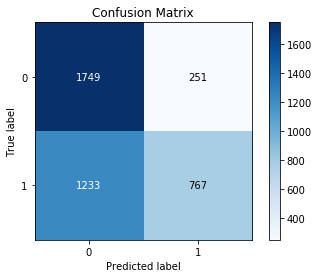

In [65]:
skplt.metrics.plot_confusion_matrix(y_cv1,y_pre1)

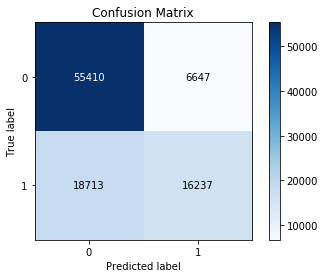

In [67]:
skplt.metrics.plot_confusion_matrix(y_train1,y_pre)

### Making the dataset balanced

In [74]:
test_pristine = []
k = 0
for f_name in os.listdir('test/test_pristine/'):
    if k%2==0:
        img = imread('test/test_pristine/'+f_name)
        test_pristine.append(img)
    k = k+1

In [75]:
len(test_fake),len(test_pristine)

(34950, 31029)

In [103]:
x_test=np.concatenate((test_fake, test_pristine), axis=0)

In [77]:
y_test = []
for i in range(34950):
    y_test.append(1)
for i in range(31029):
    y_test.append(0)

In [79]:
x_train = x_test
y_train = y_test

In [106]:
x_train[0].shape

(2, 2, 512)

In [82]:
model2=Sequential()
model2.add(Conv2D(input_shape=(64, 64, 3), filters=20, kernel_size=4, strides=2, padding='valid',activation='relu'))
model2.add(Conv2D(filters=15, kernel_size=3, strides=1, padding='valid', activation='relu'))
model2.add(MaxPool2D(pool_size=3))
model2.add(Conv2D(filters=20, kernel_size=4, strides=2, padding='valid', activation='relu'))
model2.add(MaxPool2D(pool_size=2))
model2.add(Flatten())
model2.add(Dropout(0.2))
model2.add(Dense(1, activation='sigmoid'))
model2.compile(Adam(lr = .00001), loss='binary_crossentropy', metrics=['accuracy'])
model2.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_10 (Conv2D)           (None, 31, 31, 20)        980       
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 29, 29, 15)        2715      
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 9, 9, 15)          0         
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 3, 3, 20)          4820      
_________________________________________________________________
max_pooling2d_8 (MaxPooling2 (None, 1, 1, 20)          0         
_________________________________________________________________
flatten_4 (Flatten)          (None, 20)                0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 20)               

In [83]:
history = model2.fit(x_train, y_train, batch_size=batch_size, epochs=epochs, verbose=1,validation_data=(x_cv1, y_cv1))
#model2.save('model2.h5')

Train on 65979 samples, validate on 4000 samples
Epoch 1/150
12992/65979 [====>.........................] - ETA: 15:54 - loss: 4.7124 - acc: 0.68 - ETA: 5:56 - loss: 5.5942 - acc: 0.5938 - ETA: 3:56 - loss: 4.3609 - acc: 0.537 - ETA: 3:05 - loss: 3.4612 - acc: 0.544 - ETA: 2:37 - loss: 2.9315 - acc: 0.531 - ETA: 2:19 - loss: 2.6044 - acc: 0.525 - ETA: 2:07 - loss: 2.3579 - acc: 0.528 - ETA: 2:01 - loss: 2.1459 - acc: 0.527 - ETA: 1:55 - loss: 1.9661 - acc: 0.544 - ETA: 1:52 - loss: 1.8620 - acc: 0.542 - ETA: 1:49 - loss: 1.7516 - acc: 0.555 - ETA: 1:44 - loss: 1.6693 - acc: 0.554 - ETA: 1:41 - loss: 1.5980 - acc: 0.548 - ETA: 1:38 - loss: 1.5420 - acc: 0.538 - ETA: 1:35 - loss: 1.4821 - acc: 0.536 - ETA: 1:33 - loss: 1.4307 - acc: 0.534 - ETA: 1:31 - loss: 1.3881 - acc: 0.525 - ETA: 1:28 - loss: 1.3531 - acc: 0.524 - ETA: 1:27 - loss: 1.3179 - acc: 0.519 - ETA: 1:26 - loss: 1.2859 - acc: 0.517 - ETA: 1:24 - loss: 1.2570 - acc: 0.513 - ETA: 1:23 - loss: 1.2359 - acc: 0.512 - ETA: 1:22 -

12928/65979 [====>.........................] - ETA: 55s - loss: 0.6909 - acc: 0.50 - ETA: 54s - loss: 0.6972 - acc: 0.46 - ETA: 54s - loss: 0.6957 - acc: 0.46 - ETA: 55s - loss: 0.6895 - acc: 0.51 - ETA: 55s - loss: 0.6923 - acc: 0.51 - ETA: 55s - loss: 0.7040 - acc: 0.53 - ETA: 55s - loss: 0.7005 - acc: 0.52 - ETA: 56s - loss: 0.6987 - acc: 0.52 - ETA: 55s - loss: 0.6982 - acc: 0.52 - ETA: 55s - loss: 0.6971 - acc: 0.52 - ETA: 55s - loss: 0.6969 - acc: 0.52 - ETA: 55s - loss: 0.6971 - acc: 0.52 - ETA: 55s - loss: 0.6971 - acc: 0.51 - ETA: 55s - loss: 0.6964 - acc: 0.52 - ETA: 55s - loss: 0.6963 - acc: 0.51 - ETA: 55s - loss: 0.6954 - acc: 0.52 - ETA: 55s - loss: 0.6956 - acc: 0.52 - ETA: 55s - loss: 0.6954 - acc: 0.51 - ETA: 57s - loss: 0.6954 - acc: 0.51 - ETA: 57s - loss: 0.6955 - acc: 0.52 - ETA: 57s - loss: 0.7027 - acc: 0.52 - ETA: 56s - loss: 0.7014 - acc: 0.52 - ETA: 56s - loss: 0.7008 - acc: 0.52 - ETA: 56s - loss: 0.6996 - acc: 0.53 - ETA: 56s - loss: 0.6992 - acc: 0.52 - ETA

65979/65979 [==============================] - ETA: 13s - loss: 0.6896 - acc: 0.54 - ETA: 13s - loss: 0.6896 - acc: 0.54 - ETA: 13s - loss: 0.6896 - acc: 0.54 - ETA: 13s - loss: 0.6895 - acc: 0.54 - ETA: 13s - loss: 0.6895 - acc: 0.54 - ETA: 13s - loss: 0.6896 - acc: 0.54 - ETA: 13s - loss: 0.6896 - acc: 0.54 - ETA: 12s - loss: 0.6895 - acc: 0.54 - ETA: 12s - loss: 0.6896 - acc: 0.54 - ETA: 12s - loss: 0.6896 - acc: 0.54 - ETA: 12s - loss: 0.6896 - acc: 0.54 - ETA: 12s - loss: 0.6895 - acc: 0.54 - ETA: 12s - loss: 0.6895 - acc: 0.54 - ETA: 12s - loss: 0.6895 - acc: 0.54 - ETA: 12s - loss: 0.6895 - acc: 0.54 - ETA: 12s - loss: 0.6895 - acc: 0.54 - ETA: 12s - loss: 0.6895 - acc: 0.54 - ETA: 12s - loss: 0.6894 - acc: 0.54 - ETA: 12s - loss: 0.6894 - acc: 0.54 - ETA: 12s - loss: 0.6894 - acc: 0.54 - ETA: 12s - loss: 0.6894 - acc: 0.54 - ETA: 12s - loss: 0.6894 - acc: 0.54 - ETA: 12s - loss: 0.6894 - acc: 0.54 - ETA: 12s - loss: 0.6894 - acc: 0.54 - ETA: 11s - loss: 0.6894 - acc: 0.54 - ETA

13024/65979 [====>.........................] - ETA: 1:01 - loss: 0.6886 - acc: 0.500 - ETA: 59s - loss: 0.6979 - acc: 0.541 - ETA: 57s - loss: 0.6939 - acc: 0.55 - ETA: 56s - loss: 0.6965 - acc: 0.52 - ETA: 57s - loss: 0.6921 - acc: 0.54 - ETA: 56s - loss: 0.6917 - acc: 0.53 - ETA: 57s - loss: 0.6887 - acc: 0.55 - ETA: 57s - loss: 0.6861 - acc: 0.56 - ETA: 57s - loss: 0.6849 - acc: 0.56 - ETA: 57s - loss: 0.6831 - acc: 0.57 - ETA: 1:00 - loss: 0.6814 - acc: 0.583 - ETA: 1:01 - loss: 0.6806 - acc: 0.585 - ETA: 1:02 - loss: 0.6797 - acc: 0.591 - ETA: 1:03 - loss: 0.6786 - acc: 0.590 - ETA: 1:05 - loss: 0.6793 - acc: 0.586 - ETA: 1:06 - loss: 0.6795 - acc: 0.586 - ETA: 1:07 - loss: 0.6793 - acc: 0.584 - ETA: 1:07 - loss: 0.6799 - acc: 0.580 - ETA: 1:07 - loss: 0.6809 - acc: 0.574 - ETA: 1:07 - loss: 0.6814 - acc: 0.572 - ETA: 1:06 - loss: 0.6820 - acc: 0.568 - ETA: 1:06 - loss: 0.6825 - acc: 0.563 - ETA: 1:05 - loss: 0.6805 - acc: 0.571 - ETA: 1:06 - loss: 0.6803 - acc: 0.571 - ETA: 1:06 

26688/65979 [===========>..................] - ETA: 55s - loss: 0.6838 - acc: 0.55 - ETA: 55s - loss: 0.6837 - acc: 0.55 - ETA: 55s - loss: 0.6837 - acc: 0.55 - ETA: 55s - loss: 0.6837 - acc: 0.55 - ETA: 55s - loss: 0.6837 - acc: 0.55 - ETA: 54s - loss: 0.6835 - acc: 0.55 - ETA: 54s - loss: 0.6837 - acc: 0.55 - ETA: 54s - loss: 0.6836 - acc: 0.55 - ETA: 54s - loss: 0.6835 - acc: 0.55 - ETA: 54s - loss: 0.6832 - acc: 0.55 - ETA: 54s - loss: 0.6832 - acc: 0.55 - ETA: 54s - loss: 0.6831 - acc: 0.55 - ETA: 54s - loss: 0.6830 - acc: 0.55 - ETA: 54s - loss: 0.6828 - acc: 0.55 - ETA: 53s - loss: 0.6831 - acc: 0.55 - ETA: 53s - loss: 0.6831 - acc: 0.55 - ETA: 53s - loss: 0.6830 - acc: 0.55 - ETA: 53s - loss: 0.6830 - acc: 0.55 - ETA: 53s - loss: 0.6831 - acc: 0.55 - ETA: 53s - loss: 0.6831 - acc: 0.55 - ETA: 53s - loss: 0.6832 - acc: 0.55 - ETA: 53s - loss: 0.6832 - acc: 0.55 - ETA: 53s - loss: 0.6832 - acc: 0.55 - ETA: 53s - loss: 0.6832 - acc: 0.55 - ETA: 53s - loss: 0.6831 - acc: 0.55 - ETA

40192/65979 [=================>............] - ETA: 38s - loss: 0.6818 - acc: 0.56 - ETA: 38s - loss: 0.6817 - acc: 0.56 - ETA: 38s - loss: 0.6817 - acc: 0.56 - ETA: 38s - loss: 0.6817 - acc: 0.56 - ETA: 37s - loss: 0.6816 - acc: 0.56 - ETA: 37s - loss: 0.6816 - acc: 0.56 - ETA: 37s - loss: 0.6816 - acc: 0.56 - ETA: 37s - loss: 0.6816 - acc: 0.56 - ETA: 37s - loss: 0.6817 - acc: 0.56 - ETA: 37s - loss: 0.6816 - acc: 0.56 - ETA: 37s - loss: 0.6815 - acc: 0.56 - ETA: 37s - loss: 0.6814 - acc: 0.56 - ETA: 37s - loss: 0.6813 - acc: 0.56 - ETA: 37s - loss: 0.6813 - acc: 0.56 - ETA: 37s - loss: 0.6812 - acc: 0.56 - ETA: 37s - loss: 0.6814 - acc: 0.56 - ETA: 37s - loss: 0.6814 - acc: 0.56 - ETA: 37s - loss: 0.6814 - acc: 0.56 - ETA: 37s - loss: 0.6813 - acc: 0.56 - ETA: 37s - loss: 0.6814 - acc: 0.56 - ETA: 37s - loss: 0.6814 - acc: 0.56 - ETA: 37s - loss: 0.6814 - acc: 0.56 - ETA: 37s - loss: 0.6814 - acc: 0.56 - ETA: 37s - loss: 0.6813 - acc: 0.56 - ETA: 37s - loss: 0.6812 - acc: 0.56 - ETA

54336/65979 [=======================>......] - ETA: 25s - loss: 0.6802 - acc: 0.56 - ETA: 25s - loss: 0.6802 - acc: 0.56 - ETA: 25s - loss: 0.6802 - acc: 0.56 - ETA: 25s - loss: 0.6803 - acc: 0.56 - ETA: 25s - loss: 0.6802 - acc: 0.56 - ETA: 25s - loss: 0.6802 - acc: 0.56 - ETA: 25s - loss: 0.6802 - acc: 0.56 - ETA: 25s - loss: 0.6802 - acc: 0.56 - ETA: 25s - loss: 0.6802 - acc: 0.56 - ETA: 25s - loss: 0.6802 - acc: 0.56 - ETA: 25s - loss: 0.6802 - acc: 0.56 - ETA: 25s - loss: 0.6802 - acc: 0.56 - ETA: 24s - loss: 0.6802 - acc: 0.56 - ETA: 24s - loss: 0.6802 - acc: 0.56 - ETA: 24s - loss: 0.6802 - acc: 0.56 - ETA: 24s - loss: 0.6802 - acc: 0.56 - ETA: 24s - loss: 0.6802 - acc: 0.56 - ETA: 24s - loss: 0.6802 - acc: 0.56 - ETA: 24s - loss: 0.6802 - acc: 0.56 - ETA: 24s - loss: 0.6803 - acc: 0.56 - ETA: 24s - loss: 0.6803 - acc: 0.56 - ETA: 24s - loss: 0.6804 - acc: 0.56 - ETA: 24s - loss: 0.6804 - acc: 0.56 - ETA: 24s - loss: 0.6803 - acc: 0.56 - ETA: 24s - loss: 0.6803 - acc: 0.56 - ETA

65979/65979 [==============================] - ETA: 11s - loss: 0.6798 - acc: 0.56 - ETA: 11s - loss: 0.6798 - acc: 0.56 - ETA: 11s - loss: 0.6798 - acc: 0.56 - ETA: 11s - loss: 0.6798 - acc: 0.56 - ETA: 11s - loss: 0.6798 - acc: 0.56 - ETA: 11s - loss: 0.6798 - acc: 0.56 - ETA: 11s - loss: 0.6798 - acc: 0.56 - ETA: 11s - loss: 0.6798 - acc: 0.56 - ETA: 11s - loss: 0.6798 - acc: 0.56 - ETA: 10s - loss: 0.6798 - acc: 0.56 - ETA: 10s - loss: 0.6798 - acc: 0.56 - ETA: 10s - loss: 0.6798 - acc: 0.56 - ETA: 10s - loss: 0.6798 - acc: 0.56 - ETA: 10s - loss: 0.6799 - acc: 0.56 - ETA: 10s - loss: 0.6799 - acc: 0.56 - ETA: 10s - loss: 0.6798 - acc: 0.56 - ETA: 10s - loss: 0.6799 - acc: 0.56 - ETA: 10s - loss: 0.6799 - acc: 0.56 - ETA: 10s - loss: 0.6798 - acc: 0.56 - ETA: 10s - loss: 0.6798 - acc: 0.56 - ETA: 10s - loss: 0.6798 - acc: 0.56 - ETA: 10s - loss: 0.6798 - acc: 0.56 - ETA: 10s - loss: 0.6798 - acc: 0.56 - ETA: 9s - loss: 0.6798 - acc: 0.5680 - ETA: 9s - loss: 0.6798 - acc: 0.567 - ET

13728/65979 [=====>........................] - ETA: 53s - loss: 0.6421 - acc: 0.65 - ETA: 1:02 - loss: 0.6508 - acc: 0.645 - ETA: 1:11 - loss: 0.6601 - acc: 0.631 - ETA: 1:06 - loss: 0.6672 - acc: 0.625 - ETA: 1:03 - loss: 0.6795 - acc: 0.593 - ETA: 1:01 - loss: 0.6775 - acc: 0.593 - ETA: 1:00 - loss: 0.6814 - acc: 0.586 - ETA: 59s - loss: 0.6784 - acc: 0.593 - ETA: 58s - loss: 0.6785 - acc: 0.58 - ETA: 58s - loss: 0.6740 - acc: 0.58 - ETA: 58s - loss: 0.6748 - acc: 0.58 - ETA: 57s - loss: 0.6752 - acc: 0.57 - ETA: 57s - loss: 0.6754 - acc: 0.57 - ETA: 57s - loss: 0.6745 - acc: 0.57 - ETA: 57s - loss: 0.6735 - acc: 0.58 - ETA: 57s - loss: 0.6741 - acc: 0.58 - ETA: 56s - loss: 0.6738 - acc: 0.58 - ETA: 56s - loss: 0.6754 - acc: 0.57 - ETA: 56s - loss: 0.6736 - acc: 0.58 - ETA: 56s - loss: 0.6726 - acc: 0.58 - ETA: 56s - loss: 0.6724 - acc: 0.58 - ETA: 56s - loss: 0.6716 - acc: 0.58 - ETA: 57s - loss: 0.6721 - acc: 0.58 - ETA: 58s - loss: 0.6723 - acc: 0.58 - ETA: 57s - loss: 0.6721 - ac

65979/65979 [==============================] - ETA: 9s - loss: 0.6720 - acc: 0.584 - ETA: 9s - loss: 0.6720 - acc: 0.584 - ETA: 9s - loss: 0.6720 - acc: 0.584 - ETA: 9s - loss: 0.6720 - acc: 0.584 - ETA: 9s - loss: 0.6720 - acc: 0.584 - ETA: 9s - loss: 0.6720 - acc: 0.584 - ETA: 9s - loss: 0.6719 - acc: 0.584 - ETA: 9s - loss: 0.6719 - acc: 0.584 - ETA: 9s - loss: 0.6719 - acc: 0.584 - ETA: 9s - loss: 0.6719 - acc: 0.584 - ETA: 9s - loss: 0.6719 - acc: 0.584 - ETA: 9s - loss: 0.6719 - acc: 0.584 - ETA: 9s - loss: 0.6720 - acc: 0.584 - ETA: 9s - loss: 0.6720 - acc: 0.584 - ETA: 9s - loss: 0.6719 - acc: 0.584 - ETA: 9s - loss: 0.6719 - acc: 0.584 - ETA: 9s - loss: 0.6719 - acc: 0.584 - ETA: 8s - loss: 0.6719 - acc: 0.584 - ETA: 8s - loss: 0.6718 - acc: 0.585 - ETA: 8s - loss: 0.6718 - acc: 0.585 - ETA: 8s - loss: 0.6718 - acc: 0.585 - ETA: 8s - loss: 0.6718 - acc: 0.584 - ETA: 8s - loss: 0.6718 - acc: 0.584 - ETA: 8s - loss: 0.6718 - acc: 0.585 - ETA: 8s - loss: 0.6719 - acc: 0.585 - ETA

12128/65979 [====>.........................] - ETA: 1:26 - loss: 0.6589 - acc: 0.593 - ETA: 1:29 - loss: 0.6702 - acc: 0.583 - ETA: 1:28 - loss: 0.6766 - acc: 0.593 - ETA: 1:27 - loss: 0.6675 - acc: 0.611 - ETA: 1:27 - loss: 0.6623 - acc: 0.604 - ETA: 1:26 - loss: 0.6612 - acc: 0.613 - ETA: 1:23 - loss: 0.6603 - acc: 0.615 - ETA: 1:22 - loss: 0.6551 - acc: 0.612 - ETA: 1:22 - loss: 0.6601 - acc: 0.610 - ETA: 1:24 - loss: 0.6603 - acc: 0.609 - ETA: 1:25 - loss: 0.6616 - acc: 0.606 - ETA: 1:26 - loss: 0.6594 - acc: 0.606 - ETA: 1:26 - loss: 0.6649 - acc: 0.593 - ETA: 1:27 - loss: 0.6656 - acc: 0.593 - ETA: 1:27 - loss: 0.6652 - acc: 0.593 - ETA: 1:28 - loss: 0.6643 - acc: 0.596 - ETA: 1:27 - loss: 0.6640 - acc: 0.594 - ETA: 1:28 - loss: 0.6643 - acc: 0.600 - ETA: 1:27 - loss: 0.6638 - acc: 0.599 - ETA: 1:28 - loss: 0.6669 - acc: 0.594 - ETA: 1:28 - loss: 0.6677 - acc: 0.591 - ETA: 1:28 - loss: 0.6679 - acc: 0.586 - ETA: 1:28 - loss: 0.6682 - acc: 0.583 - ETA: 1:29 - loss: 0.6673 - acc: 0

12960/65979 [====>.........................] - ETA: 1:09 - loss: 0.6725 - acc: 0.500 - ETA: 1:07 - loss: 0.6801 - acc: 0.531 - ETA: 1:10 - loss: 0.6613 - acc: 0.575 - ETA: 1:08 - loss: 0.6640 - acc: 0.575 - ETA: 1:06 - loss: 0.6709 - acc: 0.576 - ETA: 1:04 - loss: 0.6716 - acc: 0.582 - ETA: 1:04 - loss: 0.6656 - acc: 0.596 - ETA: 1:06 - loss: 0.6674 - acc: 0.589 - ETA: 1:07 - loss: 0.6651 - acc: 0.586 - ETA: 1:08 - loss: 0.6702 - acc: 0.570 - ETA: 1:07 - loss: 0.6798 - acc: 0.565 - ETA: 1:07 - loss: 0.6764 - acc: 0.565 - ETA: 1:06 - loss: 0.6746 - acc: 0.571 - ETA: 1:05 - loss: 0.6757 - acc: 0.566 - ETA: 1:04 - loss: 0.6762 - acc: 0.565 - ETA: 1:04 - loss: 0.6760 - acc: 0.565 - ETA: 1:06 - loss: 0.6757 - acc: 0.562 - ETA: 1:08 - loss: 0.6747 - acc: 0.566 - ETA: 1:08 - loss: 0.6728 - acc: 0.572 - ETA: 1:08 - loss: 0.6755 - acc: 0.569 - ETA: 1:08 - loss: 0.6742 - acc: 0.567 - ETA: 1:08 - loss: 0.6744 - acc: 0.566 - ETA: 1:07 - loss: 0.6750 - acc: 0.566 - ETA: 1:06 - loss: 0.6745 - acc: 0

17760/65979 [=======>......................] - ETA: 34s - loss: 0.6839 - acc: 0.53 - ETA: 54s - loss: 0.6580 - acc: 0.59 - ETA: 48s - loss: 0.6758 - acc: 0.56 - ETA: 52s - loss: 0.6766 - acc: 0.57 - ETA: 49s - loss: 0.6776 - acc: 0.56 - ETA: 50s - loss: 0.6661 - acc: 0.58 - ETA: 48s - loss: 0.6668 - acc: 0.57 - ETA: 50s - loss: 0.6638 - acc: 0.58 - ETA: 50s - loss: 0.6613 - acc: 0.59 - ETA: 50s - loss: 0.6588 - acc: 0.60 - ETA: 50s - loss: 0.6591 - acc: 0.59 - ETA: 50s - loss: 0.6623 - acc: 0.59 - ETA: 50s - loss: 0.6640 - acc: 0.59 - ETA: 50s - loss: 0.6636 - acc: 0.59 - ETA: 50s - loss: 0.6635 - acc: 0.59 - ETA: 50s - loss: 0.6644 - acc: 0.58 - ETA: 51s - loss: 0.6675 - acc: 0.58 - ETA: 50s - loss: 0.6690 - acc: 0.58 - ETA: 50s - loss: 0.6694 - acc: 0.58 - ETA: 50s - loss: 0.6685 - acc: 0.58 - ETA: 50s - loss: 0.6664 - acc: 0.58 - ETA: 50s - loss: 0.6659 - acc: 0.58 - ETA: 50s - loss: 0.6653 - acc: 0.58 - ETA: 50s - loss: 0.6652 - acc: 0.58 - ETA: 49s - loss: 0.6639 - acc: 0.59 - ETA

65979/65979 [==============================] - ETA: 3s - loss: 0.6608 - acc: 0.594 - ETA: 3s - loss: 0.6607 - acc: 0.594 - ETA: 3s - loss: 0.6608 - acc: 0.594 - ETA: 3s - loss: 0.6608 - acc: 0.594 - ETA: 3s - loss: 0.6607 - acc: 0.594 - ETA: 3s - loss: 0.6608 - acc: 0.594 - ETA: 3s - loss: 0.6608 - acc: 0.594 - ETA: 3s - loss: 0.6608 - acc: 0.594 - ETA: 3s - loss: 0.6607 - acc: 0.594 - ETA: 3s - loss: 0.6607 - acc: 0.594 - ETA: 3s - loss: 0.6607 - acc: 0.594 - ETA: 3s - loss: 0.6607 - acc: 0.594 - ETA: 3s - loss: 0.6606 - acc: 0.594 - ETA: 3s - loss: 0.6606 - acc: 0.594 - ETA: 2s - loss: 0.6606 - acc: 0.594 - ETA: 2s - loss: 0.6606 - acc: 0.594 - ETA: 2s - loss: 0.6606 - acc: 0.594 - ETA: 2s - loss: 0.6606 - acc: 0.594 - ETA: 2s - loss: 0.6606 - acc: 0.594 - ETA: 2s - loss: 0.6606 - acc: 0.594 - ETA: 2s - loss: 0.6606 - acc: 0.594 - ETA: 2s - loss: 0.6606 - acc: 0.594 - ETA: 2s - loss: 0.6606 - acc: 0.594 - ETA: 2s - loss: 0.6606 - acc: 0.594 - ETA: 2s - loss: 0.6606 - acc: 0.594 - ETA

13664/65979 [=====>........................] - ETA: 1:07 - loss: 0.6415 - acc: 0.625 - ETA: 1:01 - loss: 0.6421 - acc: 0.656 - ETA: 58s - loss: 0.6405 - acc: 0.662 - ETA: 57s - loss: 0.6374 - acc: 0.64 - ETA: 57s - loss: 0.6379 - acc: 0.65 - ETA: 57s - loss: 0.6584 - acc: 0.63 - ETA: 57s - loss: 0.6550 - acc: 0.63 - ETA: 57s - loss: 0.6546 - acc: 0.62 - ETA: 57s - loss: 0.6489 - acc: 0.63 - ETA: 57s - loss: 0.6510 - acc: 0.62 - ETA: 57s - loss: 0.6510 - acc: 0.62 - ETA: 56s - loss: 0.6512 - acc: 0.62 - ETA: 56s - loss: 0.6521 - acc: 0.61 - ETA: 56s - loss: 0.6622 - acc: 0.61 - ETA: 56s - loss: 0.6607 - acc: 0.60 - ETA: 56s - loss: 0.6594 - acc: 0.60 - ETA: 56s - loss: 0.6578 - acc: 0.60 - ETA: 56s - loss: 0.6551 - acc: 0.61 - ETA: 56s - loss: 0.6555 - acc: 0.60 - ETA: 56s - loss: 0.6560 - acc: 0.60 - ETA: 57s - loss: 0.6564 - acc: 0.60 - ETA: 57s - loss: 0.6583 - acc: 0.60 - ETA: 57s - loss: 0.6573 - acc: 0.60 - ETA: 57s - loss: 0.6573 - acc: 0.60 - ETA: 57s - loss: 0.6568 - acc: 0.60 

65979/65979 [==============================] - ETA: 9s - loss: 0.6520 - acc: 0.603 - ETA: 9s - loss: 0.6519 - acc: 0.603 - ETA: 9s - loss: 0.6520 - acc: 0.603 - ETA: 9s - loss: 0.6520 - acc: 0.603 - ETA: 9s - loss: 0.6519 - acc: 0.604 - ETA: 9s - loss: 0.6521 - acc: 0.603 - ETA: 9s - loss: 0.6521 - acc: 0.603 - ETA: 9s - loss: 0.6520 - acc: 0.604 - ETA: 9s - loss: 0.6520 - acc: 0.603 - ETA: 9s - loss: 0.6520 - acc: 0.603 - ETA: 9s - loss: 0.6519 - acc: 0.604 - ETA: 9s - loss: 0.6520 - acc: 0.604 - ETA: 9s - loss: 0.6519 - acc: 0.603 - ETA: 9s - loss: 0.6521 - acc: 0.603 - ETA: 9s - loss: 0.6521 - acc: 0.603 - ETA: 8s - loss: 0.6521 - acc: 0.603 - ETA: 8s - loss: 0.6520 - acc: 0.603 - ETA: 8s - loss: 0.6520 - acc: 0.604 - ETA: 8s - loss: 0.6519 - acc: 0.604 - ETA: 8s - loss: 0.6518 - acc: 0.604 - ETA: 8s - loss: 0.6518 - acc: 0.604 - ETA: 8s - loss: 0.6517 - acc: 0.604 - ETA: 8s - loss: 0.6518 - acc: 0.604 - ETA: 8s - loss: 0.6518 - acc: 0.604 - ETA: 8s - loss: 0.6517 - acc: 0.604 - ETA

13856/65979 [=====>........................] - ETA: 1:09 - loss: 0.5994 - acc: 0.656 - ETA: 1:04 - loss: 0.5759 - acc: 0.687 - ETA: 59s - loss: 0.6238 - acc: 0.619 - ETA: 59s - loss: 0.6354 - acc: 0.60 - ETA: 59s - loss: 0.6467 - acc: 0.62 - ETA: 1:00 - loss: 0.6467 - acc: 0.622 - ETA: 59s - loss: 0.6543 - acc: 0.602 - ETA: 58s - loss: 0.6531 - acc: 0.61 - ETA: 58s - loss: 0.6517 - acc: 0.61 - ETA: 58s - loss: 0.6522 - acc: 0.60 - ETA: 58s - loss: 0.6495 - acc: 0.61 - ETA: 57s - loss: 0.6492 - acc: 0.61 - ETA: 57s - loss: 0.6510 - acc: 0.60 - ETA: 57s - loss: 0.6511 - acc: 0.60 - ETA: 57s - loss: 0.6496 - acc: 0.61 - ETA: 56s - loss: 0.6493 - acc: 0.60 - ETA: 58s - loss: 0.6483 - acc: 0.61 - ETA: 58s - loss: 0.6482 - acc: 0.61 - ETA: 58s - loss: 0.6483 - acc: 0.60 - ETA: 58s - loss: 0.6484 - acc: 0.60 - ETA: 58s - loss: 0.6483 - acc: 0.61 - ETA: 57s - loss: 0.6478 - acc: 0.61 - ETA: 57s - loss: 0.6485 - acc: 0.61 - ETA: 57s - loss: 0.6500 - acc: 0.61 - ETA: 57s - loss: 0.6493 - acc: 0.

65979/65979 [==============================] - ETA: 9s - loss: 0.6462 - acc: 0.610 - ETA: 9s - loss: 0.6462 - acc: 0.610 - ETA: 8s - loss: 0.6462 - acc: 0.610 - ETA: 8s - loss: 0.6463 - acc: 0.610 - ETA: 8s - loss: 0.6463 - acc: 0.610 - ETA: 8s - loss: 0.6463 - acc: 0.610 - ETA: 8s - loss: 0.6462 - acc: 0.610 - ETA: 8s - loss: 0.6462 - acc: 0.610 - ETA: 8s - loss: 0.6462 - acc: 0.611 - ETA: 8s - loss: 0.6462 - acc: 0.610 - ETA: 8s - loss: 0.6462 - acc: 0.611 - ETA: 8s - loss: 0.6461 - acc: 0.611 - ETA: 8s - loss: 0.6461 - acc: 0.611 - ETA: 8s - loss: 0.6461 - acc: 0.611 - ETA: 8s - loss: 0.6460 - acc: 0.611 - ETA: 8s - loss: 0.6460 - acc: 0.611 - ETA: 8s - loss: 0.6460 - acc: 0.611 - ETA: 8s - loss: 0.6460 - acc: 0.611 - ETA: 8s - loss: 0.6460 - acc: 0.611 - ETA: 7s - loss: 0.6460 - acc: 0.611 - ETA: 7s - loss: 0.6459 - acc: 0.611 - ETA: 7s - loss: 0.6459 - acc: 0.611 - ETA: 7s - loss: 0.6459 - acc: 0.611 - ETA: 7s - loss: 0.6459 - acc: 0.611 - ETA: 7s - loss: 0.6459 - acc: 0.611 - ETA

13696/65979 [=====>........................] - ETA: 1:07 - loss: 0.7012 - acc: 0.593 - ETA: 1:30 - loss: 0.6704 - acc: 0.562 - ETA: 1:14 - loss: 0.6488 - acc: 0.585 - ETA: 1:09 - loss: 0.6395 - acc: 0.609 - ETA: 1:05 - loss: 0.6411 - acc: 0.597 - ETA: 1:03 - loss: 0.6402 - acc: 0.600 - ETA: 1:02 - loss: 0.6411 - acc: 0.588 - ETA: 1:01 - loss: 0.6339 - acc: 0.600 - ETA: 1:00 - loss: 0.6306 - acc: 0.591 - ETA: 59s - loss: 0.6284 - acc: 0.597 - ETA: 59s - loss: 0.6268 - acc: 0.60 - ETA: 59s - loss: 0.6230 - acc: 0.62 - ETA: 59s - loss: 0.6259 - acc: 0.61 - ETA: 59s - loss: 0.6275 - acc: 0.62 - ETA: 59s - loss: 0.6295 - acc: 0.61 - ETA: 59s - loss: 0.6301 - acc: 0.61 - ETA: 59s - loss: 0.6290 - acc: 0.61 - ETA: 59s - loss: 0.6315 - acc: 0.61 - ETA: 1:00 - loss: 0.6293 - acc: 0.612 - ETA: 59s - loss: 0.6315 - acc: 0.614 - ETA: 1:00 - loss: 0.6337 - acc: 0.613 - ETA: 1:00 - loss: 0.6305 - acc: 0.616 - ETA: 59s - loss: 0.6288 - acc: 0.618 - ETA: 59s - loss: 0.6285 - acc: 0.62 - ETA: 59s - los

65979/65979 [==============================] - ETA: 9s - loss: 0.6407 - acc: 0.6144 - ETA: 9s - loss: 0.6407 - acc: 0.614 - ETA: 9s - loss: 0.6407 - acc: 0.614 - ETA: 9s - loss: 0.6407 - acc: 0.614 - ETA: 9s - loss: 0.6407 - acc: 0.614 - ETA: 9s - loss: 0.6408 - acc: 0.614 - ETA: 9s - loss: 0.6408 - acc: 0.614 - ETA: 9s - loss: 0.6408 - acc: 0.614 - ETA: 9s - loss: 0.6408 - acc: 0.614 - ETA: 9s - loss: 0.6408 - acc: 0.614 - ETA: 9s - loss: 0.6408 - acc: 0.614 - ETA: 9s - loss: 0.6408 - acc: 0.614 - ETA: 9s - loss: 0.6408 - acc: 0.614 - ETA: 9s - loss: 0.6408 - acc: 0.614 - ETA: 9s - loss: 0.6409 - acc: 0.614 - ETA: 9s - loss: 0.6408 - acc: 0.614 - ETA: 9s - loss: 0.6408 - acc: 0.614 - ETA: 8s - loss: 0.6407 - acc: 0.614 - ETA: 8s - loss: 0.6406 - acc: 0.614 - ETA: 8s - loss: 0.6406 - acc: 0.614 - ETA: 8s - loss: 0.6406 - acc: 0.614 - ETA: 8s - loss: 0.6406 - acc: 0.614 - ETA: 8s - loss: 0.6406 - acc: 0.614 - ETA: 8s - loss: 0.6406 - acc: 0.615 - ETA: 8s - loss: 0.6407 - acc: 0.614 - ET

17664/65979 [=======>......................] - ETA: 56s - loss: 0.7143 - acc: 0.53 - ETA: 50s - loss: 0.6658 - acc: 0.57 - ETA: 50s - loss: 0.6642 - acc: 0.60 - ETA: 49s - loss: 0.6543 - acc: 0.61 - ETA: 50s - loss: 0.6489 - acc: 0.61 - ETA: 50s - loss: 0.6611 - acc: 0.61 - ETA: 51s - loss: 0.6581 - acc: 0.61 - ETA: 51s - loss: 0.6541 - acc: 0.60 - ETA: 51s - loss: 0.6542 - acc: 0.60 - ETA: 51s - loss: 0.6586 - acc: 0.60 - ETA: 51s - loss: 0.6650 - acc: 0.59 - ETA: 50s - loss: 0.6610 - acc: 0.59 - ETA: 50s - loss: 0.6657 - acc: 0.58 - ETA: 50s - loss: 0.6620 - acc: 0.58 - ETA: 51s - loss: 0.6602 - acc: 0.59 - ETA: 51s - loss: 0.6640 - acc: 0.58 - ETA: 51s - loss: 0.6647 - acc: 0.58 - ETA: 51s - loss: 0.6641 - acc: 0.58 - ETA: 51s - loss: 0.6622 - acc: 0.59 - ETA: 51s - loss: 0.6585 - acc: 0.59 - ETA: 51s - loss: 0.6578 - acc: 0.59 - ETA: 51s - loss: 0.6594 - acc: 0.59 - ETA: 51s - loss: 0.6583 - acc: 0.59 - ETA: 50s - loss: 0.6584 - acc: 0.59 - ETA: 50s - loss: 0.6563 - acc: 0.59 - ETA

15744/65979 [======>.......................] - ETA: 49s - loss: 0.5507 - acc: 0.84 - ETA: 49s - loss: 0.6653 - acc: 0.64 - ETA: 51s - loss: 0.6654 - acc: 0.60 - ETA: 1:00 - loss: 0.6414 - acc: 0.648 - ETA: 1:01 - loss: 0.6298 - acc: 0.656 - ETA: 1:01 - loss: 0.6367 - acc: 0.645 - ETA: 59s - loss: 0.6315 - acc: 0.637 - ETA: 59s - loss: 0.6301 - acc: 0.64 - ETA: 58s - loss: 0.6310 - acc: 0.63 - ETA: 58s - loss: 0.6335 - acc: 0.63 - ETA: 57s - loss: 0.6332 - acc: 0.63 - ETA: 58s - loss: 0.6401 - acc: 0.62 - ETA: 57s - loss: 0.6376 - acc: 0.62 - ETA: 56s - loss: 0.6387 - acc: 0.62 - ETA: 55s - loss: 0.6365 - acc: 0.62 - ETA: 55s - loss: 0.6353 - acc: 0.62 - ETA: 55s - loss: 0.6353 - acc: 0.63 - ETA: 54s - loss: 0.6358 - acc: 0.62 - ETA: 54s - loss: 0.6348 - acc: 0.63 - ETA: 54s - loss: 0.6327 - acc: 0.63 - ETA: 53s - loss: 0.6303 - acc: 0.63 - ETA: 54s - loss: 0.6327 - acc: 0.63 - ETA: 54s - loss: 0.6327 - acc: 0.63 - ETA: 54s - loss: 0.6319 - acc: 0.63 - ETA: 54s - loss: 0.6329 - acc: 0.6

61184/65979 [==========================>...] - ETA: 17s - loss: 0.6359 - acc: 0.61 - ETA: 17s - loss: 0.6359 - acc: 0.61 - ETA: 17s - loss: 0.6359 - acc: 0.62 - ETA: 17s - loss: 0.6359 - acc: 0.61 - ETA: 17s - loss: 0.6359 - acc: 0.62 - ETA: 17s - loss: 0.6359 - acc: 0.62 - ETA: 17s - loss: 0.6359 - acc: 0.61 - ETA: 17s - loss: 0.6359 - acc: 0.61 - ETA: 17s - loss: 0.6359 - acc: 0.62 - ETA: 17s - loss: 0.6358 - acc: 0.62 - ETA: 17s - loss: 0.6358 - acc: 0.62 - ETA: 16s - loss: 0.6358 - acc: 0.62 - ETA: 16s - loss: 0.6357 - acc: 0.62 - ETA: 16s - loss: 0.6358 - acc: 0.62 - ETA: 16s - loss: 0.6358 - acc: 0.62 - ETA: 16s - loss: 0.6358 - acc: 0.62 - ETA: 16s - loss: 0.6358 - acc: 0.62 - ETA: 16s - loss: 0.6357 - acc: 0.61 - ETA: 16s - loss: 0.6358 - acc: 0.62 - ETA: 16s - loss: 0.6358 - acc: 0.62 - ETA: 16s - loss: 0.6357 - acc: 0.62 - ETA: 16s - loss: 0.6357 - acc: 0.62 - ETA: 16s - loss: 0.6357 - acc: 0.62 - ETA: 16s - loss: 0.6357 - acc: 0.62 - ETA: 16s - loss: 0.6357 - acc: 0.62 - ETA

65979/65979 [==============================] - ETA: 4s - loss: 0.6349 - acc: 0.619 - ETA: 3s - loss: 0.6349 - acc: 0.619 - ETA: 3s - loss: 0.6349 - acc: 0.619 - ETA: 3s - loss: 0.6349 - acc: 0.619 - ETA: 3s - loss: 0.6349 - acc: 0.619 - ETA: 3s - loss: 0.6349 - acc: 0.619 - ETA: 3s - loss: 0.6349 - acc: 0.619 - ETA: 3s - loss: 0.6349 - acc: 0.619 - ETA: 3s - loss: 0.6349 - acc: 0.619 - ETA: 3s - loss: 0.6349 - acc: 0.619 - ETA: 3s - loss: 0.6350 - acc: 0.619 - ETA: 3s - loss: 0.6350 - acc: 0.619 - ETA: 3s - loss: 0.6349 - acc: 0.619 - ETA: 3s - loss: 0.6349 - acc: 0.619 - ETA: 3s - loss: 0.6348 - acc: 0.619 - ETA: 3s - loss: 0.6348 - acc: 0.619 - ETA: 3s - loss: 0.6348 - acc: 0.619 - ETA: 2s - loss: 0.6348 - acc: 0.619 - ETA: 2s - loss: 0.6348 - acc: 0.619 - ETA: 2s - loss: 0.6349 - acc: 0.619 - ETA: 2s - loss: 0.6349 - acc: 0.619 - ETA: 2s - loss: 0.6349 - acc: 0.619 - ETA: 2s - loss: 0.6348 - acc: 0.619 - ETA: 2s - loss: 0.6348 - acc: 0.619 - ETA: 2s - loss: 0.6348 - acc: 0.619 - ETA

14816/65979 [=====>........................] - ETA: 55s - loss: 0.5558 - acc: 0.68 - ETA: 57s - loss: 0.5875 - acc: 0.64 - ETA: 58s - loss: 0.6078 - acc: 0.65 - ETA: 58s - loss: 0.6003 - acc: 0.66 - ETA: 59s - loss: 0.6057 - acc: 0.63 - ETA: 59s - loss: 0.6038 - acc: 0.64 - ETA: 57s - loss: 0.6171 - acc: 0.63 - ETA: 56s - loss: 0.6236 - acc: 0.62 - ETA: 55s - loss: 0.6267 - acc: 0.62 - ETA: 56s - loss: 0.6261 - acc: 0.62 - ETA: 56s - loss: 0.6245 - acc: 0.62 - ETA: 56s - loss: 0.6256 - acc: 0.61 - ETA: 55s - loss: 0.6350 - acc: 0.61 - ETA: 55s - loss: 0.6355 - acc: 0.60 - ETA: 55s - loss: 0.6299 - acc: 0.61 - ETA: 55s - loss: 0.6282 - acc: 0.62 - ETA: 54s - loss: 0.6327 - acc: 0.61 - ETA: 54s - loss: 0.6319 - acc: 0.61 - ETA: 54s - loss: 0.6295 - acc: 0.62 - ETA: 54s - loss: 0.6282 - acc: 0.62 - ETA: 54s - loss: 0.6274 - acc: 0.62 - ETA: 54s - loss: 0.6305 - acc: 0.61 - ETA: 54s - loss: 0.6313 - acc: 0.61 - ETA: 54s - loss: 0.6320 - acc: 0.61 - ETA: 54s - loss: 0.6320 - acc: 0.61 - ETA

65979/65979 [==============================] - ETA: 6s - loss: 0.6324 - acc: 0.622 - ETA: 6s - loss: 0.6324 - acc: 0.622 - ETA: 6s - loss: 0.6325 - acc: 0.622 - ETA: 6s - loss: 0.6325 - acc: 0.622 - ETA: 6s - loss: 0.6325 - acc: 0.622 - ETA: 6s - loss: 0.6325 - acc: 0.622 - ETA: 6s - loss: 0.6325 - acc: 0.622 - ETA: 6s - loss: 0.6325 - acc: 0.622 - ETA: 6s - loss: 0.6324 - acc: 0.622 - ETA: 6s - loss: 0.6324 - acc: 0.622 - ETA: 5s - loss: 0.6323 - acc: 0.622 - ETA: 5s - loss: 0.6323 - acc: 0.622 - ETA: 5s - loss: 0.6322 - acc: 0.623 - ETA: 5s - loss: 0.6323 - acc: 0.622 - ETA: 5s - loss: 0.6324 - acc: 0.622 - ETA: 5s - loss: 0.6324 - acc: 0.622 - ETA: 5s - loss: 0.6323 - acc: 0.623 - ETA: 5s - loss: 0.6323 - acc: 0.622 - ETA: 5s - loss: 0.6324 - acc: 0.622 - ETA: 5s - loss: 0.6323 - acc: 0.622 - ETA: 5s - loss: 0.6323 - acc: 0.622 - ETA: 5s - loss: 0.6323 - acc: 0.622 - ETA: 5s - loss: 0.6323 - acc: 0.622 - ETA: 5s - loss: 0.6324 - acc: 0.622 - ETA: 5s - loss: 0.6324 - acc: 0.622 - ETA

13344/65979 [=====>........................] - ETA: 59s - loss: 0.7235 - acc: 0.62 - ETA: 55s - loss: 0.6679 - acc: 0.66 - ETA: 54s - loss: 0.6690 - acc: 0.65 - ETA: 53s - loss: 0.6416 - acc: 0.67 - ETA: 53s - loss: 0.6394 - acc: 0.66 - ETA: 53s - loss: 0.6272 - acc: 0.66 - ETA: 53s - loss: 0.6203 - acc: 0.67 - ETA: 52s - loss: 0.6200 - acc: 0.65 - ETA: 53s - loss: 0.6208 - acc: 0.65 - ETA: 54s - loss: 0.6163 - acc: 0.66 - ETA: 56s - loss: 0.6119 - acc: 0.66 - ETA: 56s - loss: 0.6172 - acc: 0.64 - ETA: 56s - loss: 0.6117 - acc: 0.65 - ETA: 56s - loss: 0.6189 - acc: 0.63 - ETA: 55s - loss: 0.6185 - acc: 0.63 - ETA: 56s - loss: 0.6171 - acc: 0.63 - ETA: 56s - loss: 0.6184 - acc: 0.63 - ETA: 57s - loss: 0.6191 - acc: 0.63 - ETA: 58s - loss: 0.6194 - acc: 0.63 - ETA: 58s - loss: 0.6219 - acc: 0.63 - ETA: 59s - loss: 0.6243 - acc: 0.62 - ETA: 1:00 - loss: 0.6243 - acc: 0.628 - ETA: 59s - loss: 0.6252 - acc: 0.628 - ETA: 1:00 - loss: 0.6269 - acc: 0.628 - ETA: 59s - loss: 0.6265 - acc: 0.627

65979/65979 [==============================] - ETA: 9s - loss: 0.6290 - acc: 0.627 - ETA: 9s - loss: 0.6291 - acc: 0.627 - ETA: 9s - loss: 0.6291 - acc: 0.627 - ETA: 9s - loss: 0.6290 - acc: 0.627 - ETA: 9s - loss: 0.6290 - acc: 0.627 - ETA: 9s - loss: 0.6290 - acc: 0.627 - ETA: 9s - loss: 0.6289 - acc: 0.627 - ETA: 9s - loss: 0.6289 - acc: 0.627 - ETA: 9s - loss: 0.6289 - acc: 0.627 - ETA: 8s - loss: 0.6291 - acc: 0.627 - ETA: 8s - loss: 0.6290 - acc: 0.627 - ETA: 8s - loss: 0.6290 - acc: 0.627 - ETA: 8s - loss: 0.6290 - acc: 0.627 - ETA: 8s - loss: 0.6290 - acc: 0.627 - ETA: 8s - loss: 0.6291 - acc: 0.627 - ETA: 8s - loss: 0.6291 - acc: 0.627 - ETA: 8s - loss: 0.6291 - acc: 0.627 - ETA: 8s - loss: 0.6292 - acc: 0.627 - ETA: 8s - loss: 0.6292 - acc: 0.627 - ETA: 8s - loss: 0.6292 - acc: 0.627 - ETA: 8s - loss: 0.6292 - acc: 0.627 - ETA: 8s - loss: 0.6293 - acc: 0.627 - ETA: 8s - loss: 0.6293 - acc: 0.627 - ETA: 8s - loss: 0.6294 - acc: 0.627 - ETA: 8s - loss: 0.6294 - acc: 0.627 - ETA

14432/65979 [=====>........................] - ETA: 59s - loss: 0.6685 - acc: 0.56 - ETA: 57s - loss: 0.6101 - acc: 0.59 - ETA: 58s - loss: 0.6230 - acc: 0.58 - ETA: 57s - loss: 0.6277 - acc: 0.58 - ETA: 56s - loss: 0.6219 - acc: 0.60 - ETA: 59s - loss: 0.6147 - acc: 0.60 - ETA: 1:00 - loss: 0.6143 - acc: 0.617 - ETA: 58s - loss: 0.6116 - acc: 0.630 - ETA: 58s - loss: 0.6149 - acc: 0.62 - ETA: 57s - loss: 0.6164 - acc: 0.63 - ETA: 57s - loss: 0.6181 - acc: 0.63 - ETA: 56s - loss: 0.6142 - acc: 0.63 - ETA: 55s - loss: 0.6153 - acc: 0.63 - ETA: 55s - loss: 0.6163 - acc: 0.63 - ETA: 55s - loss: 0.6180 - acc: 0.63 - ETA: 55s - loss: 0.6197 - acc: 0.63 - ETA: 55s - loss: 0.6197 - acc: 0.63 - ETA: 55s - loss: 0.6177 - acc: 0.64 - ETA: 55s - loss: 0.6198 - acc: 0.63 - ETA: 55s - loss: 0.6178 - acc: 0.64 - ETA: 55s - loss: 0.6200 - acc: 0.63 - ETA: 55s - loss: 0.6205 - acc: 0.63 - ETA: 55s - loss: 0.6199 - acc: 0.63 - ETA: 55s - loss: 0.6166 - acc: 0.63 - ETA: 55s - loss: 0.6159 - acc: 0.64 - 

65979/65979 [==============================] - ETA: 7s - loss: 0.6236 - acc: 0.629 - ETA: 7s - loss: 0.6237 - acc: 0.629 - ETA: 7s - loss: 0.6236 - acc: 0.629 - ETA: 7s - loss: 0.6236 - acc: 0.629 - ETA: 7s - loss: 0.6236 - acc: 0.629 - ETA: 7s - loss: 0.6236 - acc: 0.629 - ETA: 7s - loss: 0.6236 - acc: 0.629 - ETA: 6s - loss: 0.6236 - acc: 0.629 - ETA: 6s - loss: 0.6236 - acc: 0.629 - ETA: 6s - loss: 0.6236 - acc: 0.629 - ETA: 6s - loss: 0.6236 - acc: 0.629 - ETA: 6s - loss: 0.6236 - acc: 0.629 - ETA: 6s - loss: 0.6236 - acc: 0.628 - ETA: 6s - loss: 0.6236 - acc: 0.628 - ETA: 6s - loss: 0.6236 - acc: 0.628 - ETA: 6s - loss: 0.6236 - acc: 0.628 - ETA: 6s - loss: 0.6236 - acc: 0.628 - ETA: 6s - loss: 0.6236 - acc: 0.628 - ETA: 6s - loss: 0.6236 - acc: 0.628 - ETA: 6s - loss: 0.6236 - acc: 0.628 - ETA: 6s - loss: 0.6236 - acc: 0.628 - ETA: 6s - loss: 0.6236 - acc: 0.628 - ETA: 6s - loss: 0.6236 - acc: 0.628 - ETA: 6s - loss: 0.6235 - acc: 0.628 - ETA: 6s - loss: 0.6235 - acc: 0.628 - ETA

15104/65979 [=====>........................] - ETA: 51s - loss: 0.6190 - acc: 0.59 - ETA: 49s - loss: 0.6801 - acc: 0.62 - ETA: 50s - loss: 0.6717 - acc: 0.61 - ETA: 50s - loss: 0.6627 - acc: 0.61 - ETA: 50s - loss: 0.6826 - acc: 0.63 - ETA: 53s - loss: 0.6620 - acc: 0.65 - ETA: 55s - loss: 0.6627 - acc: 0.65 - ETA: 55s - loss: 0.6587 - acc: 0.64 - ETA: 54s - loss: 0.6549 - acc: 0.64 - ETA: 54s - loss: 0.6553 - acc: 0.63 - ETA: 53s - loss: 0.6539 - acc: 0.63 - ETA: 53s - loss: 0.6588 - acc: 0.62 - ETA: 52s - loss: 0.6574 - acc: 0.61 - ETA: 52s - loss: 0.6513 - acc: 0.61 - ETA: 52s - loss: 0.6528 - acc: 0.61 - ETA: 51s - loss: 0.6487 - acc: 0.61 - ETA: 51s - loss: 0.6445 - acc: 0.62 - ETA: 51s - loss: 0.6419 - acc: 0.62 - ETA: 51s - loss: 0.6454 - acc: 0.61 - ETA: 51s - loss: 0.6456 - acc: 0.61 - ETA: 51s - loss: 0.6427 - acc: 0.62 - ETA: 51s - loss: 0.6400 - acc: 0.62 - ETA: 51s - loss: 0.6399 - acc: 0.62 - ETA: 52s - loss: 0.6412 - acc: 0.62 - ETA: 52s - loss: 0.6418 - acc: 0.61 - ETA

65979/65979 [==============================] - ETA: 4s - loss: 0.6212 - acc: 0.630 - ETA: 4s - loss: 0.6212 - acc: 0.631 - ETA: 4s - loss: 0.6212 - acc: 0.631 - ETA: 4s - loss: 0.6212 - acc: 0.631 - ETA: 4s - loss: 0.6212 - acc: 0.631 - ETA: 3s - loss: 0.6213 - acc: 0.631 - ETA: 3s - loss: 0.6213 - acc: 0.631 - ETA: 3s - loss: 0.6213 - acc: 0.630 - ETA: 3s - loss: 0.6213 - acc: 0.630 - ETA: 3s - loss: 0.6213 - acc: 0.630 - ETA: 3s - loss: 0.6213 - acc: 0.631 - ETA: 3s - loss: 0.6212 - acc: 0.631 - ETA: 3s - loss: 0.6211 - acc: 0.631 - ETA: 3s - loss: 0.6211 - acc: 0.631 - ETA: 3s - loss: 0.6211 - acc: 0.631 - ETA: 3s - loss: 0.6211 - acc: 0.631 - ETA: 3s - loss: 0.6211 - acc: 0.631 - ETA: 3s - loss: 0.6210 - acc: 0.631 - ETA: 3s - loss: 0.6210 - acc: 0.631 - ETA: 3s - loss: 0.6210 - acc: 0.631 - ETA: 2s - loss: 0.6210 - acc: 0.631 - ETA: 2s - loss: 0.6210 - acc: 0.631 - ETA: 2s - loss: 0.6210 - acc: 0.631 - ETA: 2s - loss: 0.6210 - acc: 0.631 - ETA: 2s - loss: 0.6210 - acc: 0.631 - ETA

16800/65979 [======>.......................] - ETA: 1:07 - loss: 0.5522 - acc: 0.687 - ETA: 57s - loss: 0.5880 - acc: 0.632 - ETA: 54s - loss: 0.5967 - acc: 0.64 - ETA: 52s - loss: 0.6132 - acc: 0.64 - ETA: 52s - loss: 0.6092 - acc: 0.64 - ETA: 52s - loss: 0.6063 - acc: 0.64 - ETA: 53s - loss: 0.6138 - acc: 0.63 - ETA: 53s - loss: 0.6173 - acc: 0.63 - ETA: 53s - loss: 0.6230 - acc: 0.62 - ETA: 52s - loss: 0.6188 - acc: 0.62 - ETA: 52s - loss: 0.6173 - acc: 0.62 - ETA: 52s - loss: 0.6157 - acc: 0.62 - ETA: 52s - loss: 0.6176 - acc: 0.62 - ETA: 52s - loss: 0.6139 - acc: 0.63 - ETA: 51s - loss: 0.6134 - acc: 0.62 - ETA: 51s - loss: 0.6124 - acc: 0.63 - ETA: 51s - loss: 0.6097 - acc: 0.63 - ETA: 51s - loss: 0.6123 - acc: 0.63 - ETA: 51s - loss: 0.6134 - acc: 0.63 - ETA: 51s - loss: 0.6134 - acc: 0.63 - ETA: 50s - loss: 0.6134 - acc: 0.63 - ETA: 50s - loss: 0.6125 - acc: 0.63 - ETA: 50s - loss: 0.6135 - acc: 0.63 - ETA: 50s - loss: 0.6137 - acc: 0.63 - ETA: 51s - loss: 0.6129 - acc: 0.64 - 

65979/65979 [==============================] - ETA: 4s - loss: 0.6171 - acc: 0.634 - ETA: 4s - loss: 0.6170 - acc: 0.634 - ETA: 4s - loss: 0.6169 - acc: 0.634 - ETA: 4s - loss: 0.6169 - acc: 0.634 - ETA: 4s - loss: 0.6170 - acc: 0.634 - ETA: 3s - loss: 0.6170 - acc: 0.634 - ETA: 3s - loss: 0.6171 - acc: 0.634 - ETA: 3s - loss: 0.6171 - acc: 0.634 - ETA: 3s - loss: 0.6170 - acc: 0.634 - ETA: 3s - loss: 0.6170 - acc: 0.634 - ETA: 3s - loss: 0.6170 - acc: 0.634 - ETA: 3s - loss: 0.6170 - acc: 0.634 - ETA: 3s - loss: 0.6169 - acc: 0.634 - ETA: 3s - loss: 0.6169 - acc: 0.634 - ETA: 3s - loss: 0.6169 - acc: 0.634 - ETA: 3s - loss: 0.6169 - acc: 0.634 - ETA: 3s - loss: 0.6170 - acc: 0.634 - ETA: 3s - loss: 0.6169 - acc: 0.634 - ETA: 3s - loss: 0.6168 - acc: 0.634 - ETA: 3s - loss: 0.6169 - acc: 0.634 - ETA: 3s - loss: 0.6169 - acc: 0.634 - ETA: 2s - loss: 0.6169 - acc: 0.634 - ETA: 2s - loss: 0.6169 - acc: 0.634 - ETA: 2s - loss: 0.6169 - acc: 0.634 - ETA: 2s - loss: 0.6169 - acc: 0.634 - ETA

14464/65979 [=====>........................] - ETA: 57s - loss: 0.6750 - acc: 0.50 - ETA: 1:00 - loss: 0.5965 - acc: 0.604 - ETA: 55s - loss: 0.5915 - acc: 0.640 - ETA: 54s - loss: 0.5982 - acc: 0.63 - ETA: 54s - loss: 0.6095 - acc: 0.61 - ETA: 55s - loss: 0.6126 - acc: 0.61 - ETA: 54s - loss: 0.6162 - acc: 0.61 - ETA: 54s - loss: 0.6217 - acc: 0.60 - ETA: 55s - loss: 0.6220 - acc: 0.60 - ETA: 55s - loss: 0.6241 - acc: 0.59 - ETA: 54s - loss: 0.6195 - acc: 0.61 - ETA: 55s - loss: 0.6168 - acc: 0.61 - ETA: 56s - loss: 0.6183 - acc: 0.61 - ETA: 56s - loss: 0.6165 - acc: 0.61 - ETA: 56s - loss: 0.6118 - acc: 0.61 - ETA: 56s - loss: 0.6106 - acc: 0.61 - ETA: 55s - loss: 0.6131 - acc: 0.61 - ETA: 55s - loss: 0.6142 - acc: 0.62 - ETA: 55s - loss: 0.6131 - acc: 0.62 - ETA: 55s - loss: 0.6119 - acc: 0.62 - ETA: 54s - loss: 0.6124 - acc: 0.62 - ETA: 54s - loss: 0.6142 - acc: 0.62 - ETA: 54s - loss: 0.6132 - acc: 0.63 - ETA: 53s - loss: 0.6142 - acc: 0.62 - ETA: 53s - loss: 0.6112 - acc: 0.62 - 

65979/65979 [==============================] - ETA: 7s - loss: 0.6136 - acc: 0.637 - ETA: 7s - loss: 0.6136 - acc: 0.637 - ETA: 7s - loss: 0.6136 - acc: 0.637 - ETA: 7s - loss: 0.6135 - acc: 0.637 - ETA: 7s - loss: 0.6136 - acc: 0.637 - ETA: 6s - loss: 0.6136 - acc: 0.637 - ETA: 6s - loss: 0.6137 - acc: 0.637 - ETA: 6s - loss: 0.6137 - acc: 0.637 - ETA: 6s - loss: 0.6138 - acc: 0.637 - ETA: 6s - loss: 0.6138 - acc: 0.637 - ETA: 6s - loss: 0.6138 - acc: 0.637 - ETA: 6s - loss: 0.6138 - acc: 0.637 - ETA: 6s - loss: 0.6137 - acc: 0.637 - ETA: 6s - loss: 0.6137 - acc: 0.637 - ETA: 6s - loss: 0.6136 - acc: 0.637 - ETA: 6s - loss: 0.6135 - acc: 0.637 - ETA: 6s - loss: 0.6135 - acc: 0.637 - ETA: 6s - loss: 0.6135 - acc: 0.637 - ETA: 6s - loss: 0.6136 - acc: 0.637 - ETA: 6s - loss: 0.6136 - acc: 0.637 - ETA: 6s - loss: 0.6136 - acc: 0.637 - ETA: 6s - loss: 0.6136 - acc: 0.637 - ETA: 5s - loss: 0.6136 - acc: 0.637 - ETA: 5s - loss: 0.6136 - acc: 0.637 - ETA: 5s - loss: 0.6136 - acc: 0.637 - ETA

13952/65979 [=====>........................] - ETA: 55s - loss: 0.6206 - acc: 0.68 - ETA: 54s - loss: 0.6119 - acc: 0.65 - ETA: 53s - loss: 0.5779 - acc: 0.68 - ETA: 53s - loss: 0.5976 - acc: 0.64 - ETA: 53s - loss: 0.5955 - acc: 0.64 - ETA: 53s - loss: 0.5929 - acc: 0.64 - ETA: 52s - loss: 0.6042 - acc: 0.63 - ETA: 52s - loss: 0.6043 - acc: 0.63 - ETA: 53s - loss: 0.6114 - acc: 0.62 - ETA: 56s - loss: 0.6175 - acc: 0.62 - ETA: 58s - loss: 0.6209 - acc: 0.61 - ETA: 59s - loss: 0.6228 - acc: 0.61 - ETA: 1:01 - loss: 0.6206 - acc: 0.615 - ETA: 1:02 - loss: 0.6187 - acc: 0.617 - ETA: 1:02 - loss: 0.6144 - acc: 0.622 - ETA: 1:02 - loss: 0.6130 - acc: 0.624 - ETA: 1:03 - loss: 0.6188 - acc: 0.622 - ETA: 1:03 - loss: 0.6228 - acc: 0.618 - ETA: 1:03 - loss: 0.6245 - acc: 0.618 - ETA: 1:02 - loss: 0.6210 - acc: 0.622 - ETA: 1:02 - loss: 0.6222 - acc: 0.623 - ETA: 1:02 - loss: 0.6230 - acc: 0.618 - ETA: 1:01 - loss: 0.6213 - acc: 0.623 - ETA: 1:01 - loss: 0.6219 - acc: 0.623 - ETA: 1:02 - loss:

65979/65979 [==============================] - ETA: 7s - loss: 0.6094 - acc: 0.641 - ETA: 7s - loss: 0.6095 - acc: 0.641 - ETA: 7s - loss: 0.6094 - acc: 0.641 - ETA: 7s - loss: 0.6095 - acc: 0.641 - ETA: 7s - loss: 0.6095 - acc: 0.641 - ETA: 7s - loss: 0.6095 - acc: 0.641 - ETA: 6s - loss: 0.6095 - acc: 0.641 - ETA: 6s - loss: 0.6095 - acc: 0.641 - ETA: 6s - loss: 0.6096 - acc: 0.641 - ETA: 6s - loss: 0.6095 - acc: 0.641 - ETA: 6s - loss: 0.6096 - acc: 0.641 - ETA: 6s - loss: 0.6096 - acc: 0.641 - ETA: 6s - loss: 0.6096 - acc: 0.641 - ETA: 6s - loss: 0.6095 - acc: 0.641 - ETA: 6s - loss: 0.6095 - acc: 0.641 - ETA: 6s - loss: 0.6095 - acc: 0.641 - ETA: 6s - loss: 0.6096 - acc: 0.640 - ETA: 6s - loss: 0.6096 - acc: 0.640 - ETA: 6s - loss: 0.6096 - acc: 0.640 - ETA: 6s - loss: 0.6097 - acc: 0.640 - ETA: 6s - loss: 0.6096 - acc: 0.640 - ETA: 6s - loss: 0.6097 - acc: 0.640 - ETA: 6s - loss: 0.6098 - acc: 0.640 - ETA: 5s - loss: 0.6097 - acc: 0.640 - ETA: 5s - loss: 0.6097 - acc: 0.640 - ETA

14496/65979 [=====>........................] - ETA: 51s - loss: 0.4828 - acc: 0.75 - ETA: 52s - loss: 0.5670 - acc: 0.62 - ETA: 52s - loss: 0.5932 - acc: 0.62 - ETA: 54s - loss: 0.5972 - acc: 0.62 - ETA: 54s - loss: 0.5808 - acc: 0.64 - ETA: 58s - loss: 0.5766 - acc: 0.65 - ETA: 58s - loss: 0.5701 - acc: 0.66 - ETA: 1:01 - loss: 0.5799 - acc: 0.639 - ETA: 1:01 - loss: 0.5874 - acc: 0.628 - ETA: 1:00 - loss: 0.5938 - acc: 0.634 - ETA: 1:01 - loss: 0.5969 - acc: 0.636 - ETA: 1:01 - loss: 0.5953 - acc: 0.640 - ETA: 1:02 - loss: 0.5961 - acc: 0.644 - ETA: 1:01 - loss: 0.5992 - acc: 0.644 - ETA: 1:01 - loss: 0.6014 - acc: 0.644 - ETA: 1:00 - loss: 0.5999 - acc: 0.653 - ETA: 1:00 - loss: 0.5972 - acc: 0.654 - ETA: 59s - loss: 0.5971 - acc: 0.651 - ETA: 59s - loss: 0.5950 - acc: 0.65 - ETA: 58s - loss: 0.5966 - acc: 0.65 - ETA: 58s - loss: 0.5952 - acc: 0.65 - ETA: 58s - loss: 0.5905 - acc: 0.65 - ETA: 58s - loss: 0.5890 - acc: 0.66 - ETA: 57s - loss: 0.5929 - acc: 0.65 - ETA: 57s - loss: 0.5

65979/65979 [==============================] - ETA: 5s - loss: 0.6036 - acc: 0.644 - ETA: 5s - loss: 0.6036 - acc: 0.644 - ETA: 5s - loss: 0.6036 - acc: 0.644 - ETA: 5s - loss: 0.6037 - acc: 0.644 - ETA: 5s - loss: 0.6037 - acc: 0.644 - ETA: 5s - loss: 0.6038 - acc: 0.644 - ETA: 5s - loss: 0.6038 - acc: 0.644 - ETA: 5s - loss: 0.6037 - acc: 0.644 - ETA: 5s - loss: 0.6038 - acc: 0.644 - ETA: 4s - loss: 0.6038 - acc: 0.644 - ETA: 4s - loss: 0.6037 - acc: 0.644 - ETA: 4s - loss: 0.6038 - acc: 0.644 - ETA: 4s - loss: 0.6038 - acc: 0.644 - ETA: 4s - loss: 0.6039 - acc: 0.644 - ETA: 4s - loss: 0.6038 - acc: 0.644 - ETA: 4s - loss: 0.6038 - acc: 0.644 - ETA: 4s - loss: 0.6038 - acc: 0.644 - ETA: 4s - loss: 0.6038 - acc: 0.644 - ETA: 4s - loss: 0.6038 - acc: 0.644 - ETA: 4s - loss: 0.6038 - acc: 0.644 - ETA: 4s - loss: 0.6037 - acc: 0.644 - ETA: 4s - loss: 0.6038 - acc: 0.644 - ETA: 4s - loss: 0.6038 - acc: 0.644 - ETA: 4s - loss: 0.6039 - acc: 0.644 - ETA: 4s - loss: 0.6039 - acc: 0.644 - ETA

14144/65979 [=====>........................] - ETA: 51s - loss: 0.5961 - acc: 0.65 - ETA: 52s - loss: 0.6230 - acc: 0.61 - ETA: 52s - loss: 0.6151 - acc: 0.62 - ETA: 51s - loss: 0.6116 - acc: 0.63 - ETA: 53s - loss: 0.6156 - acc: 0.63 - ETA: 53s - loss: 0.6224 - acc: 0.63 - ETA: 54s - loss: 0.6262 - acc: 0.64 - ETA: 56s - loss: 0.6218 - acc: 0.64 - ETA: 57s - loss: 0.6173 - acc: 0.64 - ETA: 1:00 - loss: 0.6170 - acc: 0.643 - ETA: 1:02 - loss: 0.6139 - acc: 0.652 - ETA: 1:04 - loss: 0.6150 - acc: 0.652 - ETA: 1:05 - loss: 0.6181 - acc: 0.643 - ETA: 1:05 - loss: 0.6151 - acc: 0.648 - ETA: 1:04 - loss: 0.6139 - acc: 0.647 - ETA: 1:04 - loss: 0.6206 - acc: 0.638 - ETA: 1:04 - loss: 0.6212 - acc: 0.635 - ETA: 1:03 - loss: 0.6234 - acc: 0.629 - ETA: 1:03 - loss: 0.6242 - acc: 0.630 - ETA: 1:02 - loss: 0.6190 - acc: 0.633 - ETA: 1:01 - loss: 0.6192 - acc: 0.631 - ETA: 1:01 - loss: 0.6164 - acc: 0.631 - ETA: 1:01 - loss: 0.6162 - acc: 0.633 - ETA: 1:00 - loss: 0.6182 - acc: 0.631 - ETA: 59s - 

65979/65979 [==============================] - ETA: 7s - loss: 0.6031 - acc: 0.644 - ETA: 7s - loss: 0.6031 - acc: 0.644 - ETA: 7s - loss: 0.6030 - acc: 0.644 - ETA: 7s - loss: 0.6031 - acc: 0.644 - ETA: 7s - loss: 0.6031 - acc: 0.644 - ETA: 6s - loss: 0.6031 - acc: 0.644 - ETA: 6s - loss: 0.6030 - acc: 0.644 - ETA: 6s - loss: 0.6029 - acc: 0.644 - ETA: 6s - loss: 0.6030 - acc: 0.644 - ETA: 6s - loss: 0.6030 - acc: 0.644 - ETA: 6s - loss: 0.6030 - acc: 0.644 - ETA: 6s - loss: 0.6029 - acc: 0.644 - ETA: 6s - loss: 0.6028 - acc: 0.644 - ETA: 6s - loss: 0.6029 - acc: 0.644 - ETA: 6s - loss: 0.6029 - acc: 0.644 - ETA: 6s - loss: 0.6030 - acc: 0.644 - ETA: 6s - loss: 0.6029 - acc: 0.644 - ETA: 6s - loss: 0.6030 - acc: 0.644 - ETA: 6s - loss: 0.6031 - acc: 0.644 - ETA: 6s - loss: 0.6031 - acc: 0.644 - ETA: 6s - loss: 0.6031 - acc: 0.644 - ETA: 6s - loss: 0.6031 - acc: 0.644 - ETA: 5s - loss: 0.6031 - acc: 0.644 - ETA: 5s - loss: 0.6030 - acc: 0.644 - ETA: 5s - loss: 0.6030 - acc: 0.644 - ETA

13760/65979 [=====>........................] - ETA: 55s - loss: 0.5519 - acc: 0.65 - ETA: 54s - loss: 0.5826 - acc: 0.65 - ETA: 58s - loss: 0.5639 - acc: 0.70 - ETA: 1:02 - loss: 0.5807 - acc: 0.678 - ETA: 1:04 - loss: 0.5741 - acc: 0.677 - ETA: 1:05 - loss: 0.5717 - acc: 0.679 - ETA: 1:07 - loss: 0.5827 - acc: 0.677 - ETA: 1:10 - loss: 0.5739 - acc: 0.687 - ETA: 1:12 - loss: 0.5716 - acc: 0.689 - ETA: 1:12 - loss: 0.5736 - acc: 0.684 - ETA: 1:11 - loss: 0.5781 - acc: 0.675 - ETA: 1:11 - loss: 0.5793 - acc: 0.673 - ETA: 1:10 - loss: 0.5777 - acc: 0.670 - ETA: 1:10 - loss: 0.5719 - acc: 0.675 - ETA: 1:09 - loss: 0.5720 - acc: 0.678 - ETA: 1:08 - loss: 0.5756 - acc: 0.672 - ETA: 1:07 - loss: 0.5717 - acc: 0.678 - ETA: 1:07 - loss: 0.5725 - acc: 0.681 - ETA: 1:06 - loss: 0.5731 - acc: 0.677 - ETA: 1:05 - loss: 0.5725 - acc: 0.676 - ETA: 1:04 - loss: 0.5743 - acc: 0.675 - ETA: 1:04 - loss: 0.5713 - acc: 0.676 - ETA: 1:04 - loss: 0.5742 - acc: 0.672 - ETA: 1:03 - loss: 0.5742 - acc: 0.673 -

65979/65979 [==============================] - ETA: 8s - loss: 0.6011 - acc: 0.647 - ETA: 8s - loss: 0.6012 - acc: 0.647 - ETA: 8s - loss: 0.6013 - acc: 0.647 - ETA: 8s - loss: 0.6013 - acc: 0.647 - ETA: 8s - loss: 0.6013 - acc: 0.647 - ETA: 8s - loss: 0.6013 - acc: 0.647 - ETA: 8s - loss: 0.6013 - acc: 0.647 - ETA: 7s - loss: 0.6012 - acc: 0.647 - ETA: 7s - loss: 0.6012 - acc: 0.647 - ETA: 7s - loss: 0.6012 - acc: 0.647 - ETA: 7s - loss: 0.6012 - acc: 0.647 - ETA: 7s - loss: 0.6012 - acc: 0.647 - ETA: 7s - loss: 0.6012 - acc: 0.647 - ETA: 7s - loss: 0.6012 - acc: 0.647 - ETA: 7s - loss: 0.6011 - acc: 0.647 - ETA: 7s - loss: 0.6012 - acc: 0.647 - ETA: 7s - loss: 0.6012 - acc: 0.647 - ETA: 7s - loss: 0.6013 - acc: 0.647 - ETA: 7s - loss: 0.6013 - acc: 0.647 - ETA: 7s - loss: 0.6014 - acc: 0.647 - ETA: 6s - loss: 0.6013 - acc: 0.647 - ETA: 6s - loss: 0.6013 - acc: 0.647 - ETA: 6s - loss: 0.6012 - acc: 0.647 - ETA: 6s - loss: 0.6012 - acc: 0.647 - ETA: 6s - loss: 0.6012 - acc: 0.647 - ETA

13120/65979 [====>.........................] - ETA: 1:01 - loss: 0.7108 - acc: 0.468 - ETA: 1:00 - loss: 0.6260 - acc: 0.593 - ETA: 1:01 - loss: 0.6396 - acc: 0.587 - ETA: 1:00 - loss: 0.6374 - acc: 0.567 - ETA: 1:02 - loss: 0.6314 - acc: 0.566 - ETA: 1:07 - loss: 0.6292 - acc: 0.565 - ETA: 1:11 - loss: 0.6250 - acc: 0.571 - ETA: 1:10 - loss: 0.6108 - acc: 0.591 - ETA: 1:08 - loss: 0.6110 - acc: 0.595 - ETA: 1:07 - loss: 0.6026 - acc: 0.604 - ETA: 1:06 - loss: 0.6019 - acc: 0.610 - ETA: 1:06 - loss: 0.5991 - acc: 0.617 - ETA: 1:05 - loss: 0.5999 - acc: 0.622 - ETA: 1:05 - loss: 0.6039 - acc: 0.620 - ETA: 1:04 - loss: 0.6026 - acc: 0.620 - ETA: 1:04 - loss: 0.5999 - acc: 0.618 - ETA: 1:04 - loss: 0.5989 - acc: 0.617 - ETA: 1:04 - loss: 0.5991 - acc: 0.623 - ETA: 1:04 - loss: 0.6001 - acc: 0.622 - ETA: 1:04 - loss: 0.5999 - acc: 0.624 - ETA: 1:04 - loss: 0.6004 - acc: 0.629 - ETA: 1:04 - loss: 0.5995 - acc: 0.632 - ETA: 1:04 - loss: 0.5993 - acc: 0.636 - ETA: 1:04 - loss: 0.6004 - acc: 0

65979/65979 [==============================] - ETA: 12s - loss: 0.5953 - acc: 0.64 - ETA: 12s - loss: 0.5953 - acc: 0.64 - ETA: 12s - loss: 0.5953 - acc: 0.64 - ETA: 12s - loss: 0.5953 - acc: 0.64 - ETA: 12s - loss: 0.5954 - acc: 0.64 - ETA: 12s - loss: 0.5955 - acc: 0.64 - ETA: 12s - loss: 0.5955 - acc: 0.64 - ETA: 12s - loss: 0.5955 - acc: 0.64 - ETA: 12s - loss: 0.5956 - acc: 0.64 - ETA: 12s - loss: 0.5956 - acc: 0.64 - ETA: 12s - loss: 0.5956 - acc: 0.64 - ETA: 12s - loss: 0.5955 - acc: 0.64 - ETA: 12s - loss: 0.5955 - acc: 0.64 - ETA: 11s - loss: 0.5956 - acc: 0.64 - ETA: 11s - loss: 0.5956 - acc: 0.64 - ETA: 11s - loss: 0.5956 - acc: 0.64 - ETA: 11s - loss: 0.5956 - acc: 0.64 - ETA: 11s - loss: 0.5956 - acc: 0.64 - ETA: 11s - loss: 0.5956 - acc: 0.64 - ETA: 11s - loss: 0.5956 - acc: 0.64 - ETA: 11s - loss: 0.5956 - acc: 0.64 - ETA: 11s - loss: 0.5956 - acc: 0.64 - ETA: 11s - loss: 0.5957 - acc: 0.64 - ETA: 11s - loss: 0.5956 - acc: 0.64 - ETA: 11s - loss: 0.5956 - acc: 0.64 - ETA

13088/65979 [====>.........................] - ETA: 1:01 - loss: 0.4736 - acc: 0.843 - ETA: 1:00 - loss: 0.5744 - acc: 0.677 - ETA: 1:06 - loss: 0.5644 - acc: 0.718 - ETA: 1:02 - loss: 0.5923 - acc: 0.696 - ETA: 1:02 - loss: 0.6016 - acc: 0.680 - ETA: 1:01 - loss: 0.5967 - acc: 0.676 - ETA: 1:04 - loss: 0.5958 - acc: 0.668 - ETA: 1:05 - loss: 0.5949 - acc: 0.675 - ETA: 1:07 - loss: 0.5946 - acc: 0.674 - ETA: 1:09 - loss: 0.5917 - acc: 0.676 - ETA: 1:11 - loss: 0.5904 - acc: 0.674 - ETA: 1:13 - loss: 0.5890 - acc: 0.670 - ETA: 1:12 - loss: 0.5903 - acc: 0.665 - ETA: 1:11 - loss: 0.5928 - acc: 0.661 - ETA: 1:11 - loss: 0.5914 - acc: 0.657 - ETA: 1:10 - loss: 0.5904 - acc: 0.661 - ETA: 1:10 - loss: 0.5887 - acc: 0.660 - ETA: 1:09 - loss: 0.5843 - acc: 0.667 - ETA: 1:08 - loss: 0.5863 - acc: 0.665 - ETA: 1:08 - loss: 0.5869 - acc: 0.666 - ETA: 1:07 - loss: 0.5856 - acc: 0.669 - ETA: 1:06 - loss: 0.5852 - acc: 0.671 - ETA: 1:06 - loss: 0.5878 - acc: 0.670 - ETA: 1:06 - loss: 0.5885 - acc: 0

65979/65979 [==============================] - ETA: 9s - loss: 0.5918 - acc: 0.652 - ETA: 8s - loss: 0.5918 - acc: 0.652 - ETA: 8s - loss: 0.5917 - acc: 0.652 - ETA: 8s - loss: 0.5917 - acc: 0.652 - ETA: 8s - loss: 0.5917 - acc: 0.652 - ETA: 8s - loss: 0.5917 - acc: 0.652 - ETA: 8s - loss: 0.5917 - acc: 0.652 - ETA: 8s - loss: 0.5917 - acc: 0.652 - ETA: 8s - loss: 0.5917 - acc: 0.652 - ETA: 8s - loss: 0.5917 - acc: 0.652 - ETA: 8s - loss: 0.5917 - acc: 0.652 - ETA: 8s - loss: 0.5916 - acc: 0.652 - ETA: 8s - loss: 0.5916 - acc: 0.652 - ETA: 8s - loss: 0.5916 - acc: 0.652 - ETA: 8s - loss: 0.5916 - acc: 0.652 - ETA: 8s - loss: 0.5917 - acc: 0.652 - ETA: 8s - loss: 0.5917 - acc: 0.652 - ETA: 8s - loss: 0.5916 - acc: 0.652 - ETA: 7s - loss: 0.5916 - acc: 0.652 - ETA: 7s - loss: 0.5916 - acc: 0.652 - ETA: 7s - loss: 0.5916 - acc: 0.652 - ETA: 7s - loss: 0.5916 - acc: 0.652 - ETA: 7s - loss: 0.5916 - acc: 0.652 - ETA: 7s - loss: 0.5916 - acc: 0.652 - ETA: 7s - loss: 0.5916 - acc: 0.652 - ETA

13920/65979 [=====>........................] - ETA: 49s - loss: 0.5599 - acc: 0.68 - ETA: 54s - loss: 0.5975 - acc: 0.65 - ETA: 53s - loss: 0.5976 - acc: 0.65 - ETA: 53s - loss: 0.5813 - acc: 0.65 - ETA: 53s - loss: 0.5870 - acc: 0.64 - ETA: 56s - loss: 0.5791 - acc: 0.63 - ETA: 59s - loss: 0.5781 - acc: 0.64 - ETA: 59s - loss: 0.5758 - acc: 0.65 - ETA: 58s - loss: 0.5845 - acc: 0.64 - ETA: 58s - loss: 0.5827 - acc: 0.65 - ETA: 57s - loss: 0.5724 - acc: 0.66 - ETA: 57s - loss: 0.5770 - acc: 0.67 - ETA: 57s - loss: 0.5750 - acc: 0.67 - ETA: 56s - loss: 0.5794 - acc: 0.67 - ETA: 56s - loss: 0.5762 - acc: 0.68 - ETA: 56s - loss: 0.5771 - acc: 0.67 - ETA: 56s - loss: 0.5798 - acc: 0.67 - ETA: 56s - loss: 0.5798 - acc: 0.67 - ETA: 55s - loss: 0.5791 - acc: 0.67 - ETA: 55s - loss: 0.5922 - acc: 0.67 - ETA: 55s - loss: 0.5918 - acc: 0.67 - ETA: 55s - loss: 0.5876 - acc: 0.67 - ETA: 55s - loss: 0.5855 - acc: 0.67 - ETA: 55s - loss: 0.5849 - acc: 0.67 - ETA: 55s - loss: 0.5821 - acc: 0.67 - ETA

65979/65979 [==============================] - ETA: 8s - loss: 0.5958 - acc: 0.649 - ETA: 8s - loss: 0.5958 - acc: 0.649 - ETA: 8s - loss: 0.5958 - acc: 0.650 - ETA: 8s - loss: 0.5959 - acc: 0.649 - ETA: 8s - loss: 0.5960 - acc: 0.649 - ETA: 8s - loss: 0.5960 - acc: 0.649 - ETA: 8s - loss: 0.5962 - acc: 0.649 - ETA: 8s - loss: 0.5963 - acc: 0.649 - ETA: 8s - loss: 0.5964 - acc: 0.649 - ETA: 8s - loss: 0.5964 - acc: 0.649 - ETA: 8s - loss: 0.5964 - acc: 0.649 - ETA: 8s - loss: 0.5964 - acc: 0.649 - ETA: 8s - loss: 0.5965 - acc: 0.649 - ETA: 8s - loss: 0.5966 - acc: 0.649 - ETA: 8s - loss: 0.5967 - acc: 0.649 - ETA: 8s - loss: 0.5967 - acc: 0.649 - ETA: 8s - loss: 0.5968 - acc: 0.649 - ETA: 7s - loss: 0.5968 - acc: 0.649 - ETA: 7s - loss: 0.5969 - acc: 0.649 - ETA: 7s - loss: 0.5969 - acc: 0.649 - ETA: 7s - loss: 0.5970 - acc: 0.649 - ETA: 7s - loss: 0.5970 - acc: 0.649 - ETA: 7s - loss: 0.5970 - acc: 0.648 - ETA: 7s - loss: 0.5971 - acc: 0.648 - ETA: 7s - loss: 0.5972 - acc: 0.648 - ETA

14464/65979 [=====>........................] - ETA: 1:16 - loss: 0.4531 - acc: 0.843 - ETA: 57s - loss: 0.5150 - acc: 0.695 - ETA: 57s - loss: 0.5401 - acc: 0.67 - ETA: 57s - loss: 0.5684 - acc: 0.66 - ETA: 56s - loss: 0.5755 - acc: 0.65 - ETA: 55s - loss: 0.5705 - acc: 0.67 - ETA: 53s - loss: 0.5693 - acc: 0.67 - ETA: 54s - loss: 0.5691 - acc: 0.67 - ETA: 53s - loss: 0.5689 - acc: 0.66 - ETA: 54s - loss: 0.5815 - acc: 0.65 - ETA: 54s - loss: 0.5767 - acc: 0.66 - ETA: 55s - loss: 0.5695 - acc: 0.67 - ETA: 56s - loss: 0.5676 - acc: 0.67 - ETA: 55s - loss: 0.5645 - acc: 0.67 - ETA: 55s - loss: 0.5689 - acc: 0.66 - ETA: 55s - loss: 0.5634 - acc: 0.66 - ETA: 55s - loss: 0.5676 - acc: 0.66 - ETA: 55s - loss: 0.5715 - acc: 0.66 - ETA: 55s - loss: 0.5724 - acc: 0.66 - ETA: 55s - loss: 0.5714 - acc: 0.66 - ETA: 55s - loss: 0.5690 - acc: 0.66 - ETA: 55s - loss: 0.5708 - acc: 0.66 - ETA: 55s - loss: 0.5792 - acc: 0.65 - ETA: 56s - loss: 0.5803 - acc: 0.65 - ETA: 56s - loss: 0.5824 - acc: 0.65 - 

65979/65979 [==============================] - ETA: 4s - loss: 0.5892 - acc: 0.656 - ETA: 4s - loss: 0.5891 - acc: 0.656 - ETA: 4s - loss: 0.5891 - acc: 0.656 - ETA: 4s - loss: 0.5892 - acc: 0.656 - ETA: 4s - loss: 0.5892 - acc: 0.656 - ETA: 4s - loss: 0.5893 - acc: 0.656 - ETA: 4s - loss: 0.5892 - acc: 0.656 - ETA: 4s - loss: 0.5893 - acc: 0.655 - ETA: 4s - loss: 0.5892 - acc: 0.656 - ETA: 4s - loss: 0.5892 - acc: 0.655 - ETA: 4s - loss: 0.5893 - acc: 0.656 - ETA: 3s - loss: 0.5894 - acc: 0.656 - ETA: 3s - loss: 0.5894 - acc: 0.656 - ETA: 3s - loss: 0.5894 - acc: 0.656 - ETA: 3s - loss: 0.5894 - acc: 0.656 - ETA: 3s - loss: 0.5893 - acc: 0.656 - ETA: 3s - loss: 0.5895 - acc: 0.656 - ETA: 3s - loss: 0.5895 - acc: 0.655 - ETA: 3s - loss: 0.5895 - acc: 0.656 - ETA: 3s - loss: 0.5895 - acc: 0.655 - ETA: 3s - loss: 0.5895 - acc: 0.656 - ETA: 3s - loss: 0.5895 - acc: 0.656 - ETA: 3s - loss: 0.5895 - acc: 0.656 - ETA: 3s - loss: 0.5895 - acc: 0.656 - ETA: 3s - loss: 0.5895 - acc: 0.655 - ETA

13632/65979 [=====>........................] - ETA: 51s - loss: 0.5928 - acc: 0.65 - ETA: 53s - loss: 0.5817 - acc: 0.64 - ETA: 52s - loss: 0.5788 - acc: 0.64 - ETA: 53s - loss: 0.5916 - acc: 0.65 - ETA: 53s - loss: 0.5858 - acc: 0.66 - ETA: 53s - loss: 0.5855 - acc: 0.64 - ETA: 53s - loss: 0.5783 - acc: 0.66 - ETA: 53s - loss: 0.5783 - acc: 0.66 - ETA: 53s - loss: 0.5898 - acc: 0.64 - ETA: 52s - loss: 0.5851 - acc: 0.65 - ETA: 52s - loss: 0.5848 - acc: 0.64 - ETA: 53s - loss: 0.5791 - acc: 0.65 - ETA: 54s - loss: 0.5779 - acc: 0.65 - ETA: 55s - loss: 0.5797 - acc: 0.65 - ETA: 56s - loss: 0.5815 - acc: 0.65 - ETA: 58s - loss: 0.5812 - acc: 0.65 - ETA: 59s - loss: 0.5812 - acc: 0.65 - ETA: 1:01 - loss: 0.5817 - acc: 0.656 - ETA: 1:02 - loss: 0.5843 - acc: 0.652 - ETA: 1:02 - loss: 0.5826 - acc: 0.653 - ETA: 1:03 - loss: 0.5818 - acc: 0.654 - ETA: 1:03 - loss: 0.5810 - acc: 0.661 - ETA: 1:03 - loss: 0.5808 - acc: 0.660 - ETA: 1:03 - loss: 0.5818 - acc: 0.657 - ETA: 1:02 - loss: 0.5817 - 

65979/65979 [==============================] - ETA: 7s - loss: 0.5875 - acc: 0.653 - ETA: 7s - loss: 0.5875 - acc: 0.653 - ETA: 6s - loss: 0.5876 - acc: 0.653 - ETA: 6s - loss: 0.5877 - acc: 0.653 - ETA: 6s - loss: 0.5877 - acc: 0.653 - ETA: 6s - loss: 0.5877 - acc: 0.653 - ETA: 6s - loss: 0.5878 - acc: 0.653 - ETA: 6s - loss: 0.5878 - acc: 0.653 - ETA: 6s - loss: 0.5877 - acc: 0.653 - ETA: 6s - loss: 0.5877 - acc: 0.653 - ETA: 6s - loss: 0.5877 - acc: 0.653 - ETA: 6s - loss: 0.5878 - acc: 0.653 - ETA: 6s - loss: 0.5879 - acc: 0.653 - ETA: 6s - loss: 0.5880 - acc: 0.653 - ETA: 6s - loss: 0.5879 - acc: 0.653 - ETA: 6s - loss: 0.5879 - acc: 0.653 - ETA: 6s - loss: 0.5879 - acc: 0.653 - ETA: 6s - loss: 0.5879 - acc: 0.653 - ETA: 6s - loss: 0.5880 - acc: 0.653 - ETA: 5s - loss: 0.5880 - acc: 0.653 - ETA: 5s - loss: 0.5880 - acc: 0.653 - ETA: 5s - loss: 0.5880 - acc: 0.653 - ETA: 5s - loss: 0.5880 - acc: 0.653 - ETA: 5s - loss: 0.5880 - acc: 0.653 - ETA: 5s - loss: 0.5879 - acc: 0.653 - ETA

12128/65979 [====>.........................] - ETA: 1:22 - loss: 0.6063 - acc: 0.750 - ETA: 1:17 - loss: 0.5827 - acc: 0.708 - ETA: 1:39 - loss: 0.6010 - acc: 0.687 - ETA: 1:41 - loss: 0.5823 - acc: 0.681 - ETA: 1:45 - loss: 0.5820 - acc: 0.682 - ETA: 1:46 - loss: 0.5881 - acc: 0.665 - ETA: 1:48 - loss: 0.5894 - acc: 0.656 - ETA: 1:48 - loss: 0.5934 - acc: 0.663 - ETA: 1:44 - loss: 0.5861 - acc: 0.664 - ETA: 1:44 - loss: 0.5889 - acc: 0.656 - ETA: 1:44 - loss: 0.5721 - acc: 0.680 - ETA: 1:47 - loss: 0.5773 - acc: 0.675 - ETA: 1:48 - loss: 0.5752 - acc: 0.673 - ETA: 1:46 - loss: 0.5701 - acc: 0.673 - ETA: 1:43 - loss: 0.5664 - acc: 0.679 - ETA: 1:39 - loss: 0.5636 - acc: 0.680 - ETA: 1:36 - loss: 0.5642 - acc: 0.684 - ETA: 1:34 - loss: 0.5725 - acc: 0.673 - ETA: 1:31 - loss: 0.5727 - acc: 0.673 - ETA: 1:29 - loss: 0.5782 - acc: 0.663 - ETA: 1:28 - loss: 0.5789 - acc: 0.663 - ETA: 1:27 - loss: 0.5841 - acc: 0.658 - ETA: 1:27 - loss: 0.5840 - acc: 0.657 - ETA: 1:25 - loss: 0.5821 - acc: 0

64736/65979 [============================>.] - ETA: 15s - loss: 0.5855 - acc: 0.65 - ETA: 15s - loss: 0.5856 - acc: 0.65 - ETA: 15s - loss: 0.5856 - acc: 0.65 - ETA: 15s - loss: 0.5855 - acc: 0.65 - ETA: 15s - loss: 0.5855 - acc: 0.65 - ETA: 15s - loss: 0.5856 - acc: 0.65 - ETA: 15s - loss: 0.5856 - acc: 0.65 - ETA: 15s - loss: 0.5857 - acc: 0.65 - ETA: 15s - loss: 0.5857 - acc: 0.65 - ETA: 14s - loss: 0.5856 - acc: 0.65 - ETA: 14s - loss: 0.5856 - acc: 0.65 - ETA: 14s - loss: 0.5856 - acc: 0.65 - ETA: 14s - loss: 0.5856 - acc: 0.65 - ETA: 14s - loss: 0.5856 - acc: 0.65 - ETA: 14s - loss: 0.5856 - acc: 0.65 - ETA: 14s - loss: 0.5856 - acc: 0.65 - ETA: 14s - loss: 0.5855 - acc: 0.65 - ETA: 14s - loss: 0.5856 - acc: 0.65 - ETA: 14s - loss: 0.5856 - acc: 0.65 - ETA: 14s - loss: 0.5857 - acc: 0.65 - ETA: 14s - loss: 0.5856 - acc: 0.65 - ETA: 14s - loss: 0.5856 - acc: 0.65 - ETA: 14s - loss: 0.5856 - acc: 0.65 - ETA: 13s - loss: 0.5856 - acc: 0.65 - ETA: 13s - loss: 0.5857 - acc: 0.65 - ETA

65979/65979 [==============================] - ETA: 1s - loss: 0.5853 - acc: 0.654 - ETA: 1s - loss: 0.5853 - acc: 0.654 - ETA: 1s - loss: 0.5853 - acc: 0.654 - ETA: 1s - loss: 0.5853 - acc: 0.654 - ETA: 0s - loss: 0.5852 - acc: 0.654 - ETA: 0s - loss: 0.5852 - acc: 0.654 - ETA: 0s - loss: 0.5852 - acc: 0.654 - ETA: 0s - loss: 0.5852 - acc: 0.654 - ETA: 0s - loss: 0.5851 - acc: 0.654 - ETA: 0s - loss: 0.5851 - acc: 0.654 - ETA: 0s - loss: 0.5850 - acc: 0.654 - ETA: 0s - loss: 0.5850 - acc: 0.654 - ETA: 0s - loss: 0.5850 - acc: 0.654 - ETA: 0s - loss: 0.5850 - acc: 0.654 - ETA: 0s - loss: 0.5851 - acc: 0.654 - ETA: 0s - loss: 0.5851 - acc: 0.654 - ETA: 0s - loss: 0.5853 - acc: 0.654 - ETA: 0s - loss: 0.5852 - acc: 0.654 - 71s 1ms/step - loss: 0.5852 - acc: 0.6541 - val_loss: 0.7041 - val_acc: 0.5992
Epoch 50/150
13120/65979 [====>.........................] - ETA: 1:05 - loss: 0.4764 - acc: 0.718 - ETA: 1:00 - loss: 0.5320 - acc: 0.648 - ETA: 57s - loss: 0.5374 - acc: 0.687 - ETA: 56s - 

14848/65979 [=====>........................] - ETA: 1:07 - loss: 0.5421 - acc: 0.750 - ETA: 1:01 - loss: 0.5718 - acc: 0.677 - ETA: 56s - loss: 0.5588 - acc: 0.682 - ETA: 55s - loss: 0.5555 - acc: 0.69 - ETA: 54s - loss: 0.5645 - acc: 0.69 - ETA: 56s - loss: 0.5646 - acc: 0.68 - ETA: 1:00 - loss: 0.5577 - acc: 0.682 - ETA: 1:00 - loss: 0.5565 - acc: 0.687 - ETA: 59s - loss: 0.5616 - acc: 0.678 - ETA: 57s - loss: 0.5780 - acc: 0.66 - ETA: 57s - loss: 0.5724 - acc: 0.66 - ETA: 57s - loss: 0.5722 - acc: 0.66 - ETA: 57s - loss: 0.5711 - acc: 0.66 - ETA: 56s - loss: 0.5669 - acc: 0.66 - ETA: 55s - loss: 0.5738 - acc: 0.66 - ETA: 55s - loss: 0.5731 - acc: 0.65 - ETA: 55s - loss: 0.5682 - acc: 0.66 - ETA: 54s - loss: 0.5728 - acc: 0.66 - ETA: 54s - loss: 0.5749 - acc: 0.66 - ETA: 54s - loss: 0.5782 - acc: 0.66 - ETA: 54s - loss: 0.5798 - acc: 0.65 - ETA: 54s - loss: 0.5791 - acc: 0.66 - ETA: 53s - loss: 0.5790 - acc: 0.66 - ETA: 53s - loss: 0.5789 - acc: 0.65 - ETA: 54s - loss: 0.5771 - acc: 

65979/65979 [==============================] - ETA: 7s - loss: 0.5828 - acc: 0.659 - ETA: 7s - loss: 0.5828 - acc: 0.659 - ETA: 7s - loss: 0.5828 - acc: 0.659 - ETA: 7s - loss: 0.5827 - acc: 0.659 - ETA: 6s - loss: 0.5827 - acc: 0.659 - ETA: 6s - loss: 0.5826 - acc: 0.659 - ETA: 6s - loss: 0.5827 - acc: 0.659 - ETA: 6s - loss: 0.5827 - acc: 0.659 - ETA: 6s - loss: 0.5827 - acc: 0.659 - ETA: 6s - loss: 0.5827 - acc: 0.659 - ETA: 6s - loss: 0.5827 - acc: 0.659 - ETA: 6s - loss: 0.5826 - acc: 0.659 - ETA: 6s - loss: 0.5826 - acc: 0.659 - ETA: 6s - loss: 0.5827 - acc: 0.659 - ETA: 6s - loss: 0.5828 - acc: 0.659 - ETA: 6s - loss: 0.5827 - acc: 0.659 - ETA: 6s - loss: 0.5827 - acc: 0.659 - ETA: 6s - loss: 0.5828 - acc: 0.659 - ETA: 6s - loss: 0.5828 - acc: 0.659 - ETA: 6s - loss: 0.5828 - acc: 0.659 - ETA: 5s - loss: 0.5828 - acc: 0.659 - ETA: 5s - loss: 0.5829 - acc: 0.659 - ETA: 5s - loss: 0.5828 - acc: 0.659 - ETA: 5s - loss: 0.5828 - acc: 0.659 - ETA: 5s - loss: 0.5827 - acc: 0.659 - ETA

13088/65979 [====>.........................] - ETA: 51s - loss: 0.5032 - acc: 0.68 - ETA: 52s - loss: 0.4906 - acc: 0.70 - ETA: 52s - loss: 0.5371 - acc: 0.66 - ETA: 52s - loss: 0.5429 - acc: 0.66 - ETA: 51s - loss: 0.5613 - acc: 0.66 - ETA: 52s - loss: 0.5684 - acc: 0.66 - ETA: 51s - loss: 0.5626 - acc: 0.67 - ETA: 51s - loss: 0.5591 - acc: 0.67 - ETA: 52s - loss: 0.5565 - acc: 0.68 - ETA: 51s - loss: 0.5580 - acc: 0.67 - ETA: 52s - loss: 0.5644 - acc: 0.67 - ETA: 54s - loss: 0.5648 - acc: 0.67 - ETA: 55s - loss: 0.5629 - acc: 0.67 - ETA: 58s - loss: 0.5633 - acc: 0.66 - ETA: 59s - loss: 0.5681 - acc: 0.66 - ETA: 59s - loss: 0.5675 - acc: 0.66 - ETA: 59s - loss: 0.5666 - acc: 0.66 - ETA: 59s - loss: 0.5640 - acc: 0.66 - ETA: 59s - loss: 0.5649 - acc: 0.66 - ETA: 58s - loss: 0.5700 - acc: 0.66 - ETA: 58s - loss: 0.5698 - acc: 0.66 - ETA: 59s - loss: 0.5738 - acc: 0.66 - ETA: 1:00 - loss: 0.5725 - acc: 0.661 - ETA: 1:01 - loss: 0.5769 - acc: 0.659 - ETA: 1:02 - loss: 0.5772 - acc: 0.656

65979/65979 [==============================] - ETA: 14s - loss: 0.5802 - acc: 0.65 - ETA: 14s - loss: 0.5802 - acc: 0.65 - ETA: 14s - loss: 0.5802 - acc: 0.65 - ETA: 14s - loss: 0.5801 - acc: 0.65 - ETA: 14s - loss: 0.5801 - acc: 0.65 - ETA: 14s - loss: 0.5801 - acc: 0.65 - ETA: 14s - loss: 0.5801 - acc: 0.65 - ETA: 14s - loss: 0.5801 - acc: 0.65 - ETA: 14s - loss: 0.5800 - acc: 0.66 - ETA: 13s - loss: 0.5800 - acc: 0.66 - ETA: 13s - loss: 0.5801 - acc: 0.65 - ETA: 13s - loss: 0.5801 - acc: 0.65 - ETA: 13s - loss: 0.5800 - acc: 0.65 - ETA: 13s - loss: 0.5800 - acc: 0.65 - ETA: 13s - loss: 0.5799 - acc: 0.66 - ETA: 13s - loss: 0.5799 - acc: 0.65 - ETA: 13s - loss: 0.5800 - acc: 0.65 - ETA: 13s - loss: 0.5799 - acc: 0.65 - ETA: 13s - loss: 0.5799 - acc: 0.65 - ETA: 13s - loss: 0.5799 - acc: 0.65 - ETA: 13s - loss: 0.5798 - acc: 0.66 - ETA: 13s - loss: 0.5799 - acc: 0.66 - ETA: 13s - loss: 0.5800 - acc: 0.65 - ETA: 13s - loss: 0.5800 - acc: 0.65 - ETA: 12s - loss: 0.5802 - acc: 0.65 - ETA

Epoch 54/150
13408/65979 [=====>........................] - ETA: 1:13 - loss: 0.5299 - acc: 0.750 - ETA: 1:14 - loss: 0.5992 - acc: 0.687 - ETA: 1:14 - loss: 0.5956 - acc: 0.662 - ETA: 1:12 - loss: 0.5990 - acc: 0.647 - ETA: 1:11 - loss: 0.5927 - acc: 0.666 - ETA: 1:08 - loss: 0.5930 - acc: 0.647 - ETA: 1:07 - loss: 0.5940 - acc: 0.646 - ETA: 1:04 - loss: 0.5864 - acc: 0.650 - ETA: 1:05 - loss: 0.5873 - acc: 0.651 - ETA: 1:04 - loss: 0.5854 - acc: 0.648 - ETA: 1:04 - loss: 0.5810 - acc: 0.653 - ETA: 1:03 - loss: 0.5766 - acc: 0.653 - ETA: 1:02 - loss: 0.5734 - acc: 0.656 - ETA: 1:01 - loss: 0.5706 - acc: 0.658 - ETA: 1:01 - loss: 0.5764 - acc: 0.658 - ETA: 1:01 - loss: 0.5754 - acc: 0.656 - ETA: 1:00 - loss: 0.5746 - acc: 0.659 - ETA: 1:00 - loss: 0.5742 - acc: 0.662 - ETA: 1:00 - loss: 0.5756 - acc: 0.664 - ETA: 1:00 - loss: 0.5755 - acc: 0.664 - ETA: 1:00 - loss: 0.5716 - acc: 0.668 - ETA: 1:01 - loss: 0.5719 - acc: 0.665 - ETA: 1:02 - loss: 0.5736 - acc: 0.668 - ETA: 1:02 - loss: 0.

14368/65979 [=====>........................] - ETA: 1:05 - loss: 0.6402 - acc: 0.625 - ETA: 1:06 - loss: 0.5729 - acc: 0.656 - ETA: 1:01 - loss: 0.5522 - acc: 0.687 - ETA: 1:00 - loss: 0.5507 - acc: 0.687 - ETA: 57s - loss: 0.5621 - acc: 0.684 - ETA: 57s - loss: 0.5606 - acc: 0.68 - ETA: 56s - loss: 0.5689 - acc: 0.68 - ETA: 55s - loss: 0.5669 - acc: 0.67 - ETA: 55s - loss: 0.5616 - acc: 0.67 - ETA: 54s - loss: 0.5566 - acc: 0.67 - ETA: 54s - loss: 0.5498 - acc: 0.68 - ETA: 54s - loss: 0.5586 - acc: 0.67 - ETA: 53s - loss: 0.5586 - acc: 0.67 - ETA: 53s - loss: 0.5640 - acc: 0.67 - ETA: 52s - loss: 0.5654 - acc: 0.67 - ETA: 52s - loss: 0.5641 - acc: 0.67 - ETA: 52s - loss: 0.5673 - acc: 0.67 - ETA: 52s - loss: 0.5647 - acc: 0.67 - ETA: 52s - loss: 0.5687 - acc: 0.67 - ETA: 53s - loss: 0.5703 - acc: 0.67 - ETA: 53s - loss: 0.5713 - acc: 0.67 - ETA: 53s - loss: 0.5707 - acc: 0.67 - ETA: 53s - loss: 0.5707 - acc: 0.66 - ETA: 53s - loss: 0.5672 - acc: 0.67 - ETA: 53s - loss: 0.5673 - acc: 0

65979/65979 [==============================] - ETA: 6s - loss: 0.5830 - acc: 0.658 - ETA: 6s - loss: 0.5830 - acc: 0.658 - ETA: 6s - loss: 0.5830 - acc: 0.658 - ETA: 6s - loss: 0.5830 - acc: 0.658 - ETA: 6s - loss: 0.5830 - acc: 0.658 - ETA: 6s - loss: 0.5829 - acc: 0.658 - ETA: 6s - loss: 0.5829 - acc: 0.658 - ETA: 6s - loss: 0.5829 - acc: 0.658 - ETA: 6s - loss: 0.5829 - acc: 0.658 - ETA: 6s - loss: 0.5828 - acc: 0.658 - ETA: 6s - loss: 0.5828 - acc: 0.658 - ETA: 6s - loss: 0.5827 - acc: 0.659 - ETA: 6s - loss: 0.5827 - acc: 0.659 - ETA: 6s - loss: 0.5828 - acc: 0.659 - ETA: 5s - loss: 0.5828 - acc: 0.658 - ETA: 5s - loss: 0.5828 - acc: 0.659 - ETA: 5s - loss: 0.5829 - acc: 0.658 - ETA: 5s - loss: 0.5828 - acc: 0.659 - ETA: 5s - loss: 0.5829 - acc: 0.659 - ETA: 5s - loss: 0.5829 - acc: 0.659 - ETA: 5s - loss: 0.5828 - acc: 0.659 - ETA: 5s - loss: 0.5827 - acc: 0.659 - ETA: 5s - loss: 0.5826 - acc: 0.659 - ETA: 5s - loss: 0.5826 - acc: 0.659 - ETA: 5s - loss: 0.5827 - acc: 0.659 - ETA

14368/65979 [=====>........................] - ETA: 1:03 - loss: 0.6032 - acc: 0.562 - ETA: 52s - loss: 0.6136 - acc: 0.593 - ETA: 52s - loss: 0.5777 - acc: 0.66 - ETA: 53s - loss: 0.5706 - acc: 0.66 - ETA: 53s - loss: 0.5586 - acc: 0.66 - ETA: 56s - loss: 0.5641 - acc: 0.65 - ETA: 59s - loss: 0.5691 - acc: 0.64 - ETA: 1:04 - loss: 0.5668 - acc: 0.643 - ETA: 1:08 - loss: 0.5657 - acc: 0.652 - ETA: 1:09 - loss: 0.5639 - acc: 0.658 - ETA: 1:09 - loss: 0.5636 - acc: 0.665 - ETA: 1:08 - loss: 0.5619 - acc: 0.664 - ETA: 1:08 - loss: 0.5595 - acc: 0.662 - ETA: 1:06 - loss: 0.5664 - acc: 0.656 - ETA: 1:05 - loss: 0.5708 - acc: 0.656 - ETA: 1:05 - loss: 0.5776 - acc: 0.658 - ETA: 1:06 - loss: 0.5825 - acc: 0.661 - ETA: 1:06 - loss: 0.5816 - acc: 0.659 - ETA: 1:06 - loss: 0.5793 - acc: 0.661 - ETA: 1:06 - loss: 0.5784 - acc: 0.660 - ETA: 1:05 - loss: 0.5762 - acc: 0.660 - ETA: 1:05 - loss: 0.5759 - acc: 0.659 - ETA: 1:05 - loss: 0.5754 - acc: 0.659 - ETA: 1:04 - loss: 0.5751 - acc: 0.656 - ETA:

65979/65979 [==============================] - ETA: 12s - loss: 0.5763 - acc: 0.66 - ETA: 12s - loss: 0.5762 - acc: 0.66 - ETA: 12s - loss: 0.5762 - acc: 0.66 - ETA: 12s - loss: 0.5764 - acc: 0.66 - ETA: 12s - loss: 0.5763 - acc: 0.66 - ETA: 12s - loss: 0.5764 - acc: 0.66 - ETA: 12s - loss: 0.5765 - acc: 0.66 - ETA: 11s - loss: 0.5765 - acc: 0.66 - ETA: 11s - loss: 0.5771 - acc: 0.66 - ETA: 11s - loss: 0.5772 - acc: 0.66 - ETA: 11s - loss: 0.5772 - acc: 0.66 - ETA: 11s - loss: 0.5772 - acc: 0.66 - ETA: 11s - loss: 0.5773 - acc: 0.66 - ETA: 11s - loss: 0.5773 - acc: 0.66 - ETA: 11s - loss: 0.5772 - acc: 0.66 - ETA: 11s - loss: 0.5772 - acc: 0.66 - ETA: 11s - loss: 0.5772 - acc: 0.66 - ETA: 11s - loss: 0.5773 - acc: 0.66 - ETA: 11s - loss: 0.5772 - acc: 0.66 - ETA: 11s - loss: 0.5772 - acc: 0.66 - ETA: 11s - loss: 0.5772 - acc: 0.66 - ETA: 11s - loss: 0.5772 - acc: 0.66 - ETA: 11s - loss: 0.5771 - acc: 0.66 - ETA: 10s - loss: 0.5771 - acc: 0.66 - ETA: 10s - loss: 0.5771 - acc: 0.66 - ETA

12544/65979 [====>.........................] - ETA: 1:11 - loss: 0.5659 - acc: 0.718 - ETA: 1:11 - loss: 0.5657 - acc: 0.687 - ETA: 1:10 - loss: 0.5640 - acc: 0.706 - ETA: 1:10 - loss: 0.5878 - acc: 0.687 - ETA: 1:11 - loss: 0.5723 - acc: 0.680 - ETA: 1:11 - loss: 0.5725 - acc: 0.687 - ETA: 1:10 - loss: 0.5699 - acc: 0.685 - ETA: 1:10 - loss: 0.5788 - acc: 0.670 - ETA: 1:10 - loss: 0.5743 - acc: 0.672 - ETA: 1:09 - loss: 0.5738 - acc: 0.671 - ETA: 1:10 - loss: 0.5770 - acc: 0.663 - ETA: 1:11 - loss: 0.5773 - acc: 0.661 - ETA: 1:11 - loss: 0.5779 - acc: 0.663 - ETA: 1:11 - loss: 0.5776 - acc: 0.663 - ETA: 1:12 - loss: 0.5759 - acc: 0.661 - ETA: 1:13 - loss: 0.5769 - acc: 0.659 - ETA: 1:15 - loss: 0.5731 - acc: 0.659 - ETA: 1:14 - loss: 0.5761 - acc: 0.659 - ETA: 1:14 - loss: 0.5790 - acc: 0.654 - ETA: 1:14 - loss: 0.5785 - acc: 0.657 - ETA: 1:14 - loss: 0.5764 - acc: 0.658 - ETA: 1:14 - loss: 0.5788 - acc: 0.658 - ETA: 1:14 - loss: 0.5779 - acc: 0.655 - ETA: 1:14 - loss: 0.5795 - acc: 0

65979/65979 [==============================] - ETA: 14s - loss: 0.5761 - acc: 0.66 - ETA: 14s - loss: 0.5761 - acc: 0.66 - ETA: 14s - loss: 0.5762 - acc: 0.66 - ETA: 14s - loss: 0.5762 - acc: 0.66 - ETA: 14s - loss: 0.5762 - acc: 0.66 - ETA: 13s - loss: 0.5761 - acc: 0.66 - ETA: 13s - loss: 0.5761 - acc: 0.66 - ETA: 13s - loss: 0.5761 - acc: 0.66 - ETA: 13s - loss: 0.5761 - acc: 0.66 - ETA: 13s - loss: 0.5760 - acc: 0.66 - ETA: 13s - loss: 0.5761 - acc: 0.66 - ETA: 13s - loss: 0.5761 - acc: 0.66 - ETA: 13s - loss: 0.5761 - acc: 0.66 - ETA: 13s - loss: 0.5760 - acc: 0.66 - ETA: 13s - loss: 0.5760 - acc: 0.66 - ETA: 13s - loss: 0.5759 - acc: 0.66 - ETA: 13s - loss: 0.5758 - acc: 0.66 - ETA: 13s - loss: 0.5758 - acc: 0.66 - ETA: 13s - loss: 0.5757 - acc: 0.66 - ETA: 13s - loss: 0.5758 - acc: 0.66 - ETA: 13s - loss: 0.5758 - acc: 0.66 - ETA: 12s - loss: 0.5757 - acc: 0.66 - ETA: 12s - loss: 0.5757 - acc: 0.66 - ETA: 12s - loss: 0.5757 - acc: 0.66 - ETA: 12s - loss: 0.5757 - acc: 0.66 - ETA

13600/65979 [=====>........................] - ETA: 1:03 - loss: 0.5261 - acc: 0.812 - ETA: 1:20 - loss: 0.5594 - acc: 0.729 - ETA: 1:13 - loss: 0.6175 - acc: 0.681 - ETA: 1:07 - loss: 0.6042 - acc: 0.665 - ETA: 1:05 - loss: 0.6114 - acc: 0.659 - ETA: 1:06 - loss: 0.6064 - acc: 0.670 - ETA: 1:05 - loss: 0.5945 - acc: 0.670 - ETA: 1:03 - loss: 0.5943 - acc: 0.662 - ETA: 1:03 - loss: 0.5981 - acc: 0.667 - ETA: 1:01 - loss: 0.5985 - acc: 0.664 - ETA: 1:01 - loss: 0.5977 - acc: 0.665 - ETA: 1:01 - loss: 0.5867 - acc: 0.673 - ETA: 1:01 - loss: 0.5914 - acc: 0.671 - ETA: 1:01 - loss: 0.5896 - acc: 0.669 - ETA: 1:00 - loss: 0.5868 - acc: 0.672 - ETA: 1:01 - loss: 0.5823 - acc: 0.678 - ETA: 1:00 - loss: 0.5809 - acc: 0.678 - ETA: 1:00 - loss: 0.5822 - acc: 0.673 - ETA: 1:00 - loss: 0.5821 - acc: 0.670 - ETA: 1:00 - loss: 0.5841 - acc: 0.668 - ETA: 1:01 - loss: 0.5810 - acc: 0.668 - ETA: 1:01 - loss: 0.5811 - acc: 0.668 - ETA: 1:01 - loss: 0.5812 - acc: 0.669 - ETA: 1:01 - loss: 0.5787 - acc: 0

65979/65979 [==============================] - ETA: 10s - loss: 0.5745 - acc: 0.66 - ETA: 10s - loss: 0.5746 - acc: 0.66 - ETA: 10s - loss: 0.5745 - acc: 0.66 - ETA: 10s - loss: 0.5746 - acc: 0.66 - ETA: 10s - loss: 0.5747 - acc: 0.66 - ETA: 10s - loss: 0.5747 - acc: 0.66 - ETA: 10s - loss: 0.5747 - acc: 0.66 - ETA: 10s - loss: 0.5748 - acc: 0.66 - ETA: 10s - loss: 0.5748 - acc: 0.66 - ETA: 10s - loss: 0.5748 - acc: 0.66 - ETA: 10s - loss: 0.5749 - acc: 0.66 - ETA: 9s - loss: 0.5750 - acc: 0.6626 - ETA: 9s - loss: 0.5749 - acc: 0.662 - ETA: 9s - loss: 0.5749 - acc: 0.662 - ETA: 9s - loss: 0.5749 - acc: 0.662 - ETA: 9s - loss: 0.5749 - acc: 0.662 - ETA: 9s - loss: 0.5749 - acc: 0.662 - ETA: 9s - loss: 0.5749 - acc: 0.662 - ETA: 9s - loss: 0.5749 - acc: 0.662 - ETA: 9s - loss: 0.5750 - acc: 0.662 - ETA: 9s - loss: 0.5750 - acc: 0.662 - ETA: 9s - loss: 0.5750 - acc: 0.662 - ETA: 9s - loss: 0.5749 - acc: 0.662 - ETA: 9s - loss: 0.5749 - acc: 0.662 - ETA: 9s - loss: 0.5750 - acc: 0.662 - ET

13696/65979 [=====>........................] - ETA: 57s - loss: 0.5127 - acc: 0.75 - ETA: 1:00 - loss: 0.5401 - acc: 0.718 - ETA: 58s - loss: 0.5764 - acc: 0.643 - ETA: 58s - loss: 0.6023 - acc: 0.61 - ETA: 59s - loss: 0.5851 - acc: 0.62 - ETA: 58s - loss: 0.5898 - acc: 0.62 - ETA: 58s - loss: 0.5836 - acc: 0.63 - ETA: 59s - loss: 0.5845 - acc: 0.64 - ETA: 58s - loss: 0.6031 - acc: 0.64 - ETA: 58s - loss: 0.5992 - acc: 0.65 - ETA: 59s - loss: 0.5888 - acc: 0.66 - ETA: 58s - loss: 0.5851 - acc: 0.65 - ETA: 58s - loss: 0.5782 - acc: 0.66 - ETA: 58s - loss: 0.5857 - acc: 0.65 - ETA: 58s - loss: 0.5821 - acc: 0.65 - ETA: 58s - loss: 0.5852 - acc: 0.65 - ETA: 57s - loss: 0.5819 - acc: 0.65 - ETA: 58s - loss: 0.5783 - acc: 0.66 - ETA: 59s - loss: 0.5786 - acc: 0.65 - ETA: 59s - loss: 0.5815 - acc: 0.65 - ETA: 59s - loss: 0.5813 - acc: 0.65 - ETA: 59s - loss: 0.5814 - acc: 0.65 - ETA: 58s - loss: 0.5794 - acc: 0.65 - ETA: 58s - loss: 0.5854 - acc: 0.64 - ETA: 58s - loss: 0.5852 - acc: 0.64 - 

65979/65979 [==============================] - ETA: 10s - loss: 0.5740 - acc: 0.66 - ETA: 10s - loss: 0.5739 - acc: 0.66 - ETA: 10s - loss: 0.5738 - acc: 0.66 - ETA: 10s - loss: 0.5739 - acc: 0.66 - ETA: 10s - loss: 0.5739 - acc: 0.66 - ETA: 10s - loss: 0.5739 - acc: 0.66 - ETA: 10s - loss: 0.5739 - acc: 0.66 - ETA: 10s - loss: 0.5738 - acc: 0.66 - ETA: 10s - loss: 0.5738 - acc: 0.66 - ETA: 9s - loss: 0.5737 - acc: 0.6640 - ETA: 9s - loss: 0.5737 - acc: 0.664 - ETA: 9s - loss: 0.5737 - acc: 0.664 - ETA: 9s - loss: 0.5736 - acc: 0.663 - ETA: 9s - loss: 0.5736 - acc: 0.663 - ETA: 9s - loss: 0.5735 - acc: 0.664 - ETA: 9s - loss: 0.5735 - acc: 0.664 - ETA: 9s - loss: 0.5736 - acc: 0.664 - ETA: 9s - loss: 0.5735 - acc: 0.664 - ETA: 9s - loss: 0.5735 - acc: 0.664 - ETA: 9s - loss: 0.5736 - acc: 0.664 - ETA: 9s - loss: 0.5735 - acc: 0.664 - ETA: 9s - loss: 0.5736 - acc: 0.664 - ETA: 9s - loss: 0.5736 - acc: 0.664 - ETA: 9s - loss: 0.5737 - acc: 0.664 - ETA: 9s - loss: 0.5737 - acc: 0.664 - ET

13536/65979 [=====>........................] - ETA: 1:20 - loss: 0.6503 - acc: 0.625 - ETA: 1:05 - loss: 0.6317 - acc: 0.656 - ETA: 1:04 - loss: 0.6124 - acc: 0.668 - ETA: 1:02 - loss: 0.6170 - acc: 0.651 - ETA: 1:01 - loss: 0.6144 - acc: 0.649 - ETA: 1:00 - loss: 0.6217 - acc: 0.644 - ETA: 1:00 - loss: 0.6148 - acc: 0.639 - ETA: 59s - loss: 0.6062 - acc: 0.650 - ETA: 59s - loss: 0.5953 - acc: 0.66 - ETA: 58s - loss: 0.5879 - acc: 0.67 - ETA: 59s - loss: 0.5866 - acc: 0.67 - ETA: 58s - loss: 0.5823 - acc: 0.67 - ETA: 58s - loss: 0.5806 - acc: 0.67 - ETA: 57s - loss: 0.5768 - acc: 0.67 - ETA: 57s - loss: 0.5816 - acc: 0.66 - ETA: 57s - loss: 0.5841 - acc: 0.67 - ETA: 57s - loss: 0.5890 - acc: 0.66 - ETA: 57s - loss: 0.5894 - acc: 0.66 - ETA: 57s - loss: 0.5869 - acc: 0.66 - ETA: 57s - loss: 0.5874 - acc: 0.66 - ETA: 59s - loss: 0.5884 - acc: 0.65 - ETA: 58s - loss: 0.5886 - acc: 0.65 - ETA: 58s - loss: 0.5834 - acc: 0.65 - ETA: 58s - loss: 0.5814 - acc: 0.65 - ETA: 58s - loss: 0.5802 - 

65979/65979 [==============================] - ETA: 10s - loss: 0.5721 - acc: 0.66 - ETA: 10s - loss: 0.5721 - acc: 0.66 - ETA: 10s - loss: 0.5720 - acc: 0.66 - ETA: 10s - loss: 0.5719 - acc: 0.66 - ETA: 10s - loss: 0.5719 - acc: 0.66 - ETA: 10s - loss: 0.5719 - acc: 0.66 - ETA: 10s - loss: 0.5720 - acc: 0.66 - ETA: 10s - loss: 0.5720 - acc: 0.66 - ETA: 10s - loss: 0.5719 - acc: 0.66 - ETA: 9s - loss: 0.5719 - acc: 0.6651 - ETA: 9s - loss: 0.5719 - acc: 0.665 - ETA: 9s - loss: 0.5719 - acc: 0.665 - ETA: 9s - loss: 0.5719 - acc: 0.665 - ETA: 9s - loss: 0.5718 - acc: 0.665 - ETA: 9s - loss: 0.5719 - acc: 0.665 - ETA: 9s - loss: 0.5719 - acc: 0.665 - ETA: 9s - loss: 0.5718 - acc: 0.665 - ETA: 9s - loss: 0.5718 - acc: 0.665 - ETA: 9s - loss: 0.5718 - acc: 0.665 - ETA: 9s - loss: 0.5719 - acc: 0.665 - ETA: 9s - loss: 0.5718 - acc: 0.665 - ETA: 9s - loss: 0.5718 - acc: 0.665 - ETA: 9s - loss: 0.5718 - acc: 0.665 - ETA: 9s - loss: 0.5719 - acc: 0.665 - ETA: 9s - loss: 0.5718 - acc: 0.665 - ET

13696/65979 [=====>........................] - ETA: 55s - loss: 0.5342 - acc: 0.59 - ETA: 1:00 - loss: 0.5442 - acc: 0.697 - ETA: 59s - loss: 0.5647 - acc: 0.668 - ETA: 58s - loss: 0.5868 - acc: 0.65 - ETA: 58s - loss: 0.5672 - acc: 0.65 - ETA: 58s - loss: 0.5693 - acc: 0.65 - ETA: 57s - loss: 0.5741 - acc: 0.65 - ETA: 57s - loss: 0.5783 - acc: 0.65 - ETA: 57s - loss: 0.5704 - acc: 0.66 - ETA: 58s - loss: 0.5626 - acc: 0.67 - ETA: 57s - loss: 0.5657 - acc: 0.67 - ETA: 57s - loss: 0.5713 - acc: 0.67 - ETA: 57s - loss: 0.5696 - acc: 0.67 - ETA: 57s - loss: 0.5657 - acc: 0.67 - ETA: 57s - loss: 0.5691 - acc: 0.67 - ETA: 57s - loss: 0.5637 - acc: 0.67 - ETA: 57s - loss: 0.5677 - acc: 0.67 - ETA: 57s - loss: 0.5698 - acc: 0.67 - ETA: 57s - loss: 0.5678 - acc: 0.67 - ETA: 58s - loss: 0.5698 - acc: 0.66 - ETA: 58s - loss: 0.5724 - acc: 0.66 - ETA: 58s - loss: 0.5693 - acc: 0.66 - ETA: 58s - loss: 0.5677 - acc: 0.66 - ETA: 58s - loss: 0.5709 - acc: 0.66 - ETA: 58s - loss: 0.5700 - acc: 0.66 - 

65979/65979 [==============================] - ETA: 10s - loss: 0.5754 - acc: 0.66 - ETA: 10s - loss: 0.5754 - acc: 0.66 - ETA: 10s - loss: 0.5754 - acc: 0.66 - ETA: 10s - loss: 0.5754 - acc: 0.66 - ETA: 10s - loss: 0.5754 - acc: 0.66 - ETA: 10s - loss: 0.5754 - acc: 0.66 - ETA: 10s - loss: 0.5754 - acc: 0.66 - ETA: 9s - loss: 0.5754 - acc: 0.6658 - ETA: 9s - loss: 0.5755 - acc: 0.665 - ETA: 9s - loss: 0.5754 - acc: 0.665 - ETA: 9s - loss: 0.5754 - acc: 0.665 - ETA: 9s - loss: 0.5754 - acc: 0.665 - ETA: 9s - loss: 0.5753 - acc: 0.665 - ETA: 9s - loss: 0.5753 - acc: 0.665 - ETA: 9s - loss: 0.5752 - acc: 0.665 - ETA: 9s - loss: 0.5752 - acc: 0.665 - ETA: 9s - loss: 0.5751 - acc: 0.666 - ETA: 9s - loss: 0.5749 - acc: 0.666 - ETA: 9s - loss: 0.5749 - acc: 0.666 - ETA: 9s - loss: 0.5747 - acc: 0.666 - ETA: 9s - loss: 0.5747 - acc: 0.666 - ETA: 9s - loss: 0.5749 - acc: 0.666 - ETA: 9s - loss: 0.5749 - acc: 0.666 - ETA: 9s - loss: 0.5748 - acc: 0.666 - ETA: 9s - loss: 0.5748 - acc: 0.666 - ET

13440/65979 [=====>........................] - ETA: 57s - loss: 0.5479 - acc: 0.75 - ETA: 58s - loss: 0.5735 - acc: 0.67 - ETA: 59s - loss: 0.5723 - acc: 0.70 - ETA: 1:00 - loss: 0.5679 - acc: 0.692 - ETA: 1:00 - loss: 0.5720 - acc: 0.691 - ETA: 1:00 - loss: 0.5737 - acc: 0.684 - ETA: 59s - loss: 0.5664 - acc: 0.687 - ETA: 1:00 - loss: 0.5772 - acc: 0.677 - ETA: 1:00 - loss: 0.5747 - acc: 0.680 - ETA: 59s - loss: 0.5706 - acc: 0.679 - ETA: 1:01 - loss: 0.5755 - acc: 0.677 - ETA: 1:02 - loss: 0.5764 - acc: 0.672 - ETA: 1:01 - loss: 0.5775 - acc: 0.667 - ETA: 1:01 - loss: 0.5778 - acc: 0.670 - ETA: 1:01 - loss: 0.5760 - acc: 0.667 - ETA: 1:01 - loss: 0.5776 - acc: 0.662 - ETA: 1:01 - loss: 0.5747 - acc: 0.665 - ETA: 1:02 - loss: 0.5771 - acc: 0.657 - ETA: 1:03 - loss: 0.5725 - acc: 0.659 - ETA: 1:02 - loss: 0.5746 - acc: 0.657 - ETA: 1:02 - loss: 0.5720 - acc: 0.660 - ETA: 1:02 - loss: 0.5708 - acc: 0.662 - ETA: 1:02 - loss: 0.5691 - acc: 0.666 - ETA: 1:02 - loss: 0.5686 - acc: 0.666 - E

65979/65979 [==============================] - ETA: 10s - loss: 0.5686 - acc: 0.66 - ETA: 10s - loss: 0.5685 - acc: 0.66 - ETA: 10s - loss: 0.5685 - acc: 0.66 - ETA: 10s - loss: 0.5685 - acc: 0.66 - ETA: 10s - loss: 0.5686 - acc: 0.66 - ETA: 10s - loss: 0.5685 - acc: 0.66 - ETA: 10s - loss: 0.5686 - acc: 0.66 - ETA: 10s - loss: 0.5686 - acc: 0.66 - ETA: 10s - loss: 0.5686 - acc: 0.66 - ETA: 9s - loss: 0.5687 - acc: 0.6676 - ETA: 9s - loss: 0.5686 - acc: 0.667 - ETA: 9s - loss: 0.5686 - acc: 0.667 - ETA: 9s - loss: 0.5686 - acc: 0.667 - ETA: 9s - loss: 0.5685 - acc: 0.667 - ETA: 9s - loss: 0.5685 - acc: 0.667 - ETA: 9s - loss: 0.5685 - acc: 0.667 - ETA: 9s - loss: 0.5685 - acc: 0.667 - ETA: 9s - loss: 0.5685 - acc: 0.667 - ETA: 9s - loss: 0.5685 - acc: 0.667 - ETA: 9s - loss: 0.5686 - acc: 0.667 - ETA: 9s - loss: 0.5687 - acc: 0.667 - ETA: 9s - loss: 0.5687 - acc: 0.667 - ETA: 9s - loss: 0.5687 - acc: 0.667 - ETA: 9s - loss: 0.5687 - acc: 0.667 - ETA: 9s - loss: 0.5687 - acc: 0.666 - ET

13504/65979 [=====>........................] - ETA: 1:07 - loss: 0.5373 - acc: 0.718 - ETA: 1:02 - loss: 0.5700 - acc: 0.656 - ETA: 59s - loss: 0.5566 - acc: 0.675 - ETA: 59s - loss: 0.5820 - acc: 0.66 - ETA: 1:00 - loss: 0.5721 - acc: 0.670 - ETA: 1:07 - loss: 0.5751 - acc: 0.662 - ETA: 1:07 - loss: 0.5701 - acc: 0.664 - ETA: 1:06 - loss: 0.5581 - acc: 0.669 - ETA: 1:05 - loss: 0.5607 - acc: 0.664 - ETA: 1:04 - loss: 0.5646 - acc: 0.666 - ETA: 1:03 - loss: 0.5584 - acc: 0.667 - ETA: 1:03 - loss: 0.5541 - acc: 0.669 - ETA: 1:03 - loss: 0.5747 - acc: 0.668 - ETA: 1:03 - loss: 0.5768 - acc: 0.665 - ETA: 1:02 - loss: 0.5747 - acc: 0.667 - ETA: 1:02 - loss: 0.5704 - acc: 0.668 - ETA: 1:02 - loss: 0.5683 - acc: 0.668 - ETA: 1:01 - loss: 0.5694 - acc: 0.665 - ETA: 1:01 - loss: 0.5624 - acc: 0.671 - ETA: 1:01 - loss: 0.5628 - acc: 0.674 - ETA: 1:01 - loss: 0.5642 - acc: 0.676 - ETA: 1:01 - loss: 0.5637 - acc: 0.676 - ETA: 1:00 - loss: 0.5620 - acc: 0.677 - ETA: 1:00 - loss: 0.5630 - acc: 0.67

65979/65979 [==============================] - ETA: 10s - loss: 0.5723 - acc: 0.66 - ETA: 10s - loss: 0.5723 - acc: 0.66 - ETA: 10s - loss: 0.5723 - acc: 0.66 - ETA: 10s - loss: 0.5723 - acc: 0.66 - ETA: 10s - loss: 0.5724 - acc: 0.66 - ETA: 10s - loss: 0.5723 - acc: 0.66 - ETA: 10s - loss: 0.5724 - acc: 0.66 - ETA: 10s - loss: 0.5723 - acc: 0.66 - ETA: 10s - loss: 0.5723 - acc: 0.66 - ETA: 10s - loss: 0.5723 - acc: 0.66 - ETA: 9s - loss: 0.5722 - acc: 0.6628 - ETA: 9s - loss: 0.5722 - acc: 0.662 - ETA: 9s - loss: 0.5722 - acc: 0.662 - ETA: 9s - loss: 0.5722 - acc: 0.662 - ETA: 9s - loss: 0.5722 - acc: 0.662 - ETA: 9s - loss: 0.5722 - acc: 0.662 - ETA: 9s - loss: 0.5721 - acc: 0.662 - ETA: 9s - loss: 0.5721 - acc: 0.662 - ETA: 9s - loss: 0.5721 - acc: 0.663 - ETA: 9s - loss: 0.5721 - acc: 0.663 - ETA: 9s - loss: 0.5720 - acc: 0.663 - ETA: 9s - loss: 0.5722 - acc: 0.663 - ETA: 9s - loss: 0.5721 - acc: 0.663 - ETA: 9s - loss: 0.5721 - acc: 0.663 - ETA: 9s - loss: 0.5721 - acc: 0.663 - ET

13600/65979 [=====>........................] - ETA: 55s - loss: 0.5394 - acc: 0.68 - ETA: 56s - loss: 0.5953 - acc: 0.62 - ETA: 56s - loss: 0.5964 - acc: 0.60 - ETA: 57s - loss: 0.5784 - acc: 0.63 - ETA: 57s - loss: 0.5652 - acc: 0.66 - ETA: 57s - loss: 0.5735 - acc: 0.65 - ETA: 57s - loss: 0.5822 - acc: 0.65 - ETA: 57s - loss: 0.5736 - acc: 0.66 - ETA: 57s - loss: 0.5684 - acc: 0.66 - ETA: 59s - loss: 0.5624 - acc: 0.66 - ETA: 1:02 - loss: 0.5584 - acc: 0.668 - ETA: 1:01 - loss: 0.5628 - acc: 0.667 - ETA: 1:01 - loss: 0.5634 - acc: 0.661 - ETA: 1:01 - loss: 0.5598 - acc: 0.663 - ETA: 1:00 - loss: 0.5639 - acc: 0.657 - ETA: 1:00 - loss: 0.5599 - acc: 0.662 - ETA: 1:00 - loss: 0.5558 - acc: 0.662 - ETA: 1:00 - loss: 0.5541 - acc: 0.662 - ETA: 1:00 - loss: 0.5507 - acc: 0.667 - ETA: 1:00 - loss: 0.5492 - acc: 0.669 - ETA: 1:00 - loss: 0.5491 - acc: 0.670 - ETA: 1:00 - loss: 0.5492 - acc: 0.669 - ETA: 1:00 - loss: 0.5503 - acc: 0.668 - ETA: 59s - loss: 0.5476 - acc: 0.668 - ETA: 59s - los

65979/65979 [==============================] - ETA: 10s - loss: 0.5648 - acc: 0.66 - ETA: 10s - loss: 0.5648 - acc: 0.66 - ETA: 10s - loss: 0.5648 - acc: 0.66 - ETA: 10s - loss: 0.5648 - acc: 0.66 - ETA: 10s - loss: 0.5649 - acc: 0.66 - ETA: 10s - loss: 0.5649 - acc: 0.66 - ETA: 10s - loss: 0.5649 - acc: 0.66 - ETA: 9s - loss: 0.5649 - acc: 0.6697 - ETA: 9s - loss: 0.5650 - acc: 0.669 - ETA: 9s - loss: 0.5650 - acc: 0.669 - ETA: 9s - loss: 0.5650 - acc: 0.669 - ETA: 9s - loss: 0.5650 - acc: 0.669 - ETA: 9s - loss: 0.5651 - acc: 0.669 - ETA: 9s - loss: 0.5650 - acc: 0.669 - ETA: 9s - loss: 0.5650 - acc: 0.669 - ETA: 9s - loss: 0.5650 - acc: 0.669 - ETA: 9s - loss: 0.5650 - acc: 0.669 - ETA: 9s - loss: 0.5650 - acc: 0.669 - ETA: 9s - loss: 0.5649 - acc: 0.669 - ETA: 9s - loss: 0.5649 - acc: 0.669 - ETA: 9s - loss: 0.5649 - acc: 0.669 - ETA: 9s - loss: 0.5649 - acc: 0.669 - ETA: 9s - loss: 0.5652 - acc: 0.669 - ETA: 9s - loss: 0.5653 - acc: 0.669 - ETA: 8s - loss: 0.5653 - acc: 0.669 - ET

13664/65979 [=====>........................] - ETA: 57s - loss: 0.4487 - acc: 0.81 - ETA: 56s - loss: 0.4810 - acc: 0.73 - ETA: 58s - loss: 0.5014 - acc: 0.71 - ETA: 1:00 - loss: 0.5062 - acc: 0.709 - ETA: 59s - loss: 0.4876 - acc: 0.743 - ETA: 58s - loss: 0.4985 - acc: 0.72 - ETA: 58s - loss: 0.5067 - acc: 0.72 - ETA: 59s - loss: 0.5229 - acc: 0.70 - ETA: 58s - loss: 0.5408 - acc: 0.68 - ETA: 59s - loss: 0.5297 - acc: 0.69 - ETA: 59s - loss: 0.5349 - acc: 0.68 - ETA: 58s - loss: 0.5294 - acc: 0.68 - ETA: 58s - loss: 0.5322 - acc: 0.68 - ETA: 59s - loss: 0.5370 - acc: 0.67 - ETA: 59s - loss: 0.5416 - acc: 0.67 - ETA: 58s - loss: 0.5396 - acc: 0.67 - ETA: 58s - loss: 0.5400 - acc: 0.67 - ETA: 1:00 - loss: 0.5431 - acc: 0.671 - ETA: 1:00 - loss: 0.5465 - acc: 0.668 - ETA: 59s - loss: 0.5480 - acc: 0.672 - ETA: 59s - loss: 0.5523 - acc: 0.67 - ETA: 59s - loss: 0.5562 - acc: 0.66 - ETA: 59s - loss: 0.5560 - acc: 0.67 - ETA: 1:00 - loss: 0.5577 - acc: 0.666 - ETA: 1:00 - loss: 0.5583 - acc:

65979/65979 [==============================] - ETA: 9s - loss: 0.5663 - acc: 0.670 - ETA: 9s - loss: 0.5663 - acc: 0.670 - ETA: 9s - loss: 0.5663 - acc: 0.670 - ETA: 9s - loss: 0.5663 - acc: 0.670 - ETA: 9s - loss: 0.5662 - acc: 0.670 - ETA: 9s - loss: 0.5662 - acc: 0.670 - ETA: 9s - loss: 0.5663 - acc: 0.670 - ETA: 9s - loss: 0.5664 - acc: 0.670 - ETA: 9s - loss: 0.5663 - acc: 0.670 - ETA: 9s - loss: 0.5663 - acc: 0.670 - ETA: 9s - loss: 0.5662 - acc: 0.670 - ETA: 9s - loss: 0.5660 - acc: 0.670 - ETA: 9s - loss: 0.5659 - acc: 0.670 - ETA: 9s - loss: 0.5658 - acc: 0.670 - ETA: 9s - loss: 0.5658 - acc: 0.670 - ETA: 9s - loss: 0.5658 - acc: 0.670 - ETA: 8s - loss: 0.5659 - acc: 0.670 - ETA: 8s - loss: 0.5658 - acc: 0.670 - ETA: 8s - loss: 0.5658 - acc: 0.670 - ETA: 8s - loss: 0.5658 - acc: 0.670 - ETA: 8s - loss: 0.5657 - acc: 0.670 - ETA: 8s - loss: 0.5657 - acc: 0.670 - ETA: 8s - loss: 0.5656 - acc: 0.670 - ETA: 8s - loss: 0.5656 - acc: 0.670 - ETA: 8s - loss: 0.5655 - acc: 0.670 - ETA

13536/65979 [=====>........................] - ETA: 1:01 - loss: 0.6202 - acc: 0.531 - ETA: 1:01 - loss: 0.5897 - acc: 0.666 - ETA: 1:01 - loss: 0.5879 - acc: 0.643 - ETA: 1:06 - loss: 0.5746 - acc: 0.656 - ETA: 1:05 - loss: 0.5636 - acc: 0.670 - ETA: 1:04 - loss: 0.5643 - acc: 0.661 - ETA: 1:03 - loss: 0.5792 - acc: 0.649 - ETA: 1:03 - loss: 0.5776 - acc: 0.654 - ETA: 1:02 - loss: 0.5748 - acc: 0.654 - ETA: 1:01 - loss: 0.5750 - acc: 0.643 - ETA: 1:01 - loss: 0.5720 - acc: 0.645 - ETA: 1:01 - loss: 0.5732 - acc: 0.652 - ETA: 1:00 - loss: 0.5718 - acc: 0.650 - ETA: 1:00 - loss: 0.5729 - acc: 0.644 - ETA: 1:00 - loss: 0.5726 - acc: 0.644 - ETA: 1:00 - loss: 0.5713 - acc: 0.646 - ETA: 1:00 - loss: 0.5738 - acc: 0.646 - ETA: 1:00 - loss: 0.5744 - acc: 0.646 - ETA: 1:00 - loss: 0.5749 - acc: 0.647 - ETA: 59s - loss: 0.5730 - acc: 0.648 - ETA: 59s - loss: 0.5706 - acc: 0.65 - ETA: 59s - loss: 0.5691 - acc: 0.65 - ETA: 1:00 - loss: 0.5696 - acc: 0.652 - ETA: 1:00 - loss: 0.5668 - acc: 0.655 

65979/65979 [==============================] - ETA: 10s - loss: 0.5671 - acc: 0.66 - ETA: 10s - loss: 0.5672 - acc: 0.66 - ETA: 10s - loss: 0.5673 - acc: 0.66 - ETA: 10s - loss: 0.5673 - acc: 0.66 - ETA: 10s - loss: 0.5672 - acc: 0.66 - ETA: 10s - loss: 0.5672 - acc: 0.66 - ETA: 10s - loss: 0.5671 - acc: 0.66 - ETA: 10s - loss: 0.5672 - acc: 0.66 - ETA: 9s - loss: 0.5671 - acc: 0.6681 - ETA: 9s - loss: 0.5672 - acc: 0.668 - ETA: 9s - loss: 0.5672 - acc: 0.668 - ETA: 9s - loss: 0.5672 - acc: 0.668 - ETA: 9s - loss: 0.5671 - acc: 0.668 - ETA: 9s - loss: 0.5672 - acc: 0.667 - ETA: 9s - loss: 0.5672 - acc: 0.667 - ETA: 9s - loss: 0.5672 - acc: 0.668 - ETA: 9s - loss: 0.5673 - acc: 0.667 - ETA: 9s - loss: 0.5673 - acc: 0.667 - ETA: 9s - loss: 0.5674 - acc: 0.667 - ETA: 9s - loss: 0.5674 - acc: 0.667 - ETA: 9s - loss: 0.5675 - acc: 0.667 - ETA: 9s - loss: 0.5674 - acc: 0.667 - ETA: 9s - loss: 0.5675 - acc: 0.667 - ETA: 9s - loss: 0.5674 - acc: 0.667 - ETA: 8s - loss: 0.5674 - acc: 0.668 - ET

13568/65979 [=====>........................] - ETA: 57s - loss: 0.4224 - acc: 0.78 - ETA: 59s - loss: 0.4772 - acc: 0.71 - ETA: 59s - loss: 0.5145 - acc: 0.70 - ETA: 58s - loss: 0.5190 - acc: 0.70 - ETA: 59s - loss: 0.5452 - acc: 0.69 - ETA: 1:01 - loss: 0.5500 - acc: 0.684 - ETA: 1:00 - loss: 0.5628 - acc: 0.670 - ETA: 1:00 - loss: 0.5639 - acc: 0.660 - ETA: 1:00 - loss: 0.5578 - acc: 0.661 - ETA: 59s - loss: 0.5530 - acc: 0.667 - ETA: 59s - loss: 0.5490 - acc: 0.67 - ETA: 59s - loss: 0.5475 - acc: 0.67 - ETA: 59s - loss: 0.5393 - acc: 0.68 - ETA: 1:00 - loss: 0.5354 - acc: 0.688 - ETA: 1:01 - loss: 0.5372 - acc: 0.687 - ETA: 1:01 - loss: 0.5428 - acc: 0.686 - ETA: 1:01 - loss: 0.5437 - acc: 0.684 - ETA: 1:01 - loss: 0.5454 - acc: 0.687 - ETA: 1:01 - loss: 0.5483 - acc: 0.684 - ETA: 1:00 - loss: 0.5512 - acc: 0.683 - ETA: 1:00 - loss: 0.5495 - acc: 0.686 - ETA: 1:00 - loss: 0.5477 - acc: 0.692 - ETA: 1:00 - loss: 0.5459 - acc: 0.692 - ETA: 59s - loss: 0.5444 - acc: 0.692 - ETA: 59s - 

65979/65979 [==============================] - ETA: 9s - loss: 0.5625 - acc: 0.671 - ETA: 9s - loss: 0.5625 - acc: 0.671 - ETA: 9s - loss: 0.5625 - acc: 0.671 - ETA: 9s - loss: 0.5625 - acc: 0.670 - ETA: 9s - loss: 0.5625 - acc: 0.670 - ETA: 9s - loss: 0.5625 - acc: 0.670 - ETA: 9s - loss: 0.5626 - acc: 0.670 - ETA: 9s - loss: 0.5626 - acc: 0.670 - ETA: 9s - loss: 0.5625 - acc: 0.670 - ETA: 9s - loss: 0.5625 - acc: 0.670 - ETA: 9s - loss: 0.5625 - acc: 0.670 - ETA: 9s - loss: 0.5624 - acc: 0.670 - ETA: 9s - loss: 0.5625 - acc: 0.670 - ETA: 9s - loss: 0.5625 - acc: 0.670 - ETA: 8s - loss: 0.5626 - acc: 0.670 - ETA: 8s - loss: 0.5627 - acc: 0.670 - ETA: 8s - loss: 0.5626 - acc: 0.670 - ETA: 8s - loss: 0.5627 - acc: 0.670 - ETA: 8s - loss: 0.5628 - acc: 0.670 - ETA: 8s - loss: 0.5629 - acc: 0.670 - ETA: 8s - loss: 0.5629 - acc: 0.670 - ETA: 8s - loss: 0.5629 - acc: 0.670 - ETA: 8s - loss: 0.5629 - acc: 0.670 - ETA: 8s - loss: 0.5628 - acc: 0.670 - ETA: 8s - loss: 0.5628 - acc: 0.670 - ETA

13696/65979 [=====>........................] - ETA: 55s - loss: 0.5977 - acc: 0.62 - ETA: 56s - loss: 0.5697 - acc: 0.64 - ETA: 59s - loss: 0.5873 - acc: 0.64 - ETA: 58s - loss: 0.5705 - acc: 0.66 - ETA: 59s - loss: 0.5662 - acc: 0.65 - ETA: 58s - loss: 0.5666 - acc: 0.66 - ETA: 58s - loss: 0.5614 - acc: 0.66 - ETA: 58s - loss: 0.5645 - acc: 0.66 - ETA: 58s - loss: 0.5539 - acc: 0.66 - ETA: 58s - loss: 0.5604 - acc: 0.66 - ETA: 59s - loss: 0.5670 - acc: 0.66 - ETA: 1:00 - loss: 0.5673 - acc: 0.663 - ETA: 59s - loss: 0.5712 - acc: 0.661 - ETA: 59s - loss: 0.5667 - acc: 0.66 - ETA: 59s - loss: 0.5653 - acc: 0.66 - ETA: 59s - loss: 0.5654 - acc: 0.66 - ETA: 59s - loss: 0.5626 - acc: 0.67 - ETA: 59s - loss: 0.5677 - acc: 0.66 - ETA: 59s - loss: 0.5715 - acc: 0.66 - ETA: 59s - loss: 0.5722 - acc: 0.66 - ETA: 59s - loss: 0.5728 - acc: 0.66 - ETA: 58s - loss: 0.5700 - acc: 0.66 - ETA: 58s - loss: 0.5671 - acc: 0.66 - ETA: 58s - loss: 0.5702 - acc: 0.66 - ETA: 59s - loss: 0.5682 - acc: 0.66 - 

65979/65979 [==============================] - ETA: 10s - loss: 0.5630 - acc: 0.67 - ETA: 10s - loss: 0.5629 - acc: 0.67 - ETA: 10s - loss: 0.5629 - acc: 0.67 - ETA: 10s - loss: 0.5630 - acc: 0.67 - ETA: 10s - loss: 0.5630 - acc: 0.67 - ETA: 10s - loss: 0.5629 - acc: 0.67 - ETA: 10s - loss: 0.5629 - acc: 0.67 - ETA: 9s - loss: 0.5630 - acc: 0.6721 - ETA: 9s - loss: 0.5632 - acc: 0.672 - ETA: 9s - loss: 0.5633 - acc: 0.671 - ETA: 9s - loss: 0.5632 - acc: 0.671 - ETA: 9s - loss: 0.5632 - acc: 0.671 - ETA: 9s - loss: 0.5632 - acc: 0.671 - ETA: 9s - loss: 0.5632 - acc: 0.671 - ETA: 9s - loss: 0.5632 - acc: 0.671 - ETA: 9s - loss: 0.5632 - acc: 0.671 - ETA: 9s - loss: 0.5632 - acc: 0.671 - ETA: 9s - loss: 0.5633 - acc: 0.671 - ETA: 9s - loss: 0.5633 - acc: 0.671 - ETA: 9s - loss: 0.5632 - acc: 0.671 - ETA: 9s - loss: 0.5631 - acc: 0.671 - ETA: 9s - loss: 0.5632 - acc: 0.671 - ETA: 9s - loss: 0.5632 - acc: 0.671 - ETA: 9s - loss: 0.5631 - acc: 0.671 - ETA: 8s - loss: 0.5632 - acc: 0.671 - ET

13568/65979 [=====>........................] - ETA: 57s - loss: 0.4786 - acc: 0.75 - ETA: 1:08 - loss: 0.5917 - acc: 0.656 - ETA: 1:03 - loss: 0.6056 - acc: 0.631 - ETA: 1:00 - loss: 0.5869 - acc: 0.656 - ETA: 1:00 - loss: 0.6001 - acc: 0.642 - ETA: 59s - loss: 0.5923 - acc: 0.650 - ETA: 59s - loss: 0.5833 - acc: 0.66 - ETA: 59s - loss: 0.5792 - acc: 0.66 - ETA: 59s - loss: 0.5857 - acc: 0.65 - ETA: 59s - loss: 0.5743 - acc: 0.66 - ETA: 59s - loss: 0.5727 - acc: 0.66 - ETA: 59s - loss: 0.5757 - acc: 0.66 - ETA: 59s - loss: 0.5769 - acc: 0.66 - ETA: 59s - loss: 0.5785 - acc: 0.66 - ETA: 59s - loss: 0.5726 - acc: 0.67 - ETA: 58s - loss: 0.5710 - acc: 0.67 - ETA: 59s - loss: 0.5637 - acc: 0.67 - ETA: 59s - loss: 0.5631 - acc: 0.67 - ETA: 1:00 - loss: 0.5610 - acc: 0.677 - ETA: 1:01 - loss: 0.5603 - acc: 0.675 - ETA: 1:00 - loss: 0.5594 - acc: 0.675 - ETA: 1:00 - loss: 0.5576 - acc: 0.681 - ETA: 1:00 - loss: 0.5603 - acc: 0.679 - ETA: 1:00 - loss: 0.5609 - acc: 0.678 - ETA: 59s - loss: 0.5

65979/65979 [==============================] - ETA: 10s - loss: 0.5621 - acc: 0.67 - ETA: 10s - loss: 0.5622 - acc: 0.67 - ETA: 10s - loss: 0.5622 - acc: 0.67 - ETA: 10s - loss: 0.5621 - acc: 0.67 - ETA: 10s - loss: 0.5622 - acc: 0.67 - ETA: 10s - loss: 0.5622 - acc: 0.67 - ETA: 10s - loss: 0.5622 - acc: 0.67 - ETA: 10s - loss: 0.5621 - acc: 0.67 - ETA: 10s - loss: 0.5621 - acc: 0.67 - ETA: 9s - loss: 0.5621 - acc: 0.6715 - ETA: 9s - loss: 0.5622 - acc: 0.671 - ETA: 9s - loss: 0.5621 - acc: 0.671 - ETA: 9s - loss: 0.5621 - acc: 0.671 - ETA: 9s - loss: 0.5620 - acc: 0.671 - ETA: 9s - loss: 0.5620 - acc: 0.671 - ETA: 9s - loss: 0.5620 - acc: 0.671 - ETA: 9s - loss: 0.5620 - acc: 0.671 - ETA: 9s - loss: 0.5620 - acc: 0.671 - ETA: 9s - loss: 0.5619 - acc: 0.671 - ETA: 9s - loss: 0.5620 - acc: 0.671 - ETA: 9s - loss: 0.5619 - acc: 0.671 - ETA: 9s - loss: 0.5618 - acc: 0.671 - ETA: 9s - loss: 0.5617 - acc: 0.671 - ETA: 9s - loss: 0.5618 - acc: 0.671 - ETA: 9s - loss: 0.5617 - acc: 0.671 - ET

13504/65979 [=====>........................] - ETA: 1:26 - loss: 0.5857 - acc: 0.687 - ETA: 1:15 - loss: 0.5459 - acc: 0.656 - ETA: 1:08 - loss: 0.5538 - acc: 0.650 - ETA: 1:05 - loss: 0.5257 - acc: 0.683 - ETA: 1:05 - loss: 0.5149 - acc: 0.704 - ETA: 1:03 - loss: 0.5384 - acc: 0.687 - ETA: 1:02 - loss: 0.5534 - acc: 0.682 - ETA: 1:01 - loss: 0.5503 - acc: 0.687 - ETA: 1:01 - loss: 0.5597 - acc: 0.671 - ETA: 1:01 - loss: 0.5539 - acc: 0.679 - ETA: 1:01 - loss: 0.5562 - acc: 0.680 - ETA: 1:01 - loss: 0.5568 - acc: 0.684 - ETA: 1:00 - loss: 0.5592 - acc: 0.677 - ETA: 1:00 - loss: 0.5586 - acc: 0.684 - ETA: 1:00 - loss: 0.5583 - acc: 0.686 - ETA: 59s - loss: 0.5600 - acc: 0.682 - ETA: 59s - loss: 0.5598 - acc: 0.68 - ETA: 59s - loss: 0.5617 - acc: 0.67 - ETA: 59s - loss: 0.5647 - acc: 0.67 - ETA: 59s - loss: 0.5600 - acc: 0.68 - ETA: 1:00 - loss: 0.5605 - acc: 0.684 - ETA: 1:00 - loss: 0.5646 - acc: 0.680 - ETA: 59s - loss: 0.5606 - acc: 0.681 - ETA: 59s - loss: 0.5575 - acc: 0.68 - ETA: 

65979/65979 [==============================] - ETA: 10s - loss: 0.5628 - acc: 0.67 - ETA: 10s - loss: 0.5627 - acc: 0.67 - ETA: 10s - loss: 0.5627 - acc: 0.67 - ETA: 10s - loss: 0.5626 - acc: 0.67 - ETA: 10s - loss: 0.5626 - acc: 0.67 - ETA: 10s - loss: 0.5627 - acc: 0.67 - ETA: 10s - loss: 0.5627 - acc: 0.67 - ETA: 10s - loss: 0.5627 - acc: 0.67 - ETA: 10s - loss: 0.5628 - acc: 0.67 - ETA: 9s - loss: 0.5628 - acc: 0.6706 - ETA: 9s - loss: 0.5628 - acc: 0.670 - ETA: 9s - loss: 0.5628 - acc: 0.670 - ETA: 9s - loss: 0.5628 - acc: 0.670 - ETA: 9s - loss: 0.5628 - acc: 0.670 - ETA: 9s - loss: 0.5628 - acc: 0.670 - ETA: 9s - loss: 0.5629 - acc: 0.670 - ETA: 9s - loss: 0.5628 - acc: 0.670 - ETA: 9s - loss: 0.5629 - acc: 0.670 - ETA: 9s - loss: 0.5630 - acc: 0.670 - ETA: 9s - loss: 0.5629 - acc: 0.670 - ETA: 9s - loss: 0.5630 - acc: 0.670 - ETA: 9s - loss: 0.5630 - acc: 0.670 - ETA: 9s - loss: 0.5630 - acc: 0.670 - ETA: 9s - loss: 0.5630 - acc: 0.670 - ETA: 9s - loss: 0.5630 - acc: 0.670 - ET

13600/65979 [=====>........................] - ETA: 57s - loss: 0.6662 - acc: 0.53 - ETA: 54s - loss: 0.5701 - acc: 0.63 - ETA: 55s - loss: 0.5805 - acc: 0.63 - ETA: 56s - loss: 0.5879 - acc: 0.64 - ETA: 57s - loss: 0.5831 - acc: 0.64 - ETA: 57s - loss: 0.5689 - acc: 0.65 - ETA: 1:00 - loss: 0.5663 - acc: 0.641 - ETA: 1:01 - loss: 0.5593 - acc: 0.660 - ETA: 1:00 - loss: 0.5478 - acc: 0.669 - ETA: 1:00 - loss: 0.5416 - acc: 0.671 - ETA: 1:00 - loss: 0.5466 - acc: 0.675 - ETA: 1:00 - loss: 0.5459 - acc: 0.679 - ETA: 1:00 - loss: 0.5463 - acc: 0.678 - ETA: 1:00 - loss: 0.5446 - acc: 0.679 - ETA: 1:00 - loss: 0.5484 - acc: 0.683 - ETA: 1:00 - loss: 0.5465 - acc: 0.684 - ETA: 1:00 - loss: 0.5478 - acc: 0.682 - ETA: 59s - loss: 0.5456 - acc: 0.686 - ETA: 59s - loss: 0.5478 - acc: 0.68 - ETA: 59s - loss: 0.5439 - acc: 0.68 - ETA: 59s - loss: 0.5431 - acc: 0.68 - ETA: 59s - loss: 0.5434 - acc: 0.68 - ETA: 59s - loss: 0.5456 - acc: 0.68 - ETA: 59s - loss: 0.5469 - acc: 0.67 - ETA: 58s - loss: 0

65979/65979 [==============================] - ETA: 10s - loss: 0.5593 - acc: 0.67 - ETA: 10s - loss: 0.5595 - acc: 0.67 - ETA: 10s - loss: 0.5594 - acc: 0.67 - ETA: 10s - loss: 0.5595 - acc: 0.67 - ETA: 10s - loss: 0.5595 - acc: 0.67 - ETA: 10s - loss: 0.5595 - acc: 0.67 - ETA: 10s - loss: 0.5596 - acc: 0.67 - ETA: 10s - loss: 0.5596 - acc: 0.67 - ETA: 10s - loss: 0.5597 - acc: 0.67 - ETA: 10s - loss: 0.5596 - acc: 0.67 - ETA: 10s - loss: 0.5597 - acc: 0.67 - ETA: 9s - loss: 0.5597 - acc: 0.6722 - ETA: 9s - loss: 0.5596 - acc: 0.672 - ETA: 9s - loss: 0.5597 - acc: 0.672 - ETA: 9s - loss: 0.5597 - acc: 0.672 - ETA: 9s - loss: 0.5597 - acc: 0.672 - ETA: 9s - loss: 0.5597 - acc: 0.672 - ETA: 9s - loss: 0.5597 - acc: 0.672 - ETA: 9s - loss: 0.5596 - acc: 0.672 - ETA: 9s - loss: 0.5596 - acc: 0.672 - ETA: 9s - loss: 0.5595 - acc: 0.672 - ETA: 9s - loss: 0.5595 - acc: 0.672 - ETA: 9s - loss: 0.5596 - acc: 0.672 - ETA: 9s - loss: 0.5597 - acc: 0.672 - ETA: 9s - loss: 0.5598 - acc: 0.672 - ET

13536/65979 [=====>........................] - ETA: 1:05 - loss: 0.5216 - acc: 0.687 - ETA: 1:01 - loss: 0.5156 - acc: 0.697 - ETA: 59s - loss: 0.5315 - acc: 0.675 - ETA: 59s - loss: 0.5220 - acc: 0.68 - ETA: 59s - loss: 0.5232 - acc: 0.67 - ETA: 59s - loss: 0.5247 - acc: 0.66 - ETA: 58s - loss: 0.5272 - acc: 0.67 - ETA: 1:00 - loss: 0.5260 - acc: 0.672 - ETA: 1:02 - loss: 0.5217 - acc: 0.676 - ETA: 1:02 - loss: 0.5195 - acc: 0.680 - ETA: 1:02 - loss: 0.5332 - acc: 0.680 - ETA: 1:02 - loss: 0.5397 - acc: 0.678 - ETA: 1:01 - loss: 0.5430 - acc: 0.675 - ETA: 1:01 - loss: 0.5428 - acc: 0.677 - ETA: 1:00 - loss: 0.5436 - acc: 0.680 - ETA: 1:00 - loss: 0.5428 - acc: 0.682 - ETA: 1:00 - loss: 0.5468 - acc: 0.675 - ETA: 1:00 - loss: 0.5464 - acc: 0.675 - ETA: 59s - loss: 0.5466 - acc: 0.674 - ETA: 59s - loss: 0.5485 - acc: 0.67 - ETA: 59s - loss: 0.5479 - acc: 0.67 - ETA: 1:00 - loss: 0.5528 - acc: 0.666 - ETA: 59s - loss: 0.5508 - acc: 0.667 - ETA: 1:00 - loss: 0.5481 - acc: 0.668 - ETA: 59s

65979/65979 [==============================] - ETA: 10s - loss: 0.5601 - acc: 0.67 - ETA: 10s - loss: 0.5602 - acc: 0.67 - ETA: 10s - loss: 0.5602 - acc: 0.67 - ETA: 10s - loss: 0.5604 - acc: 0.67 - ETA: 10s - loss: 0.5604 - acc: 0.67 - ETA: 10s - loss: 0.5605 - acc: 0.67 - ETA: 10s - loss: 0.5605 - acc: 0.67 - ETA: 10s - loss: 0.5605 - acc: 0.67 - ETA: 10s - loss: 0.5605 - acc: 0.67 - ETA: 10s - loss: 0.5606 - acc: 0.67 - ETA: 9s - loss: 0.5606 - acc: 0.6735 - ETA: 9s - loss: 0.5606 - acc: 0.673 - ETA: 9s - loss: 0.5606 - acc: 0.673 - ETA: 9s - loss: 0.5605 - acc: 0.673 - ETA: 9s - loss: 0.5604 - acc: 0.673 - ETA: 9s - loss: 0.5604 - acc: 0.673 - ETA: 9s - loss: 0.5606 - acc: 0.673 - ETA: 9s - loss: 0.5605 - acc: 0.673 - ETA: 9s - loss: 0.5606 - acc: 0.673 - ETA: 9s - loss: 0.5606 - acc: 0.673 - ETA: 9s - loss: 0.5607 - acc: 0.673 - ETA: 9s - loss: 0.5607 - acc: 0.673 - ETA: 9s - loss: 0.5607 - acc: 0.673 - ETA: 9s - loss: 0.5607 - acc: 0.673 - ETA: 9s - loss: 0.5606 - acc: 0.673 - ET

13568/65979 [=====>........................] - ETA: 1:05 - loss: 0.6991 - acc: 0.593 - ETA: 1:03 - loss: 0.8193 - acc: 0.625 - ETA: 1:00 - loss: 0.7339 - acc: 0.656 - ETA: 59s - loss: 0.6896 - acc: 0.647 - ETA: 58s - loss: 0.6519 - acc: 0.66 - ETA: 58s - loss: 0.6352 - acc: 0.65 - ETA: 58s - loss: 0.6226 - acc: 0.65 - ETA: 59s - loss: 0.6094 - acc: 0.66 - ETA: 58s - loss: 0.5986 - acc: 0.66 - ETA: 58s - loss: 0.5923 - acc: 0.66 - ETA: 59s - loss: 0.5800 - acc: 0.67 - ETA: 59s - loss: 0.5899 - acc: 0.66 - ETA: 59s - loss: 0.5866 - acc: 0.66 - ETA: 59s - loss: 0.5797 - acc: 0.67 - ETA: 59s - loss: 0.5833 - acc: 0.66 - ETA: 1:02 - loss: 0.5833 - acc: 0.671 - ETA: 1:01 - loss: 0.5831 - acc: 0.669 - ETA: 1:01 - loss: 0.5790 - acc: 0.674 - ETA: 1:01 - loss: 0.5767 - acc: 0.677 - ETA: 1:01 - loss: 0.5764 - acc: 0.672 - ETA: 1:00 - loss: 0.5762 - acc: 0.669 - ETA: 1:00 - loss: 0.5729 - acc: 0.673 - ETA: 1:00 - loss: 0.5707 - acc: 0.677 - ETA: 1:00 - loss: 0.5713 - acc: 0.672 - ETA: 1:00 - loss

65979/65979 [==============================] - ETA: 10s - loss: 0.5589 - acc: 0.67 - ETA: 10s - loss: 0.5589 - acc: 0.67 - ETA: 10s - loss: 0.5588 - acc: 0.67 - ETA: 10s - loss: 0.5589 - acc: 0.67 - ETA: 10s - loss: 0.5588 - acc: 0.67 - ETA: 10s - loss: 0.5590 - acc: 0.67 - ETA: 10s - loss: 0.5590 - acc: 0.67 - ETA: 10s - loss: 0.5590 - acc: 0.67 - ETA: 10s - loss: 0.5591 - acc: 0.67 - ETA: 10s - loss: 0.5590 - acc: 0.67 - ETA: 9s - loss: 0.5591 - acc: 0.6751 - ETA: 9s - loss: 0.5590 - acc: 0.675 - ETA: 9s - loss: 0.5590 - acc: 0.675 - ETA: 9s - loss: 0.5590 - acc: 0.675 - ETA: 9s - loss: 0.5590 - acc: 0.675 - ETA: 9s - loss: 0.5590 - acc: 0.675 - ETA: 9s - loss: 0.5591 - acc: 0.675 - ETA: 9s - loss: 0.5590 - acc: 0.675 - ETA: 9s - loss: 0.5591 - acc: 0.675 - ETA: 9s - loss: 0.5591 - acc: 0.675 - ETA: 9s - loss: 0.5591 - acc: 0.675 - ETA: 9s - loss: 0.5590 - acc: 0.675 - ETA: 9s - loss: 0.5590 - acc: 0.675 - ETA: 9s - loss: 0.5590 - acc: 0.675 - ETA: 9s - loss: 0.5590 - acc: 0.675 - ET

13632/65979 [=====>........................] - ETA: 55s - loss: 0.5632 - acc: 0.75 - ETA: 57s - loss: 0.5743 - acc: 0.71 - ETA: 57s - loss: 0.5553 - acc: 0.71 - ETA: 56s - loss: 0.5514 - acc: 0.70 - ETA: 57s - loss: 0.5581 - acc: 0.69 - ETA: 57s - loss: 0.5661 - acc: 0.67 - ETA: 57s - loss: 0.5687 - acc: 0.67 - ETA: 57s - loss: 0.5667 - acc: 0.67 - ETA: 58s - loss: 0.5644 - acc: 0.68 - ETA: 58s - loss: 0.5610 - acc: 0.68 - ETA: 58s - loss: 0.5566 - acc: 0.68 - ETA: 58s - loss: 0.5563 - acc: 0.68 - ETA: 58s - loss: 0.5568 - acc: 0.68 - ETA: 59s - loss: 0.5588 - acc: 0.68 - ETA: 59s - loss: 0.5563 - acc: 0.67 - ETA: 59s - loss: 0.5510 - acc: 0.68 - ETA: 59s - loss: 0.5519 - acc: 0.68 - ETA: 1:01 - loss: 0.5524 - acc: 0.686 - ETA: 1:01 - loss: 0.5521 - acc: 0.686 - ETA: 1:01 - loss: 0.5532 - acc: 0.685 - ETA: 1:01 - loss: 0.5531 - acc: 0.685 - ETA: 1:01 - loss: 0.5579 - acc: 0.682 - ETA: 1:01 - loss: 0.5565 - acc: 0.680 - ETA: 1:00 - loss: 0.5622 - acc: 0.680 - ETA: 1:00 - loss: 0.5625 - 

65979/65979 [==============================] - ETA: 10s - loss: 0.5591 - acc: 0.67 - ETA: 10s - loss: 0.5591 - acc: 0.67 - ETA: 10s - loss: 0.5591 - acc: 0.67 - ETA: 10s - loss: 0.5591 - acc: 0.67 - ETA: 10s - loss: 0.5590 - acc: 0.67 - ETA: 9s - loss: 0.5590 - acc: 0.6749 - ETA: 9s - loss: 0.5590 - acc: 0.674 - ETA: 9s - loss: 0.5589 - acc: 0.675 - ETA: 9s - loss: 0.5590 - acc: 0.674 - ETA: 9s - loss: 0.5589 - acc: 0.674 - ETA: 9s - loss: 0.5588 - acc: 0.675 - ETA: 9s - loss: 0.5588 - acc: 0.675 - ETA: 9s - loss: 0.5588 - acc: 0.674 - ETA: 9s - loss: 0.5587 - acc: 0.674 - ETA: 9s - loss: 0.5587 - acc: 0.675 - ETA: 9s - loss: 0.5588 - acc: 0.674 - ETA: 9s - loss: 0.5588 - acc: 0.674 - ETA: 9s - loss: 0.5587 - acc: 0.674 - ETA: 9s - loss: 0.5587 - acc: 0.674 - ETA: 9s - loss: 0.5586 - acc: 0.675 - ETA: 9s - loss: 0.5586 - acc: 0.675 - ETA: 9s - loss: 0.5585 - acc: 0.675 - ETA: 8s - loss: 0.5585 - acc: 0.675 - ETA: 8s - loss: 0.5586 - acc: 0.675 - ETA: 8s - loss: 0.5585 - acc: 0.675 - ET

13696/65979 [=====>........................] - ETA: 1:05 - loss: 0.3933 - acc: 0.812 - ETA: 58s - loss: 0.4582 - acc: 0.739 - ETA: 57s - loss: 0.5162 - acc: 0.71 - ETA: 58s - loss: 0.5334 - acc: 0.70 - ETA: 58s - loss: 0.5331 - acc: 0.70 - ETA: 57s - loss: 0.5273 - acc: 0.72 - ETA: 57s - loss: 0.5448 - acc: 0.69 - ETA: 57s - loss: 0.5466 - acc: 0.69 - ETA: 57s - loss: 0.5425 - acc: 0.70 - ETA: 58s - loss: 0.5525 - acc: 0.68 - ETA: 57s - loss: 0.5502 - acc: 0.68 - ETA: 57s - loss: 0.5509 - acc: 0.68 - ETA: 57s - loss: 0.5515 - acc: 0.68 - ETA: 59s - loss: 0.5505 - acc: 0.68 - ETA: 59s - loss: 0.5553 - acc: 0.67 - ETA: 59s - loss: 0.5575 - acc: 0.68 - ETA: 58s - loss: 0.5542 - acc: 0.68 - ETA: 58s - loss: 0.5535 - acc: 0.68 - ETA: 58s - loss: 0.5556 - acc: 0.67 - ETA: 58s - loss: 0.5539 - acc: 0.67 - ETA: 58s - loss: 0.5520 - acc: 0.68 - ETA: 59s - loss: 0.5503 - acc: 0.68 - ETA: 59s - loss: 0.5497 - acc: 0.68 - ETA: 58s - loss: 0.5474 - acc: 0.68 - ETA: 58s - loss: 0.5509 - acc: 0.68 - 

65979/65979 [==============================] - ETA: 10s - loss: 0.5594 - acc: 0.67 - ETA: 10s - loss: 0.5594 - acc: 0.67 - ETA: 10s - loss: 0.5594 - acc: 0.67 - ETA: 10s - loss: 0.5594 - acc: 0.67 - ETA: 10s - loss: 0.5595 - acc: 0.67 - ETA: 10s - loss: 0.5596 - acc: 0.67 - ETA: 10s - loss: 0.5596 - acc: 0.67 - ETA: 10s - loss: 0.5596 - acc: 0.67 - ETA: 10s - loss: 0.5596 - acc: 0.67 - ETA: 9s - loss: 0.5597 - acc: 0.6738 - ETA: 9s - loss: 0.5596 - acc: 0.673 - ETA: 9s - loss: 0.5595 - acc: 0.673 - ETA: 9s - loss: 0.5597 - acc: 0.673 - ETA: 9s - loss: 0.5596 - acc: 0.673 - ETA: 9s - loss: 0.5596 - acc: 0.673 - ETA: 9s - loss: 0.5595 - acc: 0.673 - ETA: 9s - loss: 0.5595 - acc: 0.673 - ETA: 9s - loss: 0.5595 - acc: 0.674 - ETA: 9s - loss: 0.5594 - acc: 0.674 - ETA: 9s - loss: 0.5595 - acc: 0.674 - ETA: 9s - loss: 0.5594 - acc: 0.674 - ETA: 9s - loss: 0.5594 - acc: 0.674 - ETA: 9s - loss: 0.5595 - acc: 0.674 - ETA: 9s - loss: 0.5595 - acc: 0.673 - ETA: 9s - loss: 0.5595 - acc: 0.674 - ET

13600/65979 [=====>........................] - ETA: 1:22 - loss: 0.5101 - acc: 0.718 - ETA: 1:07 - loss: 0.5390 - acc: 0.697 - ETA: 1:06 - loss: 0.5396 - acc: 0.700 - ETA: 1:03 - loss: 0.5289 - acc: 0.705 - ETA: 1:02 - loss: 0.5325 - acc: 0.687 - ETA: 1:02 - loss: 0.5486 - acc: 0.661 - ETA: 1:01 - loss: 0.5502 - acc: 0.649 - ETA: 1:01 - loss: 0.5347 - acc: 0.664 - ETA: 1:00 - loss: 0.5542 - acc: 0.669 - ETA: 1:00 - loss: 0.5545 - acc: 0.669 - ETA: 1:01 - loss: 0.5512 - acc: 0.669 - ETA: 1:03 - loss: 0.5535 - acc: 0.667 - ETA: 1:04 - loss: 0.5510 - acc: 0.667 - ETA: 1:03 - loss: 0.5480 - acc: 0.673 - ETA: 1:03 - loss: 0.5534 - acc: 0.672 - ETA: 1:02 - loss: 0.5540 - acc: 0.672 - ETA: 1:02 - loss: 0.5507 - acc: 0.673 - ETA: 1:02 - loss: 0.5513 - acc: 0.675 - ETA: 1:01 - loss: 0.5489 - acc: 0.679 - ETA: 1:01 - loss: 0.5485 - acc: 0.678 - ETA: 1:01 - loss: 0.5493 - acc: 0.676 - ETA: 1:01 - loss: 0.5494 - acc: 0.675 - ETA: 1:01 - loss: 0.5446 - acc: 0.679 - ETA: 1:01 - loss: 0.5460 - acc: 0

65979/65979 [==============================] - ETA: 9s - loss: 0.5556 - acc: 0.675 - ETA: 9s - loss: 0.5556 - acc: 0.675 - ETA: 9s - loss: 0.5556 - acc: 0.675 - ETA: 9s - loss: 0.5555 - acc: 0.675 - ETA: 9s - loss: 0.5556 - acc: 0.675 - ETA: 9s - loss: 0.5556 - acc: 0.675 - ETA: 9s - loss: 0.5556 - acc: 0.675 - ETA: 9s - loss: 0.5556 - acc: 0.675 - ETA: 9s - loss: 0.5556 - acc: 0.675 - ETA: 9s - loss: 0.5556 - acc: 0.675 - ETA: 9s - loss: 0.5557 - acc: 0.675 - ETA: 9s - loss: 0.5558 - acc: 0.675 - ETA: 9s - loss: 0.5557 - acc: 0.675 - ETA: 9s - loss: 0.5557 - acc: 0.675 - ETA: 8s - loss: 0.5557 - acc: 0.675 - ETA: 8s - loss: 0.5557 - acc: 0.675 - ETA: 8s - loss: 0.5557 - acc: 0.675 - ETA: 8s - loss: 0.5556 - acc: 0.675 - ETA: 8s - loss: 0.5556 - acc: 0.675 - ETA: 8s - loss: 0.5556 - acc: 0.675 - ETA: 8s - loss: 0.5556 - acc: 0.675 - ETA: 8s - loss: 0.5556 - acc: 0.675 - ETA: 8s - loss: 0.5556 - acc: 0.675 - ETA: 8s - loss: 0.5555 - acc: 0.675 - ETA: 8s - loss: 0.5556 - acc: 0.675 - ETA

13504/65979 [=====>........................] - ETA: 1:11 - loss: 0.6085 - acc: 0.593 - ETA: 1:05 - loss: 0.6246 - acc: 0.531 - ETA: 1:04 - loss: 0.5855 - acc: 0.562 - ETA: 1:03 - loss: 0.5764 - acc: 0.598 - ETA: 1:03 - loss: 0.5877 - acc: 0.600 - ETA: 1:03 - loss: 0.5799 - acc: 0.616 - ETA: 1:02 - loss: 0.5622 - acc: 0.637 - ETA: 1:03 - loss: 0.5612 - acc: 0.639 - ETA: 1:02 - loss: 0.5627 - acc: 0.645 - ETA: 1:02 - loss: 0.5609 - acc: 0.653 - ETA: 1:02 - loss: 0.5572 - acc: 0.657 - ETA: 1:01 - loss: 0.5570 - acc: 0.669 - ETA: 1:01 - loss: 0.5557 - acc: 0.675 - ETA: 1:02 - loss: 0.5539 - acc: 0.674 - ETA: 1:02 - loss: 0.5548 - acc: 0.676 - ETA: 1:03 - loss: 0.5527 - acc: 0.675 - ETA: 1:02 - loss: 0.5501 - acc: 0.677 - ETA: 1:02 - loss: 0.5525 - acc: 0.675 - ETA: 1:02 - loss: 0.5514 - acc: 0.674 - ETA: 1:02 - loss: 0.5529 - acc: 0.674 - ETA: 1:02 - loss: 0.5538 - acc: 0.677 - ETA: 1:01 - loss: 0.5549 - acc: 0.678 - ETA: 1:01 - loss: 0.5570 - acc: 0.677 - ETA: 1:01 - loss: 0.5533 - acc: 0

65979/65979 [==============================] - ETA: 11s - loss: 0.5634 - acc: 0.66 - ETA: 11s - loss: 0.5635 - acc: 0.66 - ETA: 11s - loss: 0.5635 - acc: 0.66 - ETA: 11s - loss: 0.5635 - acc: 0.66 - ETA: 11s - loss: 0.5635 - acc: 0.66 - ETA: 11s - loss: 0.5635 - acc: 0.66 - ETA: 11s - loss: 0.5634 - acc: 0.66 - ETA: 11s - loss: 0.5635 - acc: 0.66 - ETA: 11s - loss: 0.5635 - acc: 0.66 - ETA: 11s - loss: 0.5636 - acc: 0.66 - ETA: 10s - loss: 0.5636 - acc: 0.66 - ETA: 10s - loss: 0.5638 - acc: 0.66 - ETA: 10s - loss: 0.5638 - acc: 0.66 - ETA: 10s - loss: 0.5639 - acc: 0.66 - ETA: 10s - loss: 0.5639 - acc: 0.66 - ETA: 10s - loss: 0.5639 - acc: 0.66 - ETA: 10s - loss: 0.5640 - acc: 0.66 - ETA: 10s - loss: 0.5639 - acc: 0.66 - ETA: 10s - loss: 0.5640 - acc: 0.66 - ETA: 10s - loss: 0.5639 - acc: 0.66 - ETA: 10s - loss: 0.5639 - acc: 0.66 - ETA: 10s - loss: 0.5641 - acc: 0.66 - ETA: 10s - loss: 0.5640 - acc: 0.66 - ETA: 10s - loss: 0.5640 - acc: 0.66 - ETA: 10s - loss: 0.5641 - acc: 0.66 - ETA

14592/65979 [=====>........................] - ETA: 1:03 - loss: 0.5052 - acc: 0.718 - ETA: 1:09 - loss: 0.4553 - acc: 0.729 - ETA: 1:15 - loss: 0.4934 - acc: 0.731 - ETA: 1:16 - loss: 0.4940 - acc: 0.741 - ETA: 1:16 - loss: 0.5187 - acc: 0.715 - ETA: 1:16 - loss: 0.5328 - acc: 0.704 - ETA: 1:17 - loss: 0.5325 - acc: 0.697 - ETA: 1:20 - loss: 0.5266 - acc: 0.697 - ETA: 1:22 - loss: 0.5265 - acc: 0.701 - ETA: 1:21 - loss: 0.5178 - acc: 0.710 - ETA: 1:19 - loss: 0.5214 - acc: 0.701 - ETA: 1:18 - loss: 0.5242 - acc: 0.697 - ETA: 1:16 - loss: 0.5290 - acc: 0.690 - ETA: 1:15 - loss: 0.5301 - acc: 0.687 - ETA: 1:13 - loss: 0.5359 - acc: 0.678 - ETA: 1:12 - loss: 0.5336 - acc: 0.681 - ETA: 1:11 - loss: 0.5358 - acc: 0.680 - ETA: 1:10 - loss: 0.5378 - acc: 0.677 - ETA: 1:09 - loss: 0.5399 - acc: 0.678 - ETA: 1:08 - loss: 0.5358 - acc: 0.682 - ETA: 1:07 - loss: 0.5331 - acc: 0.687 - ETA: 1:06 - loss: 0.5320 - acc: 0.689 - ETA: 1:05 - loss: 0.5324 - acc: 0.684 - ETA: 1:05 - loss: 0.5306 - acc: 0

65979/65979 [==============================] - ETA: 7s - loss: 0.5555 - acc: 0.676 - ETA: 7s - loss: 0.5555 - acc: 0.676 - ETA: 7s - loss: 0.5553 - acc: 0.676 - ETA: 7s - loss: 0.5553 - acc: 0.676 - ETA: 6s - loss: 0.5554 - acc: 0.676 - ETA: 6s - loss: 0.5556 - acc: 0.676 - ETA: 6s - loss: 0.5554 - acc: 0.676 - ETA: 6s - loss: 0.5554 - acc: 0.676 - ETA: 6s - loss: 0.5553 - acc: 0.676 - ETA: 6s - loss: 0.5554 - acc: 0.676 - ETA: 6s - loss: 0.5555 - acc: 0.676 - ETA: 6s - loss: 0.5555 - acc: 0.676 - ETA: 6s - loss: 0.5558 - acc: 0.676 - ETA: 6s - loss: 0.5558 - acc: 0.676 - ETA: 6s - loss: 0.5558 - acc: 0.676 - ETA: 6s - loss: 0.5558 - acc: 0.676 - ETA: 6s - loss: 0.5559 - acc: 0.676 - ETA: 6s - loss: 0.5558 - acc: 0.676 - ETA: 6s - loss: 0.5558 - acc: 0.676 - ETA: 6s - loss: 0.5559 - acc: 0.676 - ETA: 5s - loss: 0.5559 - acc: 0.676 - ETA: 5s - loss: 0.5559 - acc: 0.676 - ETA: 5s - loss: 0.5559 - acc: 0.676 - ETA: 5s - loss: 0.5559 - acc: 0.676 - ETA: 5s - loss: 0.5558 - acc: 0.676 - ETA

16160/65979 [======>.......................] - ETA: 51s - loss: 0.4558 - acc: 0.81 - ETA: 51s - loss: 0.5122 - acc: 0.69 - ETA: 51s - loss: 0.5409 - acc: 0.67 - ETA: 50s - loss: 0.5372 - acc: 0.69 - ETA: 53s - loss: 0.5499 - acc: 0.67 - ETA: 59s - loss: 0.5604 - acc: 0.67 - ETA: 57s - loss: 0.5560 - acc: 0.66 - ETA: 56s - loss: 0.5454 - acc: 0.67 - ETA: 55s - loss: 0.5457 - acc: 0.67 - ETA: 54s - loss: 0.5449 - acc: 0.68 - ETA: 54s - loss: 0.5433 - acc: 0.68 - ETA: 53s - loss: 0.5447 - acc: 0.68 - ETA: 53s - loss: 0.5363 - acc: 0.69 - ETA: 53s - loss: 0.5367 - acc: 0.69 - ETA: 52s - loss: 0.5361 - acc: 0.69 - ETA: 52s - loss: 0.5413 - acc: 0.68 - ETA: 52s - loss: 0.5414 - acc: 0.68 - ETA: 52s - loss: 0.5423 - acc: 0.68 - ETA: 52s - loss: 0.5408 - acc: 0.68 - ETA: 52s - loss: 0.5441 - acc: 0.68 - ETA: 52s - loss: 0.5431 - acc: 0.68 - ETA: 52s - loss: 0.5409 - acc: 0.68 - ETA: 52s - loss: 0.5410 - acc: 0.68 - ETA: 52s - loss: 0.5416 - acc: 0.68 - ETA: 52s - loss: 0.5421 - acc: 0.68 - ETA

65979/65979 [==============================] - ETA: 2s - loss: 0.5564 - acc: 0.674 - ETA: 2s - loss: 0.5565 - acc: 0.674 - ETA: 2s - loss: 0.5565 - acc: 0.674 - ETA: 2s - loss: 0.5566 - acc: 0.674 - ETA: 2s - loss: 0.5565 - acc: 0.674 - ETA: 2s - loss: 0.5566 - acc: 0.674 - ETA: 2s - loss: 0.5566 - acc: 0.674 - ETA: 2s - loss: 0.5565 - acc: 0.674 - ETA: 2s - loss: 0.5566 - acc: 0.674 - ETA: 2s - loss: 0.5566 - acc: 0.674 - ETA: 2s - loss: 0.5566 - acc: 0.674 - ETA: 2s - loss: 0.5565 - acc: 0.674 - ETA: 2s - loss: 0.5565 - acc: 0.674 - ETA: 1s - loss: 0.5565 - acc: 0.674 - ETA: 1s - loss: 0.5564 - acc: 0.674 - ETA: 1s - loss: 0.5564 - acc: 0.674 - ETA: 1s - loss: 0.5564 - acc: 0.674 - ETA: 1s - loss: 0.5563 - acc: 0.674 - ETA: 1s - loss: 0.5563 - acc: 0.675 - ETA: 1s - loss: 0.5563 - acc: 0.675 - ETA: 1s - loss: 0.5563 - acc: 0.675 - ETA: 1s - loss: 0.5563 - acc: 0.675 - ETA: 1s - loss: 0.5563 - acc: 0.675 - ETA: 1s - loss: 0.5562 - acc: 0.675 - ETA: 1s - loss: 0.5563 - acc: 0.675 - ETA

12384/65979 [====>.........................] - ETA: 1:01 - loss: 0.6959 - acc: 0.593 - ETA: 57s - loss: 0.6217 - acc: 0.614 - ETA: 1:02 - loss: 0.5685 - acc: 0.650 - ETA: 1:01 - loss: 0.5534 - acc: 0.660 - ETA: 1:02 - loss: 0.5464 - acc: 0.680 - ETA: 1:01 - loss: 0.5451 - acc: 0.684 - ETA: 1:01 - loss: 0.5472 - acc: 0.675 - ETA: 1:00 - loss: 0.5532 - acc: 0.670 - ETA: 1:00 - loss: 0.5536 - acc: 0.676 - ETA: 1:00 - loss: 0.5582 - acc: 0.666 - ETA: 1:00 - loss: 0.5685 - acc: 0.656 - ETA: 1:02 - loss: 0.5693 - acc: 0.661 - ETA: 1:06 - loss: 0.5668 - acc: 0.662 - ETA: 1:08 - loss: 0.5699 - acc: 0.671 - ETA: 1:09 - loss: 0.5639 - acc: 0.670 - ETA: 1:10 - loss: 0.5646 - acc: 0.668 - ETA: 1:10 - loss: 0.5674 - acc: 0.665 - ETA: 1:10 - loss: 0.5643 - acc: 0.670 - ETA: 1:10 - loss: 0.5645 - acc: 0.672 - ETA: 1:11 - loss: 0.5641 - acc: 0.673 - ETA: 1:10 - loss: 0.5587 - acc: 0.680 - ETA: 1:09 - loss: 0.5612 - acc: 0.679 - ETA: 1:08 - loss: 0.5583 - acc: 0.682 - ETA: 1:08 - loss: 0.5558 - acc: 0.

65979/65979 [==============================] - ETA: 11s - loss: 0.5548 - acc: 0.67 - ETA: 11s - loss: 0.5548 - acc: 0.67 - ETA: 11s - loss: 0.5547 - acc: 0.67 - ETA: 11s - loss: 0.5548 - acc: 0.67 - ETA: 11s - loss: 0.5549 - acc: 0.67 - ETA: 11s - loss: 0.5548 - acc: 0.67 - ETA: 11s - loss: 0.5548 - acc: 0.67 - ETA: 11s - loss: 0.5548 - acc: 0.67 - ETA: 11s - loss: 0.5547 - acc: 0.67 - ETA: 11s - loss: 0.5547 - acc: 0.67 - ETA: 11s - loss: 0.5546 - acc: 0.67 - ETA: 11s - loss: 0.5546 - acc: 0.67 - ETA: 11s - loss: 0.5547 - acc: 0.67 - ETA: 11s - loss: 0.5547 - acc: 0.67 - ETA: 10s - loss: 0.5547 - acc: 0.67 - ETA: 10s - loss: 0.5548 - acc: 0.67 - ETA: 10s - loss: 0.5547 - acc: 0.67 - ETA: 10s - loss: 0.5547 - acc: 0.67 - ETA: 10s - loss: 0.5546 - acc: 0.67 - ETA: 10s - loss: 0.5545 - acc: 0.67 - ETA: 10s - loss: 0.5545 - acc: 0.67 - ETA: 10s - loss: 0.5544 - acc: 0.67 - ETA: 10s - loss: 0.5544 - acc: 0.67 - ETA: 10s - loss: 0.5545 - acc: 0.67 - ETA: 10s - loss: 0.5544 - acc: 0.67 - ETA

13664/65979 [=====>........................] - ETA: 53s - loss: 0.4341 - acc: 0.75 - ETA: 52s - loss: 0.5758 - acc: 0.63 - ETA: 52s - loss: 0.5718 - acc: 0.61 - ETA: 52s - loss: 0.6034 - acc: 0.59 - ETA: 53s - loss: 0.5860 - acc: 0.62 - ETA: 52s - loss: 0.5810 - acc: 0.64 - ETA: 52s - loss: 0.5774 - acc: 0.65 - ETA: 53s - loss: 0.5688 - acc: 0.66 - ETA: 53s - loss: 0.5603 - acc: 0.67 - ETA: 53s - loss: 0.5569 - acc: 0.68 - ETA: 53s - loss: 0.5545 - acc: 0.67 - ETA: 55s - loss: 0.5574 - acc: 0.67 - ETA: 56s - loss: 0.5601 - acc: 0.66 - ETA: 57s - loss: 0.5636 - acc: 0.66 - ETA: 59s - loss: 0.5638 - acc: 0.66 - ETA: 1:00 - loss: 0.5619 - acc: 0.670 - ETA: 1:00 - loss: 0.5654 - acc: 0.668 - ETA: 1:01 - loss: 0.5672 - acc: 0.670 - ETA: 1:02 - loss: 0.5667 - acc: 0.671 - ETA: 1:03 - loss: 0.5636 - acc: 0.672 - ETA: 1:03 - loss: 0.5640 - acc: 0.674 - ETA: 1:02 - loss: 0.5637 - acc: 0.672 - ETA: 1:02 - loss: 0.5637 - acc: 0.671 - ETA: 1:02 - loss: 0.5627 - acc: 0.674 - ETA: 1:02 - loss: 0.562

65979/65979 [==============================] - ETA: 6s - loss: 0.5575 - acc: 0.675 - ETA: 6s - loss: 0.5576 - acc: 0.675 - ETA: 6s - loss: 0.5576 - acc: 0.675 - ETA: 6s - loss: 0.5576 - acc: 0.675 - ETA: 6s - loss: 0.5575 - acc: 0.675 - ETA: 6s - loss: 0.5575 - acc: 0.675 - ETA: 6s - loss: 0.5575 - acc: 0.675 - ETA: 6s - loss: 0.5575 - acc: 0.675 - ETA: 5s - loss: 0.5575 - acc: 0.675 - ETA: 5s - loss: 0.5575 - acc: 0.675 - ETA: 5s - loss: 0.5574 - acc: 0.675 - ETA: 5s - loss: 0.5574 - acc: 0.675 - ETA: 5s - loss: 0.5576 - acc: 0.675 - ETA: 5s - loss: 0.5575 - acc: 0.675 - ETA: 5s - loss: 0.5575 - acc: 0.675 - ETA: 5s - loss: 0.5576 - acc: 0.675 - ETA: 5s - loss: 0.5575 - acc: 0.675 - ETA: 5s - loss: 0.5575 - acc: 0.675 - ETA: 5s - loss: 0.5575 - acc: 0.675 - ETA: 5s - loss: 0.5575 - acc: 0.675 - ETA: 5s - loss: 0.5576 - acc: 0.675 - ETA: 5s - loss: 0.5575 - acc: 0.675 - ETA: 5s - loss: 0.5574 - acc: 0.675 - ETA: 5s - loss: 0.5575 - acc: 0.675 - ETA: 4s - loss: 0.5576 - acc: 0.675 - ETA

15040/65979 [=====>........................] - ETA: 49s - loss: 0.4210 - acc: 0.75 - ETA: 52s - loss: 0.5072 - acc: 0.70 - ETA: 57s - loss: 0.5216 - acc: 0.68 - ETA: 54s - loss: 0.5709 - acc: 0.67 - ETA: 52s - loss: 0.5607 - acc: 0.67 - ETA: 52s - loss: 0.5563 - acc: 0.67 - ETA: 54s - loss: 0.5613 - acc: 0.65 - ETA: 56s - loss: 0.5552 - acc: 0.66 - ETA: 55s - loss: 0.5527 - acc: 0.66 - ETA: 55s - loss: 0.5499 - acc: 0.66 - ETA: 54s - loss: 0.5492 - acc: 0.66 - ETA: 54s - loss: 0.5444 - acc: 0.67 - ETA: 53s - loss: 0.5430 - acc: 0.67 - ETA: 53s - loss: 0.5408 - acc: 0.68 - ETA: 52s - loss: 0.5382 - acc: 0.68 - ETA: 52s - loss: 0.5389 - acc: 0.68 - ETA: 52s - loss: 0.5414 - acc: 0.68 - ETA: 52s - loss: 0.5436 - acc: 0.68 - ETA: 53s - loss: 0.5461 - acc: 0.67 - ETA: 54s - loss: 0.5443 - acc: 0.67 - ETA: 56s - loss: 0.5438 - acc: 0.67 - ETA: 57s - loss: 0.5455 - acc: 0.67 - ETA: 58s - loss: 0.5476 - acc: 0.67 - ETA: 59s - loss: 0.5480 - acc: 0.67 - ETA: 1:00 - loss: 0.5476 - acc: 0.669 - E

65979/65979 [==============================] - ETA: 7s - loss: 0.5521 - acc: 0.679 - ETA: 7s - loss: 0.5520 - acc: 0.679 - ETA: 7s - loss: 0.5520 - acc: 0.679 - ETA: 7s - loss: 0.5521 - acc: 0.679 - ETA: 7s - loss: 0.5521 - acc: 0.679 - ETA: 7s - loss: 0.5522 - acc: 0.678 - ETA: 7s - loss: 0.5521 - acc: 0.678 - ETA: 7s - loss: 0.5521 - acc: 0.678 - ETA: 7s - loss: 0.5521 - acc: 0.678 - ETA: 7s - loss: 0.5520 - acc: 0.679 - ETA: 7s - loss: 0.5519 - acc: 0.679 - ETA: 7s - loss: 0.5518 - acc: 0.679 - ETA: 7s - loss: 0.5518 - acc: 0.679 - ETA: 7s - loss: 0.5517 - acc: 0.679 - ETA: 7s - loss: 0.5518 - acc: 0.679 - ETA: 6s - loss: 0.5518 - acc: 0.679 - ETA: 6s - loss: 0.5518 - acc: 0.679 - ETA: 6s - loss: 0.5517 - acc: 0.679 - ETA: 6s - loss: 0.5518 - acc: 0.679 - ETA: 6s - loss: 0.5519 - acc: 0.679 - ETA: 6s - loss: 0.5519 - acc: 0.679 - ETA: 6s - loss: 0.5518 - acc: 0.679 - ETA: 6s - loss: 0.5518 - acc: 0.679 - ETA: 6s - loss: 0.5518 - acc: 0.679 - ETA: 6s - loss: 0.5518 - acc: 0.679 - ETA

15040/65979 [=====>........................] - ETA: 53s - loss: 0.7072 - acc: 0.75 - ETA: 53s - loss: 0.5566 - acc: 0.70 - ETA: 56s - loss: 0.5652 - acc: 0.68 - ETA: 1:01 - loss: 0.5491 - acc: 0.674 - ETA: 1:01 - loss: 0.5519 - acc: 0.663 - ETA: 1:01 - loss: 0.5432 - acc: 0.656 - ETA: 1:01 - loss: 0.5357 - acc: 0.668 - ETA: 1:01 - loss: 0.5273 - acc: 0.672 - ETA: 1:00 - loss: 0.5211 - acc: 0.676 - ETA: 1:00 - loss: 0.5246 - acc: 0.681 - ETA: 1:01 - loss: 0.5208 - acc: 0.684 - ETA: 1:01 - loss: 0.5176 - acc: 0.687 - ETA: 1:00 - loss: 0.5185 - acc: 0.687 - ETA: 59s - loss: 0.5168 - acc: 0.690 - ETA: 1:00 - loss: 0.5241 - acc: 0.688 - ETA: 59s - loss: 0.5287 - acc: 0.687 - ETA: 1:00 - loss: 0.5285 - acc: 0.687 - ETA: 1:00 - loss: 0.5259 - acc: 0.691 - ETA: 59s - loss: 0.5222 - acc: 0.692 - ETA: 59s - loss: 0.5322 - acc: 0.68 - ETA: 59s - loss: 0.5288 - acc: 0.68 - ETA: 58s - loss: 0.5281 - acc: 0.68 - ETA: 59s - loss: 0.5292 - acc: 0.68 - ETA: 58s - loss: 0.5293 - acc: 0.69 - ETA: 58s - l

65979/65979 [==============================] - ETA: 5s - loss: 0.5520 - acc: 0.677 - ETA: 5s - loss: 0.5520 - acc: 0.677 - ETA: 5s - loss: 0.5519 - acc: 0.677 - ETA: 5s - loss: 0.5518 - acc: 0.677 - ETA: 5s - loss: 0.5519 - acc: 0.677 - ETA: 5s - loss: 0.5519 - acc: 0.677 - ETA: 5s - loss: 0.5518 - acc: 0.678 - ETA: 5s - loss: 0.5518 - acc: 0.678 - ETA: 5s - loss: 0.5518 - acc: 0.678 - ETA: 5s - loss: 0.5517 - acc: 0.678 - ETA: 5s - loss: 0.5518 - acc: 0.678 - ETA: 5s - loss: 0.5519 - acc: 0.677 - ETA: 4s - loss: 0.5518 - acc: 0.678 - ETA: 4s - loss: 0.5518 - acc: 0.678 - ETA: 4s - loss: 0.5517 - acc: 0.678 - ETA: 4s - loss: 0.5518 - acc: 0.678 - ETA: 4s - loss: 0.5517 - acc: 0.678 - ETA: 4s - loss: 0.5516 - acc: 0.678 - ETA: 4s - loss: 0.5516 - acc: 0.678 - ETA: 4s - loss: 0.5516 - acc: 0.678 - ETA: 4s - loss: 0.5515 - acc: 0.678 - ETA: 4s - loss: 0.5516 - acc: 0.678 - ETA: 4s - loss: 0.5515 - acc: 0.678 - ETA: 4s - loss: 0.5515 - acc: 0.678 - ETA: 4s - loss: 0.5514 - acc: 0.678 - ETA

13440/65979 [=====>........................] - ETA: 59s - loss: 0.5676 - acc: 0.78 - ETA: 59s - loss: 0.5059 - acc: 0.72 - ETA: 58s - loss: 0.5156 - acc: 0.72 - ETA: 57s - loss: 0.5127 - acc: 0.72 - ETA: 56s - loss: 0.5186 - acc: 0.70 - ETA: 55s - loss: 0.5666 - acc: 0.69 - ETA: 55s - loss: 0.5625 - acc: 0.70 - ETA: 58s - loss: 0.5671 - acc: 0.69 - ETA: 59s - loss: 0.5606 - acc: 0.69 - ETA: 59s - loss: 0.5640 - acc: 0.69 - ETA: 1:00 - loss: 0.5625 - acc: 0.692 - ETA: 1:00 - loss: 0.5645 - acc: 0.687 - ETA: 1:01 - loss: 0.5668 - acc: 0.685 - ETA: 1:01 - loss: 0.5653 - acc: 0.686 - ETA: 1:02 - loss: 0.5630 - acc: 0.684 - ETA: 1:02 - loss: 0.5589 - acc: 0.683 - ETA: 1:03 - loss: 0.5577 - acc: 0.682 - ETA: 1:03 - loss: 0.5551 - acc: 0.687 - ETA: 1:04 - loss: 0.5536 - acc: 0.688 - ETA: 1:03 - loss: 0.5492 - acc: 0.691 - ETA: 1:04 - loss: 0.5477 - acc: 0.688 - ETA: 1:04 - loss: 0.5441 - acc: 0.692 - ETA: 1:04 - loss: 0.5432 - acc: 0.689 - ETA: 1:05 - loss: 0.5434 - acc: 0.686 - ETA: 1:05 - l

65979/65979 [==============================] - ETA: 13s - loss: 0.5522 - acc: 0.67 - ETA: 13s - loss: 0.5522 - acc: 0.67 - ETA: 13s - loss: 0.5522 - acc: 0.67 - ETA: 13s - loss: 0.5521 - acc: 0.67 - ETA: 13s - loss: 0.5521 - acc: 0.67 - ETA: 13s - loss: 0.5523 - acc: 0.67 - ETA: 13s - loss: 0.5524 - acc: 0.67 - ETA: 12s - loss: 0.5525 - acc: 0.67 - ETA: 12s - loss: 0.5525 - acc: 0.67 - ETA: 12s - loss: 0.5525 - acc: 0.67 - ETA: 12s - loss: 0.5525 - acc: 0.67 - ETA: 12s - loss: 0.5527 - acc: 0.67 - ETA: 12s - loss: 0.5527 - acc: 0.67 - ETA: 12s - loss: 0.5526 - acc: 0.67 - ETA: 12s - loss: 0.5526 - acc: 0.67 - ETA: 12s - loss: 0.5525 - acc: 0.67 - ETA: 12s - loss: 0.5524 - acc: 0.67 - ETA: 12s - loss: 0.5525 - acc: 0.67 - ETA: 12s - loss: 0.5525 - acc: 0.67 - ETA: 12s - loss: 0.5524 - acc: 0.67 - ETA: 12s - loss: 0.5524 - acc: 0.67 - ETA: 12s - loss: 0.5523 - acc: 0.67 - ETA: 11s - loss: 0.5523 - acc: 0.67 - ETA: 11s - loss: 0.5524 - acc: 0.67 - ETA: 11s - loss: 0.5524 - acc: 0.67 - ETA

16512/65979 [======>.......................] - ETA: 49s - loss: 0.5445 - acc: 0.65 - ETA: 48s - loss: 0.5519 - acc: 0.62 - ETA: 49s - loss: 0.5381 - acc: 0.64 - ETA: 50s - loss: 0.5384 - acc: 0.64 - ETA: 52s - loss: 0.5339 - acc: 0.66 - ETA: 51s - loss: 0.5326 - acc: 0.66 - ETA: 51s - loss: 0.5443 - acc: 0.66 - ETA: 50s - loss: 0.5509 - acc: 0.65 - ETA: 50s - loss: 0.5553 - acc: 0.64 - ETA: 51s - loss: 0.5555 - acc: 0.65 - ETA: 50s - loss: 0.5707 - acc: 0.64 - ETA: 51s - loss: 0.5660 - acc: 0.65 - ETA: 52s - loss: 0.5632 - acc: 0.65 - ETA: 52s - loss: 0.5626 - acc: 0.65 - ETA: 52s - loss: 0.5595 - acc: 0.66 - ETA: 52s - loss: 0.5594 - acc: 0.65 - ETA: 52s - loss: 0.5543 - acc: 0.65 - ETA: 52s - loss: 0.5555 - acc: 0.65 - ETA: 52s - loss: 0.5512 - acc: 0.66 - ETA: 51s - loss: 0.5483 - acc: 0.66 - ETA: 51s - loss: 0.5497 - acc: 0.66 - ETA: 51s - loss: 0.5481 - acc: 0.66 - ETA: 51s - loss: 0.5507 - acc: 0.66 - ETA: 51s - loss: 0.5524 - acc: 0.66 - ETA: 51s - loss: 0.5559 - acc: 0.65 - ETA

65979/65979 [==============================] - ETA: 0s - loss: 0.5511 - acc: 0.677 - ETA: 0s - loss: 0.5510 - acc: 0.677 - ETA: 0s - loss: 0.5510 - acc: 0.677 - ETA: 0s - loss: 0.5510 - acc: 0.677 - ETA: 0s - loss: 0.5510 - acc: 0.677 - 55s 831us/step - loss: 0.5510 - acc: 0.6771 - val_loss: 0.7824 - val_acc: 0.6168
Epoch 116/150
16288/65979 [======>.......................] - ETA: 51s - loss: 0.5408 - acc: 0.71 - ETA: 53s - loss: 0.4658 - acc: 0.79 - ETA: 52s - loss: 0.4740 - acc: 0.75 - ETA: 51s - loss: 0.5242 - acc: 0.72 - ETA: 50s - loss: 0.5454 - acc: 0.70 - ETA: 51s - loss: 0.5496 - acc: 0.69 - ETA: 51s - loss: 0.5520 - acc: 0.68 - ETA: 51s - loss: 0.5481 - acc: 0.68 - ETA: 52s - loss: 0.5450 - acc: 0.67 - ETA: 53s - loss: 0.5383 - acc: 0.68 - ETA: 53s - loss: 0.5364 - acc: 0.67 - ETA: 53s - loss: 0.5371 - acc: 0.67 - ETA: 52s - loss: 0.5370 - acc: 0.67 - ETA: 52s - loss: 0.5362 - acc: 0.67 - ETA: 52s - loss: 0.5440 - acc: 0.66 - ETA: 52s - loss: 0.5453 - acc: 0.66 - ETA: 51s - lo

16352/65979 [======>.......................] - ETA: 55s - loss: 0.5747 - acc: 0.75 - ETA: 51s - loss: 0.5241 - acc: 0.73 - ETA: 50s - loss: 0.5227 - acc: 0.73 - ETA: 50s - loss: 0.5113 - acc: 0.74 - ETA: 50s - loss: 0.5193 - acc: 0.72 - ETA: 50s - loss: 0.5120 - acc: 0.72 - ETA: 49s - loss: 0.5153 - acc: 0.72 - ETA: 49s - loss: 0.5210 - acc: 0.70 - ETA: 49s - loss: 0.5152 - acc: 0.71 - ETA: 49s - loss: 0.5208 - acc: 0.71 - ETA: 49s - loss: 0.5155 - acc: 0.71 - ETA: 49s - loss: 0.5274 - acc: 0.70 - ETA: 49s - loss: 0.5355 - acc: 0.70 - ETA: 50s - loss: 0.5390 - acc: 0.69 - ETA: 51s - loss: 0.5379 - acc: 0.70 - ETA: 51s - loss: 0.5348 - acc: 0.70 - ETA: 51s - loss: 0.5341 - acc: 0.71 - ETA: 51s - loss: 0.5369 - acc: 0.70 - ETA: 51s - loss: 0.5346 - acc: 0.70 - ETA: 50s - loss: 0.5361 - acc: 0.70 - ETA: 50s - loss: 0.5366 - acc: 0.69 - ETA: 50s - loss: 0.5439 - acc: 0.69 - ETA: 50s - loss: 0.5408 - acc: 0.69 - ETA: 50s - loss: 0.5433 - acc: 0.69 - ETA: 50s - loss: 0.5403 - acc: 0.69 - ETA

65979/65979 [==============================] - ETA: 3s - loss: 0.5474 - acc: 0.678 - ETA: 3s - loss: 0.5473 - acc: 0.678 - ETA: 3s - loss: 0.5473 - acc: 0.678 - ETA: 3s - loss: 0.5473 - acc: 0.678 - ETA: 3s - loss: 0.5473 - acc: 0.679 - ETA: 3s - loss: 0.5472 - acc: 0.679 - ETA: 3s - loss: 0.5472 - acc: 0.679 - ETA: 3s - loss: 0.5470 - acc: 0.679 - ETA: 3s - loss: 0.5470 - acc: 0.679 - ETA: 3s - loss: 0.5470 - acc: 0.679 - ETA: 3s - loss: 0.5469 - acc: 0.679 - ETA: 2s - loss: 0.5470 - acc: 0.679 - ETA: 2s - loss: 0.5469 - acc: 0.679 - ETA: 2s - loss: 0.5471 - acc: 0.679 - ETA: 2s - loss: 0.5471 - acc: 0.679 - ETA: 2s - loss: 0.5471 - acc: 0.679 - ETA: 2s - loss: 0.5471 - acc: 0.679 - ETA: 2s - loss: 0.5471 - acc: 0.679 - ETA: 2s - loss: 0.5471 - acc: 0.679 - ETA: 2s - loss: 0.5470 - acc: 0.679 - ETA: 2s - loss: 0.5470 - acc: 0.679 - ETA: 2s - loss: 0.5469 - acc: 0.679 - ETA: 2s - loss: 0.5470 - acc: 0.679 - ETA: 2s - loss: 0.5470 - acc: 0.679 - ETA: 2s - loss: 0.5470 - acc: 0.679 - ETA

16832/65979 [======>.......................] - ETA: 49s - loss: 0.5860 - acc: 0.68 - ETA: 48s - loss: 0.5578 - acc: 0.65 - ETA: 48s - loss: 0.5330 - acc: 0.67 - ETA: 48s - loss: 0.5180 - acc: 0.71 - ETA: 51s - loss: 0.5145 - acc: 0.71 - ETA: 52s - loss: 0.5270 - acc: 0.71 - ETA: 52s - loss: 0.5305 - acc: 0.70 - ETA: 51s - loss: 0.5200 - acc: 0.71 - ETA: 52s - loss: 0.5189 - acc: 0.71 - ETA: 51s - loss: 0.5175 - acc: 0.71 - ETA: 51s - loss: 0.5150 - acc: 0.71 - ETA: 52s - loss: 0.5214 - acc: 0.71 - ETA: 53s - loss: 0.5203 - acc: 0.71 - ETA: 53s - loss: 0.5214 - acc: 0.71 - ETA: 54s - loss: 0.5304 - acc: 0.70 - ETA: 53s - loss: 0.5328 - acc: 0.70 - ETA: 53s - loss: 0.5316 - acc: 0.70 - ETA: 53s - loss: 0.5331 - acc: 0.70 - ETA: 52s - loss: 0.5354 - acc: 0.69 - ETA: 52s - loss: 0.5368 - acc: 0.69 - ETA: 52s - loss: 0.5370 - acc: 0.69 - ETA: 52s - loss: 0.5418 - acc: 0.69 - ETA: 52s - loss: 0.5426 - acc: 0.68 - ETA: 51s - loss: 0.5408 - acc: 0.69 - ETA: 51s - loss: 0.5419 - acc: 0.68 - ETA

16448/65979 [======>.......................] - ETA: 51s - loss: 0.6448 - acc: 0.59 - ETA: 48s - loss: 0.5658 - acc: 0.67 - ETA: 49s - loss: 0.5688 - acc: 0.66 - ETA: 50s - loss: 0.5707 - acc: 0.66 - ETA: 50s - loss: 0.5743 - acc: 0.67 - ETA: 51s - loss: 0.5583 - acc: 0.68 - ETA: 51s - loss: 0.5541 - acc: 0.68 - ETA: 50s - loss: 0.5574 - acc: 0.68 - ETA: 50s - loss: 0.5585 - acc: 0.67 - ETA: 50s - loss: 0.5596 - acc: 0.67 - ETA: 50s - loss: 0.5611 - acc: 0.67 - ETA: 50s - loss: 0.5615 - acc: 0.67 - ETA: 52s - loss: 0.5561 - acc: 0.66 - ETA: 52s - loss: 0.5554 - acc: 0.67 - ETA: 52s - loss: 0.5582 - acc: 0.66 - ETA: 52s - loss: 0.5593 - acc: 0.66 - ETA: 52s - loss: 0.5641 - acc: 0.67 - ETA: 52s - loss: 0.5647 - acc: 0.67 - ETA: 51s - loss: 0.5628 - acc: 0.66 - ETA: 51s - loss: 0.5592 - acc: 0.67 - ETA: 51s - loss: 0.5600 - acc: 0.67 - ETA: 51s - loss: 0.5606 - acc: 0.67 - ETA: 50s - loss: 0.5583 - acc: 0.67 - ETA: 50s - loss: 0.5590 - acc: 0.68 - ETA: 50s - loss: 0.5577 - acc: 0.68 - ETA

65184/65979 [============================>.] - ETA: 14s - loss: 0.5469 - acc: 0.68 - ETA: 14s - loss: 0.5469 - acc: 0.68 - ETA: 14s - loss: 0.5470 - acc: 0.68 - ETA: 13s - loss: 0.5469 - acc: 0.68 - ETA: 13s - loss: 0.5469 - acc: 0.68 - ETA: 13s - loss: 0.5469 - acc: 0.68 - ETA: 13s - loss: 0.5470 - acc: 0.68 - ETA: 13s - loss: 0.5470 - acc: 0.68 - ETA: 13s - loss: 0.5469 - acc: 0.68 - ETA: 13s - loss: 0.5470 - acc: 0.68 - ETA: 13s - loss: 0.5471 - acc: 0.68 - ETA: 13s - loss: 0.5471 - acc: 0.68 - ETA: 13s - loss: 0.5472 - acc: 0.68 - ETA: 13s - loss: 0.5472 - acc: 0.68 - ETA: 13s - loss: 0.5472 - acc: 0.68 - ETA: 13s - loss: 0.5471 - acc: 0.68 - ETA: 13s - loss: 0.5472 - acc: 0.68 - ETA: 13s - loss: 0.5473 - acc: 0.68 - ETA: 12s - loss: 0.5473 - acc: 0.68 - ETA: 12s - loss: 0.5472 - acc: 0.68 - ETA: 12s - loss: 0.5473 - acc: 0.68 - ETA: 12s - loss: 0.5473 - acc: 0.68 - ETA: 12s - loss: 0.5473 - acc: 0.68 - ETA: 12s - loss: 0.5473 - acc: 0.68 - ETA: 12s - loss: 0.5472 - acc: 0.68 - ETA

65979/65979 [==============================] - ETA: 0s - loss: 0.5494 - acc: 0.679 - ETA: 0s - loss: 0.5493 - acc: 0.679 - ETA: 0s - loss: 0.5493 - acc: 0.679 - ETA: 0s - loss: 0.5493 - acc: 0.679 - ETA: 0s - loss: 0.5493 - acc: 0.679 - ETA: 0s - loss: 0.5494 - acc: 0.679 - ETA: 0s - loss: 0.5494 - acc: 0.679 - ETA: 0s - loss: 0.5493 - acc: 0.679 - ETA: 0s - loss: 0.5495 - acc: 0.679 - ETA: 0s - loss: 0.5494 - acc: 0.679 - 55s 832us/step - loss: 0.5494 - acc: 0.6798 - val_loss: 0.7519 - val_acc: 0.6108
Epoch 121/150
15904/65979 [======>.......................] - ETA: 1:36 - loss: 0.5216 - acc: 0.750 - ETA: 56s - loss: 0.5463 - acc: 0.695 - ETA: 55s - loss: 0.5139 - acc: 0.71 - ETA: 57s - loss: 0.5134 - acc: 0.72 - ETA: 56s - loss: 0.5141 - acc: 0.73 - ETA: 1:01 - loss: 0.5048 - acc: 0.734 - ETA: 58s - loss: 0.5146 - acc: 0.720 - ETA: 57s - loss: 0.5196 - acc: 0.71 - ETA: 56s - loss: 0.5180 - acc: 0.70 - ETA: 55s - loss: 0.5259 - acc: 0.70 - ETA: 55s - loss: 0.5252 - acc: 0.70 - ETA: 55

16480/65979 [======>.......................] - ETA: 49s - loss: 0.4983 - acc: 0.59 - ETA: 52s - loss: 0.5105 - acc: 0.66 - ETA: 1:00 - loss: 0.5351 - acc: 0.661 - ETA: 1:02 - loss: 0.5418 - acc: 0.644 - ETA: 59s - loss: 0.5380 - acc: 0.670 - ETA: 57s - loss: 0.5389 - acc: 0.65 - ETA: 56s - loss: 0.5457 - acc: 0.64 - ETA: 55s - loss: 0.5430 - acc: 0.64 - ETA: 55s - loss: 0.5426 - acc: 0.65 - ETA: 54s - loss: 0.5453 - acc: 0.65 - ETA: 54s - loss: 0.5380 - acc: 0.66 - ETA: 53s - loss: 0.5395 - acc: 0.66 - ETA: 53s - loss: 0.5395 - acc: 0.66 - ETA: 53s - loss: 0.5432 - acc: 0.66 - ETA: 53s - loss: 0.5430 - acc: 0.66 - ETA: 52s - loss: 0.5364 - acc: 0.67 - ETA: 52s - loss: 0.5398 - acc: 0.67 - ETA: 52s - loss: 0.5346 - acc: 0.67 - ETA: 52s - loss: 0.5382 - acc: 0.67 - ETA: 52s - loss: 0.5378 - acc: 0.67 - ETA: 52s - loss: 0.5407 - acc: 0.67 - ETA: 52s - loss: 0.5428 - acc: 0.67 - ETA: 52s - loss: 0.5413 - acc: 0.67 - ETA: 52s - loss: 0.5443 - acc: 0.67 - ETA: 52s - loss: 0.5444 - acc: 0.67 

65979/65979 [==============================] - 55s 828us/step - loss: 0.5529 - acc: 0.6769 - val_loss: 0.7619 - val_acc: 0.6128
Epoch 123/150
16384/65979 [======>.......................] - ETA: 53s - loss: 0.8715 - acc: 0.68 - ETA: 56s - loss: 0.7176 - acc: 0.66 - ETA: 1:02 - loss: 0.6276 - acc: 0.700 - ETA: 1:00 - loss: 0.5986 - acc: 0.692 - ETA: 58s - loss: 0.5770 - acc: 0.691 - ETA: 58s - loss: 0.5681 - acc: 0.67 - ETA: 55s - loss: 0.5644 - acc: 0.68 - ETA: 54s - loss: 0.5632 - acc: 0.68 - ETA: 54s - loss: 0.5626 - acc: 0.68 - ETA: 54s - loss: 0.5588 - acc: 0.68 - ETA: 53s - loss: 0.5518 - acc: 0.69 - ETA: 53s - loss: 0.5546 - acc: 0.68 - ETA: 52s - loss: 0.5598 - acc: 0.68 - ETA: 52s - loss: 0.5666 - acc: 0.67 - ETA: 51s - loss: 0.5735 - acc: 0.67 - ETA: 51s - loss: 0.5677 - acc: 0.67 - ETA: 51s - loss: 0.5678 - acc: 0.67 - ETA: 51s - loss: 0.5641 - acc: 0.67 - ETA: 51s - loss: 0.5609 - acc: 0.67 - ETA: 50s - loss: 0.5556 - acc: 0.68 - ETA: 51s - loss: 0.5564 - acc: 0.68 - ETA: 52s

16544/65979 [======>.......................] - ETA: 59s - loss: 0.7463 - acc: 0.59 - ETA: 51s - loss: 0.6250 - acc: 0.67 - ETA: 50s - loss: 0.5826 - acc: 0.66 - ETA: 50s - loss: 0.5851 - acc: 0.65 - ETA: 51s - loss: 0.5720 - acc: 0.66 - ETA: 52s - loss: 0.5708 - acc: 0.66 - ETA: 51s - loss: 0.5770 - acc: 0.66 - ETA: 51s - loss: 0.5728 - acc: 0.67 - ETA: 51s - loss: 0.5615 - acc: 0.68 - ETA: 51s - loss: 0.5737 - acc: 0.67 - ETA: 51s - loss: 0.5629 - acc: 0.68 - ETA: 50s - loss: 0.5715 - acc: 0.67 - ETA: 50s - loss: 0.5722 - acc: 0.67 - ETA: 51s - loss: 0.5683 - acc: 0.67 - ETA: 51s - loss: 0.5670 - acc: 0.68 - ETA: 51s - loss: 0.5658 - acc: 0.67 - ETA: 51s - loss: 0.5708 - acc: 0.67 - ETA: 52s - loss: 0.5800 - acc: 0.66 - ETA: 52s - loss: 0.5768 - acc: 0.67 - ETA: 52s - loss: 0.5717 - acc: 0.67 - ETA: 51s - loss: 0.5681 - acc: 0.67 - ETA: 51s - loss: 0.5701 - acc: 0.66 - ETA: 51s - loss: 0.5701 - acc: 0.66 - ETA: 51s - loss: 0.5678 - acc: 0.66 - ETA: 51s - loss: 0.5653 - acc: 0.67 - ETA

65979/65979 [==============================] - ETA: 1s - loss: 0.5495 - acc: 0.678 - ETA: 1s - loss: 0.5495 - acc: 0.678 - ETA: 1s - loss: 0.5495 - acc: 0.678 - ETA: 0s - loss: 0.5495 - acc: 0.678 - ETA: 0s - loss: 0.5497 - acc: 0.678 - ETA: 0s - loss: 0.5496 - acc: 0.678 - ETA: 0s - loss: 0.5497 - acc: 0.678 - ETA: 0s - loss: 0.5496 - acc: 0.678 - ETA: 0s - loss: 0.5497 - acc: 0.678 - ETA: 0s - loss: 0.5497 - acc: 0.678 - ETA: 0s - loss: 0.5497 - acc: 0.678 - ETA: 0s - loss: 0.5495 - acc: 0.678 - ETA: 0s - loss: 0.5495 - acc: 0.678 - ETA: 0s - loss: 0.5495 - acc: 0.678 - ETA: 0s - loss: 0.5496 - acc: 0.678 - ETA: 0s - loss: 0.5495 - acc: 0.678 - ETA: 0s - loss: 0.5496 - acc: 0.678 - ETA: 0s - loss: 0.5496 - acc: 0.678 - ETA: 0s - loss: 0.5496 - acc: 0.678 - 55s 834us/step - loss: 0.5497 - acc: 0.6785 - val_loss: 0.7492 - val_acc: 0.6185
Epoch 125/150
16416/65979 [======>.......................] - ETA: 49s - loss: 0.6803 - acc: 0.59 - ETA: 48s - loss: 0.5649 - acc: 0.64 - ETA: 49s - lo

14464/65979 [=====>........................] - ETA: 1:03 - loss: 0.5706 - acc: 0.656 - ETA: 52s - loss: 0.6188 - acc: 0.648 - ETA: 53s - loss: 0.6071 - acc: 0.63 - ETA: 52s - loss: 0.5746 - acc: 0.65 - ETA: 53s - loss: 0.5791 - acc: 0.64 - ETA: 53s - loss: 0.5760 - acc: 0.64 - ETA: 52s - loss: 0.5616 - acc: 0.65 - ETA: 52s - loss: 0.5533 - acc: 0.66 - ETA: 51s - loss: 0.5462 - acc: 0.67 - ETA: 52s - loss: 0.5428 - acc: 0.67 - ETA: 53s - loss: 0.5450 - acc: 0.67 - ETA: 53s - loss: 0.5453 - acc: 0.67 - ETA: 53s - loss: 0.5399 - acc: 0.68 - ETA: 53s - loss: 0.5405 - acc: 0.67 - ETA: 53s - loss: 0.5423 - acc: 0.67 - ETA: 53s - loss: 0.5450 - acc: 0.67 - ETA: 53s - loss: 0.5456 - acc: 0.67 - ETA: 52s - loss: 0.5479 - acc: 0.67 - ETA: 52s - loss: 0.5494 - acc: 0.66 - ETA: 52s - loss: 0.5485 - acc: 0.67 - ETA: 52s - loss: 0.5479 - acc: 0.67 - ETA: 52s - loss: 0.5477 - acc: 0.67 - ETA: 52s - loss: 0.5468 - acc: 0.67 - ETA: 52s - loss: 0.5523 - acc: 0.67 - ETA: 52s - loss: 0.5527 - acc: 0.67 - 

65979/65979 [==============================] - ETA: 10s - loss: 0.5462 - acc: 0.68 - ETA: 10s - loss: 0.5463 - acc: 0.68 - ETA: 10s - loss: 0.5462 - acc: 0.68 - ETA: 10s - loss: 0.5462 - acc: 0.68 - ETA: 10s - loss: 0.5461 - acc: 0.68 - ETA: 9s - loss: 0.5461 - acc: 0.6805 - ETA: 9s - loss: 0.5461 - acc: 0.680 - ETA: 9s - loss: 0.5462 - acc: 0.680 - ETA: 9s - loss: 0.5463 - acc: 0.680 - ETA: 9s - loss: 0.5464 - acc: 0.680 - ETA: 9s - loss: 0.5463 - acc: 0.680 - ETA: 9s - loss: 0.5462 - acc: 0.680 - ETA: 9s - loss: 0.5462 - acc: 0.680 - ETA: 9s - loss: 0.5462 - acc: 0.680 - ETA: 9s - loss: 0.5462 - acc: 0.680 - ETA: 9s - loss: 0.5462 - acc: 0.680 - ETA: 9s - loss: 0.5462 - acc: 0.680 - ETA: 9s - loss: 0.5462 - acc: 0.680 - ETA: 9s - loss: 0.5462 - acc: 0.680 - ETA: 9s - loss: 0.5462 - acc: 0.680 - ETA: 9s - loss: 0.5462 - acc: 0.680 - ETA: 8s - loss: 0.5462 - acc: 0.680 - ETA: 8s - loss: 0.5462 - acc: 0.680 - ETA: 8s - loss: 0.5463 - acc: 0.680 - ETA: 8s - loss: 0.5465 - acc: 0.680 - ET

14784/65979 [=====>........................] - ETA: 51s - loss: 0.4943 - acc: 0.68 - ETA: 49s - loss: 0.5015 - acc: 0.70 - ETA: 49s - loss: 0.5048 - acc: 0.70 - ETA: 49s - loss: 0.5074 - acc: 0.70 - ETA: 49s - loss: 0.5215 - acc: 0.70 - ETA: 50s - loss: 0.5368 - acc: 0.69 - ETA: 50s - loss: 0.5382 - acc: 0.69 - ETA: 50s - loss: 0.5354 - acc: 0.70 - ETA: 52s - loss: 0.5367 - acc: 0.70 - ETA: 53s - loss: 0.5313 - acc: 0.70 - ETA: 53s - loss: 0.5394 - acc: 0.70 - ETA: 52s - loss: 0.5371 - acc: 0.70 - ETA: 52s - loss: 0.5479 - acc: 0.69 - ETA: 52s - loss: 0.5442 - acc: 0.69 - ETA: 52s - loss: 0.5434 - acc: 0.69 - ETA: 51s - loss: 0.5464 - acc: 0.69 - ETA: 51s - loss: 0.5473 - acc: 0.69 - ETA: 51s - loss: 0.5457 - acc: 0.69 - ETA: 51s - loss: 0.5441 - acc: 0.69 - ETA: 51s - loss: 0.5398 - acc: 0.69 - ETA: 51s - loss: 0.5425 - acc: 0.69 - ETA: 51s - loss: 0.5402 - acc: 0.69 - ETA: 51s - loss: 0.5386 - acc: 0.69 - ETA: 50s - loss: 0.5374 - acc: 0.69 - ETA: 50s - loss: 0.5407 - acc: 0.69 - ETA

65979/65979 [==============================] - ETA: 6s - loss: 0.5487 - acc: 0.679 - ETA: 6s - loss: 0.5487 - acc: 0.679 - ETA: 6s - loss: 0.5488 - acc: 0.679 - ETA: 6s - loss: 0.5487 - acc: 0.679 - ETA: 6s - loss: 0.5487 - acc: 0.679 - ETA: 6s - loss: 0.5487 - acc: 0.679 - ETA: 6s - loss: 0.5487 - acc: 0.679 - ETA: 6s - loss: 0.5487 - acc: 0.679 - ETA: 6s - loss: 0.5488 - acc: 0.679 - ETA: 6s - loss: 0.5488 - acc: 0.679 - ETA: 6s - loss: 0.5488 - acc: 0.679 - ETA: 6s - loss: 0.5487 - acc: 0.679 - ETA: 6s - loss: 0.5488 - acc: 0.679 - ETA: 6s - loss: 0.5487 - acc: 0.679 - ETA: 6s - loss: 0.5487 - acc: 0.679 - ETA: 5s - loss: 0.5487 - acc: 0.679 - ETA: 5s - loss: 0.5488 - acc: 0.679 - ETA: 5s - loss: 0.5487 - acc: 0.679 - ETA: 5s - loss: 0.5488 - acc: 0.679 - ETA: 5s - loss: 0.5489 - acc: 0.679 - ETA: 5s - loss: 0.5490 - acc: 0.679 - ETA: 5s - loss: 0.5489 - acc: 0.679 - ETA: 5s - loss: 0.5489 - acc: 0.679 - ETA: 5s - loss: 0.5489 - acc: 0.679 - ETA: 5s - loss: 0.5489 - acc: 0.679 - ETA

16224/65979 [======>.......................] - ETA: 49s - loss: 0.6544 - acc: 0.56 - ETA: 50s - loss: 0.5967 - acc: 0.62 - ETA: 50s - loss: 0.6015 - acc: 0.61 - ETA: 50s - loss: 0.5746 - acc: 0.63 - ETA: 51s - loss: 0.5827 - acc: 0.63 - ETA: 51s - loss: 0.5703 - acc: 0.64 - ETA: 51s - loss: 0.5601 - acc: 0.65 - ETA: 51s - loss: 0.5655 - acc: 0.66 - ETA: 51s - loss: 0.5671 - acc: 0.65 - ETA: 51s - loss: 0.5745 - acc: 0.65 - ETA: 51s - loss: 0.5738 - acc: 0.63 - ETA: 51s - loss: 0.5696 - acc: 0.64 - ETA: 51s - loss: 0.5622 - acc: 0.64 - ETA: 52s - loss: 0.5635 - acc: 0.64 - ETA: 54s - loss: 0.5632 - acc: 0.64 - ETA: 53s - loss: 0.5612 - acc: 0.64 - ETA: 53s - loss: 0.5661 - acc: 0.64 - ETA: 53s - loss: 0.5622 - acc: 0.64 - ETA: 52s - loss: 0.5636 - acc: 0.64 - ETA: 52s - loss: 0.5591 - acc: 0.64 - ETA: 52s - loss: 0.5587 - acc: 0.64 - ETA: 52s - loss: 0.5602 - acc: 0.64 - ETA: 52s - loss: 0.5588 - acc: 0.65 - ETA: 52s - loss: 0.5582 - acc: 0.65 - ETA: 51s - loss: 0.5557 - acc: 0.65 - ETA

65979/65979 [==============================] - ETA: 0s - loss: 0.5478 - acc: 0.680 - ETA: 0s - loss: 0.5479 - acc: 0.680 - ETA: 0s - loss: 0.5479 - acc: 0.680 - ETA: 0s - loss: 0.5479 - acc: 0.680 - ETA: 0s - loss: 0.5479 - acc: 0.680 - ETA: 0s - loss: 0.5479 - acc: 0.680 - ETA: 0s - loss: 0.5479 - acc: 0.680 - 55s 829us/step - loss: 0.5479 - acc: 0.6806 - val_loss: 0.7458 - val_acc: 0.6115
Epoch 131/150
16352/65979 [======>.......................] - ETA: 59s - loss: 0.6186 - acc: 0.71 - ETA: 52s - loss: 0.6620 - acc: 0.68 - ETA: 51s - loss: 0.6120 - acc: 0.66 - ETA: 51s - loss: 0.6065 - acc: 0.65 - ETA: 51s - loss: 0.6055 - acc: 0.65 - ETA: 51s - loss: 0.5967 - acc: 0.65 - ETA: 51s - loss: 0.5884 - acc: 0.65 - ETA: 54s - loss: 0.5802 - acc: 0.65 - ETA: 54s - loss: 0.5746 - acc: 0.65 - ETA: 54s - loss: 0.5673 - acc: 0.65 - ETA: 53s - loss: 0.5607 - acc: 0.67 - ETA: 53s - loss: 0.5586 - acc: 0.67 - ETA: 52s - loss: 0.5530 - acc: 0.67 - ETA: 52s - loss: 0.5546 - acc: 0.67 - ETA: 52s - lo

15264/65979 [=====>........................] - ETA: 1:13 - loss: 0.5547 - acc: 0.687 - ETA: 55s - loss: 0.5904 - acc: 0.671 - ETA: 54s - loss: 0.5891 - acc: 0.65 - ETA: 54s - loss: 0.5719 - acc: 0.66 - ETA: 57s - loss: 0.5702 - acc: 0.67 - ETA: 58s - loss: 0.5638 - acc: 0.67 - ETA: 57s - loss: 0.5568 - acc: 0.67 - ETA: 55s - loss: 0.5390 - acc: 0.68 - ETA: 54s - loss: 0.5309 - acc: 0.69 - ETA: 54s - loss: 0.5380 - acc: 0.68 - ETA: 54s - loss: 0.5325 - acc: 0.68 - ETA: 54s - loss: 0.5362 - acc: 0.68 - ETA: 53s - loss: 0.5350 - acc: 0.68 - ETA: 52s - loss: 0.5346 - acc: 0.69 - ETA: 52s - loss: 0.5376 - acc: 0.69 - ETA: 52s - loss: 0.5404 - acc: 0.69 - ETA: 52s - loss: 0.5365 - acc: 0.69 - ETA: 52s - loss: 0.5317 - acc: 0.69 - ETA: 52s - loss: 0.5301 - acc: 0.69 - ETA: 52s - loss: 0.5301 - acc: 0.69 - ETA: 51s - loss: 0.5326 - acc: 0.69 - ETA: 51s - loss: 0.5362 - acc: 0.68 - ETA: 51s - loss: 0.5352 - acc: 0.68 - ETA: 52s - loss: 0.5337 - acc: 0.69 - ETA: 52s - loss: 0.5338 - acc: 0.69 - 

65979/65979 [==============================] - ETA: 1s - loss: 0.5476 - acc: 0.681 - ETA: 1s - loss: 0.5475 - acc: 0.681 - ETA: 1s - loss: 0.5475 - acc: 0.681 - ETA: 1s - loss: 0.5475 - acc: 0.681 - ETA: 1s - loss: 0.5475 - acc: 0.681 - ETA: 1s - loss: 0.5475 - acc: 0.681 - ETA: 1s - loss: 0.5475 - acc: 0.681 - ETA: 1s - loss: 0.5475 - acc: 0.681 - ETA: 1s - loss: 0.5475 - acc: 0.681 - ETA: 0s - loss: 0.5474 - acc: 0.681 - ETA: 0s - loss: 0.5474 - acc: 0.681 - ETA: 0s - loss: 0.5474 - acc: 0.681 - ETA: 0s - loss: 0.5474 - acc: 0.681 - ETA: 0s - loss: 0.5474 - acc: 0.681 - ETA: 0s - loss: 0.5474 - acc: 0.681 - ETA: 0s - loss: 0.5474 - acc: 0.681 - ETA: 0s - loss: 0.5475 - acc: 0.681 - ETA: 0s - loss: 0.5475 - acc: 0.681 - ETA: 0s - loss: 0.5475 - acc: 0.681 - ETA: 0s - loss: 0.5474 - acc: 0.681 - ETA: 0s - loss: 0.5474 - acc: 0.681 - ETA: 0s - loss: 0.5474 - acc: 0.681 - ETA: 0s - loss: 0.5473 - acc: 0.681 - ETA: 0s - loss: 0.5473 - acc: 0.681 - 55s 837us/step - loss: 0.5473 - acc: 0.68

16480/65979 [======>.......................] - ETA: 47s - loss: 0.6705 - acc: 0.68 - ETA: 48s - loss: 0.5658 - acc: 0.71 - ETA: 49s - loss: 0.5256 - acc: 0.72 - ETA: 49s - loss: 0.4939 - acc: 0.74 - ETA: 50s - loss: 0.4926 - acc: 0.74 - ETA: 51s - loss: 0.4978 - acc: 0.73 - ETA: 50s - loss: 0.5094 - acc: 0.71 - ETA: 50s - loss: 0.5174 - acc: 0.70 - ETA: 50s - loss: 0.5249 - acc: 0.70 - ETA: 50s - loss: 0.5293 - acc: 0.70 - ETA: 50s - loss: 0.5482 - acc: 0.69 - ETA: 50s - loss: 0.5538 - acc: 0.69 - ETA: 51s - loss: 0.5522 - acc: 0.68 - ETA: 51s - loss: 0.5507 - acc: 0.69 - ETA: 51s - loss: 0.5479 - acc: 0.69 - ETA: 51s - loss: 0.5473 - acc: 0.68 - ETA: 51s - loss: 0.5409 - acc: 0.69 - ETA: 51s - loss: 0.5415 - acc: 0.69 - ETA: 51s - loss: 0.5404 - acc: 0.69 - ETA: 50s - loss: 0.5406 - acc: 0.69 - ETA: 50s - loss: 0.5405 - acc: 0.69 - ETA: 50s - loss: 0.5392 - acc: 0.69 - ETA: 50s - loss: 0.5401 - acc: 0.69 - ETA: 50s - loss: 0.5429 - acc: 0.69 - ETA: 50s - loss: 0.5483 - acc: 0.69 - ETA

65979/65979 [==============================] - ETA: 0s - loss: 0.5459 - acc: 0.680 - ETA: 0s - loss: 0.5459 - acc: 0.680 - 54s 825us/step - loss: 0.5459 - acc: 0.6806 - val_loss: 0.7601 - val_acc: 0.6202
Epoch 135/150
16160/65979 [======>.......................] - ETA: 51s - loss: 0.6324 - acc: 0.59 - ETA: 52s - loss: 0.5748 - acc: 0.60 - ETA: 50s - loss: 0.5400 - acc: 0.66 - ETA: 50s - loss: 0.5226 - acc: 0.68 - ETA: 50s - loss: 0.5274 - acc: 0.67 - ETA: 51s - loss: 0.5136 - acc: 0.69 - ETA: 51s - loss: 0.5178 - acc: 0.68 - ETA: 51s - loss: 0.5214 - acc: 0.68 - ETA: 50s - loss: 0.5290 - acc: 0.68 - ETA: 51s - loss: 0.5299 - acc: 0.67 - ETA: 51s - loss: 0.5245 - acc: 0.68 - ETA: 50s - loss: 0.5250 - acc: 0.68 - ETA: 50s - loss: 0.5258 - acc: 0.68 - ETA: 51s - loss: 0.5289 - acc: 0.67 - ETA: 51s - loss: 0.5281 - acc: 0.68 - ETA: 52s - loss: 0.5281 - acc: 0.68 - ETA: 51s - loss: 0.5297 - acc: 0.67 - ETA: 51s - loss: 0.5302 - acc: 0.67 - ETA: 51s - loss: 0.5290 - acc: 0.67 - ETA: 51s - lo

15296/65979 [=====>........................] - ETA: 59s - loss: 0.5726 - acc: 0.68 - ETA: 51s - loss: 0.5666 - acc: 0.67 - ETA: 52s - loss: 0.5466 - acc: 0.66 - ETA: 52s - loss: 0.5548 - acc: 0.64 - ETA: 50s - loss: 0.5820 - acc: 0.63 - ETA: 52s - loss: 0.5758 - acc: 0.63 - ETA: 52s - loss: 0.5782 - acc: 0.65 - ETA: 51s - loss: 0.5692 - acc: 0.65 - ETA: 51s - loss: 0.5605 - acc: 0.66 - ETA: 51s - loss: 0.5558 - acc: 0.67 - ETA: 51s - loss: 0.5538 - acc: 0.67 - ETA: 51s - loss: 0.5537 - acc: 0.67 - ETA: 51s - loss: 0.5512 - acc: 0.67 - ETA: 52s - loss: 0.5502 - acc: 0.67 - ETA: 52s - loss: 0.5509 - acc: 0.67 - ETA: 53s - loss: 0.5489 - acc: 0.67 - ETA: 52s - loss: 0.5488 - acc: 0.68 - ETA: 52s - loss: 0.5539 - acc: 0.67 - ETA: 52s - loss: 0.5508 - acc: 0.67 - ETA: 52s - loss: 0.5529 - acc: 0.67 - ETA: 51s - loss: 0.5594 - acc: 0.67 - ETA: 51s - loss: 0.5653 - acc: 0.67 - ETA: 51s - loss: 0.5636 - acc: 0.67 - ETA: 51s - loss: 0.5654 - acc: 0.67 - ETA: 51s - loss: 0.5643 - acc: 0.67 - ETA

65979/65979 [==============================] - ETA: 2s - loss: 0.5528 - acc: 0.679 - ETA: 2s - loss: 0.5528 - acc: 0.679 - ETA: 2s - loss: 0.5527 - acc: 0.679 - ETA: 2s - loss: 0.5527 - acc: 0.679 - ETA: 2s - loss: 0.5526 - acc: 0.679 - ETA: 2s - loss: 0.5527 - acc: 0.679 - ETA: 2s - loss: 0.5528 - acc: 0.679 - ETA: 2s - loss: 0.5529 - acc: 0.679 - ETA: 2s - loss: 0.5528 - acc: 0.679 - ETA: 2s - loss: 0.5529 - acc: 0.679 - ETA: 2s - loss: 0.5529 - acc: 0.679 - ETA: 2s - loss: 0.5529 - acc: 0.679 - ETA: 2s - loss: 0.5529 - acc: 0.679 - ETA: 2s - loss: 0.5530 - acc: 0.679 - ETA: 2s - loss: 0.5529 - acc: 0.679 - ETA: 2s - loss: 0.5529 - acc: 0.679 - ETA: 1s - loss: 0.5528 - acc: 0.679 - ETA: 1s - loss: 0.5528 - acc: 0.679 - ETA: 1s - loss: 0.5528 - acc: 0.679 - ETA: 1s - loss: 0.5527 - acc: 0.679 - ETA: 1s - loss: 0.5527 - acc: 0.679 - ETA: 1s - loss: 0.5527 - acc: 0.679 - ETA: 1s - loss: 0.5526 - acc: 0.679 - ETA: 1s - loss: 0.5527 - acc: 0.679 - ETA: 1s - loss: 0.5526 - acc: 0.679 - ETA

14784/65979 [=====>........................] - ETA: 1:05 - loss: 0.4969 - acc: 0.812 - ETA: 1:05 - loss: 0.5605 - acc: 0.666 - ETA: 1:00 - loss: 0.5738 - acc: 0.693 - ETA: 57s - loss: 0.6416 - acc: 0.678 - ETA: 56s - loss: 0.6228 - acc: 0.65 - ETA: 53s - loss: 0.5972 - acc: 0.66 - ETA: 55s - loss: 0.5941 - acc: 0.65 - ETA: 54s - loss: 0.5764 - acc: 0.66 - ETA: 52s - loss: 0.5691 - acc: 0.66 - ETA: 53s - loss: 0.5764 - acc: 0.65 - ETA: 53s - loss: 0.5733 - acc: 0.65 - ETA: 53s - loss: 0.5664 - acc: 0.66 - ETA: 54s - loss: 0.5653 - acc: 0.66 - ETA: 55s - loss: 0.5621 - acc: 0.66 - ETA: 55s - loss: 0.5608 - acc: 0.66 - ETA: 55s - loss: 0.5574 - acc: 0.66 - ETA: 54s - loss: 0.5491 - acc: 0.67 - ETA: 54s - loss: 0.5518 - acc: 0.67 - ETA: 53s - loss: 0.5514 - acc: 0.66 - ETA: 53s - loss: 0.5503 - acc: 0.67 - ETA: 53s - loss: 0.5514 - acc: 0.67 - ETA: 53s - loss: 0.5493 - acc: 0.67 - ETA: 52s - loss: 0.5470 - acc: 0.67 - ETA: 52s - loss: 0.5442 - acc: 0.67 - ETA: 52s - loss: 0.5511 - acc: 0.6

65979/65979 [==============================] - ETA: 6s - loss: 0.5444 - acc: 0.680 - ETA: 6s - loss: 0.5443 - acc: 0.680 - ETA: 5s - loss: 0.5443 - acc: 0.680 - ETA: 5s - loss: 0.5444 - acc: 0.680 - ETA: 5s - loss: 0.5444 - acc: 0.680 - ETA: 5s - loss: 0.5444 - acc: 0.680 - ETA: 5s - loss: 0.5445 - acc: 0.680 - ETA: 5s - loss: 0.5444 - acc: 0.680 - ETA: 5s - loss: 0.5444 - acc: 0.680 - ETA: 5s - loss: 0.5444 - acc: 0.680 - ETA: 5s - loss: 0.5444 - acc: 0.681 - ETA: 5s - loss: 0.5444 - acc: 0.680 - ETA: 5s - loss: 0.5443 - acc: 0.680 - ETA: 5s - loss: 0.5443 - acc: 0.680 - ETA: 5s - loss: 0.5443 - acc: 0.680 - ETA: 5s - loss: 0.5443 - acc: 0.680 - ETA: 5s - loss: 0.5443 - acc: 0.680 - ETA: 5s - loss: 0.5443 - acc: 0.680 - ETA: 4s - loss: 0.5442 - acc: 0.680 - ETA: 4s - loss: 0.5443 - acc: 0.680 - ETA: 4s - loss: 0.5443 - acc: 0.680 - ETA: 4s - loss: 0.5442 - acc: 0.681 - ETA: 4s - loss: 0.5442 - acc: 0.681 - ETA: 4s - loss: 0.5441 - acc: 0.681 - ETA: 4s - loss: 0.5441 - acc: 0.681 - ETA

15904/65979 [======>.......................] - ETA: 53s - loss: 0.6222 - acc: 0.59 - ETA: 54s - loss: 0.5525 - acc: 0.71 - ETA: 53s - loss: 0.5493 - acc: 0.70 - ETA: 52s - loss: 0.5575 - acc: 0.69 - ETA: 52s - loss: 0.5570 - acc: 0.68 - ETA: 52s - loss: 0.5535 - acc: 0.68 - ETA: 52s - loss: 0.5532 - acc: 0.67 - ETA: 51s - loss: 0.5442 - acc: 0.68 - ETA: 53s - loss: 0.5419 - acc: 0.68 - ETA: 52s - loss: 0.5356 - acc: 0.69 - ETA: 52s - loss: 0.5429 - acc: 0.69 - ETA: 52s - loss: 0.5429 - acc: 0.69 - ETA: 53s - loss: 0.5412 - acc: 0.69 - ETA: 52s - loss: 0.5377 - acc: 0.69 - ETA: 52s - loss: 0.5379 - acc: 0.69 - ETA: 52s - loss: 0.5353 - acc: 0.69 - ETA: 53s - loss: 0.5367 - acc: 0.69 - ETA: 53s - loss: 0.5322 - acc: 0.70 - ETA: 53s - loss: 0.5309 - acc: 0.70 - ETA: 53s - loss: 0.5329 - acc: 0.70 - ETA: 53s - loss: 0.5332 - acc: 0.70 - ETA: 53s - loss: 0.5358 - acc: 0.70 - ETA: 53s - loss: 0.5400 - acc: 0.69 - ETA: 54s - loss: 0.5380 - acc: 0.69 - ETA: 53s - loss: 0.5372 - acc: 0.69 - ETA

65979/65979 [==============================] - ETA: 4s - loss: 0.5434 - acc: 0.681 - ETA: 4s - loss: 0.5434 - acc: 0.681 - ETA: 4s - loss: 0.5434 - acc: 0.681 - ETA: 4s - loss: 0.5433 - acc: 0.681 - ETA: 4s - loss: 0.5433 - acc: 0.681 - ETA: 4s - loss: 0.5435 - acc: 0.680 - ETA: 4s - loss: 0.5434 - acc: 0.680 - ETA: 4s - loss: 0.5434 - acc: 0.680 - ETA: 4s - loss: 0.5435 - acc: 0.680 - ETA: 4s - loss: 0.5435 - acc: 0.680 - ETA: 4s - loss: 0.5436 - acc: 0.680 - ETA: 4s - loss: 0.5436 - acc: 0.680 - ETA: 4s - loss: 0.5436 - acc: 0.680 - ETA: 4s - loss: 0.5435 - acc: 0.680 - ETA: 4s - loss: 0.5436 - acc: 0.680 - ETA: 4s - loss: 0.5436 - acc: 0.680 - ETA: 4s - loss: 0.5436 - acc: 0.680 - ETA: 3s - loss: 0.5435 - acc: 0.680 - ETA: 3s - loss: 0.5436 - acc: 0.680 - ETA: 3s - loss: 0.5435 - acc: 0.680 - ETA: 3s - loss: 0.5434 - acc: 0.680 - ETA: 3s - loss: 0.5434 - acc: 0.680 - ETA: 3s - loss: 0.5433 - acc: 0.680 - ETA: 3s - loss: 0.5432 - acc: 0.680 - ETA: 3s - loss: 0.5432 - acc: 0.681 - ETA

13792/65979 [=====>........................] - ETA: 53s - loss: 0.5000 - acc: 0.78 - ETA: 54s - loss: 0.5198 - acc: 0.73 - ETA: 54s - loss: 0.5508 - acc: 0.68 - ETA: 52s - loss: 0.5552 - acc: 0.67 - ETA: 51s - loss: 0.5670 - acc: 0.69 - ETA: 52s - loss: 0.5565 - acc: 0.70 - ETA: 52s - loss: 0.5532 - acc: 0.69 - ETA: 54s - loss: 0.5541 - acc: 0.69 - ETA: 53s - loss: 0.5451 - acc: 0.70 - ETA: 53s - loss: 0.5475 - acc: 0.69 - ETA: 56s - loss: 0.5517 - acc: 0.69 - ETA: 58s - loss: 0.5491 - acc: 0.69 - ETA: 1:00 - loss: 0.5526 - acc: 0.687 - ETA: 1:02 - loss: 0.5640 - acc: 0.677 - ETA: 1:03 - loss: 0.5651 - acc: 0.681 - ETA: 1:04 - loss: 0.5607 - acc: 0.676 - ETA: 1:05 - loss: 0.5582 - acc: 0.681 - ETA: 1:07 - loss: 0.5582 - acc: 0.679 - ETA: 1:09 - loss: 0.5586 - acc: 0.679 - ETA: 1:08 - loss: 0.5587 - acc: 0.678 - ETA: 1:08 - loss: 0.5581 - acc: 0.679 - ETA: 1:08 - loss: 0.5586 - acc: 0.680 - ETA: 1:07 - loss: 0.5565 - acc: 0.686 - ETA: 1:06 - loss: 0.5556 - acc: 0.686 - ETA: 1:06 - loss:

65979/65979 [==============================] - ETA: 6s - loss: 0.5447 - acc: 0.681 - ETA: 6s - loss: 0.5446 - acc: 0.682 - ETA: 6s - loss: 0.5445 - acc: 0.682 - ETA: 6s - loss: 0.5445 - acc: 0.682 - ETA: 6s - loss: 0.5445 - acc: 0.682 - ETA: 6s - loss: 0.5444 - acc: 0.682 - ETA: 6s - loss: 0.5444 - acc: 0.682 - ETA: 6s - loss: 0.5444 - acc: 0.682 - ETA: 5s - loss: 0.5446 - acc: 0.682 - ETA: 5s - loss: 0.5446 - acc: 0.682 - ETA: 5s - loss: 0.5446 - acc: 0.682 - ETA: 5s - loss: 0.5447 - acc: 0.681 - ETA: 5s - loss: 0.5447 - acc: 0.681 - ETA: 5s - loss: 0.5446 - acc: 0.682 - ETA: 5s - loss: 0.5446 - acc: 0.682 - ETA: 5s - loss: 0.5446 - acc: 0.682 - ETA: 5s - loss: 0.5447 - acc: 0.681 - ETA: 5s - loss: 0.5447 - acc: 0.681 - ETA: 5s - loss: 0.5447 - acc: 0.682 - ETA: 5s - loss: 0.5446 - acc: 0.682 - ETA: 5s - loss: 0.5445 - acc: 0.682 - ETA: 5s - loss: 0.5445 - acc: 0.682 - ETA: 5s - loss: 0.5445 - acc: 0.682 - ETA: 4s - loss: 0.5445 - acc: 0.682 - ETA: 4s - loss: 0.5445 - acc: 0.682 - ETA

14464/65979 [=====>........................] - ETA: 1:07 - loss: 0.5267 - acc: 0.781 - ETA: 54s - loss: 0.4989 - acc: 0.750 - ETA: 55s - loss: 0.5351 - acc: 0.70 - ETA: 54s - loss: 0.5429 - acc: 0.71 - ETA: 53s - loss: 0.5550 - acc: 0.70 - ETA: 53s - loss: 0.5464 - acc: 0.71 - ETA: 56s - loss: 0.5479 - acc: 0.71 - ETA: 59s - loss: 0.5488 - acc: 0.69 - ETA: 58s - loss: 0.5501 - acc: 0.68 - ETA: 58s - loss: 0.5447 - acc: 0.68 - ETA: 58s - loss: 0.5405 - acc: 0.69 - ETA: 57s - loss: 0.5478 - acc: 0.69 - ETA: 57s - loss: 0.5593 - acc: 0.69 - ETA: 57s - loss: 0.5564 - acc: 0.69 - ETA: 57s - loss: 0.5522 - acc: 0.69 - ETA: 57s - loss: 0.5513 - acc: 0.70 - ETA: 57s - loss: 0.5544 - acc: 0.69 - ETA: 56s - loss: 0.5503 - acc: 0.69 - ETA: 56s - loss: 0.5437 - acc: 0.70 - ETA: 56s - loss: 0.5445 - acc: 0.69 - ETA: 56s - loss: 0.5451 - acc: 0.69 - ETA: 56s - loss: 0.5470 - acc: 0.69 - ETA: 55s - loss: 0.5455 - acc: 0.69 - ETA: 55s - loss: 0.5426 - acc: 0.70 - ETA: 55s - loss: 0.5436 - acc: 0.70 - 

65979/65979 [==============================] - ETA: 7s - loss: 0.5412 - acc: 0.682 - ETA: 7s - loss: 0.5412 - acc: 0.682 - ETA: 7s - loss: 0.5412 - acc: 0.682 - ETA: 7s - loss: 0.5412 - acc: 0.682 - ETA: 7s - loss: 0.5413 - acc: 0.682 - ETA: 7s - loss: 0.5413 - acc: 0.682 - ETA: 7s - loss: 0.5413 - acc: 0.682 - ETA: 7s - loss: 0.5413 - acc: 0.682 - ETA: 7s - loss: 0.5412 - acc: 0.682 - ETA: 7s - loss: 0.5412 - acc: 0.682 - ETA: 7s - loss: 0.5413 - acc: 0.682 - ETA: 7s - loss: 0.5413 - acc: 0.682 - ETA: 6s - loss: 0.5413 - acc: 0.682 - ETA: 6s - loss: 0.5413 - acc: 0.682 - ETA: 6s - loss: 0.5413 - acc: 0.682 - ETA: 6s - loss: 0.5413 - acc: 0.682 - ETA: 6s - loss: 0.5413 - acc: 0.682 - ETA: 6s - loss: 0.5413 - acc: 0.682 - ETA: 6s - loss: 0.5413 - acc: 0.682 - ETA: 6s - loss: 0.5413 - acc: 0.682 - ETA: 6s - loss: 0.5414 - acc: 0.682 - ETA: 6s - loss: 0.5415 - acc: 0.682 - ETA: 6s - loss: 0.5415 - acc: 0.682 - ETA: 6s - loss: 0.5415 - acc: 0.682 - ETA: 6s - loss: 0.5415 - acc: 0.682 - ETA

14240/65979 [=====>........................] - ETA: 53s - loss: 0.4872 - acc: 0.78 - ETA: 52s - loss: 0.5356 - acc: 0.66 - ETA: 52s - loss: 0.5318 - acc: 0.67 - ETA: 53s - loss: 0.5486 - acc: 0.66 - ETA: 54s - loss: 0.5595 - acc: 0.65 - ETA: 55s - loss: 0.5670 - acc: 0.66 - ETA: 55s - loss: 0.5689 - acc: 0.65 - ETA: 55s - loss: 0.5718 - acc: 0.66 - ETA: 54s - loss: 0.5714 - acc: 0.65 - ETA: 54s - loss: 0.5743 - acc: 0.66 - ETA: 54s - loss: 0.5769 - acc: 0.66 - ETA: 54s - loss: 0.5738 - acc: 0.65 - ETA: 54s - loss: 0.5660 - acc: 0.66 - ETA: 54s - loss: 0.5715 - acc: 0.65 - ETA: 54s - loss: 0.5670 - acc: 0.66 - ETA: 54s - loss: 0.5628 - acc: 0.66 - ETA: 55s - loss: 0.5655 - acc: 0.66 - ETA: 56s - loss: 0.5623 - acc: 0.66 - ETA: 55s - loss: 0.5579 - acc: 0.67 - ETA: 55s - loss: 0.5620 - acc: 0.67 - ETA: 55s - loss: 0.5612 - acc: 0.67 - ETA: 55s - loss: 0.5590 - acc: 0.67 - ETA: 55s - loss: 0.5613 - acc: 0.67 - ETA: 55s - loss: 0.5577 - acc: 0.67 - ETA: 55s - loss: 0.5548 - acc: 0.67 - ETA

65979/65979 [==============================] - ETA: 7s - loss: 0.5409 - acc: 0.685 - ETA: 7s - loss: 0.5409 - acc: 0.685 - ETA: 7s - loss: 0.5408 - acc: 0.685 - ETA: 7s - loss: 0.5408 - acc: 0.685 - ETA: 7s - loss: 0.5408 - acc: 0.685 - ETA: 7s - loss: 0.5407 - acc: 0.685 - ETA: 7s - loss: 0.5409 - acc: 0.685 - ETA: 7s - loss: 0.5408 - acc: 0.685 - ETA: 7s - loss: 0.5410 - acc: 0.685 - ETA: 7s - loss: 0.5410 - acc: 0.685 - ETA: 6s - loss: 0.5410 - acc: 0.685 - ETA: 6s - loss: 0.5410 - acc: 0.685 - ETA: 6s - loss: 0.5411 - acc: 0.684 - ETA: 6s - loss: 0.5411 - acc: 0.684 - ETA: 6s - loss: 0.5411 - acc: 0.684 - ETA: 6s - loss: 0.5411 - acc: 0.684 - ETA: 6s - loss: 0.5410 - acc: 0.684 - ETA: 6s - loss: 0.5411 - acc: 0.684 - ETA: 6s - loss: 0.5410 - acc: 0.684 - ETA: 6s - loss: 0.5410 - acc: 0.684 - ETA: 6s - loss: 0.5411 - acc: 0.684 - ETA: 6s - loss: 0.5410 - acc: 0.684 - ETA: 6s - loss: 0.5410 - acc: 0.685 - ETA: 6s - loss: 0.5409 - acc: 0.685 - ETA: 6s - loss: 0.5409 - acc: 0.685 - ETA

14304/65979 [=====>........................] - ETA: 55s - loss: 0.5758 - acc: 0.53 - ETA: 54s - loss: 0.6211 - acc: 0.59 - ETA: 53s - loss: 0.5889 - acc: 0.65 - ETA: 56s - loss: 0.5829 - acc: 0.66 - ETA: 54s - loss: 0.5785 - acc: 0.67 - ETA: 54s - loss: 0.5676 - acc: 0.67 - ETA: 54s - loss: 0.5723 - acc: 0.67 - ETA: 54s - loss: 0.5622 - acc: 0.68 - ETA: 56s - loss: 0.5650 - acc: 0.68 - ETA: 57s - loss: 0.5677 - acc: 0.68 - ETA: 57s - loss: 0.5652 - acc: 0.67 - ETA: 56s - loss: 0.5637 - acc: 0.67 - ETA: 56s - loss: 0.5608 - acc: 0.67 - ETA: 56s - loss: 0.5576 - acc: 0.68 - ETA: 56s - loss: 0.5511 - acc: 0.68 - ETA: 56s - loss: 0.5526 - acc: 0.68 - ETA: 56s - loss: 0.5485 - acc: 0.68 - ETA: 56s - loss: 0.5502 - acc: 0.68 - ETA: 55s - loss: 0.5473 - acc: 0.68 - ETA: 55s - loss: 0.5475 - acc: 0.68 - ETA: 55s - loss: 0.5448 - acc: 0.68 - ETA: 55s - loss: 0.5476 - acc: 0.67 - ETA: 55s - loss: 0.5510 - acc: 0.67 - ETA: 55s - loss: 0.5491 - acc: 0.68 - ETA: 55s - loss: 0.5482 - acc: 0.67 - ETA

65979/65979 [==============================] - ETA: 7s - loss: 0.5474 - acc: 0.680 - ETA: 7s - loss: 0.5474 - acc: 0.680 - ETA: 7s - loss: 0.5475 - acc: 0.680 - ETA: 7s - loss: 0.5474 - acc: 0.680 - ETA: 7s - loss: 0.5474 - acc: 0.680 - ETA: 7s - loss: 0.5474 - acc: 0.680 - ETA: 7s - loss: 0.5475 - acc: 0.680 - ETA: 7s - loss: 0.5474 - acc: 0.680 - ETA: 7s - loss: 0.5475 - acc: 0.680 - ETA: 7s - loss: 0.5475 - acc: 0.680 - ETA: 7s - loss: 0.5475 - acc: 0.680 - ETA: 7s - loss: 0.5475 - acc: 0.680 - ETA: 6s - loss: 0.5475 - acc: 0.680 - ETA: 6s - loss: 0.5475 - acc: 0.680 - ETA: 6s - loss: 0.5475 - acc: 0.680 - ETA: 6s - loss: 0.5475 - acc: 0.680 - ETA: 6s - loss: 0.5474 - acc: 0.680 - ETA: 6s - loss: 0.5474 - acc: 0.680 - ETA: 6s - loss: 0.5474 - acc: 0.680 - ETA: 6s - loss: 0.5477 - acc: 0.680 - ETA: 6s - loss: 0.5477 - acc: 0.680 - ETA: 6s - loss: 0.5477 - acc: 0.680 - ETA: 6s - loss: 0.5478 - acc: 0.680 - ETA: 6s - loss: 0.5478 - acc: 0.680 - ETA: 6s - loss: 0.5477 - acc: 0.680 - ETA

13472/65979 [=====>........................] - ETA: 57s - loss: 0.6839 - acc: 0.53 - ETA: 58s - loss: 0.5894 - acc: 0.67 - ETA: 59s - loss: 0.5525 - acc: 0.70 - ETA: 1:02 - loss: 0.5458 - acc: 0.700 - ETA: 1:02 - loss: 0.5416 - acc: 0.697 - ETA: 1:00 - loss: 0.5392 - acc: 0.704 - ETA: 1:00 - loss: 0.5390 - acc: 0.701 - ETA: 59s - loss: 0.5331 - acc: 0.693 - ETA: 59s - loss: 0.5301 - acc: 0.69 - ETA: 1:00 - loss: 0.5287 - acc: 0.700 - ETA: 1:00 - loss: 0.5270 - acc: 0.706 - ETA: 1:00 - loss: 0.5275 - acc: 0.703 - ETA: 1:00 - loss: 0.5291 - acc: 0.701 - ETA: 1:00 - loss: 0.5243 - acc: 0.706 - ETA: 1:00 - loss: 0.5256 - acc: 0.703 - ETA: 1:00 - loss: 0.5355 - acc: 0.701 - ETA: 1:00 - loss: 0.5363 - acc: 0.697 - ETA: 1:00 - loss: 0.5381 - acc: 0.698 - ETA: 1:00 - loss: 0.5376 - acc: 0.695 - ETA: 1:00 - loss: 0.5361 - acc: 0.699 - ETA: 1:00 - loss: 0.5393 - acc: 0.698 - ETA: 1:00 - loss: 0.5407 - acc: 0.698 - ETA: 1:00 - loss: 0.5413 - acc: 0.697 - ETA: 1:00 - loss: 0.5373 - acc: 0.698 - ET

65979/65979 [==============================] - ETA: 10s - loss: 0.5425 - acc: 0.68 - ETA: 10s - loss: 0.5426 - acc: 0.68 - ETA: 10s - loss: 0.5425 - acc: 0.68 - ETA: 10s - loss: 0.5425 - acc: 0.68 - ETA: 10s - loss: 0.5425 - acc: 0.68 - ETA: 10s - loss: 0.5424 - acc: 0.68 - ETA: 10s - loss: 0.5424 - acc: 0.68 - ETA: 10s - loss: 0.5425 - acc: 0.68 - ETA: 10s - loss: 0.5426 - acc: 0.68 - ETA: 10s - loss: 0.5425 - acc: 0.68 - ETA: 10s - loss: 0.5425 - acc: 0.68 - ETA: 10s - loss: 0.5425 - acc: 0.68 - ETA: 10s - loss: 0.5425 - acc: 0.68 - ETA: 9s - loss: 0.5424 - acc: 0.6825 - ETA: 9s - loss: 0.5424 - acc: 0.682 - ETA: 9s - loss: 0.5423 - acc: 0.682 - ETA: 9s - loss: 0.5425 - acc: 0.682 - ETA: 9s - loss: 0.5425 - acc: 0.682 - ETA: 9s - loss: 0.5425 - acc: 0.682 - ETA: 9s - loss: 0.5426 - acc: 0.682 - ETA: 9s - loss: 0.5426 - acc: 0.682 - ETA: 9s - loss: 0.5426 - acc: 0.682 - ETA: 9s - loss: 0.5426 - acc: 0.682 - ETA: 9s - loss: 0.5426 - acc: 0.682 - ETA: 9s - loss: 0.5426 - acc: 0.682 - ET

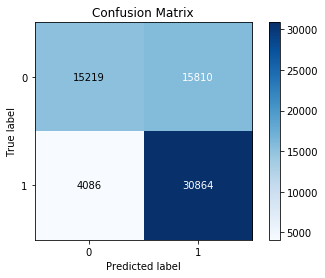

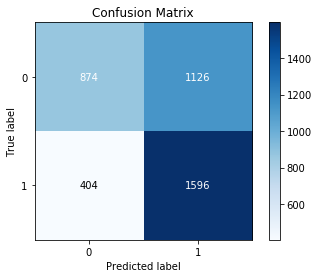

In [85]:
y_pre = cnn_model.predict_classes(x_train)
y_pre1 = cnn_model.predict_classes(x_cv1)
skplt.metrics.plot_confusion_matrix(y_train,y_pre)
skplt.metrics.plot_confusion_matrix(y_cv1,y_pre1)

## Reading the entire train and cv data

In [7]:
X_train = np.load('X_train.npy')
y_train = np.load('y_train.npy')
X_cv = np.load('X_cv.npy')
y_cv = np.load('y_cv.npy')

In [11]:
X_train.shape,X_cv.shape

((260000, 64, 64, 3), (26698, 64, 64, 3))

In [14]:
model3=Sequential()
model3.add(Conv2D(input_shape=(64, 64, 3), filters=20, kernel_size=4, strides=2, padding='valid',activation='relu'))
model3.add(Conv2D(filters=15, kernel_size=3, strides=1, padding='valid', activation='relu'))
model3.add(MaxPool2D(pool_size=3))
model3.add(Conv2D(filters=20, kernel_size=4, strides=2, padding='valid', activation='relu'))
model3.add(MaxPool2D(pool_size=2))
model3.add(Flatten())
model3.add(Dropout(0.2))
model3.add(Dense(1, activation='sigmoid'))

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_7 (Conv2D)            (None, 31, 31, 20)        980       
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 29, 29, 15)        2715      
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 9, 9, 15)          0         
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 3, 3, 20)          4820      
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 1, 1, 20)          0         
_________________________________________________________________
flatten_3 (Flatten)          (None, 20)                0         
_________________________________________________________________
dropout_3 (Dropout)          (None, 20)               

In [ ]:
model3.compile(Adam(lr = .000001), loss='binary_crossentropy', metrics=['accuracy'])
model3.summary()

In [1]:
history = cnn_model.fit(X_train, y_train, batch_size=32, epochs=150, verbose=1,validation_data=(X_cv, y_cv))

In [ ]:
- As github allow max size of a file only till 25 MB so I have removed printed history of the model.

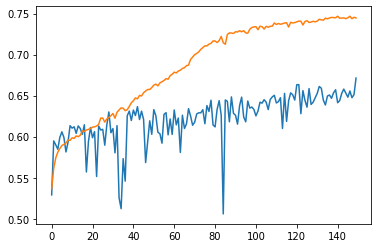

In [32]:
plt.plot(history.history['val_acc'])
plt.plot(history.history['acc'])

In [50]:
#cnn_model.save('CNN_ALL_Data.h5')  # saving the trained model in the system for future use.

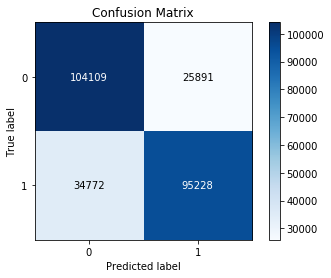

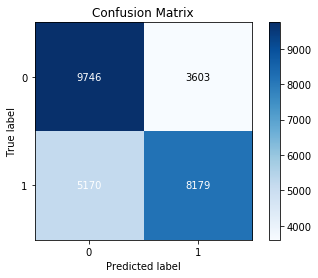

In [54]:
y_pre = model3.predict_classes(X_train)
y_pre1 = model3.predict_classes(X_cv)
skplt.metrics.plot_confusion_matrix(y_train,y_pre)
skplt.metrics.plot_confusion_matrix(y_cv,y_pre1)

In [55]:
print("Accuracy for the training data :",accuracy_score(y_train,y_pre))
print("Accuracy for the CV data :",accuracy_score(y_cv,y_pre1))

Accuracy for the training data : 0.7666807692307692
Accuracy for the CV data : 0.6713986066372013


### eveluation on the test data

In [41]:
X_test = np.load('x_test.npy')

In [42]:
y_test = np.load('y_test.npy')

In [43]:
y_pre1 = model3.predict_classes(X_test)

In [ ]:
X_test.shape

In [49]:
print("Accuracy for the training data :",accuracy_score(y_train,y_pre))
print("Accuracy for the test data :",accuracy_score(y_test,y_pre1))

Accuracy for the training data : 0.7666807692307692
Accuracy for the test data : 0.7636562309936397


Confusion matrix for train and test data


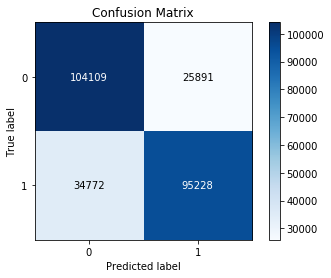

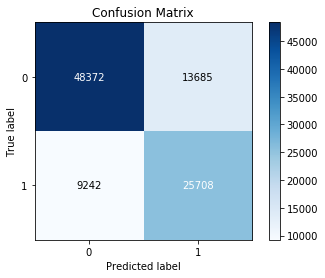

In [48]:
print("Confusion matrix for train and test data")
skplt.metrics.plot_confusion_matrix(y_train,y_pre)
skplt.metrics.plot_confusion_matrix(y_test,y_pre1)

In [53]:
model3 = load_model('CNN_ALL_Data.h5')## reading the entire model

### Result of the Model
- We are getting 77% accuracy score on our CNN model (given in the paper)

#### Next Experiment
- I am planning to apply transfer learning to imporve the accuracy of the model.


## Steps Taken

1. Download the dataset from http://web.archive.org/web/20171013200331/http://ifc.recod.ic.unicamp.br/fc.website/index.py?sec=5
2. Create seperate directory to seperate mask and fake images.
3. Check the number of channels in the pristine images, fake images, and mask of fake images.
4. Generate the dataset for fake images with the help of corresponding mask.
5. Generate the dataset for pristine images by taking same size as that of fake images.
6. Break the dataset into train, test, cv data. Keep the dataset balanced.
7. Apply the CNN architecture, given in the paper https://ieeexplore.ieee.org/abstract/document/7823911.
8. Evaluate the result.